In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.io
import os
import seaborn as sns
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import gc
import random
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense
import glob
import model
import config
import utils

import warnings
warnings.filterwarnings("ignore")

In [2]:
path = './BandMyo_data/'  

In [3]:
data_processor = utils.data_processing(Num_sensor, Num_labels, Num_gesture)

EMG_dataframe = data_processor.build_data(path)
Node_feature, X_train, y_train, X_test, y_test = data_processor.data_split(EMG_dataframe, ratio=0.8)

In [4]:
graph_generator = config.Graph_BandMyo(EMG_dataframe, Num_sensor)

In [5]:
knn1_graph, edges, edge_weights = graph_generator.KNN1()

In [6]:
def plot(result):
    loss = result.history["loss"]
    acc = result.history["acc"]
    val_loss = result.history["val_loss"]
    val_acc = result.history["val_acc"]

    plt.figure(figsize=(13,4))

    plt.subplot(1,2,1)
    plt.plot(range(len(loss)),loss,label = "Train Loss", marker='o', markersize=3)
    plt.plot(range(len(val_loss)),val_loss,label = "Validation Loss", marker='o', markersize=3)
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.grid()
    plt.legend(loc='upper right')

    plt.subplot(1,2,2)
    plt.plot(range(len(acc)),acc,label = "Train Accuracy", marker='o', markersize=3)
    plt.plot(range(len(val_acc)),val_acc,label = "Validation Accuracy", marker='o', markersize=3)
    plt.title('Model Acc')
    plt.ylabel('Acc')
    plt.xlabel('Epoch')
    plt.grid()
    plt.legend(loc='upper left')
    plt.show()

In [9]:
def draw_all(lst_history):
    plt.figure(figsize=(13,4))

    for i, history in enumerate(lst_history):
        plt.subplot(1, 2, i+1)
        for j in range(len(history)):
            label = f"No {j}" if j > 0 else "All"
            plt.plot(history[j].history['val_loss'], label=label, marker='o', markersize=1)
        
        plt.title('Model Loss' if i == 0 else 'Model Acc')
        plt.ylabel('Loss' if i == 0 else 'Acc')
        plt.xlabel('Epoch')
        plt.grid()
        plt.legend(loc='upper right' if i == 0 else 'lower right')

    plt.show()

In [10]:
def build_data(subject, LST_sensor):
    lst_len = []
    for label in range(1,10):   #1~9
        tmp = glob.glob(path + '/00{}/00{}/*.mat'.format(subject, label))
        for gesture in range(len(tmp)):
            tmp2 = scipy.io.loadmat(tmp[gesture])
            globals()['emg_sub{}_label{}_Gesture{}'.format(subject, label, gesture)] = tmp2['data'].T
            for i in range(8):
                lst_len.append(len(globals()['emg_sub{}_label{}_Gesture{}'.format(subject, label, gesture)][i]))


    for label in range(6):  #10~15
        tmp = glob.glob(path + '/00{}/01{}/*.mat'.format(subject, label))
        for gesture in range(len(tmp)):
            tmp2 = scipy.io.loadmat(tmp[gesture])
            globals()['emg_sub{}_label{}_Gesture{}'.format(subject, label + 10, gesture)] = tmp2['data'].T
            for i in range(8):
                lst_len.append(len(globals()['emg_sub{}_label{}_Gesture{}'.format(subject, label + 10, gesture)][i]))

    length = np.min(lst_len)
    tmp_lst, labels = [], []


    for label in range(1,16):
        for gesture in range(8):
            for idx in range(3): 
                for sensors in LST_sensor:
                    tm = globals()['emg_sub{}_label{}_Gesture{}'.format(subject, label, gesture)][sensors]
                    tmp0 = pd.DataFrame(tm)
                    tmp = tmp0.sample(n=length)
                    new_tmp = tmp.sort_index().values.tolist()
                    new_tmp_ = new_tmp[200*idx:200*(idx+1)]

                    new_tmp2 = scaler.fit_transform(new_tmp_)
                    tmp_lst.append(list(new_tmp2.reshape(-1)))
                    labels.append(label-1)

    for_cols = []
    for i in range(200): for_cols.append('t{}'.format(i))

    df = pd.DataFrame(tmp_lst)
    df.columns = for_cols
    df['Label'] = labels

    train_data = df.sample(frac=1)

    feature_names = set(df.columns) - {"Label"}
    num_features = len(feature_names)

    x_train = train_data[feature_names].to_numpy()
    y_train = train_data["Label"]

    node_features = tf.cast(df[feature_names].to_numpy(), dtype=tf.dtypes.float32)
    x_train = train_data.index.to_numpy()

    return x_train, y_train, node_features, df

In [11]:
hidden_units = [256, 256]
learning_rate = 0.01
dropout_rate = 0.15
num_epochs = 150
batch_size = 64

num_classes = 15
lr_scheduler = LearningRateScheduler(model.step_decay, verbose=1)

In [12]:
for subject in range(6):
    x_train, y_train, node_features, df = build_data(subject, [0,1,2,3,4,5,6,7])
    graph1, edges, edge_weights = graph_generator.KNN1()
    graph_info = (node_features, edges, edge_weights) 

    print("Edges shape:", edges.shape, "    Nodes shape:", node_features.shape)

    GCN = model.GNNNodeClassifier(
        graph_info=graph_metadata,
        num_classes=num_classes,
        hidden_units=hidden_units,
        dropout_rate=dropout_rate,
        name="GCN_KNN1",
    )
    
    GCN.compile(
        optimizer=keras.optimizers.Adam(learning_rate),
        loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
        metrics=[keras.metrics.SparseCategoricalAccuracy(name="acc")],
    )
    
    globals()['history_all_S{}'.format(subject)] = GCN.fit(
        x=x_train,
        y=y_train,
        epochs=num_epochs,
        batch_size=batch_size,
        validation_split=val_split, 
        callbacks=[lr_scheduler],
        verbose=1
    )

    del model

Edges shape: (2880, 2)     Nodes shape: (2880, 200)
Epoch 1/200
18/18 [==============================] - 16s 173ms/step - loss: 4.6337 - acc: 0.0699 - val_loss: 3.2792 - val_acc: 0.0764
Epoch 2/200
18/18 [==============================] - 0s 23ms/step - loss: 2.5053 - acc: 0.2283 - val_loss: 3.0742 - val_acc: 0.0747
Epoch 3/200
18/18 [==============================] - 1s 42ms/step - loss: 1.8039 - acc: 0.4926 - val_loss: 2.9838 - val_acc: 0.0990
Epoch 4/200
18/18 [==============================] - 1s 37ms/step - loss: 1.1729 - acc: 0.7786 - val_loss: 2.9717 - val_acc: 0.1163
Epoch 5/200
18/18 [==============================] - 1s 36ms/step - loss: 0.6496 - acc: 0.9301 - val_loss: 2.9715 - val_acc: 0.1372
Epoch 6/200
18/18 [==============================] - 1s 43ms/step - loss: 0.3026 - acc: 0.9913 - val_loss: 2.8352 - val_acc: 0.1736
Epoch 7/200
18/18 [==============================] - 1s 38ms/step - loss: 0.1334 - acc: 0.9996 - val_loss: 2.7589 - val_acc: 0.1944
Epoch 8/200
18/18 [===

18/18 [==============================] - 1s 37ms/step - loss: 4.5577e-04 - acc: 1.0000 - val_loss: 2.1365 - val_acc: 0.4635
Epoch 62/200
18/18 [==============================] - 1s 35ms/step - loss: 4.4064e-04 - acc: 1.0000 - val_loss: 2.1327 - val_acc: 0.4618
Epoch 63/200
18/18 [==============================] - 1s 35ms/step - loss: 4.2583e-04 - acc: 1.0000 - val_loss: 2.1314 - val_acc: 0.4618
Epoch 64/200
18/18 [==============================] - 1s 35ms/step - loss: 4.1180e-04 - acc: 1.0000 - val_loss: 2.1294 - val_acc: 0.4653
Epoch 65/200
18/18 [==============================] - 1s 36ms/step - loss: 3.9821e-04 - acc: 1.0000 - val_loss: 2.1253 - val_acc: 0.4653
Epoch 66/200
18/18 [==============================] - 1s 39ms/step - loss: 3.8585e-04 - acc: 1.0000 - val_loss: 2.1233 - val_acc: 0.4653
Epoch 67/200
18/18 [==============================] - 1s 39ms/step - loss: 3.7365e-04 - acc: 1.0000 - val_loss: 2.1213 - val_acc: 0.4705
Epoch 68/200
18/18 [==============================] - 

Epoch 121/200
18/18 [==============================] - 1s 36ms/step - loss: 1.0014e-04 - acc: 1.0000 - val_loss: 2.0320 - val_acc: 0.5191
Epoch 122/200
18/18 [==============================] - 1s 36ms/step - loss: 9.8211e-05 - acc: 1.0000 - val_loss: 2.0304 - val_acc: 0.5191
Epoch 123/200
18/18 [==============================] - 1s 35ms/step - loss: 9.6316e-05 - acc: 1.0000 - val_loss: 2.0288 - val_acc: 0.5208
Epoch 124/200
18/18 [==============================] - 1s 36ms/step - loss: 9.4496e-05 - acc: 1.0000 - val_loss: 2.0284 - val_acc: 0.5208
Epoch 125/200
18/18 [==============================] - 1s 41ms/step - loss: 9.2703e-05 - acc: 1.0000 - val_loss: 2.0267 - val_acc: 0.5226
Epoch 126/200
18/18 [==============================] - 1s 36ms/step - loss: 9.1017e-05 - acc: 1.0000 - val_loss: 2.0254 - val_acc: 0.5208
Epoch 127/200
18/18 [==============================] - 1s 36ms/step - loss: 8.9299e-05 - acc: 1.0000 - val_loss: 2.0245 - val_acc: 0.5208
Epoch 128/200
18/18 [=============

18/18 [==============================] - 1s 35ms/step - loss: 3.7022e-05 - acc: 1.0000 - val_loss: 1.9785 - val_acc: 0.5486
Epoch 181/200
18/18 [==============================] - 1s 37ms/step - loss: 3.6488e-05 - acc: 1.0000 - val_loss: 1.9782 - val_acc: 0.5503
Epoch 182/200
18/18 [==============================] - 1s 36ms/step - loss: 3.5937e-05 - acc: 1.0000 - val_loss: 1.9770 - val_acc: 0.5503
Epoch 183/200
18/18 [==============================] - 1s 36ms/step - loss: 3.5406e-05 - acc: 1.0000 - val_loss: 1.9765 - val_acc: 0.5521
Epoch 184/200
18/18 [==============================] - 1s 35ms/step - loss: 3.4903e-05 - acc: 1.0000 - val_loss: 1.9761 - val_acc: 0.5521
Epoch 185/200
18/18 [==============================] - 1s 35ms/step - loss: 3.4389e-05 - acc: 1.0000 - val_loss: 1.9750 - val_acc: 0.5538
Epoch 186/200
18/18 [==============================] - 1s 36ms/step - loss: 3.3876e-05 - acc: 1.0000 - val_loss: 1.9748 - val_acc: 0.5538
Epoch 187/200
18/18 [===========================

18/18 [==============================] - 0s 19ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.1382 - val_acc: 0.4601
Epoch 41/200
18/18 [==============================] - 0s 18ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.1332 - val_acc: 0.4601
Epoch 42/200
18/18 [==============================] - 0s 20ms/step - loss: 0.0010 - acc: 1.0000 - val_loss: 2.1255 - val_acc: 0.4635
Epoch 43/200
18/18 [==============================] - 0s 18ms/step - loss: 9.8142e-04 - acc: 1.0000 - val_loss: 2.1210 - val_acc: 0.4653
Epoch 44/200
18/18 [==============================] - 0s 17ms/step - loss: 9.3401e-04 - acc: 1.0000 - val_loss: 2.1173 - val_acc: 0.4670
Epoch 45/200
18/18 [==============================] - 0s 19ms/step - loss: 8.9076e-04 - acc: 1.0000 - val_loss: 2.1122 - val_acc: 0.4688
Epoch 46/200
18/18 [==============================] - 0s 18ms/step - loss: 8.5000e-04 - acc: 1.0000 - val_loss: 2.1062 - val_acc: 0.4740
Epoch 47/200
18/18 [==============================] - 0s 18ms/step

Epoch 100/200
18/18 [==============================] - 0s 18ms/step - loss: 1.5532e-04 - acc: 1.0000 - val_loss: 1.9485 - val_acc: 0.5243
Epoch 101/200
18/18 [==============================] - 0s 20ms/step - loss: 1.5180e-04 - acc: 1.0000 - val_loss: 1.9480 - val_acc: 0.5278
Epoch 102/200
18/18 [==============================] - 0s 17ms/step - loss: 1.4848e-04 - acc: 1.0000 - val_loss: 1.9444 - val_acc: 0.5243
Epoch 103/200
18/18 [==============================] - 0s 19ms/step - loss: 1.4513e-04 - acc: 1.0000 - val_loss: 1.9439 - val_acc: 0.5312
Epoch 104/200
18/18 [==============================] - 0s 20ms/step - loss: 1.4190e-04 - acc: 1.0000 - val_loss: 1.9409 - val_acc: 0.5260
Epoch 105/200
18/18 [==============================] - 0s 18ms/step - loss: 1.3892e-04 - acc: 1.0000 - val_loss: 1.9384 - val_acc: 0.5295
Epoch 106/200
18/18 [==============================] - 0s 17ms/step - loss: 1.3586e-04 - acc: 1.0000 - val_loss: 1.9384 - val_acc: 0.5295
Epoch 107/200
18/18 [=============

18/18 [==============================] - 0s 17ms/step - loss: 5.0715e-05 - acc: 1.0000 - val_loss: 1.8670 - val_acc: 0.5608
Epoch 160/200
18/18 [==============================] - 0s 18ms/step - loss: 4.9916e-05 - acc: 1.0000 - val_loss: 1.8656 - val_acc: 0.5625
Epoch 161/200
18/18 [==============================] - 0s 18ms/step - loss: 4.9117e-05 - acc: 1.0000 - val_loss: 1.8646 - val_acc: 0.5642
Epoch 162/200
18/18 [==============================] - 0s 17ms/step - loss: 4.8331e-05 - acc: 1.0000 - val_loss: 1.8624 - val_acc: 0.5625
Epoch 163/200
18/18 [==============================] - 0s 17ms/step - loss: 4.7565e-05 - acc: 1.0000 - val_loss: 1.8626 - val_acc: 0.5660
Epoch 164/200
18/18 [==============================] - 0s 19ms/step - loss: 4.6833e-05 - acc: 1.0000 - val_loss: 1.8603 - val_acc: 0.5642
Epoch 165/200
18/18 [==============================] - 0s 20ms/step - loss: 4.6066e-05 - acc: 1.0000 - val_loss: 1.8598 - val_acc: 0.5642
Epoch 166/200
18/18 [===========================

Epoch 19/200
18/18 [==============================] - 0s 20ms/step - loss: 0.0049 - acc: 1.0000 - val_loss: 2.2285 - val_acc: 0.3733
Epoch 20/200
18/18 [==============================] - 0s 18ms/step - loss: 0.0044 - acc: 1.0000 - val_loss: 2.2115 - val_acc: 0.3750
Epoch 21/200
18/18 [==============================] - 0s 17ms/step - loss: 0.0040 - acc: 1.0000 - val_loss: 2.1975 - val_acc: 0.3802
Epoch 22/200
18/18 [==============================] - 0s 18ms/step - loss: 0.0036 - acc: 1.0000 - val_loss: 2.1926 - val_acc: 0.3837
Epoch 23/200
18/18 [==============================] - 0s 18ms/step - loss: 0.0033 - acc: 1.0000 - val_loss: 2.1746 - val_acc: 0.3889
Epoch 24/200
18/18 [==============================] - 0s 19ms/step - loss: 0.0030 - acc: 1.0000 - val_loss: 2.1701 - val_acc: 0.3854
Epoch 25/200
18/18 [==============================] - 0s 18ms/step - loss: 0.0028 - acc: 1.0000 - val_loss: 2.1580 - val_acc: 0.3941
Epoch 26/200
18/18 [==============================] - 0s 18ms/step - 

18/18 [==============================] - 1s 35ms/step - loss: 2.4925e-04 - acc: 1.0000 - val_loss: 1.9335 - val_acc: 0.4983
Epoch 80/200
18/18 [==============================] - 1s 35ms/step - loss: 2.4248e-04 - acc: 1.0000 - val_loss: 1.9314 - val_acc: 0.4965
Epoch 81/200
18/18 [==============================] - 1s 34ms/step - loss: 2.3599e-04 - acc: 1.0000 - val_loss: 1.9297 - val_acc: 0.5000
Epoch 82/200
18/18 [==============================] - 1s 34ms/step - loss: 2.2977e-04 - acc: 1.0000 - val_loss: 1.9266 - val_acc: 0.5017
Epoch 83/200
18/18 [==============================] - 1s 35ms/step - loss: 2.2391e-04 - acc: 1.0000 - val_loss: 1.9274 - val_acc: 0.5000
Epoch 84/200
18/18 [==============================] - 1s 34ms/step - loss: 2.1801e-04 - acc: 1.0000 - val_loss: 1.9227 - val_acc: 0.5000
Epoch 85/200
18/18 [==============================] - 1s 37ms/step - loss: 2.1243e-04 - acc: 1.0000 - val_loss: 1.9217 - val_acc: 0.5000
Epoch 86/200
18/18 [==============================] - 

18/18 [==============================] - 1s 34ms/step - loss: 6.9588e-05 - acc: 1.0000 - val_loss: 1.8482 - val_acc: 0.5278
Epoch 139/200
18/18 [==============================] - 1s 35ms/step - loss: 6.8423e-05 - acc: 1.0000 - val_loss: 1.8472 - val_acc: 0.5278
Epoch 140/200
18/18 [==============================] - 1s 36ms/step - loss: 6.7194e-05 - acc: 1.0000 - val_loss: 1.8473 - val_acc: 0.5260
Epoch 141/200
18/18 [==============================] - 1s 34ms/step - loss: 6.6064e-05 - acc: 1.0000 - val_loss: 1.8452 - val_acc: 0.5243
Epoch 142/200
18/18 [==============================] - 1s 35ms/step - loss: 6.5011e-05 - acc: 1.0000 - val_loss: 1.8434 - val_acc: 0.5278
Epoch 143/200
18/18 [==============================] - 1s 36ms/step - loss: 6.3783e-05 - acc: 1.0000 - val_loss: 1.8431 - val_acc: 0.5278
Epoch 144/200
18/18 [==============================] - 1s 35ms/step - loss: 6.2720e-05 - acc: 1.0000 - val_loss: 1.8417 - val_acc: 0.5295
Epoch 145/200
18/18 [===========================

18/18 [==============================] - 1s 34ms/step - loss: 2.7599e-05 - acc: 1.0000 - val_loss: 1.7971 - val_acc: 0.5712
Epoch 198/200
18/18 [==============================] - 1s 34ms/step - loss: 2.7207e-05 - acc: 1.0000 - val_loss: 1.7966 - val_acc: 0.5660
Epoch 199/200
18/18 [==============================] - 1s 35ms/step - loss: 2.6826e-05 - acc: 1.0000 - val_loss: 1.7941 - val_acc: 0.5694
Epoch 200/200
18/18 [==============================] - 1s 35ms/step - loss: 2.6444e-05 - acc: 1.0000 - val_loss: 1.7945 - val_acc: 0.5677
Edges shape: (2880, 2)     Nodes shape: (2880, 200)
Epoch 1/200
18/18 [==============================] - 11s 130ms/step - loss: 4.2681 - acc: 0.0712 - val_loss: 3.3848 - val_acc: 0.0764
Epoch 2/200
18/18 [==============================] - 0s 22ms/step - loss: 2.3976 - acc: 0.2361 - val_loss: 3.0807 - val_acc: 0.0833
Epoch 3/200
18/18 [==============================] - 0s 18ms/step - loss: 1.6635 - acc: 0.5625 - val_loss: 3.0681 - val_acc: 0.1007
Epoch 4/200


Epoch 58/200
18/18 [==============================] - 1s 36ms/step - loss: 4.9362e-04 - acc: 1.0000 - val_loss: 1.9727 - val_acc: 0.4826
Epoch 59/200
18/18 [==============================] - 1s 34ms/step - loss: 4.7628e-04 - acc: 1.0000 - val_loss: 1.9695 - val_acc: 0.4844
Epoch 60/200
18/18 [==============================] - 1s 34ms/step - loss: 4.5974e-04 - acc: 1.0000 - val_loss: 1.9646 - val_acc: 0.4861
Epoch 61/200
18/18 [==============================] - 1s 35ms/step - loss: 4.4335e-04 - acc: 1.0000 - val_loss: 1.9601 - val_acc: 0.4878
Epoch 62/200
18/18 [==============================] - 1s 35ms/step - loss: 4.2803e-04 - acc: 1.0000 - val_loss: 1.9567 - val_acc: 0.4861
Epoch 63/200
18/18 [==============================] - 1s 33ms/step - loss: 4.1385e-04 - acc: 1.0000 - val_loss: 1.9542 - val_acc: 0.4844
Epoch 64/200
18/18 [==============================] - 1s 34ms/step - loss: 4.0002e-04 - acc: 1.0000 - val_loss: 1.9504 - val_acc: 0.4878
Epoch 65/200
18/18 [=====================

18/18 [==============================] - 1s 34ms/step - loss: 1.0347e-04 - acc: 1.0000 - val_loss: 1.8230 - val_acc: 0.5382
Epoch 118/200
18/18 [==============================] - 1s 34ms/step - loss: 1.0147e-04 - acc: 1.0000 - val_loss: 1.8201 - val_acc: 0.5399
Epoch 119/200
18/18 [==============================] - 1s 35ms/step - loss: 9.9412e-05 - acc: 1.0000 - val_loss: 1.8191 - val_acc: 0.5382
Epoch 120/200
18/18 [==============================] - 1s 34ms/step - loss: 9.7473e-05 - acc: 1.0000 - val_loss: 1.8179 - val_acc: 0.5399
Epoch 121/200
18/18 [==============================] - 1s 34ms/step - loss: 9.5573e-05 - acc: 1.0000 - val_loss: 1.8140 - val_acc: 0.5365
Epoch 122/200
18/18 [==============================] - 1s 35ms/step - loss: 9.3665e-05 - acc: 1.0000 - val_loss: 1.8134 - val_acc: 0.5399
Epoch 123/200
18/18 [==============================] - 1s 34ms/step - loss: 9.1885e-05 - acc: 1.0000 - val_loss: 1.8126 - val_acc: 0.5382
Epoch 124/200
18/18 [===========================

18/18 [==============================] - 1s 35ms/step - loss: 3.7329e-05 - acc: 1.0000 - val_loss: 1.7393 - val_acc: 0.5694
Epoch 177/200
18/18 [==============================] - 1s 35ms/step - loss: 3.6779e-05 - acc: 1.0000 - val_loss: 1.7383 - val_acc: 0.5712
Epoch 178/200
18/18 [==============================] - 1s 34ms/step - loss: 3.6233e-05 - acc: 1.0000 - val_loss: 1.7359 - val_acc: 0.5694
Epoch 179/200
18/18 [==============================] - 1s 34ms/step - loss: 3.5691e-05 - acc: 1.0000 - val_loss: 1.7349 - val_acc: 0.5712
Epoch 180/200
18/18 [==============================] - 1s 35ms/step - loss: 3.5169e-05 - acc: 1.0000 - val_loss: 1.7350 - val_acc: 0.5712
Epoch 181/200
18/18 [==============================] - 1s 34ms/step - loss: 3.4662e-05 - acc: 1.0000 - val_loss: 1.7324 - val_acc: 0.5712
Epoch 182/200
18/18 [==============================] - 1s 34ms/step - loss: 3.4139e-05 - acc: 1.0000 - val_loss: 1.7330 - val_acc: 0.5729
Epoch 183/200
18/18 [===========================

18/18 [==============================] - 1s 36ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.2562 - val_acc: 0.3524
Epoch 37/200
18/18 [==============================] - 1s 34ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.2509 - val_acc: 0.3524
Epoch 38/200
18/18 [==============================] - 1s 37ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.2413 - val_acc: 0.3524
Epoch 39/200
18/18 [==============================] - 1s 35ms/step - loss: 0.0010 - acc: 1.0000 - val_loss: 2.2331 - val_acc: 0.3576
Epoch 40/200
18/18 [==============================] - 1s 43ms/step - loss: 9.9242e-04 - acc: 1.0000 - val_loss: 2.2289 - val_acc: 0.3576
Epoch 41/200
18/18 [==============================] - 1s 40ms/step - loss: 9.4384e-04 - acc: 1.0000 - val_loss: 2.2236 - val_acc: 0.3611
Epoch 42/200
18/18 [==============================] - 1s 35ms/step - loss: 8.9709e-04 - acc: 1.0000 - val_loss: 2.2147 - val_acc: 0.3628
Epoch 43/200
18/18 [==============================] - 1s 34ms/step - l

18/18 [==============================] - 1s 36ms/step - loss: 1.5467e-04 - acc: 1.0000 - val_loss: 2.0207 - val_acc: 0.4444
Epoch 97/200
18/18 [==============================] - 1s 34ms/step - loss: 1.5114e-04 - acc: 1.0000 - val_loss: 2.0190 - val_acc: 0.4444
Epoch 98/200
18/18 [==============================] - 1s 36ms/step - loss: 1.4768e-04 - acc: 1.0000 - val_loss: 2.0158 - val_acc: 0.4427
Epoch 99/200
18/18 [==============================] - 1s 34ms/step - loss: 1.4444e-04 - acc: 1.0000 - val_loss: 2.0135 - val_acc: 0.4462
Epoch 100/200
18/18 [==============================] - 1s 37ms/step - loss: 1.4121e-04 - acc: 1.0000 - val_loss: 2.0120 - val_acc: 0.4479
Epoch 101/200
18/18 [==============================] - 1s 33ms/step - loss: 1.3802e-04 - acc: 1.0000 - val_loss: 2.0078 - val_acc: 0.4497
Epoch 102/200
18/18 [==============================] - 1s 33ms/step - loss: 1.3511e-04 - acc: 1.0000 - val_loss: 2.0070 - val_acc: 0.4514
Epoch 103/200
18/18 [==============================

18/18 [==============================] - 1s 34ms/step - loss: 4.9753e-05 - acc: 1.0000 - val_loss: 1.9161 - val_acc: 0.4983
Epoch 156/200
18/18 [==============================] - 1s 36ms/step - loss: 4.8943e-05 - acc: 1.0000 - val_loss: 1.9139 - val_acc: 0.4983
Epoch 157/200
18/18 [==============================] - 1s 33ms/step - loss: 4.8152e-05 - acc: 1.0000 - val_loss: 1.9136 - val_acc: 0.4983
Epoch 158/200
18/18 [==============================] - 1s 34ms/step - loss: 4.7380e-05 - acc: 1.0000 - val_loss: 1.9114 - val_acc: 0.4983
Epoch 159/200
18/18 [==============================] - 1s 33ms/step - loss: 4.6623e-05 - acc: 1.0000 - val_loss: 1.9094 - val_acc: 0.5000
Epoch 160/200
18/18 [==============================] - 1s 33ms/step - loss: 4.5876e-05 - acc: 1.0000 - val_loss: 1.9085 - val_acc: 0.5017
Epoch 161/200
18/18 [==============================] - 1s 33ms/step - loss: 4.5140e-05 - acc: 1.0000 - val_loss: 1.9084 - val_acc: 0.4983
Epoch 162/200
18/18 [===========================

18/18 [==============================] - 0s 18ms/step - loss: 0.0117 - acc: 1.0000 - val_loss: 2.6490 - val_acc: 0.2847
Epoch 15/200
18/18 [==============================] - 0s 17ms/step - loss: 0.0099 - acc: 1.0000 - val_loss: 2.5866 - val_acc: 0.2899
Epoch 16/200
18/18 [==============================] - 0s 18ms/step - loss: 0.0085 - acc: 1.0000 - val_loss: 2.5969 - val_acc: 0.3056
Epoch 17/200
18/18 [==============================] - 0s 18ms/step - loss: 0.0074 - acc: 1.0000 - val_loss: 2.5628 - val_acc: 0.3125
Epoch 18/200
18/18 [==============================] - 0s 18ms/step - loss: 0.0065 - acc: 1.0000 - val_loss: 2.5471 - val_acc: 0.3142
Epoch 19/200
18/18 [==============================] - 0s 18ms/step - loss: 0.0057 - acc: 1.0000 - val_loss: 2.5322 - val_acc: 0.3212
Epoch 20/200
18/18 [==============================] - 0s 18ms/step - loss: 0.0051 - acc: 1.0000 - val_loss: 2.5127 - val_acc: 0.3351
Epoch 21/200
18/18 [==============================] - 0s 16ms/step - loss: 0.0045 

Epoch 75/200
18/18 [==============================] - 0s 18ms/step - loss: 2.8586e-04 - acc: 1.0000 - val_loss: 2.2343 - val_acc: 0.4618
Epoch 76/200
18/18 [==============================] - 0s 17ms/step - loss: 2.7752e-04 - acc: 1.0000 - val_loss: 2.2338 - val_acc: 0.4618
Epoch 77/200
18/18 [==============================] - 0s 18ms/step - loss: 2.6988e-04 - acc: 1.0000 - val_loss: 2.2315 - val_acc: 0.4653
Epoch 78/200
18/18 [==============================] - 0s 18ms/step - loss: 2.6212e-04 - acc: 1.0000 - val_loss: 2.2291 - val_acc: 0.4653
Epoch 79/200
18/18 [==============================] - 0s 16ms/step - loss: 2.5540e-04 - acc: 1.0000 - val_loss: 2.2268 - val_acc: 0.4653
Epoch 80/200
18/18 [==============================] - 0s 16ms/step - loss: 2.4818e-04 - acc: 1.0000 - val_loss: 2.2230 - val_acc: 0.4688
Epoch 81/200
18/18 [==============================] - 0s 17ms/step - loss: 2.4144e-04 - acc: 1.0000 - val_loss: 2.2239 - val_acc: 0.4705
Epoch 82/200
18/18 [=====================

18/18 [==============================] - 0s 18ms/step - loss: 7.5337e-05 - acc: 1.0000 - val_loss: 2.1425 - val_acc: 0.5000
Epoch 135/200
18/18 [==============================] - 0s 17ms/step - loss: 7.4020e-05 - acc: 1.0000 - val_loss: 2.1410 - val_acc: 0.5017
Epoch 136/200
18/18 [==============================] - 0s 19ms/step - loss: 7.2709e-05 - acc: 1.0000 - val_loss: 2.1393 - val_acc: 0.5017
Epoch 137/200
18/18 [==============================] - 0s 19ms/step - loss: 7.1376e-05 - acc: 1.0000 - val_loss: 2.1387 - val_acc: 0.5035
Epoch 138/200
18/18 [==============================] - 0s 18ms/step - loss: 7.0118e-05 - acc: 1.0000 - val_loss: 2.1372 - val_acc: 0.5052
Epoch 139/200
18/18 [==============================] - 0s 17ms/step - loss: 6.8874e-05 - acc: 1.0000 - val_loss: 2.1361 - val_acc: 0.5017
Epoch 140/200
18/18 [==============================] - 0s 18ms/step - loss: 6.7670e-05 - acc: 1.0000 - val_loss: 2.1349 - val_acc: 0.5017
Epoch 141/200
18/18 [===========================

18/18 [==============================] - 0s 19ms/step - loss: 2.9185e-05 - acc: 1.0000 - val_loss: 2.0902 - val_acc: 0.5278
Epoch 194/200
18/18 [==============================] - 0s 17ms/step - loss: 2.8767e-05 - acc: 1.0000 - val_loss: 2.0876 - val_acc: 0.5295
Epoch 195/200
18/18 [==============================] - 0s 19ms/step - loss: 2.8355e-05 - acc: 1.0000 - val_loss: 2.0876 - val_acc: 0.5295
Epoch 196/200
18/18 [==============================] - 0s 19ms/step - loss: 2.7960e-05 - acc: 1.0000 - val_loss: 2.0870 - val_acc: 0.5295
Epoch 197/200
18/18 [==============================] - 0s 17ms/step - loss: 2.7552e-05 - acc: 1.0000 - val_loss: 2.0871 - val_acc: 0.5295
Epoch 198/200
18/18 [==============================] - 0s 18ms/step - loss: 2.7179e-05 - acc: 1.0000 - val_loss: 2.0864 - val_acc: 0.5295
Epoch 199/200
18/18 [==============================] - 0s 18ms/step - loss: 2.6772e-05 - acc: 1.0000 - val_loss: 2.0843 - val_acc: 0.5295
Epoch 200/200
18/18 [===========================

In [13]:
for subject in range(6):
    for no_sensor in range(8):
        lst_sensor = []
        for i in range(8): 
            if i == no_sensor: pass
            else: lst_sensor.append(i)
        print(subject, "  Sensor List: ", lst_sensor)

        x_train, y_train, node_features, df = build_data(subject, lst_sensor)
        graph1, edges, edge_weights = graph_build(df)
        graph_info = (node_features, edges, edge_weights) # Create graph info tuple with node_features, edges, and edge_weights.

        print(no_sensor, "   Edges shape:", edges.shape, "    Nodes shape:", node_features.shape)

        loss_fn = keras.losses.SparseCategoricalCrossentropy(from_logits=True)
        optimizer = keras.optimizers.Adam(LEARNING_RATE)
        accuracy_fn = keras.metrics.SparseCategoricalAccuracy(name="acc")

        model = GraphAttentionNetwork(node_features, edges, HIDDEN_UNITS, NUM_HEADS, NUM_LAYERS, OUTPUT_DIM)

        model.compile(loss=loss_fn, optimizer=optimizer, metrics=[accuracy_fn])

        globals()['history_no{}_S{}'.format(no_sensor, subject)] = model.fit(x_train, y_train, validation_split=val_split, 
                                                                batch_size=BATCH_SIZE, epochs=NUM_EPOCHS, verbose=1)

        del model

0   Sensor List:  [1, 2, 3, 4, 5, 6, 7]
0    Edges shape: (2520, 2)     Nodes shape: (2520, 200)
Epoch 1/200
16/16 [==============================] - 11s 149ms/step - loss: 4.3867 - acc: 0.0744 - val_loss: 3.3101 - val_acc: 0.0615
Epoch 2/200
16/16 [==============================] - 0s 22ms/step - loss: 2.4263 - acc: 0.2485 - val_loss: 3.1494 - val_acc: 0.0774
Epoch 3/200
16/16 [==============================] - 0s 20ms/step - loss: 1.7254 - acc: 0.5144 - val_loss: 3.0871 - val_acc: 0.0992
Epoch 4/200
16/16 [==============================] - 0s 18ms/step - loss: 1.0619 - acc: 0.7961 - val_loss: 3.0542 - val_acc: 0.1250
Epoch 5/200
16/16 [==============================] - 0s 19ms/step - loss: 0.5519 - acc: 0.9549 - val_loss: 2.9270 - val_acc: 0.1448
Epoch 6/200
16/16 [==============================] - 0s 18ms/step - loss: 0.2353 - acc: 0.9980 - val_loss: 2.8244 - val_acc: 0.1647
Epoch 7/200
16/16 [==============================] - 0s 18ms/step - loss: 0.1032 - acc: 1.0000 - val_loss: 2.

16/16 [==============================] - 1s 35ms/step - loss: 4.8720e-04 - acc: 1.0000 - val_loss: 1.9636 - val_acc: 0.4782
Epoch 62/200
16/16 [==============================] - 1s 36ms/step - loss: 4.7108e-04 - acc: 1.0000 - val_loss: 1.9570 - val_acc: 0.4802
Epoch 63/200
16/16 [==============================] - 1s 38ms/step - loss: 4.5529e-04 - acc: 1.0000 - val_loss: 1.9548 - val_acc: 0.4841
Epoch 64/200
16/16 [==============================] - 1s 36ms/step - loss: 4.4106e-04 - acc: 1.0000 - val_loss: 1.9492 - val_acc: 0.4841
Epoch 65/200
16/16 [==============================] - 1s 39ms/step - loss: 4.2669e-04 - acc: 1.0000 - val_loss: 1.9441 - val_acc: 0.4841
Epoch 66/200
16/16 [==============================] - 1s 37ms/step - loss: 4.1270e-04 - acc: 1.0000 - val_loss: 1.9432 - val_acc: 0.4861
Epoch 67/200
16/16 [==============================] - 1s 35ms/step - loss: 4.0001e-04 - acc: 1.0000 - val_loss: 1.9401 - val_acc: 0.4901
Epoch 68/200
16/16 [==============================] - 

Epoch 121/200
16/16 [==============================] - 1s 38ms/step - loss: 1.1034e-04 - acc: 1.0000 - val_loss: 1.8031 - val_acc: 0.5496
Epoch 122/200
16/16 [==============================] - 1s 35ms/step - loss: 1.0827e-04 - acc: 1.0000 - val_loss: 1.8027 - val_acc: 0.5516
Epoch 123/200
16/16 [==============================] - 1s 38ms/step - loss: 1.0633e-04 - acc: 1.0000 - val_loss: 1.7992 - val_acc: 0.5536
Epoch 124/200
16/16 [==============================] - 1s 37ms/step - loss: 1.0435e-04 - acc: 1.0000 - val_loss: 1.7987 - val_acc: 0.5516
Epoch 125/200
16/16 [==============================] - 1s 37ms/step - loss: 1.0255e-04 - acc: 1.0000 - val_loss: 1.7953 - val_acc: 0.5556
Epoch 126/200
16/16 [==============================] - 1s 35ms/step - loss: 1.0059e-04 - acc: 1.0000 - val_loss: 1.7957 - val_acc: 0.5556
Epoch 127/200
16/16 [==============================] - 1s 36ms/step - loss: 9.8760e-05 - acc: 1.0000 - val_loss: 1.7926 - val_acc: 0.5536
Epoch 128/200
16/16 [=============

16/16 [==============================] - 1s 37ms/step - loss: 4.2462e-05 - acc: 1.0000 - val_loss: 1.7218 - val_acc: 0.5794
Epoch 181/200
16/16 [==============================] - 1s 38ms/step - loss: 4.1853e-05 - acc: 1.0000 - val_loss: 1.7205 - val_acc: 0.5813
Epoch 182/200
16/16 [==============================] - 1s 39ms/step - loss: 4.1273e-05 - acc: 1.0000 - val_loss: 1.7183 - val_acc: 0.5794
Epoch 183/200
16/16 [==============================] - 1s 37ms/step - loss: 4.0682e-05 - acc: 1.0000 - val_loss: 1.7184 - val_acc: 0.5813
Epoch 184/200
16/16 [==============================] - 1s 38ms/step - loss: 4.0124e-05 - acc: 1.0000 - val_loss: 1.7165 - val_acc: 0.5813
Epoch 185/200
16/16 [==============================] - 1s 37ms/step - loss: 3.9587e-05 - acc: 1.0000 - val_loss: 1.7159 - val_acc: 0.5813
Epoch 186/200
16/16 [==============================] - 1s 38ms/step - loss: 3.9003e-05 - acc: 1.0000 - val_loss: 1.7142 - val_acc: 0.5833
Epoch 187/200
16/16 [===========================

16/16 [==============================] - 0s 18ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.2478 - val_acc: 0.3710
Epoch 41/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.2435 - val_acc: 0.3730
Epoch 42/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0010 - acc: 1.0000 - val_loss: 2.2372 - val_acc: 0.3790
Epoch 43/200
16/16 [==============================] - 0s 18ms/step - loss: 9.9328e-04 - acc: 1.0000 - val_loss: 2.2320 - val_acc: 0.3810
Epoch 44/200
16/16 [==============================] - 0s 17ms/step - loss: 9.4732e-04 - acc: 1.0000 - val_loss: 2.2238 - val_acc: 0.3810
Epoch 45/200
16/16 [==============================] - 0s 17ms/step - loss: 9.0509e-04 - acc: 1.0000 - val_loss: 2.2204 - val_acc: 0.3849
Epoch 46/200
16/16 [==============================] - 0s 17ms/step - loss: 8.6642e-04 - acc: 1.0000 - val_loss: 2.2143 - val_acc: 0.3889
Epoch 47/200
16/16 [==============================] - 0s 16ms/step

Epoch 100/200
16/16 [==============================] - 0s 18ms/step - loss: 1.6867e-04 - acc: 1.0000 - val_loss: 2.0440 - val_acc: 0.4643
Epoch 101/200
16/16 [==============================] - 0s 18ms/step - loss: 1.6498e-04 - acc: 1.0000 - val_loss: 2.0421 - val_acc: 0.4643
Epoch 102/200
16/16 [==============================] - 0s 17ms/step - loss: 1.6140e-04 - acc: 1.0000 - val_loss: 2.0388 - val_acc: 0.4702
Epoch 103/200
16/16 [==============================] - 0s 19ms/step - loss: 1.5788e-04 - acc: 1.0000 - val_loss: 2.0363 - val_acc: 0.4762
Epoch 104/200
16/16 [==============================] - 0s 18ms/step - loss: 1.5465e-04 - acc: 1.0000 - val_loss: 2.0346 - val_acc: 0.4762
Epoch 105/200
16/16 [==============================] - 0s 17ms/step - loss: 1.5141e-04 - acc: 1.0000 - val_loss: 2.0339 - val_acc: 0.4722
Epoch 106/200
16/16 [==============================] - 0s 17ms/step - loss: 1.4809e-04 - acc: 1.0000 - val_loss: 2.0304 - val_acc: 0.4742
Epoch 107/200
16/16 [=============

16/16 [==============================] - 0s 17ms/step - loss: 5.7329e-05 - acc: 1.0000 - val_loss: 1.9556 - val_acc: 0.5159
Epoch 160/200
16/16 [==============================] - 0s 19ms/step - loss: 5.6468e-05 - acc: 1.0000 - val_loss: 1.9545 - val_acc: 0.5139
Epoch 161/200
16/16 [==============================] - 0s 17ms/step - loss: 5.5581e-05 - acc: 1.0000 - val_loss: 1.9530 - val_acc: 0.5139
Epoch 162/200
16/16 [==============================] - 0s 18ms/step - loss: 5.4730e-05 - acc: 1.0000 - val_loss: 1.9515 - val_acc: 0.5159
Epoch 163/200
16/16 [==============================] - 0s 20ms/step - loss: 5.3891e-05 - acc: 1.0000 - val_loss: 1.9507 - val_acc: 0.5159
Epoch 164/200
16/16 [==============================] - 0s 24ms/step - loss: 5.3074e-05 - acc: 1.0000 - val_loss: 1.9491 - val_acc: 0.5179
Epoch 165/200
16/16 [==============================] - 1s 36ms/step - loss: 5.2279e-05 - acc: 1.0000 - val_loss: 1.9486 - val_acc: 0.5198
Epoch 166/200
16/16 [===========================

16/16 [==============================] - 0s 18ms/step - loss: 0.0059 - acc: 1.0000 - val_loss: 2.3429 - val_acc: 0.3234
Epoch 19/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0053 - acc: 1.0000 - val_loss: 2.3315 - val_acc: 0.3373
Epoch 20/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0047 - acc: 1.0000 - val_loss: 2.3149 - val_acc: 0.3433
Epoch 21/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0043 - acc: 1.0000 - val_loss: 2.3027 - val_acc: 0.3532
Epoch 22/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0039 - acc: 1.0000 - val_loss: 2.2859 - val_acc: 0.3631
Epoch 23/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0035 - acc: 1.0000 - val_loss: 2.2764 - val_acc: 0.3690
Epoch 24/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0032 - acc: 1.0000 - val_loss: 2.2648 - val_acc: 0.3730
Epoch 25/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0030 

16/16 [==============================] - 0s 18ms/step - loss: 2.8123e-04 - acc: 1.0000 - val_loss: 1.9890 - val_acc: 0.4921
Epoch 79/200
16/16 [==============================] - 0s 18ms/step - loss: 2.7341e-04 - acc: 1.0000 - val_loss: 1.9861 - val_acc: 0.4940
Epoch 80/200
16/16 [==============================] - 0s 18ms/step - loss: 2.6628e-04 - acc: 1.0000 - val_loss: 1.9822 - val_acc: 0.4901
Epoch 81/200
16/16 [==============================] - 0s 18ms/step - loss: 2.5937e-04 - acc: 1.0000 - val_loss: 1.9816 - val_acc: 0.4980
Epoch 82/200
16/16 [==============================] - 0s 18ms/step - loss: 2.5246e-04 - acc: 1.0000 - val_loss: 1.9795 - val_acc: 0.5000
Epoch 83/200
16/16 [==============================] - 0s 17ms/step - loss: 2.4619e-04 - acc: 1.0000 - val_loss: 1.9768 - val_acc: 0.5020
Epoch 84/200
16/16 [==============================] - 0s 18ms/step - loss: 2.3974e-04 - acc: 1.0000 - val_loss: 1.9745 - val_acc: 0.5040
Epoch 85/200
16/16 [==============================] - 

16/16 [==============================] - 0s 17ms/step - loss: 8.0135e-05 - acc: 1.0000 - val_loss: 1.8832 - val_acc: 0.5437
Epoch 138/200
16/16 [==============================] - 0s 20ms/step - loss: 7.8750e-05 - acc: 1.0000 - val_loss: 1.8825 - val_acc: 0.5437
Epoch 139/200
16/16 [==============================] - 0s 18ms/step - loss: 7.7459e-05 - acc: 1.0000 - val_loss: 1.8804 - val_acc: 0.5437
Epoch 140/200
16/16 [==============================] - 0s 19ms/step - loss: 7.6117e-05 - acc: 1.0000 - val_loss: 1.8794 - val_acc: 0.5437
Epoch 141/200
16/16 [==============================] - 0s 17ms/step - loss: 7.4890e-05 - acc: 1.0000 - val_loss: 1.8781 - val_acc: 0.5456
Epoch 142/200
16/16 [==============================] - 0s 17ms/step - loss: 7.3614e-05 - acc: 1.0000 - val_loss: 1.8775 - val_acc: 0.5456
Epoch 143/200
16/16 [==============================] - 0s 19ms/step - loss: 7.2416e-05 - acc: 1.0000 - val_loss: 1.8766 - val_acc: 0.5456
Epoch 144/200
16/16 [===========================

16/16 [==============================] - 0s 19ms/step - loss: 3.2853e-05 - acc: 1.0000 - val_loss: 1.8217 - val_acc: 0.5694
Epoch 197/200
16/16 [==============================] - 0s 20ms/step - loss: 3.2410e-05 - acc: 1.0000 - val_loss: 1.8214 - val_acc: 0.5655
Epoch 198/200
16/16 [==============================] - 0s 18ms/step - loss: 3.1970e-05 - acc: 1.0000 - val_loss: 1.8203 - val_acc: 0.5675
Epoch 199/200
16/16 [==============================] - 0s 20ms/step - loss: 3.1551e-05 - acc: 1.0000 - val_loss: 1.8198 - val_acc: 0.5694
Epoch 200/200
16/16 [==============================] - 0s 17ms/step - loss: 3.1127e-05 - acc: 1.0000 - val_loss: 1.8191 - val_acc: 0.5675
0   Sensor List:  [0, 1, 2, 4, 5, 6, 7]
3    Edges shape: (2520, 2)     Nodes shape: (2520, 200)
Epoch 1/200
16/16 [==============================] - 11s 149ms/step - loss: 4.5462 - acc: 0.0724 - val_loss: 3.6243 - val_acc: 0.0813
Epoch 2/200
16/16 [==============================] - 0s 22ms/step - loss: 2.5084 - acc: 0.240

16/16 [==============================] - 0s 17ms/step - loss: 6.3290e-04 - acc: 1.0000 - val_loss: 1.8644 - val_acc: 0.4782
Epoch 57/200
16/16 [==============================] - 0s 19ms/step - loss: 6.0886e-04 - acc: 1.0000 - val_loss: 1.8619 - val_acc: 0.4841
Epoch 58/200
16/16 [==============================] - 0s 19ms/step - loss: 5.8848e-04 - acc: 1.0000 - val_loss: 1.8566 - val_acc: 0.4940
Epoch 59/200
16/16 [==============================] - 0s 18ms/step - loss: 5.6764e-04 - acc: 1.0000 - val_loss: 1.8531 - val_acc: 0.4921
Epoch 60/200
16/16 [==============================] - 0s 20ms/step - loss: 5.4758e-04 - acc: 1.0000 - val_loss: 1.8474 - val_acc: 0.4980
Epoch 61/200
16/16 [==============================] - 0s 18ms/step - loss: 5.2862e-04 - acc: 1.0000 - val_loss: 1.8451 - val_acc: 0.4940
Epoch 62/200
16/16 [==============================] - 0s 18ms/step - loss: 5.1039e-04 - acc: 1.0000 - val_loss: 1.8407 - val_acc: 0.5000
Epoch 63/200
16/16 [==============================] - 

Epoch 116/200
16/16 [==============================] - 0s 18ms/step - loss: 1.2933e-04 - acc: 1.0000 - val_loss: 1.7026 - val_acc: 0.5496
Epoch 117/200
16/16 [==============================] - 0s 18ms/step - loss: 1.2698e-04 - acc: 1.0000 - val_loss: 1.7011 - val_acc: 0.5456
Epoch 118/200
16/16 [==============================] - 0s 17ms/step - loss: 1.2452e-04 - acc: 1.0000 - val_loss: 1.6990 - val_acc: 0.5456
Epoch 119/200
16/16 [==============================] - 0s 17ms/step - loss: 1.2207e-04 - acc: 1.0000 - val_loss: 1.6973 - val_acc: 0.5516
Epoch 120/200
16/16 [==============================] - 0s 19ms/step - loss: 1.1976e-04 - acc: 1.0000 - val_loss: 1.6966 - val_acc: 0.5496
Epoch 121/200
16/16 [==============================] - 0s 18ms/step - loss: 1.1742e-04 - acc: 1.0000 - val_loss: 1.6937 - val_acc: 0.5516
Epoch 122/200
16/16 [==============================] - 0s 19ms/step - loss: 1.1520e-04 - acc: 1.0000 - val_loss: 1.6925 - val_acc: 0.5496
Epoch 123/200
16/16 [=============

16/16 [==============================] - 0s 18ms/step - loss: 4.8124e-05 - acc: 1.0000 - val_loss: 1.6184 - val_acc: 0.5714
Epoch 176/200
16/16 [==============================] - 0s 18ms/step - loss: 4.7427e-05 - acc: 1.0000 - val_loss: 1.6180 - val_acc: 0.5714
Epoch 177/200
16/16 [==============================] - 0s 18ms/step - loss: 4.6761e-05 - acc: 1.0000 - val_loss: 1.6165 - val_acc: 0.5734
Epoch 178/200
16/16 [==============================] - 0s 17ms/step - loss: 4.6080e-05 - acc: 1.0000 - val_loss: 1.6155 - val_acc: 0.5714
Epoch 179/200
16/16 [==============================] - 0s 20ms/step - loss: 4.5435e-05 - acc: 1.0000 - val_loss: 1.6145 - val_acc: 0.5714
Epoch 180/200
16/16 [==============================] - 0s 18ms/step - loss: 4.4787e-05 - acc: 1.0000 - val_loss: 1.6135 - val_acc: 0.5734
Epoch 181/200
16/16 [==============================] - 0s 17ms/step - loss: 4.4156e-05 - acc: 1.0000 - val_loss: 1.6120 - val_acc: 0.5734
Epoch 182/200
16/16 [===========================

16/16 [==============================] - 0s 20ms/step - loss: 0.0015 - acc: 1.0000 - val_loss: 2.2861 - val_acc: 0.3532
Epoch 36/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 2.2804 - val_acc: 0.3552
Epoch 37/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 2.2727 - val_acc: 0.3651
Epoch 38/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 2.2666 - val_acc: 0.3631
Epoch 39/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.2600 - val_acc: 0.3710
Epoch 40/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.2541 - val_acc: 0.3690
Epoch 41/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.2481 - val_acc: 0.3730
Epoch 42/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0010 

16/16 [==============================] - 0s 18ms/step - loss: 1.8645e-04 - acc: 1.0000 - val_loss: 2.0695 - val_acc: 0.4524
Epoch 96/200
16/16 [==============================] - 0s 19ms/step - loss: 1.8217e-04 - acc: 1.0000 - val_loss: 2.0674 - val_acc: 0.4464
Epoch 97/200
16/16 [==============================] - 0s 18ms/step - loss: 1.7801e-04 - acc: 1.0000 - val_loss: 2.0661 - val_acc: 0.4524
Epoch 98/200
16/16 [==============================] - 0s 19ms/step - loss: 1.7405e-04 - acc: 1.0000 - val_loss: 2.0642 - val_acc: 0.4524
Epoch 99/200
16/16 [==============================] - 0s 19ms/step - loss: 1.7021e-04 - acc: 1.0000 - val_loss: 2.0630 - val_acc: 0.4524
Epoch 100/200
16/16 [==============================] - 0s 17ms/step - loss: 1.6637e-04 - acc: 1.0000 - val_loss: 2.0594 - val_acc: 0.4563
Epoch 101/200
16/16 [==============================] - 0s 18ms/step - loss: 1.6287e-04 - acc: 1.0000 - val_loss: 2.0582 - val_acc: 0.4583
Epoch 102/200
16/16 [==============================]

16/16 [==============================] - 0s 17ms/step - loss: 6.1149e-05 - acc: 1.0000 - val_loss: 1.9797 - val_acc: 0.5079
Epoch 155/200
16/16 [==============================] - 0s 18ms/step - loss: 6.0191e-05 - acc: 1.0000 - val_loss: 1.9791 - val_acc: 0.5079
Epoch 156/200
16/16 [==============================] - 0s 18ms/step - loss: 5.9240e-05 - acc: 1.0000 - val_loss: 1.9781 - val_acc: 0.5079
Epoch 157/200
16/16 [==============================] - 0s 19ms/step - loss: 5.8332e-05 - acc: 1.0000 - val_loss: 1.9759 - val_acc: 0.5079
Epoch 158/200
16/16 [==============================] - 0s 19ms/step - loss: 5.7403e-05 - acc: 1.0000 - val_loss: 1.9754 - val_acc: 0.5079
Epoch 159/200
16/16 [==============================] - 0s 19ms/step - loss: 5.6507e-05 - acc: 1.0000 - val_loss: 1.9744 - val_acc: 0.5079
Epoch 160/200
16/16 [==============================] - 0s 19ms/step - loss: 5.5648e-05 - acc: 1.0000 - val_loss: 1.9734 - val_acc: 0.5079
Epoch 161/200
16/16 [===========================

16/16 [==============================] - 0s 18ms/step - loss: 0.0107 - acc: 1.0000 - val_loss: 2.2954 - val_acc: 0.3413
Epoch 14/200
16/16 [==============================] - 0s 16ms/step - loss: 0.0091 - acc: 1.0000 - val_loss: 2.2732 - val_acc: 0.3532
Epoch 15/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0078 - acc: 1.0000 - val_loss: 2.2503 - val_acc: 0.3552
Epoch 16/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0068 - acc: 1.0000 - val_loss: 2.2381 - val_acc: 0.3671
Epoch 17/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0060 - acc: 1.0000 - val_loss: 2.2192 - val_acc: 0.3730
Epoch 18/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0053 - acc: 1.0000 - val_loss: 2.2005 - val_acc: 0.3829
Epoch 19/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0048 - acc: 1.0000 - val_loss: 2.1874 - val_acc: 0.3948
Epoch 20/200
16/16 [==============================] - 0s 16ms/step - loss: 0.0043 

Epoch 74/200
16/16 [==============================] - 0s 19ms/step - loss: 2.9519e-04 - acc: 1.0000 - val_loss: 1.8530 - val_acc: 0.5040
Epoch 75/200
16/16 [==============================] - 0s 18ms/step - loss: 2.8669e-04 - acc: 1.0000 - val_loss: 1.8505 - val_acc: 0.5079
Epoch 76/200
16/16 [==============================] - 0s 17ms/step - loss: 2.7906e-04 - acc: 1.0000 - val_loss: 1.8472 - val_acc: 0.5060
Epoch 77/200
16/16 [==============================] - 0s 17ms/step - loss: 2.7138e-04 - acc: 1.0000 - val_loss: 1.8447 - val_acc: 0.5099
Epoch 78/200
16/16 [==============================] - 0s 17ms/step - loss: 2.6406e-04 - acc: 1.0000 - val_loss: 1.8404 - val_acc: 0.5079
Epoch 79/200
16/16 [==============================] - 0s 20ms/step - loss: 2.5716e-04 - acc: 1.0000 - val_loss: 1.8402 - val_acc: 0.5099
Epoch 80/200
16/16 [==============================] - 0s 22ms/step - loss: 2.5024e-04 - acc: 1.0000 - val_loss: 1.8354 - val_acc: 0.5099
Epoch 81/200
16/16 [=====================

16/16 [==============================] - 1s 34ms/step - loss: 8.0938e-05 - acc: 1.0000 - val_loss: 1.7367 - val_acc: 0.5556
Epoch 134/200
16/16 [==============================] - 1s 32ms/step - loss: 7.9538e-05 - acc: 1.0000 - val_loss: 1.7362 - val_acc: 0.5536
Epoch 135/200
16/16 [==============================] - 0s 31ms/step - loss: 7.8151e-05 - acc: 1.0000 - val_loss: 1.7340 - val_acc: 0.5556
Epoch 136/200
16/16 [==============================] - 1s 33ms/step - loss: 7.6799e-05 - acc: 1.0000 - val_loss: 1.7317 - val_acc: 0.5536
Epoch 137/200
16/16 [==============================] - 1s 35ms/step - loss: 7.5493e-05 - acc: 1.0000 - val_loss: 1.7302 - val_acc: 0.5536
Epoch 138/200
16/16 [==============================] - 1s 33ms/step - loss: 7.4258e-05 - acc: 1.0000 - val_loss: 1.7304 - val_acc: 0.5575
Epoch 139/200
16/16 [==============================] - 1s 33ms/step - loss: 7.2978e-05 - acc: 1.0000 - val_loss: 1.7274 - val_acc: 0.5536
Epoch 140/200
16/16 [===========================

16/16 [==============================] - 1s 33ms/step - loss: 3.2834e-05 - acc: 1.0000 - val_loss: 1.6672 - val_acc: 0.5694
Epoch 193/200
16/16 [==============================] - 1s 34ms/step - loss: 3.2407e-05 - acc: 1.0000 - val_loss: 1.6663 - val_acc: 0.5694
Epoch 194/200
16/16 [==============================] - 1s 33ms/step - loss: 3.1970e-05 - acc: 1.0000 - val_loss: 1.6653 - val_acc: 0.5714
Epoch 195/200
16/16 [==============================] - 1s 32ms/step - loss: 3.1530e-05 - acc: 1.0000 - val_loss: 1.6642 - val_acc: 0.5694
Epoch 196/200
16/16 [==============================] - 1s 33ms/step - loss: 3.1119e-05 - acc: 1.0000 - val_loss: 1.6631 - val_acc: 0.5714
Epoch 197/200
16/16 [==============================] - 1s 32ms/step - loss: 3.0694e-05 - acc: 1.0000 - val_loss: 1.6620 - val_acc: 0.5714
Epoch 198/200
16/16 [==============================] - 1s 33ms/step - loss: 3.0299e-05 - acc: 1.0000 - val_loss: 1.6607 - val_acc: 0.5734
Epoch 199/200
16/16 [===========================

16/16 [==============================] - 1s 34ms/step - loss: 6.7979e-04 - acc: 1.0000 - val_loss: 2.2016 - val_acc: 0.4147
Epoch 53/200
16/16 [==============================] - 1s 33ms/step - loss: 6.5311e-04 - acc: 1.0000 - val_loss: 2.1976 - val_acc: 0.4187
Epoch 54/200
16/16 [==============================] - 1s 33ms/step - loss: 6.2826e-04 - acc: 1.0000 - val_loss: 2.1946 - val_acc: 0.4167
Epoch 55/200
16/16 [==============================] - 1s 35ms/step - loss: 6.0571e-04 - acc: 1.0000 - val_loss: 2.1905 - val_acc: 0.4187
Epoch 56/200
16/16 [==============================] - 1s 32ms/step - loss: 5.8364e-04 - acc: 1.0000 - val_loss: 2.1872 - val_acc: 0.4246
Epoch 57/200
16/16 [==============================] - 1s 32ms/step - loss: 5.6241e-04 - acc: 1.0000 - val_loss: 2.1831 - val_acc: 0.4266
Epoch 58/200
16/16 [==============================] - 1s 32ms/step - loss: 5.4271e-04 - acc: 1.0000 - val_loss: 2.1798 - val_acc: 0.4266
Epoch 59/200
16/16 [==============================] - 

Epoch 112/200
16/16 [==============================] - 1s 34ms/step - loss: 1.3282e-04 - acc: 1.0000 - val_loss: 2.0638 - val_acc: 0.4821
Epoch 113/200
16/16 [==============================] - 0s 31ms/step - loss: 1.3035e-04 - acc: 1.0000 - val_loss: 2.0618 - val_acc: 0.4841
Epoch 114/200
16/16 [==============================] - 1s 32ms/step - loss: 1.2769e-04 - acc: 1.0000 - val_loss: 2.0607 - val_acc: 0.4821
Epoch 115/200
16/16 [==============================] - 1s 32ms/step - loss: 1.2519e-04 - acc: 1.0000 - val_loss: 2.0596 - val_acc: 0.4821
Epoch 116/200
16/16 [==============================] - 0s 31ms/step - loss: 1.2272e-04 - acc: 1.0000 - val_loss: 2.0578 - val_acc: 0.4821
Epoch 117/200
16/16 [==============================] - 0s 31ms/step - loss: 1.2035e-04 - acc: 1.0000 - val_loss: 2.0570 - val_acc: 0.4841
Epoch 118/200
16/16 [==============================] - 0s 31ms/step - loss: 1.1816e-04 - acc: 1.0000 - val_loss: 2.0547 - val_acc: 0.4821
Epoch 119/200
16/16 [=============

16/16 [==============================] - 0s 31ms/step - loss: 4.8630e-05 - acc: 1.0000 - val_loss: 1.9978 - val_acc: 0.5218
Epoch 172/200
16/16 [==============================] - 0s 31ms/step - loss: 4.7931e-05 - acc: 1.0000 - val_loss: 1.9962 - val_acc: 0.5218
Epoch 173/200
16/16 [==============================] - 0s 31ms/step - loss: 4.7242e-05 - acc: 1.0000 - val_loss: 1.9958 - val_acc: 0.5218
Epoch 174/200
16/16 [==============================] - 0s 32ms/step - loss: 4.6544e-05 - acc: 1.0000 - val_loss: 1.9948 - val_acc: 0.5218
Epoch 175/200
16/16 [==============================] - 0s 30ms/step - loss: 4.5872e-05 - acc: 1.0000 - val_loss: 1.9942 - val_acc: 0.5218
Epoch 176/200
16/16 [==============================] - 0s 30ms/step - loss: 4.5223e-05 - acc: 1.0000 - val_loss: 1.9929 - val_acc: 0.5218
Epoch 177/200
16/16 [==============================] - 0s 30ms/step - loss: 4.4564e-05 - acc: 1.0000 - val_loss: 1.9923 - val_acc: 0.5218
Epoch 178/200
16/16 [===========================

Epoch 31/200
16/16 [==============================] - 1s 34ms/step - loss: 0.0018 - acc: 1.0000 - val_loss: 2.2710 - val_acc: 0.3829
Epoch 32/200
16/16 [==============================] - 1s 32ms/step - loss: 0.0017 - acc: 1.0000 - val_loss: 2.2628 - val_acc: 0.3849
Epoch 33/200
16/16 [==============================] - 1s 32ms/step - loss: 0.0016 - acc: 1.0000 - val_loss: 2.2567 - val_acc: 0.3889
Epoch 34/200
16/16 [==============================] - 1s 36ms/step - loss: 0.0015 - acc: 1.0000 - val_loss: 2.2461 - val_acc: 0.3889
Epoch 35/200
16/16 [==============================] - 1s 34ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 2.2440 - val_acc: 0.3929
Epoch 36/200
16/16 [==============================] - 1s 32ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 2.2343 - val_acc: 0.3968
Epoch 37/200
16/16 [==============================] - 0s 31ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 2.2286 - val_acc: 0.3968
Epoch 38/200
16/16 [==============================] - 0s 31ms/step - 

16/16 [==============================] - 0s 31ms/step - loss: 1.9500e-04 - acc: 1.0000 - val_loss: 2.0243 - val_acc: 0.4623
Epoch 92/200
16/16 [==============================] - 1s 34ms/step - loss: 1.9051e-04 - acc: 1.0000 - val_loss: 2.0221 - val_acc: 0.4603
Epoch 93/200
16/16 [==============================] - 1s 32ms/step - loss: 1.8598e-04 - acc: 1.0000 - val_loss: 2.0199 - val_acc: 0.4623
Epoch 94/200
16/16 [==============================] - 1s 35ms/step - loss: 1.8169e-04 - acc: 1.0000 - val_loss: 2.0170 - val_acc: 0.4623
Epoch 95/200
16/16 [==============================] - 1s 33ms/step - loss: 1.7760e-04 - acc: 1.0000 - val_loss: 2.0139 - val_acc: 0.4623
Epoch 96/200
16/16 [==============================] - 1s 32ms/step - loss: 1.7357e-04 - acc: 1.0000 - val_loss: 2.0134 - val_acc: 0.4623
Epoch 97/200
16/16 [==============================] - 1s 33ms/step - loss: 1.6980e-04 - acc: 1.0000 - val_loss: 2.0089 - val_acc: 0.4623
Epoch 98/200
16/16 [==============================] - 

16/16 [==============================] - 0s 31ms/step - loss: 6.2656e-05 - acc: 1.0000 - val_loss: 1.9187 - val_acc: 0.4980
Epoch 151/200
16/16 [==============================] - 1s 34ms/step - loss: 6.1651e-05 - acc: 1.0000 - val_loss: 1.9174 - val_acc: 0.5020
Epoch 152/200
16/16 [==============================] - 0s 31ms/step - loss: 6.0661e-05 - acc: 1.0000 - val_loss: 1.9156 - val_acc: 0.5020
Epoch 153/200
16/16 [==============================] - 0s 31ms/step - loss: 5.9709e-05 - acc: 1.0000 - val_loss: 1.9148 - val_acc: 0.5020
Epoch 154/200
16/16 [==============================] - 1s 33ms/step - loss: 5.8810e-05 - acc: 1.0000 - val_loss: 1.9133 - val_acc: 0.5040
Epoch 155/200
16/16 [==============================] - 1s 32ms/step - loss: 5.7910e-05 - acc: 1.0000 - val_loss: 1.9118 - val_acc: 0.5020
Epoch 156/200
16/16 [==============================] - 1s 33ms/step - loss: 5.6973e-05 - acc: 1.0000 - val_loss: 1.9108 - val_acc: 0.5079
Epoch 157/200
16/16 [===========================

16/16 [==============================] - 1s 31ms/step - loss: 0.0294 - acc: 1.0000 - val_loss: 2.6930 - val_acc: 0.2460
Epoch 10/200
16/16 [==============================] - 1s 33ms/step - loss: 0.0217 - acc: 1.0000 - val_loss: 2.6597 - val_acc: 0.2500
Epoch 11/200
16/16 [==============================] - 1s 32ms/step - loss: 0.0171 - acc: 1.0000 - val_loss: 2.6260 - val_acc: 0.2639
Epoch 12/200
16/16 [==============================] - 0s 31ms/step - loss: 0.0138 - acc: 1.0000 - val_loss: 2.6143 - val_acc: 0.2679
Epoch 13/200
16/16 [==============================] - 1s 32ms/step - loss: 0.0114 - acc: 1.0000 - val_loss: 2.5787 - val_acc: 0.2837
Epoch 14/200
16/16 [==============================] - 1s 33ms/step - loss: 0.0097 - acc: 1.0000 - val_loss: 2.5666 - val_acc: 0.2857
Epoch 15/200
16/16 [==============================] - 1s 31ms/step - loss: 0.0083 - acc: 1.0000 - val_loss: 2.5445 - val_acc: 0.2996
Epoch 16/200
16/16 [==============================] - 1s 32ms/step - loss: 0.0072 

Epoch 70/200
16/16 [==============================] - 1s 32ms/step - loss: 3.4202e-04 - acc: 1.0000 - val_loss: 2.1569 - val_acc: 0.4365
Epoch 71/200
16/16 [==============================] - 0s 30ms/step - loss: 3.3202e-04 - acc: 1.0000 - val_loss: 2.1522 - val_acc: 0.4444
Epoch 72/200
16/16 [==============================] - 1s 32ms/step - loss: 3.2267e-04 - acc: 1.0000 - val_loss: 2.1534 - val_acc: 0.4425
Epoch 73/200
16/16 [==============================] - 0s 30ms/step - loss: 3.1317e-04 - acc: 1.0000 - val_loss: 2.1483 - val_acc: 0.4444
Epoch 74/200
16/16 [==============================] - 0s 31ms/step - loss: 3.0428e-04 - acc: 1.0000 - val_loss: 2.1442 - val_acc: 0.4484
Epoch 75/200
16/16 [==============================] - 0s 31ms/step - loss: 2.9571e-04 - acc: 1.0000 - val_loss: 2.1418 - val_acc: 0.4524
Epoch 76/200
16/16 [==============================] - 1s 33ms/step - loss: 2.8775e-04 - acc: 1.0000 - val_loss: 2.1397 - val_acc: 0.4524
Epoch 77/200
16/16 [=====================

16/16 [==============================] - 1s 38ms/step - loss: 9.0552e-05 - acc: 1.0000 - val_loss: 2.0224 - val_acc: 0.5000
Epoch 130/200
16/16 [==============================] - 1s 34ms/step - loss: 8.8915e-05 - acc: 1.0000 - val_loss: 2.0204 - val_acc: 0.4960
Epoch 131/200
16/16 [==============================] - 1s 36ms/step - loss: 8.7445e-05 - acc: 1.0000 - val_loss: 2.0195 - val_acc: 0.4980
Epoch 132/200
16/16 [==============================] - 1s 38ms/step - loss: 8.5896e-05 - acc: 1.0000 - val_loss: 2.0168 - val_acc: 0.5000
Epoch 133/200
16/16 [==============================] - 1s 34ms/step - loss: 8.4392e-05 - acc: 1.0000 - val_loss: 2.0166 - val_acc: 0.4980
Epoch 134/200
16/16 [==============================] - 1s 35ms/step - loss: 8.2896e-05 - acc: 1.0000 - val_loss: 2.0147 - val_acc: 0.5020
Epoch 135/200
16/16 [==============================] - 1s 36ms/step - loss: 8.1540e-05 - acc: 1.0000 - val_loss: 2.0138 - val_acc: 0.5040
Epoch 136/200
16/16 [===========================

16/16 [==============================] - 1s 37ms/step - loss: 3.6228e-05 - acc: 1.0000 - val_loss: 1.9453 - val_acc: 0.5298
Epoch 189/200
16/16 [==============================] - 1s 38ms/step - loss: 3.5724e-05 - acc: 1.0000 - val_loss: 1.9438 - val_acc: 0.5298
Epoch 190/200
16/16 [==============================] - 1s 37ms/step - loss: 3.5250e-05 - acc: 1.0000 - val_loss: 1.9429 - val_acc: 0.5317
Epoch 191/200
16/16 [==============================] - 1s 36ms/step - loss: 3.4755e-05 - acc: 1.0000 - val_loss: 1.9419 - val_acc: 0.5278
Epoch 192/200
16/16 [==============================] - 1s 39ms/step - loss: 3.4301e-05 - acc: 1.0000 - val_loss: 1.9411 - val_acc: 0.5317
Epoch 193/200
16/16 [==============================] - 1s 40ms/step - loss: 3.3849e-05 - acc: 1.0000 - val_loss: 1.9397 - val_acc: 0.5298
Epoch 194/200
16/16 [==============================] - 1s 35ms/step - loss: 3.3380e-05 - acc: 1.0000 - val_loss: 1.9395 - val_acc: 0.5337
Epoch 195/200
16/16 [===========================

16/16 [==============================] - 0s 18ms/step - loss: 7.7883e-04 - acc: 1.0000 - val_loss: 1.9213 - val_acc: 0.4464
Epoch 49/200
16/16 [==============================] - 0s 17ms/step - loss: 7.4543e-04 - acc: 1.0000 - val_loss: 1.9147 - val_acc: 0.4444
Epoch 50/200
16/16 [==============================] - 0s 19ms/step - loss: 7.1547e-04 - acc: 1.0000 - val_loss: 1.9102 - val_acc: 0.4484
Epoch 51/200
16/16 [==============================] - 0s 18ms/step - loss: 6.8589e-04 - acc: 1.0000 - val_loss: 1.9031 - val_acc: 0.4504
Epoch 52/200
16/16 [==============================] - 0s 18ms/step - loss: 6.5985e-04 - acc: 1.0000 - val_loss: 1.8981 - val_acc: 0.4563
Epoch 53/200
16/16 [==============================] - 0s 18ms/step - loss: 6.3464e-04 - acc: 1.0000 - val_loss: 1.8918 - val_acc: 0.4524
Epoch 54/200
16/16 [==============================] - 0s 18ms/step - loss: 6.0924e-04 - acc: 1.0000 - val_loss: 1.8894 - val_acc: 0.4524
Epoch 55/200
16/16 [==============================] - 

Epoch 108/200
16/16 [==============================] - 0s 17ms/step - loss: 1.3788e-04 - acc: 1.0000 - val_loss: 1.7083 - val_acc: 0.5198
Epoch 109/200
16/16 [==============================] - 0s 16ms/step - loss: 1.3507e-04 - acc: 1.0000 - val_loss: 1.7038 - val_acc: 0.5218
Epoch 110/200
16/16 [==============================] - 0s 18ms/step - loss: 1.3226e-04 - acc: 1.0000 - val_loss: 1.7009 - val_acc: 0.5238
Epoch 111/200
16/16 [==============================] - 0s 17ms/step - loss: 1.2970e-04 - acc: 1.0000 - val_loss: 1.6997 - val_acc: 0.5218
Epoch 112/200
16/16 [==============================] - 0s 17ms/step - loss: 1.2718e-04 - acc: 1.0000 - val_loss: 1.6983 - val_acc: 0.5258
Epoch 113/200
16/16 [==============================] - 0s 19ms/step - loss: 1.2451e-04 - acc: 1.0000 - val_loss: 1.6967 - val_acc: 0.5278
Epoch 114/200
16/16 [==============================] - 0s 18ms/step - loss: 1.2202e-04 - acc: 1.0000 - val_loss: 1.6938 - val_acc: 0.5278
Epoch 115/200
16/16 [=============

16/16 [==============================] - 0s 17ms/step - loss: 4.9290e-05 - acc: 1.0000 - val_loss: 1.5980 - val_acc: 0.5655
Epoch 168/200
16/16 [==============================] - 0s 18ms/step - loss: 4.8551e-05 - acc: 1.0000 - val_loss: 1.5981 - val_acc: 0.5675
Epoch 169/200
16/16 [==============================] - 0s 18ms/step - loss: 4.7856e-05 - acc: 1.0000 - val_loss: 1.5960 - val_acc: 0.5675
Epoch 170/200
16/16 [==============================] - 0s 17ms/step - loss: 4.7142e-05 - acc: 1.0000 - val_loss: 1.5949 - val_acc: 0.5675
Epoch 171/200
16/16 [==============================] - 0s 18ms/step - loss: 4.6458e-05 - acc: 1.0000 - val_loss: 1.5942 - val_acc: 0.5675
Epoch 172/200
16/16 [==============================] - 0s 19ms/step - loss: 4.5774e-05 - acc: 1.0000 - val_loss: 1.5923 - val_acc: 0.5675
Epoch 173/200
16/16 [==============================] - 0s 18ms/step - loss: 4.5152e-05 - acc: 1.0000 - val_loss: 1.5902 - val_acc: 0.5675
Epoch 174/200
16/16 [===========================

Epoch 27/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0027 - acc: 1.0000 - val_loss: 2.1702 - val_acc: 0.4286
Epoch 28/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0025 - acc: 1.0000 - val_loss: 2.1567 - val_acc: 0.4306
Epoch 29/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0023 - acc: 1.0000 - val_loss: 2.1491 - val_acc: 0.4345
Epoch 30/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0022 - acc: 1.0000 - val_loss: 2.1406 - val_acc: 0.4365
Epoch 31/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0020 - acc: 1.0000 - val_loss: 2.1345 - val_acc: 0.4405
Epoch 32/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0019 - acc: 1.0000 - val_loss: 2.1266 - val_acc: 0.4425
Epoch 33/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0018 - acc: 1.0000 - val_loss: 2.1165 - val_acc: 0.4464
Epoch 34/200
16/16 [==============================] - 0s 18ms/step - 

16/16 [==============================] - 0s 18ms/step - loss: 2.3333e-04 - acc: 1.0000 - val_loss: 1.9142 - val_acc: 0.5357
Epoch 88/200
16/16 [==============================] - 0s 19ms/step - loss: 2.2759e-04 - acc: 1.0000 - val_loss: 1.9152 - val_acc: 0.5397
Epoch 89/200
16/16 [==============================] - 0s 19ms/step - loss: 2.2201e-04 - acc: 1.0000 - val_loss: 1.9115 - val_acc: 0.5397
Epoch 90/200
16/16 [==============================] - 0s 20ms/step - loss: 2.1693e-04 - acc: 1.0000 - val_loss: 1.9094 - val_acc: 0.5397
Epoch 91/200
16/16 [==============================] - 0s 17ms/step - loss: 2.1175e-04 - acc: 1.0000 - val_loss: 1.9092 - val_acc: 0.5397
Epoch 92/200
16/16 [==============================] - 0s 19ms/step - loss: 2.0679e-04 - acc: 1.0000 - val_loss: 1.9037 - val_acc: 0.5417
Epoch 93/200
16/16 [==============================] - 0s 17ms/step - loss: 2.0198e-04 - acc: 1.0000 - val_loss: 1.9028 - val_acc: 0.5456
Epoch 94/200
16/16 [==============================] - 

16/16 [==============================] - 0s 30ms/step - loss: 7.2959e-05 - acc: 1.0000 - val_loss: 1.8295 - val_acc: 0.5694
Epoch 147/200
16/16 [==============================] - 1s 38ms/step - loss: 7.1791e-05 - acc: 1.0000 - val_loss: 1.8277 - val_acc: 0.5694
Epoch 148/200
16/16 [==============================] - 1s 39ms/step - loss: 7.0649e-05 - acc: 1.0000 - val_loss: 1.8275 - val_acc: 0.5714
Epoch 149/200
16/16 [==============================] - 1s 37ms/step - loss: 6.9513e-05 - acc: 1.0000 - val_loss: 1.8264 - val_acc: 0.5694
Epoch 150/200
16/16 [==============================] - 1s 37ms/step - loss: 6.8406e-05 - acc: 1.0000 - val_loss: 1.8260 - val_acc: 0.5734
Epoch 151/200
16/16 [==============================] - 1s 39ms/step - loss: 6.7347e-05 - acc: 1.0000 - val_loss: 1.8243 - val_acc: 0.5694
Epoch 152/200
16/16 [==============================] - 1s 36ms/step - loss: 6.6277e-05 - acc: 1.0000 - val_loss: 1.8229 - val_acc: 0.5754
Epoch 153/200
16/16 [===========================

Epoch 5/200
16/16 [==============================] - 0s 17ms/step - loss: 0.4131 - acc: 0.9747 - val_loss: 2.9147 - val_acc: 0.1329
Epoch 6/200
16/16 [==============================] - 0s 18ms/step - loss: 0.1680 - acc: 0.9990 - val_loss: 2.8389 - val_acc: 0.1587
Epoch 7/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0793 - acc: 1.0000 - val_loss: 2.7287 - val_acc: 0.1726
Epoch 8/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0448 - acc: 1.0000 - val_loss: 2.6431 - val_acc: 0.2024
Epoch 9/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0293 - acc: 1.0000 - val_loss: 2.6003 - val_acc: 0.2183
Epoch 10/200
16/16 [==============================] - 0s 16ms/step - loss: 0.0220 - acc: 1.0000 - val_loss: 2.5585 - val_acc: 0.2282
Epoch 11/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0174 - acc: 1.0000 - val_loss: 2.5255 - val_acc: 0.2361
Epoch 12/200
16/16 [==============================] - 0s 18ms/step - loss:

Epoch 66/200
16/16 [==============================] - 0s 18ms/step - loss: 4.1145e-04 - acc: 1.0000 - val_loss: 2.0356 - val_acc: 0.4464
Epoch 67/200
16/16 [==============================] - 0s 18ms/step - loss: 3.9804e-04 - acc: 1.0000 - val_loss: 2.0322 - val_acc: 0.4464
Epoch 68/200
16/16 [==============================] - 0s 18ms/step - loss: 3.8584e-04 - acc: 1.0000 - val_loss: 2.0288 - val_acc: 0.4504
Epoch 69/200
16/16 [==============================] - 0s 18ms/step - loss: 3.7409e-04 - acc: 1.0000 - val_loss: 2.0256 - val_acc: 0.4464
Epoch 70/200
16/16 [==============================] - 0s 17ms/step - loss: 3.6324e-04 - acc: 1.0000 - val_loss: 2.0232 - val_acc: 0.4504
Epoch 71/200
16/16 [==============================] - 0s 19ms/step - loss: 3.5252e-04 - acc: 1.0000 - val_loss: 2.0190 - val_acc: 0.4484
Epoch 72/200
16/16 [==============================] - 0s 18ms/step - loss: 3.4231e-04 - acc: 1.0000 - val_loss: 2.0154 - val_acc: 0.4524
Epoch 73/200
16/16 [=====================

16/16 [==============================] - 1s 36ms/step - loss: 1.0105e-04 - acc: 1.0000 - val_loss: 1.8935 - val_acc: 0.4960
Epoch 126/200
16/16 [==============================] - 1s 36ms/step - loss: 9.9185e-05 - acc: 1.0000 - val_loss: 1.8908 - val_acc: 0.4921
Epoch 127/200
16/16 [==============================] - 1s 38ms/step - loss: 9.7393e-05 - acc: 1.0000 - val_loss: 1.8898 - val_acc: 0.4980
Epoch 128/200
16/16 [==============================] - 1s 36ms/step - loss: 9.5632e-05 - acc: 1.0000 - val_loss: 1.8885 - val_acc: 0.4980
Epoch 129/200
16/16 [==============================] - 1s 37ms/step - loss: 9.3880e-05 - acc: 1.0000 - val_loss: 1.8865 - val_acc: 0.4960
Epoch 130/200
16/16 [==============================] - 1s 36ms/step - loss: 9.2214e-05 - acc: 1.0000 - val_loss: 1.8848 - val_acc: 0.4980
Epoch 131/200
16/16 [==============================] - 1s 39ms/step - loss: 9.0569e-05 - acc: 1.0000 - val_loss: 1.8828 - val_acc: 0.5000
Epoch 132/200
16/16 [===========================

16/16 [==============================] - 1s 35ms/step - loss: 3.9190e-05 - acc: 1.0000 - val_loss: 1.8102 - val_acc: 0.5258
Epoch 185/200
16/16 [==============================] - 1s 38ms/step - loss: 3.8650e-05 - acc: 1.0000 - val_loss: 1.8093 - val_acc: 0.5278
Epoch 186/200
16/16 [==============================] - 1s 37ms/step - loss: 3.8099e-05 - acc: 1.0000 - val_loss: 1.8080 - val_acc: 0.5258
Epoch 187/200
16/16 [==============================] - 1s 35ms/step - loss: 3.7557e-05 - acc: 1.0000 - val_loss: 1.8068 - val_acc: 0.5278
Epoch 188/200
16/16 [==============================] - 1s 37ms/step - loss: 3.7056e-05 - acc: 1.0000 - val_loss: 1.8050 - val_acc: 0.5298
Epoch 189/200
16/16 [==============================] - 1s 37ms/step - loss: 3.6523e-05 - acc: 1.0000 - val_loss: 1.8045 - val_acc: 0.5278
Epoch 190/200
16/16 [==============================] - 1s 35ms/step - loss: 3.6034e-05 - acc: 1.0000 - val_loss: 1.8031 - val_acc: 0.5317
Epoch 191/200
16/16 [===========================

16/16 [==============================] - 1s 35ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 1.9923 - val_acc: 0.4226
Epoch 45/200
16/16 [==============================] - 1s 36ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 1.9872 - val_acc: 0.4266
Epoch 46/200
16/16 [==============================] - 1s 36ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 1.9806 - val_acc: 0.4345
Epoch 47/200
16/16 [==============================] - 1s 35ms/step - loss: 0.0010 - acc: 1.0000 - val_loss: 1.9750 - val_acc: 0.4345
Epoch 48/200
16/16 [==============================] - 1s 38ms/step - loss: 9.7322e-04 - acc: 1.0000 - val_loss: 1.9692 - val_acc: 0.4385
Epoch 49/200
16/16 [==============================] - 1s 37ms/step - loss: 9.3255e-04 - acc: 1.0000 - val_loss: 1.9628 - val_acc: 0.4425
Epoch 50/200
16/16 [==============================] - 1s 35ms/step - loss: 8.9446e-04 - acc: 1.0000 - val_loss: 1.9581 - val_acc: 0.4464
Epoch 51/200
16/16 [==============================] - 1s 36ms/step - l

Epoch 104/200
16/16 [==============================] - 1s 37ms/step - loss: 1.8559e-04 - acc: 1.0000 - val_loss: 1.7668 - val_acc: 0.5317
Epoch 105/200
16/16 [==============================] - 1s 35ms/step - loss: 1.8154e-04 - acc: 1.0000 - val_loss: 1.7649 - val_acc: 0.5337
Epoch 106/200
16/16 [==============================] - 1s 35ms/step - loss: 1.7776e-04 - acc: 1.0000 - val_loss: 1.7642 - val_acc: 0.5337
Epoch 107/200
16/16 [==============================] - 1s 34ms/step - loss: 1.7401e-04 - acc: 1.0000 - val_loss: 1.7599 - val_acc: 0.5337
Epoch 108/200
16/16 [==============================] - 1s 38ms/step - loss: 1.7034e-04 - acc: 1.0000 - val_loss: 1.7585 - val_acc: 0.5317
Epoch 109/200
16/16 [==============================] - 1s 37ms/step - loss: 1.6678e-04 - acc: 1.0000 - val_loss: 1.7569 - val_acc: 0.5377
Epoch 110/200
16/16 [==============================] - 1s 37ms/step - loss: 1.6329e-04 - acc: 1.0000 - val_loss: 1.7539 - val_acc: 0.5337
Epoch 111/200
16/16 [=============

16/16 [==============================] - 1s 37ms/step - loss: 6.3902e-05 - acc: 1.0000 - val_loss: 1.6551 - val_acc: 0.5734
Epoch 164/200
16/16 [==============================] - 1s 40ms/step - loss: 6.2940e-05 - acc: 1.0000 - val_loss: 1.6540 - val_acc: 0.5734
Epoch 165/200
16/16 [==============================] - 1s 39ms/step - loss: 6.2015e-05 - acc: 1.0000 - val_loss: 1.6525 - val_acc: 0.5734
Epoch 166/200
16/16 [==============================] - 1s 41ms/step - loss: 6.1067e-05 - acc: 1.0000 - val_loss: 1.6511 - val_acc: 0.5774
Epoch 167/200
16/16 [==============================] - 1s 39ms/step - loss: 6.0146e-05 - acc: 1.0000 - val_loss: 1.6489 - val_acc: 0.5774
Epoch 168/200
16/16 [==============================] - 1s 40ms/step - loss: 5.9265e-05 - acc: 1.0000 - val_loss: 1.6477 - val_acc: 0.5754
Epoch 169/200
16/16 [==============================] - 1s 38ms/step - loss: 5.8379e-05 - acc: 1.0000 - val_loss: 1.6468 - val_acc: 0.5774
Epoch 170/200
16/16 [===========================

16/16 [==============================] - 0s 17ms/step - loss: 0.0042 - acc: 1.0000 - val_loss: 2.5239 - val_acc: 0.3194
Epoch 23/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0038 - acc: 1.0000 - val_loss: 2.5154 - val_acc: 0.3214
Epoch 24/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0035 - acc: 1.0000 - val_loss: 2.5033 - val_acc: 0.3294
Epoch 25/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0032 - acc: 1.0000 - val_loss: 2.4984 - val_acc: 0.3313
Epoch 26/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0030 - acc: 1.0000 - val_loss: 2.4814 - val_acc: 0.3313
Epoch 27/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0028 - acc: 1.0000 - val_loss: 2.4781 - val_acc: 0.3313
Epoch 28/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0025 - acc: 1.0000 - val_loss: 2.4665 - val_acc: 0.3413
Epoch 29/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0024 

16/16 [==============================] - 0s 19ms/step - loss: 2.7619e-04 - acc: 1.0000 - val_loss: 2.2201 - val_acc: 0.4127
Epoch 83/200
16/16 [==============================] - 0s 17ms/step - loss: 2.6931e-04 - acc: 1.0000 - val_loss: 2.2178 - val_acc: 0.4127
Epoch 84/200
16/16 [==============================] - 0s 17ms/step - loss: 2.6236e-04 - acc: 1.0000 - val_loss: 2.2170 - val_acc: 0.4147
Epoch 85/200
16/16 [==============================] - 0s 18ms/step - loss: 2.5549e-04 - acc: 1.0000 - val_loss: 2.2116 - val_acc: 0.4147
Epoch 86/200
16/16 [==============================] - 0s 17ms/step - loss: 2.4935e-04 - acc: 1.0000 - val_loss: 2.2097 - val_acc: 0.4167
Epoch 87/200
16/16 [==============================] - 0s 18ms/step - loss: 2.4326e-04 - acc: 1.0000 - val_loss: 2.2090 - val_acc: 0.4167
Epoch 88/200
16/16 [==============================] - 0s 18ms/step - loss: 2.3705e-04 - acc: 1.0000 - val_loss: 2.2071 - val_acc: 0.4147
Epoch 89/200
16/16 [==============================] - 

16/16 [==============================] - 1s 37ms/step - loss: 8.2255e-05 - acc: 1.0000 - val_loss: 2.1051 - val_acc: 0.4464
Epoch 142/200
16/16 [==============================] - 1s 37ms/step - loss: 8.0870e-05 - acc: 1.0000 - val_loss: 2.1044 - val_acc: 0.4484
Epoch 143/200
16/16 [==============================] - 1s 39ms/step - loss: 7.9572e-05 - acc: 1.0000 - val_loss: 2.1030 - val_acc: 0.4464
Epoch 144/200
16/16 [==============================] - 1s 37ms/step - loss: 7.8290e-05 - acc: 1.0000 - val_loss: 2.1010 - val_acc: 0.4464
Epoch 145/200
16/16 [==============================] - 1s 38ms/step - loss: 7.7010e-05 - acc: 1.0000 - val_loss: 2.0994 - val_acc: 0.4484
Epoch 146/200
16/16 [==============================] - 1s 36ms/step - loss: 7.5767e-05 - acc: 1.0000 - val_loss: 2.0988 - val_acc: 0.4484
Epoch 147/200
16/16 [==============================] - 1s 36ms/step - loss: 7.4580e-05 - acc: 1.0000 - val_loss: 2.0968 - val_acc: 0.4484
Epoch 148/200
16/16 [===========================

16/16 [==============================] - 1s 37ms/step - loss: 3.4427e-05 - acc: 1.0000 - val_loss: 2.0341 - val_acc: 0.4881
1   Sensor List:  [0, 1, 2, 3, 4, 5, 7]
6    Edges shape: (2520, 2)     Nodes shape: (2520, 200)
Epoch 1/200
16/16 [==============================] - 11s 142ms/step - loss: 4.2305 - acc: 0.0675 - val_loss: 3.3560 - val_acc: 0.0536
Epoch 2/200
16/16 [==============================] - 0s 21ms/step - loss: 2.3805 - acc: 0.2351 - val_loss: 3.1888 - val_acc: 0.0417
Epoch 3/200
16/16 [==============================] - 0s 18ms/step - loss: 1.6393 - acc: 0.5640 - val_loss: 3.1560 - val_acc: 0.0714
Epoch 4/200
16/16 [==============================] - 0s 18ms/step - loss: 0.9800 - acc: 0.8368 - val_loss: 3.1327 - val_acc: 0.0992
Epoch 5/200
16/16 [==============================] - 0s 18ms/step - loss: 0.4859 - acc: 0.9707 - val_loss: 3.0265 - val_acc: 0.1369
Epoch 6/200
16/16 [==============================] - 0s 17ms/step - loss: 0.1955 - acc: 0.9995 - val_loss: 2.9747 - v

16/16 [==============================] - 0s 19ms/step - loss: 5.0345e-04 - acc: 1.0000 - val_loss: 2.1946 - val_acc: 0.4266
Epoch 61/200
16/16 [==============================] - 0s 18ms/step - loss: 4.8621e-04 - acc: 1.0000 - val_loss: 2.1905 - val_acc: 0.4286
Epoch 62/200
16/16 [==============================] - 0s 19ms/step - loss: 4.7035e-04 - acc: 1.0000 - val_loss: 2.1872 - val_acc: 0.4286
Epoch 63/200
16/16 [==============================] - 0s 19ms/step - loss: 4.5487e-04 - acc: 1.0000 - val_loss: 2.1812 - val_acc: 0.4325
Epoch 64/200
16/16 [==============================] - 0s 18ms/step - loss: 4.4003e-04 - acc: 1.0000 - val_loss: 2.1780 - val_acc: 0.4325
Epoch 65/200
16/16 [==============================] - 0s 18ms/step - loss: 4.2635e-04 - acc: 1.0000 - val_loss: 2.1743 - val_acc: 0.4345
Epoch 66/200
16/16 [==============================] - 0s 18ms/step - loss: 4.1279e-04 - acc: 1.0000 - val_loss: 2.1720 - val_acc: 0.4325
Epoch 67/200
16/16 [==============================] - 

Epoch 120/200
16/16 [==============================] - 0s 18ms/step - loss: 1.1263e-04 - acc: 1.0000 - val_loss: 2.0346 - val_acc: 0.4762
Epoch 121/200
16/16 [==============================] - 0s 20ms/step - loss: 1.1053e-04 - acc: 1.0000 - val_loss: 2.0332 - val_acc: 0.4762
Epoch 122/200
16/16 [==============================] - 0s 18ms/step - loss: 1.0854e-04 - acc: 1.0000 - val_loss: 2.0310 - val_acc: 0.4762
Epoch 123/200
16/16 [==============================] - 0s 18ms/step - loss: 1.0652e-04 - acc: 1.0000 - val_loss: 2.0287 - val_acc: 0.4782
Epoch 124/200
16/16 [==============================] - 0s 19ms/step - loss: 1.0449e-04 - acc: 1.0000 - val_loss: 2.0268 - val_acc: 0.4802
Epoch 125/200
16/16 [==============================] - 0s 17ms/step - loss: 1.0256e-04 - acc: 1.0000 - val_loss: 2.0264 - val_acc: 0.4802
Epoch 126/200
16/16 [==============================] - 0s 17ms/step - loss: 1.0074e-04 - acc: 1.0000 - val_loss: 2.0235 - val_acc: 0.4782
Epoch 127/200
16/16 [=============

16/16 [==============================] - 0s 18ms/step - loss: 4.3170e-05 - acc: 1.0000 - val_loss: 1.9474 - val_acc: 0.5020
Epoch 180/200
16/16 [==============================] - 0s 19ms/step - loss: 4.2584e-05 - acc: 1.0000 - val_loss: 1.9458 - val_acc: 0.5000
Epoch 181/200
16/16 [==============================] - 0s 19ms/step - loss: 4.1979e-05 - acc: 1.0000 - val_loss: 1.9460 - val_acc: 0.5020
Epoch 182/200
16/16 [==============================] - 0s 18ms/step - loss: 4.1383e-05 - acc: 1.0000 - val_loss: 1.9439 - val_acc: 0.5020
Epoch 183/200
16/16 [==============================] - 0s 19ms/step - loss: 4.0788e-05 - acc: 1.0000 - val_loss: 1.9423 - val_acc: 0.5040
Epoch 184/200
16/16 [==============================] - 0s 19ms/step - loss: 4.0233e-05 - acc: 1.0000 - val_loss: 1.9414 - val_acc: 0.5040
Epoch 185/200
16/16 [==============================] - 0s 19ms/step - loss: 3.9673e-05 - acc: 1.0000 - val_loss: 1.9405 - val_acc: 0.5060
Epoch 186/200
16/16 [===========================

16/16 [==============================] - 0s 19ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 2.0637 - val_acc: 0.4048
Epoch 40/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.0543 - val_acc: 0.4067
Epoch 41/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.0488 - val_acc: 0.4127
Epoch 42/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.0424 - val_acc: 0.4187
Epoch 43/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.0349 - val_acc: 0.4206
Epoch 44/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0010 - acc: 1.0000 - val_loss: 2.0289 - val_acc: 0.4226
Epoch 45/200
16/16 [==============================] - 0s 17ms/step - loss: 9.7191e-04 - acc: 1.0000 - val_loss: 2.0242 - val_acc: 0.4226
Epoch 46/200
16/16 [==============================] - 0s 19ms/step - loss: 9.2

16/16 [==============================] - 1s 38ms/step - loss: 1.7931e-04 - acc: 1.0000 - val_loss: 1.8228 - val_acc: 0.5159
Epoch 100/200
16/16 [==============================] - 1s 35ms/step - loss: 1.7534e-04 - acc: 1.0000 - val_loss: 1.8211 - val_acc: 0.5159
Epoch 101/200
16/16 [==============================] - 1s 34ms/step - loss: 1.7151e-04 - acc: 1.0000 - val_loss: 1.8184 - val_acc: 0.5159
Epoch 102/200
16/16 [==============================] - 1s 38ms/step - loss: 1.6777e-04 - acc: 1.0000 - val_loss: 1.8157 - val_acc: 0.5179
Epoch 103/200
16/16 [==============================] - 1s 34ms/step - loss: 1.6412e-04 - acc: 1.0000 - val_loss: 1.8138 - val_acc: 0.5198
Epoch 104/200
16/16 [==============================] - 1s 36ms/step - loss: 1.6059e-04 - acc: 1.0000 - val_loss: 1.8112 - val_acc: 0.5198
Epoch 105/200
16/16 [==============================] - 1s 35ms/step - loss: 1.5715e-04 - acc: 1.0000 - val_loss: 1.8092 - val_acc: 0.5179
Epoch 106/200
16/16 [===========================

16/16 [==============================] - 1s 35ms/step - loss: 5.9875e-05 - acc: 1.0000 - val_loss: 1.7202 - val_acc: 0.5595
Epoch 159/200
16/16 [==============================] - 1s 35ms/step - loss: 5.8924e-05 - acc: 1.0000 - val_loss: 1.7192 - val_acc: 0.5595
Epoch 160/200
16/16 [==============================] - 1s 36ms/step - loss: 5.8010e-05 - acc: 1.0000 - val_loss: 1.7181 - val_acc: 0.5595
Epoch 161/200
16/16 [==============================] - 1s 37ms/step - loss: 5.7118e-05 - acc: 1.0000 - val_loss: 1.7165 - val_acc: 0.5595
Epoch 162/200
16/16 [==============================] - 1s 37ms/step - loss: 5.6213e-05 - acc: 1.0000 - val_loss: 1.7145 - val_acc: 0.5675
Epoch 163/200
16/16 [==============================] - 1s 39ms/step - loss: 5.5319e-05 - acc: 1.0000 - val_loss: 1.7144 - val_acc: 0.5675
Epoch 164/200
16/16 [==============================] - 1s 36ms/step - loss: 5.4494e-05 - acc: 1.0000 - val_loss: 1.7133 - val_acc: 0.5694
Epoch 165/200
16/16 [===========================

16/16 [==============================] - 0s 18ms/step - loss: 0.0078 - acc: 1.0000 - val_loss: 2.4643 - val_acc: 0.3333
Epoch 18/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0069 - acc: 1.0000 - val_loss: 2.4451 - val_acc: 0.3353
Epoch 19/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0061 - acc: 1.0000 - val_loss: 2.4274 - val_acc: 0.3393
Epoch 20/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0055 - acc: 1.0000 - val_loss: 2.4149 - val_acc: 0.3433
Epoch 21/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0049 - acc: 1.0000 - val_loss: 2.3967 - val_acc: 0.3512
Epoch 22/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0045 - acc: 1.0000 - val_loss: 2.3857 - val_acc: 0.3552
Epoch 23/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0041 - acc: 1.0000 - val_loss: 2.3756 - val_acc: 0.3591
Epoch 24/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0037 

Epoch 78/200
16/16 [==============================] - 0s 19ms/step - loss: 3.0423e-04 - acc: 1.0000 - val_loss: 2.0516 - val_acc: 0.4702
Epoch 79/200
16/16 [==============================] - 0s 18ms/step - loss: 2.9618e-04 - acc: 1.0000 - val_loss: 2.0492 - val_acc: 0.4683
Epoch 80/200
16/16 [==============================] - 0s 18ms/step - loss: 2.8806e-04 - acc: 1.0000 - val_loss: 2.0455 - val_acc: 0.4722
Epoch 81/200
16/16 [==============================] - 0s 18ms/step - loss: 2.8039e-04 - acc: 1.0000 - val_loss: 2.0434 - val_acc: 0.4722
Epoch 82/200
16/16 [==============================] - 0s 17ms/step - loss: 2.7318e-04 - acc: 1.0000 - val_loss: 2.0404 - val_acc: 0.4702
Epoch 83/200
16/16 [==============================] - 0s 19ms/step - loss: 2.6611e-04 - acc: 1.0000 - val_loss: 2.0374 - val_acc: 0.4702
Epoch 84/200
16/16 [==============================] - 0s 19ms/step - loss: 2.5915e-04 - acc: 1.0000 - val_loss: 2.0363 - val_acc: 0.4802
Epoch 85/200
16/16 [=====================

16/16 [==============================] - 0s 18ms/step - loss: 8.6470e-05 - acc: 1.0000 - val_loss: 1.9310 - val_acc: 0.5298
Epoch 138/200
16/16 [==============================] - 0s 19ms/step - loss: 8.5019e-05 - acc: 1.0000 - val_loss: 1.9283 - val_acc: 0.5298
Epoch 139/200
16/16 [==============================] - 0s 18ms/step - loss: 8.3516e-05 - acc: 1.0000 - val_loss: 1.9279 - val_acc: 0.5317
Epoch 140/200
16/16 [==============================] - 0s 18ms/step - loss: 8.2161e-05 - acc: 1.0000 - val_loss: 1.9265 - val_acc: 0.5317
Epoch 141/200
16/16 [==============================] - 0s 19ms/step - loss: 8.0787e-05 - acc: 1.0000 - val_loss: 1.9261 - val_acc: 0.5317
Epoch 142/200
16/16 [==============================] - 0s 17ms/step - loss: 7.9527e-05 - acc: 1.0000 - val_loss: 1.9233 - val_acc: 0.5317
Epoch 143/200
16/16 [==============================] - 0s 20ms/step - loss: 7.8100e-05 - acc: 1.0000 - val_loss: 1.9227 - val_acc: 0.5317
Epoch 144/200
16/16 [===========================

16/16 [==============================] - 0s 19ms/step - loss: 3.5493e-05 - acc: 1.0000 - val_loss: 1.8610 - val_acc: 0.5556
Epoch 197/200
16/16 [==============================] - 0s 19ms/step - loss: 3.5004e-05 - acc: 1.0000 - val_loss: 1.8597 - val_acc: 0.5556
Epoch 198/200
16/16 [==============================] - 0s 19ms/step - loss: 3.4545e-05 - acc: 1.0000 - val_loss: 1.8592 - val_acc: 0.5556
Epoch 199/200
16/16 [==============================] - 0s 19ms/step - loss: 3.4072e-05 - acc: 1.0000 - val_loss: 1.8588 - val_acc: 0.5556
Epoch 200/200
16/16 [==============================] - 0s 18ms/step - loss: 3.3628e-05 - acc: 1.0000 - val_loss: 1.8581 - val_acc: 0.5575
2   Sensor List:  [0, 2, 3, 4, 5, 6, 7]
1    Edges shape: (2520, 2)     Nodes shape: (2520, 200)
Epoch 1/200
16/16 [==============================] - 11s 149ms/step - loss: 4.3350 - acc: 0.0635 - val_loss: 3.2562 - val_acc: 0.0675
Epoch 2/200
16/16 [==============================] - 0s 22ms/step - loss: 2.4087 - acc: 0.243

16/16 [==============================] - 0s 19ms/step - loss: 6.1576e-04 - acc: 1.0000 - val_loss: 2.2570 - val_acc: 0.4266
Epoch 57/200
16/16 [==============================] - 0s 17ms/step - loss: 5.9274e-04 - acc: 1.0000 - val_loss: 2.2506 - val_acc: 0.4206
Epoch 58/200
16/16 [==============================] - 0s 19ms/step - loss: 5.7153e-04 - acc: 1.0000 - val_loss: 2.2503 - val_acc: 0.4286
Epoch 59/200
16/16 [==============================] - 0s 18ms/step - loss: 5.5130e-04 - acc: 1.0000 - val_loss: 2.2459 - val_acc: 0.4266
Epoch 60/200
16/16 [==============================] - 0s 17ms/step - loss: 5.3205e-04 - acc: 1.0000 - val_loss: 2.2425 - val_acc: 0.4286
Epoch 61/200
16/16 [==============================] - 0s 18ms/step - loss: 5.1430e-04 - acc: 1.0000 - val_loss: 2.2394 - val_acc: 0.4325
Epoch 62/200
16/16 [==============================] - 0s 18ms/step - loss: 4.9657e-04 - acc: 1.0000 - val_loss: 2.2358 - val_acc: 0.4306
Epoch 63/200
16/16 [==============================] - 

Epoch 116/200
16/16 [==============================] - 1s 34ms/step - loss: 1.2638e-04 - acc: 1.0000 - val_loss: 2.1211 - val_acc: 0.4762
Epoch 117/200
16/16 [==============================] - 1s 37ms/step - loss: 1.2384e-04 - acc: 1.0000 - val_loss: 2.1197 - val_acc: 0.4762
Epoch 118/200
16/16 [==============================] - 1s 36ms/step - loss: 1.2141e-04 - acc: 1.0000 - val_loss: 2.1188 - val_acc: 0.4762
Epoch 119/200
16/16 [==============================] - 1s 34ms/step - loss: 1.1914e-04 - acc: 1.0000 - val_loss: 2.1160 - val_acc: 0.4762
Epoch 120/200
16/16 [==============================] - 1s 36ms/step - loss: 1.1687e-04 - acc: 1.0000 - val_loss: 2.1155 - val_acc: 0.4782
Epoch 121/200
16/16 [==============================] - 1s 38ms/step - loss: 1.1464e-04 - acc: 1.0000 - val_loss: 2.1147 - val_acc: 0.4762
Epoch 122/200
16/16 [==============================] - 1s 35ms/step - loss: 1.1253e-04 - acc: 1.0000 - val_loss: 2.1142 - val_acc: 0.4782
Epoch 123/200
16/16 [=============

16/16 [==============================] - 1s 37ms/step - loss: 4.6995e-05 - acc: 1.0000 - val_loss: 2.0528 - val_acc: 0.5099
Epoch 176/200
16/16 [==============================] - 1s 35ms/step - loss: 4.6311e-05 - acc: 1.0000 - val_loss: 2.0510 - val_acc: 0.5079
Epoch 177/200
16/16 [==============================] - 1s 39ms/step - loss: 4.5628e-05 - acc: 1.0000 - val_loss: 2.0499 - val_acc: 0.5099
Epoch 178/200
16/16 [==============================] - 1s 36ms/step - loss: 4.4986e-05 - acc: 1.0000 - val_loss: 2.0494 - val_acc: 0.5099
Epoch 179/200
16/16 [==============================] - 1s 36ms/step - loss: 4.4335e-05 - acc: 1.0000 - val_loss: 2.0486 - val_acc: 0.5099
Epoch 180/200
16/16 [==============================] - 1s 36ms/step - loss: 4.3691e-05 - acc: 1.0000 - val_loss: 2.0464 - val_acc: 0.5099
Epoch 181/200
16/16 [==============================] - 1s 35ms/step - loss: 4.3082e-05 - acc: 1.0000 - val_loss: 2.0473 - val_acc: 0.5099
Epoch 182/200
16/16 [===========================

16/16 [==============================] - 0s 20ms/step - loss: 0.0016 - acc: 1.0000 - val_loss: 2.4321 - val_acc: 0.3869
Epoch 36/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0015 - acc: 1.0000 - val_loss: 2.4268 - val_acc: 0.3869
Epoch 37/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 2.4209 - val_acc: 0.3909
Epoch 38/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 2.4183 - val_acc: 0.3889
Epoch 39/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 2.4106 - val_acc: 0.3929
Epoch 40/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.4046 - val_acc: 0.3968
Epoch 41/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.4009 - val_acc: 0.4028
Epoch 42/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0011 

16/16 [==============================] - 0s 17ms/step - loss: 1.9911e-04 - acc: 1.0000 - val_loss: 2.2351 - val_acc: 0.4742
Epoch 96/200
16/16 [==============================] - 0s 18ms/step - loss: 1.9454e-04 - acc: 1.0000 - val_loss: 2.2341 - val_acc: 0.4762
Epoch 97/200
16/16 [==============================] - 0s 17ms/step - loss: 1.9026e-04 - acc: 1.0000 - val_loss: 2.2332 - val_acc: 0.4802
Epoch 98/200
16/16 [==============================] - 0s 17ms/step - loss: 1.8600e-04 - acc: 1.0000 - val_loss: 2.2300 - val_acc: 0.4782
Epoch 99/200
16/16 [==============================] - 0s 19ms/step - loss: 1.8187e-04 - acc: 1.0000 - val_loss: 2.2280 - val_acc: 0.4762
Epoch 100/200
16/16 [==============================] - 0s 18ms/step - loss: 1.7780e-04 - acc: 1.0000 - val_loss: 2.2257 - val_acc: 0.4802
Epoch 101/200
16/16 [==============================] - 0s 20ms/step - loss: 1.7389e-04 - acc: 1.0000 - val_loss: 2.2237 - val_acc: 0.4802
Epoch 102/200
16/16 [==============================]

16/16 [==============================] - 0s 19ms/step - loss: 6.5279e-05 - acc: 1.0000 - val_loss: 2.1521 - val_acc: 0.5060
Epoch 155/200
16/16 [==============================] - 0s 18ms/step - loss: 6.4241e-05 - acc: 1.0000 - val_loss: 2.1510 - val_acc: 0.5060
Epoch 156/200
16/16 [==============================] - 0s 18ms/step - loss: 6.3248e-05 - acc: 1.0000 - val_loss: 2.1516 - val_acc: 0.5099
Epoch 157/200
16/16 [==============================] - 0s 18ms/step - loss: 6.2254e-05 - acc: 1.0000 - val_loss: 2.1475 - val_acc: 0.5099
Epoch 158/200
16/16 [==============================] - 0s 18ms/step - loss: 6.1297e-05 - acc: 1.0000 - val_loss: 2.1479 - val_acc: 0.5099
Epoch 159/200
16/16 [==============================] - 0s 17ms/step - loss: 6.0345e-05 - acc: 1.0000 - val_loss: 2.1458 - val_acc: 0.5119
Epoch 160/200
16/16 [==============================] - 0s 19ms/step - loss: 5.9427e-05 - acc: 1.0000 - val_loss: 2.1457 - val_acc: 0.5099
Epoch 161/200
16/16 [===========================

16/16 [==============================] - 0s 17ms/step - loss: 0.0137 - acc: 1.0000 - val_loss: 2.5811 - val_acc: 0.2480
Epoch 14/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0115 - acc: 1.0000 - val_loss: 2.5549 - val_acc: 0.2480
Epoch 15/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0098 - acc: 1.0000 - val_loss: 2.5302 - val_acc: 0.2679
Epoch 16/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0085 - acc: 1.0000 - val_loss: 2.5107 - val_acc: 0.2718
Epoch 17/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0074 - acc: 1.0000 - val_loss: 2.4969 - val_acc: 0.2877
Epoch 18/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0066 - acc: 1.0000 - val_loss: 2.4812 - val_acc: 0.2877
Epoch 19/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0058 - acc: 1.0000 - val_loss: 2.4703 - val_acc: 0.3016
Epoch 20/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0052 

Epoch 74/200
16/16 [==============================] - 0s 18ms/step - loss: 3.2518e-04 - acc: 1.0000 - val_loss: 2.1688 - val_acc: 0.4484
Epoch 75/200
16/16 [==============================] - 0s 18ms/step - loss: 3.1604e-04 - acc: 1.0000 - val_loss: 2.1647 - val_acc: 0.4484
Epoch 76/200
16/16 [==============================] - 0s 19ms/step - loss: 3.0683e-04 - acc: 1.0000 - val_loss: 2.1631 - val_acc: 0.4484
Epoch 77/200
16/16 [==============================] - 0s 19ms/step - loss: 2.9885e-04 - acc: 1.0000 - val_loss: 2.1601 - val_acc: 0.4544
Epoch 78/200
16/16 [==============================] - 0s 18ms/step - loss: 2.9048e-04 - acc: 1.0000 - val_loss: 2.1575 - val_acc: 0.4504
Epoch 79/200
16/16 [==============================] - 0s 17ms/step - loss: 2.8254e-04 - acc: 1.0000 - val_loss: 2.1539 - val_acc: 0.4484
Epoch 80/200
16/16 [==============================] - 0s 18ms/step - loss: 2.7483e-04 - acc: 1.0000 - val_loss: 2.1519 - val_acc: 0.4544
Epoch 81/200
16/16 [=====================

16/16 [==============================] - 0s 17ms/step - loss: 8.7735e-05 - acc: 1.0000 - val_loss: 2.0548 - val_acc: 0.4921
Epoch 134/200
16/16 [==============================] - 0s 19ms/step - loss: 8.6223e-05 - acc: 1.0000 - val_loss: 2.0512 - val_acc: 0.4921
Epoch 135/200
16/16 [==============================] - 0s 19ms/step - loss: 8.4683e-05 - acc: 1.0000 - val_loss: 2.0514 - val_acc: 0.4921
Epoch 136/200
16/16 [==============================] - 0s 18ms/step - loss: 8.3263e-05 - acc: 1.0000 - val_loss: 2.0505 - val_acc: 0.4960
Epoch 137/200
16/16 [==============================] - 0s 19ms/step - loss: 8.1793e-05 - acc: 1.0000 - val_loss: 2.0482 - val_acc: 0.4921
Epoch 138/200
16/16 [==============================] - 0s 19ms/step - loss: 8.0380e-05 - acc: 1.0000 - val_loss: 2.0470 - val_acc: 0.4921
Epoch 139/200
16/16 [==============================] - 0s 17ms/step - loss: 7.8968e-05 - acc: 1.0000 - val_loss: 2.0452 - val_acc: 0.4940
Epoch 140/200
16/16 [===========================

16/16 [==============================] - 0s 18ms/step - loss: 3.5124e-05 - acc: 1.0000 - val_loss: 1.9861 - val_acc: 0.5119
Epoch 193/200
16/16 [==============================] - 0s 18ms/step - loss: 3.4643e-05 - acc: 1.0000 - val_loss: 1.9857 - val_acc: 0.5099
Epoch 194/200
16/16 [==============================] - 0s 17ms/step - loss: 3.4164e-05 - acc: 1.0000 - val_loss: 1.9840 - val_acc: 0.5139
Epoch 195/200
16/16 [==============================] - 0s 18ms/step - loss: 3.3705e-05 - acc: 1.0000 - val_loss: 1.9846 - val_acc: 0.5159
Epoch 196/200
16/16 [==============================] - 0s 17ms/step - loss: 3.3233e-05 - acc: 1.0000 - val_loss: 1.9827 - val_acc: 0.5159
Epoch 197/200
16/16 [==============================] - 0s 17ms/step - loss: 3.2780e-05 - acc: 1.0000 - val_loss: 1.9826 - val_acc: 0.5139
Epoch 198/200
16/16 [==============================] - 0s 17ms/step - loss: 3.2348e-05 - acc: 1.0000 - val_loss: 1.9816 - val_acc: 0.5159
Epoch 199/200
16/16 [===========================

16/16 [==============================] - 1s 36ms/step - loss: 6.4417e-04 - acc: 1.0000 - val_loss: 2.0717 - val_acc: 0.4306
Epoch 53/200
16/16 [==============================] - 1s 37ms/step - loss: 6.1867e-04 - acc: 1.0000 - val_loss: 2.0681 - val_acc: 0.4345
Epoch 54/200
16/16 [==============================] - 1s 37ms/step - loss: 5.9483e-04 - acc: 1.0000 - val_loss: 2.0643 - val_acc: 0.4345
Epoch 55/200
16/16 [==============================] - 1s 35ms/step - loss: 5.7268e-04 - acc: 1.0000 - val_loss: 2.0578 - val_acc: 0.4405
Epoch 56/200
16/16 [==============================] - 1s 37ms/step - loss: 5.5167e-04 - acc: 1.0000 - val_loss: 2.0558 - val_acc: 0.4385
Epoch 57/200
16/16 [==============================] - 1s 39ms/step - loss: 5.3130e-04 - acc: 1.0000 - val_loss: 2.0493 - val_acc: 0.4405
Epoch 58/200
16/16 [==============================] - 1s 36ms/step - loss: 5.1247e-04 - acc: 1.0000 - val_loss: 2.0466 - val_acc: 0.4425
Epoch 59/200
16/16 [==============================] - 

Epoch 112/200
16/16 [==============================] - 1s 41ms/step - loss: 1.2455e-04 - acc: 1.0000 - val_loss: 1.9013 - val_acc: 0.4861
Epoch 113/200
16/16 [==============================] - 1s 38ms/step - loss: 1.2214e-04 - acc: 1.0000 - val_loss: 1.8990 - val_acc: 0.4841
Epoch 114/200
16/16 [==============================] - 1s 37ms/step - loss: 1.1978e-04 - acc: 1.0000 - val_loss: 1.8979 - val_acc: 0.4901
Epoch 115/200
16/16 [==============================] - 1s 36ms/step - loss: 1.1737e-04 - acc: 1.0000 - val_loss: 1.8960 - val_acc: 0.4881
Epoch 116/200
16/16 [==============================] - 1s 38ms/step - loss: 1.1513e-04 - acc: 1.0000 - val_loss: 1.8934 - val_acc: 0.4901
Epoch 117/200
16/16 [==============================] - 1s 38ms/step - loss: 1.1285e-04 - acc: 1.0000 - val_loss: 1.8924 - val_acc: 0.4921
Epoch 118/200
16/16 [==============================] - 1s 38ms/step - loss: 1.1070e-04 - acc: 1.0000 - val_loss: 1.8913 - val_acc: 0.4940
Epoch 119/200
16/16 [=============

16/16 [==============================] - 1s 41ms/step - loss: 4.5723e-05 - acc: 1.0000 - val_loss: 1.8128 - val_acc: 0.5377
Epoch 172/200
16/16 [==============================] - 1s 39ms/step - loss: 4.5044e-05 - acc: 1.0000 - val_loss: 1.8115 - val_acc: 0.5357
Epoch 173/200
16/16 [==============================] - 1s 39ms/step - loss: 4.4394e-05 - acc: 1.0000 - val_loss: 1.8108 - val_acc: 0.5377
Epoch 174/200
16/16 [==============================] - 1s 35ms/step - loss: 4.3734e-05 - acc: 1.0000 - val_loss: 1.8094 - val_acc: 0.5377
Epoch 175/200
16/16 [==============================] - 1s 41ms/step - loss: 4.3124e-05 - acc: 1.0000 - val_loss: 1.8089 - val_acc: 0.5377
Epoch 176/200
16/16 [==============================] - 1s 38ms/step - loss: 4.2499e-05 - acc: 1.0000 - val_loss: 1.8071 - val_acc: 0.5357
Epoch 177/200
16/16 [==============================] - 1s 38ms/step - loss: 4.1879e-05 - acc: 1.0000 - val_loss: 1.8056 - val_acc: 0.5377
Epoch 178/200
16/16 [===========================

Epoch 31/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0021 - acc: 1.0000 - val_loss: 2.3693 - val_acc: 0.3313
Epoch 32/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0020 - acc: 1.0000 - val_loss: 2.3531 - val_acc: 0.3393
Epoch 33/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0019 - acc: 1.0000 - val_loss: 2.3471 - val_acc: 0.3393
Epoch 34/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0018 - acc: 1.0000 - val_loss: 2.3374 - val_acc: 0.3433
Epoch 35/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0017 - acc: 1.0000 - val_loss: 2.3289 - val_acc: 0.3433
Epoch 36/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0016 - acc: 1.0000 - val_loss: 2.3218 - val_acc: 0.3492
Epoch 37/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0015 - acc: 1.0000 - val_loss: 2.3120 - val_acc: 0.3433
Epoch 38/200
16/16 [==============================] - 0s 18ms/step - 

16/16 [==============================] - 0s 19ms/step - loss: 2.2337e-04 - acc: 1.0000 - val_loss: 2.0694 - val_acc: 0.4444
Epoch 92/200
16/16 [==============================] - 0s 17ms/step - loss: 2.1810e-04 - acc: 1.0000 - val_loss: 2.0663 - val_acc: 0.4464
Epoch 93/200
16/16 [==============================] - 0s 18ms/step - loss: 2.1290e-04 - acc: 1.0000 - val_loss: 2.0635 - val_acc: 0.4444
Epoch 94/200
16/16 [==============================] - 0s 18ms/step - loss: 2.0796e-04 - acc: 1.0000 - val_loss: 2.0625 - val_acc: 0.4464
Epoch 95/200
16/16 [==============================] - 0s 17ms/step - loss: 2.0318e-04 - acc: 1.0000 - val_loss: 2.0594 - val_acc: 0.4444
Epoch 96/200
16/16 [==============================] - 0s 19ms/step - loss: 1.9862e-04 - acc: 1.0000 - val_loss: 2.0571 - val_acc: 0.4484
Epoch 97/200
16/16 [==============================] - 0s 18ms/step - loss: 1.9402e-04 - acc: 1.0000 - val_loss: 2.0532 - val_acc: 0.4504
Epoch 98/200
16/16 [==============================] - 

16/16 [==============================] - 0s 18ms/step - loss: 7.0929e-05 - acc: 1.0000 - val_loss: 1.9464 - val_acc: 0.5040
Epoch 151/200
16/16 [==============================] - 0s 18ms/step - loss: 6.9812e-05 - acc: 1.0000 - val_loss: 1.9452 - val_acc: 0.5060
Epoch 152/200
16/16 [==============================] - 0s 19ms/step - loss: 6.8664e-05 - acc: 1.0000 - val_loss: 1.9427 - val_acc: 0.5060
Epoch 153/200
16/16 [==============================] - 0s 19ms/step - loss: 6.7597e-05 - acc: 1.0000 - val_loss: 1.9421 - val_acc: 0.5060
Epoch 154/200
16/16 [==============================] - 0s 18ms/step - loss: 6.6472e-05 - acc: 1.0000 - val_loss: 1.9401 - val_acc: 0.5060
Epoch 155/200
16/16 [==============================] - 0s 18ms/step - loss: 6.5461e-05 - acc: 1.0000 - val_loss: 1.9392 - val_acc: 0.5060
Epoch 156/200
16/16 [==============================] - 0s 18ms/step - loss: 6.4403e-05 - acc: 1.0000 - val_loss: 1.9372 - val_acc: 0.5060
Epoch 157/200
16/16 [===========================

16/16 [==============================] - 0s 19ms/step - loss: 0.0314 - acc: 1.0000 - val_loss: 3.0061 - val_acc: 0.1726
Epoch 10/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0230 - acc: 1.0000 - val_loss: 2.9676 - val_acc: 0.1825
Epoch 11/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0180 - acc: 1.0000 - val_loss: 2.9426 - val_acc: 0.1925
Epoch 12/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0146 - acc: 1.0000 - val_loss: 2.9392 - val_acc: 0.2044
Epoch 13/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0122 - acc: 1.0000 - val_loss: 2.9161 - val_acc: 0.2163
Epoch 14/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0105 - acc: 1.0000 - val_loss: 2.9055 - val_acc: 0.2143
Epoch 15/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0090 - acc: 1.0000 - val_loss: 2.8962 - val_acc: 0.2222
Epoch 16/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0078 

Epoch 70/200
16/16 [==============================] - 0s 18ms/step - loss: 3.7117e-04 - acc: 1.0000 - val_loss: 2.6425 - val_acc: 0.3869
Epoch 71/200
16/16 [==============================] - 0s 18ms/step - loss: 3.6031e-04 - acc: 1.0000 - val_loss: 2.6392 - val_acc: 0.3889
Epoch 72/200
16/16 [==============================] - 0s 19ms/step - loss: 3.4973e-04 - acc: 1.0000 - val_loss: 2.6383 - val_acc: 0.3909
Epoch 73/200
16/16 [==============================] - 0s 18ms/step - loss: 3.3973e-04 - acc: 1.0000 - val_loss: 2.6349 - val_acc: 0.3869
Epoch 74/200
16/16 [==============================] - 0s 18ms/step - loss: 3.2979e-04 - acc: 1.0000 - val_loss: 2.6334 - val_acc: 0.3889
Epoch 75/200
16/16 [==============================] - 0s 17ms/step - loss: 3.2091e-04 - acc: 1.0000 - val_loss: 2.6311 - val_acc: 0.3889
Epoch 76/200
16/16 [==============================] - 0s 17ms/step - loss: 3.1176e-04 - acc: 1.0000 - val_loss: 2.6302 - val_acc: 0.3909
Epoch 77/200
16/16 [=====================

16/16 [==============================] - 0s 19ms/step - loss: 9.7147e-05 - acc: 1.0000 - val_loss: 2.5512 - val_acc: 0.4425
Epoch 130/200
16/16 [==============================] - 0s 18ms/step - loss: 9.5441e-05 - acc: 1.0000 - val_loss: 2.5498 - val_acc: 0.4444
Epoch 131/200
16/16 [==============================] - 0s 16ms/step - loss: 9.3705e-05 - acc: 1.0000 - val_loss: 2.5480 - val_acc: 0.4464
Epoch 132/200
16/16 [==============================] - 0s 17ms/step - loss: 9.2065e-05 - acc: 1.0000 - val_loss: 2.5470 - val_acc: 0.4464
Epoch 133/200
16/16 [==============================] - 0s 17ms/step - loss: 9.0443e-05 - acc: 1.0000 - val_loss: 2.5460 - val_acc: 0.4484
Epoch 134/200
16/16 [==============================] - 0s 18ms/step - loss: 8.8820e-05 - acc: 1.0000 - val_loss: 2.5457 - val_acc: 0.4484
Epoch 135/200
16/16 [==============================] - 0s 17ms/step - loss: 8.7332e-05 - acc: 1.0000 - val_loss: 2.5430 - val_acc: 0.4504
Epoch 136/200
16/16 [===========================

16/16 [==============================] - 0s 19ms/step - loss: 3.8797e-05 - acc: 1.0000 - val_loss: 2.4961 - val_acc: 0.4683
Epoch 189/200
16/16 [==============================] - 0s 18ms/step - loss: 3.8257e-05 - acc: 1.0000 - val_loss: 2.4965 - val_acc: 0.4683
Epoch 190/200
16/16 [==============================] - 0s 18ms/step - loss: 3.7751e-05 - acc: 1.0000 - val_loss: 2.4949 - val_acc: 0.4683
Epoch 191/200
16/16 [==============================] - 0s 19ms/step - loss: 3.7228e-05 - acc: 1.0000 - val_loss: 2.4933 - val_acc: 0.4683
Epoch 192/200
16/16 [==============================] - 0s 17ms/step - loss: 3.6722e-05 - acc: 1.0000 - val_loss: 2.4934 - val_acc: 0.4683
Epoch 193/200
16/16 [==============================] - 0s 17ms/step - loss: 3.6223e-05 - acc: 1.0000 - val_loss: 2.4933 - val_acc: 0.4683
Epoch 194/200
16/16 [==============================] - 0s 18ms/step - loss: 3.5743e-05 - acc: 1.0000 - val_loss: 2.4921 - val_acc: 0.4683
Epoch 195/200
16/16 [===========================

16/16 [==============================] - 1s 35ms/step - loss: 7.5132e-04 - acc: 1.0000 - val_loss: 2.1394 - val_acc: 0.4286
Epoch 49/200
16/16 [==============================] - 1s 38ms/step - loss: 7.1944e-04 - acc: 1.0000 - val_loss: 2.1359 - val_acc: 0.4306
Epoch 50/200
16/16 [==============================] - 1s 37ms/step - loss: 6.8925e-04 - acc: 1.0000 - val_loss: 2.1329 - val_acc: 0.4325
Epoch 51/200
16/16 [==============================] - 1s 36ms/step - loss: 6.6153e-04 - acc: 1.0000 - val_loss: 2.1261 - val_acc: 0.4306
Epoch 52/200
16/16 [==============================] - 1s 38ms/step - loss: 6.3352e-04 - acc: 1.0000 - val_loss: 2.1238 - val_acc: 0.4365
Epoch 53/200
16/16 [==============================] - 1s 36ms/step - loss: 6.0965e-04 - acc: 1.0000 - val_loss: 2.1200 - val_acc: 0.4385
Epoch 54/200
16/16 [==============================] - 1s 38ms/step - loss: 5.8625e-04 - acc: 1.0000 - val_loss: 2.1148 - val_acc: 0.4405
Epoch 55/200
16/16 [==============================] - 

Epoch 108/200
16/16 [==============================] - 1s 36ms/step - loss: 1.2960e-04 - acc: 1.0000 - val_loss: 1.9859 - val_acc: 0.4841
Epoch 109/200
16/16 [==============================] - 1s 40ms/step - loss: 1.2688e-04 - acc: 1.0000 - val_loss: 1.9854 - val_acc: 0.4841
Epoch 110/200
16/16 [==============================] - 1s 38ms/step - loss: 1.2430e-04 - acc: 1.0000 - val_loss: 1.9837 - val_acc: 0.4841
Epoch 111/200
16/16 [==============================] - 1s 35ms/step - loss: 1.2177e-04 - acc: 1.0000 - val_loss: 1.9815 - val_acc: 0.4841
Epoch 112/200
16/16 [==============================] - 1s 34ms/step - loss: 1.1936e-04 - acc: 1.0000 - val_loss: 1.9809 - val_acc: 0.4881
Epoch 113/200
16/16 [==============================] - 1s 37ms/step - loss: 1.1686e-04 - acc: 1.0000 - val_loss: 1.9784 - val_acc: 0.4940
Epoch 114/200
16/16 [==============================] - 1s 40ms/step - loss: 1.1461e-04 - acc: 1.0000 - val_loss: 1.9761 - val_acc: 0.4921
Epoch 115/200
16/16 [=============

16/16 [==============================] - 1s 37ms/step - loss: 4.6196e-05 - acc: 1.0000 - val_loss: 1.9065 - val_acc: 0.5198
Epoch 168/200
16/16 [==============================] - 1s 35ms/step - loss: 4.5513e-05 - acc: 1.0000 - val_loss: 1.9042 - val_acc: 0.5179
Epoch 169/200
16/16 [==============================] - 1s 39ms/step - loss: 4.4831e-05 - acc: 1.0000 - val_loss: 1.9036 - val_acc: 0.5179
Epoch 170/200
16/16 [==============================] - 1s 43ms/step - loss: 4.4153e-05 - acc: 1.0000 - val_loss: 1.9033 - val_acc: 0.5198
Epoch 171/200
16/16 [==============================] - 1s 39ms/step - loss: 4.3524e-05 - acc: 1.0000 - val_loss: 1.9019 - val_acc: 0.5218
Epoch 172/200
16/16 [==============================] - 1s 37ms/step - loss: 4.2880e-05 - acc: 1.0000 - val_loss: 1.9001 - val_acc: 0.5218
Epoch 173/200
16/16 [==============================] - 1s 35ms/step - loss: 4.2264e-05 - acc: 1.0000 - val_loss: 1.9001 - val_acc: 0.5218
Epoch 174/200
16/16 [===========================

Epoch 27/200
16/16 [==============================] - 1s 38ms/step - loss: 0.0027 - acc: 1.0000 - val_loss: 2.2878 - val_acc: 0.4028
Epoch 28/200
16/16 [==============================] - 1s 36ms/step - loss: 0.0025 - acc: 1.0000 - val_loss: 2.2758 - val_acc: 0.4048
Epoch 29/200
16/16 [==============================] - 1s 35ms/step - loss: 0.0023 - acc: 1.0000 - val_loss: 2.2695 - val_acc: 0.4067
Epoch 30/200
16/16 [==============================] - 1s 35ms/step - loss: 0.0022 - acc: 1.0000 - val_loss: 2.2597 - val_acc: 0.4087
Epoch 31/200
16/16 [==============================] - 1s 36ms/step - loss: 0.0020 - acc: 1.0000 - val_loss: 2.2547 - val_acc: 0.4107
Epoch 32/200
16/16 [==============================] - 1s 36ms/step - loss: 0.0019 - acc: 1.0000 - val_loss: 2.2441 - val_acc: 0.4127
Epoch 33/200
16/16 [==============================] - 1s 35ms/step - loss: 0.0018 - acc: 1.0000 - val_loss: 2.2356 - val_acc: 0.4127
Epoch 34/200
16/16 [==============================] - 1s 39ms/step - 

16/16 [==============================] - 1s 37ms/step - loss: 2.3634e-04 - acc: 1.0000 - val_loss: 2.0171 - val_acc: 0.4841
Epoch 88/200
16/16 [==============================] - 1s 37ms/step - loss: 2.3056e-04 - acc: 1.0000 - val_loss: 2.0155 - val_acc: 0.4802
Epoch 89/200
16/16 [==============================] - 1s 37ms/step - loss: 2.2483e-04 - acc: 1.0000 - val_loss: 2.0129 - val_acc: 0.4861
Epoch 90/200
16/16 [==============================] - 1s 35ms/step - loss: 2.1939e-04 - acc: 1.0000 - val_loss: 2.0102 - val_acc: 0.4841
Epoch 91/200
16/16 [==============================] - 1s 38ms/step - loss: 2.1425e-04 - acc: 1.0000 - val_loss: 2.0086 - val_acc: 0.4841
Epoch 92/200
16/16 [==============================] - 1s 37ms/step - loss: 2.0925e-04 - acc: 1.0000 - val_loss: 2.0078 - val_acc: 0.4802
Epoch 93/200
16/16 [==============================] - 1s 37ms/step - loss: 2.0423e-04 - acc: 1.0000 - val_loss: 2.0048 - val_acc: 0.4861
Epoch 94/200
16/16 [==============================] - 

16/16 [==============================] - 1s 37ms/step - loss: 7.2849e-05 - acc: 1.0000 - val_loss: 1.9153 - val_acc: 0.5060
Epoch 147/200
16/16 [==============================] - 1s 37ms/step - loss: 7.1663e-05 - acc: 1.0000 - val_loss: 1.9130 - val_acc: 0.5040
Epoch 148/200
16/16 [==============================] - 1s 38ms/step - loss: 7.0498e-05 - acc: 1.0000 - val_loss: 1.9120 - val_acc: 0.5079
Epoch 149/200
16/16 [==============================] - 1s 35ms/step - loss: 6.9394e-05 - acc: 1.0000 - val_loss: 1.9112 - val_acc: 0.5079
Epoch 150/200
16/16 [==============================] - 1s 35ms/step - loss: 6.8271e-05 - acc: 1.0000 - val_loss: 1.9097 - val_acc: 0.5060
Epoch 151/200
16/16 [==============================] - 1s 38ms/step - loss: 6.7153e-05 - acc: 1.0000 - val_loss: 1.9081 - val_acc: 0.5079
Epoch 152/200
16/16 [==============================] - 1s 38ms/step - loss: 6.6060e-05 - acc: 1.0000 - val_loss: 1.9074 - val_acc: 0.5079
Epoch 153/200
16/16 [===========================

Epoch 5/200
16/16 [==============================] - 0s 17ms/step - loss: 0.4117 - acc: 0.9732 - val_loss: 2.7937 - val_acc: 0.1726
Epoch 6/200
16/16 [==============================] - 0s 17ms/step - loss: 0.1697 - acc: 0.9985 - val_loss: 2.6358 - val_acc: 0.2242
Epoch 7/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0759 - acc: 1.0000 - val_loss: 2.5433 - val_acc: 0.2679
Epoch 8/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0435 - acc: 1.0000 - val_loss: 2.4906 - val_acc: 0.2837
Epoch 9/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0292 - acc: 1.0000 - val_loss: 2.4464 - val_acc: 0.2897
Epoch 10/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0214 - acc: 1.0000 - val_loss: 2.4040 - val_acc: 0.3194
Epoch 11/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0166 - acc: 1.0000 - val_loss: 2.3630 - val_acc: 0.3214
Epoch 12/200
16/16 [==============================] - 0s 20ms/step - loss:

Epoch 66/200
16/16 [==============================] - 0s 17ms/step - loss: 3.7698e-04 - acc: 1.0000 - val_loss: 1.8704 - val_acc: 0.4444
Epoch 67/200
16/16 [==============================] - 0s 18ms/step - loss: 3.6522e-04 - acc: 1.0000 - val_loss: 1.8684 - val_acc: 0.4444
Epoch 68/200
16/16 [==============================] - 0s 17ms/step - loss: 3.5370e-04 - acc: 1.0000 - val_loss: 1.8645 - val_acc: 0.4444
Epoch 69/200
16/16 [==============================] - 0s 18ms/step - loss: 3.4371e-04 - acc: 1.0000 - val_loss: 1.8602 - val_acc: 0.4444
Epoch 70/200
16/16 [==============================] - 0s 17ms/step - loss: 3.3316e-04 - acc: 1.0000 - val_loss: 1.8568 - val_acc: 0.4464
Epoch 71/200
16/16 [==============================] - 0s 17ms/step - loss: 3.2313e-04 - acc: 1.0000 - val_loss: 1.8555 - val_acc: 0.4464
Epoch 72/200
16/16 [==============================] - 0s 17ms/step - loss: 3.1393e-04 - acc: 1.0000 - val_loss: 1.8492 - val_acc: 0.4504
Epoch 73/200
16/16 [=====================

16/16 [==============================] - 0s 18ms/step - loss: 9.1347e-05 - acc: 1.0000 - val_loss: 1.7154 - val_acc: 0.5060
Epoch 126/200
16/16 [==============================] - 0s 18ms/step - loss: 8.9592e-05 - acc: 1.0000 - val_loss: 1.7161 - val_acc: 0.5060
Epoch 127/200
16/16 [==============================] - 0s 19ms/step - loss: 8.7949e-05 - acc: 1.0000 - val_loss: 1.7124 - val_acc: 0.5060
Epoch 128/200
16/16 [==============================] - 0s 18ms/step - loss: 8.6329e-05 - acc: 1.0000 - val_loss: 1.7108 - val_acc: 0.5079
Epoch 129/200
16/16 [==============================] - 0s 18ms/step - loss: 8.4721e-05 - acc: 1.0000 - val_loss: 1.7094 - val_acc: 0.5119
Epoch 130/200
16/16 [==============================] - 0s 19ms/step - loss: 8.3173e-05 - acc: 1.0000 - val_loss: 1.7078 - val_acc: 0.5099
Epoch 131/200
16/16 [==============================] - 0s 18ms/step - loss: 8.1666e-05 - acc: 1.0000 - val_loss: 1.7061 - val_acc: 0.5099
Epoch 132/200
16/16 [===========================

16/16 [==============================] - 0s 17ms/step - loss: 3.4494e-05 - acc: 1.0000 - val_loss: 1.6228 - val_acc: 0.5417
Epoch 185/200
16/16 [==============================] - 0s 17ms/step - loss: 3.3989e-05 - acc: 1.0000 - val_loss: 1.6222 - val_acc: 0.5417
Epoch 186/200
16/16 [==============================] - 0s 18ms/step - loss: 3.3502e-05 - acc: 1.0000 - val_loss: 1.6210 - val_acc: 0.5437
Epoch 187/200
16/16 [==============================] - 0s 20ms/step - loss: 3.3012e-05 - acc: 1.0000 - val_loss: 1.6186 - val_acc: 0.5456
Epoch 188/200
16/16 [==============================] - 0s 18ms/step - loss: 3.2546e-05 - acc: 1.0000 - val_loss: 1.6176 - val_acc: 0.5456
Epoch 189/200
16/16 [==============================] - 0s 18ms/step - loss: 3.2112e-05 - acc: 1.0000 - val_loss: 1.6180 - val_acc: 0.5476
Epoch 190/200
16/16 [==============================] - 0s 19ms/step - loss: 3.1601e-05 - acc: 1.0000 - val_loss: 1.6145 - val_acc: 0.5456
Epoch 191/200
16/16 [===========================

16/16 [==============================] - 0s 19ms/step - loss: 9.6692e-04 - acc: 1.0000 - val_loss: 2.1467 - val_acc: 0.4107
Epoch 45/200
16/16 [==============================] - 0s 17ms/step - loss: 9.2305e-04 - acc: 1.0000 - val_loss: 2.1404 - val_acc: 0.4147
Epoch 46/200
16/16 [==============================] - 0s 19ms/step - loss: 8.8228e-04 - acc: 1.0000 - val_loss: 2.1357 - val_acc: 0.4167
Epoch 47/200
16/16 [==============================] - 0s 18ms/step - loss: 8.4365e-04 - acc: 1.0000 - val_loss: 2.1290 - val_acc: 0.4147
Epoch 48/200
16/16 [==============================] - 0s 19ms/step - loss: 8.0763e-04 - acc: 1.0000 - val_loss: 2.1256 - val_acc: 0.4167
Epoch 49/200
16/16 [==============================] - 0s 17ms/step - loss: 7.7460e-04 - acc: 1.0000 - val_loss: 2.1208 - val_acc: 0.4187
Epoch 50/200
16/16 [==============================] - 0s 19ms/step - loss: 7.4358e-04 - acc: 1.0000 - val_loss: 2.1135 - val_acc: 0.4167
Epoch 51/200
16/16 [==============================] - 

Epoch 104/200
16/16 [==============================] - 0s 17ms/step - loss: 1.5700e-04 - acc: 1.0000 - val_loss: 1.9498 - val_acc: 0.4782
Epoch 105/200
16/16 [==============================] - 0s 19ms/step - loss: 1.5377e-04 - acc: 1.0000 - val_loss: 1.9479 - val_acc: 0.4762
Epoch 106/200
16/16 [==============================] - 0s 19ms/step - loss: 1.5049e-04 - acc: 1.0000 - val_loss: 1.9454 - val_acc: 0.4782
Epoch 107/200
16/16 [==============================] - 0s 19ms/step - loss: 1.4753e-04 - acc: 1.0000 - val_loss: 1.9439 - val_acc: 0.4821
Epoch 108/200
16/16 [==============================] - 0s 19ms/step - loss: 1.4452e-04 - acc: 1.0000 - val_loss: 1.9406 - val_acc: 0.4802
Epoch 109/200
16/16 [==============================] - 0s 18ms/step - loss: 1.4153e-04 - acc: 1.0000 - val_loss: 1.9396 - val_acc: 0.4821
Epoch 110/200
16/16 [==============================] - 0s 18ms/step - loss: 1.3861e-04 - acc: 1.0000 - val_loss: 1.9366 - val_acc: 0.4841
Epoch 111/200
16/16 [=============

16/16 [==============================] - 0s 18ms/step - loss: 5.5261e-05 - acc: 1.0000 - val_loss: 1.8515 - val_acc: 0.5179
Epoch 164/200
16/16 [==============================] - 0s 18ms/step - loss: 5.4433e-05 - acc: 1.0000 - val_loss: 1.8489 - val_acc: 0.5179
Epoch 165/200
16/16 [==============================] - 0s 19ms/step - loss: 5.3582e-05 - acc: 1.0000 - val_loss: 1.8478 - val_acc: 0.5179
Epoch 166/200
16/16 [==============================] - 0s 18ms/step - loss: 5.2800e-05 - acc: 1.0000 - val_loss: 1.8474 - val_acc: 0.5179
Epoch 167/200
16/16 [==============================] - 0s 20ms/step - loss: 5.2044e-05 - acc: 1.0000 - val_loss: 1.8451 - val_acc: 0.5179
Epoch 168/200
16/16 [==============================] - 0s 18ms/step - loss: 5.1266e-05 - acc: 1.0000 - val_loss: 1.8449 - val_acc: 0.5179
Epoch 169/200
16/16 [==============================] - 0s 19ms/step - loss: 5.0519e-05 - acc: 1.0000 - val_loss: 1.8430 - val_acc: 0.5179
Epoch 170/200
16/16 [===========================

16/16 [==============================] - 0s 19ms/step - loss: 0.0036 - acc: 1.0000 - val_loss: 2.1603 - val_acc: 0.3849
Epoch 23/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0033 - acc: 1.0000 - val_loss: 2.1484 - val_acc: 0.3929
Epoch 24/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0030 - acc: 1.0000 - val_loss: 2.1379 - val_acc: 0.3929
Epoch 25/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0028 - acc: 1.0000 - val_loss: 2.1271 - val_acc: 0.3909
Epoch 26/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0026 - acc: 1.0000 - val_loss: 2.1182 - val_acc: 0.4048
Epoch 27/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0024 - acc: 1.0000 - val_loss: 2.1098 - val_acc: 0.4028
Epoch 28/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0022 - acc: 1.0000 - val_loss: 2.1011 - val_acc: 0.4087
Epoch 29/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0021 

16/16 [==============================] - 0s 18ms/step - loss: 2.4379e-04 - acc: 1.0000 - val_loss: 1.8676 - val_acc: 0.5060
Epoch 83/200
16/16 [==============================] - 0s 17ms/step - loss: 2.3751e-04 - acc: 1.0000 - val_loss: 1.8649 - val_acc: 0.5060
Epoch 84/200
16/16 [==============================] - 0s 20ms/step - loss: 2.3149e-04 - acc: 1.0000 - val_loss: 1.8619 - val_acc: 0.5079
Epoch 85/200
16/16 [==============================] - 0s 20ms/step - loss: 2.2574e-04 - acc: 1.0000 - val_loss: 1.8600 - val_acc: 0.5079
Epoch 86/200
16/16 [==============================] - 0s 18ms/step - loss: 2.2009e-04 - acc: 1.0000 - val_loss: 1.8576 - val_acc: 0.5099
Epoch 87/200
16/16 [==============================] - 0s 19ms/step - loss: 2.1472e-04 - acc: 1.0000 - val_loss: 1.8558 - val_acc: 0.5119
Epoch 88/200
16/16 [==============================] - 0s 19ms/step - loss: 2.0947e-04 - acc: 1.0000 - val_loss: 1.8523 - val_acc: 0.5079
Epoch 89/200
16/16 [==============================] - 

16/16 [==============================] - 0s 18ms/step - loss: 7.2185e-05 - acc: 1.0000 - val_loss: 1.7614 - val_acc: 0.5456
Epoch 142/200
16/16 [==============================] - 0s 17ms/step - loss: 7.0998e-05 - acc: 1.0000 - val_loss: 1.7597 - val_acc: 0.5437
Epoch 143/200
16/16 [==============================] - 0s 17ms/step - loss: 6.9831e-05 - acc: 1.0000 - val_loss: 1.7578 - val_acc: 0.5456
Epoch 144/200
16/16 [==============================] - 0s 19ms/step - loss: 6.8631e-05 - acc: 1.0000 - val_loss: 1.7569 - val_acc: 0.5476
Epoch 145/200
16/16 [==============================] - 0s 20ms/step - loss: 6.7530e-05 - acc: 1.0000 - val_loss: 1.7558 - val_acc: 0.5476
Epoch 146/200
16/16 [==============================] - 0s 19ms/step - loss: 6.6410e-05 - acc: 1.0000 - val_loss: 1.7543 - val_acc: 0.5476
Epoch 147/200
16/16 [==============================] - 0s 20ms/step - loss: 6.5312e-05 - acc: 1.0000 - val_loss: 1.7532 - val_acc: 0.5456
Epoch 148/200
16/16 [===========================

16/16 [==============================] - 0s 18ms/step - loss: 2.9911e-05 - acc: 1.0000 - val_loss: 1.6965 - val_acc: 0.5754
3   Sensor List:  [0, 1, 2, 3, 5, 6, 7]
4    Edges shape: (2520, 2)     Nodes shape: (2520, 200)
Epoch 1/200
16/16 [==============================] - 13s 144ms/step - loss: 4.2768 - acc: 0.0650 - val_loss: 3.3950 - val_acc: 0.0833
Epoch 2/200
16/16 [==============================] - 0s 20ms/step - loss: 2.4150 - acc: 0.2312 - val_loss: 3.1210 - val_acc: 0.0913
Epoch 3/200
16/16 [==============================] - 0s 18ms/step - loss: 1.6862 - acc: 0.5357 - val_loss: 3.0889 - val_acc: 0.0813
Epoch 4/200
16/16 [==============================] - 0s 21ms/step - loss: 1.0449 - acc: 0.8115 - val_loss: 3.0906 - val_acc: 0.1131
Epoch 5/200
16/16 [==============================] - 0s 20ms/step - loss: 0.5466 - acc: 0.9524 - val_loss: 3.0064 - val_acc: 0.1270
Epoch 6/200
16/16 [==============================] - 0s 19ms/step - loss: 0.2361 - acc: 0.9965 - val_loss: 2.8996 - v

16/16 [==============================] - 0s 18ms/step - loss: 5.2430e-04 - acc: 1.0000 - val_loss: 2.2485 - val_acc: 0.4206
Epoch 61/200
16/16 [==============================] - 0s 18ms/step - loss: 5.0654e-04 - acc: 1.0000 - val_loss: 2.2436 - val_acc: 0.4246
Epoch 62/200
16/16 [==============================] - 0s 17ms/step - loss: 4.8903e-04 - acc: 1.0000 - val_loss: 2.2401 - val_acc: 0.4246
Epoch 63/200
16/16 [==============================] - 0s 17ms/step - loss: 4.7288e-04 - acc: 1.0000 - val_loss: 2.2380 - val_acc: 0.4266
Epoch 64/200
16/16 [==============================] - 0s 18ms/step - loss: 4.5798e-04 - acc: 1.0000 - val_loss: 2.2350 - val_acc: 0.4266
Epoch 65/200
16/16 [==============================] - 0s 19ms/step - loss: 4.4260e-04 - acc: 1.0000 - val_loss: 2.2326 - val_acc: 0.4266
Epoch 66/200
16/16 [==============================] - 0s 17ms/step - loss: 4.2908e-04 - acc: 1.0000 - val_loss: 2.2289 - val_acc: 0.4286
Epoch 67/200
16/16 [==============================] - 

Epoch 120/200
16/16 [==============================] - 1s 37ms/step - loss: 1.1442e-04 - acc: 1.0000 - val_loss: 2.1265 - val_acc: 0.4663
Epoch 121/200
16/16 [==============================] - 1s 37ms/step - loss: 1.1222e-04 - acc: 1.0000 - val_loss: 2.1252 - val_acc: 0.4722
Epoch 122/200
16/16 [==============================] - 1s 35ms/step - loss: 1.1013e-04 - acc: 1.0000 - val_loss: 2.1230 - val_acc: 0.4643
Epoch 123/200
16/16 [==============================] - 1s 36ms/step - loss: 1.0808e-04 - acc: 1.0000 - val_loss: 2.1213 - val_acc: 0.4722
Epoch 124/200
16/16 [==============================] - 1s 37ms/step - loss: 1.0596e-04 - acc: 1.0000 - val_loss: 2.1209 - val_acc: 0.4742
Epoch 125/200
16/16 [==============================] - 1s 37ms/step - loss: 1.0397e-04 - acc: 1.0000 - val_loss: 2.1189 - val_acc: 0.4782
Epoch 126/200
16/16 [==============================] - 1s 37ms/step - loss: 1.0208e-04 - acc: 1.0000 - val_loss: 2.1187 - val_acc: 0.4722
Epoch 127/200
16/16 [=============

16/16 [==============================] - 1s 37ms/step - loss: 4.2991e-05 - acc: 1.0000 - val_loss: 2.0715 - val_acc: 0.5060
Epoch 180/200
16/16 [==============================] - 1s 36ms/step - loss: 4.2379e-05 - acc: 1.0000 - val_loss: 2.0689 - val_acc: 0.5079
Epoch 181/200
16/16 [==============================] - 1s 38ms/step - loss: 4.1804e-05 - acc: 1.0000 - val_loss: 2.0697 - val_acc: 0.5060
Epoch 182/200
16/16 [==============================] - 1s 40ms/step - loss: 4.1179e-05 - acc: 1.0000 - val_loss: 2.0687 - val_acc: 0.5060
Epoch 183/200
16/16 [==============================] - 1s 39ms/step - loss: 4.0589e-05 - acc: 1.0000 - val_loss: 2.0672 - val_acc: 0.5079
Epoch 184/200
16/16 [==============================] - 1s 37ms/step - loss: 4.0037e-05 - acc: 1.0000 - val_loss: 2.0674 - val_acc: 0.5079
Epoch 185/200
16/16 [==============================] - 1s 39ms/step - loss: 3.9476e-05 - acc: 1.0000 - val_loss: 2.0664 - val_acc: 0.5079
Epoch 186/200
16/16 [===========================

16/16 [==============================] - 0s 20ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.3614 - val_acc: 0.3829
Epoch 40/200
16/16 [==============================] - 0s 16ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.3572 - val_acc: 0.3829
Epoch 41/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0010 - acc: 1.0000 - val_loss: 2.3540 - val_acc: 0.3849
Epoch 42/200
16/16 [==============================] - 0s 19ms/step - loss: 9.6815e-04 - acc: 1.0000 - val_loss: 2.3481 - val_acc: 0.3929
Epoch 43/200
16/16 [==============================] - 0s 17ms/step - loss: 9.2080e-04 - acc: 1.0000 - val_loss: 2.3429 - val_acc: 0.4008
Epoch 44/200
16/16 [==============================] - 0s 17ms/step - loss: 8.7787e-04 - acc: 1.0000 - val_loss: 2.3394 - val_acc: 0.3929
Epoch 45/200
16/16 [==============================] - 0s 17ms/step - loss: 8.3723e-04 - acc: 1.0000 - val_loss: 2.3358 - val_acc: 0.3988
Epoch 46/200
16/16 [==============================] - 0s 17ms/step

Epoch 99/200
16/16 [==============================] - 0s 18ms/step - loss: 1.5572e-04 - acc: 1.0000 - val_loss: 2.1849 - val_acc: 0.4623
Epoch 100/200
16/16 [==============================] - 0s 16ms/step - loss: 1.5231e-04 - acc: 1.0000 - val_loss: 2.1824 - val_acc: 0.4643
Epoch 101/200
16/16 [==============================] - 0s 18ms/step - loss: 1.4903e-04 - acc: 1.0000 - val_loss: 2.1825 - val_acc: 0.4663
Epoch 102/200
16/16 [==============================] - 0s 18ms/step - loss: 1.4585e-04 - acc: 1.0000 - val_loss: 2.1786 - val_acc: 0.4663
Epoch 103/200
16/16 [==============================] - 0s 19ms/step - loss: 1.4274e-04 - acc: 1.0000 - val_loss: 2.1780 - val_acc: 0.4663
Epoch 104/200
16/16 [==============================] - 0s 18ms/step - loss: 1.3981e-04 - acc: 1.0000 - val_loss: 2.1758 - val_acc: 0.4683
Epoch 105/200
16/16 [==============================] - 0s 17ms/step - loss: 1.3684e-04 - acc: 1.0000 - val_loss: 2.1734 - val_acc: 0.4643
Epoch 106/200
16/16 [==============

16/16 [==============================] - 0s 17ms/step - loss: 5.3159e-05 - acc: 1.0000 - val_loss: 2.1025 - val_acc: 0.5040
Epoch 159/200
16/16 [==============================] - 0s 19ms/step - loss: 5.2290e-05 - acc: 1.0000 - val_loss: 2.1011 - val_acc: 0.5060
Epoch 160/200
16/16 [==============================] - 0s 18ms/step - loss: 5.1551e-05 - acc: 1.0000 - val_loss: 2.1004 - val_acc: 0.5060
Epoch 161/200
16/16 [==============================] - 0s 17ms/step - loss: 5.0732e-05 - acc: 1.0000 - val_loss: 2.0985 - val_acc: 0.5079
Epoch 162/200
16/16 [==============================] - 0s 15ms/step - loss: 4.9992e-05 - acc: 1.0000 - val_loss: 2.0975 - val_acc: 0.5060
Epoch 163/200
16/16 [==============================] - 0s 18ms/step - loss: 4.9231e-05 - acc: 1.0000 - val_loss: 2.0969 - val_acc: 0.5079
Epoch 164/200
16/16 [==============================] - 0s 18ms/step - loss: 4.8493e-05 - acc: 1.0000 - val_loss: 2.0961 - val_acc: 0.5079
Epoch 165/200
16/16 [===========================

16/16 [==============================] - 0s 18ms/step - loss: 0.0062 - acc: 1.0000 - val_loss: 2.2360 - val_acc: 0.3512
Epoch 18/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0055 - acc: 1.0000 - val_loss: 2.2208 - val_acc: 0.3512
Epoch 19/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0049 - acc: 1.0000 - val_loss: 2.2043 - val_acc: 0.3571
Epoch 20/200
16/16 [==============================] - 0s 16ms/step - loss: 0.0044 - acc: 1.0000 - val_loss: 2.1866 - val_acc: 0.3571
Epoch 21/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0040 - acc: 1.0000 - val_loss: 2.1785 - val_acc: 0.3671
Epoch 22/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0036 - acc: 1.0000 - val_loss: 2.1626 - val_acc: 0.3770
Epoch 23/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0033 - acc: 1.0000 - val_loss: 2.1497 - val_acc: 0.3750
Epoch 24/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0030 

16/16 [==============================] - 0s 17ms/step - loss: 2.7405e-04 - acc: 1.0000 - val_loss: 1.8517 - val_acc: 0.4901
Epoch 78/200
16/16 [==============================] - 0s 18ms/step - loss: 2.6659e-04 - acc: 1.0000 - val_loss: 1.8518 - val_acc: 0.4881
Epoch 79/200
16/16 [==============================] - 0s 17ms/step - loss: 2.5949e-04 - acc: 1.0000 - val_loss: 1.8465 - val_acc: 0.4901
Epoch 80/200
16/16 [==============================] - 0s 20ms/step - loss: 2.5243e-04 - acc: 1.0000 - val_loss: 1.8467 - val_acc: 0.4901
Epoch 81/200
16/16 [==============================] - 0s 17ms/step - loss: 2.4599e-04 - acc: 1.0000 - val_loss: 1.8427 - val_acc: 0.4921
Epoch 82/200
16/16 [==============================] - 0s 18ms/step - loss: 2.3943e-04 - acc: 1.0000 - val_loss: 1.8400 - val_acc: 0.4921
Epoch 83/200
16/16 [==============================] - 0s 18ms/step - loss: 2.3332e-04 - acc: 1.0000 - val_loss: 1.8382 - val_acc: 0.4921
Epoch 84/200
16/16 [==============================] - 

16/16 [==============================] - 0s 19ms/step - loss: 7.7351e-05 - acc: 1.0000 - val_loss: 1.7441 - val_acc: 0.5377
Epoch 137/200
16/16 [==============================] - 0s 20ms/step - loss: 7.6070e-05 - acc: 1.0000 - val_loss: 1.7431 - val_acc: 0.5377
Epoch 138/200
16/16 [==============================] - 0s 19ms/step - loss: 7.4799e-05 - acc: 1.0000 - val_loss: 1.7419 - val_acc: 0.5377
Epoch 139/200
16/16 [==============================] - 0s 18ms/step - loss: 7.3525e-05 - acc: 1.0000 - val_loss: 1.7404 - val_acc: 0.5437
Epoch 140/200
16/16 [==============================] - 0s 21ms/step - loss: 7.2274e-05 - acc: 1.0000 - val_loss: 1.7391 - val_acc: 0.5397
Epoch 141/200
16/16 [==============================] - 0s 18ms/step - loss: 7.1054e-05 - acc: 1.0000 - val_loss: 1.7373 - val_acc: 0.5397
Epoch 142/200
16/16 [==============================] - 0s 18ms/step - loss: 6.9920e-05 - acc: 1.0000 - val_loss: 1.7380 - val_acc: 0.5417
Epoch 143/200
16/16 [===========================

16/16 [==============================] - 0s 18ms/step - loss: 3.1611e-05 - acc: 1.0000 - val_loss: 1.6781 - val_acc: 0.5833
Epoch 196/200
16/16 [==============================] - 0s 17ms/step - loss: 3.1182e-05 - acc: 1.0000 - val_loss: 1.6776 - val_acc: 0.5833
Epoch 197/200
16/16 [==============================] - 0s 17ms/step - loss: 3.0751e-05 - acc: 1.0000 - val_loss: 1.6767 - val_acc: 0.5853
Epoch 198/200
16/16 [==============================] - 0s 19ms/step - loss: 3.0365e-05 - acc: 1.0000 - val_loss: 1.6761 - val_acc: 0.5873
Epoch 199/200
16/16 [==============================] - 0s 17ms/step - loss: 2.9947e-05 - acc: 1.0000 - val_loss: 1.6751 - val_acc: 0.5893
Epoch 200/200
16/16 [==============================] - 0s 18ms/step - loss: 2.9540e-05 - acc: 1.0000 - val_loss: 1.6733 - val_acc: 0.5853
3   Sensor List:  [0, 1, 2, 3, 4, 5, 6]
7    Edges shape: (2520, 2)     Nodes shape: (2520, 200)
Epoch 1/200
16/16 [==============================] - 11s 150ms/step - loss: 4.1809 - acc:

16/16 [==============================] - 1s 34ms/step - loss: 5.5865e-04 - acc: 1.0000 - val_loss: 1.9838 - val_acc: 0.4702
Epoch 56/200
16/16 [==============================] - 1s 37ms/step - loss: 5.3697e-04 - acc: 1.0000 - val_loss: 1.9772 - val_acc: 0.4683
Epoch 57/200
16/16 [==============================] - 1s 37ms/step - loss: 5.1898e-04 - acc: 1.0000 - val_loss: 1.9756 - val_acc: 0.4683
Epoch 58/200
16/16 [==============================] - 1s 35ms/step - loss: 4.9890e-04 - acc: 1.0000 - val_loss: 1.9691 - val_acc: 0.4722
Epoch 59/200
16/16 [==============================] - 1s 37ms/step - loss: 4.8146e-04 - acc: 1.0000 - val_loss: 1.9703 - val_acc: 0.4742
Epoch 60/200
16/16 [==============================] - 1s 39ms/step - loss: 4.6504e-04 - acc: 1.0000 - val_loss: 1.9644 - val_acc: 0.4742
Epoch 61/200
16/16 [==============================] - 1s 36ms/step - loss: 4.4867e-04 - acc: 1.0000 - val_loss: 1.9627 - val_acc: 0.4782
Epoch 62/200
16/16 [==============================] - 

Epoch 115/200
16/16 [==============================] - 1s 35ms/step - loss: 1.1344e-04 - acc: 1.0000 - val_loss: 1.8474 - val_acc: 0.5278
Epoch 116/200
16/16 [==============================] - 1s 37ms/step - loss: 1.1124e-04 - acc: 1.0000 - val_loss: 1.8464 - val_acc: 0.5278
Epoch 117/200
16/16 [==============================] - 1s 38ms/step - loss: 1.0902e-04 - acc: 1.0000 - val_loss: 1.8474 - val_acc: 0.5278
Epoch 118/200
16/16 [==============================] - 1s 37ms/step - loss: 1.0696e-04 - acc: 1.0000 - val_loss: 1.8430 - val_acc: 0.5278
Epoch 119/200
16/16 [==============================] - 1s 38ms/step - loss: 1.0487e-04 - acc: 1.0000 - val_loss: 1.8426 - val_acc: 0.5278
Epoch 120/200
16/16 [==============================] - 1s 37ms/step - loss: 1.0288e-04 - acc: 1.0000 - val_loss: 1.8414 - val_acc: 0.5337
Epoch 121/200
16/16 [==============================] - 1s 37ms/step - loss: 1.0092e-04 - acc: 1.0000 - val_loss: 1.8398 - val_acc: 0.5278
Epoch 122/200
16/16 [=============

16/16 [==============================] - 1s 35ms/step - loss: 4.1997e-05 - acc: 1.0000 - val_loss: 1.7821 - val_acc: 0.5516
Epoch 175/200
16/16 [==============================] - 1s 35ms/step - loss: 4.1403e-05 - acc: 1.0000 - val_loss: 1.7813 - val_acc: 0.5556
Epoch 176/200
16/16 [==============================] - 1s 37ms/step - loss: 4.0771e-05 - acc: 1.0000 - val_loss: 1.7799 - val_acc: 0.5516
Epoch 177/200
16/16 [==============================] - 1s 38ms/step - loss: 4.0191e-05 - acc: 1.0000 - val_loss: 1.7801 - val_acc: 0.5575
Epoch 178/200
16/16 [==============================] - 1s 39ms/step - loss: 3.9600e-05 - acc: 1.0000 - val_loss: 1.7790 - val_acc: 0.5536
Epoch 179/200
16/16 [==============================] - 1s 36ms/step - loss: 3.9040e-05 - acc: 1.0000 - val_loss: 1.7782 - val_acc: 0.5536
Epoch 180/200
16/16 [==============================] - 1s 37ms/step - loss: 3.8492e-05 - acc: 1.0000 - val_loss: 1.7777 - val_acc: 0.5556
Epoch 181/200
16/16 [===========================

16/16 [==============================] - 0s 19ms/step - loss: 0.0018 - acc: 1.0000 - val_loss: 2.4255 - val_acc: 0.3552
Epoch 35/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0017 - acc: 1.0000 - val_loss: 2.4192 - val_acc: 0.3591
Epoch 36/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0016 - acc: 1.0000 - val_loss: 2.4084 - val_acc: 0.3631
Epoch 37/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0015 - acc: 1.0000 - val_loss: 2.4061 - val_acc: 0.3591
Epoch 38/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0015 - acc: 1.0000 - val_loss: 2.3978 - val_acc: 0.3611
Epoch 39/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 2.3922 - val_acc: 0.3631
Epoch 40/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 2.3890 - val_acc: 0.3651
Epoch 41/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0012 

16/16 [==============================] - 0s 16ms/step - loss: 2.1190e-04 - acc: 1.0000 - val_loss: 2.2189 - val_acc: 0.4345
Epoch 95/200
16/16 [==============================] - 0s 16ms/step - loss: 2.0710e-04 - acc: 1.0000 - val_loss: 2.2189 - val_acc: 0.4385
Epoch 96/200
16/16 [==============================] - 0s 16ms/step - loss: 2.0227e-04 - acc: 1.0000 - val_loss: 2.2162 - val_acc: 0.4405
Epoch 97/200
16/16 [==============================] - 0s 18ms/step - loss: 1.9764e-04 - acc: 1.0000 - val_loss: 2.2141 - val_acc: 0.4425
Epoch 98/200
16/16 [==============================] - 0s 17ms/step - loss: 1.9304e-04 - acc: 1.0000 - val_loss: 2.2135 - val_acc: 0.4444
Epoch 99/200
16/16 [==============================] - 0s 18ms/step - loss: 1.8879e-04 - acc: 1.0000 - val_loss: 2.2118 - val_acc: 0.4444
Epoch 100/200
16/16 [==============================] - 0s 18ms/step - loss: 1.8448e-04 - acc: 1.0000 - val_loss: 2.2089 - val_acc: 0.4444
Epoch 101/200
16/16 [==============================] 

16/16 [==============================] - 0s 19ms/step - loss: 6.8006e-05 - acc: 1.0000 - val_loss: 2.1406 - val_acc: 0.4722
Epoch 154/200
16/16 [==============================] - 0s 17ms/step - loss: 6.6933e-05 - acc: 1.0000 - val_loss: 2.1423 - val_acc: 0.4722
Epoch 155/200
16/16 [==============================] - 0s 18ms/step - loss: 6.5825e-05 - acc: 1.0000 - val_loss: 2.1398 - val_acc: 0.4722
Epoch 156/200
16/16 [==============================] - 0s 18ms/step - loss: 6.4808e-05 - acc: 1.0000 - val_loss: 2.1384 - val_acc: 0.4722
Epoch 157/200
16/16 [==============================] - 0s 19ms/step - loss: 6.3801e-05 - acc: 1.0000 - val_loss: 2.1380 - val_acc: 0.4722
Epoch 158/200
16/16 [==============================] - 0s 19ms/step - loss: 6.2827e-05 - acc: 1.0000 - val_loss: 2.1376 - val_acc: 0.4722
Epoch 159/200
16/16 [==============================] - 0s 16ms/step - loss: 6.1791e-05 - acc: 1.0000 - val_loss: 2.1355 - val_acc: 0.4722
Epoch 160/200
16/16 [===========================

16/16 [==============================] - 0s 18ms/step - loss: 0.0160 - acc: 1.0000 - val_loss: 2.7108 - val_acc: 0.2599
Epoch 13/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0134 - acc: 1.0000 - val_loss: 2.6879 - val_acc: 0.2619
Epoch 14/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0112 - acc: 1.0000 - val_loss: 2.6695 - val_acc: 0.2698
Epoch 15/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0096 - acc: 1.0000 - val_loss: 2.6492 - val_acc: 0.2837
Epoch 16/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0083 - acc: 1.0000 - val_loss: 2.6363 - val_acc: 0.2877
Epoch 17/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0073 - acc: 1.0000 - val_loss: 2.6259 - val_acc: 0.2937
Epoch 18/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0065 - acc: 1.0000 - val_loss: 2.6057 - val_acc: 0.2976
Epoch 19/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0058 

Epoch 73/200
16/16 [==============================] - 0s 18ms/step - loss: 3.5258e-04 - acc: 1.0000 - val_loss: 2.3050 - val_acc: 0.3968
Epoch 74/200
16/16 [==============================] - 0s 18ms/step - loss: 3.4277e-04 - acc: 1.0000 - val_loss: 2.3037 - val_acc: 0.4008
Epoch 75/200
16/16 [==============================] - 0s 17ms/step - loss: 3.3267e-04 - acc: 1.0000 - val_loss: 2.3015 - val_acc: 0.4008
Epoch 76/200
16/16 [==============================] - 0s 19ms/step - loss: 3.2337e-04 - acc: 1.0000 - val_loss: 2.2981 - val_acc: 0.4028
Epoch 77/200
16/16 [==============================] - 0s 17ms/step - loss: 3.1481e-04 - acc: 1.0000 - val_loss: 2.2951 - val_acc: 0.4048
Epoch 78/200
16/16 [==============================] - 0s 18ms/step - loss: 3.0607e-04 - acc: 1.0000 - val_loss: 2.2929 - val_acc: 0.4067
Epoch 79/200
16/16 [==============================] - 0s 19ms/step - loss: 2.9783e-04 - acc: 1.0000 - val_loss: 2.2917 - val_acc: 0.4067
Epoch 80/200
16/16 [=====================

16/16 [==============================] - 1s 37ms/step - loss: 9.5571e-05 - acc: 1.0000 - val_loss: 2.1961 - val_acc: 0.4444
Epoch 133/200
16/16 [==============================] - 1s 40ms/step - loss: 9.3869e-05 - acc: 1.0000 - val_loss: 2.1952 - val_acc: 0.4444
Epoch 134/200
16/16 [==============================] - 1s 40ms/step - loss: 9.2256e-05 - acc: 1.0000 - val_loss: 2.1943 - val_acc: 0.4484
Epoch 135/200
16/16 [==============================] - 1s 37ms/step - loss: 9.0643e-05 - acc: 1.0000 - val_loss: 2.1918 - val_acc: 0.4464
Epoch 136/200
16/16 [==============================] - 1s 36ms/step - loss: 8.9177e-05 - acc: 1.0000 - val_loss: 2.1898 - val_acc: 0.4464
Epoch 137/200
16/16 [==============================] - 1s 36ms/step - loss: 8.7591e-05 - acc: 1.0000 - val_loss: 2.1901 - val_acc: 0.4484
Epoch 138/200
16/16 [==============================] - 1s 36ms/step - loss: 8.6093e-05 - acc: 1.0000 - val_loss: 2.1881 - val_acc: 0.4464
Epoch 139/200
16/16 [===========================

16/16 [==============================] - 1s 34ms/step - loss: 3.8528e-05 - acc: 1.0000 - val_loss: 2.1314 - val_acc: 0.4921
Epoch 192/200
16/16 [==============================] - 1s 35ms/step - loss: 3.7992e-05 - acc: 1.0000 - val_loss: 2.1307 - val_acc: 0.4921
Epoch 193/200
16/16 [==============================] - 1s 34ms/step - loss: 3.7481e-05 - acc: 1.0000 - val_loss: 2.1294 - val_acc: 0.4921
Epoch 194/200
16/16 [==============================] - 1s 36ms/step - loss: 3.6996e-05 - acc: 1.0000 - val_loss: 2.1292 - val_acc: 0.4921
Epoch 195/200
16/16 [==============================] - 1s 36ms/step - loss: 3.6494e-05 - acc: 1.0000 - val_loss: 2.1276 - val_acc: 0.4940
Epoch 196/200
16/16 [==============================] - 1s 34ms/step - loss: 3.5993e-05 - acc: 1.0000 - val_loss: 2.1270 - val_acc: 0.4940
Epoch 197/200
16/16 [==============================] - 1s 37ms/step - loss: 3.5511e-05 - acc: 1.0000 - val_loss: 2.1266 - val_acc: 0.4940
Epoch 198/200
16/16 [===========================

16/16 [==============================] - 1s 39ms/step - loss: 7.9382e-04 - acc: 1.0000 - val_loss: 1.8698 - val_acc: 0.4345
Epoch 52/200
16/16 [==============================] - 1s 36ms/step - loss: 7.6216e-04 - acc: 1.0000 - val_loss: 1.8658 - val_acc: 0.4385
Epoch 53/200
16/16 [==============================] - 1s 39ms/step - loss: 7.3275e-04 - acc: 1.0000 - val_loss: 1.8592 - val_acc: 0.4425
Epoch 54/200
16/16 [==============================] - 1s 36ms/step - loss: 7.0557e-04 - acc: 1.0000 - val_loss: 1.8522 - val_acc: 0.4425
Epoch 55/200
16/16 [==============================] - 1s 38ms/step - loss: 6.7760e-04 - acc: 1.0000 - val_loss: 1.8511 - val_acc: 0.4425
Epoch 56/200
16/16 [==============================] - 1s 38ms/step - loss: 6.5311e-04 - acc: 1.0000 - val_loss: 1.8438 - val_acc: 0.4484
Epoch 57/200
16/16 [==============================] - 1s 36ms/step - loss: 6.2958e-04 - acc: 1.0000 - val_loss: 1.8383 - val_acc: 0.4464
Epoch 58/200
16/16 [==============================] - 

Epoch 111/200
16/16 [==============================] - 1s 36ms/step - loss: 1.4806e-04 - acc: 1.0000 - val_loss: 1.6582 - val_acc: 0.5060
Epoch 112/200
16/16 [==============================] - 1s 36ms/step - loss: 1.4498e-04 - acc: 1.0000 - val_loss: 1.6550 - val_acc: 0.5119
Epoch 113/200
16/16 [==============================] - 1s 36ms/step - loss: 1.4206e-04 - acc: 1.0000 - val_loss: 1.6528 - val_acc: 0.5119
Epoch 114/200
16/16 [==============================] - 1s 36ms/step - loss: 1.3924e-04 - acc: 1.0000 - val_loss: 1.6513 - val_acc: 0.5119
Epoch 115/200
16/16 [==============================] - 1s 38ms/step - loss: 1.3650e-04 - acc: 1.0000 - val_loss: 1.6483 - val_acc: 0.5119
Epoch 116/200
16/16 [==============================] - 1s 37ms/step - loss: 1.3382e-04 - acc: 1.0000 - val_loss: 1.6464 - val_acc: 0.5119
Epoch 117/200
16/16 [==============================] - 1s 35ms/step - loss: 1.3113e-04 - acc: 1.0000 - val_loss: 1.6445 - val_acc: 0.5119
Epoch 118/200
16/16 [=============

16/16 [==============================] - 1s 36ms/step - loss: 5.3323e-05 - acc: 1.0000 - val_loss: 1.5510 - val_acc: 0.5476
Epoch 171/200
16/16 [==============================] - 1s 38ms/step - loss: 5.2548e-05 - acc: 1.0000 - val_loss: 1.5492 - val_acc: 0.5476
Epoch 172/200
16/16 [==============================] - 1s 35ms/step - loss: 5.1788e-05 - acc: 1.0000 - val_loss: 1.5487 - val_acc: 0.5496
Epoch 173/200
16/16 [==============================] - 1s 37ms/step - loss: 5.1039e-05 - acc: 1.0000 - val_loss: 1.5468 - val_acc: 0.5496
Epoch 174/200
16/16 [==============================] - 1s 36ms/step - loss: 5.0293e-05 - acc: 1.0000 - val_loss: 1.5455 - val_acc: 0.5516
Epoch 175/200
16/16 [==============================] - 1s 37ms/step - loss: 4.9576e-05 - acc: 1.0000 - val_loss: 1.5440 - val_acc: 0.5516
Epoch 176/200
16/16 [==============================] - 1s 34ms/step - loss: 4.8846e-05 - acc: 1.0000 - val_loss: 1.5420 - val_acc: 0.5516
Epoch 177/200
16/16 [===========================

Epoch 30/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0024 - acc: 1.0000 - val_loss: 2.3310 - val_acc: 0.3393
Epoch 31/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0022 - acc: 1.0000 - val_loss: 2.3208 - val_acc: 0.3492
Epoch 32/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0021 - acc: 1.0000 - val_loss: 2.3126 - val_acc: 0.3532
Epoch 33/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0019 - acc: 1.0000 - val_loss: 2.3031 - val_acc: 0.3631
Epoch 34/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0018 - acc: 1.0000 - val_loss: 2.2984 - val_acc: 0.3591
Epoch 35/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0017 - acc: 1.0000 - val_loss: 2.2901 - val_acc: 0.3651
Epoch 36/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0016 - acc: 1.0000 - val_loss: 2.2804 - val_acc: 0.3750
Epoch 37/200
16/16 [==============================] - 0s 19ms/step - 

16/16 [==============================] - 0s 19ms/step - loss: 2.3575e-04 - acc: 1.0000 - val_loss: 2.0549 - val_acc: 0.4722
Epoch 91/200
16/16 [==============================] - 0s 19ms/step - loss: 2.3006e-04 - acc: 1.0000 - val_loss: 2.0526 - val_acc: 0.4722
Epoch 92/200
16/16 [==============================] - 0s 19ms/step - loss: 2.2444e-04 - acc: 1.0000 - val_loss: 2.0485 - val_acc: 0.4742
Epoch 93/200
16/16 [==============================] - 0s 18ms/step - loss: 2.1903e-04 - acc: 1.0000 - val_loss: 2.0474 - val_acc: 0.4782
Epoch 94/200
16/16 [==============================] - 0s 19ms/step - loss: 2.1389e-04 - acc: 1.0000 - val_loss: 2.0438 - val_acc: 0.4782
Epoch 95/200
16/16 [==============================] - 0s 20ms/step - loss: 2.0891e-04 - acc: 1.0000 - val_loss: 2.0423 - val_acc: 0.4841
Epoch 96/200
16/16 [==============================] - 0s 18ms/step - loss: 2.0409e-04 - acc: 1.0000 - val_loss: 2.0401 - val_acc: 0.4821
Epoch 97/200
16/16 [==============================] - 

16/16 [==============================] - 0s 19ms/step - loss: 7.3167e-05 - acc: 1.0000 - val_loss: 1.9391 - val_acc: 0.5357
Epoch 150/200
16/16 [==============================] - 0s 18ms/step - loss: 7.1979e-05 - acc: 1.0000 - val_loss: 1.9371 - val_acc: 0.5357
Epoch 151/200
16/16 [==============================] - 0s 18ms/step - loss: 7.0824e-05 - acc: 1.0000 - val_loss: 1.9358 - val_acc: 0.5357
Epoch 152/200
16/16 [==============================] - 0s 19ms/step - loss: 6.9693e-05 - acc: 1.0000 - val_loss: 1.9342 - val_acc: 0.5377
Epoch 153/200
16/16 [==============================] - 0s 17ms/step - loss: 6.8592e-05 - acc: 1.0000 - val_loss: 1.9325 - val_acc: 0.5357
Epoch 154/200
16/16 [==============================] - 0s 17ms/step - loss: 6.7503e-05 - acc: 1.0000 - val_loss: 1.9308 - val_acc: 0.5377
Epoch 155/200
16/16 [==============================] - 0s 17ms/step - loss: 6.6432e-05 - acc: 1.0000 - val_loss: 1.9302 - val_acc: 0.5377
Epoch 156/200
16/16 [===========================

16/16 [==============================] - 0s 19ms/step - loss: 0.0568 - acc: 1.0000 - val_loss: 2.7575 - val_acc: 0.2381
Epoch 9/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0364 - acc: 1.0000 - val_loss: 2.7300 - val_acc: 0.2381
Epoch 10/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0258 - acc: 1.0000 - val_loss: 2.6569 - val_acc: 0.2599
Epoch 11/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0200 - acc: 1.0000 - val_loss: 2.6582 - val_acc: 0.2500
Epoch 12/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0162 - acc: 1.0000 - val_loss: 2.6077 - val_acc: 0.2698
Epoch 13/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0132 - acc: 1.0000 - val_loss: 2.5927 - val_acc: 0.2798
Epoch 14/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0112 - acc: 1.0000 - val_loss: 2.5614 - val_acc: 0.2956
Epoch 15/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0096 -

Epoch 69/200
16/16 [==============================] - 0s 19ms/step - loss: 4.0586e-04 - acc: 1.0000 - val_loss: 2.1698 - val_acc: 0.4325
Epoch 70/200
16/16 [==============================] - 0s 18ms/step - loss: 3.9328e-04 - acc: 1.0000 - val_loss: 2.1674 - val_acc: 0.4286
Epoch 71/200
16/16 [==============================] - 0s 17ms/step - loss: 3.8196e-04 - acc: 1.0000 - val_loss: 2.1663 - val_acc: 0.4306
Epoch 72/200
16/16 [==============================] - 0s 19ms/step - loss: 3.7091e-04 - acc: 1.0000 - val_loss: 2.1616 - val_acc: 0.4306
Epoch 73/200
16/16 [==============================] - 0s 18ms/step - loss: 3.6010e-04 - acc: 1.0000 - val_loss: 2.1591 - val_acc: 0.4325
Epoch 74/200
16/16 [==============================] - 0s 18ms/step - loss: 3.5011e-04 - acc: 1.0000 - val_loss: 2.1540 - val_acc: 0.4325
Epoch 75/200
16/16 [==============================] - 0s 18ms/step - loss: 3.4043e-04 - acc: 1.0000 - val_loss: 2.1512 - val_acc: 0.4345
Epoch 76/200
16/16 [=====================

16/16 [==============================] - 0s 18ms/step - loss: 1.0533e-04 - acc: 1.0000 - val_loss: 2.0324 - val_acc: 0.4861
Epoch 129/200
16/16 [==============================] - 0s 19ms/step - loss: 1.0342e-04 - acc: 1.0000 - val_loss: 2.0290 - val_acc: 0.4881
Epoch 130/200
16/16 [==============================] - 0s 17ms/step - loss: 1.0156e-04 - acc: 1.0000 - val_loss: 2.0276 - val_acc: 0.4901
Epoch 131/200
16/16 [==============================] - 0s 17ms/step - loss: 9.9802e-05 - acc: 1.0000 - val_loss: 2.0251 - val_acc: 0.4901
Epoch 132/200
16/16 [==============================] - 0s 20ms/step - loss: 9.8092e-05 - acc: 1.0000 - val_loss: 2.0254 - val_acc: 0.4901
Epoch 133/200
16/16 [==============================] - 0s 18ms/step - loss: 9.6337e-05 - acc: 1.0000 - val_loss: 2.0232 - val_acc: 0.4901
Epoch 134/200
16/16 [==============================] - 0s 17ms/step - loss: 9.4697e-05 - acc: 1.0000 - val_loss: 2.0206 - val_acc: 0.4881
Epoch 135/200
16/16 [===========================

16/16 [==============================] - 1s 38ms/step - loss: 4.1859e-05 - acc: 1.0000 - val_loss: 1.9467 - val_acc: 0.5139
Epoch 188/200
16/16 [==============================] - 1s 40ms/step - loss: 4.1281e-05 - acc: 1.0000 - val_loss: 1.9441 - val_acc: 0.5119
Epoch 189/200
16/16 [==============================] - 1s 42ms/step - loss: 4.0728e-05 - acc: 1.0000 - val_loss: 1.9439 - val_acc: 0.5119
Epoch 190/200
16/16 [==============================] - 1s 39ms/step - loss: 4.0163e-05 - acc: 1.0000 - val_loss: 1.9429 - val_acc: 0.5179
Epoch 191/200
16/16 [==============================] - 1s 37ms/step - loss: 3.9631e-05 - acc: 1.0000 - val_loss: 1.9428 - val_acc: 0.5139
Epoch 192/200
16/16 [==============================] - 1s 36ms/step - loss: 3.9094e-05 - acc: 1.0000 - val_loss: 1.9415 - val_acc: 0.5159
Epoch 193/200
16/16 [==============================] - 1s 37ms/step - loss: 3.8538e-05 - acc: 1.0000 - val_loss: 1.9402 - val_acc: 0.5159
Epoch 194/200
16/16 [===========================

16/16 [==============================] - 0s 18ms/step - loss: 9.3187e-04 - acc: 1.0000 - val_loss: 2.3020 - val_acc: 0.3929
Epoch 48/200
16/16 [==============================] - 0s 18ms/step - loss: 8.9132e-04 - acc: 1.0000 - val_loss: 2.2958 - val_acc: 0.3929
Epoch 49/200
16/16 [==============================] - 0s 18ms/step - loss: 8.5390e-04 - acc: 1.0000 - val_loss: 2.2894 - val_acc: 0.3968
Epoch 50/200
16/16 [==============================] - 0s 17ms/step - loss: 8.1872e-04 - acc: 1.0000 - val_loss: 2.2861 - val_acc: 0.3948
Epoch 51/200
16/16 [==============================] - 0s 18ms/step - loss: 7.8466e-04 - acc: 1.0000 - val_loss: 2.2805 - val_acc: 0.4008
Epoch 52/200
16/16 [==============================] - 0s 17ms/step - loss: 7.5333e-04 - acc: 1.0000 - val_loss: 2.2755 - val_acc: 0.3988
Epoch 53/200
16/16 [==============================] - 0s 18ms/step - loss: 7.2416e-04 - acc: 1.0000 - val_loss: 2.2698 - val_acc: 0.4048
Epoch 54/200
16/16 [==============================] - 

Epoch 107/200
16/16 [==============================] - 0s 19ms/step - loss: 1.5920e-04 - acc: 1.0000 - val_loss: 2.0959 - val_acc: 0.4663
Epoch 108/200
16/16 [==============================] - 0s 18ms/step - loss: 1.5583e-04 - acc: 1.0000 - val_loss: 2.0943 - val_acc: 0.4663
Epoch 109/200
16/16 [==============================] - 0s 18ms/step - loss: 1.5266e-04 - acc: 1.0000 - val_loss: 2.0918 - val_acc: 0.4663
Epoch 110/200
16/16 [==============================] - 0s 19ms/step - loss: 1.4960e-04 - acc: 1.0000 - val_loss: 2.0895 - val_acc: 0.4683
Epoch 111/200
16/16 [==============================] - 0s 19ms/step - loss: 1.4656e-04 - acc: 1.0000 - val_loss: 2.0869 - val_acc: 0.4683
Epoch 112/200
16/16 [==============================] - 0s 18ms/step - loss: 1.4365e-04 - acc: 1.0000 - val_loss: 2.0859 - val_acc: 0.4702
Epoch 113/200
16/16 [==============================] - 0s 20ms/step - loss: 1.4067e-04 - acc: 1.0000 - val_loss: 2.0837 - val_acc: 0.4683
Epoch 114/200
16/16 [=============

16/16 [==============================] - 0s 19ms/step - loss: 5.6476e-05 - acc: 1.0000 - val_loss: 1.9976 - val_acc: 0.4960
Epoch 167/200
16/16 [==============================] - 0s 17ms/step - loss: 5.5637e-05 - acc: 1.0000 - val_loss: 1.9958 - val_acc: 0.4960
Epoch 168/200
16/16 [==============================] - 0s 18ms/step - loss: 5.4825e-05 - acc: 1.0000 - val_loss: 1.9953 - val_acc: 0.4960
Epoch 169/200
16/16 [==============================] - 0s 17ms/step - loss: 5.3979e-05 - acc: 1.0000 - val_loss: 1.9930 - val_acc: 0.4980
Epoch 170/200
16/16 [==============================] - 0s 20ms/step - loss: 5.3202e-05 - acc: 1.0000 - val_loss: 1.9922 - val_acc: 0.4960
Epoch 171/200
16/16 [==============================] - 0s 18ms/step - loss: 5.2408e-05 - acc: 1.0000 - val_loss: 1.9909 - val_acc: 0.4960
Epoch 172/200
16/16 [==============================] - 0s 18ms/step - loss: 5.1665e-05 - acc: 1.0000 - val_loss: 1.9890 - val_acc: 0.4960
Epoch 173/200
16/16 [===========================

Epoch 26/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0028 - acc: 1.0000 - val_loss: 2.5153 - val_acc: 0.3532
Epoch 27/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0026 - acc: 1.0000 - val_loss: 2.5127 - val_acc: 0.3512
Epoch 28/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0024 - acc: 1.0000 - val_loss: 2.5020 - val_acc: 0.3552
Epoch 29/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0022 - acc: 1.0000 - val_loss: 2.4980 - val_acc: 0.3552
Epoch 30/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0021 - acc: 1.0000 - val_loss: 2.4929 - val_acc: 0.3591
Epoch 31/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0019 - acc: 1.0000 - val_loss: 2.4834 - val_acc: 0.3552
Epoch 32/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0018 - acc: 1.0000 - val_loss: 2.4809 - val_acc: 0.3591
Epoch 33/200
16/16 [==============================] - 0s 18ms/step - 

16/16 [==============================] - 0s 19ms/step - loss: 2.3218e-04 - acc: 1.0000 - val_loss: 2.3168 - val_acc: 0.4167
Epoch 87/200
16/16 [==============================] - 0s 18ms/step - loss: 2.2668e-04 - acc: 1.0000 - val_loss: 2.3158 - val_acc: 0.4246
Epoch 88/200
16/16 [==============================] - 0s 18ms/step - loss: 2.2095e-04 - acc: 1.0000 - val_loss: 2.3136 - val_acc: 0.4147
Epoch 89/200
16/16 [==============================] - 0s 19ms/step - loss: 2.1564e-04 - acc: 1.0000 - val_loss: 2.3128 - val_acc: 0.4187
Epoch 90/200
16/16 [==============================] - 0s 18ms/step - loss: 2.1034e-04 - acc: 1.0000 - val_loss: 2.3105 - val_acc: 0.4266
Epoch 91/200
16/16 [==============================] - 0s 18ms/step - loss: 2.0532e-04 - acc: 1.0000 - val_loss: 2.3103 - val_acc: 0.4266
Epoch 92/200
16/16 [==============================] - 0s 18ms/step - loss: 2.0039e-04 - acc: 1.0000 - val_loss: 2.3078 - val_acc: 0.4246
Epoch 93/200
16/16 [==============================] - 

16/16 [==============================] - 0s 18ms/step - loss: 7.0945e-05 - acc: 1.0000 - val_loss: 2.2428 - val_acc: 0.4583
Epoch 146/200
16/16 [==============================] - 0s 19ms/step - loss: 6.9748e-05 - acc: 1.0000 - val_loss: 2.2429 - val_acc: 0.4583
Epoch 147/200
16/16 [==============================] - 0s 17ms/step - loss: 6.8633e-05 - acc: 1.0000 - val_loss: 2.2423 - val_acc: 0.4583
Epoch 148/200
16/16 [==============================] - 0s 18ms/step - loss: 6.7534e-05 - acc: 1.0000 - val_loss: 2.2415 - val_acc: 0.4583
Epoch 149/200
16/16 [==============================] - 0s 18ms/step - loss: 6.6443e-05 - acc: 1.0000 - val_loss: 2.2397 - val_acc: 0.4603
Epoch 150/200
16/16 [==============================] - 0s 18ms/step - loss: 6.5373e-05 - acc: 1.0000 - val_loss: 2.2384 - val_acc: 0.4603
Epoch 151/200
16/16 [==============================] - 0s 18ms/step - loss: 6.4345e-05 - acc: 1.0000 - val_loss: 2.2386 - val_acc: 0.4603
Epoch 152/200
16/16 [===========================

Epoch 4/200
16/16 [==============================] - 0s 18ms/step - loss: 1.2094 - acc: 0.7674 - val_loss: 3.1079 - val_acc: 0.0853
Epoch 5/200
16/16 [==============================] - 0s 19ms/step - loss: 0.6882 - acc: 0.9241 - val_loss: 3.0451 - val_acc: 0.1091
Epoch 6/200
16/16 [==============================] - 0s 18ms/step - loss: 0.3360 - acc: 0.9896 - val_loss: 2.9803 - val_acc: 0.1429
Epoch 7/200
16/16 [==============================] - 0s 19ms/step - loss: 0.1531 - acc: 1.0000 - val_loss: 2.8545 - val_acc: 0.1667
Epoch 8/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0778 - acc: 1.0000 - val_loss: 2.7799 - val_acc: 0.1825
Epoch 9/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0476 - acc: 1.0000 - val_loss: 2.7339 - val_acc: 0.2123
Epoch 10/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0331 - acc: 1.0000 - val_loss: 2.7207 - val_acc: 0.2063
Epoch 11/200
16/16 [==============================] - 0s 19ms/step - loss: 

16/16 [==============================] - 0s 19ms/step - loss: 4.7930e-04 - acc: 1.0000 - val_loss: 2.1987 - val_acc: 0.4087
Epoch 66/200
16/16 [==============================] - 0s 18ms/step - loss: 4.6397e-04 - acc: 1.0000 - val_loss: 2.1954 - val_acc: 0.4147
Epoch 67/200
16/16 [==============================] - 0s 19ms/step - loss: 4.4899e-04 - acc: 1.0000 - val_loss: 2.1913 - val_acc: 0.4147
Epoch 68/200
16/16 [==============================] - 0s 18ms/step - loss: 4.3456e-04 - acc: 1.0000 - val_loss: 2.1903 - val_acc: 0.4107
Epoch 69/200
16/16 [==============================] - 0s 18ms/step - loss: 4.2125e-04 - acc: 1.0000 - val_loss: 2.1849 - val_acc: 0.4187
Epoch 70/200
16/16 [==============================] - 0s 17ms/step - loss: 4.0806e-04 - acc: 1.0000 - val_loss: 2.1795 - val_acc: 0.4147
Epoch 71/200
16/16 [==============================] - 0s 19ms/step - loss: 3.9571e-04 - acc: 1.0000 - val_loss: 2.1773 - val_acc: 0.4187
Epoch 72/200
16/16 [==============================] - 

Epoch 125/200
16/16 [==============================] - 0s 17ms/step - loss: 1.1163e-04 - acc: 1.0000 - val_loss: 2.0471 - val_acc: 0.4722
Epoch 126/200
16/16 [==============================] - 0s 19ms/step - loss: 1.0952e-04 - acc: 1.0000 - val_loss: 2.0444 - val_acc: 0.4722
Epoch 127/200
16/16 [==============================] - 0s 20ms/step - loss: 1.0752e-04 - acc: 1.0000 - val_loss: 2.0437 - val_acc: 0.4762
Epoch 128/200
16/16 [==============================] - 0s 18ms/step - loss: 1.0563e-04 - acc: 1.0000 - val_loss: 2.0418 - val_acc: 0.4742
Epoch 129/200
16/16 [==============================] - 0s 19ms/step - loss: 1.0364e-04 - acc: 1.0000 - val_loss: 2.0407 - val_acc: 0.4742
Epoch 130/200
16/16 [==============================] - 0s 18ms/step - loss: 1.0186e-04 - acc: 1.0000 - val_loss: 2.0376 - val_acc: 0.4742
Epoch 131/200
16/16 [==============================] - 0s 19ms/step - loss: 1.0003e-04 - acc: 1.0000 - val_loss: 2.0373 - val_acc: 0.4762
Epoch 132/200
16/16 [=============

16/16 [==============================] - 0s 17ms/step - loss: 4.3481e-05 - acc: 1.0000 - val_loss: 1.9638 - val_acc: 0.5079
Epoch 185/200
16/16 [==============================] - 0s 19ms/step - loss: 4.2879e-05 - acc: 1.0000 - val_loss: 1.9624 - val_acc: 0.5119
Epoch 186/200
16/16 [==============================] - 0s 18ms/step - loss: 4.2287e-05 - acc: 1.0000 - val_loss: 1.9601 - val_acc: 0.5079
Epoch 187/200
16/16 [==============================] - 0s 18ms/step - loss: 4.1714e-05 - acc: 1.0000 - val_loss: 1.9596 - val_acc: 0.5099
Epoch 188/200
16/16 [==============================] - 0s 20ms/step - loss: 4.1150e-05 - acc: 1.0000 - val_loss: 1.9591 - val_acc: 0.5079
Epoch 189/200
16/16 [==============================] - 0s 20ms/step - loss: 4.0562e-05 - acc: 1.0000 - val_loss: 1.9575 - val_acc: 0.5099
Epoch 190/200
16/16 [==============================] - 0s 18ms/step - loss: 4.0029e-05 - acc: 1.0000 - val_loss: 1.9564 - val_acc: 0.5099
Epoch 191/200
16/16 [===========================

16/16 [==============================] - 0s 19ms/step - loss: 9.7975e-04 - acc: 1.0000 - val_loss: 2.3393 - val_acc: 0.3571
Epoch 45/200
16/16 [==============================] - 0s 19ms/step - loss: 9.3640e-04 - acc: 1.0000 - val_loss: 2.3317 - val_acc: 0.3591
Epoch 46/200
16/16 [==============================] - 0s 19ms/step - loss: 8.9525e-04 - acc: 1.0000 - val_loss: 2.3266 - val_acc: 0.3631
Epoch 47/200
16/16 [==============================] - 0s 18ms/step - loss: 8.5540e-04 - acc: 1.0000 - val_loss: 2.3214 - val_acc: 0.3611
Epoch 48/200
16/16 [==============================] - 0s 18ms/step - loss: 8.2048e-04 - acc: 1.0000 - val_loss: 2.3155 - val_acc: 0.3611
Epoch 49/200
16/16 [==============================] - 0s 18ms/step - loss: 7.8541e-04 - acc: 1.0000 - val_loss: 2.3096 - val_acc: 0.3671
Epoch 50/200
16/16 [==============================] - 0s 21ms/step - loss: 7.5388e-04 - acc: 1.0000 - val_loss: 2.3062 - val_acc: 0.3671
Epoch 51/200
16/16 [==============================] - 

Epoch 104/200
16/16 [==============================] - 0s 18ms/step - loss: 1.6004e-04 - acc: 1.0000 - val_loss: 2.1252 - val_acc: 0.4464
Epoch 105/200
16/16 [==============================] - 0s 18ms/step - loss: 1.5677e-04 - acc: 1.0000 - val_loss: 2.1219 - val_acc: 0.4444
Epoch 106/200
16/16 [==============================] - 0s 18ms/step - loss: 1.5345e-04 - acc: 1.0000 - val_loss: 2.1195 - val_acc: 0.4464
Epoch 107/200
16/16 [==============================] - 0s 18ms/step - loss: 1.5031e-04 - acc: 1.0000 - val_loss: 2.1177 - val_acc: 0.4464
Epoch 108/200
16/16 [==============================] - 0s 18ms/step - loss: 1.4728e-04 - acc: 1.0000 - val_loss: 2.1162 - val_acc: 0.4464
Epoch 109/200
16/16 [==============================] - 0s 18ms/step - loss: 1.4431e-04 - acc: 1.0000 - val_loss: 2.1120 - val_acc: 0.4484
Epoch 110/200
16/16 [==============================] - 0s 21ms/step - loss: 1.4133e-04 - acc: 1.0000 - val_loss: 2.1115 - val_acc: 0.4464
Epoch 111/200
16/16 [=============

16/16 [==============================] - 0s 18ms/step - loss: 5.6451e-05 - acc: 1.0000 - val_loss: 2.0211 - val_acc: 0.4762
Epoch 164/200
16/16 [==============================] - 0s 19ms/step - loss: 5.5570e-05 - acc: 1.0000 - val_loss: 2.0199 - val_acc: 0.4782
Epoch 165/200
16/16 [==============================] - 0s 19ms/step - loss: 5.4760e-05 - acc: 1.0000 - val_loss: 2.0181 - val_acc: 0.4821
Epoch 166/200
16/16 [==============================] - 0s 19ms/step - loss: 5.3961e-05 - acc: 1.0000 - val_loss: 2.0170 - val_acc: 0.4821
Epoch 167/200
16/16 [==============================] - 0s 17ms/step - loss: 5.3157e-05 - acc: 1.0000 - val_loss: 2.0153 - val_acc: 0.4802
Epoch 168/200
16/16 [==============================] - 0s 19ms/step - loss: 5.2375e-05 - acc: 1.0000 - val_loss: 2.0135 - val_acc: 0.4821
Epoch 169/200
16/16 [==============================] - 0s 18ms/step - loss: 5.1615e-05 - acc: 1.0000 - val_loss: 2.0128 - val_acc: 0.4821
Epoch 170/200
16/16 [===========================

16/16 [==============================] - 0s 19ms/step - loss: 0.0047 - acc: 1.0000 - val_loss: 2.5952 - val_acc: 0.3155
Epoch 23/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0042 - acc: 1.0000 - val_loss: 2.5881 - val_acc: 0.3115
Epoch 24/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0039 - acc: 1.0000 - val_loss: 2.5753 - val_acc: 0.3175
Epoch 25/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0035 - acc: 1.0000 - val_loss: 2.5625 - val_acc: 0.3254
Epoch 26/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0033 - acc: 1.0000 - val_loss: 2.5542 - val_acc: 0.3234
Epoch 27/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0030 - acc: 1.0000 - val_loss: 2.5437 - val_acc: 0.3294
Epoch 28/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0028 - acc: 1.0000 - val_loss: 2.5348 - val_acc: 0.3393
Epoch 29/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0026 

16/16 [==============================] - 0s 17ms/step - loss: 2.8470e-04 - acc: 1.0000 - val_loss: 2.2771 - val_acc: 0.4286
Epoch 83/200
16/16 [==============================] - 0s 18ms/step - loss: 2.7731e-04 - acc: 1.0000 - val_loss: 2.2726 - val_acc: 0.4286
Epoch 84/200
16/16 [==============================] - 0s 18ms/step - loss: 2.7037e-04 - acc: 1.0000 - val_loss: 2.2699 - val_acc: 0.4306
Epoch 85/200
16/16 [==============================] - 0s 18ms/step - loss: 2.6326e-04 - acc: 1.0000 - val_loss: 2.2693 - val_acc: 0.4345
Epoch 86/200
16/16 [==============================] - 0s 18ms/step - loss: 2.5678e-04 - acc: 1.0000 - val_loss: 2.2654 - val_acc: 0.4325
Epoch 87/200
16/16 [==============================] - 0s 17ms/step - loss: 2.5012e-04 - acc: 1.0000 - val_loss: 2.2622 - val_acc: 0.4345
Epoch 88/200
16/16 [==============================] - 0s 17ms/step - loss: 2.4397e-04 - acc: 1.0000 - val_loss: 2.2598 - val_acc: 0.4365
Epoch 89/200
16/16 [==============================] - 

16/16 [==============================] - 0s 18ms/step - loss: 8.2949e-05 - acc: 1.0000 - val_loss: 2.1611 - val_acc: 0.4901
Epoch 142/200
16/16 [==============================] - 0s 17ms/step - loss: 8.1542e-05 - acc: 1.0000 - val_loss: 2.1605 - val_acc: 0.4901
Epoch 143/200
16/16 [==============================] - 0s 18ms/step - loss: 8.0177e-05 - acc: 1.0000 - val_loss: 2.1594 - val_acc: 0.4901
Epoch 144/200
16/16 [==============================] - 0s 17ms/step - loss: 7.8841e-05 - acc: 1.0000 - val_loss: 2.1590 - val_acc: 0.4921
Epoch 145/200
16/16 [==============================] - 0s 19ms/step - loss: 7.7523e-05 - acc: 1.0000 - val_loss: 2.1564 - val_acc: 0.4921
Epoch 146/200
16/16 [==============================] - 0s 18ms/step - loss: 7.6235e-05 - acc: 1.0000 - val_loss: 2.1553 - val_acc: 0.4921
Epoch 147/200
16/16 [==============================] - 0s 17ms/step - loss: 7.4961e-05 - acc: 1.0000 - val_loss: 2.1543 - val_acc: 0.4940
Epoch 148/200
16/16 [===========================

16/16 [==============================] - 0s 19ms/step - loss: 3.4057e-05 - acc: 1.0000 - val_loss: 2.0926 - val_acc: 0.5099
5   Sensor List:  [0, 1, 3, 4, 5, 6, 7]
2    Edges shape: (2520, 2)     Nodes shape: (2520, 200)
Epoch 1/200
16/16 [==============================] - 11s 159ms/step - loss: 4.0797 - acc: 0.0779 - val_loss: 3.2196 - val_acc: 0.0476
Epoch 2/200
16/16 [==============================] - 0s 22ms/step - loss: 2.3179 - acc: 0.2738 - val_loss: 3.1929 - val_acc: 0.0536
Epoch 3/200
16/16 [==============================] - 0s 18ms/step - loss: 1.5990 - acc: 0.5928 - val_loss: 3.2014 - val_acc: 0.0694
Epoch 4/200
16/16 [==============================] - 0s 17ms/step - loss: 0.9577 - acc: 0.8383 - val_loss: 3.1744 - val_acc: 0.1032
Epoch 5/200
16/16 [==============================] - 0s 16ms/step - loss: 0.4798 - acc: 0.9683 - val_loss: 3.0644 - val_acc: 0.1151
Epoch 6/200
16/16 [==============================] - 0s 18ms/step - loss: 0.1958 - acc: 0.9990 - val_loss: 2.9624 - v

16/16 [==============================] - 0s 18ms/step - loss: 4.7628e-04 - acc: 1.0000 - val_loss: 2.3127 - val_acc: 0.4048
Epoch 61/200
16/16 [==============================] - 0s 17ms/step - loss: 4.5951e-04 - acc: 1.0000 - val_loss: 2.3085 - val_acc: 0.4028
Epoch 62/200
16/16 [==============================] - 0s 18ms/step - loss: 4.4406e-04 - acc: 1.0000 - val_loss: 2.3062 - val_acc: 0.4048
Epoch 63/200
16/16 [==============================] - 0s 18ms/step - loss: 4.2943e-04 - acc: 1.0000 - val_loss: 2.3021 - val_acc: 0.4048
Epoch 64/200
16/16 [==============================] - 0s 18ms/step - loss: 4.1540e-04 - acc: 1.0000 - val_loss: 2.2973 - val_acc: 0.4087
Epoch 65/200
16/16 [==============================] - 0s 18ms/step - loss: 4.0185e-04 - acc: 1.0000 - val_loss: 2.2949 - val_acc: 0.4048
Epoch 66/200
16/16 [==============================] - 0s 18ms/step - loss: 3.8946e-04 - acc: 1.0000 - val_loss: 2.2927 - val_acc: 0.4107
Epoch 67/200
16/16 [==============================] - 

Epoch 120/200
16/16 [==============================] - 0s 19ms/step - loss: 1.0459e-04 - acc: 1.0000 - val_loss: 2.1715 - val_acc: 0.4524
Epoch 121/200
16/16 [==============================] - 0s 18ms/step - loss: 1.0265e-04 - acc: 1.0000 - val_loss: 2.1707 - val_acc: 0.4524
Epoch 122/200
16/16 [==============================] - 0s 18ms/step - loss: 1.0075e-04 - acc: 1.0000 - val_loss: 2.1680 - val_acc: 0.4504
Epoch 123/200
16/16 [==============================] - 0s 18ms/step - loss: 9.8808e-05 - acc: 1.0000 - val_loss: 2.1667 - val_acc: 0.4524
Epoch 124/200
16/16 [==============================] - 0s 17ms/step - loss: 9.6992e-05 - acc: 1.0000 - val_loss: 2.1655 - val_acc: 0.4504
Epoch 125/200
16/16 [==============================] - 0s 19ms/step - loss: 9.5256e-05 - acc: 1.0000 - val_loss: 2.1635 - val_acc: 0.4524
Epoch 126/200
16/16 [==============================] - 0s 19ms/step - loss: 9.3561e-05 - acc: 1.0000 - val_loss: 2.1629 - val_acc: 0.4544
Epoch 127/200
16/16 [=============

16/16 [==============================] - 0s 20ms/step - loss: 3.9860e-05 - acc: 1.0000 - val_loss: 2.0948 - val_acc: 0.4722
Epoch 180/200
16/16 [==============================] - 0s 18ms/step - loss: 3.9279e-05 - acc: 1.0000 - val_loss: 2.0947 - val_acc: 0.4762
Epoch 181/200
16/16 [==============================] - 0s 17ms/step - loss: 3.8726e-05 - acc: 1.0000 - val_loss: 2.0930 - val_acc: 0.4762
Epoch 182/200
16/16 [==============================] - 0s 18ms/step - loss: 3.8180e-05 - acc: 1.0000 - val_loss: 2.0924 - val_acc: 0.4742
Epoch 183/200
16/16 [==============================] - 0s 18ms/step - loss: 3.7658e-05 - acc: 1.0000 - val_loss: 2.0920 - val_acc: 0.4762
Epoch 184/200
16/16 [==============================] - 0s 19ms/step - loss: 3.7110e-05 - acc: 1.0000 - val_loss: 2.0901 - val_acc: 0.4762
Epoch 185/200
16/16 [==============================] - 0s 18ms/step - loss: 3.6611e-05 - acc: 1.0000 - val_loss: 2.0888 - val_acc: 0.4742
Epoch 186/200
16/16 [===========================

16/16 [==============================] - 1s 37ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.5407 - val_acc: 0.3413
Epoch 40/200
16/16 [==============================] - 1s 35ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.5357 - val_acc: 0.3373
Epoch 41/200
16/16 [==============================] - 1s 35ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.5353 - val_acc: 0.3393
Epoch 42/200
16/16 [==============================] - 1s 39ms/step - loss: 0.0010 - acc: 1.0000 - val_loss: 2.5263 - val_acc: 0.3413
Epoch 43/200
16/16 [==============================] - 1s 40ms/step - loss: 9.7794e-04 - acc: 1.0000 - val_loss: 2.5261 - val_acc: 0.3413
Epoch 44/200
16/16 [==============================] - 1s 40ms/step - loss: 9.3339e-04 - acc: 1.0000 - val_loss: 2.5186 - val_acc: 0.3413
Epoch 45/200
16/16 [==============================] - 1s 37ms/step - loss: 8.9286e-04 - acc: 1.0000 - val_loss: 2.5176 - val_acc: 0.3452
Epoch 46/200
16/16 [==============================] - 1s 39ms/step - l

16/16 [==============================] - 1s 35ms/step - loss: 1.7204e-04 - acc: 1.0000 - val_loss: 2.3954 - val_acc: 0.3968
Epoch 100/200
16/16 [==============================] - 1s 38ms/step - loss: 1.6830e-04 - acc: 1.0000 - val_loss: 2.3952 - val_acc: 0.4008
Epoch 101/200
16/16 [==============================] - 1s 38ms/step - loss: 1.6465e-04 - acc: 1.0000 - val_loss: 2.3932 - val_acc: 0.3988
Epoch 102/200
16/16 [==============================] - 1s 35ms/step - loss: 1.6115e-04 - acc: 1.0000 - val_loss: 2.3916 - val_acc: 0.4008
Epoch 103/200
16/16 [==============================] - 1s 34ms/step - loss: 1.5782e-04 - acc: 1.0000 - val_loss: 2.3877 - val_acc: 0.4067
Epoch 104/200
16/16 [==============================] - 1s 35ms/step - loss: 1.5441e-04 - acc: 1.0000 - val_loss: 2.3880 - val_acc: 0.4048
Epoch 105/200
16/16 [==============================] - 1s 40ms/step - loss: 1.5115e-04 - acc: 1.0000 - val_loss: 2.3877 - val_acc: 0.4067
Epoch 106/200
16/16 [===========================

16/16 [==============================] - 1s 36ms/step - loss: 5.8792e-05 - acc: 1.0000 - val_loss: 2.3232 - val_acc: 0.4365
Epoch 159/200
16/16 [==============================] - 1s 35ms/step - loss: 5.7876e-05 - acc: 1.0000 - val_loss: 2.3202 - val_acc: 0.4345
Epoch 160/200
16/16 [==============================] - 1s 36ms/step - loss: 5.7016e-05 - acc: 1.0000 - val_loss: 2.3191 - val_acc: 0.4365
Epoch 161/200
16/16 [==============================] - 1s 37ms/step - loss: 5.6146e-05 - acc: 1.0000 - val_loss: 2.3181 - val_acc: 0.4365
Epoch 162/200
16/16 [==============================] - 1s 38ms/step - loss: 5.5308e-05 - acc: 1.0000 - val_loss: 2.3176 - val_acc: 0.4365
Epoch 163/200
16/16 [==============================] - 1s 39ms/step - loss: 5.4473e-05 - acc: 1.0000 - val_loss: 2.3172 - val_acc: 0.4385
Epoch 164/200
16/16 [==============================] - 1s 35ms/step - loss: 5.3677e-05 - acc: 1.0000 - val_loss: 2.3166 - val_acc: 0.4425
Epoch 165/200
16/16 [===========================

16/16 [==============================] - 1s 38ms/step - loss: 0.0070 - acc: 1.0000 - val_loss: 2.7828 - val_acc: 0.2321
Epoch 18/200
16/16 [==============================] - 1s 37ms/step - loss: 0.0062 - acc: 1.0000 - val_loss: 2.7692 - val_acc: 0.2540
Epoch 19/200
16/16 [==============================] - 1s 37ms/step - loss: 0.0056 - acc: 1.0000 - val_loss: 2.7564 - val_acc: 0.2540
Epoch 20/200
16/16 [==============================] - 1s 37ms/step - loss: 0.0050 - acc: 1.0000 - val_loss: 2.7405 - val_acc: 0.2560
Epoch 21/200
16/16 [==============================] - 1s 39ms/step - loss: 0.0045 - acc: 1.0000 - val_loss: 2.7341 - val_acc: 0.2698
Epoch 22/200
16/16 [==============================] - 1s 39ms/step - loss: 0.0041 - acc: 1.0000 - val_loss: 2.7225 - val_acc: 0.2718
Epoch 23/200
16/16 [==============================] - 1s 35ms/step - loss: 0.0038 - acc: 1.0000 - val_loss: 2.7150 - val_acc: 0.2857
Epoch 24/200
16/16 [==============================] - 1s 36ms/step - loss: 0.0035 

Epoch 78/200
16/16 [==============================] - 1s 38ms/step - loss: 3.1599e-04 - acc: 1.0000 - val_loss: 2.4693 - val_acc: 0.3750
Epoch 79/200
16/16 [==============================] - 1s 37ms/step - loss: 3.0746e-04 - acc: 1.0000 - val_loss: 2.4673 - val_acc: 0.3770
Epoch 80/200
16/16 [==============================] - 1s 37ms/step - loss: 2.9946e-04 - acc: 1.0000 - val_loss: 2.4653 - val_acc: 0.3790
Epoch 81/200
16/16 [==============================] - 1s 37ms/step - loss: 2.9206e-04 - acc: 1.0000 - val_loss: 2.4615 - val_acc: 0.3770
Epoch 82/200
16/16 [==============================] - 1s 38ms/step - loss: 2.8432e-04 - acc: 1.0000 - val_loss: 2.4615 - val_acc: 0.3790
Epoch 83/200
16/16 [==============================] - 1s 39ms/step - loss: 2.7708e-04 - acc: 1.0000 - val_loss: 2.4581 - val_acc: 0.3829
Epoch 84/200
16/16 [==============================] - 1s 36ms/step - loss: 2.7019e-04 - acc: 1.0000 - val_loss: 2.4574 - val_acc: 0.3790
Epoch 85/200
16/16 [=====================

16/16 [==============================] - 1s 36ms/step - loss: 9.0963e-05 - acc: 1.0000 - val_loss: 2.3743 - val_acc: 0.4206
Epoch 138/200
16/16 [==============================] - 1s 36ms/step - loss: 8.9427e-05 - acc: 1.0000 - val_loss: 2.3736 - val_acc: 0.4206
Epoch 139/200
16/16 [==============================] - 1s 36ms/step - loss: 8.7871e-05 - acc: 1.0000 - val_loss: 2.3728 - val_acc: 0.4206
Epoch 140/200
16/16 [==============================] - 1s 37ms/step - loss: 8.6411e-05 - acc: 1.0000 - val_loss: 2.3711 - val_acc: 0.4206
Epoch 141/200
16/16 [==============================] - 1s 37ms/step - loss: 8.4955e-05 - acc: 1.0000 - val_loss: 2.3707 - val_acc: 0.4246
Epoch 142/200
16/16 [==============================] - 1s 38ms/step - loss: 8.3579e-05 - acc: 1.0000 - val_loss: 2.3700 - val_acc: 0.4226
Epoch 143/200
16/16 [==============================] - 1s 36ms/step - loss: 8.2192e-05 - acc: 1.0000 - val_loss: 2.3669 - val_acc: 0.4226
Epoch 144/200
16/16 [===========================

16/16 [==============================] - 1s 39ms/step - loss: 3.7424e-05 - acc: 1.0000 - val_loss: 2.3166 - val_acc: 0.4484
Epoch 197/200
16/16 [==============================] - 1s 37ms/step - loss: 3.6932e-05 - acc: 1.0000 - val_loss: 2.3159 - val_acc: 0.4464
Epoch 198/200
16/16 [==============================] - 1s 39ms/step - loss: 3.6435e-05 - acc: 1.0000 - val_loss: 2.3161 - val_acc: 0.4484
Epoch 199/200
16/16 [==============================] - 1s 40ms/step - loss: 3.5948e-05 - acc: 1.0000 - val_loss: 2.3147 - val_acc: 0.4504
Epoch 200/200
16/16 [==============================] - 1s 37ms/step - loss: 3.5503e-05 - acc: 1.0000 - val_loss: 2.3144 - val_acc: 0.4504
5   Sensor List:  [0, 1, 2, 3, 4, 6, 7]
5    Edges shape: (2520, 2)     Nodes shape: (2520, 200)
Epoch 1/200
16/16 [==============================] - 13s 183ms/step - loss: 4.4047 - acc: 0.0704 - val_loss: 3.5876 - val_acc: 0.0575
Epoch 2/200
16/16 [==============================] - 0s 23ms/step - loss: 2.4373 - acc: 0.232

16/16 [==============================] - 1s 36ms/step - loss: 6.2523e-04 - acc: 1.0000 - val_loss: 2.4019 - val_acc: 0.3671
Epoch 57/200
16/16 [==============================] - 1s 38ms/step - loss: 6.0250e-04 - acc: 1.0000 - val_loss: 2.3985 - val_acc: 0.3690
Epoch 58/200
16/16 [==============================] - 1s 36ms/step - loss: 5.8172e-04 - acc: 1.0000 - val_loss: 2.3948 - val_acc: 0.3730
Epoch 59/200
16/16 [==============================] - 1s 34ms/step - loss: 5.6088e-04 - acc: 1.0000 - val_loss: 2.3912 - val_acc: 0.3730
Epoch 60/200
16/16 [==============================] - 1s 36ms/step - loss: 5.4171e-04 - acc: 1.0000 - val_loss: 2.3888 - val_acc: 0.3770
Epoch 61/200
16/16 [==============================] - 1s 36ms/step - loss: 5.2323e-04 - acc: 1.0000 - val_loss: 2.3836 - val_acc: 0.3829
Epoch 62/200
16/16 [==============================] - 1s 39ms/step - loss: 5.0624e-04 - acc: 1.0000 - val_loss: 2.3803 - val_acc: 0.3889
Epoch 63/200
16/16 [==============================] - 

Epoch 116/200
16/16 [==============================] - 1s 35ms/step - loss: 1.3104e-04 - acc: 1.0000 - val_loss: 2.2501 - val_acc: 0.4444
Epoch 117/200
16/16 [==============================] - 1s 35ms/step - loss: 1.2852e-04 - acc: 1.0000 - val_loss: 2.2490 - val_acc: 0.4444
Epoch 118/200
16/16 [==============================] - 1s 38ms/step - loss: 1.2601e-04 - acc: 1.0000 - val_loss: 2.2457 - val_acc: 0.4444
Epoch 119/200
16/16 [==============================] - 1s 36ms/step - loss: 1.2365e-04 - acc: 1.0000 - val_loss: 2.2441 - val_acc: 0.4464
Epoch 120/200
16/16 [==============================] - 1s 36ms/step - loss: 1.2133e-04 - acc: 1.0000 - val_loss: 2.2431 - val_acc: 0.4464
Epoch 121/200
16/16 [==============================] - 1s 36ms/step - loss: 1.1906e-04 - acc: 1.0000 - val_loss: 2.2409 - val_acc: 0.4484
Epoch 122/200
16/16 [==============================] - 1s 36ms/step - loss: 1.1683e-04 - acc: 1.0000 - val_loss: 2.2407 - val_acc: 0.4484
Epoch 123/200
16/16 [=============

16/16 [==============================] - 1s 35ms/step - loss: 4.9135e-05 - acc: 1.0000 - val_loss: 2.1693 - val_acc: 0.4643
Epoch 176/200
16/16 [==============================] - 1s 35ms/step - loss: 4.8415e-05 - acc: 1.0000 - val_loss: 2.1690 - val_acc: 0.4643
Epoch 177/200
16/16 [==============================] - 1s 37ms/step - loss: 4.7730e-05 - acc: 1.0000 - val_loss: 2.1684 - val_acc: 0.4663
Epoch 178/200
16/16 [==============================] - 1s 36ms/step - loss: 4.7074e-05 - acc: 1.0000 - val_loss: 2.1674 - val_acc: 0.4643
Epoch 179/200
16/16 [==============================] - 1s 36ms/step - loss: 4.6387e-05 - acc: 1.0000 - val_loss: 2.1644 - val_acc: 0.4683
Epoch 180/200
16/16 [==============================] - 1s 35ms/step - loss: 4.5733e-05 - acc: 1.0000 - val_loss: 2.1633 - val_acc: 0.4683
Epoch 181/200
16/16 [==============================] - 1s 39ms/step - loss: 4.5065e-05 - acc: 1.0000 - val_loss: 2.1632 - val_acc: 0.4683
Epoch 182/200
16/16 [===========================

16/16 [==============================] - 1s 36ms/step - loss: 0.0016 - acc: 1.0000 - val_loss: 2.6641 - val_acc: 0.3115
Epoch 36/200
16/16 [==============================] - 1s 36ms/step - loss: 0.0015 - acc: 1.0000 - val_loss: 2.6578 - val_acc: 0.3155
Epoch 37/200
16/16 [==============================] - 1s 36ms/step - loss: 0.0015 - acc: 1.0000 - val_loss: 2.6497 - val_acc: 0.3135
Epoch 38/200
16/16 [==============================] - 1s 36ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 2.6456 - val_acc: 0.3175
Epoch 39/200
16/16 [==============================] - 1s 35ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 2.6406 - val_acc: 0.3194
Epoch 40/200
16/16 [==============================] - 1s 38ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.6343 - val_acc: 0.3194
Epoch 41/200
16/16 [==============================] - 1s 36ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.6295 - val_acc: 0.3214
Epoch 42/200
16/16 [==============================] - 1s 38ms/step - loss: 0.0011 

16/16 [==============================] - 1s 34ms/step - loss: 2.0075e-04 - acc: 1.0000 - val_loss: 2.4571 - val_acc: 0.4107
Epoch 96/200
16/16 [==============================] - 1s 35ms/step - loss: 1.9612e-04 - acc: 1.0000 - val_loss: 2.4564 - val_acc: 0.4107
Epoch 97/200
16/16 [==============================] - 1s 37ms/step - loss: 1.9166e-04 - acc: 1.0000 - val_loss: 2.4549 - val_acc: 0.4107
Epoch 98/200
16/16 [==============================] - 1s 36ms/step - loss: 1.8739e-04 - acc: 1.0000 - val_loss: 2.4531 - val_acc: 0.4107
Epoch 99/200
16/16 [==============================] - 1s 35ms/step - loss: 1.8331e-04 - acc: 1.0000 - val_loss: 2.4500 - val_acc: 0.4107
Epoch 100/200
16/16 [==============================] - 1s 35ms/step - loss: 1.7914e-04 - acc: 1.0000 - val_loss: 2.4478 - val_acc: 0.4107
Epoch 101/200
16/16 [==============================] - 1s 36ms/step - loss: 1.7529e-04 - acc: 1.0000 - val_loss: 2.4481 - val_acc: 0.4107
Epoch 102/200
16/16 [==============================]

16/16 [==============================] - 1s 37ms/step - loss: 6.5824e-05 - acc: 1.0000 - val_loss: 2.3730 - val_acc: 0.4385
Epoch 155/200
16/16 [==============================] - 1s 36ms/step - loss: 6.4798e-05 - acc: 1.0000 - val_loss: 2.3721 - val_acc: 0.4425
Epoch 156/200
16/16 [==============================] - 1s 37ms/step - loss: 6.3778e-05 - acc: 1.0000 - val_loss: 2.3712 - val_acc: 0.4405
Epoch 157/200
16/16 [==============================] - 1s 37ms/step - loss: 6.2758e-05 - acc: 1.0000 - val_loss: 2.3694 - val_acc: 0.4425
Epoch 158/200
16/16 [==============================] - 1s 38ms/step - loss: 6.1821e-05 - acc: 1.0000 - val_loss: 2.3688 - val_acc: 0.4425
Epoch 159/200
16/16 [==============================] - 1s 38ms/step - loss: 6.0851e-05 - acc: 1.0000 - val_loss: 2.3673 - val_acc: 0.4425
Epoch 160/200
16/16 [==============================] - 1s 40ms/step - loss: 5.9927e-05 - acc: 1.0000 - val_loss: 2.3658 - val_acc: 0.4464
Epoch 161/200
16/16 [===========================

16/16 [==============================] - 0s 18ms/step - loss: 0.0121 - acc: 1.0000 - val_loss: 2.7022 - val_acc: 0.2778
Epoch 14/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0103 - acc: 1.0000 - val_loss: 2.6896 - val_acc: 0.2758
Epoch 15/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0089 - acc: 1.0000 - val_loss: 2.6693 - val_acc: 0.2778
Epoch 16/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0077 - acc: 1.0000 - val_loss: 2.6635 - val_acc: 0.2917
Epoch 17/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0068 - acc: 1.0000 - val_loss: 2.6447 - val_acc: 0.2877
Epoch 18/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0060 - acc: 1.0000 - val_loss: 2.6354 - val_acc: 0.2857
Epoch 19/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0054 - acc: 1.0000 - val_loss: 2.6202 - val_acc: 0.2956
Epoch 20/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0049 

Epoch 74/200
16/16 [==============================] - 0s 18ms/step - loss: 3.3458e-04 - acc: 1.0000 - val_loss: 2.3809 - val_acc: 0.3988
Epoch 75/200
16/16 [==============================] - 0s 18ms/step - loss: 3.2540e-04 - acc: 1.0000 - val_loss: 2.3783 - val_acc: 0.4028
Epoch 76/200
16/16 [==============================] - 0s 17ms/step - loss: 3.1654e-04 - acc: 1.0000 - val_loss: 2.3761 - val_acc: 0.4028
Epoch 77/200
16/16 [==============================] - 0s 19ms/step - loss: 3.0792e-04 - acc: 1.0000 - val_loss: 2.3732 - val_acc: 0.4067
Epoch 78/200
16/16 [==============================] - 0s 18ms/step - loss: 2.9962e-04 - acc: 1.0000 - val_loss: 2.3715 - val_acc: 0.4087
Epoch 79/200
16/16 [==============================] - 0s 18ms/step - loss: 2.9155e-04 - acc: 1.0000 - val_loss: 2.3684 - val_acc: 0.4107
Epoch 80/200
16/16 [==============================] - 0s 18ms/step - loss: 2.8385e-04 - acc: 1.0000 - val_loss: 2.3690 - val_acc: 0.4087
Epoch 81/200
16/16 [=====================

16/16 [==============================] - 0s 18ms/step - loss: 9.2016e-05 - acc: 1.0000 - val_loss: 2.2870 - val_acc: 0.4425
Epoch 134/200
16/16 [==============================] - 0s 18ms/step - loss: 9.0431e-05 - acc: 1.0000 - val_loss: 2.2860 - val_acc: 0.4484
Epoch 135/200
16/16 [==============================] - 0s 16ms/step - loss: 8.8883e-05 - acc: 1.0000 - val_loss: 2.2837 - val_acc: 0.4444
Epoch 136/200
16/16 [==============================] - 0s 19ms/step - loss: 8.7352e-05 - acc: 1.0000 - val_loss: 2.2834 - val_acc: 0.4484
Epoch 137/200
16/16 [==============================] - 0s 18ms/step - loss: 8.5881e-05 - acc: 1.0000 - val_loss: 2.2830 - val_acc: 0.4464
Epoch 138/200
16/16 [==============================] - 0s 18ms/step - loss: 8.4420e-05 - acc: 1.0000 - val_loss: 2.2822 - val_acc: 0.4484
Epoch 139/200
16/16 [==============================] - 0s 18ms/step - loss: 8.2985e-05 - acc: 1.0000 - val_loss: 2.2803 - val_acc: 0.4484
Epoch 140/200
16/16 [===========================

16/16 [==============================] - 0s 18ms/step - loss: 3.7361e-05 - acc: 1.0000 - val_loss: 2.2309 - val_acc: 0.4802
Epoch 193/200
16/16 [==============================] - 0s 18ms/step - loss: 3.6874e-05 - acc: 1.0000 - val_loss: 2.2303 - val_acc: 0.4782
Epoch 194/200
16/16 [==============================] - 0s 18ms/step - loss: 3.6360e-05 - acc: 1.0000 - val_loss: 2.2292 - val_acc: 0.4802
Epoch 195/200
16/16 [==============================] - 0s 17ms/step - loss: 3.5878e-05 - acc: 1.0000 - val_loss: 2.2293 - val_acc: 0.4802
Epoch 196/200
16/16 [==============================] - 0s 18ms/step - loss: 3.5406e-05 - acc: 1.0000 - val_loss: 2.2270 - val_acc: 0.4802
Epoch 197/200
16/16 [==============================] - 0s 16ms/step - loss: 3.4926e-05 - acc: 1.0000 - val_loss: 2.2267 - val_acc: 0.4802
Epoch 198/200
16/16 [==============================] - 0s 17ms/step - loss: 3.4471e-05 - acc: 1.0000 - val_loss: 2.2261 - val_acc: 0.4802
Epoch 199/200
16/16 [===========================

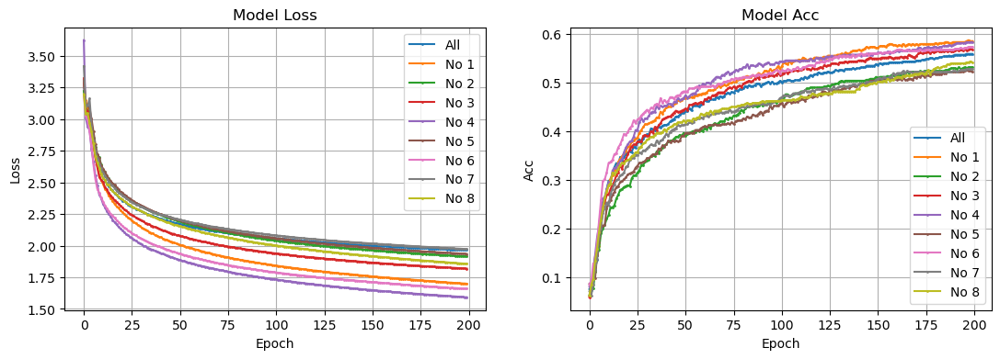

0    Val Accuracy small to large :  [5 7 2 8 0 3 6 4 1]
0    Val Loss     small to large :  [7 0 5 2 8 3 1 6 4] 




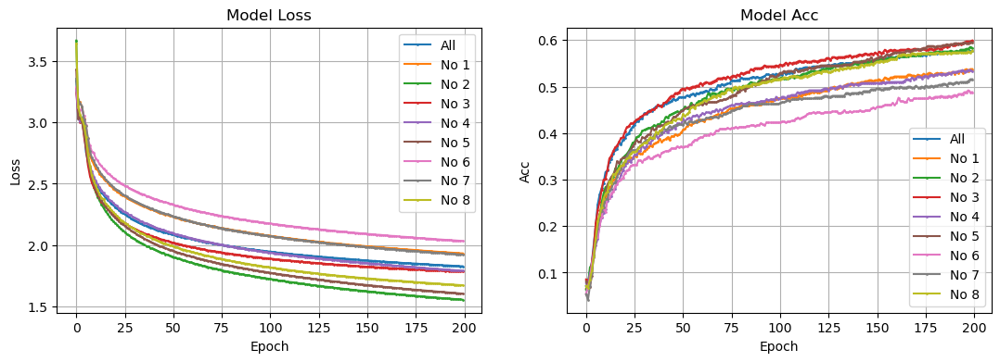

1    Val Accuracy small to large :  [6 7 4 1 0 8 2 5 3]
1    Val Loss     small to large :  [6 1 7 0 4 3 8 5 2] 




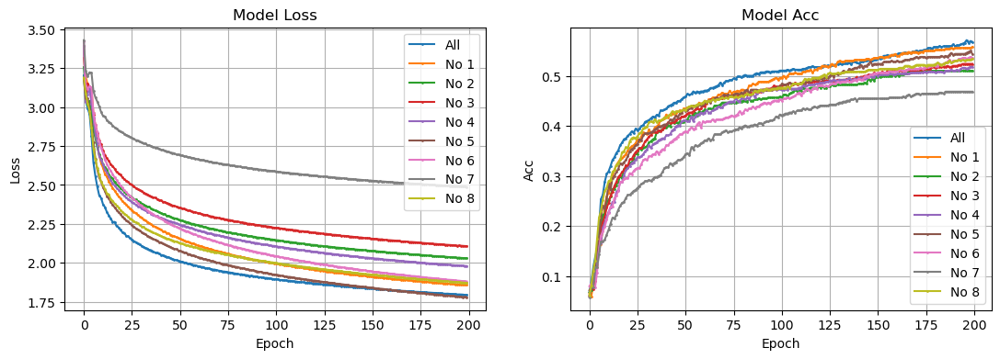

2    Val Accuracy small to large :  [7 2 4 3 8 6 5 1 0]
2    Val Loss     small to large :  [7 3 2 4 6 8 1 0 5] 




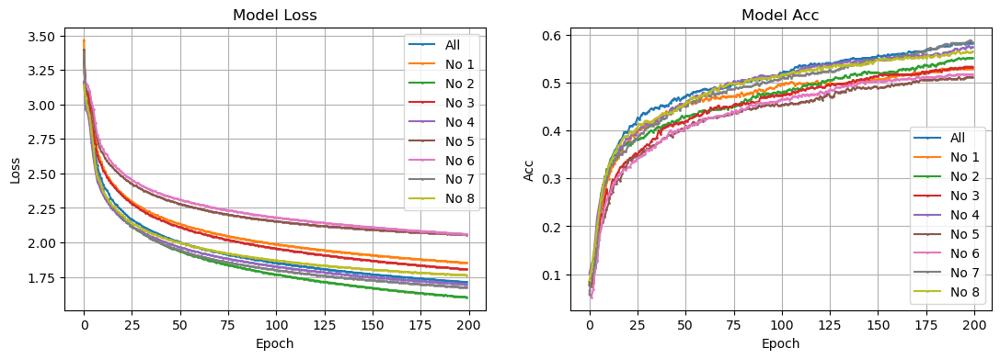

3    Val Accuracy small to large :  [5 6 1 3 2 8 4 0 7]
3    Val Loss     small to large :  [6 5 1 3 8 0 4 7 2] 




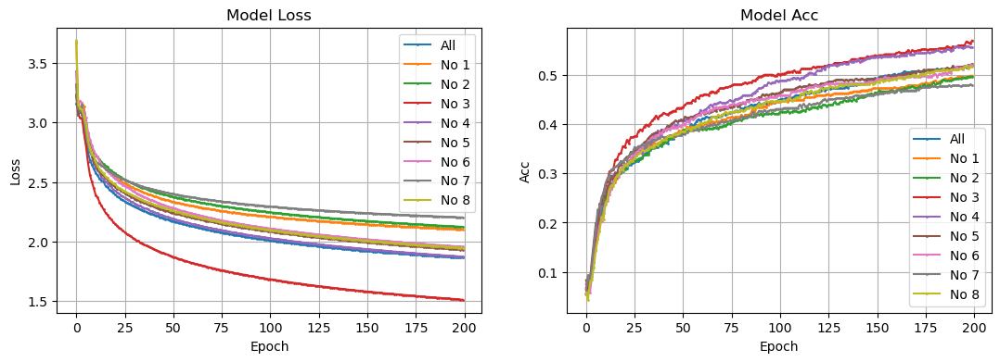

4    Val Accuracy small to large :  [7 2 1 0 8 6 5 4 3]
4    Val Loss     small to large :  [7 2 1 6 8 5 4 0 3] 




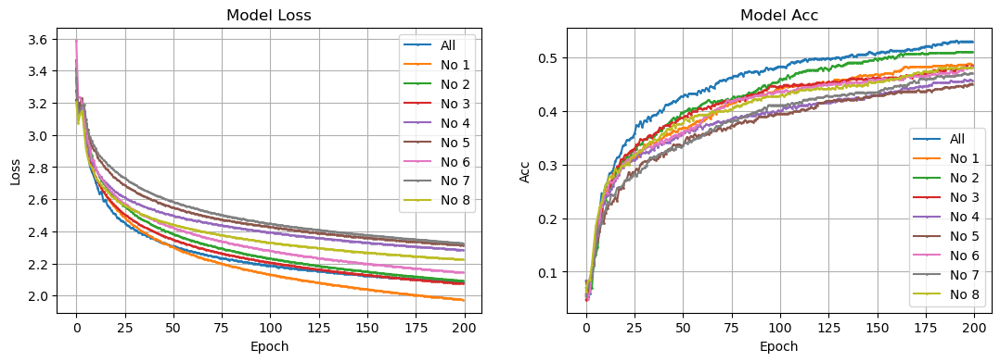

5    Val Accuracy small to large :  [5 4 7 8 6 3 1 2 0]
5    Val Loss     small to large :  [7 5 4 8 6 2 0 3 1] 




In [14]:
for subject in range(6):
    globals()['Sub{}_history'.format(subject)] = [globals()['history_all_S{}'.format(subject)]]

    for no_sensor in range(8):
        globals()['Sub{}_history'.format(subject)].append(globals()['history_no{}_S{}'.format(no_sensor, subject)])

    draw_all(globals()['Sub{}_history'.format(subject)])

    val_acc_lst, val_loss_lst = [], []

    for i in range(len(globals()['Sub{}_history'.format(subject)])):
        val_acc_lst.append(np.max(globals()['Sub{}_history'.format(subject)][i].history['val_acc']))
        val_loss_lst.append(np.min(globals()['Sub{}_history'.format(subject)][i].history['val_loss']))


    print(subject, "   Val Accuracy small to large : ", np.argsort(val_acc_lst))
    print(subject, "   Val Loss     small to large : ", np.argsort(val_loss_lst)[::-1], "\n\n" )

In [15]:
for subject in range(6):
    x_train, y_train, node_features, df = build_data(subject, [0,1,2,3,4,5,6,7])
    graph1, edges, edge_weights = graph_build(df)
    graph_info = (node_features, edges, edge_weights) # Create graph info tuple with node_features, edges, and edge_weights.

    print("Edges shape:", edges.shape, "    Nodes shape:", node_features.shape)

    loss_fn = keras.losses.SparseCategoricalCrossentropy(from_logits=True)
    optimizer = keras.optimizers.Adam(LEARNING_RATE)
    accuracy_fn = keras.metrics.SparseCategoricalAccuracy(name="acc")

    model = GraphAttentionNetwork(node_features, edges, HIDDEN_UNITS, NUM_HEADS, NUM_LAYERS, OUTPUT_DIM)
    model.compile(loss=loss_fn, optimizer=optimizer, metrics=[accuracy_fn])

    globals()['history_all_S{}'.format(subject)] = model.fit(x_train, y_train, validation_split=val_split, 
                                                             batch_size=BATCH_SIZE, epochs=NUM_EPOCHS, verbose=1)

    del model

Edges shape: (2880, 2)     Nodes shape: (2880, 200)
Epoch 1/200
18/18 [==============================] - 11s 135ms/step - loss: 4.2572 - acc: 0.0642 - val_loss: 3.2123 - val_acc: 0.0660
Epoch 2/200
18/18 [==============================] - 0s 22ms/step - loss: 2.3978 - acc: 0.2357 - val_loss: 3.0383 - val_acc: 0.0729
Epoch 3/200
18/18 [==============================] - 0s 19ms/step - loss: 1.7229 - acc: 0.5135 - val_loss: 3.0176 - val_acc: 0.0955
Epoch 4/200
18/18 [==============================] - 0s 19ms/step - loss: 1.0721 - acc: 0.8090 - val_loss: 2.9649 - val_acc: 0.1406
Epoch 5/200
18/18 [==============================] - 0s 18ms/step - loss: 0.5676 - acc: 0.9523 - val_loss: 2.8397 - val_acc: 0.1493
Epoch 6/200
18/18 [==============================] - 0s 17ms/step - loss: 0.2481 - acc: 0.9970 - val_loss: 2.6955 - val_acc: 0.1979
Epoch 7/200
18/18 [==============================] - 0s 19ms/step - loss: 0.1101 - acc: 1.0000 - val_loss: 2.6230 - val_acc: 0.2431
Epoch 8/200
18/18 [===

18/18 [==============================] - 1s 36ms/step - loss: 4.4848e-04 - acc: 1.0000 - val_loss: 1.9148 - val_acc: 0.5035
Epoch 62/200
18/18 [==============================] - 1s 36ms/step - loss: 4.3264e-04 - acc: 1.0000 - val_loss: 1.9116 - val_acc: 0.5052
Epoch 63/200
18/18 [==============================] - 1s 36ms/step - loss: 4.1847e-04 - acc: 1.0000 - val_loss: 1.9081 - val_acc: 0.5052
Epoch 64/200
18/18 [==============================] - 1s 34ms/step - loss: 4.0470e-04 - acc: 1.0000 - val_loss: 1.9058 - val_acc: 0.5069
Epoch 65/200
18/18 [==============================] - 1s 36ms/step - loss: 3.9194e-04 - acc: 1.0000 - val_loss: 1.9020 - val_acc: 0.5052
Epoch 66/200
18/18 [==============================] - 1s 36ms/step - loss: 3.7934e-04 - acc: 1.0000 - val_loss: 1.9003 - val_acc: 0.5069
Epoch 67/200
18/18 [==============================] - 1s 35ms/step - loss: 3.6722e-04 - acc: 1.0000 - val_loss: 1.8974 - val_acc: 0.5104
Epoch 68/200
18/18 [==============================] - 

Epoch 121/200
18/18 [==============================] - 1s 35ms/step - loss: 9.7116e-05 - acc: 1.0000 - val_loss: 1.7880 - val_acc: 0.5469
Epoch 122/200
18/18 [==============================] - 1s 34ms/step - loss: 9.5183e-05 - acc: 1.0000 - val_loss: 1.7871 - val_acc: 0.5469
Epoch 123/200
18/18 [==============================] - 1s 36ms/step - loss: 9.3383e-05 - acc: 1.0000 - val_loss: 1.7851 - val_acc: 0.5469
Epoch 124/200
18/18 [==============================] - 1s 35ms/step - loss: 9.1601e-05 - acc: 1.0000 - val_loss: 1.7850 - val_acc: 0.5486
Epoch 125/200
18/18 [==============================] - 1s 38ms/step - loss: 8.9805e-05 - acc: 1.0000 - val_loss: 1.7818 - val_acc: 0.5469
Epoch 126/200
18/18 [==============================] - 1s 37ms/step - loss: 8.8115e-05 - acc: 1.0000 - val_loss: 1.7815 - val_acc: 0.5486
Epoch 127/200
18/18 [==============================] - 1s 37ms/step - loss: 8.6500e-05 - acc: 1.0000 - val_loss: 1.7801 - val_acc: 0.5486
Epoch 128/200
18/18 [=============

18/18 [==============================] - 1s 34ms/step - loss: 3.5620e-05 - acc: 1.0000 - val_loss: 1.7201 - val_acc: 0.5729
Epoch 181/200
18/18 [==============================] - 1s 33ms/step - loss: 3.5090e-05 - acc: 1.0000 - val_loss: 1.7190 - val_acc: 0.5694
Epoch 182/200
18/18 [==============================] - 1s 35ms/step - loss: 3.4570e-05 - acc: 1.0000 - val_loss: 1.7183 - val_acc: 0.5764
Epoch 183/200
18/18 [==============================] - 1s 34ms/step - loss: 3.4057e-05 - acc: 1.0000 - val_loss: 1.7177 - val_acc: 0.5747
Epoch 184/200
18/18 [==============================] - 1s 36ms/step - loss: 3.3571e-05 - acc: 1.0000 - val_loss: 1.7168 - val_acc: 0.5764
Epoch 185/200
18/18 [==============================] - 1s 35ms/step - loss: 3.3070e-05 - acc: 1.0000 - val_loss: 1.7152 - val_acc: 0.5764
Epoch 186/200
18/18 [==============================] - 1s 33ms/step - loss: 3.2603e-05 - acc: 1.0000 - val_loss: 1.7140 - val_acc: 0.5747
Epoch 187/200
18/18 [===========================

18/18 [==============================] - 0s 17ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.2228 - val_acc: 0.4219
Epoch 41/200
18/18 [==============================] - 0s 18ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.2174 - val_acc: 0.4253
Epoch 42/200
18/18 [==============================] - 0s 18ms/step - loss: 0.0010 - acc: 1.0000 - val_loss: 2.2125 - val_acc: 0.4236
Epoch 43/200
18/18 [==============================] - 0s 19ms/step - loss: 9.8770e-04 - acc: 1.0000 - val_loss: 2.2070 - val_acc: 0.4288
Epoch 44/200
18/18 [==============================] - 0s 17ms/step - loss: 9.4126e-04 - acc: 1.0000 - val_loss: 2.2012 - val_acc: 0.4288
Epoch 45/200
18/18 [==============================] - 0s 17ms/step - loss: 8.9831e-04 - acc: 1.0000 - val_loss: 2.1976 - val_acc: 0.4306
Epoch 46/200
18/18 [==============================] - 0s 17ms/step - loss: 8.5693e-04 - acc: 1.0000 - val_loss: 2.1923 - val_acc: 0.4323
Epoch 47/200
18/18 [==============================] - 0s 17ms/step

Epoch 100/200
18/18 [==============================] - 0s 18ms/step - loss: 1.5750e-04 - acc: 1.0000 - val_loss: 2.0405 - val_acc: 0.4965
Epoch 101/200
18/18 [==============================] - 0s 19ms/step - loss: 1.5395e-04 - acc: 1.0000 - val_loss: 2.0389 - val_acc: 0.4983
Epoch 102/200
18/18 [==============================] - 0s 18ms/step - loss: 1.5052e-04 - acc: 1.0000 - val_loss: 2.0377 - val_acc: 0.4983
Epoch 103/200
18/18 [==============================] - 0s 17ms/step - loss: 1.4723e-04 - acc: 1.0000 - val_loss: 2.0358 - val_acc: 0.5000
Epoch 104/200
18/18 [==============================] - 0s 20ms/step - loss: 1.4399e-04 - acc: 1.0000 - val_loss: 2.0341 - val_acc: 0.4983
Epoch 105/200
18/18 [==============================] - 0s 18ms/step - loss: 1.4078e-04 - acc: 1.0000 - val_loss: 2.0334 - val_acc: 0.4983
Epoch 106/200
18/18 [==============================] - 0s 19ms/step - loss: 1.3777e-04 - acc: 1.0000 - val_loss: 2.0312 - val_acc: 0.5000
Epoch 107/200
18/18 [=============

18/18 [==============================] - 1s 33ms/step - loss: 5.1352e-05 - acc: 1.0000 - val_loss: 1.9653 - val_acc: 0.5330
Epoch 160/200
18/18 [==============================] - 1s 34ms/step - loss: 5.0522e-05 - acc: 1.0000 - val_loss: 1.9644 - val_acc: 0.5330
Epoch 161/200
18/18 [==============================] - 1s 34ms/step - loss: 4.9702e-05 - acc: 1.0000 - val_loss: 1.9639 - val_acc: 0.5330
Epoch 162/200
18/18 [==============================] - 1s 37ms/step - loss: 4.8928e-05 - acc: 1.0000 - val_loss: 1.9629 - val_acc: 0.5312
Epoch 163/200
18/18 [==============================] - 1s 34ms/step - loss: 4.8123e-05 - acc: 1.0000 - val_loss: 1.9618 - val_acc: 0.5347
Epoch 164/200
18/18 [==============================] - 1s 35ms/step - loss: 4.7375e-05 - acc: 1.0000 - val_loss: 1.9608 - val_acc: 0.5330
Epoch 165/200
18/18 [==============================] - 1s 34ms/step - loss: 4.6624e-05 - acc: 1.0000 - val_loss: 1.9596 - val_acc: 0.5347
Epoch 166/200
18/18 [===========================

Epoch 19/200
18/18 [==============================] - 0s 17ms/step - loss: 0.0050 - acc: 1.0000 - val_loss: 2.2752 - val_acc: 0.3819
Epoch 20/200
18/18 [==============================] - 0s 17ms/step - loss: 0.0045 - acc: 1.0000 - val_loss: 2.2665 - val_acc: 0.3872
Epoch 21/200
18/18 [==============================] - 0s 18ms/step - loss: 0.0040 - acc: 1.0000 - val_loss: 2.2546 - val_acc: 0.3906
Epoch 22/200
18/18 [==============================] - 0s 16ms/step - loss: 0.0037 - acc: 1.0000 - val_loss: 2.2479 - val_acc: 0.3941
Epoch 23/200
18/18 [==============================] - 0s 17ms/step - loss: 0.0034 - acc: 1.0000 - val_loss: 2.2350 - val_acc: 0.4028
Epoch 24/200
18/18 [==============================] - 0s 19ms/step - loss: 0.0031 - acc: 1.0000 - val_loss: 2.2282 - val_acc: 0.4010
Epoch 25/200
18/18 [==============================] - 0s 18ms/step - loss: 0.0028 - acc: 1.0000 - val_loss: 2.2135 - val_acc: 0.4062
Epoch 26/200
18/18 [==============================] - 0s 17ms/step - 

18/18 [==============================] - 0s 16ms/step - loss: 2.4563e-04 - acc: 1.0000 - val_loss: 2.0201 - val_acc: 0.4913
Epoch 80/200
18/18 [==============================] - 0s 17ms/step - loss: 2.3907e-04 - acc: 1.0000 - val_loss: 2.0204 - val_acc: 0.4913
Epoch 81/200
18/18 [==============================] - 0s 18ms/step - loss: 2.3269e-04 - acc: 1.0000 - val_loss: 2.0163 - val_acc: 0.4913
Epoch 82/200
18/18 [==============================] - 0s 19ms/step - loss: 2.2662e-04 - acc: 1.0000 - val_loss: 2.0147 - val_acc: 0.4948
Epoch 83/200
18/18 [==============================] - 0s 18ms/step - loss: 2.2053e-04 - acc: 1.0000 - val_loss: 2.0141 - val_acc: 0.4965
Epoch 84/200
18/18 [==============================] - 0s 22ms/step - loss: 2.1474e-04 - acc: 1.0000 - val_loss: 2.0119 - val_acc: 0.4983
Epoch 85/200
18/18 [==============================] - 1s 35ms/step - loss: 2.0923e-04 - acc: 1.0000 - val_loss: 2.0120 - val_acc: 0.4983
Epoch 86/200
18/18 [==============================] - 

18/18 [==============================] - 1s 34ms/step - loss: 6.8321e-05 - acc: 1.0000 - val_loss: 1.9515 - val_acc: 0.5243
Epoch 139/200
18/18 [==============================] - 1s 36ms/step - loss: 6.7114e-05 - acc: 1.0000 - val_loss: 1.9503 - val_acc: 0.5226
Epoch 140/200
18/18 [==============================] - 1s 36ms/step - loss: 6.5985e-05 - acc: 1.0000 - val_loss: 1.9503 - val_acc: 0.5226
Epoch 141/200
18/18 [==============================] - 1s 33ms/step - loss: 6.4880e-05 - acc: 1.0000 - val_loss: 1.9488 - val_acc: 0.5226
Epoch 142/200
18/18 [==============================] - 1s 36ms/step - loss: 6.3707e-05 - acc: 1.0000 - val_loss: 1.9483 - val_acc: 0.5226
Epoch 143/200
18/18 [==============================] - 1s 35ms/step - loss: 6.2579e-05 - acc: 1.0000 - val_loss: 1.9477 - val_acc: 0.5260
Epoch 144/200
18/18 [==============================] - 1s 34ms/step - loss: 6.1579e-05 - acc: 1.0000 - val_loss: 1.9473 - val_acc: 0.5243
Epoch 145/200
18/18 [===========================

18/18 [==============================] - 1s 34ms/step - loss: 2.6980e-05 - acc: 1.0000 - val_loss: 1.9137 - val_acc: 0.5399
Epoch 198/200
18/18 [==============================] - 1s 33ms/step - loss: 2.6603e-05 - acc: 1.0000 - val_loss: 1.9140 - val_acc: 0.5417
Epoch 199/200
18/18 [==============================] - 1s 34ms/step - loss: 2.6217e-05 - acc: 1.0000 - val_loss: 1.9125 - val_acc: 0.5399
Epoch 200/200
18/18 [==============================] - 1s 37ms/step - loss: 2.5851e-05 - acc: 1.0000 - val_loss: 1.9124 - val_acc: 0.5417
Edges shape: (2880, 2)     Nodes shape: (2880, 200)
Epoch 1/200
18/18 [==============================] - 11s 153ms/step - loss: 4.3543 - acc: 0.0720 - val_loss: 3.1764 - val_acc: 0.0694
Epoch 2/200
18/18 [==============================] - 1s 26ms/step - loss: 2.4232 - acc: 0.2326 - val_loss: 3.1138 - val_acc: 0.0799
Epoch 3/200
18/18 [==============================] - 0s 17ms/step - loss: 1.7150 - acc: 0.5339 - val_loss: 2.9903 - val_acc: 0.0990
Epoch 4/200


Epoch 58/200
18/18 [==============================] - 1s 37ms/step - loss: 5.1292e-04 - acc: 1.0000 - val_loss: 1.8420 - val_acc: 0.5017
Epoch 59/200
18/18 [==============================] - 1s 37ms/step - loss: 4.9394e-04 - acc: 1.0000 - val_loss: 1.8379 - val_acc: 0.5035
Epoch 60/200
18/18 [==============================] - 1s 36ms/step - loss: 4.7769e-04 - acc: 1.0000 - val_loss: 1.8336 - val_acc: 0.5035
Epoch 61/200
18/18 [==============================] - 1s 37ms/step - loss: 4.6031e-04 - acc: 1.0000 - val_loss: 1.8310 - val_acc: 0.5052
Epoch 62/200
18/18 [==============================] - 1s 36ms/step - loss: 4.4508e-04 - acc: 1.0000 - val_loss: 1.8268 - val_acc: 0.5104
Epoch 63/200
18/18 [==============================] - 1s 37ms/step - loss: 4.3001e-04 - acc: 1.0000 - val_loss: 1.8227 - val_acc: 0.5104
Epoch 64/200
18/18 [==============================] - 1s 39ms/step - loss: 4.1558e-04 - acc: 1.0000 - val_loss: 1.8188 - val_acc: 0.5087
Epoch 65/200
18/18 [=====================

18/18 [==============================] - 1s 36ms/step - loss: 1.0890e-04 - acc: 1.0000 - val_loss: 1.6865 - val_acc: 0.5573
Epoch 118/200
18/18 [==============================] - 1s 35ms/step - loss: 1.0672e-04 - acc: 1.0000 - val_loss: 1.6843 - val_acc: 0.5573
Epoch 119/200
18/18 [==============================] - 1s 34ms/step - loss: 1.0458e-04 - acc: 1.0000 - val_loss: 1.6827 - val_acc: 0.5573
Epoch 120/200
18/18 [==============================] - 1s 35ms/step - loss: 1.0257e-04 - acc: 1.0000 - val_loss: 1.6809 - val_acc: 0.5573
Epoch 121/200
18/18 [==============================] - 1s 34ms/step - loss: 1.0059e-04 - acc: 1.0000 - val_loss: 1.6787 - val_acc: 0.5573
Epoch 122/200
18/18 [==============================] - 1s 34ms/step - loss: 9.8708e-05 - acc: 1.0000 - val_loss: 1.6777 - val_acc: 0.5573
Epoch 123/200
18/18 [==============================] - 1s 35ms/step - loss: 9.6836e-05 - acc: 1.0000 - val_loss: 1.6766 - val_acc: 0.5590
Epoch 124/200
18/18 [===========================

18/18 [==============================] - 1s 34ms/step - loss: 3.9423e-05 - acc: 1.0000 - val_loss: 1.6033 - val_acc: 0.5920
Epoch 177/200
18/18 [==============================] - 1s 36ms/step - loss: 3.8847e-05 - acc: 1.0000 - val_loss: 1.6023 - val_acc: 0.5920
Epoch 178/200
18/18 [==============================] - 1s 34ms/step - loss: 3.8247e-05 - acc: 1.0000 - val_loss: 1.6006 - val_acc: 0.5920
Epoch 179/200
18/18 [==============================] - 1s 35ms/step - loss: 3.7672e-05 - acc: 1.0000 - val_loss: 1.6005 - val_acc: 0.5920
Epoch 180/200
18/18 [==============================] - 1s 36ms/step - loss: 3.7114e-05 - acc: 1.0000 - val_loss: 1.5992 - val_acc: 0.5938
Epoch 181/200
18/18 [==============================] - 1s 37ms/step - loss: 3.6576e-05 - acc: 1.0000 - val_loss: 1.5978 - val_acc: 0.5920
Epoch 182/200
18/18 [==============================] - 1s 36ms/step - loss: 3.6019e-05 - acc: 1.0000 - val_loss: 1.5970 - val_acc: 0.5938
Epoch 183/200
18/18 [===========================

18/18 [==============================] - 0s 18ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 2.2378 - val_acc: 0.3906
Epoch 37/200
18/18 [==============================] - 0s 18ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 2.2320 - val_acc: 0.3906
Epoch 38/200
18/18 [==============================] - 0s 17ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.2255 - val_acc: 0.3872
Epoch 39/200
18/18 [==============================] - 0s 18ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.2175 - val_acc: 0.3906
Epoch 40/200
18/18 [==============================] - 0s 17ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.2132 - val_acc: 0.3941
Epoch 41/200
18/18 [==============================] - 0s 19ms/step - loss: 0.0010 - acc: 1.0000 - val_loss: 2.2077 - val_acc: 0.3941
Epoch 42/200
18/18 [==============================] - 0s 18ms/step - loss: 9.8667e-04 - acc: 1.0000 - val_loss: 2.2013 - val_acc: 0.3993
Epoch 43/200
18/18 [==============================] - 0s 19ms/step - loss: 9.3

18/18 [==============================] - 1s 35ms/step - loss: 1.6653e-04 - acc: 1.0000 - val_loss: 2.0169 - val_acc: 0.4688
Epoch 97/200
18/18 [==============================] - 1s 37ms/step - loss: 1.6263e-04 - acc: 1.0000 - val_loss: 2.0152 - val_acc: 0.4722
Epoch 98/200
18/18 [==============================] - 1s 36ms/step - loss: 1.5900e-04 - acc: 1.0000 - val_loss: 2.0116 - val_acc: 0.4688
Epoch 99/200
18/18 [==============================] - 1s 36ms/step - loss: 1.5530e-04 - acc: 1.0000 - val_loss: 2.0105 - val_acc: 0.4705
Epoch 100/200
18/18 [==============================] - 1s 36ms/step - loss: 1.5190e-04 - acc: 1.0000 - val_loss: 2.0080 - val_acc: 0.4740
Epoch 101/200
18/18 [==============================] - 1s 35ms/step - loss: 1.4834e-04 - acc: 1.0000 - val_loss: 2.0072 - val_acc: 0.4722
Epoch 102/200
18/18 [==============================] - 1s 35ms/step - loss: 1.4508e-04 - acc: 1.0000 - val_loss: 2.0047 - val_acc: 0.4722
Epoch 103/200
18/18 [==============================

18/18 [==============================] - 1s 40ms/step - loss: 5.3025e-05 - acc: 1.0000 - val_loss: 1.9254 - val_acc: 0.5122
Epoch 156/200
18/18 [==============================] - 1s 34ms/step - loss: 5.2168e-05 - acc: 1.0000 - val_loss: 1.9251 - val_acc: 0.5069
Epoch 157/200
18/18 [==============================] - 1s 33ms/step - loss: 5.1320e-05 - acc: 1.0000 - val_loss: 1.9224 - val_acc: 0.5122
Epoch 158/200
18/18 [==============================] - 1s 34ms/step - loss: 5.0493e-05 - acc: 1.0000 - val_loss: 1.9221 - val_acc: 0.5122
Epoch 159/200
18/18 [==============================] - 1s 36ms/step - loss: 4.9692e-05 - acc: 1.0000 - val_loss: 1.9200 - val_acc: 0.5139
Epoch 160/200
18/18 [==============================] - 1s 33ms/step - loss: 4.8859e-05 - acc: 1.0000 - val_loss: 1.9191 - val_acc: 0.5122
Epoch 161/200
18/18 [==============================] - 1s 34ms/step - loss: 4.8109e-05 - acc: 1.0000 - val_loss: 1.9181 - val_acc: 0.5122
Epoch 162/200
18/18 [===========================

18/18 [==============================] - 0s 18ms/step - loss: 0.0126 - acc: 1.0000 - val_loss: 2.5875 - val_acc: 0.3021
Epoch 15/200
18/18 [==============================] - 0s 18ms/step - loss: 0.0107 - acc: 1.0000 - val_loss: 2.5594 - val_acc: 0.3177
Epoch 16/200
18/18 [==============================] - 0s 17ms/step - loss: 0.0092 - acc: 1.0000 - val_loss: 2.5477 - val_acc: 0.3160
Epoch 17/200
18/18 [==============================] - 0s 18ms/step - loss: 0.0080 - acc: 1.0000 - val_loss: 2.5257 - val_acc: 0.3281
Epoch 18/200
18/18 [==============================] - 0s 18ms/step - loss: 0.0070 - acc: 1.0000 - val_loss: 2.5031 - val_acc: 0.3316
Epoch 19/200
18/18 [==============================] - 0s 18ms/step - loss: 0.0062 - acc: 1.0000 - val_loss: 2.4917 - val_acc: 0.3333
Epoch 20/200
18/18 [==============================] - 0s 18ms/step - loss: 0.0055 - acc: 1.0000 - val_loss: 2.4772 - val_acc: 0.3403
Epoch 21/200
18/18 [==============================] - 0s 18ms/step - loss: 0.0049 

Epoch 75/200
18/18 [==============================] - 0s 18ms/step - loss: 3.2033e-04 - acc: 1.0000 - val_loss: 2.1676 - val_acc: 0.4410
Epoch 76/200
18/18 [==============================] - 0s 18ms/step - loss: 3.1107e-04 - acc: 1.0000 - val_loss: 2.1646 - val_acc: 0.4410
Epoch 77/200
18/18 [==============================] - 0s 18ms/step - loss: 3.0226e-04 - acc: 1.0000 - val_loss: 2.1598 - val_acc: 0.4462
Epoch 78/200
18/18 [==============================] - 0s 18ms/step - loss: 2.9385e-04 - acc: 1.0000 - val_loss: 2.1597 - val_acc: 0.4427
Epoch 79/200
18/18 [==============================] - 0s 17ms/step - loss: 2.8560e-04 - acc: 1.0000 - val_loss: 2.1557 - val_acc: 0.4479
Epoch 80/200
18/18 [==============================] - 0s 20ms/step - loss: 2.7787e-04 - acc: 1.0000 - val_loss: 2.1535 - val_acc: 0.4497
Epoch 81/200
18/18 [==============================] - 0s 18ms/step - loss: 2.7040e-04 - acc: 1.0000 - val_loss: 2.1514 - val_acc: 0.4479
Epoch 82/200
18/18 [=====================

18/18 [==============================] - 0s 18ms/step - loss: 8.4289e-05 - acc: 1.0000 - val_loss: 2.0534 - val_acc: 0.4983
Epoch 135/200
18/18 [==============================] - 0s 17ms/step - loss: 8.2744e-05 - acc: 1.0000 - val_loss: 2.0523 - val_acc: 0.5017
Epoch 136/200
18/18 [==============================] - 0s 19ms/step - loss: 8.1297e-05 - acc: 1.0000 - val_loss: 2.0513 - val_acc: 0.5000
Epoch 137/200
18/18 [==============================] - 0s 19ms/step - loss: 7.9879e-05 - acc: 1.0000 - val_loss: 2.0492 - val_acc: 0.5035
Epoch 138/200
18/18 [==============================] - 0s 19ms/step - loss: 7.8511e-05 - acc: 1.0000 - val_loss: 2.0479 - val_acc: 0.5000
Epoch 139/200
18/18 [==============================] - 0s 18ms/step - loss: 7.7026e-05 - acc: 1.0000 - val_loss: 2.0464 - val_acc: 0.5035
Epoch 140/200
18/18 [==============================] - 0s 18ms/step - loss: 7.5654e-05 - acc: 1.0000 - val_loss: 2.0449 - val_acc: 0.5052
Epoch 141/200
18/18 [===========================

18/18 [==============================] - 1s 34ms/step - loss: 3.2678e-05 - acc: 1.0000 - val_loss: 1.9864 - val_acc: 0.5295
Epoch 194/200
18/18 [==============================] - 1s 34ms/step - loss: 3.2194e-05 - acc: 1.0000 - val_loss: 1.9851 - val_acc: 0.5278
Epoch 195/200
18/18 [==============================] - 1s 34ms/step - loss: 3.1729e-05 - acc: 1.0000 - val_loss: 1.9843 - val_acc: 0.5295
Epoch 196/200
18/18 [==============================] - 1s 40ms/step - loss: 3.1288e-05 - acc: 1.0000 - val_loss: 1.9831 - val_acc: 0.5295
Epoch 197/200
18/18 [==============================] - 1s 34ms/step - loss: 3.0845e-05 - acc: 1.0000 - val_loss: 1.9837 - val_acc: 0.5295
Epoch 198/200
18/18 [==============================] - 1s 36ms/step - loss: 3.0405e-05 - acc: 1.0000 - val_loss: 1.9819 - val_acc: 0.5295
Epoch 199/200
18/18 [==============================] - 1s 34ms/step - loss: 2.9987e-05 - acc: 1.0000 - val_loss: 1.9806 - val_acc: 0.5312
Epoch 200/200
18/18 [===========================

In [16]:
for subject in range(6):
    for no_sensor in range(8):
        lst_sensor = []
        for i in range(8): 
            if i == no_sensor: pass
            else: lst_sensor.append(i)
        print(subject, "  Sensor List: ", lst_sensor)

        x_train, y_train, node_features, df = build_data(subject, lst_sensor)
        graph1, edges, edge_weights = graph_build(df)
        graph_info = (node_features, edges, edge_weights) # Create graph info tuple with node_features, edges, and edge_weights.

        print(no_sensor, "   Edges shape:", edges.shape, "    Nodes shape:", node_features.shape)

        loss_fn = keras.losses.SparseCategoricalCrossentropy(from_logits=True)
        optimizer = keras.optimizers.Adam(LEARNING_RATE)
        accuracy_fn = keras.metrics.SparseCategoricalAccuracy(name="acc")

        model = GraphAttentionNetwork(node_features, edges, HIDDEN_UNITS, NUM_HEADS, NUM_LAYERS, OUTPUT_DIM)

        model.compile(loss=loss_fn, optimizer=optimizer, metrics=[accuracy_fn])

        globals()['history_no{}_S{}'.format(no_sensor, subject)] = model.fit(x_train, y_train, validation_split=val_split, 
                                                                batch_size=BATCH_SIZE, epochs=NUM_EPOCHS, verbose=1)

        del model

0   Sensor List:  [1, 2, 3, 4, 5, 6, 7]
0    Edges shape: (2520, 2)     Nodes shape: (2520, 200)
Epoch 1/200
16/16 [==============================] - 13s 192ms/step - loss: 4.1877 - acc: 0.0774 - val_loss: 3.2348 - val_acc: 0.0853
Epoch 2/200
16/16 [==============================] - 0s 25ms/step - loss: 2.3211 - acc: 0.2693 - val_loss: 3.0921 - val_acc: 0.0873
Epoch 3/200
16/16 [==============================] - 0s 20ms/step - loss: 1.5639 - acc: 0.5784 - val_loss: 3.0302 - val_acc: 0.1151
Epoch 4/200
16/16 [==============================] - 0s 19ms/step - loss: 0.9121 - acc: 0.8482 - val_loss: 3.0142 - val_acc: 0.1429
Epoch 5/200
16/16 [==============================] - 0s 18ms/step - loss: 0.4438 - acc: 0.9643 - val_loss: 2.9490 - val_acc: 0.1627
Epoch 6/200
16/16 [==============================] - 0s 18ms/step - loss: 0.1897 - acc: 0.9995 - val_loss: 2.8220 - val_acc: 0.1964
Epoch 7/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0846 - acc: 1.0000 - val_loss: 2.

16/16 [==============================] - 1s 38ms/step - loss: 4.4592e-04 - acc: 1.0000 - val_loss: 2.0858 - val_acc: 0.4385
Epoch 62/200
16/16 [==============================] - 1s 35ms/step - loss: 4.3069e-04 - acc: 1.0000 - val_loss: 2.0801 - val_acc: 0.4425
Epoch 63/200
16/16 [==============================] - 1s 36ms/step - loss: 4.1692e-04 - acc: 1.0000 - val_loss: 2.0777 - val_acc: 0.4385
Epoch 64/200
16/16 [==============================] - 1s 37ms/step - loss: 4.0274e-04 - acc: 1.0000 - val_loss: 2.0730 - val_acc: 0.4425
Epoch 65/200
16/16 [==============================] - 1s 36ms/step - loss: 3.8954e-04 - acc: 1.0000 - val_loss: 2.0704 - val_acc: 0.4425
Epoch 66/200
16/16 [==============================] - 1s 37ms/step - loss: 3.7727e-04 - acc: 1.0000 - val_loss: 2.0666 - val_acc: 0.4444
Epoch 67/200
16/16 [==============================] - 1s 35ms/step - loss: 3.6553e-04 - acc: 1.0000 - val_loss: 2.0626 - val_acc: 0.4444
Epoch 68/200
16/16 [==============================] - 

Epoch 121/200
16/16 [==============================] - 1s 36ms/step - loss: 9.9869e-05 - acc: 1.0000 - val_loss: 1.9269 - val_acc: 0.5000
Epoch 122/200
16/16 [==============================] - 1s 39ms/step - loss: 9.7990e-05 - acc: 1.0000 - val_loss: 1.9254 - val_acc: 0.5000
Epoch 123/200
16/16 [==============================] - 1s 36ms/step - loss: 9.6196e-05 - acc: 1.0000 - val_loss: 1.9237 - val_acc: 0.5040
Epoch 124/200
16/16 [==============================] - 1s 36ms/step - loss: 9.4410e-05 - acc: 1.0000 - val_loss: 1.9216 - val_acc: 0.5020
Epoch 125/200
16/16 [==============================] - 1s 36ms/step - loss: 9.2664e-05 - acc: 1.0000 - val_loss: 1.9202 - val_acc: 0.5000
Epoch 126/200
16/16 [==============================] - 1s 36ms/step - loss: 9.1021e-05 - acc: 1.0000 - val_loss: 1.9180 - val_acc: 0.5000
Epoch 127/200
16/16 [==============================] - 1s 37ms/step - loss: 8.9354e-05 - acc: 1.0000 - val_loss: 1.9162 - val_acc: 0.5040
Epoch 128/200
16/16 [=============

16/16 [==============================] - 1s 36ms/step - loss: 3.8303e-05 - acc: 1.0000 - val_loss: 1.8356 - val_acc: 0.5377
Epoch 181/200
16/16 [==============================] - 1s 35ms/step - loss: 3.7789e-05 - acc: 1.0000 - val_loss: 1.8345 - val_acc: 0.5377
Epoch 182/200
16/16 [==============================] - 1s 37ms/step - loss: 3.7257e-05 - acc: 1.0000 - val_loss: 1.8325 - val_acc: 0.5417
Epoch 183/200
16/16 [==============================] - 1s 37ms/step - loss: 3.6716e-05 - acc: 1.0000 - val_loss: 1.8316 - val_acc: 0.5397
Epoch 184/200
16/16 [==============================] - 1s 38ms/step - loss: 3.6209e-05 - acc: 1.0000 - val_loss: 1.8313 - val_acc: 0.5417
Epoch 185/200
16/16 [==============================] - 1s 36ms/step - loss: 3.5709e-05 - acc: 1.0000 - val_loss: 1.8288 - val_acc: 0.5397
Epoch 186/200
16/16 [==============================] - 1s 35ms/step - loss: 3.5217e-05 - acc: 1.0000 - val_loss: 1.8282 - val_acc: 0.5437
Epoch 187/200
16/16 [===========================

16/16 [==============================] - 0s 17ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.4196 - val_acc: 0.3909
Epoch 41/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.4144 - val_acc: 0.3909
Epoch 42/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.4094 - val_acc: 0.3988
Epoch 43/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0010 - acc: 1.0000 - val_loss: 2.4058 - val_acc: 0.3988
Epoch 44/200
16/16 [==============================] - 0s 18ms/step - loss: 9.7058e-04 - acc: 1.0000 - val_loss: 2.4035 - val_acc: 0.3968
Epoch 45/200
16/16 [==============================] - 0s 17ms/step - loss: 9.2800e-04 - acc: 1.0000 - val_loss: 2.4005 - val_acc: 0.4107
Epoch 46/200
16/16 [==============================] - 0s 17ms/step - loss: 8.8779e-04 - acc: 1.0000 - val_loss: 2.3921 - val_acc: 0.4107
Epoch 47/200
16/16 [==============================] - 0s 17ms/step - l

16/16 [==============================] - 0s 17ms/step - loss: 1.7082e-04 - acc: 1.0000 - val_loss: 2.2815 - val_acc: 0.4643
Epoch 101/200
16/16 [==============================] - 0s 17ms/step - loss: 1.6709e-04 - acc: 1.0000 - val_loss: 2.2812 - val_acc: 0.4643
Epoch 102/200
16/16 [==============================] - 0s 18ms/step - loss: 1.6349e-04 - acc: 1.0000 - val_loss: 2.2801 - val_acc: 0.4643
Epoch 103/200
16/16 [==============================] - 0s 17ms/step - loss: 1.6003e-04 - acc: 1.0000 - val_loss: 2.2792 - val_acc: 0.4683
Epoch 104/200
16/16 [==============================] - 0s 19ms/step - loss: 1.5653e-04 - acc: 1.0000 - val_loss: 2.2779 - val_acc: 0.4722
Epoch 105/200
16/16 [==============================] - 0s 17ms/step - loss: 1.5327e-04 - acc: 1.0000 - val_loss: 2.2761 - val_acc: 0.4722
Epoch 106/200
16/16 [==============================] - 0s 17ms/step - loss: 1.5004e-04 - acc: 1.0000 - val_loss: 2.2747 - val_acc: 0.4722
Epoch 107/200
16/16 [===========================

16/16 [==============================] - 0s 16ms/step - loss: 5.8052e-05 - acc: 1.0000 - val_loss: 2.2214 - val_acc: 0.5060
Epoch 160/200
16/16 [==============================] - 0s 19ms/step - loss: 5.7145e-05 - acc: 1.0000 - val_loss: 2.2202 - val_acc: 0.5060
Epoch 161/200
16/16 [==============================] - 0s 17ms/step - loss: 5.6258e-05 - acc: 1.0000 - val_loss: 2.2214 - val_acc: 0.5060
Epoch 162/200
16/16 [==============================] - 0s 18ms/step - loss: 5.5409e-05 - acc: 1.0000 - val_loss: 2.2204 - val_acc: 0.5060
Epoch 163/200
16/16 [==============================] - 0s 18ms/step - loss: 5.4602e-05 - acc: 1.0000 - val_loss: 2.2191 - val_acc: 0.5060
Epoch 164/200
16/16 [==============================] - 0s 18ms/step - loss: 5.3743e-05 - acc: 1.0000 - val_loss: 2.2188 - val_acc: 0.5079
Epoch 165/200
16/16 [==============================] - 0s 19ms/step - loss: 5.2915e-05 - acc: 1.0000 - val_loss: 2.2175 - val_acc: 0.5060
Epoch 166/200
16/16 [===========================

16/16 [==============================] - 0s 17ms/step - loss: 0.0061 - acc: 1.0000 - val_loss: 2.4520 - val_acc: 0.3194
Epoch 19/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0055 - acc: 1.0000 - val_loss: 2.4335 - val_acc: 0.3214
Epoch 20/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0049 - acc: 1.0000 - val_loss: 2.4210 - val_acc: 0.3313
Epoch 21/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0044 - acc: 1.0000 - val_loss: 2.4045 - val_acc: 0.3413
Epoch 22/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0040 - acc: 1.0000 - val_loss: 2.3958 - val_acc: 0.3393
Epoch 23/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0037 - acc: 1.0000 - val_loss: 2.3797 - val_acc: 0.3472
Epoch 24/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0034 - acc: 1.0000 - val_loss: 2.3708 - val_acc: 0.3452
Epoch 25/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0031 

16/16 [==============================] - 0s 18ms/step - loss: 2.9252e-04 - acc: 1.0000 - val_loss: 2.0870 - val_acc: 0.4365
Epoch 79/200
16/16 [==============================] - 0s 17ms/step - loss: 2.8483e-04 - acc: 1.0000 - val_loss: 2.0848 - val_acc: 0.4385
Epoch 80/200
16/16 [==============================] - 0s 18ms/step - loss: 2.7733e-04 - acc: 1.0000 - val_loss: 2.0827 - val_acc: 0.4405
Epoch 81/200
16/16 [==============================] - 0s 18ms/step - loss: 2.7012e-04 - acc: 1.0000 - val_loss: 2.0789 - val_acc: 0.4385
Epoch 82/200
16/16 [==============================] - 0s 18ms/step - loss: 2.6335e-04 - acc: 1.0000 - val_loss: 2.0773 - val_acc: 0.4425
Epoch 83/200
16/16 [==============================] - 0s 18ms/step - loss: 2.5659e-04 - acc: 1.0000 - val_loss: 2.0737 - val_acc: 0.4405
Epoch 84/200
16/16 [==============================] - 0s 17ms/step - loss: 2.5023e-04 - acc: 1.0000 - val_loss: 2.0711 - val_acc: 0.4425
Epoch 85/200
16/16 [==============================] - 

16/16 [==============================] - 0s 17ms/step - loss: 8.4300e-05 - acc: 1.0000 - val_loss: 1.9726 - val_acc: 0.4782
Epoch 138/200
16/16 [==============================] - 0s 18ms/step - loss: 8.2866e-05 - acc: 1.0000 - val_loss: 1.9724 - val_acc: 0.4782
Epoch 139/200
16/16 [==============================] - 0s 18ms/step - loss: 8.1460e-05 - acc: 1.0000 - val_loss: 1.9710 - val_acc: 0.4782
Epoch 140/200
16/16 [==============================] - 0s 17ms/step - loss: 8.0069e-05 - acc: 1.0000 - val_loss: 1.9690 - val_acc: 0.4782
Epoch 141/200
16/16 [==============================] - 0s 20ms/step - loss: 7.8774e-05 - acc: 1.0000 - val_loss: 1.9680 - val_acc: 0.4782
Epoch 142/200
16/16 [==============================] - 0s 18ms/step - loss: 7.7436e-05 - acc: 1.0000 - val_loss: 1.9663 - val_acc: 0.4782
Epoch 143/200
16/16 [==============================] - 0s 18ms/step - loss: 7.6216e-05 - acc: 1.0000 - val_loss: 1.9660 - val_acc: 0.4782
Epoch 144/200
16/16 [===========================

16/16 [==============================] - 0s 20ms/step - loss: 3.4640e-05 - acc: 1.0000 - val_loss: 1.9055 - val_acc: 0.5079
Epoch 197/200
16/16 [==============================] - 0s 20ms/step - loss: 3.4198e-05 - acc: 1.0000 - val_loss: 1.9045 - val_acc: 0.5079
Epoch 198/200
16/16 [==============================] - 0s 17ms/step - loss: 3.3725e-05 - acc: 1.0000 - val_loss: 1.9034 - val_acc: 0.5079
Epoch 199/200
16/16 [==============================] - 0s 18ms/step - loss: 3.3286e-05 - acc: 1.0000 - val_loss: 1.9025 - val_acc: 0.5119
Epoch 200/200
16/16 [==============================] - 0s 17ms/step - loss: 3.2847e-05 - acc: 1.0000 - val_loss: 1.9018 - val_acc: 0.5119
0   Sensor List:  [0, 1, 2, 4, 5, 6, 7]
3    Edges shape: (2520, 2)     Nodes shape: (2520, 200)
Epoch 1/200
16/16 [==============================] - 13s 282ms/step - loss: 4.4062 - acc: 0.0595 - val_loss: 3.3950 - val_acc: 0.0615
Epoch 2/200
16/16 [==============================] - 0s 18ms/step - loss: 2.4050 - acc: 0.233

16/16 [==============================] - 1s 35ms/step - loss: 6.2933e-04 - acc: 1.0000 - val_loss: 2.0124 - val_acc: 0.4603
Epoch 57/200
16/16 [==============================] - 1s 35ms/step - loss: 6.0670e-04 - acc: 1.0000 - val_loss: 2.0067 - val_acc: 0.4663
Epoch 58/200
16/16 [==============================] - 1s 36ms/step - loss: 5.8542e-04 - acc: 1.0000 - val_loss: 2.0042 - val_acc: 0.4683
Epoch 59/200
16/16 [==============================] - 1s 35ms/step - loss: 5.6492e-04 - acc: 1.0000 - val_loss: 2.0005 - val_acc: 0.4663
Epoch 60/200
16/16 [==============================] - 1s 38ms/step - loss: 5.4493e-04 - acc: 1.0000 - val_loss: 1.9961 - val_acc: 0.4683
Epoch 61/200
16/16 [==============================] - 1s 34ms/step - loss: 5.2624e-04 - acc: 1.0000 - val_loss: 1.9925 - val_acc: 0.4702
Epoch 62/200
16/16 [==============================] - 1s 39ms/step - loss: 5.0832e-04 - acc: 1.0000 - val_loss: 1.9874 - val_acc: 0.4742
Epoch 63/200
16/16 [==============================] - 

Epoch 116/200
16/16 [==============================] - 1s 42ms/step - loss: 1.2992e-04 - acc: 1.0000 - val_loss: 1.8484 - val_acc: 0.5258
Epoch 117/200
16/16 [==============================] - 1s 37ms/step - loss: 1.2748e-04 - acc: 1.0000 - val_loss: 1.8471 - val_acc: 0.5278
Epoch 118/200
16/16 [==============================] - 1s 38ms/step - loss: 1.2504e-04 - acc: 1.0000 - val_loss: 1.8456 - val_acc: 0.5258
Epoch 119/200
16/16 [==============================] - 1s 37ms/step - loss: 1.2256e-04 - acc: 1.0000 - val_loss: 1.8436 - val_acc: 0.5278
Epoch 120/200
16/16 [==============================] - 1s 37ms/step - loss: 1.2023e-04 - acc: 1.0000 - val_loss: 1.8418 - val_acc: 0.5298
Epoch 121/200
16/16 [==============================] - 1s 37ms/step - loss: 1.1798e-04 - acc: 1.0000 - val_loss: 1.8404 - val_acc: 0.5278
Epoch 122/200
16/16 [==============================] - 1s 40ms/step - loss: 1.1583e-04 - acc: 1.0000 - val_loss: 1.8374 - val_acc: 0.5278
Epoch 123/200
16/16 [=============

16/16 [==============================] - 1s 38ms/step - loss: 4.8573e-05 - acc: 1.0000 - val_loss: 1.7648 - val_acc: 0.5635
Epoch 176/200
16/16 [==============================] - 1s 36ms/step - loss: 4.7863e-05 - acc: 1.0000 - val_loss: 1.7644 - val_acc: 0.5615
Epoch 177/200
16/16 [==============================] - 1s 35ms/step - loss: 4.7193e-05 - acc: 1.0000 - val_loss: 1.7640 - val_acc: 0.5615
Epoch 178/200
16/16 [==============================] - 1s 36ms/step - loss: 4.6513e-05 - acc: 1.0000 - val_loss: 1.7613 - val_acc: 0.5635
Epoch 179/200
16/16 [==============================] - 1s 38ms/step - loss: 4.5879e-05 - acc: 1.0000 - val_loss: 1.7612 - val_acc: 0.5635
Epoch 180/200
16/16 [==============================] - 1s 38ms/step - loss: 4.5210e-05 - acc: 1.0000 - val_loss: 1.7601 - val_acc: 0.5635
Epoch 181/200
16/16 [==============================] - 1s 35ms/step - loss: 4.4566e-05 - acc: 1.0000 - val_loss: 1.7588 - val_acc: 0.5635
Epoch 182/200
16/16 [===========================

16/16 [==============================] - 0s 19ms/step - loss: 0.0015 - acc: 1.0000 - val_loss: 2.2581 - val_acc: 0.4087
Epoch 36/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 2.2522 - val_acc: 0.4087
Epoch 37/200
16/16 [==============================] - 0s 25ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 2.2439 - val_acc: 0.4147
Epoch 38/200
16/16 [==============================] - 1s 35ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 2.2393 - val_acc: 0.4127
Epoch 39/200
16/16 [==============================] - 1s 37ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.2335 - val_acc: 0.4187
Epoch 40/200
16/16 [==============================] - 1s 38ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.2285 - val_acc: 0.4206
Epoch 41/200
16/16 [==============================] - 1s 36ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.2230 - val_acc: 0.4226
Epoch 42/200
16/16 [==============================] - 1s 35ms/step - loss: 0.0011 

16/16 [==============================] - 1s 37ms/step - loss: 1.9169e-04 - acc: 1.0000 - val_loss: 2.0753 - val_acc: 0.4940
Epoch 96/200
16/16 [==============================] - 1s 36ms/step - loss: 1.8721e-04 - acc: 1.0000 - val_loss: 2.0738 - val_acc: 0.4901
Epoch 97/200
16/16 [==============================] - 1s 38ms/step - loss: 1.8301e-04 - acc: 1.0000 - val_loss: 2.0706 - val_acc: 0.4901
Epoch 98/200
16/16 [==============================] - 1s 35ms/step - loss: 1.7891e-04 - acc: 1.0000 - val_loss: 2.0705 - val_acc: 0.4921
Epoch 99/200
16/16 [==============================] - 1s 34ms/step - loss: 1.7501e-04 - acc: 1.0000 - val_loss: 2.0663 - val_acc: 0.4960
Epoch 100/200
16/16 [==============================] - 1s 34ms/step - loss: 1.7111e-04 - acc: 1.0000 - val_loss: 2.0663 - val_acc: 0.4980
Epoch 101/200
16/16 [==============================] - 1s 36ms/step - loss: 1.6746e-04 - acc: 1.0000 - val_loss: 2.0660 - val_acc: 0.4940
Epoch 102/200
16/16 [==============================]

16/16 [==============================] - 1s 36ms/step - loss: 6.3364e-05 - acc: 1.0000 - val_loss: 1.9984 - val_acc: 0.5258
Epoch 155/200
16/16 [==============================] - 1s 36ms/step - loss: 6.2401e-05 - acc: 1.0000 - val_loss: 1.9982 - val_acc: 0.5258
Epoch 156/200
16/16 [==============================] - 1s 37ms/step - loss: 6.1434e-05 - acc: 1.0000 - val_loss: 1.9970 - val_acc: 0.5238
Epoch 157/200
16/16 [==============================] - 1s 38ms/step - loss: 6.0475e-05 - acc: 1.0000 - val_loss: 1.9964 - val_acc: 0.5258
Epoch 158/200
16/16 [==============================] - 1s 36ms/step - loss: 5.9549e-05 - acc: 1.0000 - val_loss: 1.9951 - val_acc: 0.5258
Epoch 159/200
16/16 [==============================] - 1s 35ms/step - loss: 5.8645e-05 - acc: 1.0000 - val_loss: 1.9939 - val_acc: 0.5258
Epoch 160/200
16/16 [==============================] - 1s 36ms/step - loss: 5.7694e-05 - acc: 1.0000 - val_loss: 1.9938 - val_acc: 0.5278
Epoch 161/200
16/16 [===========================

16/16 [==============================] - 1s 37ms/step - loss: 0.0125 - acc: 1.0000 - val_loss: 2.5539 - val_acc: 0.2837
Epoch 14/200
16/16 [==============================] - 1s 38ms/step - loss: 0.0105 - acc: 1.0000 - val_loss: 2.5448 - val_acc: 0.2857
Epoch 15/200
16/16 [==============================] - 1s 39ms/step - loss: 0.0090 - acc: 1.0000 - val_loss: 2.5143 - val_acc: 0.2897
Epoch 16/200
16/16 [==============================] - 1s 39ms/step - loss: 0.0077 - acc: 1.0000 - val_loss: 2.5080 - val_acc: 0.2976
Epoch 17/200
16/16 [==============================] - 1s 37ms/step - loss: 0.0068 - acc: 1.0000 - val_loss: 2.4814 - val_acc: 0.3056
Epoch 18/200
16/16 [==============================] - 1s 40ms/step - loss: 0.0059 - acc: 1.0000 - val_loss: 2.4693 - val_acc: 0.3214
Epoch 19/200
16/16 [==============================] - 1s 37ms/step - loss: 0.0053 - acc: 1.0000 - val_loss: 2.4568 - val_acc: 0.3214
Epoch 20/200
16/16 [==============================] - 1s 38ms/step - loss: 0.0048 

Epoch 74/200
16/16 [==============================] - 1s 38ms/step - loss: 3.0932e-04 - acc: 1.0000 - val_loss: 2.1410 - val_acc: 0.4266
Epoch 75/200
16/16 [==============================] - 1s 38ms/step - loss: 3.0014e-04 - acc: 1.0000 - val_loss: 2.1407 - val_acc: 0.4246
Epoch 76/200
16/16 [==============================] - 1s 36ms/step - loss: 2.9192e-04 - acc: 1.0000 - val_loss: 2.1368 - val_acc: 0.4286
Epoch 77/200
16/16 [==============================] - 1s 36ms/step - loss: 2.8394e-04 - acc: 1.0000 - val_loss: 2.1360 - val_acc: 0.4286
Epoch 78/200
16/16 [==============================] - 1s 35ms/step - loss: 2.7586e-04 - acc: 1.0000 - val_loss: 2.1304 - val_acc: 0.4325
Epoch 79/200
16/16 [==============================] - 1s 36ms/step - loss: 2.6845e-04 - acc: 1.0000 - val_loss: 2.1266 - val_acc: 0.4325
Epoch 80/200
16/16 [==============================] - 1s 37ms/step - loss: 2.6142e-04 - acc: 1.0000 - val_loss: 2.1274 - val_acc: 0.4325
Epoch 81/200
16/16 [=====================

16/16 [==============================] - 1s 36ms/step - loss: 8.3590e-05 - acc: 1.0000 - val_loss: 2.0285 - val_acc: 0.4643
Epoch 134/200
16/16 [==============================] - 1s 34ms/step - loss: 8.2117e-05 - acc: 1.0000 - val_loss: 2.0276 - val_acc: 0.4683
Epoch 135/200
16/16 [==============================] - 1s 36ms/step - loss: 8.0690e-05 - acc: 1.0000 - val_loss: 2.0265 - val_acc: 0.4643
Epoch 136/200
16/16 [==============================] - 1s 37ms/step - loss: 7.9312e-05 - acc: 1.0000 - val_loss: 2.0259 - val_acc: 0.4643
Epoch 137/200
16/16 [==============================] - 1s 41ms/step - loss: 7.7925e-05 - acc: 1.0000 - val_loss: 2.0221 - val_acc: 0.4643
Epoch 138/200
16/16 [==============================] - 1s 36ms/step - loss: 7.6579e-05 - acc: 1.0000 - val_loss: 2.0195 - val_acc: 0.4683
Epoch 139/200
16/16 [==============================] - 1s 35ms/step - loss: 7.5314e-05 - acc: 1.0000 - val_loss: 2.0197 - val_acc: 0.4683
Epoch 140/200
16/16 [===========================

16/16 [==============================] - 1s 38ms/step - loss: 3.3685e-05 - acc: 1.0000 - val_loss: 1.9602 - val_acc: 0.5020
Epoch 193/200
16/16 [==============================] - 1s 41ms/step - loss: 3.3221e-05 - acc: 1.0000 - val_loss: 1.9585 - val_acc: 0.5040
Epoch 194/200
16/16 [==============================] - 1s 37ms/step - loss: 3.2779e-05 - acc: 1.0000 - val_loss: 1.9569 - val_acc: 0.5000
Epoch 195/200
16/16 [==============================] - 1s 36ms/step - loss: 3.2352e-05 - acc: 1.0000 - val_loss: 1.9569 - val_acc: 0.5060
Epoch 196/200
16/16 [==============================] - 1s 38ms/step - loss: 3.1911e-05 - acc: 1.0000 - val_loss: 1.9569 - val_acc: 0.5099
Epoch 197/200
16/16 [==============================] - 1s 39ms/step - loss: 3.1463e-05 - acc: 1.0000 - val_loss: 1.9546 - val_acc: 0.5119
Epoch 198/200
16/16 [==============================] - 1s 40ms/step - loss: 3.1049e-05 - acc: 1.0000 - val_loss: 1.9527 - val_acc: 0.5119
Epoch 199/200
16/16 [===========================

16/16 [==============================] - 1s 37ms/step - loss: 6.3624e-04 - acc: 1.0000 - val_loss: 2.1940 - val_acc: 0.4008
Epoch 53/200
16/16 [==============================] - 1s 37ms/step - loss: 6.1007e-04 - acc: 1.0000 - val_loss: 2.1887 - val_acc: 0.4008
Epoch 54/200
16/16 [==============================] - 1s 38ms/step - loss: 5.8698e-04 - acc: 1.0000 - val_loss: 2.1866 - val_acc: 0.3988
Epoch 55/200
16/16 [==============================] - 1s 35ms/step - loss: 5.6357e-04 - acc: 1.0000 - val_loss: 2.1799 - val_acc: 0.4008
Epoch 56/200
16/16 [==============================] - 1s 37ms/step - loss: 5.4257e-04 - acc: 1.0000 - val_loss: 2.1767 - val_acc: 0.4028
Epoch 57/200
16/16 [==============================] - 1s 35ms/step - loss: 5.2227e-04 - acc: 1.0000 - val_loss: 2.1683 - val_acc: 0.4067
Epoch 58/200
16/16 [==============================] - 1s 38ms/step - loss: 5.0289e-04 - acc: 1.0000 - val_loss: 2.1665 - val_acc: 0.4067
Epoch 59/200
16/16 [==============================] - 

Epoch 112/200
16/16 [==============================] - 1s 37ms/step - loss: 1.1921e-04 - acc: 1.0000 - val_loss: 2.0165 - val_acc: 0.4742
Epoch 113/200
16/16 [==============================] - 1s 39ms/step - loss: 1.1678e-04 - acc: 1.0000 - val_loss: 2.0146 - val_acc: 0.4742
Epoch 114/200
16/16 [==============================] - 1s 35ms/step - loss: 1.1445e-04 - acc: 1.0000 - val_loss: 2.0118 - val_acc: 0.4762
Epoch 115/200
16/16 [==============================] - 1s 39ms/step - loss: 1.1220e-04 - acc: 1.0000 - val_loss: 2.0106 - val_acc: 0.4742
Epoch 116/200
16/16 [==============================] - 1s 35ms/step - loss: 1.0996e-04 - acc: 1.0000 - val_loss: 2.0078 - val_acc: 0.4742
Epoch 117/200
16/16 [==============================] - 1s 37ms/step - loss: 1.0783e-04 - acc: 1.0000 - val_loss: 2.0064 - val_acc: 0.4742
Epoch 118/200
16/16 [==============================] - 1s 40ms/step - loss: 1.0582e-04 - acc: 1.0000 - val_loss: 2.0054 - val_acc: 0.4802
Epoch 119/200
16/16 [=============

16/16 [==============================] - 1s 37ms/step - loss: 4.3695e-05 - acc: 1.0000 - val_loss: 1.9292 - val_acc: 0.5000
Epoch 172/200
16/16 [==============================] - 1s 38ms/step - loss: 4.3071e-05 - acc: 1.0000 - val_loss: 1.9289 - val_acc: 0.5000
Epoch 173/200
16/16 [==============================] - 1s 39ms/step - loss: 4.2454e-05 - acc: 1.0000 - val_loss: 1.9272 - val_acc: 0.5000
Epoch 174/200
16/16 [==============================] - 1s 42ms/step - loss: 4.1847e-05 - acc: 1.0000 - val_loss: 1.9257 - val_acc: 0.5000
Epoch 175/200
16/16 [==============================] - 1s 36ms/step - loss: 4.1260e-05 - acc: 1.0000 - val_loss: 1.9268 - val_acc: 0.5040
Epoch 176/200
16/16 [==============================] - 1s 37ms/step - loss: 4.0644e-05 - acc: 1.0000 - val_loss: 1.9245 - val_acc: 0.5040
Epoch 177/200
16/16 [==============================] - 1s 37ms/step - loss: 4.0079e-05 - acc: 1.0000 - val_loss: 1.9226 - val_acc: 0.5020
Epoch 178/200
16/16 [===========================

Epoch 31/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0021 - acc: 1.0000 - val_loss: 2.3785 - val_acc: 0.3829
Epoch 32/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0019 - acc: 1.0000 - val_loss: 2.3744 - val_acc: 0.3869
Epoch 33/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0018 - acc: 1.0000 - val_loss: 2.3645 - val_acc: 0.3869
Epoch 34/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0017 - acc: 1.0000 - val_loss: 2.3604 - val_acc: 0.3849
Epoch 35/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0016 - acc: 1.0000 - val_loss: 2.3538 - val_acc: 0.3869
Epoch 36/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0015 - acc: 1.0000 - val_loss: 2.3521 - val_acc: 0.3909
Epoch 37/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 2.3453 - val_acc: 0.3909
Epoch 38/200
16/16 [==============================] - 0s 18ms/step - 

16/16 [==============================] - 0s 18ms/step - loss: 2.1769e-04 - acc: 1.0000 - val_loss: 2.1791 - val_acc: 0.4504
Epoch 92/200
16/16 [==============================] - 0s 18ms/step - loss: 2.1260e-04 - acc: 1.0000 - val_loss: 2.1755 - val_acc: 0.4504
Epoch 93/200
16/16 [==============================] - 0s 17ms/step - loss: 2.0754e-04 - acc: 1.0000 - val_loss: 2.1770 - val_acc: 0.4544
Epoch 94/200
16/16 [==============================] - 0s 20ms/step - loss: 2.0269e-04 - acc: 1.0000 - val_loss: 2.1741 - val_acc: 0.4524
Epoch 95/200
16/16 [==============================] - 0s 17ms/step - loss: 1.9838e-04 - acc: 1.0000 - val_loss: 2.1721 - val_acc: 0.4563
Epoch 96/200
16/16 [==============================] - 0s 17ms/step - loss: 1.9352e-04 - acc: 1.0000 - val_loss: 2.1694 - val_acc: 0.4583
Epoch 97/200
16/16 [==============================] - 0s 17ms/step - loss: 1.8930e-04 - acc: 1.0000 - val_loss: 2.1693 - val_acc: 0.4603
Epoch 98/200
16/16 [==============================] - 

16/16 [==============================] - 0s 19ms/step - loss: 6.9708e-05 - acc: 1.0000 - val_loss: 2.0974 - val_acc: 0.4921
Epoch 151/200
16/16 [==============================] - 0s 18ms/step - loss: 6.8554e-05 - acc: 1.0000 - val_loss: 2.0982 - val_acc: 0.4940
Epoch 152/200
16/16 [==============================] - 0s 18ms/step - loss: 6.7487e-05 - acc: 1.0000 - val_loss: 2.0959 - val_acc: 0.4921
Epoch 153/200
16/16 [==============================] - 0s 18ms/step - loss: 6.6384e-05 - acc: 1.0000 - val_loss: 2.0946 - val_acc: 0.4940
Epoch 154/200
16/16 [==============================] - 0s 18ms/step - loss: 6.5405e-05 - acc: 1.0000 - val_loss: 2.0936 - val_acc: 0.4960
Epoch 155/200
16/16 [==============================] - 0s 18ms/step - loss: 6.4362e-05 - acc: 1.0000 - val_loss: 2.0927 - val_acc: 0.4960
Epoch 156/200
16/16 [==============================] - 0s 17ms/step - loss: 6.3333e-05 - acc: 1.0000 - val_loss: 2.0924 - val_acc: 0.4980
Epoch 157/200
16/16 [===========================

16/16 [==============================] - 0s 19ms/step - loss: 0.0548 - acc: 1.0000 - val_loss: 2.7179 - val_acc: 0.2222
Epoch 10/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0376 - acc: 1.0000 - val_loss: 2.6634 - val_acc: 0.2282
Epoch 11/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0281 - acc: 1.0000 - val_loss: 2.6298 - val_acc: 0.2460
Epoch 12/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0221 - acc: 1.0000 - val_loss: 2.5954 - val_acc: 0.2500
Epoch 13/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0179 - acc: 1.0000 - val_loss: 2.5738 - val_acc: 0.2579
Epoch 14/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0149 - acc: 1.0000 - val_loss: 2.5441 - val_acc: 0.2698
Epoch 15/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0127 - acc: 1.0000 - val_loss: 2.5224 - val_acc: 0.2758
Epoch 16/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0109 

16/16 [==============================] - 1s 35ms/step - loss: 4.4690e-04 - acc: 1.0000 - val_loss: 2.0688 - val_acc: 0.4464
Epoch 71/200
16/16 [==============================] - 1s 35ms/step - loss: 4.3345e-04 - acc: 1.0000 - val_loss: 2.0644 - val_acc: 0.4504
Epoch 72/200
16/16 [==============================] - 1s 37ms/step - loss: 4.2060e-04 - acc: 1.0000 - val_loss: 2.0611 - val_acc: 0.4504
Epoch 73/200
16/16 [==============================] - 1s 34ms/step - loss: 4.0887e-04 - acc: 1.0000 - val_loss: 2.0557 - val_acc: 0.4524
Epoch 74/200
16/16 [==============================] - 1s 38ms/step - loss: 3.9668e-04 - acc: 1.0000 - val_loss: 2.0550 - val_acc: 0.4524
Epoch 75/200
16/16 [==============================] - 1s 36ms/step - loss: 3.8488e-04 - acc: 1.0000 - val_loss: 2.0502 - val_acc: 0.4544
Epoch 76/200
16/16 [==============================] - 1s 37ms/step - loss: 3.7426e-04 - acc: 1.0000 - val_loss: 2.0471 - val_acc: 0.4524
Epoch 77/200
16/16 [==============================] - 

16/16 [==============================] - 1s 36ms/step - loss: 1.1352e-04 - acc: 1.0000 - val_loss: 1.9247 - val_acc: 0.4960
Epoch 130/200
16/16 [==============================] - 1s 35ms/step - loss: 1.1148e-04 - acc: 1.0000 - val_loss: 1.9244 - val_acc: 0.4960
Epoch 131/200
16/16 [==============================] - 1s 35ms/step - loss: 1.0946e-04 - acc: 1.0000 - val_loss: 1.9225 - val_acc: 0.4960
Epoch 132/200
16/16 [==============================] - 1s 38ms/step - loss: 1.0747e-04 - acc: 1.0000 - val_loss: 1.9208 - val_acc: 0.4960
Epoch 133/200
16/16 [==============================] - 1s 35ms/step - loss: 1.0563e-04 - acc: 1.0000 - val_loss: 1.9196 - val_acc: 0.4960
Epoch 134/200
16/16 [==============================] - 1s 38ms/step - loss: 1.0367e-04 - acc: 1.0000 - val_loss: 1.9171 - val_acc: 0.4960
Epoch 135/200
16/16 [==============================] - 1s 36ms/step - loss: 1.0190e-04 - acc: 1.0000 - val_loss: 1.9171 - val_acc: 0.4960
Epoch 136/200
16/16 [===========================

16/16 [==============================] - 1s 39ms/step - loss: 4.4707e-05 - acc: 1.0000 - val_loss: 1.8465 - val_acc: 0.5218
Epoch 189/200
16/16 [==============================] - 1s 36ms/step - loss: 4.4079e-05 - acc: 1.0000 - val_loss: 1.8443 - val_acc: 0.5218
Epoch 190/200
16/16 [==============================] - 1s 36ms/step - loss: 4.3457e-05 - acc: 1.0000 - val_loss: 1.8435 - val_acc: 0.5258
Epoch 191/200
16/16 [==============================] - 1s 36ms/step - loss: 4.2870e-05 - acc: 1.0000 - val_loss: 1.8428 - val_acc: 0.5258
Epoch 192/200
16/16 [==============================] - 1s 34ms/step - loss: 4.2276e-05 - acc: 1.0000 - val_loss: 1.8413 - val_acc: 0.5258
Epoch 193/200
16/16 [==============================] - 1s 35ms/step - loss: 4.1713e-05 - acc: 1.0000 - val_loss: 1.8415 - val_acc: 0.5238
Epoch 194/200
16/16 [==============================] - 1s 36ms/step - loss: 4.1148e-05 - acc: 1.0000 - val_loss: 1.8389 - val_acc: 0.5258
Epoch 195/200
16/16 [===========================

16/16 [==============================] - 0s 18ms/step - loss: 7.8092e-04 - acc: 1.0000 - val_loss: 2.2006 - val_acc: 0.4028
Epoch 49/200
16/16 [==============================] - 0s 20ms/step - loss: 7.4834e-04 - acc: 1.0000 - val_loss: 2.1947 - val_acc: 0.4067
Epoch 50/200
16/16 [==============================] - 0s 16ms/step - loss: 7.1781e-04 - acc: 1.0000 - val_loss: 2.1916 - val_acc: 0.4048
Epoch 51/200
16/16 [==============================] - 0s 18ms/step - loss: 6.8970e-04 - acc: 1.0000 - val_loss: 2.1876 - val_acc: 0.4107
Epoch 52/200
16/16 [==============================] - 0s 17ms/step - loss: 6.6213e-04 - acc: 1.0000 - val_loss: 2.1830 - val_acc: 0.4127
Epoch 53/200
16/16 [==============================] - 0s 19ms/step - loss: 6.3535e-04 - acc: 1.0000 - val_loss: 2.1784 - val_acc: 0.4127
Epoch 54/200
16/16 [==============================] - 0s 18ms/step - loss: 6.1132e-04 - acc: 1.0000 - val_loss: 2.1748 - val_acc: 0.4167
Epoch 55/200
16/16 [==============================] - 

Epoch 108/200
16/16 [==============================] - 0s 17ms/step - loss: 1.3702e-04 - acc: 1.0000 - val_loss: 2.0375 - val_acc: 0.4683
Epoch 109/200
16/16 [==============================] - 0s 18ms/step - loss: 1.3411e-04 - acc: 1.0000 - val_loss: 2.0364 - val_acc: 0.4683
Epoch 110/200
16/16 [==============================] - 0s 20ms/step - loss: 1.3134e-04 - acc: 1.0000 - val_loss: 2.0357 - val_acc: 0.4683
Epoch 111/200
16/16 [==============================] - 0s 19ms/step - loss: 1.2877e-04 - acc: 1.0000 - val_loss: 2.0332 - val_acc: 0.4702
Epoch 112/200
16/16 [==============================] - 0s 18ms/step - loss: 1.2610e-04 - acc: 1.0000 - val_loss: 2.0320 - val_acc: 0.4722
Epoch 113/200
16/16 [==============================] - 0s 19ms/step - loss: 1.2358e-04 - acc: 1.0000 - val_loss: 2.0314 - val_acc: 0.4722
Epoch 114/200
16/16 [==============================] - 0s 18ms/step - loss: 1.2119e-04 - acc: 1.0000 - val_loss: 2.0289 - val_acc: 0.4742
Epoch 115/200
16/16 [=============

16/16 [==============================] - 0s 19ms/step - loss: 4.8913e-05 - acc: 1.0000 - val_loss: 1.9638 - val_acc: 0.4980
Epoch 168/200
16/16 [==============================] - 0s 18ms/step - loss: 4.8179e-05 - acc: 1.0000 - val_loss: 1.9633 - val_acc: 0.5000
Epoch 169/200
16/16 [==============================] - 0s 17ms/step - loss: 4.7476e-05 - acc: 1.0000 - val_loss: 1.9612 - val_acc: 0.5040
Epoch 170/200
16/16 [==============================] - 0s 17ms/step - loss: 4.6785e-05 - acc: 1.0000 - val_loss: 1.9595 - val_acc: 0.5060
Epoch 171/200
16/16 [==============================] - 0s 18ms/step - loss: 4.6089e-05 - acc: 1.0000 - val_loss: 1.9590 - val_acc: 0.5040
Epoch 172/200
16/16 [==============================] - 0s 18ms/step - loss: 4.5413e-05 - acc: 1.0000 - val_loss: 1.9588 - val_acc: 0.5040
Epoch 173/200
16/16 [==============================] - 0s 19ms/step - loss: 4.4754e-05 - acc: 1.0000 - val_loss: 1.9578 - val_acc: 0.5079
Epoch 174/200
16/16 [===========================

Epoch 27/200
16/16 [==============================] - 1s 36ms/step - loss: 0.0030 - acc: 1.0000 - val_loss: 2.1964 - val_acc: 0.3671
Epoch 28/200
16/16 [==============================] - 1s 36ms/step - loss: 0.0028 - acc: 1.0000 - val_loss: 2.1858 - val_acc: 0.3671
Epoch 29/200
16/16 [==============================] - 1s 37ms/step - loss: 0.0026 - acc: 1.0000 - val_loss: 2.1757 - val_acc: 0.3671
Epoch 30/200
16/16 [==============================] - 1s 37ms/step - loss: 0.0024 - acc: 1.0000 - val_loss: 2.1647 - val_acc: 0.3750
Epoch 31/200
16/16 [==============================] - 1s 38ms/step - loss: 0.0022 - acc: 1.0000 - val_loss: 2.1556 - val_acc: 0.3790
Epoch 32/200
16/16 [==============================] - 1s 36ms/step - loss: 0.0021 - acc: 1.0000 - val_loss: 2.1467 - val_acc: 0.3790
Epoch 33/200
16/16 [==============================] - 1s 36ms/step - loss: 0.0020 - acc: 1.0000 - val_loss: 2.1374 - val_acc: 0.3869
Epoch 34/200
16/16 [==============================] - 1s 37ms/step - 

16/16 [==============================] - 1s 39ms/step - loss: 2.5502e-04 - acc: 1.0000 - val_loss: 1.8661 - val_acc: 0.4901
Epoch 88/200
16/16 [==============================] - 1s 40ms/step - loss: 2.4889e-04 - acc: 1.0000 - val_loss: 1.8637 - val_acc: 0.4901
Epoch 89/200
16/16 [==============================] - 1s 38ms/step - loss: 2.4284e-04 - acc: 1.0000 - val_loss: 1.8604 - val_acc: 0.4881
Epoch 90/200
16/16 [==============================] - 1s 38ms/step - loss: 2.3682e-04 - acc: 1.0000 - val_loss: 1.8582 - val_acc: 0.4901
Epoch 91/200
16/16 [==============================] - 1s 37ms/step - loss: 2.3126e-04 - acc: 1.0000 - val_loss: 1.8544 - val_acc: 0.4940
Epoch 92/200
16/16 [==============================] - 1s 43ms/step - loss: 2.2561e-04 - acc: 1.0000 - val_loss: 1.8511 - val_acc: 0.4960
Epoch 93/200
16/16 [==============================] - 1s 38ms/step - loss: 2.2048e-04 - acc: 1.0000 - val_loss: 1.8483 - val_acc: 0.4980
Epoch 94/200
16/16 [==============================] - 

16/16 [==============================] - 1s 35ms/step - loss: 7.8013e-05 - acc: 1.0000 - val_loss: 1.7300 - val_acc: 0.5357
Epoch 147/200
16/16 [==============================] - 1s 35ms/step - loss: 7.6728e-05 - acc: 1.0000 - val_loss: 1.7277 - val_acc: 0.5377
Epoch 148/200
16/16 [==============================] - 1s 36ms/step - loss: 7.5479e-05 - acc: 1.0000 - val_loss: 1.7268 - val_acc: 0.5357
Epoch 149/200
16/16 [==============================] - 1s 37ms/step - loss: 7.4237e-05 - acc: 1.0000 - val_loss: 1.7249 - val_acc: 0.5417
Epoch 150/200
16/16 [==============================] - 1s 36ms/step - loss: 7.2996e-05 - acc: 1.0000 - val_loss: 1.7229 - val_acc: 0.5417
Epoch 151/200
16/16 [==============================] - 1s 38ms/step - loss: 7.1881e-05 - acc: 1.0000 - val_loss: 1.7205 - val_acc: 0.5397
Epoch 152/200
16/16 [==============================] - 1s 35ms/step - loss: 7.0697e-05 - acc: 1.0000 - val_loss: 1.7200 - val_acc: 0.5437
Epoch 153/200
16/16 [===========================

Epoch 5/200
16/16 [==============================] - 0s 18ms/step - loss: 0.4216 - acc: 0.9767 - val_loss: 3.0390 - val_acc: 0.1409
Epoch 6/200
16/16 [==============================] - 0s 16ms/step - loss: 0.1649 - acc: 0.9995 - val_loss: 2.9457 - val_acc: 0.1806
Epoch 7/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0746 - acc: 1.0000 - val_loss: 2.8632 - val_acc: 0.2063
Epoch 8/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0418 - acc: 1.0000 - val_loss: 2.8189 - val_acc: 0.2242
Epoch 9/200
16/16 [==============================] - 0s 16ms/step - loss: 0.0278 - acc: 1.0000 - val_loss: 2.7585 - val_acc: 0.2302
Epoch 10/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0202 - acc: 1.0000 - val_loss: 2.7241 - val_acc: 0.2421
Epoch 11/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0158 - acc: 1.0000 - val_loss: 2.7065 - val_acc: 0.2500
Epoch 12/200
16/16 [==============================] - 0s 19ms/step - loss:

Epoch 66/200
16/16 [==============================] - 0s 17ms/step - loss: 3.7726e-04 - acc: 1.0000 - val_loss: 2.3058 - val_acc: 0.4246
Epoch 67/200
16/16 [==============================] - 0s 19ms/step - loss: 3.6580e-04 - acc: 1.0000 - val_loss: 2.3005 - val_acc: 0.4246
Epoch 68/200
16/16 [==============================] - 0s 17ms/step - loss: 3.5458e-04 - acc: 1.0000 - val_loss: 2.2987 - val_acc: 0.4306
Epoch 69/200
16/16 [==============================] - 0s 17ms/step - loss: 3.4420e-04 - acc: 1.0000 - val_loss: 2.2968 - val_acc: 0.4306
Epoch 70/200
16/16 [==============================] - 0s 18ms/step - loss: 3.3407e-04 - acc: 1.0000 - val_loss: 2.2946 - val_acc: 0.4286
Epoch 71/200
16/16 [==============================] - 0s 17ms/step - loss: 3.2423e-04 - acc: 1.0000 - val_loss: 2.2905 - val_acc: 0.4306
Epoch 72/200
16/16 [==============================] - 0s 18ms/step - loss: 3.1501e-04 - acc: 1.0000 - val_loss: 2.2889 - val_acc: 0.4306
Epoch 73/200
16/16 [=====================

16/16 [==============================] - 0s 20ms/step - loss: 9.4573e-05 - acc: 1.0000 - val_loss: 2.1899 - val_acc: 0.4782
Epoch 126/200
16/16 [==============================] - 0s 17ms/step - loss: 9.2877e-05 - acc: 1.0000 - val_loss: 2.1896 - val_acc: 0.4802
Epoch 127/200
16/16 [==============================] - 0s 18ms/step - loss: 9.1180e-05 - acc: 1.0000 - val_loss: 2.1875 - val_acc: 0.4802
Epoch 128/200
16/16 [==============================] - 0s 18ms/step - loss: 8.9583e-05 - acc: 1.0000 - val_loss: 2.1851 - val_acc: 0.4821
Epoch 129/200
16/16 [==============================] - 0s 18ms/step - loss: 8.7976e-05 - acc: 1.0000 - val_loss: 2.1870 - val_acc: 0.4841
Epoch 130/200
16/16 [==============================] - 0s 18ms/step - loss: 8.6434e-05 - acc: 1.0000 - val_loss: 2.1841 - val_acc: 0.4841
Epoch 131/200
16/16 [==============================] - 0s 19ms/step - loss: 8.4890e-05 - acc: 1.0000 - val_loss: 2.1819 - val_acc: 0.4841
Epoch 132/200
16/16 [===========================

16/16 [==============================] - 0s 18ms/step - loss: 3.7017e-05 - acc: 1.0000 - val_loss: 2.1301 - val_acc: 0.5238
Epoch 185/200
16/16 [==============================] - 0s 19ms/step - loss: 3.6504e-05 - acc: 1.0000 - val_loss: 2.1275 - val_acc: 0.5238
Epoch 186/200
16/16 [==============================] - 0s 18ms/step - loss: 3.6006e-05 - acc: 1.0000 - val_loss: 2.1276 - val_acc: 0.5258
Epoch 187/200
16/16 [==============================] - 0s 18ms/step - loss: 3.5493e-05 - acc: 1.0000 - val_loss: 2.1265 - val_acc: 0.5258
Epoch 188/200
16/16 [==============================] - 0s 20ms/step - loss: 3.5019e-05 - acc: 1.0000 - val_loss: 2.1271 - val_acc: 0.5258
Epoch 189/200
16/16 [==============================] - 0s 18ms/step - loss: 3.4532e-05 - acc: 1.0000 - val_loss: 2.1250 - val_acc: 0.5258
Epoch 190/200
16/16 [==============================] - 0s 17ms/step - loss: 3.4084e-05 - acc: 1.0000 - val_loss: 2.1229 - val_acc: 0.5278
Epoch 191/200
16/16 [===========================

16/16 [==============================] - 0s 30ms/step - loss: 9.2818e-04 - acc: 1.0000 - val_loss: 2.0953 - val_acc: 0.4306
Epoch 45/200
16/16 [==============================] - 1s 37ms/step - loss: 8.8556e-04 - acc: 1.0000 - val_loss: 2.0871 - val_acc: 0.4325
Epoch 46/200
16/16 [==============================] - 1s 36ms/step - loss: 8.4683e-04 - acc: 1.0000 - val_loss: 2.0862 - val_acc: 0.4345
Epoch 47/200
16/16 [==============================] - 1s 39ms/step - loss: 8.0866e-04 - acc: 1.0000 - val_loss: 2.0817 - val_acc: 0.4365
Epoch 48/200
16/16 [==============================] - 1s 36ms/step - loss: 7.7624e-04 - acc: 1.0000 - val_loss: 2.0753 - val_acc: 0.4385
Epoch 49/200
16/16 [==============================] - 1s 37ms/step - loss: 7.4386e-04 - acc: 1.0000 - val_loss: 2.0757 - val_acc: 0.4385
Epoch 50/200
16/16 [==============================] - 1s 35ms/step - loss: 7.1167e-04 - acc: 1.0000 - val_loss: 2.0663 - val_acc: 0.4405
Epoch 51/200
16/16 [==============================] - 

Epoch 104/200
16/16 [==============================] - 1s 37ms/step - loss: 1.4822e-04 - acc: 1.0000 - val_loss: 1.9111 - val_acc: 0.4940
Epoch 105/200
16/16 [==============================] - 1s 36ms/step - loss: 1.4510e-04 - acc: 1.0000 - val_loss: 1.9097 - val_acc: 0.4960
Epoch 106/200
16/16 [==============================] - 1s 38ms/step - loss: 1.4207e-04 - acc: 1.0000 - val_loss: 1.9081 - val_acc: 0.5020
Epoch 107/200
16/16 [==============================] - 1s 35ms/step - loss: 1.3903e-04 - acc: 1.0000 - val_loss: 1.9063 - val_acc: 0.5000
Epoch 108/200
16/16 [==============================] - 1s 36ms/step - loss: 1.3625e-04 - acc: 1.0000 - val_loss: 1.9055 - val_acc: 0.5020
Epoch 109/200
16/16 [==============================] - 1s 38ms/step - loss: 1.3349e-04 - acc: 1.0000 - val_loss: 1.9013 - val_acc: 0.5040
Epoch 110/200
16/16 [==============================] - 1s 37ms/step - loss: 1.3074e-04 - acc: 1.0000 - val_loss: 1.9017 - val_acc: 0.5040
Epoch 111/200
16/16 [=============

16/16 [==============================] - 1s 37ms/step - loss: 5.1752e-05 - acc: 1.0000 - val_loss: 1.8298 - val_acc: 0.5417
Epoch 164/200
16/16 [==============================] - 1s 38ms/step - loss: 5.0995e-05 - acc: 1.0000 - val_loss: 1.8293 - val_acc: 0.5456
Epoch 165/200
16/16 [==============================] - 1s 39ms/step - loss: 5.0218e-05 - acc: 1.0000 - val_loss: 1.8271 - val_acc: 0.5496
Epoch 166/200
16/16 [==============================] - 1s 39ms/step - loss: 4.9469e-05 - acc: 1.0000 - val_loss: 1.8261 - val_acc: 0.5496
Epoch 167/200
16/16 [==============================] - 1s 41ms/step - loss: 4.8744e-05 - acc: 1.0000 - val_loss: 1.8262 - val_acc: 0.5476
Epoch 168/200
16/16 [==============================] - 1s 37ms/step - loss: 4.8015e-05 - acc: 1.0000 - val_loss: 1.8242 - val_acc: 0.5516
Epoch 169/200
16/16 [==============================] - 1s 40ms/step - loss: 4.7284e-05 - acc: 1.0000 - val_loss: 1.8231 - val_acc: 0.5516
Epoch 170/200
16/16 [===========================

16/16 [==============================] - 0s 17ms/step - loss: 0.0045 - acc: 1.0000 - val_loss: 2.4922 - val_acc: 0.3095
Epoch 23/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0041 - acc: 1.0000 - val_loss: 2.4796 - val_acc: 0.3095
Epoch 24/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0037 - acc: 1.0000 - val_loss: 2.4716 - val_acc: 0.3175
Epoch 25/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0034 - acc: 1.0000 - val_loss: 2.4550 - val_acc: 0.3234
Epoch 26/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0032 - acc: 1.0000 - val_loss: 2.4485 - val_acc: 0.3274
Epoch 27/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0029 - acc: 1.0000 - val_loss: 2.4350 - val_acc: 0.3333
Epoch 28/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0027 - acc: 1.0000 - val_loss: 2.4269 - val_acc: 0.3413
Epoch 29/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0025 

16/16 [==============================] - 1s 34ms/step - loss: 2.8170e-04 - acc: 1.0000 - val_loss: 2.1547 - val_acc: 0.4246
Epoch 83/200
16/16 [==============================] - 1s 36ms/step - loss: 2.7448e-04 - acc: 1.0000 - val_loss: 2.1527 - val_acc: 0.4266
Epoch 84/200
16/16 [==============================] - 1s 37ms/step - loss: 2.6733e-04 - acc: 1.0000 - val_loss: 2.1490 - val_acc: 0.4266
Epoch 85/200
16/16 [==============================] - 1s 35ms/step - loss: 2.6054e-04 - acc: 1.0000 - val_loss: 2.1454 - val_acc: 0.4286
Epoch 86/200
16/16 [==============================] - 1s 38ms/step - loss: 2.5391e-04 - acc: 1.0000 - val_loss: 2.1443 - val_acc: 0.4306
Epoch 87/200
16/16 [==============================] - 1s 36ms/step - loss: 2.4755e-04 - acc: 1.0000 - val_loss: 2.1416 - val_acc: 0.4306
Epoch 88/200
16/16 [==============================] - 1s 37ms/step - loss: 2.4141e-04 - acc: 1.0000 - val_loss: 2.1386 - val_acc: 0.4325
Epoch 89/200
16/16 [==============================] - 

16/16 [==============================] - 1s 35ms/step - loss: 8.2616e-05 - acc: 1.0000 - val_loss: 2.0289 - val_acc: 0.4524
Epoch 142/200
16/16 [==============================] - 1s 38ms/step - loss: 8.1225e-05 - acc: 1.0000 - val_loss: 2.0269 - val_acc: 0.4524
Epoch 143/200
16/16 [==============================] - 1s 38ms/step - loss: 7.9864e-05 - acc: 1.0000 - val_loss: 2.0259 - val_acc: 0.4524
Epoch 144/200
16/16 [==============================] - 1s 38ms/step - loss: 7.8576e-05 - acc: 1.0000 - val_loss: 2.0237 - val_acc: 0.4524
Epoch 145/200
16/16 [==============================] - 1s 35ms/step - loss: 7.7233e-05 - acc: 1.0000 - val_loss: 2.0229 - val_acc: 0.4524
Epoch 146/200
16/16 [==============================] - 1s 37ms/step - loss: 7.6007e-05 - acc: 1.0000 - val_loss: 2.0215 - val_acc: 0.4544
Epoch 147/200
16/16 [==============================] - 1s 36ms/step - loss: 7.4761e-05 - acc: 1.0000 - val_loss: 2.0190 - val_acc: 0.4544
Epoch 148/200
16/16 [===========================

16/16 [==============================] - 1s 36ms/step - loss: 3.4194e-05 - acc: 1.0000 - val_loss: 1.9483 - val_acc: 0.4821
1   Sensor List:  [0, 1, 2, 3, 4, 5, 7]
6    Edges shape: (2520, 2)     Nodes shape: (2520, 200)
Epoch 1/200
16/16 [==============================] - 12s 156ms/step - loss: 4.0986 - acc: 0.0719 - val_loss: 3.4653 - val_acc: 0.0615
Epoch 2/200
16/16 [==============================] - 0s 24ms/step - loss: 2.3859 - acc: 0.2440 - val_loss: 3.2309 - val_acc: 0.0754
Epoch 3/200
16/16 [==============================] - 0s 19ms/step - loss: 1.6020 - acc: 0.5580 - val_loss: 3.2218 - val_acc: 0.0774
Epoch 4/200
16/16 [==============================] - 0s 19ms/step - loss: 0.9245 - acc: 0.8447 - val_loss: 3.2346 - val_acc: 0.1111
Epoch 5/200
16/16 [==============================] - 0s 27ms/step - loss: 0.4598 - acc: 0.9663 - val_loss: 3.1594 - val_acc: 0.1290
Epoch 6/200
16/16 [==============================] - 0s 19ms/step - loss: 0.1974 - acc: 0.9995 - val_loss: 3.0280 - v

16/16 [==============================] - 1s 36ms/step - loss: 5.0887e-04 - acc: 1.0000 - val_loss: 2.3563 - val_acc: 0.3948
Epoch 61/200
16/16 [==============================] - 1s 37ms/step - loss: 4.9185e-04 - acc: 1.0000 - val_loss: 2.3506 - val_acc: 0.4028
Epoch 62/200
16/16 [==============================] - 1s 36ms/step - loss: 4.7561e-04 - acc: 1.0000 - val_loss: 2.3490 - val_acc: 0.4008
Epoch 63/200
16/16 [==============================] - 1s 39ms/step - loss: 4.5970e-04 - acc: 1.0000 - val_loss: 2.3424 - val_acc: 0.4048
Epoch 64/200
16/16 [==============================] - 1s 37ms/step - loss: 4.4493e-04 - acc: 1.0000 - val_loss: 2.3425 - val_acc: 0.4067
Epoch 65/200
16/16 [==============================] - 1s 36ms/step - loss: 4.3116e-04 - acc: 1.0000 - val_loss: 2.3368 - val_acc: 0.4067
Epoch 66/200
16/16 [==============================] - 1s 36ms/step - loss: 4.1775e-04 - acc: 1.0000 - val_loss: 2.3322 - val_acc: 0.4087
Epoch 67/200
16/16 [==============================] - 

Epoch 120/200
16/16 [==============================] - 1s 39ms/step - loss: 1.1442e-04 - acc: 1.0000 - val_loss: 2.2095 - val_acc: 0.4643
Epoch 121/200
16/16 [==============================] - 1s 38ms/step - loss: 1.1223e-04 - acc: 1.0000 - val_loss: 2.2092 - val_acc: 0.4643
Epoch 122/200
16/16 [==============================] - 1s 38ms/step - loss: 1.1015e-04 - acc: 1.0000 - val_loss: 2.2088 - val_acc: 0.4623
Epoch 123/200
16/16 [==============================] - 1s 37ms/step - loss: 1.0814e-04 - acc: 1.0000 - val_loss: 2.2051 - val_acc: 0.4623
Epoch 124/200
16/16 [==============================] - 1s 36ms/step - loss: 1.0617e-04 - acc: 1.0000 - val_loss: 2.2042 - val_acc: 0.4643
Epoch 125/200
16/16 [==============================] - 1s 37ms/step - loss: 1.0429e-04 - acc: 1.0000 - val_loss: 2.2034 - val_acc: 0.4663
Epoch 126/200
16/16 [==============================] - 1s 38ms/step - loss: 1.0239e-04 - acc: 1.0000 - val_loss: 2.2016 - val_acc: 0.4683
Epoch 127/200
16/16 [=============

16/16 [==============================] - 1s 36ms/step - loss: 4.3839e-05 - acc: 1.0000 - val_loss: 2.1302 - val_acc: 0.4802
Epoch 180/200
16/16 [==============================] - 1s 35ms/step - loss: 4.3230e-05 - acc: 1.0000 - val_loss: 2.1278 - val_acc: 0.4821
Epoch 181/200
16/16 [==============================] - 1s 37ms/step - loss: 4.2617e-05 - acc: 1.0000 - val_loss: 2.1275 - val_acc: 0.4841
Epoch 182/200
16/16 [==============================] - 1s 38ms/step - loss: 4.2022e-05 - acc: 1.0000 - val_loss: 2.1268 - val_acc: 0.4841
Epoch 183/200
16/16 [==============================] - 1s 37ms/step - loss: 4.1428e-05 - acc: 1.0000 - val_loss: 2.1253 - val_acc: 0.4821
Epoch 184/200
16/16 [==============================] - 1s 37ms/step - loss: 4.0842e-05 - acc: 1.0000 - val_loss: 2.1241 - val_acc: 0.4841
Epoch 185/200
16/16 [==============================] - 1s 35ms/step - loss: 4.0278e-05 - acc: 1.0000 - val_loss: 2.1237 - val_acc: 0.4841
Epoch 186/200
16/16 [===========================

16/16 [==============================] - 1s 35ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 2.2031 - val_acc: 0.4147
Epoch 40/200
16/16 [==============================] - 1s 38ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.1963 - val_acc: 0.4087
Epoch 41/200
16/16 [==============================] - 1s 36ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.1917 - val_acc: 0.4147
Epoch 42/200
16/16 [==============================] - 1s 36ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.1843 - val_acc: 0.4167
Epoch 43/200
16/16 [==============================] - 1s 35ms/step - loss: 0.0010 - acc: 1.0000 - val_loss: 2.1807 - val_acc: 0.4226
Epoch 44/200
16/16 [==============================] - 1s 37ms/step - loss: 9.8021e-04 - acc: 1.0000 - val_loss: 2.1774 - val_acc: 0.4187
Epoch 45/200
16/16 [==============================] - 1s 35ms/step - loss: 9.3602e-04 - acc: 1.0000 - val_loss: 2.1668 - val_acc: 0.4226
Epoch 46/200
16/16 [==============================] - 1s 38ms/step - loss:

16/16 [==============================] - 1s 38ms/step - loss: 1.7643e-04 - acc: 1.0000 - val_loss: 2.0056 - val_acc: 0.4901
Epoch 100/200
16/16 [==============================] - 1s 37ms/step - loss: 1.7256e-04 - acc: 1.0000 - val_loss: 2.0041 - val_acc: 0.4901
Epoch 101/200
16/16 [==============================] - 1s 35ms/step - loss: 1.6886e-04 - acc: 1.0000 - val_loss: 2.0023 - val_acc: 0.4921
Epoch 102/200
16/16 [==============================] - 1s 40ms/step - loss: 1.6519e-04 - acc: 1.0000 - val_loss: 1.9997 - val_acc: 0.4921
Epoch 103/200
16/16 [==============================] - 1s 37ms/step - loss: 1.6163e-04 - acc: 1.0000 - val_loss: 1.9990 - val_acc: 0.4940
Epoch 104/200
16/16 [==============================] - 1s 37ms/step - loss: 1.5823e-04 - acc: 1.0000 - val_loss: 1.9979 - val_acc: 0.4901
Epoch 105/200
16/16 [==============================] - 1s 38ms/step - loss: 1.5493e-04 - acc: 1.0000 - val_loss: 1.9953 - val_acc: 0.4921
Epoch 106/200
16/16 [===========================

16/16 [==============================] - 1s 35ms/step - loss: 5.9907e-05 - acc: 1.0000 - val_loss: 1.9218 - val_acc: 0.5437
Epoch 159/200
16/16 [==============================] - 1s 42ms/step - loss: 5.8986e-05 - acc: 1.0000 - val_loss: 1.9205 - val_acc: 0.5437
Epoch 160/200
16/16 [==============================] - 1s 37ms/step - loss: 5.8066e-05 - acc: 1.0000 - val_loss: 1.9197 - val_acc: 0.5456
Epoch 161/200
16/16 [==============================] - 1s 38ms/step - loss: 5.7179e-05 - acc: 1.0000 - val_loss: 1.9184 - val_acc: 0.5456
Epoch 162/200
16/16 [==============================] - 1s 37ms/step - loss: 5.6307e-05 - acc: 1.0000 - val_loss: 1.9180 - val_acc: 0.5456
Epoch 163/200
16/16 [==============================] - 1s 36ms/step - loss: 5.5475e-05 - acc: 1.0000 - val_loss: 1.9170 - val_acc: 0.5456
Epoch 164/200
16/16 [==============================] - 1s 34ms/step - loss: 5.4659e-05 - acc: 1.0000 - val_loss: 1.9156 - val_acc: 0.5456
Epoch 165/200
16/16 [===========================

16/16 [==============================] - 0s 18ms/step - loss: 0.0075 - acc: 1.0000 - val_loss: 2.3233 - val_acc: 0.3333
Epoch 18/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0066 - acc: 1.0000 - val_loss: 2.2999 - val_acc: 0.3294
Epoch 19/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0058 - acc: 1.0000 - val_loss: 2.2884 - val_acc: 0.3452
Epoch 20/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0052 - acc: 1.0000 - val_loss: 2.2682 - val_acc: 0.3591
Epoch 21/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0047 - acc: 1.0000 - val_loss: 2.2565 - val_acc: 0.3512
Epoch 22/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0043 - acc: 1.0000 - val_loss: 2.2397 - val_acc: 0.3631
Epoch 23/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0039 - acc: 1.0000 - val_loss: 2.2288 - val_acc: 0.3690
Epoch 24/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0035 

16/16 [==============================] - 0s 18ms/step - loss: 3.0462e-04 - acc: 1.0000 - val_loss: 1.9156 - val_acc: 0.4821
Epoch 78/200
16/16 [==============================] - 0s 17ms/step - loss: 2.9622e-04 - acc: 1.0000 - val_loss: 1.9127 - val_acc: 0.4821
Epoch 79/200
16/16 [==============================] - 0s 17ms/step - loss: 2.8824e-04 - acc: 1.0000 - val_loss: 1.9107 - val_acc: 0.4841
Epoch 80/200
16/16 [==============================] - 0s 19ms/step - loss: 2.8047e-04 - acc: 1.0000 - val_loss: 1.9061 - val_acc: 0.4841
Epoch 81/200
16/16 [==============================] - 0s 18ms/step - loss: 2.7304e-04 - acc: 1.0000 - val_loss: 1.9037 - val_acc: 0.4861
Epoch 82/200
16/16 [==============================] - 0s 18ms/step - loss: 2.6600e-04 - acc: 1.0000 - val_loss: 1.9020 - val_acc: 0.4881
Epoch 83/200
16/16 [==============================] - 0s 18ms/step - loss: 2.5906e-04 - acc: 1.0000 - val_loss: 1.8983 - val_acc: 0.4921
Epoch 84/200
16/16 [==============================] - 

16/16 [==============================] - 0s 18ms/step - loss: 8.4698e-05 - acc: 1.0000 - val_loss: 1.8003 - val_acc: 0.5317
Epoch 137/200
16/16 [==============================] - 0s 18ms/step - loss: 8.3250e-05 - acc: 1.0000 - val_loss: 1.8001 - val_acc: 0.5317
Epoch 138/200
16/16 [==============================] - 0s 18ms/step - loss: 8.1787e-05 - acc: 1.0000 - val_loss: 1.7975 - val_acc: 0.5298
Epoch 139/200
16/16 [==============================] - 0s 17ms/step - loss: 8.0443e-05 - acc: 1.0000 - val_loss: 1.7967 - val_acc: 0.5337
Epoch 140/200
16/16 [==============================] - 0s 20ms/step - loss: 7.9038e-05 - acc: 1.0000 - val_loss: 1.7948 - val_acc: 0.5337
Epoch 141/200
16/16 [==============================] - 0s 17ms/step - loss: 7.7691e-05 - acc: 1.0000 - val_loss: 1.7941 - val_acc: 0.5377
Epoch 142/200
16/16 [==============================] - 0s 19ms/step - loss: 7.6383e-05 - acc: 1.0000 - val_loss: 1.7919 - val_acc: 0.5357
Epoch 143/200
16/16 [===========================

16/16 [==============================] - 0s 20ms/step - loss: 3.4373e-05 - acc: 1.0000 - val_loss: 1.7346 - val_acc: 0.5655
Epoch 196/200
16/16 [==============================] - 0s 17ms/step - loss: 3.3911e-05 - acc: 1.0000 - val_loss: 1.7337 - val_acc: 0.5675
Epoch 197/200
16/16 [==============================] - 0s 19ms/step - loss: 3.3454e-05 - acc: 1.0000 - val_loss: 1.7329 - val_acc: 0.5694
Epoch 198/200
16/16 [==============================] - 0s 18ms/step - loss: 3.3001e-05 - acc: 1.0000 - val_loss: 1.7319 - val_acc: 0.5694
Epoch 199/200
16/16 [==============================] - 0s 17ms/step - loss: 3.2569e-05 - acc: 1.0000 - val_loss: 1.7315 - val_acc: 0.5694
Epoch 200/200
16/16 [==============================] - 0s 19ms/step - loss: 3.2121e-05 - acc: 1.0000 - val_loss: 1.7298 - val_acc: 0.5675
2   Sensor List:  [0, 2, 3, 4, 5, 6, 7]
1    Edges shape: (2520, 2)     Nodes shape: (2520, 200)
Epoch 1/200
16/16 [==============================] - 11s 150ms/step - loss: 4.2256 - acc:

16/16 [==============================] - 0s 19ms/step - loss: 6.0971e-04 - acc: 1.0000 - val_loss: 2.2502 - val_acc: 0.4286
Epoch 56/200
16/16 [==============================] - 0s 17ms/step - loss: 5.8879e-04 - acc: 1.0000 - val_loss: 2.2454 - val_acc: 0.4365
Epoch 57/200
16/16 [==============================] - 0s 18ms/step - loss: 5.6638e-04 - acc: 1.0000 - val_loss: 2.2408 - val_acc: 0.4365
Epoch 58/200
16/16 [==============================] - 0s 17ms/step - loss: 5.4683e-04 - acc: 1.0000 - val_loss: 2.2391 - val_acc: 0.4385
Epoch 59/200
16/16 [==============================] - 0s 18ms/step - loss: 5.2871e-04 - acc: 1.0000 - val_loss: 2.2325 - val_acc: 0.4405
Epoch 60/200
16/16 [==============================] - 0s 18ms/step - loss: 5.0934e-04 - acc: 1.0000 - val_loss: 2.2325 - val_acc: 0.4464
Epoch 61/200
16/16 [==============================] - 0s 18ms/step - loss: 4.9299e-04 - acc: 1.0000 - val_loss: 2.2296 - val_acc: 0.4425
Epoch 62/200
16/16 [==============================] - 

Epoch 115/200
16/16 [==============================] - 0s 19ms/step - loss: 1.2625e-04 - acc: 1.0000 - val_loss: 2.1092 - val_acc: 0.4802
Epoch 116/200
16/16 [==============================] - 0s 17ms/step - loss: 1.2382e-04 - acc: 1.0000 - val_loss: 2.1077 - val_acc: 0.4802
Epoch 117/200
16/16 [==============================] - 0s 19ms/step - loss: 1.2148e-04 - acc: 1.0000 - val_loss: 2.1056 - val_acc: 0.4821
Epoch 118/200
16/16 [==============================] - 0s 19ms/step - loss: 1.1916e-04 - acc: 1.0000 - val_loss: 2.1054 - val_acc: 0.4802
Epoch 119/200
16/16 [==============================] - 0s 18ms/step - loss: 1.1684e-04 - acc: 1.0000 - val_loss: 2.1034 - val_acc: 0.4821
Epoch 120/200
16/16 [==============================] - 0s 19ms/step - loss: 1.1471e-04 - acc: 1.0000 - val_loss: 2.1018 - val_acc: 0.4821
Epoch 121/200
16/16 [==============================] - 0s 18ms/step - loss: 1.1251e-04 - acc: 1.0000 - val_loss: 2.1005 - val_acc: 0.4821
Epoch 122/200
16/16 [=============

16/16 [==============================] - 0s 19ms/step - loss: 4.7311e-05 - acc: 1.0000 - val_loss: 2.0372 - val_acc: 0.5079
Epoch 175/200
16/16 [==============================] - 0s 17ms/step - loss: 4.6622e-05 - acc: 1.0000 - val_loss: 2.0358 - val_acc: 0.5079
Epoch 176/200
16/16 [==============================] - 0s 20ms/step - loss: 4.5977e-05 - acc: 1.0000 - val_loss: 2.0355 - val_acc: 0.5079
Epoch 177/200
16/16 [==============================] - 0s 20ms/step - loss: 4.5311e-05 - acc: 1.0000 - val_loss: 2.0341 - val_acc: 0.5079
Epoch 178/200
16/16 [==============================] - 0s 18ms/step - loss: 4.4662e-05 - acc: 1.0000 - val_loss: 2.0323 - val_acc: 0.5079
Epoch 179/200
16/16 [==============================] - 0s 18ms/step - loss: 4.4034e-05 - acc: 1.0000 - val_loss: 2.0319 - val_acc: 0.5079
Epoch 180/200
16/16 [==============================] - 0s 17ms/step - loss: 4.3432e-05 - acc: 1.0000 - val_loss: 2.0307 - val_acc: 0.5079
Epoch 181/200
16/16 [===========================

16/16 [==============================] - 1s 38ms/step - loss: 0.0018 - acc: 1.0000 - val_loss: 2.7618 - val_acc: 0.2837
Epoch 35/200
16/16 [==============================] - 1s 38ms/step - loss: 0.0017 - acc: 1.0000 - val_loss: 2.7580 - val_acc: 0.2857
Epoch 36/200
16/16 [==============================] - 1s 37ms/step - loss: 0.0016 - acc: 1.0000 - val_loss: 2.7499 - val_acc: 0.2917
Epoch 37/200
16/16 [==============================] - 1s 34ms/step - loss: 0.0015 - acc: 1.0000 - val_loss: 2.7456 - val_acc: 0.2976
Epoch 38/200
16/16 [==============================] - 1s 38ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 2.7408 - val_acc: 0.2996
Epoch 39/200
16/16 [==============================] - 1s 38ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 2.7351 - val_acc: 0.3036
Epoch 40/200
16/16 [==============================] - 1s 36ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 2.7271 - val_acc: 0.3016
Epoch 41/200
16/16 [==============================] - 1s 37ms/step - loss: 0.0012 

16/16 [==============================] - 1s 37ms/step - loss: 2.0958e-04 - acc: 1.0000 - val_loss: 2.5631 - val_acc: 0.3770
Epoch 95/200
16/16 [==============================] - 1s 35ms/step - loss: 2.0453e-04 - acc: 1.0000 - val_loss: 2.5601 - val_acc: 0.3790
Epoch 96/200
16/16 [==============================] - 1s 36ms/step - loss: 1.9990e-04 - acc: 1.0000 - val_loss: 2.5568 - val_acc: 0.3790
Epoch 97/200
16/16 [==============================] - 1s 37ms/step - loss: 1.9532e-04 - acc: 1.0000 - val_loss: 2.5563 - val_acc: 0.3790
Epoch 98/200
16/16 [==============================] - 1s 38ms/step - loss: 1.9092e-04 - acc: 1.0000 - val_loss: 2.5541 - val_acc: 0.3790
Epoch 99/200
16/16 [==============================] - 1s 36ms/step - loss: 1.8682e-04 - acc: 1.0000 - val_loss: 2.5502 - val_acc: 0.3829
Epoch 100/200
16/16 [==============================] - 1s 35ms/step - loss: 1.8244e-04 - acc: 1.0000 - val_loss: 2.5511 - val_acc: 0.3790
Epoch 101/200
16/16 [==============================] 

16/16 [==============================] - 1s 35ms/step - loss: 6.7662e-05 - acc: 1.0000 - val_loss: 2.4701 - val_acc: 0.4286
Epoch 154/200
16/16 [==============================] - 1s 36ms/step - loss: 6.6601e-05 - acc: 1.0000 - val_loss: 2.4691 - val_acc: 0.4266
Epoch 155/200
16/16 [==============================] - 1s 35ms/step - loss: 6.5522e-05 - acc: 1.0000 - val_loss: 2.4673 - val_acc: 0.4306
Epoch 156/200
16/16 [==============================] - 1s 38ms/step - loss: 6.4497e-05 - acc: 1.0000 - val_loss: 2.4667 - val_acc: 0.4286
Epoch 157/200
16/16 [==============================] - 1s 36ms/step - loss: 6.3502e-05 - acc: 1.0000 - val_loss: 2.4658 - val_acc: 0.4306
Epoch 158/200
16/16 [==============================] - 1s 37ms/step - loss: 6.2480e-05 - acc: 1.0000 - val_loss: 2.4652 - val_acc: 0.4286
Epoch 159/200
16/16 [==============================] - 1s 37ms/step - loss: 6.1478e-05 - acc: 1.0000 - val_loss: 2.4638 - val_acc: 0.4286
Epoch 160/200
16/16 [===========================

16/16 [==============================] - 0s 17ms/step - loss: 0.0152 - acc: 1.0000 - val_loss: 2.5522 - val_acc: 0.2718
Epoch 13/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0126 - acc: 1.0000 - val_loss: 2.5238 - val_acc: 0.2778
Epoch 14/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0106 - acc: 1.0000 - val_loss: 2.5093 - val_acc: 0.2877
Epoch 15/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0091 - acc: 1.0000 - val_loss: 2.4856 - val_acc: 0.2897
Epoch 16/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0079 - acc: 1.0000 - val_loss: 2.4741 - val_acc: 0.2937
Epoch 17/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0069 - acc: 1.0000 - val_loss: 2.4566 - val_acc: 0.2976
Epoch 18/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0061 - acc: 1.0000 - val_loss: 2.4441 - val_acc: 0.3095
Epoch 19/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0054 

Epoch 73/200
16/16 [==============================] - 0s 17ms/step - loss: 3.1863e-04 - acc: 1.0000 - val_loss: 2.1033 - val_acc: 0.4603
Epoch 74/200
16/16 [==============================] - 0s 18ms/step - loss: 3.0932e-04 - acc: 1.0000 - val_loss: 2.1000 - val_acc: 0.4583
Epoch 75/200
16/16 [==============================] - 0s 18ms/step - loss: 3.0080e-04 - acc: 1.0000 - val_loss: 2.0969 - val_acc: 0.4603
Epoch 76/200
16/16 [==============================] - 0s 19ms/step - loss: 2.9246e-04 - acc: 1.0000 - val_loss: 2.0939 - val_acc: 0.4603
Epoch 77/200
16/16 [==============================] - 0s 18ms/step - loss: 2.8417e-04 - acc: 1.0000 - val_loss: 2.0917 - val_acc: 0.4603
Epoch 78/200
16/16 [==============================] - 0s 19ms/step - loss: 2.7670e-04 - acc: 1.0000 - val_loss: 2.0882 - val_acc: 0.4623
Epoch 79/200
16/16 [==============================] - 0s 19ms/step - loss: 2.6901e-04 - acc: 1.0000 - val_loss: 2.0865 - val_acc: 0.4623
Epoch 80/200
16/16 [=====================

16/16 [==============================] - 0s 18ms/step - loss: 8.5822e-05 - acc: 1.0000 - val_loss: 1.9867 - val_acc: 0.5099
Epoch 133/200
16/16 [==============================] - 0s 18ms/step - loss: 8.4332e-05 - acc: 1.0000 - val_loss: 1.9849 - val_acc: 0.5079
Epoch 134/200
16/16 [==============================] - 0s 18ms/step - loss: 8.2832e-05 - acc: 1.0000 - val_loss: 1.9834 - val_acc: 0.5079
Epoch 135/200
16/16 [==============================] - 0s 18ms/step - loss: 8.1410e-05 - acc: 1.0000 - val_loss: 1.9829 - val_acc: 0.5079
Epoch 136/200
16/16 [==============================] - 0s 17ms/step - loss: 8.0019e-05 - acc: 1.0000 - val_loss: 1.9806 - val_acc: 0.5079
Epoch 137/200
16/16 [==============================] - 0s 18ms/step - loss: 7.8650e-05 - acc: 1.0000 - val_loss: 1.9795 - val_acc: 0.5079
Epoch 138/200
16/16 [==============================] - 0s 18ms/step - loss: 7.7300e-05 - acc: 1.0000 - val_loss: 1.9777 - val_acc: 0.5099
Epoch 139/200
16/16 [===========================

16/16 [==============================] - 0s 18ms/step - loss: 3.4625e-05 - acc: 1.0000 - val_loss: 1.9180 - val_acc: 0.5476
Epoch 192/200
16/16 [==============================] - 0s 18ms/step - loss: 3.4156e-05 - acc: 1.0000 - val_loss: 1.9169 - val_acc: 0.5476
Epoch 193/200
16/16 [==============================] - 0s 17ms/step - loss: 3.3702e-05 - acc: 1.0000 - val_loss: 1.9156 - val_acc: 0.5496
Epoch 194/200
16/16 [==============================] - 0s 18ms/step - loss: 3.3245e-05 - acc: 1.0000 - val_loss: 1.9144 - val_acc: 0.5496
Epoch 195/200
16/16 [==============================] - 0s 18ms/step - loss: 3.2797e-05 - acc: 1.0000 - val_loss: 1.9133 - val_acc: 0.5496
Epoch 196/200
16/16 [==============================] - 0s 19ms/step - loss: 3.2375e-05 - acc: 1.0000 - val_loss: 1.9122 - val_acc: 0.5496
Epoch 197/200
16/16 [==============================] - 0s 18ms/step - loss: 3.1937e-05 - acc: 1.0000 - val_loss: 1.9124 - val_acc: 0.5496
Epoch 198/200
16/16 [===========================

16/16 [==============================] - 0s 17ms/step - loss: 7.4369e-04 - acc: 1.0000 - val_loss: 2.1215 - val_acc: 0.4206
Epoch 52/200
16/16 [==============================] - 0s 18ms/step - loss: 7.1462e-04 - acc: 1.0000 - val_loss: 2.1142 - val_acc: 0.4147
Epoch 53/200
16/16 [==============================] - 0s 19ms/step - loss: 6.8710e-04 - acc: 1.0000 - val_loss: 2.1122 - val_acc: 0.4226
Epoch 54/200
16/16 [==============================] - 0s 19ms/step - loss: 6.6105e-04 - acc: 1.0000 - val_loss: 2.1076 - val_acc: 0.4187
Epoch 55/200
16/16 [==============================] - 0s 17ms/step - loss: 6.3587e-04 - acc: 1.0000 - val_loss: 2.1019 - val_acc: 0.4286
Epoch 56/200
16/16 [==============================] - 0s 19ms/step - loss: 6.1309e-04 - acc: 1.0000 - val_loss: 2.0988 - val_acc: 0.4266
Epoch 57/200
16/16 [==============================] - 0s 18ms/step - loss: 5.9093e-04 - acc: 1.0000 - val_loss: 2.0961 - val_acc: 0.4246
Epoch 58/200
16/16 [==============================] - 

Epoch 111/200
16/16 [==============================] - 0s 18ms/step - loss: 1.4271e-04 - acc: 1.0000 - val_loss: 1.9542 - val_acc: 0.4702
Epoch 112/200
16/16 [==============================] - 0s 18ms/step - loss: 1.3992e-04 - acc: 1.0000 - val_loss: 1.9529 - val_acc: 0.4722
Epoch 113/200
16/16 [==============================] - 0s 18ms/step - loss: 1.3713e-04 - acc: 1.0000 - val_loss: 1.9524 - val_acc: 0.4722
Epoch 114/200
16/16 [==============================] - 0s 18ms/step - loss: 1.3447e-04 - acc: 1.0000 - val_loss: 1.9497 - val_acc: 0.4722
Epoch 115/200
16/16 [==============================] - 0s 18ms/step - loss: 1.3188e-04 - acc: 1.0000 - val_loss: 1.9482 - val_acc: 0.4742
Epoch 116/200
16/16 [==============================] - 0s 19ms/step - loss: 1.2930e-04 - acc: 1.0000 - val_loss: 1.9467 - val_acc: 0.4762
Epoch 117/200
16/16 [==============================] - 0s 19ms/step - loss: 1.2684e-04 - acc: 1.0000 - val_loss: 1.9452 - val_acc: 0.4722
Epoch 118/200
16/16 [=============

16/16 [==============================] - 0s 18ms/step - loss: 5.2384e-05 - acc: 1.0000 - val_loss: 1.8747 - val_acc: 0.5060
Epoch 171/200
16/16 [==============================] - 0s 17ms/step - loss: 5.1605e-05 - acc: 1.0000 - val_loss: 1.8732 - val_acc: 0.5060
Epoch 172/200
16/16 [==============================] - 0s 19ms/step - loss: 5.0844e-05 - acc: 1.0000 - val_loss: 1.8726 - val_acc: 0.5060
Epoch 173/200
16/16 [==============================] - 0s 19ms/step - loss: 5.0124e-05 - acc: 1.0000 - val_loss: 1.8721 - val_acc: 0.5079
Epoch 174/200
16/16 [==============================] - 0s 19ms/step - loss: 4.9404e-05 - acc: 1.0000 - val_loss: 1.8699 - val_acc: 0.5079
Epoch 175/200
16/16 [==============================] - 0s 19ms/step - loss: 4.8707e-05 - acc: 1.0000 - val_loss: 1.8697 - val_acc: 0.5079
Epoch 176/200
16/16 [==============================] - 0s 17ms/step - loss: 4.8005e-05 - acc: 1.0000 - val_loss: 1.8686 - val_acc: 0.5079
Epoch 177/200
16/16 [===========================

Epoch 30/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0020 - acc: 1.0000 - val_loss: 2.5687 - val_acc: 0.3214
Epoch 31/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0019 - acc: 1.0000 - val_loss: 2.5585 - val_acc: 0.3313
Epoch 32/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0018 - acc: 1.0000 - val_loss: 2.5564 - val_acc: 0.3274
Epoch 33/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0017 - acc: 1.0000 - val_loss: 2.5427 - val_acc: 0.3333
Epoch 34/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0016 - acc: 1.0000 - val_loss: 2.5444 - val_acc: 0.3333
Epoch 35/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0015 - acc: 1.0000 - val_loss: 2.5354 - val_acc: 0.3373
Epoch 36/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 2.5273 - val_acc: 0.3393
Epoch 37/200
16/16 [==============================] - 0s 18ms/step - 

16/16 [==============================] - 0s 17ms/step - loss: 2.0798e-04 - acc: 1.0000 - val_loss: 2.3492 - val_acc: 0.4008
Epoch 91/200
16/16 [==============================] - 0s 18ms/step - loss: 2.0308e-04 - acc: 1.0000 - val_loss: 2.3467 - val_acc: 0.4048
Epoch 92/200
16/16 [==============================] - 0s 17ms/step - loss: 1.9832e-04 - acc: 1.0000 - val_loss: 2.3451 - val_acc: 0.4067
Epoch 93/200
16/16 [==============================] - 0s 19ms/step - loss: 1.9392e-04 - acc: 1.0000 - val_loss: 2.3451 - val_acc: 0.4048
Epoch 94/200
16/16 [==============================] - 0s 19ms/step - loss: 1.8935e-04 - acc: 1.0000 - val_loss: 2.3384 - val_acc: 0.4067
Epoch 95/200
16/16 [==============================] - 0s 21ms/step - loss: 1.8508e-04 - acc: 1.0000 - val_loss: 2.3406 - val_acc: 0.4067
Epoch 96/200
16/16 [==============================] - 0s 18ms/step - loss: 1.8086e-04 - acc: 1.0000 - val_loss: 2.3381 - val_acc: 0.4087
Epoch 97/200
16/16 [==============================] - 

16/16 [==============================] - 0s 19ms/step - loss: 6.6541e-05 - acc: 1.0000 - val_loss: 2.2669 - val_acc: 0.4583
Epoch 150/200
16/16 [==============================] - 0s 19ms/step - loss: 6.5472e-05 - acc: 1.0000 - val_loss: 2.2671 - val_acc: 0.4544
Epoch 151/200
16/16 [==============================] - 0s 20ms/step - loss: 6.4419e-05 - acc: 1.0000 - val_loss: 2.2647 - val_acc: 0.4563
Epoch 152/200
16/16 [==============================] - 0s 18ms/step - loss: 6.3403e-05 - acc: 1.0000 - val_loss: 2.2639 - val_acc: 0.4563
Epoch 153/200
16/16 [==============================] - 0s 19ms/step - loss: 6.2431e-05 - acc: 1.0000 - val_loss: 2.2626 - val_acc: 0.4563
Epoch 154/200
16/16 [==============================] - 0s 18ms/step - loss: 6.1479e-05 - acc: 1.0000 - val_loss: 2.2630 - val_acc: 0.4603
Epoch 155/200
16/16 [==============================] - 0s 19ms/step - loss: 6.0489e-05 - acc: 1.0000 - val_loss: 2.2608 - val_acc: 0.4583
Epoch 156/200
16/16 [===========================

16/16 [==============================] - 0s 18ms/step - loss: 0.0584 - acc: 1.0000 - val_loss: 2.6479 - val_acc: 0.2401
Epoch 9/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0369 - acc: 1.0000 - val_loss: 2.6171 - val_acc: 0.2341
Epoch 10/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0263 - acc: 1.0000 - val_loss: 2.5470 - val_acc: 0.2698
Epoch 11/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0199 - acc: 1.0000 - val_loss: 2.5297 - val_acc: 0.2778
Epoch 12/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0159 - acc: 1.0000 - val_loss: 2.5001 - val_acc: 0.2897
Epoch 13/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0132 - acc: 1.0000 - val_loss: 2.4802 - val_acc: 0.2976
Epoch 14/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0112 - acc: 1.0000 - val_loss: 2.4535 - val_acc: 0.3056
Epoch 15/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0095 -

Epoch 69/200
16/16 [==============================] - 1s 34ms/step - loss: 3.9147e-04 - acc: 1.0000 - val_loss: 2.0518 - val_acc: 0.4345
Epoch 70/200
16/16 [==============================] - 1s 40ms/step - loss: 3.7972e-04 - acc: 1.0000 - val_loss: 2.0490 - val_acc: 0.4365
Epoch 71/200
16/16 [==============================] - 1s 34ms/step - loss: 3.6854e-04 - acc: 1.0000 - val_loss: 2.0472 - val_acc: 0.4365
Epoch 72/200
16/16 [==============================] - 1s 36ms/step - loss: 3.5782e-04 - acc: 1.0000 - val_loss: 2.0436 - val_acc: 0.4385
Epoch 73/200
16/16 [==============================] - 1s 34ms/step - loss: 3.4735e-04 - acc: 1.0000 - val_loss: 2.0393 - val_acc: 0.4444
Epoch 74/200
16/16 [==============================] - 1s 36ms/step - loss: 3.3746e-04 - acc: 1.0000 - val_loss: 2.0379 - val_acc: 0.4425
Epoch 75/200
16/16 [==============================] - 1s 36ms/step - loss: 3.2817e-04 - acc: 1.0000 - val_loss: 2.0351 - val_acc: 0.4425
Epoch 76/200
16/16 [=====================

16/16 [==============================] - 1s 37ms/step - loss: 1.0099e-04 - acc: 1.0000 - val_loss: 1.9178 - val_acc: 0.4861
Epoch 129/200
16/16 [==============================] - 1s 35ms/step - loss: 9.9168e-05 - acc: 1.0000 - val_loss: 1.9160 - val_acc: 0.4861
Epoch 130/200
16/16 [==============================] - 1s 35ms/step - loss: 9.7395e-05 - acc: 1.0000 - val_loss: 1.9151 - val_acc: 0.4861
Epoch 131/200
16/16 [==============================] - 1s 36ms/step - loss: 9.5714e-05 - acc: 1.0000 - val_loss: 1.9143 - val_acc: 0.4861
Epoch 132/200
16/16 [==============================] - 1s 34ms/step - loss: 9.4016e-05 - acc: 1.0000 - val_loss: 1.9126 - val_acc: 0.4861
Epoch 133/200
16/16 [==============================] - 1s 35ms/step - loss: 9.2378e-05 - acc: 1.0000 - val_loss: 1.9093 - val_acc: 0.4861
Epoch 134/200
16/16 [==============================] - 1s 35ms/step - loss: 9.0731e-05 - acc: 1.0000 - val_loss: 1.9086 - val_acc: 0.4881
Epoch 135/200
16/16 [===========================

16/16 [==============================] - 1s 35ms/step - loss: 3.9857e-05 - acc: 1.0000 - val_loss: 1.8393 - val_acc: 0.5119
Epoch 188/200
16/16 [==============================] - 1s 34ms/step - loss: 3.9300e-05 - acc: 1.0000 - val_loss: 1.8375 - val_acc: 0.5119
Epoch 189/200
16/16 [==============================] - 1s 36ms/step - loss: 3.8769e-05 - acc: 1.0000 - val_loss: 1.8361 - val_acc: 0.5119
Epoch 190/200
16/16 [==============================] - 1s 38ms/step - loss: 3.8238e-05 - acc: 1.0000 - val_loss: 1.8359 - val_acc: 0.5119
Epoch 191/200
16/16 [==============================] - 1s 40ms/step - loss: 3.7723e-05 - acc: 1.0000 - val_loss: 1.8348 - val_acc: 0.5119
Epoch 192/200
16/16 [==============================] - 1s 36ms/step - loss: 3.7200e-05 - acc: 1.0000 - val_loss: 1.8340 - val_acc: 0.5119
Epoch 193/200
16/16 [==============================] - 1s 37ms/step - loss: 3.6701e-05 - acc: 1.0000 - val_loss: 1.8325 - val_acc: 0.5119
Epoch 194/200
16/16 [===========================

16/16 [==============================] - 0s 18ms/step - loss: 7.7079e-04 - acc: 1.0000 - val_loss: 2.2284 - val_acc: 0.4087
Epoch 48/200
16/16 [==============================] - 0s 18ms/step - loss: 7.3922e-04 - acc: 1.0000 - val_loss: 2.2269 - val_acc: 0.4127
Epoch 49/200
16/16 [==============================] - 0s 18ms/step - loss: 7.1016e-04 - acc: 1.0000 - val_loss: 2.2197 - val_acc: 0.4167
Epoch 50/200
16/16 [==============================] - 0s 18ms/step - loss: 6.7941e-04 - acc: 1.0000 - val_loss: 2.2183 - val_acc: 0.4167
Epoch 51/200
16/16 [==============================] - 0s 17ms/step - loss: 6.5238e-04 - acc: 1.0000 - val_loss: 2.2143 - val_acc: 0.4206
Epoch 52/200
16/16 [==============================] - 0s 20ms/step - loss: 6.2712e-04 - acc: 1.0000 - val_loss: 2.2101 - val_acc: 0.4206
Epoch 53/200
16/16 [==============================] - 0s 18ms/step - loss: 6.0388e-04 - acc: 1.0000 - val_loss: 2.2062 - val_acc: 0.4187
Epoch 54/200
16/16 [==============================] - 

Epoch 107/200
16/16 [==============================] - 0s 17ms/step - loss: 1.3515e-04 - acc: 1.0000 - val_loss: 2.0956 - val_acc: 0.4960
Epoch 108/200
16/16 [==============================] - 0s 17ms/step - loss: 1.3240e-04 - acc: 1.0000 - val_loss: 2.0953 - val_acc: 0.4960
Epoch 109/200
16/16 [==============================] - 0s 18ms/step - loss: 1.2966e-04 - acc: 1.0000 - val_loss: 2.0929 - val_acc: 0.5000
Epoch 110/200
16/16 [==============================] - 0s 18ms/step - loss: 1.2708e-04 - acc: 1.0000 - val_loss: 2.0925 - val_acc: 0.5000
Epoch 111/200
16/16 [==============================] - 0s 19ms/step - loss: 1.2453e-04 - acc: 1.0000 - val_loss: 2.0911 - val_acc: 0.5020
Epoch 112/200
16/16 [==============================] - 0s 18ms/step - loss: 1.2205e-04 - acc: 1.0000 - val_loss: 2.0892 - val_acc: 0.5040
Epoch 113/200
16/16 [==============================] - 0s 19ms/step - loss: 1.1957e-04 - acc: 1.0000 - val_loss: 2.0884 - val_acc: 0.5020
Epoch 114/200
16/16 [=============

16/16 [==============================] - 1s 53ms/step - loss: 4.8276e-05 - acc: 1.0000 - val_loss: 2.0353 - val_acc: 0.5278
Epoch 167/200
16/16 [==============================] - 1s 47ms/step - loss: 4.7583e-05 - acc: 1.0000 - val_loss: 2.0343 - val_acc: 0.5278
Epoch 168/200
16/16 [==============================] - 1s 37ms/step - loss: 4.6882e-05 - acc: 1.0000 - val_loss: 2.0339 - val_acc: 0.5317
Epoch 169/200
16/16 [==============================] - 1s 37ms/step - loss: 4.6181e-05 - acc: 1.0000 - val_loss: 2.0330 - val_acc: 0.5298
Epoch 170/200
16/16 [==============================] - 1s 37ms/step - loss: 4.5493e-05 - acc: 1.0000 - val_loss: 2.0321 - val_acc: 0.5317
Epoch 171/200
16/16 [==============================] - 1s 36ms/step - loss: 4.4864e-05 - acc: 1.0000 - val_loss: 2.0314 - val_acc: 0.5317
Epoch 172/200
16/16 [==============================] - 1s 36ms/step - loss: 4.4203e-05 - acc: 1.0000 - val_loss: 2.0315 - val_acc: 0.5337
Epoch 173/200
16/16 [===========================

Epoch 26/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0029 - acc: 1.0000 - val_loss: 2.2787 - val_acc: 0.3690
Epoch 27/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0027 - acc: 1.0000 - val_loss: 2.2671 - val_acc: 0.3710
Epoch 28/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0025 - acc: 1.0000 - val_loss: 2.2605 - val_acc: 0.3750
Epoch 29/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0023 - acc: 1.0000 - val_loss: 2.2462 - val_acc: 0.3750
Epoch 30/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0022 - acc: 1.0000 - val_loss: 2.2406 - val_acc: 0.3829
Epoch 31/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0020 - acc: 1.0000 - val_loss: 2.2308 - val_acc: 0.3869
Epoch 32/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0019 - acc: 1.0000 - val_loss: 2.2231 - val_acc: 0.3929
Epoch 33/200
16/16 [==============================] - 0s 19ms/step - 

16/16 [==============================] - 0s 17ms/step - loss: 2.3567e-04 - acc: 1.0000 - val_loss: 1.9760 - val_acc: 0.5079
Epoch 87/200
16/16 [==============================] - 0s 18ms/step - loss: 2.2957e-04 - acc: 1.0000 - val_loss: 1.9726 - val_acc: 0.5099
Epoch 88/200
16/16 [==============================] - 0s 20ms/step - loss: 2.2384e-04 - acc: 1.0000 - val_loss: 1.9711 - val_acc: 0.5079
Epoch 89/200
16/16 [==============================] - 0s 18ms/step - loss: 2.1838e-04 - acc: 1.0000 - val_loss: 1.9690 - val_acc: 0.5119
Epoch 90/200
16/16 [==============================] - 0s 20ms/step - loss: 2.1295e-04 - acc: 1.0000 - val_loss: 1.9669 - val_acc: 0.5079
Epoch 91/200
16/16 [==============================] - 0s 20ms/step - loss: 2.0780e-04 - acc: 1.0000 - val_loss: 1.9626 - val_acc: 0.5139
Epoch 92/200
16/16 [==============================] - 0s 18ms/step - loss: 2.0269e-04 - acc: 1.0000 - val_loss: 1.9611 - val_acc: 0.5159
Epoch 93/200
16/16 [==============================] - 

16/16 [==============================] - 1s 37ms/step - loss: 7.0743e-05 - acc: 1.0000 - val_loss: 1.8633 - val_acc: 0.5575
Epoch 146/200
16/16 [==============================] - 1s 36ms/step - loss: 6.9618e-05 - acc: 1.0000 - val_loss: 1.8607 - val_acc: 0.5575
Epoch 147/200
16/16 [==============================] - 1s 35ms/step - loss: 6.8417e-05 - acc: 1.0000 - val_loss: 1.8581 - val_acc: 0.5575
Epoch 148/200
16/16 [==============================] - 1s 35ms/step - loss: 6.7292e-05 - acc: 1.0000 - val_loss: 1.8574 - val_acc: 0.5556
Epoch 149/200
16/16 [==============================] - 1s 35ms/step - loss: 6.6208e-05 - acc: 1.0000 - val_loss: 1.8566 - val_acc: 0.5575
Epoch 150/200
16/16 [==============================] - 1s 35ms/step - loss: 6.5127e-05 - acc: 1.0000 - val_loss: 1.8542 - val_acc: 0.5575
Epoch 151/200
16/16 [==============================] - 1s 36ms/step - loss: 6.4103e-05 - acc: 1.0000 - val_loss: 1.8536 - val_acc: 0.5575
Epoch 152/200
16/16 [===========================

Epoch 4/200
16/16 [==============================] - 1s 37ms/step - loss: 1.1248 - acc: 0.7892 - val_loss: 3.0016 - val_acc: 0.0933
Epoch 5/200
16/16 [==============================] - 1s 36ms/step - loss: 0.6198 - acc: 0.9449 - val_loss: 2.8780 - val_acc: 0.1409
Epoch 6/200
16/16 [==============================] - 1s 34ms/step - loss: 0.3002 - acc: 0.9931 - val_loss: 2.7616 - val_acc: 0.1706
Epoch 7/200
16/16 [==============================] - 1s 36ms/step - loss: 0.1391 - acc: 0.9995 - val_loss: 2.6629 - val_acc: 0.1984
Epoch 8/200
16/16 [==============================] - 1s 35ms/step - loss: 0.0718 - acc: 1.0000 - val_loss: 2.5371 - val_acc: 0.2321
Epoch 9/200
16/16 [==============================] - 1s 35ms/step - loss: 0.0440 - acc: 1.0000 - val_loss: 2.4639 - val_acc: 0.2619
Epoch 10/200
16/16 [==============================] - 1s 35ms/step - loss: 0.0314 - acc: 1.0000 - val_loss: 2.4127 - val_acc: 0.2698
Epoch 11/200
16/16 [==============================] - 1s 38ms/step - loss: 

16/16 [==============================] - 1s 40ms/step - loss: 4.7338e-04 - acc: 1.0000 - val_loss: 1.7496 - val_acc: 0.4921
Epoch 66/200
16/16 [==============================] - 1s 37ms/step - loss: 4.5758e-04 - acc: 1.0000 - val_loss: 1.7434 - val_acc: 0.4921
Epoch 67/200
16/16 [==============================] - 1s 37ms/step - loss: 4.4350e-04 - acc: 1.0000 - val_loss: 1.7391 - val_acc: 0.4921
Epoch 68/200
16/16 [==============================] - 1s 39ms/step - loss: 4.2964e-04 - acc: 1.0000 - val_loss: 1.7348 - val_acc: 0.4921
Epoch 69/200
16/16 [==============================] - 1s 37ms/step - loss: 4.1623e-04 - acc: 1.0000 - val_loss: 1.7302 - val_acc: 0.4980
Epoch 70/200
16/16 [==============================] - 1s 38ms/step - loss: 4.0344e-04 - acc: 1.0000 - val_loss: 1.7248 - val_acc: 0.4980
Epoch 71/200
16/16 [==============================] - 1s 37ms/step - loss: 3.9144e-04 - acc: 1.0000 - val_loss: 1.7218 - val_acc: 0.4980
Epoch 72/200
16/16 [==============================] - 

Epoch 125/200
16/16 [==============================] - 1s 36ms/step - loss: 1.0907e-04 - acc: 1.0000 - val_loss: 1.5641 - val_acc: 0.5595
Epoch 126/200
16/16 [==============================] - 1s 34ms/step - loss: 1.0704e-04 - acc: 1.0000 - val_loss: 1.5624 - val_acc: 0.5575
Epoch 127/200
16/16 [==============================] - 1s 35ms/step - loss: 1.0506e-04 - acc: 1.0000 - val_loss: 1.5589 - val_acc: 0.5615
Epoch 128/200
16/16 [==============================] - 1s 38ms/step - loss: 1.0319e-04 - acc: 1.0000 - val_loss: 1.5565 - val_acc: 0.5635
Epoch 129/200
16/16 [==============================] - 1s 35ms/step - loss: 1.0120e-04 - acc: 1.0000 - val_loss: 1.5551 - val_acc: 0.5655
Epoch 130/200
16/16 [==============================] - 1s 36ms/step - loss: 9.9298e-05 - acc: 1.0000 - val_loss: 1.5530 - val_acc: 0.5655
Epoch 131/200
16/16 [==============================] - 1s 36ms/step - loss: 9.7533e-05 - acc: 1.0000 - val_loss: 1.5513 - val_acc: 0.5655
Epoch 132/200
16/16 [=============

16/16 [==============================] - 1s 36ms/step - loss: 4.1924e-05 - acc: 1.0000 - val_loss: 1.4587 - val_acc: 0.5933
Epoch 185/200
16/16 [==============================] - 1s 37ms/step - loss: 4.1332e-05 - acc: 1.0000 - val_loss: 1.4580 - val_acc: 0.5952
Epoch 186/200
16/16 [==============================] - 1s 35ms/step - loss: 4.0769e-05 - acc: 1.0000 - val_loss: 1.4558 - val_acc: 0.5952
Epoch 187/200
16/16 [==============================] - 1s 39ms/step - loss: 4.0188e-05 - acc: 1.0000 - val_loss: 1.4544 - val_acc: 0.5952
Epoch 188/200
16/16 [==============================] - 1s 36ms/step - loss: 3.9615e-05 - acc: 1.0000 - val_loss: 1.4537 - val_acc: 0.5952
Epoch 189/200
16/16 [==============================] - 1s 35ms/step - loss: 3.9071e-05 - acc: 1.0000 - val_loss: 1.4516 - val_acc: 0.5952
Epoch 190/200
16/16 [==============================] - 1s 36ms/step - loss: 3.8532e-05 - acc: 1.0000 - val_loss: 1.4506 - val_acc: 0.5972
Epoch 191/200
16/16 [===========================

16/16 [==============================] - 0s 18ms/step - loss: 9.8884e-04 - acc: 1.0000 - val_loss: 2.2562 - val_acc: 0.3929
Epoch 45/200
16/16 [==============================] - 0s 20ms/step - loss: 9.4444e-04 - acc: 1.0000 - val_loss: 2.2518 - val_acc: 0.3948
Epoch 46/200
16/16 [==============================] - 0s 18ms/step - loss: 9.0198e-04 - acc: 1.0000 - val_loss: 2.2482 - val_acc: 0.3948
Epoch 47/200
16/16 [==============================] - 0s 18ms/step - loss: 8.6381e-04 - acc: 1.0000 - val_loss: 2.2409 - val_acc: 0.4008
Epoch 48/200
16/16 [==============================] - 0s 17ms/step - loss: 8.2617e-04 - acc: 1.0000 - val_loss: 2.2370 - val_acc: 0.4048
Epoch 49/200
16/16 [==============================] - 0s 17ms/step - loss: 7.9252e-04 - acc: 1.0000 - val_loss: 2.2325 - val_acc: 0.4107
Epoch 50/200
16/16 [==============================] - 0s 17ms/step - loss: 7.5861e-04 - acc: 1.0000 - val_loss: 2.2274 - val_acc: 0.4028
Epoch 51/200
16/16 [==============================] - 

Epoch 104/200
16/16 [==============================] - 0s 18ms/step - loss: 1.5948e-04 - acc: 1.0000 - val_loss: 2.0720 - val_acc: 0.4821
Epoch 105/200
16/16 [==============================] - 0s 20ms/step - loss: 1.5608e-04 - acc: 1.0000 - val_loss: 2.0703 - val_acc: 0.4821
Epoch 106/200
16/16 [==============================] - 0s 20ms/step - loss: 1.5294e-04 - acc: 1.0000 - val_loss: 2.0694 - val_acc: 0.4841
Epoch 107/200
16/16 [==============================] - 0s 18ms/step - loss: 1.4976e-04 - acc: 1.0000 - val_loss: 2.0669 - val_acc: 0.4841
Epoch 108/200
16/16 [==============================] - 0s 19ms/step - loss: 1.4667e-04 - acc: 1.0000 - val_loss: 2.0649 - val_acc: 0.4861
Epoch 109/200
16/16 [==============================] - 0s 18ms/step - loss: 1.4359e-04 - acc: 1.0000 - val_loss: 2.0636 - val_acc: 0.4861
Epoch 110/200
16/16 [==============================] - 0s 19ms/step - loss: 1.4070e-04 - acc: 1.0000 - val_loss: 2.0622 - val_acc: 0.4861
Epoch 111/200
16/16 [=============

16/16 [==============================] - 0s 18ms/step - loss: 5.5757e-05 - acc: 1.0000 - val_loss: 1.9891 - val_acc: 0.5238
Epoch 164/200
16/16 [==============================] - 0s 20ms/step - loss: 5.4926e-05 - acc: 1.0000 - val_loss: 1.9877 - val_acc: 0.5238
Epoch 165/200
16/16 [==============================] - 0s 19ms/step - loss: 5.4100e-05 - acc: 1.0000 - val_loss: 1.9865 - val_acc: 0.5258
Epoch 166/200
16/16 [==============================] - 0s 18ms/step - loss: 5.3324e-05 - acc: 1.0000 - val_loss: 1.9856 - val_acc: 0.5238
Epoch 167/200
16/16 [==============================] - 0s 18ms/step - loss: 5.2500e-05 - acc: 1.0000 - val_loss: 1.9848 - val_acc: 0.5278
Epoch 168/200
16/16 [==============================] - 0s 18ms/step - loss: 5.1717e-05 - acc: 1.0000 - val_loss: 1.9834 - val_acc: 0.5278
Epoch 169/200
16/16 [==============================] - 0s 19ms/step - loss: 5.0957e-05 - acc: 1.0000 - val_loss: 1.9823 - val_acc: 0.5258
Epoch 170/200
16/16 [===========================

16/16 [==============================] - 0s 20ms/step - loss: 0.0037 - acc: 1.0000 - val_loss: 2.3233 - val_acc: 0.3313
Epoch 23/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0034 - acc: 1.0000 - val_loss: 2.3135 - val_acc: 0.3294
Epoch 24/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0031 - acc: 1.0000 - val_loss: 2.3045 - val_acc: 0.3413
Epoch 25/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0028 - acc: 1.0000 - val_loss: 2.2941 - val_acc: 0.3472
Epoch 26/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0026 - acc: 1.0000 - val_loss: 2.2860 - val_acc: 0.3452
Epoch 27/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0024 - acc: 1.0000 - val_loss: 2.2783 - val_acc: 0.3492
Epoch 28/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0022 - acc: 1.0000 - val_loss: 2.2703 - val_acc: 0.3552
Epoch 29/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0021 

16/16 [==============================] - 1s 34ms/step - loss: 2.4316e-04 - acc: 1.0000 - val_loss: 2.0679 - val_acc: 0.4385
Epoch 83/200
16/16 [==============================] - 1s 35ms/step - loss: 2.3697e-04 - acc: 1.0000 - val_loss: 2.0638 - val_acc: 0.4405
Epoch 84/200
16/16 [==============================] - 1s 38ms/step - loss: 2.3081e-04 - acc: 1.0000 - val_loss: 2.0626 - val_acc: 0.4405
Epoch 85/200
16/16 [==============================] - 1s 39ms/step - loss: 2.2518e-04 - acc: 1.0000 - val_loss: 2.0606 - val_acc: 0.4425
Epoch 86/200
16/16 [==============================] - 1s 35ms/step - loss: 2.1955e-04 - acc: 1.0000 - val_loss: 2.0588 - val_acc: 0.4425
Epoch 87/200
16/16 [==============================] - 1s 34ms/step - loss: 2.1406e-04 - acc: 1.0000 - val_loss: 2.0570 - val_acc: 0.4425
Epoch 88/200
16/16 [==============================] - 1s 35ms/step - loss: 2.0898e-04 - acc: 1.0000 - val_loss: 2.0543 - val_acc: 0.4444
Epoch 89/200
16/16 [==============================] - 

16/16 [==============================] - 1s 35ms/step - loss: 7.3005e-05 - acc: 1.0000 - val_loss: 1.9781 - val_acc: 0.4901
Epoch 142/200
16/16 [==============================] - 1s 36ms/step - loss: 7.1788e-05 - acc: 1.0000 - val_loss: 1.9759 - val_acc: 0.4901
Epoch 143/200
16/16 [==============================] - 1s 38ms/step - loss: 7.0648e-05 - acc: 1.0000 - val_loss: 1.9758 - val_acc: 0.4921
Epoch 144/200
16/16 [==============================] - 1s 35ms/step - loss: 6.9479e-05 - acc: 1.0000 - val_loss: 1.9744 - val_acc: 0.4901
Epoch 145/200
16/16 [==============================] - 1s 38ms/step - loss: 6.8357e-05 - acc: 1.0000 - val_loss: 1.9741 - val_acc: 0.4921
Epoch 146/200
16/16 [==============================] - 1s 38ms/step - loss: 6.7249e-05 - acc: 1.0000 - val_loss: 1.9726 - val_acc: 0.4921
Epoch 147/200
16/16 [==============================] - 1s 35ms/step - loss: 6.6202e-05 - acc: 1.0000 - val_loss: 1.9718 - val_acc: 0.4921
Epoch 148/200
16/16 [===========================

16/16 [==============================] - 1s 37ms/step - loss: 3.0589e-05 - acc: 1.0000 - val_loss: 1.9257 - val_acc: 0.5060
3   Sensor List:  [0, 1, 2, 3, 5, 6, 7]
4    Edges shape: (2520, 2)     Nodes shape: (2520, 200)
Epoch 1/200
16/16 [==============================] - 13s 190ms/step - loss: 3.8970 - acc: 0.0675 - val_loss: 3.3039 - val_acc: 0.0873
Epoch 2/200
16/16 [==============================] - 0s 24ms/step - loss: 2.2716 - acc: 0.2832 - val_loss: 3.0521 - val_acc: 0.1091
Epoch 3/200
16/16 [==============================] - 0s 26ms/step - loss: 1.4581 - acc: 0.6255 - val_loss: 3.0776 - val_acc: 0.1171
Epoch 4/200
16/16 [==============================] - 1s 41ms/step - loss: 0.7993 - acc: 0.8730 - val_loss: 3.0609 - val_acc: 0.1488
Epoch 5/200
16/16 [==============================] - 1s 39ms/step - loss: 0.3651 - acc: 0.9851 - val_loss: 2.9212 - val_acc: 0.1905
Epoch 6/200
16/16 [==============================] - 1s 36ms/step - loss: 0.1492 - acc: 1.0000 - val_loss: 2.8255 - v

16/16 [==============================] - 1s 38ms/step - loss: 5.0057e-04 - acc: 1.0000 - val_loss: 2.2078 - val_acc: 0.4365
Epoch 61/200
16/16 [==============================] - 1s 39ms/step - loss: 4.8385e-04 - acc: 1.0000 - val_loss: 2.2031 - val_acc: 0.4385
Epoch 62/200
16/16 [==============================] - 1s 36ms/step - loss: 4.6750e-04 - acc: 1.0000 - val_loss: 2.1999 - val_acc: 0.4385
Epoch 63/200
16/16 [==============================] - 1s 42ms/step - loss: 4.5272e-04 - acc: 1.0000 - val_loss: 2.1983 - val_acc: 0.4405
Epoch 64/200
16/16 [==============================] - 1s 37ms/step - loss: 4.3753e-04 - acc: 1.0000 - val_loss: 2.1925 - val_acc: 0.4405
Epoch 65/200
16/16 [==============================] - 1s 36ms/step - loss: 4.2352e-04 - acc: 1.0000 - val_loss: 2.1901 - val_acc: 0.4405
Epoch 66/200
16/16 [==============================] - 1s 35ms/step - loss: 4.1016e-04 - acc: 1.0000 - val_loss: 2.1871 - val_acc: 0.4425
Epoch 67/200
16/16 [==============================] - 

Epoch 120/200
16/16 [==============================] - 1s 36ms/step - loss: 1.1227e-04 - acc: 1.0000 - val_loss: 2.0657 - val_acc: 0.4921
Epoch 121/200
16/16 [==============================] - 1s 36ms/step - loss: 1.1013e-04 - acc: 1.0000 - val_loss: 2.0631 - val_acc: 0.4921
Epoch 122/200
16/16 [==============================] - 1s 38ms/step - loss: 1.0807e-04 - acc: 1.0000 - val_loss: 2.0619 - val_acc: 0.4921
Epoch 123/200
16/16 [==============================] - 1s 36ms/step - loss: 1.0612e-04 - acc: 1.0000 - val_loss: 2.0594 - val_acc: 0.4940
Epoch 124/200
16/16 [==============================] - 1s 36ms/step - loss: 1.0417e-04 - acc: 1.0000 - val_loss: 2.0580 - val_acc: 0.4921
Epoch 125/200
16/16 [==============================] - 1s 35ms/step - loss: 1.0235e-04 - acc: 1.0000 - val_loss: 2.0565 - val_acc: 0.4960
Epoch 126/200
16/16 [==============================] - 1s 37ms/step - loss: 1.0049e-04 - acc: 1.0000 - val_loss: 2.0553 - val_acc: 0.4960
Epoch 127/200
16/16 [=============

16/16 [==============================] - 1s 35ms/step - loss: 4.3153e-05 - acc: 1.0000 - val_loss: 1.9837 - val_acc: 0.5198
Epoch 180/200
16/16 [==============================] - 1s 36ms/step - loss: 4.2537e-05 - acc: 1.0000 - val_loss: 1.9836 - val_acc: 0.5198
Epoch 181/200
16/16 [==============================] - 1s 38ms/step - loss: 4.1945e-05 - acc: 1.0000 - val_loss: 1.9826 - val_acc: 0.5198
Epoch 182/200
16/16 [==============================] - 1s 36ms/step - loss: 4.1366e-05 - acc: 1.0000 - val_loss: 1.9815 - val_acc: 0.5198
Epoch 183/200
16/16 [==============================] - 1s 37ms/step - loss: 4.0793e-05 - acc: 1.0000 - val_loss: 1.9801 - val_acc: 0.5198
Epoch 184/200
16/16 [==============================] - 1s 36ms/step - loss: 4.0209e-05 - acc: 1.0000 - val_loss: 1.9786 - val_acc: 0.5198
Epoch 185/200
16/16 [==============================] - 1s 35ms/step - loss: 3.9663e-05 - acc: 1.0000 - val_loss: 1.9773 - val_acc: 0.5198
Epoch 186/200
16/16 [===========================

16/16 [==============================] - 0s 20ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 1.9108 - val_acc: 0.4802
Epoch 40/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 1.9040 - val_acc: 0.4821
Epoch 41/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 1.8966 - val_acc: 0.4881
Epoch 42/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 1.8893 - val_acc: 0.4881
Epoch 43/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 1.8885 - val_acc: 0.4921
Epoch 44/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 1.8761 - val_acc: 0.5000
Epoch 45/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 1.8705 - val_acc: 0.4940
Epoch 46/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0010 

16/16 [==============================] - 0s 19ms/step - loss: 1.8403e-04 - acc: 1.0000 - val_loss: 1.6651 - val_acc: 0.5516
Epoch 100/200
16/16 [==============================] - 0s 18ms/step - loss: 1.7985e-04 - acc: 1.0000 - val_loss: 1.6609 - val_acc: 0.5556
Epoch 101/200
16/16 [==============================] - 0s 18ms/step - loss: 1.7576e-04 - acc: 1.0000 - val_loss: 1.6603 - val_acc: 0.5536
Epoch 102/200
16/16 [==============================] - 0s 17ms/step - loss: 1.7186e-04 - acc: 1.0000 - val_loss: 1.6572 - val_acc: 0.5536
Epoch 103/200
16/16 [==============================] - 0s 17ms/step - loss: 1.6792e-04 - acc: 1.0000 - val_loss: 1.6541 - val_acc: 0.5556
Epoch 104/200
16/16 [==============================] - 0s 19ms/step - loss: 1.6431e-04 - acc: 1.0000 - val_loss: 1.6516 - val_acc: 0.5556
Epoch 105/200
16/16 [==============================] - 0s 17ms/step - loss: 1.6058e-04 - acc: 1.0000 - val_loss: 1.6503 - val_acc: 0.5536
Epoch 106/200
16/16 [===========================

16/16 [==============================] - 1s 36ms/step - loss: 6.0107e-05 - acc: 1.0000 - val_loss: 1.5489 - val_acc: 0.5972
Epoch 159/200
16/16 [==============================] - 1s 36ms/step - loss: 5.9213e-05 - acc: 1.0000 - val_loss: 1.5472 - val_acc: 0.5992
Epoch 160/200
16/16 [==============================] - 1s 39ms/step - loss: 5.8259e-05 - acc: 1.0000 - val_loss: 1.5458 - val_acc: 0.5972
Epoch 161/200
16/16 [==============================] - 1s 43ms/step - loss: 5.7363e-05 - acc: 1.0000 - val_loss: 1.5443 - val_acc: 0.5992
Epoch 162/200
16/16 [==============================] - 1s 39ms/step - loss: 5.6458e-05 - acc: 1.0000 - val_loss: 1.5435 - val_acc: 0.5972
Epoch 163/200
16/16 [==============================] - 1s 37ms/step - loss: 5.5614e-05 - acc: 1.0000 - val_loss: 1.5419 - val_acc: 0.5972
Epoch 164/200
16/16 [==============================] - 1s 38ms/step - loss: 5.4784e-05 - acc: 1.0000 - val_loss: 1.5397 - val_acc: 0.5992
Epoch 165/200
16/16 [===========================

16/16 [==============================] - 0s 18ms/step - loss: 0.0066 - acc: 1.0000 - val_loss: 2.6041 - val_acc: 0.3016
Epoch 18/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0059 - acc: 1.0000 - val_loss: 2.5956 - val_acc: 0.3095
Epoch 19/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0053 - acc: 1.0000 - val_loss: 2.5807 - val_acc: 0.3214
Epoch 20/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0047 - acc: 1.0000 - val_loss: 2.5699 - val_acc: 0.3234
Epoch 21/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0043 - acc: 1.0000 - val_loss: 2.5591 - val_acc: 0.3333
Epoch 22/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0039 - acc: 1.0000 - val_loss: 2.5505 - val_acc: 0.3393
Epoch 23/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0035 - acc: 1.0000 - val_loss: 2.5379 - val_acc: 0.3433
Epoch 24/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0032 

16/16 [==============================] - 1s 35ms/step - loss: 2.9264e-04 - acc: 1.0000 - val_loss: 2.3020 - val_acc: 0.4405
Epoch 78/200
16/16 [==============================] - 1s 37ms/step - loss: 2.8442e-04 - acc: 1.0000 - val_loss: 2.2996 - val_acc: 0.4425
Epoch 79/200
16/16 [==============================] - 1s 36ms/step - loss: 2.7684e-04 - acc: 1.0000 - val_loss: 2.2978 - val_acc: 0.4405
Epoch 80/200
16/16 [==============================] - 1s 38ms/step - loss: 2.6944e-04 - acc: 1.0000 - val_loss: 2.2950 - val_acc: 0.4385
Epoch 81/200
16/16 [==============================] - 1s 37ms/step - loss: 2.6235e-04 - acc: 1.0000 - val_loss: 2.2928 - val_acc: 0.4444
Epoch 82/200
16/16 [==============================] - 1s 35ms/step - loss: 2.5540e-04 - acc: 1.0000 - val_loss: 2.2909 - val_acc: 0.4444
Epoch 83/200
16/16 [==============================] - 1s 37ms/step - loss: 2.4913e-04 - acc: 1.0000 - val_loss: 2.2893 - val_acc: 0.4444
Epoch 84/200
16/16 [==============================] - 

16/16 [==============================] - 1s 36ms/step - loss: 8.2943e-05 - acc: 1.0000 - val_loss: 2.2029 - val_acc: 0.4663
Epoch 137/200
16/16 [==============================] - 1s 38ms/step - loss: 8.1541e-05 - acc: 1.0000 - val_loss: 2.2015 - val_acc: 0.4663
Epoch 138/200
16/16 [==============================] - 1s 39ms/step - loss: 8.0134e-05 - acc: 1.0000 - val_loss: 2.2006 - val_acc: 0.4663
Epoch 139/200
16/16 [==============================] - 1s 38ms/step - loss: 7.8796e-05 - acc: 1.0000 - val_loss: 2.1991 - val_acc: 0.4663
Epoch 140/200
16/16 [==============================] - 1s 40ms/step - loss: 7.7514e-05 - acc: 1.0000 - val_loss: 2.1977 - val_acc: 0.4663
Epoch 141/200
16/16 [==============================] - 1s 36ms/step - loss: 7.6271e-05 - acc: 1.0000 - val_loss: 2.1977 - val_acc: 0.4663
Epoch 142/200
16/16 [==============================] - 1s 40ms/step - loss: 7.4947e-05 - acc: 1.0000 - val_loss: 2.1951 - val_acc: 0.4663
Epoch 143/200
16/16 [===========================

16/16 [==============================] - 1s 36ms/step - loss: 3.4161e-05 - acc: 1.0000 - val_loss: 2.1419 - val_acc: 0.5020
Epoch 196/200
16/16 [==============================] - 1s 36ms/step - loss: 3.3698e-05 - acc: 1.0000 - val_loss: 2.1411 - val_acc: 0.5020
Epoch 197/200
16/16 [==============================] - 1s 37ms/step - loss: 3.3234e-05 - acc: 1.0000 - val_loss: 2.1399 - val_acc: 0.5020
Epoch 198/200
16/16 [==============================] - 1s 38ms/step - loss: 3.2807e-05 - acc: 1.0000 - val_loss: 2.1394 - val_acc: 0.5000
Epoch 199/200
16/16 [==============================] - 1s 35ms/step - loss: 3.2374e-05 - acc: 1.0000 - val_loss: 2.1383 - val_acc: 0.5040
Epoch 200/200
16/16 [==============================] - 1s 36ms/step - loss: 3.1938e-05 - acc: 1.0000 - val_loss: 2.1375 - val_acc: 0.5020
3   Sensor List:  [0, 1, 2, 3, 4, 5, 6]
7    Edges shape: (2520, 2)     Nodes shape: (2520, 200)
Epoch 1/200
16/16 [==============================] - 14s 198ms/step - loss: 4.0609 - acc:

16/16 [==============================] - 0s 18ms/step - loss: 5.8416e-04 - acc: 1.0000 - val_loss: 2.2082 - val_acc: 0.4385
Epoch 56/200
16/16 [==============================] - 0s 18ms/step - loss: 5.6232e-04 - acc: 1.0000 - val_loss: 2.2023 - val_acc: 0.4405
Epoch 57/200
16/16 [==============================] - 0s 19ms/step - loss: 5.4257e-04 - acc: 1.0000 - val_loss: 2.2013 - val_acc: 0.4425
Epoch 58/200
16/16 [==============================] - 0s 18ms/step - loss: 5.2320e-04 - acc: 1.0000 - val_loss: 2.1958 - val_acc: 0.4444
Epoch 59/200
16/16 [==============================] - 0s 18ms/step - loss: 5.0508e-04 - acc: 1.0000 - val_loss: 2.1939 - val_acc: 0.4464
Epoch 60/200
16/16 [==============================] - 0s 18ms/step - loss: 4.8809e-04 - acc: 1.0000 - val_loss: 2.1898 - val_acc: 0.4444
Epoch 61/200
16/16 [==============================] - 0s 17ms/step - loss: 4.7200e-04 - acc: 1.0000 - val_loss: 2.1876 - val_acc: 0.4484
Epoch 62/200
16/16 [==============================] - 

Epoch 115/200
16/16 [==============================] - 1s 37ms/step - loss: 1.2081e-04 - acc: 1.0000 - val_loss: 2.0624 - val_acc: 0.4782
Epoch 116/200
16/16 [==============================] - 1s 38ms/step - loss: 1.1844e-04 - acc: 1.0000 - val_loss: 2.0606 - val_acc: 0.4782
Epoch 117/200
16/16 [==============================] - 1s 36ms/step - loss: 1.1615e-04 - acc: 1.0000 - val_loss: 2.0592 - val_acc: 0.4782
Epoch 118/200
16/16 [==============================] - 1s 35ms/step - loss: 1.1388e-04 - acc: 1.0000 - val_loss: 2.0577 - val_acc: 0.4782
Epoch 119/200
16/16 [==============================] - 1s 36ms/step - loss: 1.1169e-04 - acc: 1.0000 - val_loss: 2.0564 - val_acc: 0.4802
Epoch 120/200
16/16 [==============================] - 1s 38ms/step - loss: 1.0956e-04 - acc: 1.0000 - val_loss: 2.0545 - val_acc: 0.4782
Epoch 121/200
16/16 [==============================] - 1s 38ms/step - loss: 1.0753e-04 - acc: 1.0000 - val_loss: 2.0532 - val_acc: 0.4802
Epoch 122/200
16/16 [=============

16/16 [==============================] - 1s 39ms/step - loss: 4.4790e-05 - acc: 1.0000 - val_loss: 1.9869 - val_acc: 0.5079
Epoch 175/200
16/16 [==============================] - 1s 37ms/step - loss: 4.4160e-05 - acc: 1.0000 - val_loss: 1.9854 - val_acc: 0.5079
Epoch 176/200
16/16 [==============================] - 1s 37ms/step - loss: 4.3522e-05 - acc: 1.0000 - val_loss: 1.9847 - val_acc: 0.5079
Epoch 177/200
16/16 [==============================] - 1s 38ms/step - loss: 4.2893e-05 - acc: 1.0000 - val_loss: 1.9834 - val_acc: 0.5099
Epoch 178/200
16/16 [==============================] - 1s 37ms/step - loss: 4.2269e-05 - acc: 1.0000 - val_loss: 1.9825 - val_acc: 0.5099
Epoch 179/200
16/16 [==============================] - 1s 37ms/step - loss: 4.1683e-05 - acc: 1.0000 - val_loss: 1.9814 - val_acc: 0.5119
Epoch 180/200
16/16 [==============================] - 1s 36ms/step - loss: 4.1055e-05 - acc: 1.0000 - val_loss: 1.9801 - val_acc: 0.5099
Epoch 181/200
16/16 [===========================

16/16 [==============================] - 0s 17ms/step - loss: 0.0019 - acc: 1.0000 - val_loss: 1.9944 - val_acc: 0.4147
Epoch 35/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0017 - acc: 1.0000 - val_loss: 1.9849 - val_acc: 0.4147
Epoch 36/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0016 - acc: 1.0000 - val_loss: 1.9778 - val_acc: 0.4127
Epoch 37/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0016 - acc: 1.0000 - val_loss: 1.9677 - val_acc: 0.4187
Epoch 38/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0015 - acc: 1.0000 - val_loss: 1.9624 - val_acc: 0.4167
Epoch 39/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 1.9528 - val_acc: 0.4226
Epoch 40/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 1.9467 - val_acc: 0.4266
Epoch 41/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0013 

16/16 [==============================] - 0s 18ms/step - loss: 2.1582e-04 - acc: 1.0000 - val_loss: 1.7224 - val_acc: 0.5020
Epoch 95/200
16/16 [==============================] - 0s 18ms/step - loss: 2.1097e-04 - acc: 1.0000 - val_loss: 1.7202 - val_acc: 0.5000
Epoch 96/200
16/16 [==============================] - 0s 18ms/step - loss: 2.0595e-04 - acc: 1.0000 - val_loss: 1.7167 - val_acc: 0.5020
Epoch 97/200
16/16 [==============================] - 0s 19ms/step - loss: 2.0130e-04 - acc: 1.0000 - val_loss: 1.7140 - val_acc: 0.5060
Epoch 98/200
16/16 [==============================] - 0s 18ms/step - loss: 1.9682e-04 - acc: 1.0000 - val_loss: 1.7122 - val_acc: 0.5040
Epoch 99/200
16/16 [==============================] - 0s 17ms/step - loss: 1.9240e-04 - acc: 1.0000 - val_loss: 1.7104 - val_acc: 0.5040
Epoch 100/200
16/16 [==============================] - 0s 18ms/step - loss: 1.8830e-04 - acc: 1.0000 - val_loss: 1.7074 - val_acc: 0.5040
Epoch 101/200
16/16 [==============================] 

16/16 [==============================] - 0s 18ms/step - loss: 7.0253e-05 - acc: 1.0000 - val_loss: 1.6092 - val_acc: 0.5516
Epoch 154/200
16/16 [==============================] - 0s 18ms/step - loss: 6.9129e-05 - acc: 1.0000 - val_loss: 1.6077 - val_acc: 0.5556
Epoch 155/200
16/16 [==============================] - 0s 18ms/step - loss: 6.8063e-05 - acc: 1.0000 - val_loss: 1.6063 - val_acc: 0.5536
Epoch 156/200
16/16 [==============================] - 0s 18ms/step - loss: 6.6978e-05 - acc: 1.0000 - val_loss: 1.6051 - val_acc: 0.5556
Epoch 157/200
16/16 [==============================] - 0s 19ms/step - loss: 6.5988e-05 - acc: 1.0000 - val_loss: 1.6028 - val_acc: 0.5595
Epoch 158/200
16/16 [==============================] - 0s 18ms/step - loss: 6.4917e-05 - acc: 1.0000 - val_loss: 1.6020 - val_acc: 0.5575
Epoch 159/200
16/16 [==============================] - 0s 18ms/step - loss: 6.3932e-05 - acc: 1.0000 - val_loss: 1.6005 - val_acc: 0.5575
Epoch 160/200
16/16 [===========================

16/16 [==============================] - 0s 18ms/step - loss: 0.0185 - acc: 1.0000 - val_loss: 2.7599 - val_acc: 0.2520
Epoch 13/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0151 - acc: 1.0000 - val_loss: 2.7436 - val_acc: 0.2500
Epoch 14/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0125 - acc: 1.0000 - val_loss: 2.7195 - val_acc: 0.2540
Epoch 15/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0107 - acc: 1.0000 - val_loss: 2.7028 - val_acc: 0.2619
Epoch 16/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0092 - acc: 1.0000 - val_loss: 2.6838 - val_acc: 0.2560
Epoch 17/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0080 - acc: 1.0000 - val_loss: 2.6674 - val_acc: 0.2718
Epoch 18/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0070 - acc: 1.0000 - val_loss: 2.6510 - val_acc: 0.2758
Epoch 19/200
16/16 [==============================] - 0s 16ms/step - loss: 0.0063 

Epoch 73/200
16/16 [==============================] - 1s 34ms/step - loss: 3.6516e-04 - acc: 1.0000 - val_loss: 2.3208 - val_acc: 0.3988
Epoch 74/200
16/16 [==============================] - 1s 33ms/step - loss: 3.5456e-04 - acc: 1.0000 - val_loss: 2.3179 - val_acc: 0.4048
Epoch 75/200
16/16 [==============================] - 1s 37ms/step - loss: 3.4472e-04 - acc: 1.0000 - val_loss: 2.3161 - val_acc: 0.4028
Epoch 76/200
16/16 [==============================] - 1s 35ms/step - loss: 3.3517e-04 - acc: 1.0000 - val_loss: 2.3129 - val_acc: 0.4048
Epoch 77/200
16/16 [==============================] - 1s 34ms/step - loss: 3.2574e-04 - acc: 1.0000 - val_loss: 2.3091 - val_acc: 0.4048
Epoch 78/200
16/16 [==============================] - 1s 37ms/step - loss: 3.1672e-04 - acc: 1.0000 - val_loss: 2.3064 - val_acc: 0.4048
Epoch 79/200
16/16 [==============================] - 1s 34ms/step - loss: 3.0834e-04 - acc: 1.0000 - val_loss: 2.3054 - val_acc: 0.4028
Epoch 80/200
16/16 [=====================

16/16 [==============================] - 1s 34ms/step - loss: 9.7794e-05 - acc: 1.0000 - val_loss: 2.2022 - val_acc: 0.4405
Epoch 133/200
16/16 [==============================] - 1s 37ms/step - loss: 9.6077e-05 - acc: 1.0000 - val_loss: 2.2009 - val_acc: 0.4425
Epoch 134/200
16/16 [==============================] - 1s 38ms/step - loss: 9.4448e-05 - acc: 1.0000 - val_loss: 2.1987 - val_acc: 0.4425
Epoch 135/200
16/16 [==============================] - 1s 36ms/step - loss: 9.2786e-05 - acc: 1.0000 - val_loss: 2.1978 - val_acc: 0.4444
Epoch 136/200
16/16 [==============================] - 1s 36ms/step - loss: 9.1215e-05 - acc: 1.0000 - val_loss: 2.1963 - val_acc: 0.4464
Epoch 137/200
16/16 [==============================] - 1s 35ms/step - loss: 8.9637e-05 - acc: 1.0000 - val_loss: 2.1935 - val_acc: 0.4464
Epoch 138/200
16/16 [==============================] - 1s 37ms/step - loss: 8.8082e-05 - acc: 1.0000 - val_loss: 2.1927 - val_acc: 0.4464
Epoch 139/200
16/16 [===========================

16/16 [==============================] - 1s 39ms/step - loss: 3.9146e-05 - acc: 1.0000 - val_loss: 2.1352 - val_acc: 0.4742
Epoch 192/200
16/16 [==============================] - 1s 38ms/step - loss: 3.8615e-05 - acc: 1.0000 - val_loss: 2.1333 - val_acc: 0.4742
Epoch 193/200
16/16 [==============================] - 1s 35ms/step - loss: 3.8078e-05 - acc: 1.0000 - val_loss: 2.1324 - val_acc: 0.4762
Epoch 194/200
16/16 [==============================] - 1s 35ms/step - loss: 3.7570e-05 - acc: 1.0000 - val_loss: 2.1318 - val_acc: 0.4742
Epoch 195/200
16/16 [==============================] - 1s 36ms/step - loss: 3.7066e-05 - acc: 1.0000 - val_loss: 2.1310 - val_acc: 0.4762
Epoch 196/200
16/16 [==============================] - 1s 37ms/step - loss: 3.6570e-05 - acc: 1.0000 - val_loss: 2.1306 - val_acc: 0.4762
Epoch 197/200
16/16 [==============================] - 1s 38ms/step - loss: 3.6070e-05 - acc: 1.0000 - val_loss: 2.1293 - val_acc: 0.4762
Epoch 198/200
16/16 [===========================

16/16 [==============================] - 1s 39ms/step - loss: 7.7300e-04 - acc: 1.0000 - val_loss: 2.2058 - val_acc: 0.4048
Epoch 52/200
16/16 [==============================] - 1s 39ms/step - loss: 7.4103e-04 - acc: 1.0000 - val_loss: 2.2035 - val_acc: 0.4107
Epoch 53/200
16/16 [==============================] - 1s 42ms/step - loss: 7.1249e-04 - acc: 1.0000 - val_loss: 2.1970 - val_acc: 0.4107
Epoch 54/200
16/16 [==============================] - 1s 37ms/step - loss: 6.8492e-04 - acc: 1.0000 - val_loss: 2.1963 - val_acc: 0.4127
Epoch 55/200
16/16 [==============================] - 1s 38ms/step - loss: 6.5858e-04 - acc: 1.0000 - val_loss: 2.1902 - val_acc: 0.4167
Epoch 56/200
16/16 [==============================] - 1s 35ms/step - loss: 6.3449e-04 - acc: 1.0000 - val_loss: 2.1862 - val_acc: 0.4127
Epoch 57/200
16/16 [==============================] - 1s 36ms/step - loss: 6.1030e-04 - acc: 1.0000 - val_loss: 2.1818 - val_acc: 0.4206
Epoch 58/200
16/16 [==============================] - 

Epoch 111/200
16/16 [==============================] - 1s 35ms/step - loss: 1.4336e-04 - acc: 1.0000 - val_loss: 2.0491 - val_acc: 0.4702
Epoch 112/200
16/16 [==============================] - 1s 35ms/step - loss: 1.4047e-04 - acc: 1.0000 - val_loss: 2.0467 - val_acc: 0.4702
Epoch 113/200
16/16 [==============================] - 1s 39ms/step - loss: 1.3776e-04 - acc: 1.0000 - val_loss: 2.0451 - val_acc: 0.4742
Epoch 114/200
16/16 [==============================] - 1s 36ms/step - loss: 1.3494e-04 - acc: 1.0000 - val_loss: 2.0447 - val_acc: 0.4742
Epoch 115/200
16/16 [==============================] - 1s 36ms/step - loss: 1.3224e-04 - acc: 1.0000 - val_loss: 2.0417 - val_acc: 0.4722
Epoch 116/200
16/16 [==============================] - 1s 35ms/step - loss: 1.2965e-04 - acc: 1.0000 - val_loss: 2.0415 - val_acc: 0.4742
Epoch 117/200
16/16 [==============================] - 1s 35ms/step - loss: 1.2712e-04 - acc: 1.0000 - val_loss: 2.0385 - val_acc: 0.4742
Epoch 118/200
16/16 [=============

16/16 [==============================] - 1s 37ms/step - loss: 5.1783e-05 - acc: 1.0000 - val_loss: 1.9669 - val_acc: 0.5020
Epoch 171/200
16/16 [==============================] - 1s 35ms/step - loss: 5.1028e-05 - acc: 1.0000 - val_loss: 1.9636 - val_acc: 0.5040
Epoch 172/200
16/16 [==============================] - 1s 37ms/step - loss: 5.0279e-05 - acc: 1.0000 - val_loss: 1.9634 - val_acc: 0.5040
Epoch 173/200
16/16 [==============================] - 1s 35ms/step - loss: 4.9529e-05 - acc: 1.0000 - val_loss: 1.9627 - val_acc: 0.5040
Epoch 174/200
16/16 [==============================] - 1s 36ms/step - loss: 4.8835e-05 - acc: 1.0000 - val_loss: 1.9625 - val_acc: 0.5079
Epoch 175/200
16/16 [==============================] - 1s 39ms/step - loss: 4.8124e-05 - acc: 1.0000 - val_loss: 1.9600 - val_acc: 0.5060
Epoch 176/200
16/16 [==============================] - 1s 35ms/step - loss: 4.7415e-05 - acc: 1.0000 - val_loss: 1.9590 - val_acc: 0.5079
Epoch 177/200
16/16 [===========================

Epoch 30/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0023 - acc: 1.0000 - val_loss: 2.3573 - val_acc: 0.3730
Epoch 31/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0021 - acc: 1.0000 - val_loss: 2.3500 - val_acc: 0.3750
Epoch 32/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0020 - acc: 1.0000 - val_loss: 2.3426 - val_acc: 0.3810
Epoch 33/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0019 - acc: 1.0000 - val_loss: 2.3342 - val_acc: 0.3810
Epoch 34/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0018 - acc: 1.0000 - val_loss: 2.3288 - val_acc: 0.3810
Epoch 35/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0017 - acc: 1.0000 - val_loss: 2.3192 - val_acc: 0.3889
Epoch 36/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0016 - acc: 1.0000 - val_loss: 2.3147 - val_acc: 0.3929
Epoch 37/200
16/16 [==============================] - 0s 20ms/step - 

16/16 [==============================] - 0s 18ms/step - loss: 2.2630e-04 - acc: 1.0000 - val_loss: 2.1099 - val_acc: 0.4821
Epoch 91/200
16/16 [==============================] - 0s 19ms/step - loss: 2.2082e-04 - acc: 1.0000 - val_loss: 2.1085 - val_acc: 0.4802
Epoch 92/200
16/16 [==============================] - 0s 17ms/step - loss: 2.1578e-04 - acc: 1.0000 - val_loss: 2.1063 - val_acc: 0.4841
Epoch 93/200
16/16 [==============================] - 0s 18ms/step - loss: 2.1079e-04 - acc: 1.0000 - val_loss: 2.1050 - val_acc: 0.4861
Epoch 94/200
16/16 [==============================] - 0s 19ms/step - loss: 2.0569e-04 - acc: 1.0000 - val_loss: 2.1018 - val_acc: 0.4881
Epoch 95/200
16/16 [==============================] - 0s 18ms/step - loss: 2.0120e-04 - acc: 1.0000 - val_loss: 2.1003 - val_acc: 0.4901
Epoch 96/200
16/16 [==============================] - 0s 19ms/step - loss: 1.9664e-04 - acc: 1.0000 - val_loss: 2.0975 - val_acc: 0.4881
Epoch 97/200
16/16 [==============================] - 

16/16 [==============================] - 0s 19ms/step - loss: 7.1876e-05 - acc: 1.0000 - val_loss: 2.0154 - val_acc: 0.5198
Epoch 150/200
16/16 [==============================] - 0s 18ms/step - loss: 7.0711e-05 - acc: 1.0000 - val_loss: 2.0140 - val_acc: 0.5218
Epoch 151/200
16/16 [==============================] - 0s 18ms/step - loss: 6.9596e-05 - acc: 1.0000 - val_loss: 2.0124 - val_acc: 0.5218
Epoch 152/200
16/16 [==============================] - 0s 19ms/step - loss: 6.8517e-05 - acc: 1.0000 - val_loss: 2.0120 - val_acc: 0.5278
Epoch 153/200
16/16 [==============================] - 0s 21ms/step - loss: 6.7418e-05 - acc: 1.0000 - val_loss: 2.0100 - val_acc: 0.5278
Epoch 154/200
16/16 [==============================] - 0s 19ms/step - loss: 6.6392e-05 - acc: 1.0000 - val_loss: 2.0088 - val_acc: 0.5278
Epoch 155/200
16/16 [==============================] - 0s 17ms/step - loss: 6.5310e-05 - acc: 1.0000 - val_loss: 2.0084 - val_acc: 0.5298
Epoch 156/200
16/16 [===========================

16/16 [==============================] - 0s 20ms/step - loss: 0.0951 - acc: 1.0000 - val_loss: 2.6907 - val_acc: 0.2183
Epoch 9/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0551 - acc: 1.0000 - val_loss: 2.6330 - val_acc: 0.2341
Epoch 10/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0376 - acc: 1.0000 - val_loss: 2.5797 - val_acc: 0.2500
Epoch 11/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0278 - acc: 1.0000 - val_loss: 2.5559 - val_acc: 0.2639
Epoch 12/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0214 - acc: 1.0000 - val_loss: 2.5138 - val_acc: 0.2738
Epoch 13/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0174 - acc: 1.0000 - val_loss: 2.4750 - val_acc: 0.2877
Epoch 14/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0142 - acc: 1.0000 - val_loss: 2.4432 - val_acc: 0.2976
Epoch 15/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0119 -

16/16 [==============================] - 0s 17ms/step - loss: 4.1392e-04 - acc: 1.0000 - val_loss: 1.9678 - val_acc: 0.4623
Epoch 70/200
16/16 [==============================] - 0s 20ms/step - loss: 4.0140e-04 - acc: 1.0000 - val_loss: 1.9643 - val_acc: 0.4683
Epoch 71/200
16/16 [==============================] - 0s 19ms/step - loss: 3.8954e-04 - acc: 1.0000 - val_loss: 1.9598 - val_acc: 0.4702
Epoch 72/200
16/16 [==============================] - 0s 19ms/step - loss: 3.7745e-04 - acc: 1.0000 - val_loss: 1.9571 - val_acc: 0.4702
Epoch 73/200
16/16 [==============================] - 0s 17ms/step - loss: 3.6660e-04 - acc: 1.0000 - val_loss: 1.9536 - val_acc: 0.4702
Epoch 74/200
16/16 [==============================] - 0s 18ms/step - loss: 3.5587e-04 - acc: 1.0000 - val_loss: 1.9482 - val_acc: 0.4702
Epoch 75/200
16/16 [==============================] - 0s 18ms/step - loss: 3.4596e-04 - acc: 1.0000 - val_loss: 1.9467 - val_acc: 0.4722
Epoch 76/200
16/16 [==============================] - 

16/16 [==============================] - 0s 18ms/step - loss: 1.0352e-04 - acc: 1.0000 - val_loss: 1.8181 - val_acc: 0.5179
Epoch 129/200
16/16 [==============================] - 0s 19ms/step - loss: 1.0168e-04 - acc: 1.0000 - val_loss: 1.8143 - val_acc: 0.5179
Epoch 130/200
16/16 [==============================] - 0s 18ms/step - loss: 9.9813e-05 - acc: 1.0000 - val_loss: 1.8126 - val_acc: 0.5179
Epoch 131/200
16/16 [==============================] - 0s 19ms/step - loss: 9.8016e-05 - acc: 1.0000 - val_loss: 1.8117 - val_acc: 0.5179
Epoch 132/200
16/16 [==============================] - 0s 18ms/step - loss: 9.6250e-05 - acc: 1.0000 - val_loss: 1.8082 - val_acc: 0.5198
Epoch 133/200
16/16 [==============================] - 0s 19ms/step - loss: 9.4661e-05 - acc: 1.0000 - val_loss: 1.8083 - val_acc: 0.5198
Epoch 134/200
16/16 [==============================] - 0s 17ms/step - loss: 9.2938e-05 - acc: 1.0000 - val_loss: 1.8054 - val_acc: 0.5218
Epoch 135/200
16/16 [===========================

16/16 [==============================] - 0s 18ms/step - loss: 4.0741e-05 - acc: 1.0000 - val_loss: 1.7294 - val_acc: 0.5496
Epoch 188/200
16/16 [==============================] - 0s 18ms/step - loss: 4.0175e-05 - acc: 1.0000 - val_loss: 1.7291 - val_acc: 0.5496
Epoch 189/200
16/16 [==============================] - 0s 19ms/step - loss: 3.9621e-05 - acc: 1.0000 - val_loss: 1.7276 - val_acc: 0.5496
Epoch 190/200
16/16 [==============================] - 0s 18ms/step - loss: 3.9079e-05 - acc: 1.0000 - val_loss: 1.7260 - val_acc: 0.5496
Epoch 191/200
16/16 [==============================] - 0s 19ms/step - loss: 3.8580e-05 - acc: 1.0000 - val_loss: 1.7253 - val_acc: 0.5496
Epoch 192/200
16/16 [==============================] - 0s 18ms/step - loss: 3.8037e-05 - acc: 1.0000 - val_loss: 1.7245 - val_acc: 0.5516
Epoch 193/200
16/16 [==============================] - 0s 18ms/step - loss: 3.7514e-05 - acc: 1.0000 - val_loss: 1.7224 - val_acc: 0.5496
Epoch 194/200
16/16 [===========================

16/16 [==============================] - 0s 18ms/step - loss: 9.0565e-04 - acc: 1.0000 - val_loss: 2.2443 - val_acc: 0.4107
Epoch 48/200
16/16 [==============================] - 0s 18ms/step - loss: 8.6763e-04 - acc: 1.0000 - val_loss: 2.2386 - val_acc: 0.4127
Epoch 49/200
16/16 [==============================] - 0s 18ms/step - loss: 8.2979e-04 - acc: 1.0000 - val_loss: 2.2347 - val_acc: 0.4127
Epoch 50/200
16/16 [==============================] - 0s 19ms/step - loss: 7.9636e-04 - acc: 1.0000 - val_loss: 2.2281 - val_acc: 0.4147
Epoch 51/200
16/16 [==============================] - 0s 18ms/step - loss: 7.6422e-04 - acc: 1.0000 - val_loss: 2.2236 - val_acc: 0.4206
Epoch 52/200
16/16 [==============================] - 0s 17ms/step - loss: 7.3494e-04 - acc: 1.0000 - val_loss: 2.2214 - val_acc: 0.4226
Epoch 53/200
16/16 [==============================] - 0s 17ms/step - loss: 7.0496e-04 - acc: 1.0000 - val_loss: 2.2151 - val_acc: 0.4226
Epoch 54/200
16/16 [==============================] - 

Epoch 107/200
16/16 [==============================] - 0s 20ms/step - loss: 1.5671e-04 - acc: 1.0000 - val_loss: 2.0569 - val_acc: 0.4960
Epoch 108/200
16/16 [==============================] - 0s 19ms/step - loss: 1.5338e-04 - acc: 1.0000 - val_loss: 2.0548 - val_acc: 0.4960
Epoch 109/200
16/16 [==============================] - 0s 18ms/step - loss: 1.5026e-04 - acc: 1.0000 - val_loss: 2.0535 - val_acc: 0.4980
Epoch 110/200
16/16 [==============================] - 0s 17ms/step - loss: 1.4718e-04 - acc: 1.0000 - val_loss: 2.0512 - val_acc: 0.5020
Epoch 111/200
16/16 [==============================] - 0s 17ms/step - loss: 1.4431e-04 - acc: 1.0000 - val_loss: 2.0495 - val_acc: 0.5000
Epoch 112/200
16/16 [==============================] - 0s 18ms/step - loss: 1.4138e-04 - acc: 1.0000 - val_loss: 2.0467 - val_acc: 0.5020
Epoch 113/200
16/16 [==============================] - 0s 16ms/step - loss: 1.3856e-04 - acc: 1.0000 - val_loss: 2.0451 - val_acc: 0.5000
Epoch 114/200
16/16 [=============

16/16 [==============================] - 0s 18ms/step - loss: 5.5706e-05 - acc: 1.0000 - val_loss: 1.9613 - val_acc: 0.5159
Epoch 167/200
16/16 [==============================] - 0s 20ms/step - loss: 5.4878e-05 - acc: 1.0000 - val_loss: 1.9602 - val_acc: 0.5179
Epoch 168/200
16/16 [==============================] - 0s 18ms/step - loss: 5.4056e-05 - acc: 1.0000 - val_loss: 1.9588 - val_acc: 0.5179
Epoch 169/200
16/16 [==============================] - 0s 18ms/step - loss: 5.3269e-05 - acc: 1.0000 - val_loss: 1.9572 - val_acc: 0.5179
Epoch 170/200
16/16 [==============================] - 0s 20ms/step - loss: 5.2449e-05 - acc: 1.0000 - val_loss: 1.9565 - val_acc: 0.5198
Epoch 171/200
16/16 [==============================] - 0s 18ms/step - loss: 5.1720e-05 - acc: 1.0000 - val_loss: 1.9554 - val_acc: 0.5198
Epoch 172/200
16/16 [==============================] - 0s 20ms/step - loss: 5.0942e-05 - acc: 1.0000 - val_loss: 1.9540 - val_acc: 0.5179
Epoch 173/200
16/16 [===========================

Epoch 26/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0031 - acc: 1.0000 - val_loss: 2.3035 - val_acc: 0.3611
Epoch 27/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0028 - acc: 1.0000 - val_loss: 2.2964 - val_acc: 0.3671
Epoch 28/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0026 - acc: 1.0000 - val_loss: 2.2817 - val_acc: 0.3710
Epoch 29/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0024 - acc: 1.0000 - val_loss: 2.2728 - val_acc: 0.3750
Epoch 30/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0023 - acc: 1.0000 - val_loss: 2.2608 - val_acc: 0.3869
Epoch 31/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0021 - acc: 1.0000 - val_loss: 2.2504 - val_acc: 0.3909
Epoch 32/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0020 - acc: 1.0000 - val_loss: 2.2444 - val_acc: 0.3909
Epoch 33/200
16/16 [==============================] - 0s 19ms/step - 

16/16 [==============================] - 0s 17ms/step - loss: 2.4597e-04 - acc: 1.0000 - val_loss: 1.9970 - val_acc: 0.4881
Epoch 87/200
16/16 [==============================] - 0s 18ms/step - loss: 2.3986e-04 - acc: 1.0000 - val_loss: 1.9935 - val_acc: 0.4861
Epoch 88/200
16/16 [==============================] - 0s 18ms/step - loss: 2.3391e-04 - acc: 1.0000 - val_loss: 1.9937 - val_acc: 0.4921
Epoch 89/200
16/16 [==============================] - 0s 18ms/step - loss: 2.2834e-04 - acc: 1.0000 - val_loss: 1.9864 - val_acc: 0.4861
Epoch 90/200
16/16 [==============================] - 0s 18ms/step - loss: 2.2265e-04 - acc: 1.0000 - val_loss: 1.9881 - val_acc: 0.4940
Epoch 91/200
16/16 [==============================] - 0s 17ms/step - loss: 2.1728e-04 - acc: 1.0000 - val_loss: 1.9851 - val_acc: 0.4940
Epoch 92/200
16/16 [==============================] - 0s 18ms/step - loss: 2.1213e-04 - acc: 1.0000 - val_loss: 1.9808 - val_acc: 0.4921
Epoch 93/200
16/16 [==============================] - 

16/16 [==============================] - 0s 17ms/step - loss: 7.5079e-05 - acc: 1.0000 - val_loss: 1.8817 - val_acc: 0.5139
Epoch 146/200
16/16 [==============================] - 0s 19ms/step - loss: 7.3890e-05 - acc: 1.0000 - val_loss: 1.8787 - val_acc: 0.5139
Epoch 147/200
16/16 [==============================] - 0s 18ms/step - loss: 7.2647e-05 - acc: 1.0000 - val_loss: 1.8786 - val_acc: 0.5159
Epoch 148/200
16/16 [==============================] - 0s 20ms/step - loss: 7.1483e-05 - acc: 1.0000 - val_loss: 1.8761 - val_acc: 0.5159
Epoch 149/200
16/16 [==============================] - 0s 19ms/step - loss: 7.0338e-05 - acc: 1.0000 - val_loss: 1.8745 - val_acc: 0.5139
Epoch 150/200
16/16 [==============================] - 0s 18ms/step - loss: 6.9167e-05 - acc: 1.0000 - val_loss: 1.8734 - val_acc: 0.5119
Epoch 151/200
16/16 [==============================] - 0s 17ms/step - loss: 6.8058e-05 - acc: 1.0000 - val_loss: 1.8724 - val_acc: 0.5179
Epoch 152/200
16/16 [===========================

Epoch 4/200
16/16 [==============================] - 0s 19ms/step - loss: 1.1148 - acc: 0.7758 - val_loss: 3.1257 - val_acc: 0.1052
Epoch 5/200
16/16 [==============================] - 0s 20ms/step - loss: 0.5828 - acc: 0.9514 - val_loss: 3.0402 - val_acc: 0.1270
Epoch 6/200
16/16 [==============================] - 0s 20ms/step - loss: 0.2670 - acc: 0.9901 - val_loss: 2.9346 - val_acc: 0.1607
Epoch 7/200
16/16 [==============================] - 0s 17ms/step - loss: 0.1173 - acc: 0.9995 - val_loss: 2.8196 - val_acc: 0.1825
Epoch 8/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0606 - acc: 1.0000 - val_loss: 2.7502 - val_acc: 0.2044
Epoch 9/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0389 - acc: 1.0000 - val_loss: 2.7196 - val_acc: 0.2143
Epoch 10/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0273 - acc: 1.0000 - val_loss: 2.6654 - val_acc: 0.2341
Epoch 11/200
16/16 [==============================] - 0s 19ms/step - loss: 

16/16 [==============================] - 0s 17ms/step - loss: 4.3932e-04 - acc: 1.0000 - val_loss: 2.0783 - val_acc: 0.4187
Epoch 66/200
16/16 [==============================] - 0s 19ms/step - loss: 4.2539e-04 - acc: 1.0000 - val_loss: 2.0763 - val_acc: 0.4187
Epoch 67/200
16/16 [==============================] - 0s 18ms/step - loss: 4.1131e-04 - acc: 1.0000 - val_loss: 2.0696 - val_acc: 0.4206
Epoch 68/200
16/16 [==============================] - 0s 18ms/step - loss: 3.9855e-04 - acc: 1.0000 - val_loss: 2.0665 - val_acc: 0.4206
Epoch 69/200
16/16 [==============================] - 0s 19ms/step - loss: 3.8613e-04 - acc: 1.0000 - val_loss: 2.0635 - val_acc: 0.4226
Epoch 70/200
16/16 [==============================] - 0s 20ms/step - loss: 3.7450e-04 - acc: 1.0000 - val_loss: 2.0591 - val_acc: 0.4206
Epoch 71/200
16/16 [==============================] - 0s 17ms/step - loss: 3.6343e-04 - acc: 1.0000 - val_loss: 2.0547 - val_acc: 0.4226
Epoch 72/200
16/16 [==============================] - 

Epoch 125/200
16/16 [==============================] - 1s 47ms/step - loss: 1.0365e-04 - acc: 1.0000 - val_loss: 1.9093 - val_acc: 0.4544
Epoch 126/200
16/16 [==============================] - 1s 49ms/step - loss: 1.0171e-04 - acc: 1.0000 - val_loss: 1.9061 - val_acc: 0.4544
Epoch 127/200
16/16 [==============================] - 1s 42ms/step - loss: 9.9811e-05 - acc: 1.0000 - val_loss: 1.9049 - val_acc: 0.4544
Epoch 128/200
16/16 [==============================] - 1s 38ms/step - loss: 9.8045e-05 - acc: 1.0000 - val_loss: 1.9032 - val_acc: 0.4563
Epoch 129/200
16/16 [==============================] - 1s 39ms/step - loss: 9.6322e-05 - acc: 1.0000 - val_loss: 1.9013 - val_acc: 0.4544
Epoch 130/200
16/16 [==============================] - 1s 42ms/step - loss: 9.4590e-05 - acc: 1.0000 - val_loss: 1.8999 - val_acc: 0.4583
Epoch 131/200
16/16 [==============================] - 1s 50ms/step - loss: 9.2874e-05 - acc: 1.0000 - val_loss: 1.8964 - val_acc: 0.4563
Epoch 132/200
16/16 [=============

16/16 [==============================] - 1s 37ms/step - loss: 4.0402e-05 - acc: 1.0000 - val_loss: 1.8092 - val_acc: 0.4960
Epoch 185/200
16/16 [==============================] - 1s 39ms/step - loss: 3.9821e-05 - acc: 1.0000 - val_loss: 1.8089 - val_acc: 0.4940
Epoch 186/200
16/16 [==============================] - 1s 37ms/step - loss: 3.9281e-05 - acc: 1.0000 - val_loss: 1.8073 - val_acc: 0.4940
Epoch 187/200
16/16 [==============================] - 1s 36ms/step - loss: 3.8731e-05 - acc: 1.0000 - val_loss: 1.8055 - val_acc: 0.4980
Epoch 188/200
16/16 [==============================] - 1s 38ms/step - loss: 3.8181e-05 - acc: 1.0000 - val_loss: 1.8034 - val_acc: 0.4921
Epoch 189/200
16/16 [==============================] - 1s 37ms/step - loss: 3.7657e-05 - acc: 1.0000 - val_loss: 1.8022 - val_acc: 0.4960
Epoch 190/200
16/16 [==============================] - 1s 36ms/step - loss: 3.7161e-05 - acc: 1.0000 - val_loss: 1.7998 - val_acc: 0.4960
Epoch 191/200
16/16 [===========================

16/16 [==============================] - 1s 34ms/step - loss: 9.5485e-04 - acc: 1.0000 - val_loss: 2.3079 - val_acc: 0.3710
Epoch 45/200
16/16 [==============================] - 1s 36ms/step - loss: 9.1322e-04 - acc: 1.0000 - val_loss: 2.3001 - val_acc: 0.3710
Epoch 46/200
16/16 [==============================] - 1s 37ms/step - loss: 8.7316e-04 - acc: 1.0000 - val_loss: 2.2963 - val_acc: 0.3710
Epoch 47/200
16/16 [==============================] - 1s 36ms/step - loss: 8.3468e-04 - acc: 1.0000 - val_loss: 2.2901 - val_acc: 0.3770
Epoch 48/200
16/16 [==============================] - 1s 39ms/step - loss: 8.0095e-04 - acc: 1.0000 - val_loss: 2.2851 - val_acc: 0.3829
Epoch 49/200
16/16 [==============================] - 1s 35ms/step - loss: 7.6729e-04 - acc: 1.0000 - val_loss: 2.2795 - val_acc: 0.3849
Epoch 50/200
16/16 [==============================] - 1s 38ms/step - loss: 7.3546e-04 - acc: 1.0000 - val_loss: 2.2749 - val_acc: 0.3849
Epoch 51/200
16/16 [==============================] - 

Epoch 104/200
16/16 [==============================] - 1s 35ms/step - loss: 1.5611e-04 - acc: 1.0000 - val_loss: 2.1055 - val_acc: 0.4663
Epoch 105/200
16/16 [==============================] - 1s 36ms/step - loss: 1.5286e-04 - acc: 1.0000 - val_loss: 2.1036 - val_acc: 0.4663
Epoch 106/200
16/16 [==============================] - 1s 34ms/step - loss: 1.4968e-04 - acc: 1.0000 - val_loss: 2.1014 - val_acc: 0.4702
Epoch 107/200
16/16 [==============================] - 1s 37ms/step - loss: 1.4657e-04 - acc: 1.0000 - val_loss: 2.0992 - val_acc: 0.4683
Epoch 108/200
16/16 [==============================] - 1s 35ms/step - loss: 1.4361e-04 - acc: 1.0000 - val_loss: 2.0975 - val_acc: 0.4663
Epoch 109/200
16/16 [==============================] - 1s 39ms/step - loss: 1.4073e-04 - acc: 1.0000 - val_loss: 2.0948 - val_acc: 0.4702
Epoch 110/200
16/16 [==============================] - 1s 39ms/step - loss: 1.3786e-04 - acc: 1.0000 - val_loss: 2.0937 - val_acc: 0.4702
Epoch 111/200
16/16 [=============

16/16 [==============================] - 1s 37ms/step - loss: 5.4915e-05 - acc: 1.0000 - val_loss: 2.0119 - val_acc: 0.5060
Epoch 164/200
16/16 [==============================] - 1s 38ms/step - loss: 5.4085e-05 - acc: 1.0000 - val_loss: 2.0111 - val_acc: 0.5060
Epoch 165/200
16/16 [==============================] - 1s 38ms/step - loss: 5.3280e-05 - acc: 1.0000 - val_loss: 2.0098 - val_acc: 0.5060
Epoch 166/200
16/16 [==============================] - 1s 36ms/step - loss: 5.2496e-05 - acc: 1.0000 - val_loss: 2.0077 - val_acc: 0.5060
Epoch 167/200
16/16 [==============================] - 1s 37ms/step - loss: 5.1735e-05 - acc: 1.0000 - val_loss: 2.0071 - val_acc: 0.5060
Epoch 168/200
16/16 [==============================] - 1s 36ms/step - loss: 5.0969e-05 - acc: 1.0000 - val_loss: 2.0054 - val_acc: 0.5060
Epoch 169/200
16/16 [==============================] - 1s 36ms/step - loss: 5.0192e-05 - acc: 1.0000 - val_loss: 2.0046 - val_acc: 0.5060
Epoch 170/200
16/16 [===========================

16/16 [==============================] - 0s 18ms/step - loss: 0.0038 - acc: 1.0000 - val_loss: 2.4649 - val_acc: 0.2976
Epoch 23/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0035 - acc: 1.0000 - val_loss: 2.4533 - val_acc: 0.3036
Epoch 24/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0032 - acc: 1.0000 - val_loss: 2.4474 - val_acc: 0.3056
Epoch 25/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0029 - acc: 1.0000 - val_loss: 2.4363 - val_acc: 0.3056
Epoch 26/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0027 - acc: 1.0000 - val_loss: 2.4258 - val_acc: 0.3115
Epoch 27/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0025 - acc: 1.0000 - val_loss: 2.4181 - val_acc: 0.3135
Epoch 28/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0023 - acc: 1.0000 - val_loss: 2.4059 - val_acc: 0.3214
Epoch 29/200
16/16 [==============================] - 0s 16ms/step - loss: 0.0022 

16/16 [==============================] - 0s 18ms/step - loss: 2.6102e-04 - acc: 1.0000 - val_loss: 2.1676 - val_acc: 0.4028
Epoch 83/200
16/16 [==============================] - 0s 19ms/step - loss: 2.5444e-04 - acc: 1.0000 - val_loss: 2.1631 - val_acc: 0.4028
Epoch 84/200
16/16 [==============================] - 0s 21ms/step - loss: 2.4811e-04 - acc: 1.0000 - val_loss: 2.1630 - val_acc: 0.4028
Epoch 85/200
16/16 [==============================] - 0s 19ms/step - loss: 2.4178e-04 - acc: 1.0000 - val_loss: 2.1598 - val_acc: 0.4028
Epoch 86/200
16/16 [==============================] - 0s 19ms/step - loss: 2.3597e-04 - acc: 1.0000 - val_loss: 2.1576 - val_acc: 0.4048
Epoch 87/200
16/16 [==============================] - 0s 19ms/step - loss: 2.3037e-04 - acc: 1.0000 - val_loss: 2.1549 - val_acc: 0.4028
Epoch 88/200
16/16 [==============================] - 0s 19ms/step - loss: 2.2471e-04 - acc: 1.0000 - val_loss: 2.1504 - val_acc: 0.4028
Epoch 89/200
16/16 [==============================] - 

16/16 [==============================] - 1s 35ms/step - loss: 7.8580e-05 - acc: 1.0000 - val_loss: 2.0474 - val_acc: 0.4464
Epoch 142/200
16/16 [==============================] - 1s 34ms/step - loss: 7.7269e-05 - acc: 1.0000 - val_loss: 2.0454 - val_acc: 0.4464
Epoch 143/200
16/16 [==============================] - 1s 33ms/step - loss: 7.6023e-05 - acc: 1.0000 - val_loss: 2.0446 - val_acc: 0.4444
Epoch 144/200
16/16 [==============================] - 1s 33ms/step - loss: 7.4800e-05 - acc: 1.0000 - val_loss: 2.0421 - val_acc: 0.4484
Epoch 145/200
16/16 [==============================] - 1s 34ms/step - loss: 7.3635e-05 - acc: 1.0000 - val_loss: 2.0409 - val_acc: 0.4484
Epoch 146/200
16/16 [==============================] - 1s 34ms/step - loss: 7.2382e-05 - acc: 1.0000 - val_loss: 2.0390 - val_acc: 0.4484
Epoch 147/200
16/16 [==============================] - 1s 34ms/step - loss: 7.1228e-05 - acc: 1.0000 - val_loss: 2.0382 - val_acc: 0.4524
Epoch 148/200
16/16 [===========================

16/16 [==============================] - 1s 37ms/step - loss: 3.2994e-05 - acc: 1.0000 - val_loss: 1.9705 - val_acc: 0.4940
5   Sensor List:  [0, 1, 3, 4, 5, 6, 7]
2    Edges shape: (2520, 2)     Nodes shape: (2520, 200)
Epoch 1/200
16/16 [==============================] - 15s 148ms/step - loss: 4.5524 - acc: 0.0670 - val_loss: 3.2833 - val_acc: 0.0595
Epoch 2/200
16/16 [==============================] - 0s 22ms/step - loss: 2.4656 - acc: 0.2098 - val_loss: 3.0564 - val_acc: 0.0813
Epoch 3/200
16/16 [==============================] - 0s 19ms/step - loss: 1.8085 - acc: 0.5045 - val_loss: 3.1182 - val_acc: 0.0635
Epoch 4/200
16/16 [==============================] - 0s 18ms/step - loss: 1.1917 - acc: 0.7753 - val_loss: 3.1557 - val_acc: 0.0853
Epoch 5/200
16/16 [==============================] - 0s 18ms/step - loss: 0.6935 - acc: 0.9251 - val_loss: 3.1309 - val_acc: 0.1052
Epoch 6/200
16/16 [==============================] - 0s 18ms/step - loss: 0.3340 - acc: 0.9901 - val_loss: 3.0064 - v

16/16 [==============================] - 0s 18ms/step - loss: 5.7049e-04 - acc: 1.0000 - val_loss: 2.2206 - val_acc: 0.4127
Epoch 61/200
16/16 [==============================] - 0s 19ms/step - loss: 5.5095e-04 - acc: 1.0000 - val_loss: 2.2162 - val_acc: 0.4067
Epoch 62/200
16/16 [==============================] - 0s 19ms/step - loss: 5.3198e-04 - acc: 1.0000 - val_loss: 2.2108 - val_acc: 0.4107
Epoch 63/200
16/16 [==============================] - 0s 17ms/step - loss: 5.1423e-04 - acc: 1.0000 - val_loss: 2.2073 - val_acc: 0.4147
Epoch 64/200
16/16 [==============================] - 0s 19ms/step - loss: 4.9732e-04 - acc: 1.0000 - val_loss: 2.2049 - val_acc: 0.4127
Epoch 65/200
16/16 [==============================] - 0s 18ms/step - loss: 4.8104e-04 - acc: 1.0000 - val_loss: 2.1999 - val_acc: 0.4147
Epoch 66/200
16/16 [==============================] - 0s 17ms/step - loss: 4.6578e-04 - acc: 1.0000 - val_loss: 2.1954 - val_acc: 0.4187
Epoch 67/200
16/16 [==============================] - 

Epoch 120/200
16/16 [==============================] - 1s 34ms/step - loss: 1.2351e-04 - acc: 1.0000 - val_loss: 2.0606 - val_acc: 0.4802
Epoch 121/200
16/16 [==============================] - 1s 39ms/step - loss: 1.2110e-04 - acc: 1.0000 - val_loss: 2.0587 - val_acc: 0.4841
Epoch 122/200
16/16 [==============================] - 1s 41ms/step - loss: 1.1881e-04 - acc: 1.0000 - val_loss: 2.0571 - val_acc: 0.4861
Epoch 123/200
16/16 [==============================] - 1s 38ms/step - loss: 1.1658e-04 - acc: 1.0000 - val_loss: 2.0541 - val_acc: 0.4881
Epoch 124/200
16/16 [==============================] - 1s 37ms/step - loss: 1.1441e-04 - acc: 1.0000 - val_loss: 2.0543 - val_acc: 0.4841
Epoch 125/200
16/16 [==============================] - 1s 34ms/step - loss: 1.1227e-04 - acc: 1.0000 - val_loss: 2.0511 - val_acc: 0.4901
Epoch 126/200
16/16 [==============================] - 1s 35ms/step - loss: 1.1017e-04 - acc: 1.0000 - val_loss: 2.0495 - val_acc: 0.4881
Epoch 127/200
16/16 [=============

16/16 [==============================] - 1s 35ms/step - loss: 4.6009e-05 - acc: 1.0000 - val_loss: 1.9780 - val_acc: 0.5179
Epoch 180/200
16/16 [==============================] - 1s 37ms/step - loss: 4.5354e-05 - acc: 1.0000 - val_loss: 1.9771 - val_acc: 0.5198
Epoch 181/200
16/16 [==============================] - 1s 37ms/step - loss: 4.4726e-05 - acc: 1.0000 - val_loss: 1.9767 - val_acc: 0.5179
Epoch 182/200
16/16 [==============================] - 1s 36ms/step - loss: 4.4058e-05 - acc: 1.0000 - val_loss: 1.9740 - val_acc: 0.5198
Epoch 183/200
16/16 [==============================] - 1s 35ms/step - loss: 4.3436e-05 - acc: 1.0000 - val_loss: 1.9734 - val_acc: 0.5218
Epoch 184/200
16/16 [==============================] - 1s 34ms/step - loss: 4.2798e-05 - acc: 1.0000 - val_loss: 1.9723 - val_acc: 0.5218
Epoch 185/200
16/16 [==============================] - 1s 36ms/step - loss: 4.2210e-05 - acc: 1.0000 - val_loss: 1.9723 - val_acc: 0.5258
Epoch 186/200
16/16 [===========================

16/16 [==============================] - 0s 18ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 2.2573 - val_acc: 0.3552
Epoch 40/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 2.2510 - val_acc: 0.3532
Epoch 41/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.2446 - val_acc: 0.3532
Epoch 42/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.2400 - val_acc: 0.3591
Epoch 43/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.2341 - val_acc: 0.3591
Epoch 44/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.2278 - val_acc: 0.3611
Epoch 45/200
16/16 [==============================] - 0s 29ms/step - loss: 0.0010 - acc: 1.0000 - val_loss: 2.2217 - val_acc: 0.3631
Epoch 46/200
16/16 [==============================] - 1s 38ms/step - loss: 9.8288e

16/16 [==============================] - 1s 35ms/step - loss: 1.9483e-04 - acc: 1.0000 - val_loss: 2.0417 - val_acc: 0.4425
Epoch 100/200
16/16 [==============================] - 1s 40ms/step - loss: 1.9047e-04 - acc: 1.0000 - val_loss: 2.0378 - val_acc: 0.4464
Epoch 101/200
16/16 [==============================] - 1s 37ms/step - loss: 1.8629e-04 - acc: 1.0000 - val_loss: 2.0364 - val_acc: 0.4444
Epoch 102/200
16/16 [==============================] - 1s 38ms/step - loss: 1.8230e-04 - acc: 1.0000 - val_loss: 2.0345 - val_acc: 0.4464
Epoch 103/200
16/16 [==============================] - 1s 35ms/step - loss: 1.7832e-04 - acc: 1.0000 - val_loss: 2.0324 - val_acc: 0.4464
Epoch 104/200
16/16 [==============================] - 1s 34ms/step - loss: 1.7459e-04 - acc: 1.0000 - val_loss: 2.0304 - val_acc: 0.4484
Epoch 105/200
16/16 [==============================] - 1s 36ms/step - loss: 1.7088e-04 - acc: 1.0000 - val_loss: 2.0285 - val_acc: 0.4484
Epoch 106/200
16/16 [===========================

16/16 [==============================] - 1s 35ms/step - loss: 6.5943e-05 - acc: 1.0000 - val_loss: 1.9463 - val_acc: 0.4821
Epoch 159/200
16/16 [==============================] - 1s 36ms/step - loss: 6.4935e-05 - acc: 1.0000 - val_loss: 1.9448 - val_acc: 0.4861
Epoch 160/200
16/16 [==============================] - 1s 37ms/step - loss: 6.3904e-05 - acc: 1.0000 - val_loss: 1.9434 - val_acc: 0.4881
Epoch 161/200
16/16 [==============================] - 1s 39ms/step - loss: 6.2964e-05 - acc: 1.0000 - val_loss: 1.9415 - val_acc: 0.4881
Epoch 162/200
16/16 [==============================] - 1s 37ms/step - loss: 6.2036e-05 - acc: 1.0000 - val_loss: 1.9406 - val_acc: 0.4841
Epoch 163/200
16/16 [==============================] - 1s 37ms/step - loss: 6.1062e-05 - acc: 1.0000 - val_loss: 1.9393 - val_acc: 0.4861
Epoch 164/200
16/16 [==============================] - 1s 36ms/step - loss: 6.0162e-05 - acc: 1.0000 - val_loss: 1.9392 - val_acc: 0.4881
Epoch 165/200
16/16 [===========================

16/16 [==============================] - 0s 19ms/step - loss: 0.0066 - acc: 1.0000 - val_loss: 2.6650 - val_acc: 0.2639
Epoch 18/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0059 - acc: 1.0000 - val_loss: 2.6413 - val_acc: 0.2857
Epoch 19/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0052 - acc: 1.0000 - val_loss: 2.6303 - val_acc: 0.2877
Epoch 20/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0047 - acc: 1.0000 - val_loss: 2.6144 - val_acc: 0.2976
Epoch 21/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0043 - acc: 1.0000 - val_loss: 2.5993 - val_acc: 0.3016
Epoch 22/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0039 - acc: 1.0000 - val_loss: 2.5859 - val_acc: 0.3075
Epoch 23/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0035 - acc: 1.0000 - val_loss: 2.5755 - val_acc: 0.3175
Epoch 24/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0032 

16/16 [==============================] - 0s 17ms/step - loss: 2.9419e-04 - acc: 1.0000 - val_loss: 2.2691 - val_acc: 0.4028
Epoch 78/200
16/16 [==============================] - 0s 17ms/step - loss: 2.8628e-04 - acc: 1.0000 - val_loss: 2.2654 - val_acc: 0.4048
Epoch 79/200
16/16 [==============================] - 0s 17ms/step - loss: 2.7861e-04 - acc: 1.0000 - val_loss: 2.2638 - val_acc: 0.4008
Epoch 80/200
16/16 [==============================] - 0s 17ms/step - loss: 2.7124e-04 - acc: 1.0000 - val_loss: 2.2597 - val_acc: 0.4028
Epoch 81/200
16/16 [==============================] - 0s 19ms/step - loss: 2.6411e-04 - acc: 1.0000 - val_loss: 2.2575 - val_acc: 0.4048
Epoch 82/200
16/16 [==============================] - 0s 18ms/step - loss: 2.5717e-04 - acc: 1.0000 - val_loss: 2.2538 - val_acc: 0.4028
Epoch 83/200
16/16 [==============================] - 0s 20ms/step - loss: 2.5078e-04 - acc: 1.0000 - val_loss: 2.2517 - val_acc: 0.4028
Epoch 84/200
16/16 [==============================] - 

16/16 [==============================] - 0s 21ms/step - loss: 8.3136e-05 - acc: 1.0000 - val_loss: 2.1384 - val_acc: 0.4544
Epoch 137/200
16/16 [==============================] - 0s 18ms/step - loss: 8.1682e-05 - acc: 1.0000 - val_loss: 2.1373 - val_acc: 0.4544
Epoch 138/200
16/16 [==============================] - 0s 17ms/step - loss: 8.0351e-05 - acc: 1.0000 - val_loss: 2.1358 - val_acc: 0.4544
Epoch 139/200
16/16 [==============================] - 0s 20ms/step - loss: 7.8919e-05 - acc: 1.0000 - val_loss: 2.1338 - val_acc: 0.4563
Epoch 140/200
16/16 [==============================] - 0s 19ms/step - loss: 7.7676e-05 - acc: 1.0000 - val_loss: 2.1324 - val_acc: 0.4603
Epoch 141/200
16/16 [==============================] - 0s 19ms/step - loss: 7.6347e-05 - acc: 1.0000 - val_loss: 2.1312 - val_acc: 0.4583
Epoch 142/200
16/16 [==============================] - 0s 17ms/step - loss: 7.5074e-05 - acc: 1.0000 - val_loss: 2.1286 - val_acc: 0.4603
Epoch 143/200
16/16 [===========================

16/16 [==============================] - 0s 20ms/step - loss: 3.3840e-05 - acc: 1.0000 - val_loss: 2.0590 - val_acc: 0.4940
Epoch 196/200
16/16 [==============================] - 0s 16ms/step - loss: 3.3397e-05 - acc: 1.0000 - val_loss: 2.0571 - val_acc: 0.4960
Epoch 197/200
16/16 [==============================] - 0s 18ms/step - loss: 3.2939e-05 - acc: 1.0000 - val_loss: 2.0566 - val_acc: 0.4980
Epoch 198/200
16/16 [==============================] - 0s 17ms/step - loss: 3.2497e-05 - acc: 1.0000 - val_loss: 2.0563 - val_acc: 0.4980
Epoch 199/200
16/16 [==============================] - 0s 17ms/step - loss: 3.2059e-05 - acc: 1.0000 - val_loss: 2.0542 - val_acc: 0.5020
Epoch 200/200
16/16 [==============================] - 0s 18ms/step - loss: 3.1644e-05 - acc: 1.0000 - val_loss: 2.0532 - val_acc: 0.5000
5   Sensor List:  [0, 1, 2, 3, 4, 6, 7]
5    Edges shape: (2520, 2)     Nodes shape: (2520, 200)
Epoch 1/200
16/16 [==============================] - 12s 146ms/step - loss: 4.1941 - acc:

16/16 [==============================] - 0s 19ms/step - loss: 6.4902e-04 - acc: 1.0000 - val_loss: 2.4517 - val_acc: 0.3333
Epoch 56/200
16/16 [==============================] - 0s 18ms/step - loss: 6.2480e-04 - acc: 1.0000 - val_loss: 2.4459 - val_acc: 0.3333
Epoch 57/200
16/16 [==============================] - 0s 19ms/step - loss: 6.0201e-04 - acc: 1.0000 - val_loss: 2.4443 - val_acc: 0.3373
Epoch 58/200
16/16 [==============================] - 0s 21ms/step - loss: 5.8106e-04 - acc: 1.0000 - val_loss: 2.4395 - val_acc: 0.3393
Epoch 59/200
16/16 [==============================] - 0s 18ms/step - loss: 5.5965e-04 - acc: 1.0000 - val_loss: 2.4353 - val_acc: 0.3413
Epoch 60/200
16/16 [==============================] - 0s 19ms/step - loss: 5.4010e-04 - acc: 1.0000 - val_loss: 2.4326 - val_acc: 0.3413
Epoch 61/200
16/16 [==============================] - 0s 17ms/step - loss: 5.2205e-04 - acc: 1.0000 - val_loss: 2.4288 - val_acc: 0.3413
Epoch 62/200
16/16 [==============================] - 

Epoch 115/200
16/16 [==============================] - 0s 17ms/step - loss: 1.3050e-04 - acc: 1.0000 - val_loss: 2.2956 - val_acc: 0.3889
Epoch 116/200
16/16 [==============================] - 0s 18ms/step - loss: 1.2807e-04 - acc: 1.0000 - val_loss: 2.2947 - val_acc: 0.3889
Epoch 117/200
16/16 [==============================] - 0s 18ms/step - loss: 1.2553e-04 - acc: 1.0000 - val_loss: 2.2925 - val_acc: 0.3889
Epoch 118/200
16/16 [==============================] - 0s 20ms/step - loss: 1.2303e-04 - acc: 1.0000 - val_loss: 2.2900 - val_acc: 0.3909
Epoch 119/200
16/16 [==============================] - 0s 17ms/step - loss: 1.2072e-04 - acc: 1.0000 - val_loss: 2.2882 - val_acc: 0.3889
Epoch 120/200
16/16 [==============================] - 0s 19ms/step - loss: 1.1842e-04 - acc: 1.0000 - val_loss: 2.2873 - val_acc: 0.3909
Epoch 121/200
16/16 [==============================] - 0s 18ms/step - loss: 1.1612e-04 - acc: 1.0000 - val_loss: 2.2841 - val_acc: 0.3929
Epoch 122/200
16/16 [=============

16/16 [==============================] - 0s 19ms/step - loss: 4.8281e-05 - acc: 1.0000 - val_loss: 2.2079 - val_acc: 0.4325
Epoch 175/200
16/16 [==============================] - 0s 19ms/step - loss: 4.7575e-05 - acc: 1.0000 - val_loss: 2.2071 - val_acc: 0.4306
Epoch 176/200
16/16 [==============================] - 0s 17ms/step - loss: 4.6890e-05 - acc: 1.0000 - val_loss: 2.2054 - val_acc: 0.4325
Epoch 177/200
16/16 [==============================] - 0s 19ms/step - loss: 4.6224e-05 - acc: 1.0000 - val_loss: 2.2037 - val_acc: 0.4325
Epoch 178/200
16/16 [==============================] - 0s 20ms/step - loss: 4.5547e-05 - acc: 1.0000 - val_loss: 2.2031 - val_acc: 0.4345
Epoch 179/200
16/16 [==============================] - 0s 19ms/step - loss: 4.4899e-05 - acc: 1.0000 - val_loss: 2.2024 - val_acc: 0.4325
Epoch 180/200
16/16 [==============================] - 0s 19ms/step - loss: 4.4276e-05 - acc: 1.0000 - val_loss: 2.1997 - val_acc: 0.4325
Epoch 181/200
16/16 [===========================

16/16 [==============================] - 0s 20ms/step - loss: 0.0017 - acc: 1.0000 - val_loss: 2.5504 - val_acc: 0.3274
Epoch 35/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0016 - acc: 1.0000 - val_loss: 2.5439 - val_acc: 0.3254
Epoch 36/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0015 - acc: 1.0000 - val_loss: 2.5374 - val_acc: 0.3313
Epoch 37/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 2.5313 - val_acc: 0.3333
Epoch 38/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 2.5247 - val_acc: 0.3313
Epoch 39/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 2.5225 - val_acc: 0.3373
Epoch 40/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.5152 - val_acc: 0.3333
Epoch 41/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0011 

16/16 [==============================] - 1s 40ms/step - loss: 1.9721e-04 - acc: 1.0000 - val_loss: 2.3324 - val_acc: 0.3948
Epoch 95/200
16/16 [==============================] - 1s 37ms/step - loss: 1.9276e-04 - acc: 1.0000 - val_loss: 2.3296 - val_acc: 0.3988
Epoch 96/200
16/16 [==============================] - 1s 35ms/step - loss: 1.8844e-04 - acc: 1.0000 - val_loss: 2.3273 - val_acc: 0.3988
Epoch 97/200
16/16 [==============================] - 1s 34ms/step - loss: 1.8413e-04 - acc: 1.0000 - val_loss: 2.3266 - val_acc: 0.4048
Epoch 98/200
16/16 [==============================] - 1s 36ms/step - loss: 1.8000e-04 - acc: 1.0000 - val_loss: 2.3228 - val_acc: 0.4028
Epoch 99/200
16/16 [==============================] - 1s 39ms/step - loss: 1.7596e-04 - acc: 1.0000 - val_loss: 2.3212 - val_acc: 0.4028
Epoch 100/200
16/16 [==============================] - 1s 37ms/step - loss: 1.7200e-04 - acc: 1.0000 - val_loss: 2.3196 - val_acc: 0.4028
Epoch 101/200
16/16 [==============================] 

16/16 [==============================] - 1s 37ms/step - loss: 6.4205e-05 - acc: 1.0000 - val_loss: 2.2302 - val_acc: 0.4425
Epoch 154/200
16/16 [==============================] - 1s 37ms/step - loss: 6.3219e-05 - acc: 1.0000 - val_loss: 2.2284 - val_acc: 0.4444
Epoch 155/200
16/16 [==============================] - 1s 36ms/step - loss: 6.2217e-05 - acc: 1.0000 - val_loss: 2.2272 - val_acc: 0.4425
Epoch 156/200
16/16 [==============================] - 1s 36ms/step - loss: 6.1246e-05 - acc: 1.0000 - val_loss: 2.2256 - val_acc: 0.4464
Epoch 157/200
16/16 [==============================] - 1s 39ms/step - loss: 6.0301e-05 - acc: 1.0000 - val_loss: 2.2240 - val_acc: 0.4425
Epoch 158/200
16/16 [==============================] - 1s 37ms/step - loss: 5.9344e-05 - acc: 1.0000 - val_loss: 2.2225 - val_acc: 0.4444
Epoch 159/200
16/16 [==============================] - 1s 37ms/step - loss: 5.8425e-05 - acc: 1.0000 - val_loss: 2.2214 - val_acc: 0.4484
Epoch 160/200
16/16 [===========================

16/16 [==============================] - 1s 37ms/step - loss: 0.0137 - acc: 1.0000 - val_loss: 2.7313 - val_acc: 0.2421
Epoch 13/200
16/16 [==============================] - 1s 37ms/step - loss: 0.0115 - acc: 1.0000 - val_loss: 2.7066 - val_acc: 0.2500
Epoch 14/200
16/16 [==============================] - 1s 38ms/step - loss: 0.0097 - acc: 1.0000 - val_loss: 2.6917 - val_acc: 0.2619
Epoch 15/200
16/16 [==============================] - 1s 40ms/step - loss: 0.0084 - acc: 1.0000 - val_loss: 2.6644 - val_acc: 0.2679
Epoch 16/200
16/16 [==============================] - 1s 38ms/step - loss: 0.0073 - acc: 1.0000 - val_loss: 2.6550 - val_acc: 0.2659
Epoch 17/200
16/16 [==============================] - 1s 37ms/step - loss: 0.0065 - acc: 1.0000 - val_loss: 2.6437 - val_acc: 0.2718
Epoch 18/200
16/16 [==============================] - 1s 37ms/step - loss: 0.0057 - acc: 1.0000 - val_loss: 2.6228 - val_acc: 0.2778
Epoch 19/200
16/16 [==============================] - 1s 38ms/step - loss: 0.0051 

Epoch 73/200
16/16 [==============================] - 1s 39ms/step - loss: 3.2284e-04 - acc: 1.0000 - val_loss: 2.3109 - val_acc: 0.4107
Epoch 74/200
16/16 [==============================] - 1s 37ms/step - loss: 3.1362e-04 - acc: 1.0000 - val_loss: 2.3072 - val_acc: 0.4187
Epoch 75/200
16/16 [==============================] - 1s 39ms/step - loss: 3.0484e-04 - acc: 1.0000 - val_loss: 2.3055 - val_acc: 0.4147
Epoch 76/200
16/16 [==============================] - 1s 39ms/step - loss: 2.9660e-04 - acc: 1.0000 - val_loss: 2.3028 - val_acc: 0.4147
Epoch 77/200
16/16 [==============================] - 1s 36ms/step - loss: 2.8813e-04 - acc: 1.0000 - val_loss: 2.2986 - val_acc: 0.4246
Epoch 78/200
16/16 [==============================] - 1s 37ms/step - loss: 2.8040e-04 - acc: 1.0000 - val_loss: 2.2964 - val_acc: 0.4226
Epoch 79/200
16/16 [==============================] - 1s 35ms/step - loss: 2.7278e-04 - acc: 1.0000 - val_loss: 2.2946 - val_acc: 0.4226
Epoch 80/200
16/16 [=====================

16/16 [==============================] - 1s 36ms/step - loss: 8.7178e-05 - acc: 1.0000 - val_loss: 2.1907 - val_acc: 0.4821
Epoch 133/200
16/16 [==============================] - 1s 35ms/step - loss: 8.5642e-05 - acc: 1.0000 - val_loss: 2.1899 - val_acc: 0.4802
Epoch 134/200
16/16 [==============================] - 1s 36ms/step - loss: 8.4164e-05 - acc: 1.0000 - val_loss: 2.1875 - val_acc: 0.4802
Epoch 135/200
16/16 [==============================] - 1s 35ms/step - loss: 8.2683e-05 - acc: 1.0000 - val_loss: 2.1865 - val_acc: 0.4802
Epoch 136/200
16/16 [==============================] - 1s 35ms/step - loss: 8.1266e-05 - acc: 1.0000 - val_loss: 2.1849 - val_acc: 0.4802
Epoch 137/200
16/16 [==============================] - 1s 36ms/step - loss: 7.9859e-05 - acc: 1.0000 - val_loss: 2.1829 - val_acc: 0.4821
Epoch 138/200
16/16 [==============================] - 1s 35ms/step - loss: 7.8486e-05 - acc: 1.0000 - val_loss: 2.1821 - val_acc: 0.4821
Epoch 139/200
16/16 [===========================

16/16 [==============================] - 1s 39ms/step - loss: 3.4997e-05 - acc: 1.0000 - val_loss: 2.1215 - val_acc: 0.5060
Epoch 192/200
16/16 [==============================] - 1s 39ms/step - loss: 3.4518e-05 - acc: 1.0000 - val_loss: 2.1198 - val_acc: 0.5060
Epoch 193/200
16/16 [==============================] - 1s 40ms/step - loss: 3.4058e-05 - acc: 1.0000 - val_loss: 2.1184 - val_acc: 0.5060
Epoch 194/200
16/16 [==============================] - 1s 35ms/step - loss: 3.3595e-05 - acc: 1.0000 - val_loss: 2.1187 - val_acc: 0.5079
Epoch 195/200
16/16 [==============================] - 1s 40ms/step - loss: 3.3137e-05 - acc: 1.0000 - val_loss: 2.1173 - val_acc: 0.5060
Epoch 196/200
16/16 [==============================] - 1s 38ms/step - loss: 3.2695e-05 - acc: 1.0000 - val_loss: 2.1156 - val_acc: 0.5060
Epoch 197/200
16/16 [==============================] - 1s 39ms/step - loss: 3.2259e-05 - acc: 1.0000 - val_loss: 2.1141 - val_acc: 0.5060
Epoch 198/200
16/16 [===========================

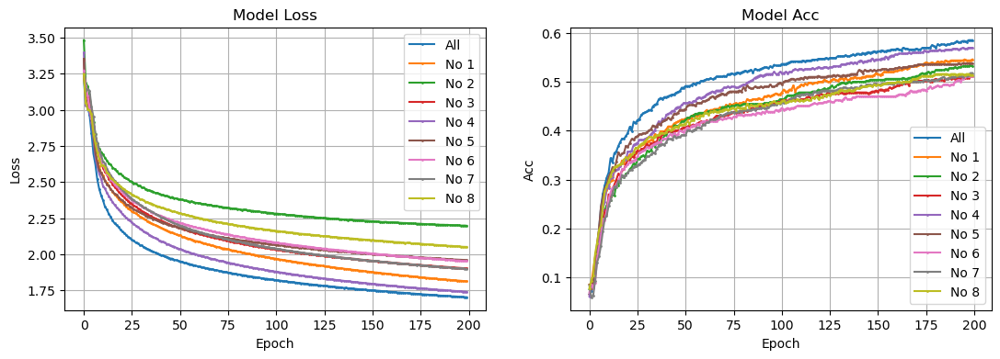

0    Val Accuracy small to large :  [3 6 8 7 2 5 1 4 0]
0    Val Loss     small to large :  [2 8 5 6 3 7 1 4 0] 




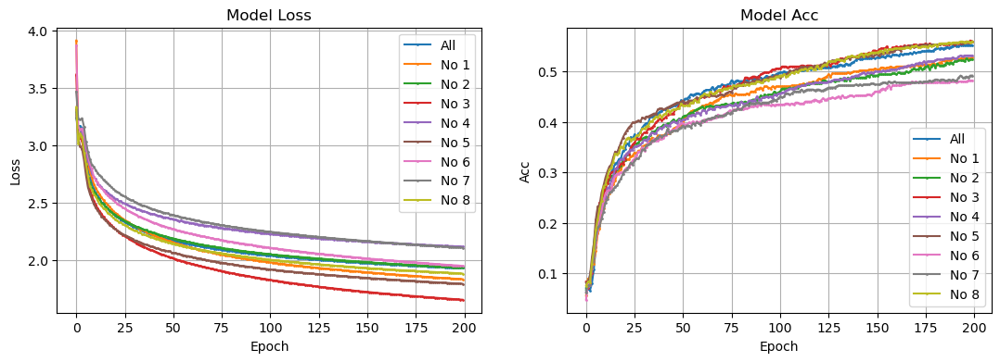

1    Val Accuracy small to large :  [6 7 2 1 4 0 5 8 3]
1    Val Loss     small to large :  [4 7 6 2 0 8 1 5 3] 




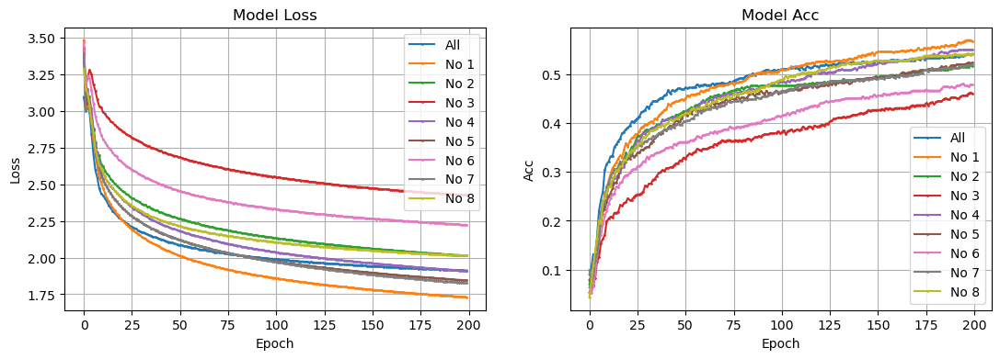

2    Val Accuracy small to large :  [3 6 2 7 5 0 8 4 1]
2    Val Loss     small to large :  [3 6 2 8 0 4 5 7 1] 




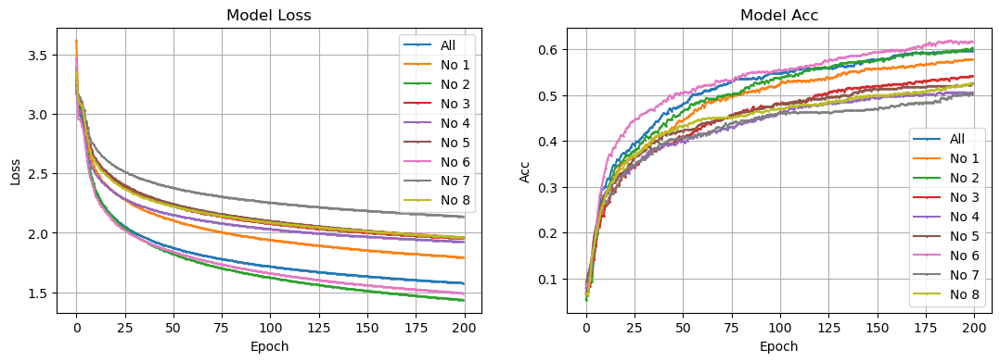

3    Val Accuracy small to large :  [7 4 5 8 3 1 0 2 6]
3    Val Loss     small to large :  [7 5 8 3 4 1 0 6 2] 




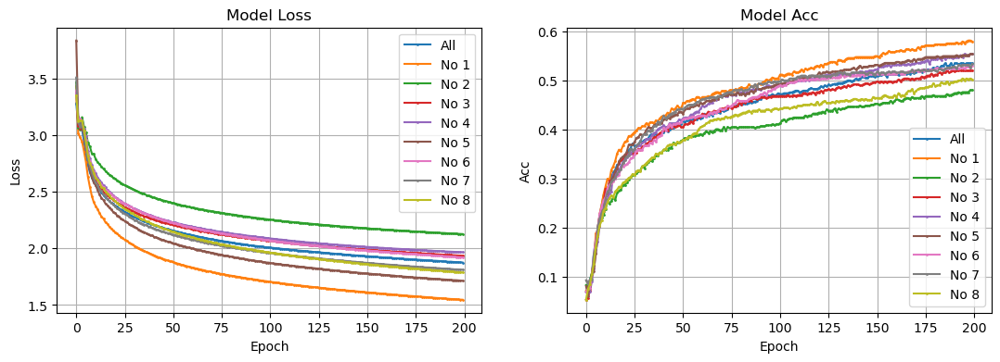

4    Val Accuracy small to large :  [2 8 3 6 7 0 4 5 1]
4    Val Loss     small to large :  [2 4 3 6 0 7 8 5 1] 




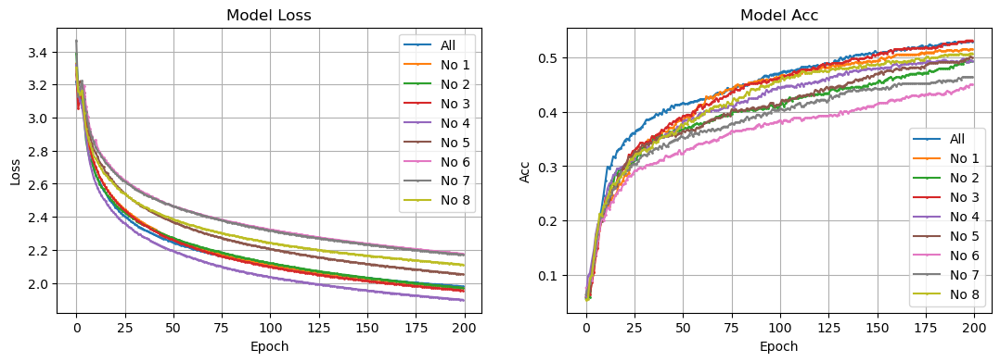

5    Val Accuracy small to large :  [6 7 2 4 5 8 1 0 3]
5    Val Loss     small to large :  [6 7 8 5 0 1 2 3 4] 




In [17]:
for subject in range(6):
    globals()['Sub{}_history'.format(subject)] = [globals()['history_all_S{}'.format(subject)]]

    for no_sensor in range(8):
        globals()['Sub{}_history'.format(subject)].append(globals()['history_no{}_S{}'.format(no_sensor, subject)])

    draw_all(globals()['Sub{}_history'.format(subject)])

    val_acc_lst, val_loss_lst = [], []

    for i in range(len(globals()['Sub{}_history'.format(subject)])):
        val_acc_lst.append(np.max(globals()['Sub{}_history'.format(subject)][i].history['val_acc']))
        val_loss_lst.append(np.min(globals()['Sub{}_history'.format(subject)][i].history['val_loss']))


    print(subject, "   Val Accuracy small to large : ", np.argsort(val_acc_lst))
    print(subject, "   Val Loss     small to large : ", np.argsort(val_loss_lst)[::-1], "\n\n" )

In [18]:
for subject in range(6):
    x_train, y_train, node_features, df = build_data(subject, [0,1,2,3,4,5,6,7])
    graph1, edges, edge_weights = graph_build(df)
    graph_info = (node_features, edges, edge_weights) # Create graph info tuple with node_features, edges, and edge_weights.

    print("Edges shape:", edges.shape, "    Nodes shape:", node_features.shape)

    loss_fn = keras.losses.SparseCategoricalCrossentropy(from_logits=True)
    optimizer = keras.optimizers.Adam(LEARNING_RATE)
    accuracy_fn = keras.metrics.SparseCategoricalAccuracy(name="acc")

    model = GraphAttentionNetwork(node_features, edges, HIDDEN_UNITS, NUM_HEADS, NUM_LAYERS, OUTPUT_DIM)
    model.compile(loss=loss_fn, optimizer=optimizer, metrics=[accuracy_fn])

    globals()['history_all_S{}'.format(subject)] = model.fit(x_train, y_train, validation_split=val_split, 
                                                             batch_size=BATCH_SIZE, epochs=NUM_EPOCHS, verbose=1)

    del model

Edges shape: (2880, 2)     Nodes shape: (2880, 200)
Epoch 1/200
18/18 [==============================] - 14s 156ms/step - loss: 4.2999 - acc: 0.0677 - val_loss: 3.1884 - val_acc: 0.0816
Epoch 2/200
18/18 [==============================] - 0s 25ms/step - loss: 2.4599 - acc: 0.2205 - val_loss: 3.0567 - val_acc: 0.0799
Epoch 3/200
18/18 [==============================] - 0s 19ms/step - loss: 1.7875 - acc: 0.5104 - val_loss: 2.9781 - val_acc: 0.1233
Epoch 4/200
18/18 [==============================] - 0s 19ms/step - loss: 1.1593 - acc: 0.7830 - val_loss: 3.0010 - val_acc: 0.1319
Epoch 5/200
18/18 [==============================] - 0s 19ms/step - loss: 0.6477 - acc: 0.9340 - val_loss: 2.8886 - val_acc: 0.1684
Epoch 6/200
18/18 [==============================] - 0s 18ms/step - loss: 0.2909 - acc: 0.9948 - val_loss: 2.7688 - val_acc: 0.1858
Epoch 7/200
18/18 [==============================] - 0s 18ms/step - loss: 0.1238 - acc: 1.0000 - val_loss: 2.6533 - val_acc: 0.2344
Epoch 8/200
18/18 [===

Epoch 62/200
18/18 [==============================] - 0s 19ms/step - loss: 4.3933e-04 - acc: 1.0000 - val_loss: 2.0441 - val_acc: 0.4601
Epoch 63/200
18/18 [==============================] - 0s 18ms/step - loss: 4.2436e-04 - acc: 1.0000 - val_loss: 2.0418 - val_acc: 0.4566
Epoch 64/200
18/18 [==============================] - 0s 17ms/step - loss: 4.0995e-04 - acc: 1.0000 - val_loss: 2.0371 - val_acc: 0.4601
Epoch 65/200
18/18 [==============================] - 0s 19ms/step - loss: 3.9647e-04 - acc: 1.0000 - val_loss: 2.0344 - val_acc: 0.4618
Epoch 66/200
18/18 [==============================] - 0s 18ms/step - loss: 3.8439e-04 - acc: 1.0000 - val_loss: 2.0313 - val_acc: 0.4618
Epoch 67/200
18/18 [==============================] - 0s 18ms/step - loss: 3.7164e-04 - acc: 1.0000 - val_loss: 2.0287 - val_acc: 0.4653
Epoch 68/200
18/18 [==============================] - 0s 18ms/step - loss: 3.6015e-04 - acc: 1.0000 - val_loss: 2.0250 - val_acc: 0.4618
Epoch 69/200
18/18 [=====================

18/18 [==============================] - 1s 35ms/step - loss: 9.8724e-05 - acc: 1.0000 - val_loss: 1.9148 - val_acc: 0.5017
Epoch 122/200
18/18 [==============================] - 1s 37ms/step - loss: 9.6785e-05 - acc: 1.0000 - val_loss: 1.9127 - val_acc: 0.5035
Epoch 123/200
18/18 [==============================] - 1s 34ms/step - loss: 9.4909e-05 - acc: 1.0000 - val_loss: 1.9125 - val_acc: 0.5035
Epoch 124/200
18/18 [==============================] - 1s 34ms/step - loss: 9.3058e-05 - acc: 1.0000 - val_loss: 1.9110 - val_acc: 0.5052
Epoch 125/200
18/18 [==============================] - 1s 36ms/step - loss: 9.1366e-05 - acc: 1.0000 - val_loss: 1.9089 - val_acc: 0.5052
Epoch 126/200
18/18 [==============================] - 1s 37ms/step - loss: 8.9640e-05 - acc: 1.0000 - val_loss: 1.9075 - val_acc: 0.5052
Epoch 127/200
18/18 [==============================] - 1s 35ms/step - loss: 8.7915e-05 - acc: 1.0000 - val_loss: 1.9062 - val_acc: 0.5069
Epoch 128/200
18/18 [===========================

18/18 [==============================] - 1s 36ms/step - loss: 3.6518e-05 - acc: 1.0000 - val_loss: 1.8434 - val_acc: 0.5434
Epoch 181/200
18/18 [==============================] - 1s 37ms/step - loss: 3.5984e-05 - acc: 1.0000 - val_loss: 1.8420 - val_acc: 0.5434
Epoch 182/200
18/18 [==============================] - 1s 35ms/step - loss: 3.5437e-05 - acc: 1.0000 - val_loss: 1.8415 - val_acc: 0.5451
Epoch 183/200
18/18 [==============================] - 1s 34ms/step - loss: 3.4928e-05 - acc: 1.0000 - val_loss: 1.8398 - val_acc: 0.5451
Epoch 184/200
18/18 [==============================] - 1s 36ms/step - loss: 3.4419e-05 - acc: 1.0000 - val_loss: 1.8395 - val_acc: 0.5451
Epoch 185/200
18/18 [==============================] - 1s 36ms/step - loss: 3.3906e-05 - acc: 1.0000 - val_loss: 1.8385 - val_acc: 0.5451
Epoch 186/200
18/18 [==============================] - 1s 36ms/step - loss: 3.3421e-05 - acc: 1.0000 - val_loss: 1.8381 - val_acc: 0.5451
Epoch 187/200
18/18 [===========================

18/18 [==============================] - 1s 36ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.1265 - val_acc: 0.4080
Epoch 41/200
18/18 [==============================] - 1s 34ms/step - loss: 0.0010 - acc: 1.0000 - val_loss: 2.1214 - val_acc: 0.4080
Epoch 42/200
18/18 [==============================] - 1s 36ms/step - loss: 9.8482e-04 - acc: 1.0000 - val_loss: 2.1159 - val_acc: 0.4132
Epoch 43/200
18/18 [==============================] - 1s 35ms/step - loss: 9.4026e-04 - acc: 1.0000 - val_loss: 2.1103 - val_acc: 0.4132
Epoch 44/200
18/18 [==============================] - 1s 34ms/step - loss: 8.9602e-04 - acc: 1.0000 - val_loss: 2.1087 - val_acc: 0.4149
Epoch 45/200
18/18 [==============================] - 1s 33ms/step - loss: 8.5436e-04 - acc: 1.0000 - val_loss: 2.1001 - val_acc: 0.4167
Epoch 46/200
18/18 [==============================] - 1s 33ms/step - loss: 8.1583e-04 - acc: 1.0000 - val_loss: 2.0958 - val_acc: 0.4184
Epoch 47/200
18/18 [==============================] - 1s 34ms/

Epoch 100/200
18/18 [==============================] - 1s 33ms/step - loss: 1.5439e-04 - acc: 1.0000 - val_loss: 1.9322 - val_acc: 0.4722
Epoch 101/200
18/18 [==============================] - 1s 33ms/step - loss: 1.5121e-04 - acc: 1.0000 - val_loss: 1.9312 - val_acc: 0.4757
Epoch 102/200
18/18 [==============================] - 1s 35ms/step - loss: 1.4761e-04 - acc: 1.0000 - val_loss: 1.9285 - val_acc: 0.4757
Epoch 103/200
18/18 [==============================] - 1s 33ms/step - loss: 1.4439e-04 - acc: 1.0000 - val_loss: 1.9262 - val_acc: 0.4757
Epoch 104/200
18/18 [==============================] - 1s 34ms/step - loss: 1.4121e-04 - acc: 1.0000 - val_loss: 1.9244 - val_acc: 0.4774
Epoch 105/200
18/18 [==============================] - 1s 33ms/step - loss: 1.3822e-04 - acc: 1.0000 - val_loss: 1.9227 - val_acc: 0.4792
Epoch 106/200
18/18 [==============================] - 1s 34ms/step - loss: 1.3525e-04 - acc: 1.0000 - val_loss: 1.9205 - val_acc: 0.4757
Epoch 107/200
18/18 [=============

18/18 [==============================] - 1s 36ms/step - loss: 5.0639e-05 - acc: 1.0000 - val_loss: 1.8408 - val_acc: 0.5087
Epoch 160/200
18/18 [==============================] - 1s 39ms/step - loss: 4.9836e-05 - acc: 1.0000 - val_loss: 1.8396 - val_acc: 0.5104
Epoch 161/200
18/18 [==============================] - 1s 37ms/step - loss: 4.9041e-05 - acc: 1.0000 - val_loss: 1.8386 - val_acc: 0.5104
Epoch 162/200
18/18 [==============================] - 1s 34ms/step - loss: 4.8271e-05 - acc: 1.0000 - val_loss: 1.8370 - val_acc: 0.5104
Epoch 163/200
18/18 [==============================] - 1s 38ms/step - loss: 4.7533e-05 - acc: 1.0000 - val_loss: 1.8370 - val_acc: 0.5104
Epoch 164/200
18/18 [==============================] - 1s 35ms/step - loss: 4.6759e-05 - acc: 1.0000 - val_loss: 1.8352 - val_acc: 0.5122
Epoch 165/200
18/18 [==============================] - 1s 37ms/step - loss: 4.6021e-05 - acc: 1.0000 - val_loss: 1.8345 - val_acc: 0.5122
Epoch 166/200
18/18 [===========================

Epoch 19/200
18/18 [==============================] - 1s 35ms/step - loss: 0.0051 - acc: 1.0000 - val_loss: 2.2731 - val_acc: 0.3490
Epoch 20/200
18/18 [==============================] - 1s 34ms/step - loss: 0.0046 - acc: 1.0000 - val_loss: 2.2579 - val_acc: 0.3438
Epoch 21/200
18/18 [==============================] - 1s 35ms/step - loss: 0.0041 - acc: 1.0000 - val_loss: 2.2422 - val_acc: 0.3524
Epoch 22/200
18/18 [==============================] - 1s 35ms/step - loss: 0.0037 - acc: 1.0000 - val_loss: 2.2322 - val_acc: 0.3611
Epoch 23/200
18/18 [==============================] - 1s 42ms/step - loss: 0.0034 - acc: 1.0000 - val_loss: 2.2201 - val_acc: 0.3646
Epoch 24/200
18/18 [==============================] - 1s 34ms/step - loss: 0.0031 - acc: 1.0000 - val_loss: 2.2107 - val_acc: 0.3733
Epoch 25/200
18/18 [==============================] - 1s 35ms/step - loss: 0.0028 - acc: 1.0000 - val_loss: 2.1977 - val_acc: 0.3750
Epoch 26/200
18/18 [==============================] - 1s 35ms/step - 

18/18 [==============================] - 1s 34ms/step - loss: 2.4188e-04 - acc: 1.0000 - val_loss: 1.9144 - val_acc: 0.4722
Epoch 80/200
18/18 [==============================] - 1s 35ms/step - loss: 2.3537e-04 - acc: 1.0000 - val_loss: 1.9126 - val_acc: 0.4757
Epoch 81/200
18/18 [==============================] - 1s 37ms/step - loss: 2.2905e-04 - acc: 1.0000 - val_loss: 1.9091 - val_acc: 0.4774
Epoch 82/200
18/18 [==============================] - 1s 34ms/step - loss: 2.2294e-04 - acc: 1.0000 - val_loss: 1.9080 - val_acc: 0.4774
Epoch 83/200
18/18 [==============================] - 1s 35ms/step - loss: 2.1708e-04 - acc: 1.0000 - val_loss: 1.9039 - val_acc: 0.4826
Epoch 84/200
18/18 [==============================] - 1s 35ms/step - loss: 2.1135e-04 - acc: 1.0000 - val_loss: 1.9016 - val_acc: 0.4809
Epoch 85/200
18/18 [==============================] - 1s 35ms/step - loss: 2.0585e-04 - acc: 1.0000 - val_loss: 1.9002 - val_acc: 0.4844
Epoch 86/200
18/18 [==============================] - 

18/18 [==============================] - 1s 36ms/step - loss: 6.7046e-05 - acc: 1.0000 - val_loss: 1.8015 - val_acc: 0.5347
Epoch 139/200
18/18 [==============================] - 1s 35ms/step - loss: 6.5880e-05 - acc: 1.0000 - val_loss: 1.8008 - val_acc: 0.5347
Epoch 140/200
18/18 [==============================] - 1s 35ms/step - loss: 6.4722e-05 - acc: 1.0000 - val_loss: 1.7996 - val_acc: 0.5365
Epoch 141/200
18/18 [==============================] - 1s 35ms/step - loss: 6.3576e-05 - acc: 1.0000 - val_loss: 1.7975 - val_acc: 0.5365
Epoch 142/200
18/18 [==============================] - 1s 40ms/step - loss: 6.2467e-05 - acc: 1.0000 - val_loss: 1.7960 - val_acc: 0.5347
Epoch 143/200
18/18 [==============================] - 1s 33ms/step - loss: 6.1483e-05 - acc: 1.0000 - val_loss: 1.7949 - val_acc: 0.5365
Epoch 144/200
18/18 [==============================] - 1s 39ms/step - loss: 6.0371e-05 - acc: 1.0000 - val_loss: 1.7928 - val_acc: 0.5347
Epoch 145/200
18/18 [===========================

18/18 [==============================] - 1s 38ms/step - loss: 2.6630e-05 - acc: 1.0000 - val_loss: 1.7337 - val_acc: 0.5660
Epoch 198/200
18/18 [==============================] - 1s 34ms/step - loss: 2.6262e-05 - acc: 1.0000 - val_loss: 1.7322 - val_acc: 0.5694
Epoch 199/200
18/18 [==============================] - 1s 38ms/step - loss: 2.5904e-05 - acc: 1.0000 - val_loss: 1.7312 - val_acc: 0.5712
Epoch 200/200
18/18 [==============================] - 1s 36ms/step - loss: 2.5548e-05 - acc: 1.0000 - val_loss: 1.7309 - val_acc: 0.5677
Edges shape: (2880, 2)     Nodes shape: (2880, 200)
Epoch 1/200
18/18 [==============================] - 14s 201ms/step - loss: 4.0288 - acc: 0.0729 - val_loss: 3.2165 - val_acc: 0.0903
Epoch 2/200
18/18 [==============================] - 1s 27ms/step - loss: 2.3354 - acc: 0.2674 - val_loss: 3.0054 - val_acc: 0.0868
Epoch 3/200
18/18 [==============================] - 0s 18ms/step - loss: 1.6412 - acc: 0.5538 - val_loss: 3.0242 - val_acc: 0.0868
Epoch 4/200


Epoch 58/200
18/18 [==============================] - 1s 35ms/step - loss: 4.7138e-04 - acc: 1.0000 - val_loss: 1.9992 - val_acc: 0.4618
Epoch 59/200
18/18 [==============================] - 1s 34ms/step - loss: 4.5451e-04 - acc: 1.0000 - val_loss: 1.9973 - val_acc: 0.4635
Epoch 60/200
18/18 [==============================] - 1s 35ms/step - loss: 4.3849e-04 - acc: 1.0000 - val_loss: 1.9921 - val_acc: 0.4635
Epoch 61/200
18/18 [==============================] - 1s 36ms/step - loss: 4.2300e-04 - acc: 1.0000 - val_loss: 1.9901 - val_acc: 0.4705
Epoch 62/200
18/18 [==============================] - 1s 35ms/step - loss: 4.0801e-04 - acc: 1.0000 - val_loss: 1.9866 - val_acc: 0.4670
Epoch 63/200
18/18 [==============================] - 1s 34ms/step - loss: 3.9421e-04 - acc: 1.0000 - val_loss: 1.9833 - val_acc: 0.4722
Epoch 64/200
18/18 [==============================] - 1s 41ms/step - loss: 3.8068e-04 - acc: 1.0000 - val_loss: 1.9794 - val_acc: 0.4774
Epoch 65/200
18/18 [=====================

18/18 [==============================] - 1s 35ms/step - loss: 9.8604e-05 - acc: 1.0000 - val_loss: 1.8599 - val_acc: 0.5278
Epoch 118/200
18/18 [==============================] - 1s 33ms/step - loss: 9.6638e-05 - acc: 1.0000 - val_loss: 1.8581 - val_acc: 0.5295
Epoch 119/200
18/18 [==============================] - 1s 34ms/step - loss: 9.4769e-05 - acc: 1.0000 - val_loss: 1.8556 - val_acc: 0.5260
Epoch 120/200
18/18 [==============================] - 1s 36ms/step - loss: 9.2903e-05 - acc: 1.0000 - val_loss: 1.8556 - val_acc: 0.5278
Epoch 121/200
18/18 [==============================] - 1s 35ms/step - loss: 9.1120e-05 - acc: 1.0000 - val_loss: 1.8529 - val_acc: 0.5347
Epoch 122/200
18/18 [==============================] - 1s 35ms/step - loss: 8.9327e-05 - acc: 1.0000 - val_loss: 1.8506 - val_acc: 0.5312
Epoch 123/200
18/18 [==============================] - 1s 35ms/step - loss: 8.7584e-05 - acc: 1.0000 - val_loss: 1.8505 - val_acc: 0.5347
Epoch 124/200
18/18 [===========================

18/18 [==============================] - 1s 33ms/step - loss: 3.5679e-05 - acc: 1.0000 - val_loss: 1.7847 - val_acc: 0.5590
Epoch 177/200
18/18 [==============================] - 1s 34ms/step - loss: 3.5136e-05 - acc: 1.0000 - val_loss: 1.7847 - val_acc: 0.5608
Epoch 178/200
18/18 [==============================] - 1s 33ms/step - loss: 3.4633e-05 - acc: 1.0000 - val_loss: 1.7833 - val_acc: 0.5590
Epoch 179/200
18/18 [==============================] - 1s 35ms/step - loss: 3.4104e-05 - acc: 1.0000 - val_loss: 1.7829 - val_acc: 0.5590
Epoch 180/200
18/18 [==============================] - 1s 34ms/step - loss: 3.3597e-05 - acc: 1.0000 - val_loss: 1.7825 - val_acc: 0.5608
Epoch 181/200
18/18 [==============================] - 1s 36ms/step - loss: 3.3103e-05 - acc: 1.0000 - val_loss: 1.7800 - val_acc: 0.5625
Epoch 182/200
18/18 [==============================] - 1s 40ms/step - loss: 3.2610e-05 - acc: 1.0000 - val_loss: 1.7794 - val_acc: 0.5608
Epoch 183/200
18/18 [===========================

18/18 [==============================] - 0s 17ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 2.2248 - val_acc: 0.4132
Epoch 37/200
18/18 [==============================] - 0s 18ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.2183 - val_acc: 0.4115
Epoch 38/200
18/18 [==============================] - 0s 18ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.2137 - val_acc: 0.4132
Epoch 39/200
18/18 [==============================] - 0s 17ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.2080 - val_acc: 0.4184
Epoch 40/200
18/18 [==============================] - 0s 18ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.2032 - val_acc: 0.4236
Epoch 41/200
18/18 [==============================] - 0s 18ms/step - loss: 9.9903e-04 - acc: 1.0000 - val_loss: 2.1991 - val_acc: 0.4219
Epoch 42/200
18/18 [==============================] - 0s 18ms/step - loss: 9.5076e-04 - acc: 1.0000 - val_loss: 2.1956 - val_acc: 0.4306
Epoch 43/200
18/18 [==============================] - 0s 18ms/step - loss:

18/18 [==============================] - 0s 19ms/step - loss: 1.6223e-04 - acc: 1.0000 - val_loss: 2.0514 - val_acc: 0.4983
Epoch 97/200
18/18 [==============================] - 0s 17ms/step - loss: 1.5848e-04 - acc: 1.0000 - val_loss: 2.0505 - val_acc: 0.4983
Epoch 98/200
18/18 [==============================] - 0s 18ms/step - loss: 1.5479e-04 - acc: 1.0000 - val_loss: 2.0492 - val_acc: 0.4983
Epoch 99/200
18/18 [==============================] - 0s 18ms/step - loss: 1.5134e-04 - acc: 1.0000 - val_loss: 2.0474 - val_acc: 0.5000
Epoch 100/200
18/18 [==============================] - 0s 19ms/step - loss: 1.4800e-04 - acc: 1.0000 - val_loss: 2.0454 - val_acc: 0.5000
Epoch 101/200
18/18 [==============================] - 0s 18ms/step - loss: 1.4457e-04 - acc: 1.0000 - val_loss: 2.0445 - val_acc: 0.4983
Epoch 102/200
18/18 [==============================] - 0s 18ms/step - loss: 1.4146e-04 - acc: 1.0000 - val_loss: 2.0434 - val_acc: 0.5000
Epoch 103/200
18/18 [==============================

18/18 [==============================] - 0s 18ms/step - loss: 5.1839e-05 - acc: 1.0000 - val_loss: 1.9848 - val_acc: 0.5243
Epoch 156/200
18/18 [==============================] - 0s 17ms/step - loss: 5.0992e-05 - acc: 1.0000 - val_loss: 1.9843 - val_acc: 0.5243
Epoch 157/200
18/18 [==============================] - 0s 19ms/step - loss: 5.0191e-05 - acc: 1.0000 - val_loss: 1.9835 - val_acc: 0.5243
Epoch 158/200
18/18 [==============================] - 0s 17ms/step - loss: 4.9399e-05 - acc: 1.0000 - val_loss: 1.9831 - val_acc: 0.5243
Epoch 159/200
18/18 [==============================] - 0s 18ms/step - loss: 4.8593e-05 - acc: 1.0000 - val_loss: 1.9821 - val_acc: 0.5243
Epoch 160/200
18/18 [==============================] - 0s 17ms/step - loss: 4.7821e-05 - acc: 1.0000 - val_loss: 1.9814 - val_acc: 0.5243
Epoch 161/200
18/18 [==============================] - 0s 20ms/step - loss: 4.7056e-05 - acc: 1.0000 - val_loss: 1.9799 - val_acc: 0.5243
Epoch 162/200
18/18 [===========================

18/18 [==============================] - 0s 17ms/step - loss: 0.0097 - acc: 1.0000 - val_loss: 2.6465 - val_acc: 0.2483
Epoch 15/200
18/18 [==============================] - 0s 20ms/step - loss: 0.0084 - acc: 1.0000 - val_loss: 2.6326 - val_acc: 0.2604
Epoch 16/200
18/18 [==============================] - 0s 19ms/step - loss: 0.0073 - acc: 1.0000 - val_loss: 2.6050 - val_acc: 0.2708
Epoch 17/200
18/18 [==============================] - 0s 19ms/step - loss: 0.0064 - acc: 1.0000 - val_loss: 2.5983 - val_acc: 0.2847
Epoch 18/200
18/18 [==============================] - 0s 19ms/step - loss: 0.0056 - acc: 1.0000 - val_loss: 2.5801 - val_acc: 0.2795
Epoch 19/200
18/18 [==============================] - 0s 18ms/step - loss: 0.0050 - acc: 1.0000 - val_loss: 2.5690 - val_acc: 0.2899
Epoch 20/200
18/18 [==============================] - 0s 18ms/step - loss: 0.0045 - acc: 1.0000 - val_loss: 2.5554 - val_acc: 0.2882
Epoch 21/200
18/18 [==============================] - 0s 18ms/step - loss: 0.0041 

Epoch 75/200
18/18 [==============================] - 0s 18ms/step - loss: 2.8349e-04 - acc: 1.0000 - val_loss: 2.2554 - val_acc: 0.4288
Epoch 76/200
18/18 [==============================] - 0s 17ms/step - loss: 2.7569e-04 - acc: 1.0000 - val_loss: 2.2534 - val_acc: 0.4323
Epoch 77/200
18/18 [==============================] - 0s 20ms/step - loss: 2.6788e-04 - acc: 1.0000 - val_loss: 2.2500 - val_acc: 0.4271
Epoch 78/200
18/18 [==============================] - 0s 19ms/step - loss: 2.6043e-04 - acc: 1.0000 - val_loss: 2.2479 - val_acc: 0.4358
Epoch 79/200
18/18 [==============================] - 0s 18ms/step - loss: 2.5330e-04 - acc: 1.0000 - val_loss: 2.2444 - val_acc: 0.4340
Epoch 80/200
18/18 [==============================] - 0s 20ms/step - loss: 2.4654e-04 - acc: 1.0000 - val_loss: 2.2429 - val_acc: 0.4375
Epoch 81/200
18/18 [==============================] - 0s 18ms/step - loss: 2.3978e-04 - acc: 1.0000 - val_loss: 2.2415 - val_acc: 0.4340
Epoch 82/200
18/18 [=====================

18/18 [==============================] - 0s 19ms/step - loss: 7.5820e-05 - acc: 1.0000 - val_loss: 2.1472 - val_acc: 0.4757
Epoch 135/200
18/18 [==============================] - 0s 17ms/step - loss: 7.4442e-05 - acc: 1.0000 - val_loss: 2.1446 - val_acc: 0.4757
Epoch 136/200
18/18 [==============================] - 0s 18ms/step - loss: 7.3140e-05 - acc: 1.0000 - val_loss: 2.1442 - val_acc: 0.4757
Epoch 137/200
18/18 [==============================] - 0s 17ms/step - loss: 7.1827e-05 - acc: 1.0000 - val_loss: 2.1418 - val_acc: 0.4757
Epoch 138/200
18/18 [==============================] - 0s 19ms/step - loss: 7.0575e-05 - acc: 1.0000 - val_loss: 2.1418 - val_acc: 0.4757
Epoch 139/200
18/18 [==============================] - 0s 18ms/step - loss: 6.9309e-05 - acc: 1.0000 - val_loss: 2.1407 - val_acc: 0.4757
Epoch 140/200
18/18 [==============================] - 0s 18ms/step - loss: 6.8117e-05 - acc: 1.0000 - val_loss: 2.1396 - val_acc: 0.4757
Epoch 141/200
18/18 [===========================

18/18 [==============================] - 0s 16ms/step - loss: 2.9492e-05 - acc: 1.0000 - val_loss: 2.0868 - val_acc: 0.5017
Epoch 194/200
18/18 [==============================] - 0s 19ms/step - loss: 2.9085e-05 - acc: 1.0000 - val_loss: 2.0866 - val_acc: 0.5000
Epoch 195/200
18/18 [==============================] - 0s 17ms/step - loss: 2.8661e-05 - acc: 1.0000 - val_loss: 2.0846 - val_acc: 0.5017
Epoch 196/200
18/18 [==============================] - 0s 20ms/step - loss: 2.8254e-05 - acc: 1.0000 - val_loss: 2.0842 - val_acc: 0.5017
Epoch 197/200
18/18 [==============================] - 0s 18ms/step - loss: 2.7857e-05 - acc: 1.0000 - val_loss: 2.0834 - val_acc: 0.5017
Epoch 198/200
18/18 [==============================] - 0s 16ms/step - loss: 2.7477e-05 - acc: 1.0000 - val_loss: 2.0836 - val_acc: 0.5017
Epoch 199/200
18/18 [==============================] - 0s 16ms/step - loss: 2.7077e-05 - acc: 1.0000 - val_loss: 2.0830 - val_acc: 0.5017
Epoch 200/200
18/18 [===========================

In [19]:
for subject in range(6):
    for no_sensor in range(8):
        lst_sensor = []
        for i in range(8): 
            if i == no_sensor: pass
            else: lst_sensor.append(i)
        print(subject, "  Sensor List: ", lst_sensor)

        x_train, y_train, node_features, df = build_data(subject, lst_sensor)
        graph1, edges, edge_weights = graph_build(df)
        graph_info = (node_features, edges, edge_weights) # Create graph info tuple with node_features, edges, and edge_weights.

        print(no_sensor, "   Edges shape:", edges.shape, "    Nodes shape:", node_features.shape)

        loss_fn = keras.losses.SparseCategoricalCrossentropy(from_logits=True)
        optimizer = keras.optimizers.Adam(LEARNING_RATE)
        accuracy_fn = keras.metrics.SparseCategoricalAccuracy(name="acc")

        model = GraphAttentionNetwork(node_features, edges, HIDDEN_UNITS, NUM_HEADS, NUM_LAYERS, OUTPUT_DIM)

        model.compile(loss=loss_fn, optimizer=optimizer, metrics=[accuracy_fn])

        globals()['history_no{}_S{}'.format(no_sensor, subject)] = model.fit(x_train, y_train, validation_split=val_split, 
                                                                batch_size=BATCH_SIZE, epochs=NUM_EPOCHS, verbose=1)

        del model

0   Sensor List:  [1, 2, 3, 4, 5, 6, 7]
0    Edges shape: (2520, 2)     Nodes shape: (2520, 200)
Epoch 1/200
16/16 [==============================] - 12s 175ms/step - loss: 4.2071 - acc: 0.0620 - val_loss: 3.2654 - val_acc: 0.0655
Epoch 2/200
16/16 [==============================] - 0s 29ms/step - loss: 2.3512 - acc: 0.2490 - val_loss: 3.0397 - val_acc: 0.0655
Epoch 3/200
16/16 [==============================] - 0s 17ms/step - loss: 1.5934 - acc: 0.5714 - val_loss: 2.9838 - val_acc: 0.1071
Epoch 4/200
16/16 [==============================] - 0s 17ms/step - loss: 0.9672 - acc: 0.8234 - val_loss: 2.9195 - val_acc: 0.1488
Epoch 5/200
16/16 [==============================] - 0s 17ms/step - loss: 0.4629 - acc: 0.9712 - val_loss: 2.7998 - val_acc: 0.1825
Epoch 6/200
16/16 [==============================] - 0s 17ms/step - loss: 0.2001 - acc: 0.9990 - val_loss: 2.6813 - val_acc: 0.2163
Epoch 7/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0890 - acc: 1.0000 - val_loss: 2.

16/16 [==============================] - 0s 19ms/step - loss: 4.8926e-04 - acc: 1.0000 - val_loss: 1.9982 - val_acc: 0.4385
Epoch 62/200
16/16 [==============================] - 0s 18ms/step - loss: 4.7297e-04 - acc: 1.0000 - val_loss: 1.9935 - val_acc: 0.4385
Epoch 63/200
16/16 [==============================] - 0s 18ms/step - loss: 4.5767e-04 - acc: 1.0000 - val_loss: 1.9926 - val_acc: 0.4425
Epoch 64/200
16/16 [==============================] - 0s 20ms/step - loss: 4.4349e-04 - acc: 1.0000 - val_loss: 1.9884 - val_acc: 0.4425
Epoch 65/200
16/16 [==============================] - 0s 18ms/step - loss: 4.2908e-04 - acc: 1.0000 - val_loss: 1.9860 - val_acc: 0.4425
Epoch 66/200
16/16 [==============================] - 0s 21ms/step - loss: 4.1559e-04 - acc: 1.0000 - val_loss: 1.9796 - val_acc: 0.4444
Epoch 67/200
16/16 [==============================] - 0s 18ms/step - loss: 4.0295e-04 - acc: 1.0000 - val_loss: 1.9795 - val_acc: 0.4464
Epoch 68/200
16/16 [==============================] - 

Epoch 121/200
16/16 [==============================] - 0s 17ms/step - loss: 1.1158e-04 - acc: 1.0000 - val_loss: 1.8641 - val_acc: 0.5099
Epoch 122/200
16/16 [==============================] - 0s 18ms/step - loss: 1.0953e-04 - acc: 1.0000 - val_loss: 1.8625 - val_acc: 0.5079
Epoch 123/200
16/16 [==============================] - 0s 18ms/step - loss: 1.0746e-04 - acc: 1.0000 - val_loss: 1.8595 - val_acc: 0.5119
Epoch 124/200
16/16 [==============================] - 0s 18ms/step - loss: 1.0556e-04 - acc: 1.0000 - val_loss: 1.8587 - val_acc: 0.5119
Epoch 125/200
16/16 [==============================] - 0s 18ms/step - loss: 1.0365e-04 - acc: 1.0000 - val_loss: 1.8580 - val_acc: 0.5139
Epoch 126/200
16/16 [==============================] - 0s 18ms/step - loss: 1.0177e-04 - acc: 1.0000 - val_loss: 1.8550 - val_acc: 0.5139
Epoch 127/200
16/16 [==============================] - 0s 20ms/step - loss: 9.9905e-05 - acc: 1.0000 - val_loss: 1.8547 - val_acc: 0.5139
Epoch 128/200
16/16 [=============

16/16 [==============================] - 0s 18ms/step - loss: 4.3005e-05 - acc: 1.0000 - val_loss: 1.7922 - val_acc: 0.5337
Epoch 181/200
16/16 [==============================] - 0s 18ms/step - loss: 4.2408e-05 - acc: 1.0000 - val_loss: 1.7910 - val_acc: 0.5337
Epoch 182/200
16/16 [==============================] - 0s 18ms/step - loss: 4.1815e-05 - acc: 1.0000 - val_loss: 1.7895 - val_acc: 0.5337
Epoch 183/200
16/16 [==============================] - 0s 17ms/step - loss: 4.1240e-05 - acc: 1.0000 - val_loss: 1.7887 - val_acc: 0.5337
Epoch 184/200
16/16 [==============================] - 0s 18ms/step - loss: 4.0661e-05 - acc: 1.0000 - val_loss: 1.7871 - val_acc: 0.5357
Epoch 185/200
16/16 [==============================] - 0s 18ms/step - loss: 4.0098e-05 - acc: 1.0000 - val_loss: 1.7862 - val_acc: 0.5357
Epoch 186/200
16/16 [==============================] - 0s 19ms/step - loss: 3.9552e-05 - acc: 1.0000 - val_loss: 1.7856 - val_acc: 0.5357
Epoch 187/200
16/16 [===========================

16/16 [==============================] - 0s 19ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 1.8688 - val_acc: 0.4980
Epoch 41/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 1.8619 - val_acc: 0.5000
Epoch 42/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0010 - acc: 1.0000 - val_loss: 1.8565 - val_acc: 0.4980
Epoch 43/200
16/16 [==============================] - 0s 22ms/step - loss: 9.7704e-04 - acc: 1.0000 - val_loss: 1.8503 - val_acc: 0.5040
Epoch 44/200
16/16 [==============================] - 0s 20ms/step - loss: 9.3267e-04 - acc: 1.0000 - val_loss: 1.8460 - val_acc: 0.5020
Epoch 45/200
16/16 [==============================] - 0s 19ms/step - loss: 8.9086e-04 - acc: 1.0000 - val_loss: 1.8385 - val_acc: 0.5060
Epoch 46/200
16/16 [==============================] - 0s 19ms/step - loss: 8.5062e-04 - acc: 1.0000 - val_loss: 1.8342 - val_acc: 0.5060
Epoch 47/200
16/16 [==============================] - 0s 18ms/step

Epoch 100/200
16/16 [==============================] - 0s 19ms/step - loss: 1.6635e-04 - acc: 1.0000 - val_loss: 1.6647 - val_acc: 0.5615
Epoch 101/200
16/16 [==============================] - 0s 18ms/step - loss: 1.6281e-04 - acc: 1.0000 - val_loss: 1.6635 - val_acc: 0.5595
Epoch 102/200
16/16 [==============================] - 0s 17ms/step - loss: 1.5918e-04 - acc: 1.0000 - val_loss: 1.6602 - val_acc: 0.5595
Epoch 103/200
16/16 [==============================] - 0s 18ms/step - loss: 1.5580e-04 - acc: 1.0000 - val_loss: 1.6598 - val_acc: 0.5615
Epoch 104/200
16/16 [==============================] - 0s 19ms/step - loss: 1.5271e-04 - acc: 1.0000 - val_loss: 1.6574 - val_acc: 0.5595
Epoch 105/200
16/16 [==============================] - 0s 18ms/step - loss: 1.4941e-04 - acc: 1.0000 - val_loss: 1.6556 - val_acc: 0.5635
Epoch 106/200
16/16 [==============================] - 0s 20ms/step - loss: 1.4625e-04 - acc: 1.0000 - val_loss: 1.6541 - val_acc: 0.5635
Epoch 107/200
16/16 [=============

16/16 [==============================] - 0s 19ms/step - loss: 5.6996e-05 - acc: 1.0000 - val_loss: 1.5808 - val_acc: 0.5853
Epoch 160/200
16/16 [==============================] - 0s 17ms/step - loss: 5.6136e-05 - acc: 1.0000 - val_loss: 1.5799 - val_acc: 0.5893
Epoch 161/200
16/16 [==============================] - 0s 18ms/step - loss: 5.5280e-05 - acc: 1.0000 - val_loss: 1.5785 - val_acc: 0.5873
Epoch 162/200
16/16 [==============================] - 0s 19ms/step - loss: 5.4467e-05 - acc: 1.0000 - val_loss: 1.5774 - val_acc: 0.5893
Epoch 163/200
16/16 [==============================] - 0s 18ms/step - loss: 5.3641e-05 - acc: 1.0000 - val_loss: 1.5759 - val_acc: 0.5893
Epoch 164/200
16/16 [==============================] - 0s 20ms/step - loss: 5.2845e-05 - acc: 1.0000 - val_loss: 1.5764 - val_acc: 0.5893
Epoch 165/200
16/16 [==============================] - 0s 18ms/step - loss: 5.2031e-05 - acc: 1.0000 - val_loss: 1.5745 - val_acc: 0.5913
Epoch 166/200
16/16 [===========================

16/16 [==============================] - 0s 21ms/step - loss: 0.0060 - acc: 1.0000 - val_loss: 2.3639 - val_acc: 0.3214
Epoch 19/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0054 - acc: 1.0000 - val_loss: 2.3542 - val_acc: 0.3294
Epoch 20/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0048 - acc: 1.0000 - val_loss: 2.3357 - val_acc: 0.3353
Epoch 21/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0044 - acc: 1.0000 - val_loss: 2.3199 - val_acc: 0.3353
Epoch 22/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0040 - acc: 1.0000 - val_loss: 2.3088 - val_acc: 0.3433
Epoch 23/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0036 - acc: 1.0000 - val_loss: 2.2934 - val_acc: 0.3433
Epoch 24/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0033 - acc: 1.0000 - val_loss: 2.2813 - val_acc: 0.3472
Epoch 25/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0030 

16/16 [==============================] - 0s 19ms/step - loss: 2.9386e-04 - acc: 1.0000 - val_loss: 1.9695 - val_acc: 0.4702
Epoch 79/200
16/16 [==============================] - 0s 19ms/step - loss: 2.8610e-04 - acc: 1.0000 - val_loss: 1.9685 - val_acc: 0.4702
Epoch 80/200
16/16 [==============================] - 0s 18ms/step - loss: 2.7861e-04 - acc: 1.0000 - val_loss: 1.9653 - val_acc: 0.4722
Epoch 81/200
16/16 [==============================] - 0s 21ms/step - loss: 2.7119e-04 - acc: 1.0000 - val_loss: 1.9598 - val_acc: 0.4742
Epoch 82/200
16/16 [==============================] - 0s 19ms/step - loss: 2.6434e-04 - acc: 1.0000 - val_loss: 1.9588 - val_acc: 0.4762
Epoch 83/200
16/16 [==============================] - 0s 19ms/step - loss: 2.5761e-04 - acc: 1.0000 - val_loss: 1.9532 - val_acc: 0.4742
Epoch 84/200
16/16 [==============================] - 0s 20ms/step - loss: 2.5106e-04 - acc: 1.0000 - val_loss: 1.9527 - val_acc: 0.4782
Epoch 85/200
16/16 [==============================] - 

16/16 [==============================] - 0s 20ms/step - loss: 8.3611e-05 - acc: 1.0000 - val_loss: 1.8360 - val_acc: 0.5278
Epoch 138/200
16/16 [==============================] - 0s 20ms/step - loss: 8.2220e-05 - acc: 1.0000 - val_loss: 1.8329 - val_acc: 0.5278
Epoch 139/200
16/16 [==============================] - 0s 18ms/step - loss: 8.0804e-05 - acc: 1.0000 - val_loss: 1.8319 - val_acc: 0.5298
Epoch 140/200
16/16 [==============================] - 0s 21ms/step - loss: 7.9429e-05 - acc: 1.0000 - val_loss: 1.8306 - val_acc: 0.5317
Epoch 141/200
16/16 [==============================] - 0s 20ms/step - loss: 7.8110e-05 - acc: 1.0000 - val_loss: 1.8289 - val_acc: 0.5317
Epoch 142/200
16/16 [==============================] - 0s 20ms/step - loss: 7.6842e-05 - acc: 1.0000 - val_loss: 1.8265 - val_acc: 0.5317
Epoch 143/200
16/16 [==============================] - 0s 20ms/step - loss: 7.5534e-05 - acc: 1.0000 - val_loss: 1.8253 - val_acc: 0.5317
Epoch 144/200
16/16 [===========================

16/16 [==============================] - 0s 22ms/step - loss: 3.4223e-05 - acc: 1.0000 - val_loss: 1.7503 - val_acc: 0.5575
Epoch 197/200
16/16 [==============================] - 0s 19ms/step - loss: 3.3769e-05 - acc: 1.0000 - val_loss: 1.7494 - val_acc: 0.5575
Epoch 198/200
16/16 [==============================] - 0s 20ms/step - loss: 3.3309e-05 - acc: 1.0000 - val_loss: 1.7482 - val_acc: 0.5536
Epoch 199/200
16/16 [==============================] - 0s 19ms/step - loss: 3.2865e-05 - acc: 1.0000 - val_loss: 1.7463 - val_acc: 0.5615
Epoch 200/200
16/16 [==============================] - 0s 20ms/step - loss: 3.2418e-05 - acc: 1.0000 - val_loss: 1.7458 - val_acc: 0.5595
0   Sensor List:  [0, 1, 2, 4, 5, 6, 7]
3    Edges shape: (2520, 2)     Nodes shape: (2520, 200)
Epoch 1/200
16/16 [==============================] - 11s 160ms/step - loss: 4.2160 - acc: 0.0645 - val_loss: 3.2227 - val_acc: 0.0694
Epoch 2/200
16/16 [==============================] - 0s 24ms/step - loss: 2.4231 - acc: 0.247

16/16 [==============================] - 0s 19ms/step - loss: 6.2923e-04 - acc: 1.0000 - val_loss: 2.1698 - val_acc: 0.4425
Epoch 57/200
16/16 [==============================] - 0s 19ms/step - loss: 6.0542e-04 - acc: 1.0000 - val_loss: 2.1675 - val_acc: 0.4444
Epoch 58/200
16/16 [==============================] - 0s 19ms/step - loss: 5.8390e-04 - acc: 1.0000 - val_loss: 2.1634 - val_acc: 0.4464
Epoch 59/200
16/16 [==============================] - 0s 19ms/step - loss: 5.6334e-04 - acc: 1.0000 - val_loss: 2.1607 - val_acc: 0.4464
Epoch 60/200
16/16 [==============================] - 0s 19ms/step - loss: 5.4366e-04 - acc: 1.0000 - val_loss: 2.1567 - val_acc: 0.4484
Epoch 61/200
16/16 [==============================] - 0s 18ms/step - loss: 5.2564e-04 - acc: 1.0000 - val_loss: 2.1545 - val_acc: 0.4464
Epoch 62/200
16/16 [==============================] - 0s 18ms/step - loss: 5.0757e-04 - acc: 1.0000 - val_loss: 2.1495 - val_acc: 0.4484
Epoch 63/200
16/16 [==============================] - 

Epoch 116/200
16/16 [==============================] - 0s 18ms/step - loss: 1.3059e-04 - acc: 1.0000 - val_loss: 2.0301 - val_acc: 0.5218
Epoch 117/200
16/16 [==============================] - 0s 19ms/step - loss: 1.2809e-04 - acc: 1.0000 - val_loss: 2.0273 - val_acc: 0.5238
Epoch 118/200
16/16 [==============================] - 0s 19ms/step - loss: 1.2564e-04 - acc: 1.0000 - val_loss: 2.0265 - val_acc: 0.5258
Epoch 119/200
16/16 [==============================] - 0s 19ms/step - loss: 1.2321e-04 - acc: 1.0000 - val_loss: 2.0256 - val_acc: 0.5238
Epoch 120/200
16/16 [==============================] - 0s 17ms/step - loss: 1.2093e-04 - acc: 1.0000 - val_loss: 2.0235 - val_acc: 0.5238
Epoch 121/200
16/16 [==============================] - 0s 18ms/step - loss: 1.1865e-04 - acc: 1.0000 - val_loss: 2.0227 - val_acc: 0.5238
Epoch 122/200
16/16 [==============================] - 0s 17ms/step - loss: 1.1642e-04 - acc: 1.0000 - val_loss: 2.0217 - val_acc: 0.5258
Epoch 123/200
16/16 [=============

16/16 [==============================] - 0s 17ms/step - loss: 4.8755e-05 - acc: 1.0000 - val_loss: 1.9628 - val_acc: 0.5516
Epoch 176/200
16/16 [==============================] - 0s 18ms/step - loss: 4.8049e-05 - acc: 1.0000 - val_loss: 1.9630 - val_acc: 0.5516
Epoch 177/200
16/16 [==============================] - 0s 19ms/step - loss: 4.7373e-05 - acc: 1.0000 - val_loss: 1.9610 - val_acc: 0.5516
Epoch 178/200
16/16 [==============================] - 0s 18ms/step - loss: 4.6682e-05 - acc: 1.0000 - val_loss: 1.9607 - val_acc: 0.5516
Epoch 179/200
16/16 [==============================] - 0s 20ms/step - loss: 4.6036e-05 - acc: 1.0000 - val_loss: 1.9591 - val_acc: 0.5516
Epoch 180/200
16/16 [==============================] - 0s 18ms/step - loss: 4.5380e-05 - acc: 1.0000 - val_loss: 1.9581 - val_acc: 0.5536
Epoch 181/200
16/16 [==============================] - 0s 19ms/step - loss: 4.4746e-05 - acc: 1.0000 - val_loss: 1.9568 - val_acc: 0.5536
Epoch 182/200
16/16 [===========================

16/16 [==============================] - 0s 19ms/step - loss: 0.0016 - acc: 1.0000 - val_loss: 2.1333 - val_acc: 0.4048
Epoch 36/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0015 - acc: 1.0000 - val_loss: 2.1277 - val_acc: 0.4067
Epoch 37/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 2.1209 - val_acc: 0.4087
Epoch 38/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 2.1162 - val_acc: 0.4087
Epoch 39/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 2.1105 - val_acc: 0.4067
Epoch 40/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.1044 - val_acc: 0.4067
Epoch 41/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.0958 - val_acc: 0.4147
Epoch 42/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0011 

16/16 [==============================] - 0s 17ms/step - loss: 1.9532e-04 - acc: 1.0000 - val_loss: 1.9312 - val_acc: 0.4742
Epoch 96/200
16/16 [==============================] - 0s 17ms/step - loss: 1.9092e-04 - acc: 1.0000 - val_loss: 1.9279 - val_acc: 0.4762
Epoch 97/200
16/16 [==============================] - 0s 18ms/step - loss: 1.8653e-04 - acc: 1.0000 - val_loss: 1.9258 - val_acc: 0.4782
Epoch 98/200
16/16 [==============================] - 0s 18ms/step - loss: 1.8251e-04 - acc: 1.0000 - val_loss: 1.9243 - val_acc: 0.4762
Epoch 99/200
16/16 [==============================] - 0s 16ms/step - loss: 1.7847e-04 - acc: 1.0000 - val_loss: 1.9232 - val_acc: 0.4802
Epoch 100/200
16/16 [==============================] - 0s 19ms/step - loss: 1.7457e-04 - acc: 1.0000 - val_loss: 1.9219 - val_acc: 0.4782
Epoch 101/200
16/16 [==============================] - 0s 19ms/step - loss: 1.7075e-04 - acc: 1.0000 - val_loss: 1.9181 - val_acc: 0.4841
Epoch 102/200
16/16 [==============================]

16/16 [==============================] - 0s 19ms/step - loss: 6.4442e-05 - acc: 1.0000 - val_loss: 1.8397 - val_acc: 0.5179
Epoch 155/200
16/16 [==============================] - 0s 18ms/step - loss: 6.3399e-05 - acc: 1.0000 - val_loss: 1.8403 - val_acc: 0.5179
Epoch 156/200
16/16 [==============================] - 0s 19ms/step - loss: 6.2410e-05 - acc: 1.0000 - val_loss: 1.8382 - val_acc: 0.5179
Epoch 157/200
16/16 [==============================] - 0s 18ms/step - loss: 6.1469e-05 - acc: 1.0000 - val_loss: 1.8384 - val_acc: 0.5218
Epoch 158/200
16/16 [==============================] - 0s 19ms/step - loss: 6.0510e-05 - acc: 1.0000 - val_loss: 1.8360 - val_acc: 0.5198
Epoch 159/200
16/16 [==============================] - 0s 19ms/step - loss: 5.9586e-05 - acc: 1.0000 - val_loss: 1.8346 - val_acc: 0.5218
Epoch 160/200
16/16 [==============================] - 0s 19ms/step - loss: 5.8676e-05 - acc: 1.0000 - val_loss: 1.8347 - val_acc: 0.5218
Epoch 161/200
16/16 [===========================

16/16 [==============================] - 1s 37ms/step - loss: 0.0128 - acc: 1.0000 - val_loss: 2.5507 - val_acc: 0.2778
Epoch 14/200
16/16 [==============================] - 1s 38ms/step - loss: 0.0109 - acc: 1.0000 - val_loss: 2.5271 - val_acc: 0.2956
Epoch 15/200
16/16 [==============================] - 1s 35ms/step - loss: 0.0093 - acc: 1.0000 - val_loss: 2.5096 - val_acc: 0.2956
Epoch 16/200
16/16 [==============================] - 1s 36ms/step - loss: 0.0081 - acc: 1.0000 - val_loss: 2.4932 - val_acc: 0.3075
Epoch 17/200
16/16 [==============================] - 1s 35ms/step - loss: 0.0072 - acc: 1.0000 - val_loss: 2.4715 - val_acc: 0.3075
Epoch 18/200
16/16 [==============================] - 1s 35ms/step - loss: 0.0063 - acc: 1.0000 - val_loss: 2.4596 - val_acc: 0.3155
Epoch 19/200
16/16 [==============================] - 1s 38ms/step - loss: 0.0056 - acc: 1.0000 - val_loss: 2.4421 - val_acc: 0.3175
Epoch 20/200
16/16 [==============================] - 1s 37ms/step - loss: 0.0051 

Epoch 74/200
16/16 [==============================] - 1s 38ms/step - loss: 3.3396e-04 - acc: 1.0000 - val_loss: 2.1378 - val_acc: 0.4464
Epoch 75/200
16/16 [==============================] - 1s 38ms/step - loss: 3.2442e-04 - acc: 1.0000 - val_loss: 2.1359 - val_acc: 0.4464
Epoch 76/200
16/16 [==============================] - 1s 41ms/step - loss: 3.1541e-04 - acc: 1.0000 - val_loss: 2.1326 - val_acc: 0.4504
Epoch 77/200
16/16 [==============================] - 1s 36ms/step - loss: 3.0682e-04 - acc: 1.0000 - val_loss: 2.1299 - val_acc: 0.4484
Epoch 78/200
16/16 [==============================] - 1s 37ms/step - loss: 2.9831e-04 - acc: 1.0000 - val_loss: 2.1274 - val_acc: 0.4504
Epoch 79/200
16/16 [==============================] - 1s 39ms/step - loss: 2.9020e-04 - acc: 1.0000 - val_loss: 2.1261 - val_acc: 0.4484
Epoch 80/200
16/16 [==============================] - 1s 37ms/step - loss: 2.8266e-04 - acc: 1.0000 - val_loss: 2.1228 - val_acc: 0.4524
Epoch 81/200
16/16 [=====================

16/16 [==============================] - 1s 36ms/step - loss: 9.0819e-05 - acc: 1.0000 - val_loss: 2.0335 - val_acc: 0.4901
Epoch 134/200
16/16 [==============================] - 1s 35ms/step - loss: 8.9237e-05 - acc: 1.0000 - val_loss: 2.0327 - val_acc: 0.4960
Epoch 135/200
16/16 [==============================] - 1s 37ms/step - loss: 8.7710e-05 - acc: 1.0000 - val_loss: 2.0300 - val_acc: 0.4940
Epoch 136/200
16/16 [==============================] - 1s 34ms/step - loss: 8.6202e-05 - acc: 1.0000 - val_loss: 2.0302 - val_acc: 0.4960
Epoch 137/200
16/16 [==============================] - 1s 37ms/step - loss: 8.4732e-05 - acc: 1.0000 - val_loss: 2.0285 - val_acc: 0.4960
Epoch 138/200
16/16 [==============================] - 1s 40ms/step - loss: 8.3246e-05 - acc: 1.0000 - val_loss: 2.0274 - val_acc: 0.4960
Epoch 139/200
16/16 [==============================] - 1s 39ms/step - loss: 8.1893e-05 - acc: 1.0000 - val_loss: 2.0262 - val_acc: 0.4980
Epoch 140/200
16/16 [===========================

16/16 [==============================] - 1s 36ms/step - loss: 3.6629e-05 - acc: 1.0000 - val_loss: 1.9761 - val_acc: 0.5397
Epoch 193/200
16/16 [==============================] - 1s 39ms/step - loss: 3.6150e-05 - acc: 1.0000 - val_loss: 1.9762 - val_acc: 0.5377
Epoch 194/200
16/16 [==============================] - 1s 38ms/step - loss: 3.5649e-05 - acc: 1.0000 - val_loss: 1.9748 - val_acc: 0.5377
Epoch 195/200
16/16 [==============================] - 1s 37ms/step - loss: 3.5168e-05 - acc: 1.0000 - val_loss: 1.9740 - val_acc: 0.5397
Epoch 196/200
16/16 [==============================] - 1s 36ms/step - loss: 3.4687e-05 - acc: 1.0000 - val_loss: 1.9734 - val_acc: 0.5397
Epoch 197/200
16/16 [==============================] - 1s 38ms/step - loss: 3.4228e-05 - acc: 1.0000 - val_loss: 1.9720 - val_acc: 0.5397
Epoch 198/200
16/16 [==============================] - 1s 38ms/step - loss: 3.3784e-05 - acc: 1.0000 - val_loss: 1.9705 - val_acc: 0.5397
Epoch 199/200
16/16 [===========================

16/16 [==============================] - 1s 35ms/step - loss: 6.7663e-04 - acc: 1.0000 - val_loss: 2.2772 - val_acc: 0.3948
Epoch 53/200
16/16 [==============================] - 1s 36ms/step - loss: 6.5148e-04 - acc: 1.0000 - val_loss: 2.2738 - val_acc: 0.3988
Epoch 54/200
16/16 [==============================] - 1s 38ms/step - loss: 6.2696e-04 - acc: 1.0000 - val_loss: 2.2692 - val_acc: 0.4008
Epoch 55/200
16/16 [==============================] - 1s 38ms/step - loss: 6.0346e-04 - acc: 1.0000 - val_loss: 2.2653 - val_acc: 0.4028
Epoch 56/200
16/16 [==============================] - 1s 34ms/step - loss: 5.8175e-04 - acc: 1.0000 - val_loss: 2.2627 - val_acc: 0.4107
Epoch 57/200
16/16 [==============================] - 1s 33ms/step - loss: 5.6065e-04 - acc: 1.0000 - val_loss: 2.2571 - val_acc: 0.4107
Epoch 58/200
16/16 [==============================] - 1s 36ms/step - loss: 5.4042e-04 - acc: 1.0000 - val_loss: 2.2543 - val_acc: 0.4147
Epoch 59/200
16/16 [==============================] - 

Epoch 112/200
16/16 [==============================] - 1s 37ms/step - loss: 1.3185e-04 - acc: 1.0000 - val_loss: 2.1273 - val_acc: 0.4484
Epoch 113/200
16/16 [==============================] - 1s 37ms/step - loss: 1.2919e-04 - acc: 1.0000 - val_loss: 2.1256 - val_acc: 0.4464
Epoch 114/200
16/16 [==============================] - 1s 36ms/step - loss: 1.2665e-04 - acc: 1.0000 - val_loss: 2.1248 - val_acc: 0.4464
Epoch 115/200
16/16 [==============================] - 1s 35ms/step - loss: 1.2423e-04 - acc: 1.0000 - val_loss: 2.1222 - val_acc: 0.4504
Epoch 116/200
16/16 [==============================] - 1s 36ms/step - loss: 1.2181e-04 - acc: 1.0000 - val_loss: 2.1190 - val_acc: 0.4544
Epoch 117/200
16/16 [==============================] - 1s 37ms/step - loss: 1.1947e-04 - acc: 1.0000 - val_loss: 2.1183 - val_acc: 0.4544
Epoch 118/200
16/16 [==============================] - 1s 35ms/step - loss: 1.1729e-04 - acc: 1.0000 - val_loss: 2.1169 - val_acc: 0.4524
Epoch 119/200
16/16 [=============

16/16 [==============================] - 1s 38ms/step - loss: 4.8432e-05 - acc: 1.0000 - val_loss: 2.0507 - val_acc: 0.4861
Epoch 172/200
16/16 [==============================] - 1s 35ms/step - loss: 4.7733e-05 - acc: 1.0000 - val_loss: 2.0488 - val_acc: 0.4861
Epoch 173/200
16/16 [==============================] - 1s 37ms/step - loss: 4.7024e-05 - acc: 1.0000 - val_loss: 2.0471 - val_acc: 0.4841
Epoch 174/200
16/16 [==============================] - 1s 39ms/step - loss: 4.6359e-05 - acc: 1.0000 - val_loss: 2.0466 - val_acc: 0.4821
Epoch 175/200
16/16 [==============================] - 1s 35ms/step - loss: 4.5711e-05 - acc: 1.0000 - val_loss: 2.0454 - val_acc: 0.4821
Epoch 176/200
16/16 [==============================] - 1s 40ms/step - loss: 4.5030e-05 - acc: 1.0000 - val_loss: 2.0446 - val_acc: 0.4861
Epoch 177/200
16/16 [==============================] - 1s 37ms/step - loss: 4.4366e-05 - acc: 1.0000 - val_loss: 2.0439 - val_acc: 0.4861
Epoch 178/200
16/16 [===========================

Epoch 31/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0021 - acc: 1.0000 - val_loss: 2.3259 - val_acc: 0.3571
Epoch 32/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0019 - acc: 1.0000 - val_loss: 2.3158 - val_acc: 0.3591
Epoch 33/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0018 - acc: 1.0000 - val_loss: 2.3087 - val_acc: 0.3571
Epoch 34/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0017 - acc: 1.0000 - val_loss: 2.3002 - val_acc: 0.3611
Epoch 35/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0016 - acc: 1.0000 - val_loss: 2.2948 - val_acc: 0.3671
Epoch 36/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0015 - acc: 1.0000 - val_loss: 2.2854 - val_acc: 0.3671
Epoch 37/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 2.2799 - val_acc: 0.3690
Epoch 38/200
16/16 [==============================] - 0s 19ms/step - 

16/16 [==============================] - 0s 19ms/step - loss: 2.1781e-04 - acc: 1.0000 - val_loss: 2.0784 - val_acc: 0.4702
Epoch 92/200
16/16 [==============================] - 0s 19ms/step - loss: 2.1250e-04 - acc: 1.0000 - val_loss: 2.0777 - val_acc: 0.4722
Epoch 93/200
16/16 [==============================] - 0s 18ms/step - loss: 2.0752e-04 - acc: 1.0000 - val_loss: 2.0753 - val_acc: 0.4722
Epoch 94/200
16/16 [==============================] - 0s 19ms/step - loss: 2.0278e-04 - acc: 1.0000 - val_loss: 2.0725 - val_acc: 0.4683
Epoch 95/200
16/16 [==============================] - 0s 18ms/step - loss: 1.9804e-04 - acc: 1.0000 - val_loss: 2.0704 - val_acc: 0.4722
Epoch 96/200
16/16 [==============================] - 0s 18ms/step - loss: 1.9337e-04 - acc: 1.0000 - val_loss: 2.0683 - val_acc: 0.4722
Epoch 97/200
16/16 [==============================] - 0s 17ms/step - loss: 1.8920e-04 - acc: 1.0000 - val_loss: 2.0669 - val_acc: 0.4722
Epoch 98/200
16/16 [==============================] - 

16/16 [==============================] - 1s 37ms/step - loss: 6.8870e-05 - acc: 1.0000 - val_loss: 1.9811 - val_acc: 0.5060
Epoch 151/200
16/16 [==============================] - 1s 37ms/step - loss: 6.7755e-05 - acc: 1.0000 - val_loss: 1.9793 - val_acc: 0.5060
Epoch 152/200
16/16 [==============================] - 1s 36ms/step - loss: 6.6675e-05 - acc: 1.0000 - val_loss: 1.9781 - val_acc: 0.5060
Epoch 153/200
16/16 [==============================] - 1s 37ms/step - loss: 6.5589e-05 - acc: 1.0000 - val_loss: 1.9770 - val_acc: 0.5079
Epoch 154/200
16/16 [==============================] - 1s 37ms/step - loss: 6.4595e-05 - acc: 1.0000 - val_loss: 1.9760 - val_acc: 0.5060
Epoch 155/200
16/16 [==============================] - 1s 35ms/step - loss: 6.3548e-05 - acc: 1.0000 - val_loss: 1.9742 - val_acc: 0.5079
Epoch 156/200
16/16 [==============================] - 1s 35ms/step - loss: 6.2532e-05 - acc: 1.0000 - val_loss: 1.9732 - val_acc: 0.5079
Epoch 157/200
16/16 [===========================

16/16 [==============================] - 0s 18ms/step - loss: 0.0340 - acc: 1.0000 - val_loss: 2.7042 - val_acc: 0.2202
Epoch 10/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0242 - acc: 1.0000 - val_loss: 2.6812 - val_acc: 0.2341
Epoch 11/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0191 - acc: 1.0000 - val_loss: 2.6356 - val_acc: 0.2460
Epoch 12/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0153 - acc: 1.0000 - val_loss: 2.5979 - val_acc: 0.2599
Epoch 13/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0127 - acc: 1.0000 - val_loss: 2.5759 - val_acc: 0.2679
Epoch 14/200
16/16 [==============================] - 0s 16ms/step - loss: 0.0109 - acc: 1.0000 - val_loss: 2.5675 - val_acc: 0.2659
Epoch 15/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0093 - acc: 1.0000 - val_loss: 2.5322 - val_acc: 0.2817
Epoch 16/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0081 

Epoch 70/200
16/16 [==============================] - 1s 38ms/step - loss: 3.9668e-04 - acc: 1.0000 - val_loss: 2.1446 - val_acc: 0.4167
Epoch 71/200
16/16 [==============================] - 1s 36ms/step - loss: 3.8511e-04 - acc: 1.0000 - val_loss: 2.1419 - val_acc: 0.4187
Epoch 72/200
16/16 [==============================] - 1s 37ms/step - loss: 3.7404e-04 - acc: 1.0000 - val_loss: 2.1379 - val_acc: 0.4206
Epoch 73/200
16/16 [==============================] - 1s 35ms/step - loss: 3.6303e-04 - acc: 1.0000 - val_loss: 2.1334 - val_acc: 0.4206
Epoch 74/200
16/16 [==============================] - 1s 38ms/step - loss: 3.5305e-04 - acc: 1.0000 - val_loss: 2.1320 - val_acc: 0.4206
Epoch 75/200
16/16 [==============================] - 1s 36ms/step - loss: 3.4298e-04 - acc: 1.0000 - val_loss: 2.1276 - val_acc: 0.4206
Epoch 76/200
16/16 [==============================] - 1s 40ms/step - loss: 3.3377e-04 - acc: 1.0000 - val_loss: 2.1228 - val_acc: 0.4206
Epoch 77/200
16/16 [=====================

16/16 [==============================] - 1s 35ms/step - loss: 1.0396e-04 - acc: 1.0000 - val_loss: 1.9901 - val_acc: 0.4603
Epoch 130/200
16/16 [==============================] - 1s 35ms/step - loss: 1.0209e-04 - acc: 1.0000 - val_loss: 1.9907 - val_acc: 0.4603
Epoch 131/200
16/16 [==============================] - 1s 36ms/step - loss: 1.0034e-04 - acc: 1.0000 - val_loss: 1.9875 - val_acc: 0.4603
Epoch 132/200
16/16 [==============================] - 1s 34ms/step - loss: 9.8527e-05 - acc: 1.0000 - val_loss: 1.9867 - val_acc: 0.4603
Epoch 133/200
16/16 [==============================] - 1s 37ms/step - loss: 9.6889e-05 - acc: 1.0000 - val_loss: 1.9831 - val_acc: 0.4603
Epoch 134/200
16/16 [==============================] - 1s 36ms/step - loss: 9.5163e-05 - acc: 1.0000 - val_loss: 1.9827 - val_acc: 0.4603
Epoch 135/200
16/16 [==============================] - 1s 36ms/step - loss: 9.3510e-05 - acc: 1.0000 - val_loss: 1.9805 - val_acc: 0.4623
Epoch 136/200
16/16 [===========================

16/16 [==============================] - 1s 35ms/step - loss: 4.1318e-05 - acc: 1.0000 - val_loss: 1.9000 - val_acc: 0.5000
Epoch 189/200
16/16 [==============================] - 1s 36ms/step - loss: 4.0767e-05 - acc: 1.0000 - val_loss: 1.8980 - val_acc: 0.5000
Epoch 190/200
16/16 [==============================] - 1s 35ms/step - loss: 4.0215e-05 - acc: 1.0000 - val_loss: 1.8976 - val_acc: 0.5000
Epoch 191/200
16/16 [==============================] - 1s 38ms/step - loss: 3.9662e-05 - acc: 1.0000 - val_loss: 1.8944 - val_acc: 0.5020
Epoch 192/200
16/16 [==============================] - 1s 37ms/step - loss: 3.9133e-05 - acc: 1.0000 - val_loss: 1.8936 - val_acc: 0.5040
Epoch 193/200
16/16 [==============================] - 1s 34ms/step - loss: 3.8594e-05 - acc: 1.0000 - val_loss: 1.8933 - val_acc: 0.5020
Epoch 194/200
16/16 [==============================] - 1s 36ms/step - loss: 3.8072e-05 - acc: 1.0000 - val_loss: 1.8900 - val_acc: 0.5040
Epoch 195/200
16/16 [===========================

16/16 [==============================] - 0s 22ms/step - loss: 8.1675e-04 - acc: 1.0000 - val_loss: 2.1591 - val_acc: 0.4048
Epoch 49/200
16/16 [==============================] - 0s 19ms/step - loss: 7.8253e-04 - acc: 1.0000 - val_loss: 2.1544 - val_acc: 0.4067
Epoch 50/200
16/16 [==============================] - 0s 21ms/step - loss: 7.5028e-04 - acc: 1.0000 - val_loss: 2.1466 - val_acc: 0.4067
Epoch 51/200
16/16 [==============================] - 0s 24ms/step - loss: 7.2028e-04 - acc: 1.0000 - val_loss: 2.1444 - val_acc: 0.4087
Epoch 52/200
16/16 [==============================] - 0s 22ms/step - loss: 6.9169e-04 - acc: 1.0000 - val_loss: 2.1406 - val_acc: 0.4087
Epoch 53/200
16/16 [==============================] - 0s 21ms/step - loss: 6.6492e-04 - acc: 1.0000 - val_loss: 2.1352 - val_acc: 0.4107
Epoch 54/200
16/16 [==============================] - 0s 21ms/step - loss: 6.3903e-04 - acc: 1.0000 - val_loss: 2.1304 - val_acc: 0.4107
Epoch 55/200
16/16 [==============================] - 

Epoch 108/200
16/16 [==============================] - 1s 39ms/step - loss: 1.4354e-04 - acc: 1.0000 - val_loss: 1.9802 - val_acc: 0.4940
Epoch 109/200
16/16 [==============================] - 1s 42ms/step - loss: 1.4056e-04 - acc: 1.0000 - val_loss: 1.9774 - val_acc: 0.4921
Epoch 110/200
16/16 [==============================] - 1s 41ms/step - loss: 1.3774e-04 - acc: 1.0000 - val_loss: 1.9760 - val_acc: 0.4940
Epoch 111/200
16/16 [==============================] - 1s 41ms/step - loss: 1.3480e-04 - acc: 1.0000 - val_loss: 1.9741 - val_acc: 0.4921
Epoch 112/200
16/16 [==============================] - 1s 41ms/step - loss: 1.3206e-04 - acc: 1.0000 - val_loss: 1.9727 - val_acc: 0.4921
Epoch 113/200
16/16 [==============================] - 1s 42ms/step - loss: 1.2941e-04 - acc: 1.0000 - val_loss: 1.9693 - val_acc: 0.4960
Epoch 114/200
16/16 [==============================] - 1s 42ms/step - loss: 1.2682e-04 - acc: 1.0000 - val_loss: 1.9672 - val_acc: 0.4980
Epoch 115/200
16/16 [=============

16/16 [==============================] - 1s 41ms/step - loss: 5.0660e-05 - acc: 1.0000 - val_loss: 1.8888 - val_acc: 0.5198
Epoch 168/200
16/16 [==============================] - 1s 41ms/step - loss: 4.9886e-05 - acc: 1.0000 - val_loss: 1.8889 - val_acc: 0.5218
Epoch 169/200
16/16 [==============================] - 1s 41ms/step - loss: 4.9146e-05 - acc: 1.0000 - val_loss: 1.8872 - val_acc: 0.5218
Epoch 170/200
16/16 [==============================] - 1s 41ms/step - loss: 4.8432e-05 - acc: 1.0000 - val_loss: 1.8855 - val_acc: 0.5238
Epoch 171/200
16/16 [==============================] - 1s 42ms/step - loss: 4.7713e-05 - acc: 1.0000 - val_loss: 1.8847 - val_acc: 0.5238
Epoch 172/200
16/16 [==============================] - 1s 41ms/step - loss: 4.7014e-05 - acc: 1.0000 - val_loss: 1.8835 - val_acc: 0.5238
Epoch 173/200
16/16 [==============================] - 1s 42ms/step - loss: 4.6324e-05 - acc: 1.0000 - val_loss: 1.8815 - val_acc: 0.5238
Epoch 174/200
16/16 [===========================

Epoch 27/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0028 - acc: 1.0000 - val_loss: 2.3264 - val_acc: 0.3690
Epoch 28/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0026 - acc: 1.0000 - val_loss: 2.3130 - val_acc: 0.3770
Epoch 29/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0024 - acc: 1.0000 - val_loss: 2.3092 - val_acc: 0.3770
Epoch 30/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0022 - acc: 1.0000 - val_loss: 2.2998 - val_acc: 0.3810
Epoch 31/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0021 - acc: 1.0000 - val_loss: 2.2929 - val_acc: 0.3810
Epoch 32/200
16/16 [==============================] - 0s 23ms/step - loss: 0.0020 - acc: 1.0000 - val_loss: 2.2857 - val_acc: 0.3829
Epoch 33/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0018 - acc: 1.0000 - val_loss: 2.2782 - val_acc: 0.3849
Epoch 34/200
16/16 [==============================] - 0s 22ms/step - 

16/16 [==============================] - 0s 21ms/step - loss: 2.4453e-04 - acc: 1.0000 - val_loss: 2.0864 - val_acc: 0.4722
Epoch 88/200
16/16 [==============================] - 0s 21ms/step - loss: 2.3864e-04 - acc: 1.0000 - val_loss: 2.0830 - val_acc: 0.4742
Epoch 89/200
16/16 [==============================] - 0s 20ms/step - loss: 2.3288e-04 - acc: 1.0000 - val_loss: 2.0818 - val_acc: 0.4742
Epoch 90/200
16/16 [==============================] - 0s 23ms/step - loss: 2.2692e-04 - acc: 1.0000 - val_loss: 2.0808 - val_acc: 0.4742
Epoch 91/200
16/16 [==============================] - 0s 19ms/step - loss: 2.2160e-04 - acc: 1.0000 - val_loss: 2.0777 - val_acc: 0.4742
Epoch 92/200
16/16 [==============================] - 0s 21ms/step - loss: 2.1628e-04 - acc: 1.0000 - val_loss: 2.0757 - val_acc: 0.4742
Epoch 93/200
16/16 [==============================] - 0s 20ms/step - loss: 2.1117e-04 - acc: 1.0000 - val_loss: 2.0752 - val_acc: 0.4762
Epoch 94/200
16/16 [==============================] - 

16/16 [==============================] - 1s 42ms/step - loss: 7.4345e-05 - acc: 1.0000 - val_loss: 1.9965 - val_acc: 0.5060
Epoch 147/200
16/16 [==============================] - 1s 43ms/step - loss: 7.3142e-05 - acc: 1.0000 - val_loss: 1.9945 - val_acc: 0.5079
Epoch 148/200
16/16 [==============================] - 1s 41ms/step - loss: 7.1924e-05 - acc: 1.0000 - val_loss: 1.9953 - val_acc: 0.5060
Epoch 149/200
16/16 [==============================] - 1s 44ms/step - loss: 7.0767e-05 - acc: 1.0000 - val_loss: 1.9932 - val_acc: 0.5060
Epoch 150/200
16/16 [==============================] - 1s 40ms/step - loss: 6.9594e-05 - acc: 1.0000 - val_loss: 1.9902 - val_acc: 0.5079
Epoch 151/200
16/16 [==============================] - 1s 42ms/step - loss: 6.8430e-05 - acc: 1.0000 - val_loss: 1.9893 - val_acc: 0.5079
Epoch 152/200
16/16 [==============================] - 1s 44ms/step - loss: 6.7350e-05 - acc: 1.0000 - val_loss: 1.9888 - val_acc: 0.5079
Epoch 153/200
16/16 [===========================

Epoch 5/200
16/16 [==============================] - 0s 21ms/step - loss: 0.3840 - acc: 0.9777 - val_loss: 2.8576 - val_acc: 0.1587
Epoch 6/200
16/16 [==============================] - 0s 21ms/step - loss: 0.1587 - acc: 0.9990 - val_loss: 2.7066 - val_acc: 0.1925
Epoch 7/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0721 - acc: 1.0000 - val_loss: 2.6149 - val_acc: 0.2063
Epoch 8/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0408 - acc: 1.0000 - val_loss: 2.5471 - val_acc: 0.2361
Epoch 9/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0270 - acc: 1.0000 - val_loss: 2.4881 - val_acc: 0.2500
Epoch 10/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0203 - acc: 1.0000 - val_loss: 2.4525 - val_acc: 0.2619
Epoch 11/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0161 - acc: 1.0000 - val_loss: 2.4338 - val_acc: 0.2619
Epoch 12/200
16/16 [==============================] - 0s 19ms/step - loss:

Epoch 66/200
16/16 [==============================] - 0s 25ms/step - loss: 3.9064e-04 - acc: 1.0000 - val_loss: 1.9567 - val_acc: 0.4067
Epoch 67/200
16/16 [==============================] - 0s 23ms/step - loss: 3.7820e-04 - acc: 1.0000 - val_loss: 1.9500 - val_acc: 0.4127
Epoch 68/200
16/16 [==============================] - 0s 22ms/step - loss: 3.6677e-04 - acc: 1.0000 - val_loss: 1.9484 - val_acc: 0.4147
Epoch 69/200
16/16 [==============================] - 0s 27ms/step - loss: 3.5567e-04 - acc: 1.0000 - val_loss: 1.9434 - val_acc: 0.4167
Epoch 70/200
16/16 [==============================] - 0s 22ms/step - loss: 3.4526e-04 - acc: 1.0000 - val_loss: 1.9422 - val_acc: 0.4147
Epoch 71/200
16/16 [==============================] - 1s 34ms/step - loss: 3.3465e-04 - acc: 1.0000 - val_loss: 1.9380 - val_acc: 0.4107
Epoch 72/200
16/16 [==============================] - 1s 42ms/step - loss: 3.2500e-04 - acc: 1.0000 - val_loss: 1.9342 - val_acc: 0.4167
Epoch 73/200
16/16 [=====================

16/16 [==============================] - 1s 43ms/step - loss: 9.6128e-05 - acc: 1.0000 - val_loss: 1.8024 - val_acc: 0.4782
Epoch 126/200
16/16 [==============================] - 1s 40ms/step - loss: 9.4364e-05 - acc: 1.0000 - val_loss: 1.8010 - val_acc: 0.4802
Epoch 127/200
16/16 [==============================] - 1s 42ms/step - loss: 9.2667e-05 - acc: 1.0000 - val_loss: 1.7997 - val_acc: 0.4821
Epoch 128/200
16/16 [==============================] - 1s 41ms/step - loss: 9.0977e-05 - acc: 1.0000 - val_loss: 1.7968 - val_acc: 0.4802
Epoch 129/200
16/16 [==============================] - 1s 42ms/step - loss: 8.9334e-05 - acc: 1.0000 - val_loss: 1.7958 - val_acc: 0.4861
Epoch 130/200
16/16 [==============================] - 1s 41ms/step - loss: 8.7707e-05 - acc: 1.0000 - val_loss: 1.7943 - val_acc: 0.4861
Epoch 131/200
16/16 [==============================] - 1s 42ms/step - loss: 8.6179e-05 - acc: 1.0000 - val_loss: 1.7918 - val_acc: 0.4861
Epoch 132/200
16/16 [===========================

16/16 [==============================] - 1s 41ms/step - loss: 3.7279e-05 - acc: 1.0000 - val_loss: 1.7153 - val_acc: 0.5198
Epoch 185/200
16/16 [==============================] - 1s 42ms/step - loss: 3.6738e-05 - acc: 1.0000 - val_loss: 1.7152 - val_acc: 0.5198
Epoch 186/200
16/16 [==============================] - 1s 42ms/step - loss: 3.6246e-05 - acc: 1.0000 - val_loss: 1.7133 - val_acc: 0.5198
Epoch 187/200
16/16 [==============================] - 1s 40ms/step - loss: 3.5713e-05 - acc: 1.0000 - val_loss: 1.7132 - val_acc: 0.5198
Epoch 188/200
16/16 [==============================] - 1s 39ms/step - loss: 3.5244e-05 - acc: 1.0000 - val_loss: 1.7109 - val_acc: 0.5218
Epoch 189/200
16/16 [==============================] - 1s 42ms/step - loss: 3.4737e-05 - acc: 1.0000 - val_loss: 1.7104 - val_acc: 0.5218
Epoch 190/200
16/16 [==============================] - 1s 40ms/step - loss: 3.4256e-05 - acc: 1.0000 - val_loss: 1.7091 - val_acc: 0.5198
Epoch 191/200
16/16 [===========================

16/16 [==============================] - 1s 40ms/step - loss: 8.6732e-04 - acc: 1.0000 - val_loss: 2.2928 - val_acc: 0.4345
Epoch 45/200
16/16 [==============================] - 1s 41ms/step - loss: 8.2917e-04 - acc: 1.0000 - val_loss: 2.2860 - val_acc: 0.4345
Epoch 46/200
16/16 [==============================] - 1s 40ms/step - loss: 7.9378e-04 - acc: 1.0000 - val_loss: 2.2824 - val_acc: 0.4385
Epoch 47/200
16/16 [==============================] - 1s 42ms/step - loss: 7.5941e-04 - acc: 1.0000 - val_loss: 2.2776 - val_acc: 0.4425
Epoch 48/200
16/16 [==============================] - 1s 46ms/step - loss: 7.2773e-04 - acc: 1.0000 - val_loss: 2.2739 - val_acc: 0.4405
Epoch 49/200
16/16 [==============================] - 1s 44ms/step - loss: 6.9803e-04 - acc: 1.0000 - val_loss: 2.2686 - val_acc: 0.4425
Epoch 50/200
16/16 [==============================] - 1s 48ms/step - loss: 6.7063e-04 - acc: 1.0000 - val_loss: 2.2654 - val_acc: 0.4444
Epoch 51/200
16/16 [==============================] - 

Epoch 104/200
16/16 [==============================] - 1s 41ms/step - loss: 1.4440e-04 - acc: 1.0000 - val_loss: 2.1234 - val_acc: 0.4921
Epoch 105/200
16/16 [==============================] - 1s 41ms/step - loss: 1.4132e-04 - acc: 1.0000 - val_loss: 2.1241 - val_acc: 0.4861
Epoch 106/200
16/16 [==============================] - 1s 41ms/step - loss: 1.3847e-04 - acc: 1.0000 - val_loss: 2.1207 - val_acc: 0.4960
Epoch 107/200
16/16 [==============================] - 1s 41ms/step - loss: 1.3564e-04 - acc: 1.0000 - val_loss: 2.1202 - val_acc: 0.4940
Epoch 108/200
16/16 [==============================] - 1s 44ms/step - loss: 1.3278e-04 - acc: 1.0000 - val_loss: 2.1187 - val_acc: 0.4940
Epoch 109/200
16/16 [==============================] - 1s 42ms/step - loss: 1.3011e-04 - acc: 1.0000 - val_loss: 2.1164 - val_acc: 0.4940
Epoch 110/200
16/16 [==============================] - 1s 41ms/step - loss: 1.2747e-04 - acc: 1.0000 - val_loss: 2.1152 - val_acc: 0.5000
Epoch 111/200
16/16 [=============

16/16 [==============================] - 1s 45ms/step - loss: 5.0999e-05 - acc: 1.0000 - val_loss: 2.0501 - val_acc: 0.5317
Epoch 164/200
16/16 [==============================] - 1s 39ms/step - loss: 5.0233e-05 - acc: 1.0000 - val_loss: 2.0499 - val_acc: 0.5317
Epoch 165/200
16/16 [==============================] - 1s 40ms/step - loss: 4.9519e-05 - acc: 1.0000 - val_loss: 2.0487 - val_acc: 0.5317
Epoch 166/200
16/16 [==============================] - 1s 43ms/step - loss: 4.8742e-05 - acc: 1.0000 - val_loss: 2.0471 - val_acc: 0.5317
Epoch 167/200
16/16 [==============================] - 1s 45ms/step - loss: 4.8042e-05 - acc: 1.0000 - val_loss: 2.0466 - val_acc: 0.5317
Epoch 168/200
16/16 [==============================] - 1s 39ms/step - loss: 4.7318e-05 - acc: 1.0000 - val_loss: 2.0454 - val_acc: 0.5337
Epoch 169/200
16/16 [==============================] - 1s 45ms/step - loss: 4.6646e-05 - acc: 1.0000 - val_loss: 2.0446 - val_acc: 0.5357
Epoch 170/200
16/16 [===========================

16/16 [==============================] - 1s 41ms/step - loss: 0.0043 - acc: 1.0000 - val_loss: 2.3460 - val_acc: 0.3214
Epoch 23/200
16/16 [==============================] - 1s 45ms/step - loss: 0.0039 - acc: 1.0000 - val_loss: 2.3351 - val_acc: 0.3274
Epoch 24/200
16/16 [==============================] - 1s 45ms/step - loss: 0.0036 - acc: 1.0000 - val_loss: 2.3267 - val_acc: 0.3313
Epoch 25/200
16/16 [==============================] - 1s 46ms/step - loss: 0.0033 - acc: 1.0000 - val_loss: 2.3116 - val_acc: 0.3373
Epoch 26/200
16/16 [==============================] - 1s 38ms/step - loss: 0.0030 - acc: 1.0000 - val_loss: 2.3046 - val_acc: 0.3492
Epoch 27/200
16/16 [==============================] - 1s 37ms/step - loss: 0.0028 - acc: 1.0000 - val_loss: 2.2961 - val_acc: 0.3512
Epoch 28/200
16/16 [==============================] - 1s 40ms/step - loss: 0.0026 - acc: 1.0000 - val_loss: 2.2830 - val_acc: 0.3571
Epoch 29/200
16/16 [==============================] - 1s 45ms/step - loss: 0.0024 

16/16 [==============================] - 1s 37ms/step - loss: 2.7383e-04 - acc: 1.0000 - val_loss: 2.0336 - val_acc: 0.4722
Epoch 83/200
16/16 [==============================] - 1s 39ms/step - loss: 2.6667e-04 - acc: 1.0000 - val_loss: 2.0315 - val_acc: 0.4702
Epoch 84/200
16/16 [==============================] - 1s 38ms/step - loss: 2.5983e-04 - acc: 1.0000 - val_loss: 2.0268 - val_acc: 0.4722
Epoch 85/200
16/16 [==============================] - 1s 38ms/step - loss: 2.5342e-04 - acc: 1.0000 - val_loss: 2.0271 - val_acc: 0.4742
Epoch 86/200
16/16 [==============================] - 1s 38ms/step - loss: 2.4677e-04 - acc: 1.0000 - val_loss: 2.0230 - val_acc: 0.4782
Epoch 87/200
16/16 [==============================] - 1s 38ms/step - loss: 2.4076e-04 - acc: 1.0000 - val_loss: 2.0206 - val_acc: 0.4782
Epoch 88/200
16/16 [==============================] - 1s 39ms/step - loss: 2.3479e-04 - acc: 1.0000 - val_loss: 2.0184 - val_acc: 0.4782
Epoch 89/200
16/16 [==============================] - 

16/16 [==============================] - 1s 40ms/step - loss: 8.0607e-05 - acc: 1.0000 - val_loss: 1.9243 - val_acc: 0.5179
Epoch 142/200
16/16 [==============================] - 1s 42ms/step - loss: 7.9238e-05 - acc: 1.0000 - val_loss: 1.9232 - val_acc: 0.5198
Epoch 143/200
16/16 [==============================] - 1s 39ms/step - loss: 7.7885e-05 - acc: 1.0000 - val_loss: 1.9214 - val_acc: 0.5218
Epoch 144/200
16/16 [==============================] - 1s 39ms/step - loss: 7.6619e-05 - acc: 1.0000 - val_loss: 1.9201 - val_acc: 0.5179
Epoch 145/200
16/16 [==============================] - 1s 47ms/step - loss: 7.5337e-05 - acc: 1.0000 - val_loss: 1.9188 - val_acc: 0.5179
Epoch 146/200
16/16 [==============================] - 1s 39ms/step - loss: 7.4151e-05 - acc: 1.0000 - val_loss: 1.9180 - val_acc: 0.5238
Epoch 147/200
16/16 [==============================] - 1s 48ms/step - loss: 7.2926e-05 - acc: 1.0000 - val_loss: 1.9163 - val_acc: 0.5218
Epoch 148/200
16/16 [===========================

16/16 [==============================] - 1s 44ms/step - loss: 3.3533e-05 - acc: 1.0000 - val_loss: 1.8567 - val_acc: 0.5417
1   Sensor List:  [0, 1, 2, 3, 4, 5, 7]
6    Edges shape: (2520, 2)     Nodes shape: (2520, 200)
Epoch 1/200
16/16 [==============================] - 24s 331ms/step - loss: 3.9912 - acc: 0.0600 - val_loss: 3.3721 - val_acc: 0.0476
Epoch 2/200
16/16 [==============================] - 1s 33ms/step - loss: 2.3295 - acc: 0.2718 - val_loss: 3.1602 - val_acc: 0.0635
Epoch 3/200
16/16 [==============================] - 1s 40ms/step - loss: 1.5264 - acc: 0.5977 - val_loss: 3.1905 - val_acc: 0.0694
Epoch 4/200
16/16 [==============================] - 1s 45ms/step - loss: 0.8704 - acc: 0.8566 - val_loss: 3.0561 - val_acc: 0.0933
Epoch 5/200
16/16 [==============================] - 1s 40ms/step - loss: 0.4036 - acc: 0.9821 - val_loss: 2.9535 - val_acc: 0.1310
Epoch 6/200
16/16 [==============================] - 1s 40ms/step - loss: 0.1678 - acc: 0.9980 - val_loss: 2.8100 - v

16/16 [==============================] - 1s 43ms/step - loss: 5.1366e-04 - acc: 1.0000 - val_loss: 2.0885 - val_acc: 0.4246
Epoch 61/200
16/16 [==============================] - 1s 40ms/step - loss: 4.9603e-04 - acc: 1.0000 - val_loss: 2.0832 - val_acc: 0.4286
Epoch 62/200
16/16 [==============================] - 1s 39ms/step - loss: 4.7976e-04 - acc: 1.0000 - val_loss: 2.0809 - val_acc: 0.4226
Epoch 63/200
16/16 [==============================] - 1s 39ms/step - loss: 4.6442e-04 - acc: 1.0000 - val_loss: 2.0754 - val_acc: 0.4286
Epoch 64/200
16/16 [==============================] - 1s 42ms/step - loss: 4.4920e-04 - acc: 1.0000 - val_loss: 2.0742 - val_acc: 0.4266
Epoch 65/200
16/16 [==============================] - 1s 44ms/step - loss: 4.3498e-04 - acc: 1.0000 - val_loss: 2.0684 - val_acc: 0.4286
Epoch 66/200
16/16 [==============================] - 1s 40ms/step - loss: 4.2101e-04 - acc: 1.0000 - val_loss: 2.0665 - val_acc: 0.4306
Epoch 67/200
16/16 [==============================] - 

Epoch 120/200
16/16 [==============================] - 1s 42ms/step - loss: 1.1382e-04 - acc: 1.0000 - val_loss: 1.9346 - val_acc: 0.4722
Epoch 121/200
16/16 [==============================] - 1s 42ms/step - loss: 1.1176e-04 - acc: 1.0000 - val_loss: 1.9331 - val_acc: 0.4742
Epoch 122/200
16/16 [==============================] - 1s 43ms/step - loss: 1.0967e-04 - acc: 1.0000 - val_loss: 1.9325 - val_acc: 0.4762
Epoch 123/200
16/16 [==============================] - 1s 41ms/step - loss: 1.0761e-04 - acc: 1.0000 - val_loss: 1.9318 - val_acc: 0.4742
Epoch 124/200
16/16 [==============================] - 1s 39ms/step - loss: 1.0564e-04 - acc: 1.0000 - val_loss: 1.9303 - val_acc: 0.4742
Epoch 125/200
16/16 [==============================] - 1s 42ms/step - loss: 1.0364e-04 - acc: 1.0000 - val_loss: 1.9261 - val_acc: 0.4762
Epoch 126/200
16/16 [==============================] - 1s 41ms/step - loss: 1.0174e-04 - acc: 1.0000 - val_loss: 1.9258 - val_acc: 0.4782
Epoch 127/200
16/16 [=============

16/16 [==============================] - 1s 42ms/step - loss: 4.3322e-05 - acc: 1.0000 - val_loss: 1.8544 - val_acc: 0.5099
Epoch 180/200
16/16 [==============================] - 1s 41ms/step - loss: 4.2694e-05 - acc: 1.0000 - val_loss: 1.8538 - val_acc: 0.5179
Epoch 181/200
16/16 [==============================] - 1s 39ms/step - loss: 4.2114e-05 - acc: 1.0000 - val_loss: 1.8526 - val_acc: 0.5179
Epoch 182/200
16/16 [==============================] - 1s 42ms/step - loss: 4.1498e-05 - acc: 1.0000 - val_loss: 1.8504 - val_acc: 0.5218
Epoch 183/200
16/16 [==============================] - 1s 42ms/step - loss: 4.0934e-05 - acc: 1.0000 - val_loss: 1.8502 - val_acc: 0.5218
Epoch 184/200
16/16 [==============================] - 1s 39ms/step - loss: 4.0380e-05 - acc: 1.0000 - val_loss: 1.8488 - val_acc: 0.5218
Epoch 185/200
16/16 [==============================] - 1s 41ms/step - loss: 3.9805e-05 - acc: 1.0000 - val_loss: 1.8473 - val_acc: 0.5218
Epoch 186/200
16/16 [===========================

16/16 [==============================] - 0s 20ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.4580 - val_acc: 0.3770
Epoch 40/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.4518 - val_acc: 0.3770
Epoch 41/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.4471 - val_acc: 0.3810
Epoch 42/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0010 - acc: 1.0000 - val_loss: 2.4393 - val_acc: 0.3790
Epoch 43/200
16/16 [==============================] - 0s 20ms/step - loss: 9.6644e-04 - acc: 1.0000 - val_loss: 2.4367 - val_acc: 0.3829
Epoch 44/200
16/16 [==============================] - 0s 20ms/step - loss: 9.2330e-04 - acc: 1.0000 - val_loss: 2.4321 - val_acc: 0.3829
Epoch 45/200
16/16 [==============================] - 0s 21ms/step - loss: 8.8173e-04 - acc: 1.0000 - val_loss: 2.4237 - val_acc: 0.3869
Epoch 46/200
16/16 [==============================] - 0s 19ms/step - l

16/16 [==============================] - 0s 20ms/step - loss: 1.6724e-04 - acc: 1.0000 - val_loss: 2.2676 - val_acc: 0.4444
Epoch 100/200
16/16 [==============================] - 0s 20ms/step - loss: 1.6351e-04 - acc: 1.0000 - val_loss: 2.2671 - val_acc: 0.4464
Epoch 101/200
16/16 [==============================] - 0s 20ms/step - loss: 1.6003e-04 - acc: 1.0000 - val_loss: 2.2638 - val_acc: 0.4464
Epoch 102/200
16/16 [==============================] - 0s 20ms/step - loss: 1.5658e-04 - acc: 1.0000 - val_loss: 2.2624 - val_acc: 0.4464
Epoch 103/200
16/16 [==============================] - 0s 20ms/step - loss: 1.5313e-04 - acc: 1.0000 - val_loss: 2.2606 - val_acc: 0.4464
Epoch 104/200
16/16 [==============================] - 0s 23ms/step - loss: 1.4995e-04 - acc: 1.0000 - val_loss: 2.2581 - val_acc: 0.4504
Epoch 105/200
16/16 [==============================] - 0s 19ms/step - loss: 1.4688e-04 - acc: 1.0000 - val_loss: 2.2565 - val_acc: 0.4484
Epoch 106/200
16/16 [===========================

16/16 [==============================] - 0s 20ms/step - loss: 5.6774e-05 - acc: 1.0000 - val_loss: 2.1773 - val_acc: 0.4782
Epoch 159/200
16/16 [==============================] - 0s 21ms/step - loss: 5.5887e-05 - acc: 1.0000 - val_loss: 2.1767 - val_acc: 0.4802
Epoch 160/200
16/16 [==============================] - 0s 21ms/step - loss: 5.5007e-05 - acc: 1.0000 - val_loss: 2.1744 - val_acc: 0.4782
Epoch 161/200
16/16 [==============================] - 0s 20ms/step - loss: 5.4191e-05 - acc: 1.0000 - val_loss: 2.1731 - val_acc: 0.4802
Epoch 162/200
16/16 [==============================] - 0s 20ms/step - loss: 5.3361e-05 - acc: 1.0000 - val_loss: 2.1725 - val_acc: 0.4841
Epoch 163/200
16/16 [==============================] - 0s 20ms/step - loss: 5.2572e-05 - acc: 1.0000 - val_loss: 2.1714 - val_acc: 0.4841
Epoch 164/200
16/16 [==============================] - 0s 22ms/step - loss: 5.1790e-05 - acc: 1.0000 - val_loss: 2.1698 - val_acc: 0.4821
Epoch 165/200
16/16 [===========================

16/16 [==============================] - 0s 21ms/step - loss: 0.0069 - acc: 1.0000 - val_loss: 2.4157 - val_acc: 0.3214
Epoch 18/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0062 - acc: 1.0000 - val_loss: 2.3971 - val_acc: 0.3254
Epoch 19/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0055 - acc: 1.0000 - val_loss: 2.3833 - val_acc: 0.3353
Epoch 20/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0049 - acc: 1.0000 - val_loss: 2.3737 - val_acc: 0.3413
Epoch 21/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0044 - acc: 1.0000 - val_loss: 2.3585 - val_acc: 0.3472
Epoch 22/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0040 - acc: 1.0000 - val_loss: 2.3448 - val_acc: 0.3452
Epoch 23/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0037 - acc: 1.0000 - val_loss: 2.3372 - val_acc: 0.3591
Epoch 24/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0034 

16/16 [==============================] - 0s 20ms/step - loss: 2.9991e-04 - acc: 1.0000 - val_loss: 2.0753 - val_acc: 0.4623
Epoch 78/200
16/16 [==============================] - 0s 19ms/step - loss: 2.9157e-04 - acc: 1.0000 - val_loss: 2.0741 - val_acc: 0.4643
Epoch 79/200
16/16 [==============================] - 0s 21ms/step - loss: 2.8400e-04 - acc: 1.0000 - val_loss: 2.0711 - val_acc: 0.4643
Epoch 80/200
16/16 [==============================] - 0s 21ms/step - loss: 2.7591e-04 - acc: 1.0000 - val_loss: 2.0699 - val_acc: 0.4643
Epoch 81/200
16/16 [==============================] - 0s 20ms/step - loss: 2.6887e-04 - acc: 1.0000 - val_loss: 2.0652 - val_acc: 0.4663
Epoch 82/200
16/16 [==============================] - 0s 21ms/step - loss: 2.6161e-04 - acc: 1.0000 - val_loss: 2.0644 - val_acc: 0.4663
Epoch 83/200
16/16 [==============================] - 0s 19ms/step - loss: 2.5503e-04 - acc: 1.0000 - val_loss: 2.0614 - val_acc: 0.4663
Epoch 84/200
16/16 [==============================] - 

16/16 [==============================] - 0s 23ms/step - loss: 8.4082e-05 - acc: 1.0000 - val_loss: 1.9661 - val_acc: 0.5000
Epoch 137/200
16/16 [==============================] - 0s 21ms/step - loss: 8.2595e-05 - acc: 1.0000 - val_loss: 1.9649 - val_acc: 0.5000
Epoch 138/200
16/16 [==============================] - 0s 20ms/step - loss: 8.1208e-05 - acc: 1.0000 - val_loss: 1.9642 - val_acc: 0.5000
Epoch 139/200
16/16 [==============================] - 0s 20ms/step - loss: 7.9841e-05 - acc: 1.0000 - val_loss: 1.9620 - val_acc: 0.5000
Epoch 140/200
16/16 [==============================] - 0s 21ms/step - loss: 7.8498e-05 - acc: 1.0000 - val_loss: 1.9605 - val_acc: 0.5000
Epoch 141/200
16/16 [==============================] - 0s 21ms/step - loss: 7.7178e-05 - acc: 1.0000 - val_loss: 1.9604 - val_acc: 0.5020
Epoch 142/200
16/16 [==============================] - 0s 23ms/step - loss: 7.5910e-05 - acc: 1.0000 - val_loss: 1.9589 - val_acc: 0.5000
Epoch 143/200
16/16 [===========================

16/16 [==============================] - 0s 22ms/step - loss: 3.4357e-05 - acc: 1.0000 - val_loss: 1.8980 - val_acc: 0.5198
Epoch 196/200
16/16 [==============================] - 0s 22ms/step - loss: 3.3883e-05 - acc: 1.0000 - val_loss: 1.8967 - val_acc: 0.5198
Epoch 197/200
16/16 [==============================] - 0s 21ms/step - loss: 3.3424e-05 - acc: 1.0000 - val_loss: 1.8950 - val_acc: 0.5198
Epoch 198/200
16/16 [==============================] - 0s 21ms/step - loss: 3.3006e-05 - acc: 1.0000 - val_loss: 1.8939 - val_acc: 0.5198
Epoch 199/200
16/16 [==============================] - 0s 21ms/step - loss: 3.2534e-05 - acc: 1.0000 - val_loss: 1.8940 - val_acc: 0.5198
Epoch 200/200
16/16 [==============================] - 0s 21ms/step - loss: 3.2128e-05 - acc: 1.0000 - val_loss: 1.8933 - val_acc: 0.5198
2   Sensor List:  [0, 2, 3, 4, 5, 6, 7]
1    Edges shape: (2520, 2)     Nodes shape: (2520, 200)
Epoch 1/200
16/16 [==============================] - 11s 150ms/step - loss: 4.6988 - acc:

16/16 [==============================] - 0s 21ms/step - loss: 6.8221e-04 - acc: 1.0000 - val_loss: 2.2676 - val_acc: 0.3849
Epoch 56/200
16/16 [==============================] - 0s 21ms/step - loss: 6.5658e-04 - acc: 1.0000 - val_loss: 2.2688 - val_acc: 0.3948
Epoch 57/200
16/16 [==============================] - 0s 21ms/step - loss: 6.3263e-04 - acc: 1.0000 - val_loss: 2.2589 - val_acc: 0.4008
Epoch 58/200
16/16 [==============================] - 0s 20ms/step - loss: 6.0970e-04 - acc: 1.0000 - val_loss: 2.2607 - val_acc: 0.3988
Epoch 59/200
16/16 [==============================] - 0s 21ms/step - loss: 5.8803e-04 - acc: 1.0000 - val_loss: 2.2565 - val_acc: 0.3988
Epoch 60/200
16/16 [==============================] - 0s 19ms/step - loss: 5.6778e-04 - acc: 1.0000 - val_loss: 2.2488 - val_acc: 0.4008
Epoch 61/200
16/16 [==============================] - 0s 22ms/step - loss: 5.4734e-04 - acc: 1.0000 - val_loss: 2.2490 - val_acc: 0.4067
Epoch 62/200
16/16 [==============================] - 

Epoch 115/200
16/16 [==============================] - 0s 21ms/step - loss: 1.3353e-04 - acc: 1.0000 - val_loss: 2.1203 - val_acc: 0.4683
Epoch 116/200
16/16 [==============================] - 0s 21ms/step - loss: 1.3089e-04 - acc: 1.0000 - val_loss: 2.1187 - val_acc: 0.4683
Epoch 117/200
16/16 [==============================] - 0s 20ms/step - loss: 1.2829e-04 - acc: 1.0000 - val_loss: 2.1183 - val_acc: 0.4702
Epoch 118/200
16/16 [==============================] - 0s 21ms/step - loss: 1.2564e-04 - acc: 1.0000 - val_loss: 2.1157 - val_acc: 0.4702
Epoch 119/200
16/16 [==============================] - 0s 19ms/step - loss: 1.2332e-04 - acc: 1.0000 - val_loss: 2.1113 - val_acc: 0.4762
Epoch 120/200
16/16 [==============================] - 0s 21ms/step - loss: 1.2084e-04 - acc: 1.0000 - val_loss: 2.1110 - val_acc: 0.4683
Epoch 121/200
16/16 [==============================] - 0s 22ms/step - loss: 1.1852e-04 - acc: 1.0000 - val_loss: 2.1085 - val_acc: 0.4722
Epoch 122/200
16/16 [=============

16/16 [==============================] - 0s 22ms/step - loss: 4.8830e-05 - acc: 1.0000 - val_loss: 2.0381 - val_acc: 0.5060
Epoch 175/200
16/16 [==============================] - 0s 21ms/step - loss: 4.8105e-05 - acc: 1.0000 - val_loss: 2.0373 - val_acc: 0.5060
Epoch 176/200
16/16 [==============================] - 0s 21ms/step - loss: 4.7430e-05 - acc: 1.0000 - val_loss: 2.0356 - val_acc: 0.5040
Epoch 177/200
16/16 [==============================] - 0s 21ms/step - loss: 4.6742e-05 - acc: 1.0000 - val_loss: 2.0353 - val_acc: 0.5060
Epoch 178/200
16/16 [==============================] - 0s 19ms/step - loss: 4.6074e-05 - acc: 1.0000 - val_loss: 2.0339 - val_acc: 0.5060
Epoch 179/200
16/16 [==============================] - 0s 21ms/step - loss: 4.5424e-05 - acc: 1.0000 - val_loss: 2.0333 - val_acc: 0.5079
Epoch 180/200
16/16 [==============================] - 0s 21ms/step - loss: 4.4764e-05 - acc: 1.0000 - val_loss: 2.0321 - val_acc: 0.5099
Epoch 181/200
16/16 [===========================

16/16 [==============================] - 0s 20ms/step - loss: 0.0017 - acc: 1.0000 - val_loss: 2.3772 - val_acc: 0.3135
Epoch 35/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0016 - acc: 1.0000 - val_loss: 2.3685 - val_acc: 0.3155
Epoch 36/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0016 - acc: 1.0000 - val_loss: 2.3617 - val_acc: 0.3214
Epoch 37/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0015 - acc: 1.0000 - val_loss: 2.3515 - val_acc: 0.3254
Epoch 38/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 2.3473 - val_acc: 0.3214
Epoch 39/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 2.3403 - val_acc: 0.3274
Epoch 40/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 2.3305 - val_acc: 0.3234
Epoch 41/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0012 

16/16 [==============================] - 0s 20ms/step - loss: 2.1010e-04 - acc: 1.0000 - val_loss: 2.1130 - val_acc: 0.4048
Epoch 95/200
16/16 [==============================] - 0s 20ms/step - loss: 2.0516e-04 - acc: 1.0000 - val_loss: 2.1116 - val_acc: 0.4087
Epoch 96/200
16/16 [==============================] - 0s 19ms/step - loss: 2.0041e-04 - acc: 1.0000 - val_loss: 2.1082 - val_acc: 0.4107
Epoch 97/200
16/16 [==============================] - 0s 22ms/step - loss: 1.9590e-04 - acc: 1.0000 - val_loss: 2.1047 - val_acc: 0.4147
Epoch 98/200
16/16 [==============================] - 0s 21ms/step - loss: 1.9166e-04 - acc: 1.0000 - val_loss: 2.1032 - val_acc: 0.4127
Epoch 99/200
16/16 [==============================] - 0s 20ms/step - loss: 1.8734e-04 - acc: 1.0000 - val_loss: 2.1011 - val_acc: 0.4147
Epoch 100/200
16/16 [==============================] - 0s 20ms/step - loss: 1.8332e-04 - acc: 1.0000 - val_loss: 2.0980 - val_acc: 0.4147
Epoch 101/200
16/16 [==============================] 

16/16 [==============================] - 0s 21ms/step - loss: 6.8683e-05 - acc: 1.0000 - val_loss: 1.9911 - val_acc: 0.4663
Epoch 154/200
16/16 [==============================] - 0s 21ms/step - loss: 6.7606e-05 - acc: 1.0000 - val_loss: 1.9894 - val_acc: 0.4643
Epoch 155/200
16/16 [==============================] - 0s 20ms/step - loss: 6.6537e-05 - acc: 1.0000 - val_loss: 1.9882 - val_acc: 0.4683
Epoch 156/200
16/16 [==============================] - 0s 21ms/step - loss: 6.5481e-05 - acc: 1.0000 - val_loss: 1.9867 - val_acc: 0.4663
Epoch 157/200
16/16 [==============================] - 0s 22ms/step - loss: 6.4486e-05 - acc: 1.0000 - val_loss: 1.9846 - val_acc: 0.4683
Epoch 158/200
16/16 [==============================] - 0s 21ms/step - loss: 6.3538e-05 - acc: 1.0000 - val_loss: 1.9834 - val_acc: 0.4663
Epoch 159/200
16/16 [==============================] - 0s 21ms/step - loss: 6.2500e-05 - acc: 1.0000 - val_loss: 1.9815 - val_acc: 0.4722
Epoch 160/200
16/16 [===========================

16/16 [==============================] - 1s 41ms/step - loss: 0.0157 - acc: 1.0000 - val_loss: 2.4919 - val_acc: 0.2778
Epoch 13/200
16/16 [==============================] - 1s 42ms/step - loss: 0.0129 - acc: 1.0000 - val_loss: 2.4712 - val_acc: 0.2798
Epoch 14/200
16/16 [==============================] - 1s 41ms/step - loss: 0.0109 - acc: 1.0000 - val_loss: 2.4492 - val_acc: 0.3016
Epoch 15/200
16/16 [==============================] - 1s 41ms/step - loss: 0.0093 - acc: 1.0000 - val_loss: 2.4241 - val_acc: 0.3115
Epoch 16/200
16/16 [==============================] - 1s 40ms/step - loss: 0.0080 - acc: 1.0000 - val_loss: 2.4095 - val_acc: 0.3155
Epoch 17/200
16/16 [==============================] - 1s 40ms/step - loss: 0.0070 - acc: 1.0000 - val_loss: 2.3855 - val_acc: 0.3254
Epoch 18/200
16/16 [==============================] - 1s 39ms/step - loss: 0.0062 - acc: 1.0000 - val_loss: 2.3751 - val_acc: 0.3214
Epoch 19/200
16/16 [==============================] - 1s 41ms/step - loss: 0.0055 

Epoch 73/200
16/16 [==============================] - 1s 39ms/step - loss: 3.2650e-04 - acc: 1.0000 - val_loss: 2.0111 - val_acc: 0.4365
Epoch 74/200
16/16 [==============================] - 1s 41ms/step - loss: 3.1752e-04 - acc: 1.0000 - val_loss: 2.0073 - val_acc: 0.4405
Epoch 75/200
16/16 [==============================] - 1s 42ms/step - loss: 3.0848e-04 - acc: 1.0000 - val_loss: 2.0027 - val_acc: 0.4425
Epoch 76/200
16/16 [==============================] - 1s 38ms/step - loss: 2.9990e-04 - acc: 1.0000 - val_loss: 2.0021 - val_acc: 0.4405
Epoch 77/200
16/16 [==============================] - 1s 41ms/step - loss: 2.9171e-04 - acc: 1.0000 - val_loss: 1.9974 - val_acc: 0.4444
Epoch 78/200
16/16 [==============================] - 1s 39ms/step - loss: 2.8371e-04 - acc: 1.0000 - val_loss: 1.9951 - val_acc: 0.4464
Epoch 79/200
16/16 [==============================] - 1s 39ms/step - loss: 2.7612e-04 - acc: 1.0000 - val_loss: 1.9919 - val_acc: 0.4444
Epoch 80/200
16/16 [=====================

16/16 [==============================] - 1s 39ms/step - loss: 8.8323e-05 - acc: 1.0000 - val_loss: 1.8867 - val_acc: 0.4881
Epoch 133/200
16/16 [==============================] - 1s 41ms/step - loss: 8.6776e-05 - acc: 1.0000 - val_loss: 1.8856 - val_acc: 0.4901
Epoch 134/200
16/16 [==============================] - 1s 40ms/step - loss: 8.5264e-05 - acc: 1.0000 - val_loss: 1.8835 - val_acc: 0.4901
Epoch 135/200
16/16 [==============================] - 1s 39ms/step - loss: 8.3777e-05 - acc: 1.0000 - val_loss: 1.8827 - val_acc: 0.4940
Epoch 136/200
16/16 [==============================] - 1s 43ms/step - loss: 8.2353e-05 - acc: 1.0000 - val_loss: 1.8804 - val_acc: 0.4940
Epoch 137/200
16/16 [==============================] - 1s 41ms/step - loss: 8.0911e-05 - acc: 1.0000 - val_loss: 1.8787 - val_acc: 0.4940
Epoch 138/200
16/16 [==============================] - 1s 41ms/step - loss: 7.9557e-05 - acc: 1.0000 - val_loss: 1.8783 - val_acc: 0.4940
Epoch 139/200
16/16 [===========================

16/16 [==============================] - 1s 42ms/step - loss: 3.5522e-05 - acc: 1.0000 - val_loss: 1.8100 - val_acc: 0.5218
Epoch 192/200
16/16 [==============================] - 1s 39ms/step - loss: 3.5040e-05 - acc: 1.0000 - val_loss: 1.8094 - val_acc: 0.5218
Epoch 193/200
16/16 [==============================] - 1s 41ms/step - loss: 3.4562e-05 - acc: 1.0000 - val_loss: 1.8084 - val_acc: 0.5238
Epoch 194/200
16/16 [==============================] - 1s 39ms/step - loss: 3.4089e-05 - acc: 1.0000 - val_loss: 1.8067 - val_acc: 0.5218
Epoch 195/200
16/16 [==============================] - 1s 41ms/step - loss: 3.3641e-05 - acc: 1.0000 - val_loss: 1.8054 - val_acc: 0.5238
Epoch 196/200
16/16 [==============================] - 1s 41ms/step - loss: 3.3199e-05 - acc: 1.0000 - val_loss: 1.8044 - val_acc: 0.5238
Epoch 197/200
16/16 [==============================] - 1s 40ms/step - loss: 3.2753e-05 - acc: 1.0000 - val_loss: 1.8046 - val_acc: 0.5238
Epoch 198/200
16/16 [===========================

16/16 [==============================] - 0s 21ms/step - loss: 7.2717e-04 - acc: 1.0000 - val_loss: 2.2630 - val_acc: 0.4127
Epoch 52/200
16/16 [==============================] - 0s 20ms/step - loss: 6.9930e-04 - acc: 1.0000 - val_loss: 2.2596 - val_acc: 0.4107
Epoch 53/200
16/16 [==============================] - 0s 20ms/step - loss: 6.7265e-04 - acc: 1.0000 - val_loss: 2.2543 - val_acc: 0.4127
Epoch 54/200
16/16 [==============================] - 0s 19ms/step - loss: 6.4735e-04 - acc: 1.0000 - val_loss: 2.2514 - val_acc: 0.4127
Epoch 55/200
16/16 [==============================] - 0s 21ms/step - loss: 6.2272e-04 - acc: 1.0000 - val_loss: 2.2470 - val_acc: 0.4127
Epoch 56/200
16/16 [==============================] - 0s 21ms/step - loss: 6.0118e-04 - acc: 1.0000 - val_loss: 2.2412 - val_acc: 0.4127
Epoch 57/200
16/16 [==============================] - 0s 20ms/step - loss: 5.7991e-04 - acc: 1.0000 - val_loss: 2.2371 - val_acc: 0.4147
Epoch 58/200
16/16 [==============================] - 

Epoch 111/200
16/16 [==============================] - 0s 20ms/step - loss: 1.3868e-04 - acc: 1.0000 - val_loss: 2.0863 - val_acc: 0.4683
Epoch 112/200
16/16 [==============================] - 0s 22ms/step - loss: 1.3598e-04 - acc: 1.0000 - val_loss: 2.0851 - val_acc: 0.4683
Epoch 113/200
16/16 [==============================] - 0s 21ms/step - loss: 1.3317e-04 - acc: 1.0000 - val_loss: 2.0820 - val_acc: 0.4683
Epoch 114/200
16/16 [==============================] - 0s 20ms/step - loss: 1.3048e-04 - acc: 1.0000 - val_loss: 2.0806 - val_acc: 0.4702
Epoch 115/200
16/16 [==============================] - 0s 20ms/step - loss: 1.2801e-04 - acc: 1.0000 - val_loss: 2.0800 - val_acc: 0.4683
Epoch 116/200
16/16 [==============================] - 0s 20ms/step - loss: 1.2545e-04 - acc: 1.0000 - val_loss: 2.0763 - val_acc: 0.4683
Epoch 117/200
16/16 [==============================] - 0s 23ms/step - loss: 1.2310e-04 - acc: 1.0000 - val_loss: 2.0741 - val_acc: 0.4702
Epoch 118/200
16/16 [=============

16/16 [==============================] - 1s 43ms/step - loss: 5.0355e-05 - acc: 1.0000 - val_loss: 1.9920 - val_acc: 0.4960
Epoch 171/200
16/16 [==============================] - 1s 40ms/step - loss: 4.9605e-05 - acc: 1.0000 - val_loss: 1.9909 - val_acc: 0.4980
Epoch 172/200
16/16 [==============================] - 1s 42ms/step - loss: 4.8886e-05 - acc: 1.0000 - val_loss: 1.9893 - val_acc: 0.5000
Epoch 173/200
16/16 [==============================] - 1s 40ms/step - loss: 4.8165e-05 - acc: 1.0000 - val_loss: 1.9885 - val_acc: 0.5000
Epoch 174/200
16/16 [==============================] - 1s 40ms/step - loss: 4.7466e-05 - acc: 1.0000 - val_loss: 1.9871 - val_acc: 0.5020
Epoch 175/200
16/16 [==============================] - 1s 40ms/step - loss: 4.6786e-05 - acc: 1.0000 - val_loss: 1.9863 - val_acc: 0.5040
Epoch 176/200
16/16 [==============================] - 1s 40ms/step - loss: 4.6116e-05 - acc: 1.0000 - val_loss: 1.9857 - val_acc: 0.5000
Epoch 177/200
16/16 [===========================

Epoch 30/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0021 - acc: 1.0000 - val_loss: 2.2773 - val_acc: 0.3730
Epoch 31/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0019 - acc: 1.0000 - val_loss: 2.2699 - val_acc: 0.3829
Epoch 32/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0018 - acc: 1.0000 - val_loss: 2.2630 - val_acc: 0.3829
Epoch 33/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0017 - acc: 1.0000 - val_loss: 2.2562 - val_acc: 0.3889
Epoch 34/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0016 - acc: 1.0000 - val_loss: 2.2479 - val_acc: 0.3889
Epoch 35/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0015 - acc: 1.0000 - val_loss: 2.2401 - val_acc: 0.3869
Epoch 36/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 2.2334 - val_acc: 0.3909
Epoch 37/200
16/16 [==============================] - 0s 21ms/step - 

16/16 [==============================] - 0s 19ms/step - loss: 2.1357e-04 - acc: 1.0000 - val_loss: 2.0258 - val_acc: 0.4524
Epoch 91/200
16/16 [==============================] - 0s 20ms/step - loss: 2.0870e-04 - acc: 1.0000 - val_loss: 2.0233 - val_acc: 0.4563
Epoch 92/200
16/16 [==============================] - 0s 19ms/step - loss: 2.0374e-04 - acc: 1.0000 - val_loss: 2.0205 - val_acc: 0.4563
Epoch 93/200
16/16 [==============================] - 0s 19ms/step - loss: 1.9894e-04 - acc: 1.0000 - val_loss: 2.0197 - val_acc: 0.4583
Epoch 94/200
16/16 [==============================] - 0s 20ms/step - loss: 1.9425e-04 - acc: 1.0000 - val_loss: 2.0170 - val_acc: 0.4583
Epoch 95/200
16/16 [==============================] - 0s 22ms/step - loss: 1.8990e-04 - acc: 1.0000 - val_loss: 2.0136 - val_acc: 0.4583
Epoch 96/200
16/16 [==============================] - 0s 20ms/step - loss: 1.8570e-04 - acc: 1.0000 - val_loss: 2.0120 - val_acc: 0.4603
Epoch 97/200
16/16 [==============================] - 

16/16 [==============================] - 0s 21ms/step - loss: 6.7934e-05 - acc: 1.0000 - val_loss: 1.9234 - val_acc: 0.4921
Epoch 150/200
16/16 [==============================] - 0s 21ms/step - loss: 6.6852e-05 - acc: 1.0000 - val_loss: 1.9242 - val_acc: 0.4921
Epoch 151/200
16/16 [==============================] - 0s 19ms/step - loss: 6.5776e-05 - acc: 1.0000 - val_loss: 1.9213 - val_acc: 0.4921
Epoch 152/200
16/16 [==============================] - 0s 21ms/step - loss: 6.4741e-05 - acc: 1.0000 - val_loss: 1.9207 - val_acc: 0.4921
Epoch 153/200
16/16 [==============================] - 0s 20ms/step - loss: 6.3705e-05 - acc: 1.0000 - val_loss: 1.9200 - val_acc: 0.4921
Epoch 154/200
16/16 [==============================] - 0s 23ms/step - loss: 6.2728e-05 - acc: 1.0000 - val_loss: 1.9166 - val_acc: 0.4921
Epoch 155/200
16/16 [==============================] - 0s 22ms/step - loss: 6.1712e-05 - acc: 1.0000 - val_loss: 1.9162 - val_acc: 0.4921
Epoch 156/200
16/16 [===========================

16/16 [==============================] - 0s 20ms/step - loss: 0.0528 - acc: 1.0000 - val_loss: 2.8208 - val_acc: 0.2163
Epoch 9/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0345 - acc: 1.0000 - val_loss: 2.7627 - val_acc: 0.2282
Epoch 10/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0251 - acc: 1.0000 - val_loss: 2.7335 - val_acc: 0.2361
Epoch 11/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0195 - acc: 1.0000 - val_loss: 2.7070 - val_acc: 0.2381
Epoch 12/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0158 - acc: 1.0000 - val_loss: 2.6812 - val_acc: 0.2500
Epoch 13/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0131 - acc: 1.0000 - val_loss: 2.6391 - val_acc: 0.2579
Epoch 14/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0111 - acc: 1.0000 - val_loss: 2.6263 - val_acc: 0.2718
Epoch 15/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0095 -

Epoch 69/200
16/16 [==============================] - 0s 21ms/step - loss: 3.9689e-04 - acc: 1.0000 - val_loss: 2.2045 - val_acc: 0.4226
Epoch 70/200
16/16 [==============================] - 0s 20ms/step - loss: 3.8442e-04 - acc: 1.0000 - val_loss: 2.2000 - val_acc: 0.4246
Epoch 71/200
16/16 [==============================] - 0s 20ms/step - loss: 3.7322e-04 - acc: 1.0000 - val_loss: 2.1951 - val_acc: 0.4246
Epoch 72/200
16/16 [==============================] - 0s 20ms/step - loss: 3.6258e-04 - acc: 1.0000 - val_loss: 2.1936 - val_acc: 0.4266
Epoch 73/200
16/16 [==============================] - 0s 21ms/step - loss: 3.5118e-04 - acc: 1.0000 - val_loss: 2.1880 - val_acc: 0.4286
Epoch 74/200
16/16 [==============================] - 0s 22ms/step - loss: 3.4130e-04 - acc: 1.0000 - val_loss: 2.1870 - val_acc: 0.4286
Epoch 75/200
16/16 [==============================] - 0s 22ms/step - loss: 3.3136e-04 - acc: 1.0000 - val_loss: 2.1828 - val_acc: 0.4286
Epoch 76/200
16/16 [=====================

16/16 [==============================] - 0s 19ms/step - loss: 1.0122e-04 - acc: 1.0000 - val_loss: 2.0565 - val_acc: 0.4742
Epoch 129/200
16/16 [==============================] - 0s 21ms/step - loss: 9.9414e-05 - acc: 1.0000 - val_loss: 2.0544 - val_acc: 0.4722
Epoch 130/200
16/16 [==============================] - 0s 21ms/step - loss: 9.7627e-05 - acc: 1.0000 - val_loss: 2.0540 - val_acc: 0.4742
Epoch 131/200
16/16 [==============================] - 0s 22ms/step - loss: 9.5912e-05 - acc: 1.0000 - val_loss: 2.0520 - val_acc: 0.4742
Epoch 132/200
16/16 [==============================] - 0s 21ms/step - loss: 9.4255e-05 - acc: 1.0000 - val_loss: 2.0498 - val_acc: 0.4762
Epoch 133/200
16/16 [==============================] - 0s 19ms/step - loss: 9.2554e-05 - acc: 1.0000 - val_loss: 2.0491 - val_acc: 0.4742
Epoch 134/200
16/16 [==============================] - 0s 21ms/step - loss: 9.1083e-05 - acc: 1.0000 - val_loss: 2.0458 - val_acc: 0.4821
Epoch 135/200
16/16 [===========================

16/16 [==============================] - 0s 20ms/step - loss: 4.0102e-05 - acc: 1.0000 - val_loss: 1.9776 - val_acc: 0.5179
Epoch 188/200
16/16 [==============================] - 0s 19ms/step - loss: 3.9555e-05 - acc: 1.0000 - val_loss: 1.9772 - val_acc: 0.5198
Epoch 189/200
16/16 [==============================] - 0s 20ms/step - loss: 3.9014e-05 - acc: 1.0000 - val_loss: 1.9747 - val_acc: 0.5198
Epoch 190/200
16/16 [==============================] - 0s 20ms/step - loss: 3.8472e-05 - acc: 1.0000 - val_loss: 1.9737 - val_acc: 0.5218
Epoch 191/200
16/16 [==============================] - 0s 22ms/step - loss: 3.7944e-05 - acc: 1.0000 - val_loss: 1.9740 - val_acc: 0.5218
Epoch 192/200
16/16 [==============================] - 0s 22ms/step - loss: 3.7436e-05 - acc: 1.0000 - val_loss: 1.9718 - val_acc: 0.5238
Epoch 193/200
16/16 [==============================] - 0s 21ms/step - loss: 3.6935e-05 - acc: 1.0000 - val_loss: 1.9707 - val_acc: 0.5238
Epoch 194/200
16/16 [===========================

16/16 [==============================] - 0s 19ms/step - loss: 8.5129e-04 - acc: 1.0000 - val_loss: 2.0984 - val_acc: 0.4167
Epoch 48/200
16/16 [==============================] - 0s 22ms/step - loss: 8.1498e-04 - acc: 1.0000 - val_loss: 2.0899 - val_acc: 0.4187
Epoch 49/200
16/16 [==============================] - 0s 20ms/step - loss: 7.7986e-04 - acc: 1.0000 - val_loss: 2.0845 - val_acc: 0.4167
Epoch 50/200
16/16 [==============================] - 0s 21ms/step - loss: 7.4795e-04 - acc: 1.0000 - val_loss: 2.0805 - val_acc: 0.4187
Epoch 51/200
16/16 [==============================] - 0s 21ms/step - loss: 7.1800e-04 - acc: 1.0000 - val_loss: 2.0738 - val_acc: 0.4226
Epoch 52/200
16/16 [==============================] - 0s 21ms/step - loss: 6.8892e-04 - acc: 1.0000 - val_loss: 2.0682 - val_acc: 0.4187
Epoch 53/200
16/16 [==============================] - 0s 20ms/step - loss: 6.6283e-04 - acc: 1.0000 - val_loss: 2.0631 - val_acc: 0.4286
Epoch 54/200
16/16 [==============================] - 

Epoch 107/200
16/16 [==============================] - 0s 20ms/step - loss: 1.4506e-04 - acc: 1.0000 - val_loss: 1.8915 - val_acc: 0.4940
Epoch 108/200
16/16 [==============================] - 0s 20ms/step - loss: 1.4206e-04 - acc: 1.0000 - val_loss: 1.8899 - val_acc: 0.4960
Epoch 109/200
16/16 [==============================] - 0s 22ms/step - loss: 1.3913e-04 - acc: 1.0000 - val_loss: 1.8882 - val_acc: 0.4960
Epoch 110/200
16/16 [==============================] - 0s 20ms/step - loss: 1.3629e-04 - acc: 1.0000 - val_loss: 1.8855 - val_acc: 0.4960
Epoch 111/200
16/16 [==============================] - 0s 20ms/step - loss: 1.3348e-04 - acc: 1.0000 - val_loss: 1.8836 - val_acc: 0.4960
Epoch 112/200
16/16 [==============================] - 0s 22ms/step - loss: 1.3092e-04 - acc: 1.0000 - val_loss: 1.8832 - val_acc: 0.4980
Epoch 113/200
16/16 [==============================] - 0s 21ms/step - loss: 1.2823e-04 - acc: 1.0000 - val_loss: 1.8802 - val_acc: 0.5020
Epoch 114/200
16/16 [=============

16/16 [==============================] - 0s 20ms/step - loss: 5.1494e-05 - acc: 1.0000 - val_loss: 1.8015 - val_acc: 0.5496
Epoch 167/200
16/16 [==============================] - 0s 20ms/step - loss: 5.0728e-05 - acc: 1.0000 - val_loss: 1.8013 - val_acc: 0.5456
Epoch 168/200
16/16 [==============================] - 0s 19ms/step - loss: 4.9962e-05 - acc: 1.0000 - val_loss: 1.7998 - val_acc: 0.5516
Epoch 169/200
16/16 [==============================] - 0s 23ms/step - loss: 4.9223e-05 - acc: 1.0000 - val_loss: 1.7983 - val_acc: 0.5536
Epoch 170/200
16/16 [==============================] - 0s 20ms/step - loss: 4.8520e-05 - acc: 1.0000 - val_loss: 1.7973 - val_acc: 0.5536
Epoch 171/200
16/16 [==============================] - 0s 21ms/step - loss: 4.7797e-05 - acc: 1.0000 - val_loss: 1.7957 - val_acc: 0.5536
Epoch 172/200
16/16 [==============================] - 0s 21ms/step - loss: 4.7101e-05 - acc: 1.0000 - val_loss: 1.7956 - val_acc: 0.5536
Epoch 173/200
16/16 [===========================

Epoch 26/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0026 - acc: 1.0000 - val_loss: 2.3020 - val_acc: 0.3889
Epoch 27/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0024 - acc: 1.0000 - val_loss: 2.2943 - val_acc: 0.3869
Epoch 28/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0022 - acc: 1.0000 - val_loss: 2.2831 - val_acc: 0.3988
Epoch 29/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0021 - acc: 1.0000 - val_loss: 2.2763 - val_acc: 0.3988
Epoch 30/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0020 - acc: 1.0000 - val_loss: 2.2684 - val_acc: 0.4008
Epoch 31/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0018 - acc: 1.0000 - val_loss: 2.2576 - val_acc: 0.4048
Epoch 32/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0017 - acc: 1.0000 - val_loss: 2.2558 - val_acc: 0.4048
Epoch 33/200
16/16 [==============================] - 0s 21ms/step - 

16/16 [==============================] - 0s 22ms/step - loss: 2.2099e-04 - acc: 1.0000 - val_loss: 2.0452 - val_acc: 0.4802
Epoch 87/200
16/16 [==============================] - 0s 22ms/step - loss: 2.1562e-04 - acc: 1.0000 - val_loss: 2.0431 - val_acc: 0.4782
Epoch 88/200
16/16 [==============================] - 0s 20ms/step - loss: 2.1027e-04 - acc: 1.0000 - val_loss: 2.0417 - val_acc: 0.4802
Epoch 89/200
16/16 [==============================] - 0s 20ms/step - loss: 2.0522e-04 - acc: 1.0000 - val_loss: 2.0384 - val_acc: 0.4821
Epoch 90/200
16/16 [==============================] - 0s 21ms/step - loss: 2.0018e-04 - acc: 1.0000 - val_loss: 2.0365 - val_acc: 0.4802
Epoch 91/200
16/16 [==============================] - 0s 20ms/step - loss: 1.9551e-04 - acc: 1.0000 - val_loss: 2.0342 - val_acc: 0.4841
Epoch 92/200
16/16 [==============================] - 0s 20ms/step - loss: 1.9089e-04 - acc: 1.0000 - val_loss: 2.0326 - val_acc: 0.4861
Epoch 93/200
16/16 [==============================] - 

16/16 [==============================] - 0s 20ms/step - loss: 6.7408e-05 - acc: 1.0000 - val_loss: 1.9471 - val_acc: 0.5079
Epoch 146/200
16/16 [==============================] - 0s 19ms/step - loss: 6.6302e-05 - acc: 1.0000 - val_loss: 1.9462 - val_acc: 0.5060
Epoch 147/200
16/16 [==============================] - 0s 20ms/step - loss: 6.5244e-05 - acc: 1.0000 - val_loss: 1.9457 - val_acc: 0.5079
Epoch 148/200
16/16 [==============================] - 0s 20ms/step - loss: 6.4169e-05 - acc: 1.0000 - val_loss: 1.9442 - val_acc: 0.5079
Epoch 149/200
16/16 [==============================] - 0s 21ms/step - loss: 6.3141e-05 - acc: 1.0000 - val_loss: 1.9423 - val_acc: 0.5079
Epoch 150/200
16/16 [==============================] - 0s 20ms/step - loss: 6.2133e-05 - acc: 1.0000 - val_loss: 1.9414 - val_acc: 0.5079
Epoch 151/200
16/16 [==============================] - 0s 20ms/step - loss: 6.1141e-05 - acc: 1.0000 - val_loss: 1.9405 - val_acc: 0.5079
Epoch 152/200
16/16 [===========================

Epoch 4/200
16/16 [==============================] - 0s 21ms/step - loss: 0.9318 - acc: 0.8328 - val_loss: 2.9850 - val_acc: 0.1310
Epoch 5/200
16/16 [==============================] - 0s 20ms/step - loss: 0.4704 - acc: 0.9578 - val_loss: 2.8275 - val_acc: 0.1607
Epoch 6/200
16/16 [==============================] - 0s 21ms/step - loss: 0.1965 - acc: 0.9980 - val_loss: 2.7124 - val_acc: 0.2024
Epoch 7/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0906 - acc: 1.0000 - val_loss: 2.6105 - val_acc: 0.2500
Epoch 8/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0497 - acc: 1.0000 - val_loss: 2.5490 - val_acc: 0.2758
Epoch 9/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0332 - acc: 1.0000 - val_loss: 2.5081 - val_acc: 0.2956
Epoch 10/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0241 - acc: 1.0000 - val_loss: 2.4586 - val_acc: 0.3036
Epoch 11/200
16/16 [==============================] - 0s 20ms/step - loss: 

16/16 [==============================] - 0s 21ms/step - loss: 4.3336e-04 - acc: 1.0000 - val_loss: 1.9784 - val_acc: 0.4484
Epoch 66/200
16/16 [==============================] - 0s 21ms/step - loss: 4.1948e-04 - acc: 1.0000 - val_loss: 1.9790 - val_acc: 0.4484
Epoch 67/200
16/16 [==============================] - 0s 20ms/step - loss: 4.0633e-04 - acc: 1.0000 - val_loss: 1.9730 - val_acc: 0.4524
Epoch 68/200
16/16 [==============================] - 0s 21ms/step - loss: 3.9402e-04 - acc: 1.0000 - val_loss: 1.9717 - val_acc: 0.4504
Epoch 69/200
16/16 [==============================] - 0s 22ms/step - loss: 3.8194e-04 - acc: 1.0000 - val_loss: 1.9676 - val_acc: 0.4524
Epoch 70/200
16/16 [==============================] - 0s 20ms/step - loss: 3.7054e-04 - acc: 1.0000 - val_loss: 1.9648 - val_acc: 0.4563
Epoch 71/200
16/16 [==============================] - 0s 20ms/step - loss: 3.5956e-04 - acc: 1.0000 - val_loss: 1.9608 - val_acc: 0.4563
Epoch 72/200
16/16 [==============================] - 

Epoch 125/200
16/16 [==============================] - 0s 21ms/step - loss: 1.0382e-04 - acc: 1.0000 - val_loss: 1.8504 - val_acc: 0.4940
Epoch 126/200
16/16 [==============================] - 0s 23ms/step - loss: 1.0193e-04 - acc: 1.0000 - val_loss: 1.8498 - val_acc: 0.4940
Epoch 127/200
16/16 [==============================] - 0s 21ms/step - loss: 1.0007e-04 - acc: 1.0000 - val_loss: 1.8491 - val_acc: 0.4940
Epoch 128/200
16/16 [==============================] - 0s 20ms/step - loss: 9.8311e-05 - acc: 1.0000 - val_loss: 1.8469 - val_acc: 0.4940
Epoch 129/200
16/16 [==============================] - 0s 20ms/step - loss: 9.6599e-05 - acc: 1.0000 - val_loss: 1.8449 - val_acc: 0.4940
Epoch 130/200
16/16 [==============================] - 0s 20ms/step - loss: 9.4825e-05 - acc: 1.0000 - val_loss: 1.8440 - val_acc: 0.4960
Epoch 131/200
16/16 [==============================] - 0s 20ms/step - loss: 9.3135e-05 - acc: 1.0000 - val_loss: 1.8432 - val_acc: 0.4940
Epoch 132/200
16/16 [=============

16/16 [==============================] - 0s 20ms/step - loss: 4.0493e-05 - acc: 1.0000 - val_loss: 1.7814 - val_acc: 0.5218
Epoch 185/200
16/16 [==============================] - 0s 20ms/step - loss: 3.9915e-05 - acc: 1.0000 - val_loss: 1.7796 - val_acc: 0.5218
Epoch 186/200
16/16 [==============================] - 0s 21ms/step - loss: 3.9349e-05 - acc: 1.0000 - val_loss: 1.7778 - val_acc: 0.5218
Epoch 187/200
16/16 [==============================] - 0s 21ms/step - loss: 3.8820e-05 - acc: 1.0000 - val_loss: 1.7783 - val_acc: 0.5238
Epoch 188/200
16/16 [==============================] - 0s 20ms/step - loss: 3.8275e-05 - acc: 1.0000 - val_loss: 1.7765 - val_acc: 0.5238
Epoch 189/200
16/16 [==============================] - 0s 20ms/step - loss: 3.7749e-05 - acc: 1.0000 - val_loss: 1.7761 - val_acc: 0.5238
Epoch 190/200
16/16 [==============================] - 0s 22ms/step - loss: 3.7248e-05 - acc: 1.0000 - val_loss: 1.7744 - val_acc: 0.5238
Epoch 191/200
16/16 [===========================

16/16 [==============================] - 0s 21ms/step - loss: 8.9666e-04 - acc: 1.0000 - val_loss: 2.2411 - val_acc: 0.3810
Epoch 45/200
16/16 [==============================] - 0s 20ms/step - loss: 8.5427e-04 - acc: 1.0000 - val_loss: 2.2365 - val_acc: 0.3829
Epoch 46/200
16/16 [==============================] - 0s 19ms/step - loss: 8.1665e-04 - acc: 1.0000 - val_loss: 2.2305 - val_acc: 0.3829
Epoch 47/200
16/16 [==============================] - 0s 20ms/step - loss: 7.8265e-04 - acc: 1.0000 - val_loss: 2.2252 - val_acc: 0.3829
Epoch 48/200
16/16 [==============================] - 0s 20ms/step - loss: 7.4858e-04 - acc: 1.0000 - val_loss: 2.2235 - val_acc: 0.3869
Epoch 49/200
16/16 [==============================] - 0s 20ms/step - loss: 7.1773e-04 - acc: 1.0000 - val_loss: 2.2177 - val_acc: 0.3869
Epoch 50/200
16/16 [==============================] - 0s 22ms/step - loss: 6.8840e-04 - acc: 1.0000 - val_loss: 2.2124 - val_acc: 0.3909
Epoch 51/200
16/16 [==============================] - 

Epoch 104/200
16/16 [==============================] - 0s 21ms/step - loss: 1.4608e-04 - acc: 1.0000 - val_loss: 2.0630 - val_acc: 0.4623
Epoch 105/200
16/16 [==============================] - 0s 20ms/step - loss: 1.4287e-04 - acc: 1.0000 - val_loss: 2.0607 - val_acc: 0.4623
Epoch 106/200
16/16 [==============================] - 0s 21ms/step - loss: 1.3996e-04 - acc: 1.0000 - val_loss: 2.0575 - val_acc: 0.4643
Epoch 107/200
16/16 [==============================] - 0s 21ms/step - loss: 1.3706e-04 - acc: 1.0000 - val_loss: 2.0588 - val_acc: 0.4623
Epoch 108/200
16/16 [==============================] - 0s 21ms/step - loss: 1.3420e-04 - acc: 1.0000 - val_loss: 2.0554 - val_acc: 0.4663
Epoch 109/200
16/16 [==============================] - 0s 20ms/step - loss: 1.3146e-04 - acc: 1.0000 - val_loss: 2.0545 - val_acc: 0.4663
Epoch 110/200
16/16 [==============================] - 0s 22ms/step - loss: 1.2879e-04 - acc: 1.0000 - val_loss: 2.0527 - val_acc: 0.4663
Epoch 111/200
16/16 [=============

16/16 [==============================] - 0s 20ms/step - loss: 5.1061e-05 - acc: 1.0000 - val_loss: 1.9816 - val_acc: 0.5040
Epoch 164/200
16/16 [==============================] - 0s 20ms/step - loss: 5.0293e-05 - acc: 1.0000 - val_loss: 1.9802 - val_acc: 0.5040
Epoch 165/200
16/16 [==============================] - 0s 22ms/step - loss: 4.9523e-05 - acc: 1.0000 - val_loss: 1.9778 - val_acc: 0.5060
Epoch 166/200
16/16 [==============================] - 0s 21ms/step - loss: 4.8788e-05 - acc: 1.0000 - val_loss: 1.9773 - val_acc: 0.5060
Epoch 167/200
16/16 [==============================] - 0s 21ms/step - loss: 4.8064e-05 - acc: 1.0000 - val_loss: 1.9766 - val_acc: 0.5060
Epoch 168/200
16/16 [==============================] - 0s 20ms/step - loss: 4.7384e-05 - acc: 1.0000 - val_loss: 1.9765 - val_acc: 0.5040
Epoch 169/200
16/16 [==============================] - 0s 20ms/step - loss: 4.6657e-05 - acc: 1.0000 - val_loss: 1.9747 - val_acc: 0.5060
Epoch 170/200
16/16 [===========================

16/16 [==============================] - 0s 20ms/step - loss: 0.0036 - acc: 1.0000 - val_loss: 2.0335 - val_acc: 0.3909
Epoch 23/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0033 - acc: 1.0000 - val_loss: 2.0210 - val_acc: 0.4028
Epoch 24/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0030 - acc: 1.0000 - val_loss: 2.0093 - val_acc: 0.4028
Epoch 25/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0028 - acc: 1.0000 - val_loss: 1.9960 - val_acc: 0.4048
Epoch 26/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0025 - acc: 1.0000 - val_loss: 1.9878 - val_acc: 0.4067
Epoch 27/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0023 - acc: 1.0000 - val_loss: 1.9745 - val_acc: 0.4087
Epoch 28/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0022 - acc: 1.0000 - val_loss: 1.9659 - val_acc: 0.4087
Epoch 29/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0020 

16/16 [==============================] - 0s 19ms/step - loss: 2.3622e-04 - acc: 1.0000 - val_loss: 1.7188 - val_acc: 0.5020
Epoch 83/200
16/16 [==============================] - 0s 20ms/step - loss: 2.3020e-04 - acc: 1.0000 - val_loss: 1.7156 - val_acc: 0.5040
Epoch 84/200
16/16 [==============================] - 0s 19ms/step - loss: 2.2429e-04 - acc: 1.0000 - val_loss: 1.7140 - val_acc: 0.5040
Epoch 85/200
16/16 [==============================] - 0s 22ms/step - loss: 2.1863e-04 - acc: 1.0000 - val_loss: 1.7114 - val_acc: 0.5040
Epoch 86/200
16/16 [==============================] - 0s 20ms/step - loss: 2.1326e-04 - acc: 1.0000 - val_loss: 1.7085 - val_acc: 0.5099
Epoch 87/200
16/16 [==============================] - 0s 20ms/step - loss: 2.0806e-04 - acc: 1.0000 - val_loss: 1.7068 - val_acc: 0.5079
Epoch 88/200
16/16 [==============================] - 0s 22ms/step - loss: 2.0288e-04 - acc: 1.0000 - val_loss: 1.7041 - val_acc: 0.5079
Epoch 89/200
16/16 [==============================] - 

16/16 [==============================] - 0s 19ms/step - loss: 7.0355e-05 - acc: 1.0000 - val_loss: 1.6148 - val_acc: 0.5536
Epoch 142/200
16/16 [==============================] - 0s 19ms/step - loss: 6.9178e-05 - acc: 1.0000 - val_loss: 1.6136 - val_acc: 0.5556
Epoch 143/200
16/16 [==============================] - 0s 19ms/step - loss: 6.8069e-05 - acc: 1.0000 - val_loss: 1.6117 - val_acc: 0.5536
Epoch 144/200
16/16 [==============================] - 0s 19ms/step - loss: 6.6912e-05 - acc: 1.0000 - val_loss: 1.6112 - val_acc: 0.5556
Epoch 145/200
16/16 [==============================] - 0s 20ms/step - loss: 6.5831e-05 - acc: 1.0000 - val_loss: 1.6103 - val_acc: 0.5556
Epoch 146/200
16/16 [==============================] - 0s 21ms/step - loss: 6.4809e-05 - acc: 1.0000 - val_loss: 1.6078 - val_acc: 0.5575
Epoch 147/200
16/16 [==============================] - 0s 20ms/step - loss: 6.3723e-05 - acc: 1.0000 - val_loss: 1.6070 - val_acc: 0.5556
Epoch 148/200
16/16 [===========================

16/16 [==============================] - 0s 21ms/step - loss: 2.9507e-05 - acc: 1.0000 - val_loss: 1.5516 - val_acc: 0.5774
3   Sensor List:  [0, 1, 2, 3, 5, 6, 7]
4    Edges shape: (2520, 2)     Nodes shape: (2520, 200)
Epoch 1/200
16/16 [==============================] - 11s 156ms/step - loss: 3.9742 - acc: 0.0665 - val_loss: 3.2145 - val_acc: 0.0635
Epoch 2/200
16/16 [==============================] - 0s 25ms/step - loss: 2.2785 - acc: 0.2659 - val_loss: 3.0932 - val_acc: 0.0833
Epoch 3/200
16/16 [==============================] - 0s 21ms/step - loss: 1.5320 - acc: 0.5962 - val_loss: 3.0490 - val_acc: 0.1131
Epoch 4/200
16/16 [==============================] - 0s 20ms/step - loss: 0.8510 - acc: 0.8636 - val_loss: 2.9402 - val_acc: 0.1548
Epoch 5/200
16/16 [==============================] - 0s 20ms/step - loss: 0.3794 - acc: 0.9812 - val_loss: 2.7930 - val_acc: 0.1944
Epoch 6/200
16/16 [==============================] - 0s 19ms/step - loss: 0.1566 - acc: 0.9995 - val_loss: 2.6797 - v

16/16 [==============================] - 0s 20ms/step - loss: 4.8145e-04 - acc: 1.0000 - val_loss: 1.9678 - val_acc: 0.4683
Epoch 61/200
16/16 [==============================] - 0s 20ms/step - loss: 4.6426e-04 - acc: 1.0000 - val_loss: 1.9672 - val_acc: 0.4722
Epoch 62/200
16/16 [==============================] - 0s 19ms/step - loss: 4.4942e-04 - acc: 1.0000 - val_loss: 1.9626 - val_acc: 0.4722
Epoch 63/200
16/16 [==============================] - 0s 21ms/step - loss: 4.3455e-04 - acc: 1.0000 - val_loss: 1.9584 - val_acc: 0.4762
Epoch 64/200
16/16 [==============================] - 0s 20ms/step - loss: 4.2070e-04 - acc: 1.0000 - val_loss: 1.9553 - val_acc: 0.4762
Epoch 65/200
16/16 [==============================] - 0s 20ms/step - loss: 4.0712e-04 - acc: 1.0000 - val_loss: 1.9516 - val_acc: 0.4722
Epoch 66/200
16/16 [==============================] - 0s 19ms/step - loss: 3.9420e-04 - acc: 1.0000 - val_loss: 1.9487 - val_acc: 0.4782
Epoch 67/200
16/16 [==============================] - 

Epoch 120/200
16/16 [==============================] - 0s 22ms/step - loss: 1.0851e-04 - acc: 1.0000 - val_loss: 1.8279 - val_acc: 0.5159
Epoch 121/200
16/16 [==============================] - 0s 25ms/step - loss: 1.0649e-04 - acc: 1.0000 - val_loss: 1.8257 - val_acc: 0.5159
Epoch 122/200
16/16 [==============================] - 1s 39ms/step - loss: 1.0453e-04 - acc: 1.0000 - val_loss: 1.8240 - val_acc: 0.5139
Epoch 123/200
16/16 [==============================] - 1s 42ms/step - loss: 1.0259e-04 - acc: 1.0000 - val_loss: 1.8227 - val_acc: 0.5159
Epoch 124/200
16/16 [==============================] - 1s 40ms/step - loss: 1.0070e-04 - acc: 1.0000 - val_loss: 1.8210 - val_acc: 0.5179
Epoch 125/200
16/16 [==============================] - 1s 39ms/step - loss: 9.8915e-05 - acc: 1.0000 - val_loss: 1.8200 - val_acc: 0.5179
Epoch 126/200
16/16 [==============================] - 1s 40ms/step - loss: 9.7057e-05 - acc: 1.0000 - val_loss: 1.8175 - val_acc: 0.5218
Epoch 127/200
16/16 [=============

16/16 [==============================] - 1s 42ms/step - loss: 4.1557e-05 - acc: 1.0000 - val_loss: 1.7535 - val_acc: 0.5496
Epoch 180/200
16/16 [==============================] - 1s 35ms/step - loss: 4.0972e-05 - acc: 1.0000 - val_loss: 1.7516 - val_acc: 0.5516
Epoch 181/200
16/16 [==============================] - 1s 37ms/step - loss: 4.0399e-05 - acc: 1.0000 - val_loss: 1.7503 - val_acc: 0.5536
Epoch 182/200
16/16 [==============================] - 1s 38ms/step - loss: 3.9805e-05 - acc: 1.0000 - val_loss: 1.7504 - val_acc: 0.5516
Epoch 183/200
16/16 [==============================] - 1s 39ms/step - loss: 3.9259e-05 - acc: 1.0000 - val_loss: 1.7490 - val_acc: 0.5516
Epoch 184/200
16/16 [==============================] - 1s 40ms/step - loss: 3.8698e-05 - acc: 1.0000 - val_loss: 1.7481 - val_acc: 0.5516
Epoch 185/200
16/16 [==============================] - 1s 42ms/step - loss: 3.8163e-05 - acc: 1.0000 - val_loss: 1.7467 - val_acc: 0.5516
Epoch 186/200
16/16 [===========================

16/16 [==============================] - 0s 20ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 2.0700 - val_acc: 0.4206
Epoch 40/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.0630 - val_acc: 0.4206
Epoch 41/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.0584 - val_acc: 0.4226
Epoch 42/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.0494 - val_acc: 0.4226
Epoch 43/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.0485 - val_acc: 0.4226
Epoch 44/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0010 - acc: 1.0000 - val_loss: 2.0410 - val_acc: 0.4226
Epoch 45/200
16/16 [==============================] - 0s 20ms/step - loss: 9.6898e-04 - acc: 1.0000 - val_loss: 2.0344 - val_acc: 0.4286
Epoch 46/200
16/16 [==============================] - 0s 20ms/step - loss: 9.2

16/16 [==============================] - 0s 19ms/step - loss: 1.8502e-04 - acc: 1.0000 - val_loss: 1.8541 - val_acc: 0.4901
Epoch 100/200
16/16 [==============================] - 0s 20ms/step - loss: 1.8112e-04 - acc: 1.0000 - val_loss: 1.8518 - val_acc: 0.4921
Epoch 101/200
16/16 [==============================] - 0s 19ms/step - loss: 1.7705e-04 - acc: 1.0000 - val_loss: 1.8485 - val_acc: 0.4921
Epoch 102/200
16/16 [==============================] - 0s 19ms/step - loss: 1.7325e-04 - acc: 1.0000 - val_loss: 1.8467 - val_acc: 0.4940
Epoch 103/200
16/16 [==============================] - 0s 21ms/step - loss: 1.6957e-04 - acc: 1.0000 - val_loss: 1.8443 - val_acc: 0.4940
Epoch 104/200
16/16 [==============================] - 0s 20ms/step - loss: 1.6595e-04 - acc: 1.0000 - val_loss: 1.8423 - val_acc: 0.4980
Epoch 105/200
16/16 [==============================] - 0s 21ms/step - loss: 1.6252e-04 - acc: 1.0000 - val_loss: 1.8398 - val_acc: 0.4940
Epoch 106/200
16/16 [===========================

16/16 [==============================] - 0s 20ms/step - loss: 6.2787e-05 - acc: 1.0000 - val_loss: 1.7511 - val_acc: 0.5317
Epoch 159/200
16/16 [==============================] - 0s 20ms/step - loss: 6.1822e-05 - acc: 1.0000 - val_loss: 1.7505 - val_acc: 0.5317
Epoch 160/200
16/16 [==============================] - 0s 20ms/step - loss: 6.0883e-05 - acc: 1.0000 - val_loss: 1.7491 - val_acc: 0.5317
Epoch 161/200
16/16 [==============================] - 0s 20ms/step - loss: 5.9955e-05 - acc: 1.0000 - val_loss: 1.7479 - val_acc: 0.5317
Epoch 162/200
16/16 [==============================] - 0s 21ms/step - loss: 5.9072e-05 - acc: 1.0000 - val_loss: 1.7469 - val_acc: 0.5317
Epoch 163/200
16/16 [==============================] - 0s 20ms/step - loss: 5.8153e-05 - acc: 1.0000 - val_loss: 1.7450 - val_acc: 0.5317
Epoch 164/200
16/16 [==============================] - 0s 20ms/step - loss: 5.7299e-05 - acc: 1.0000 - val_loss: 1.7446 - val_acc: 0.5317
Epoch 165/200
16/16 [===========================

16/16 [==============================] - 0s 20ms/step - loss: 0.0074 - acc: 1.0000 - val_loss: 2.6391 - val_acc: 0.2917
Epoch 18/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0066 - acc: 1.0000 - val_loss: 2.6249 - val_acc: 0.2976
Epoch 19/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0058 - acc: 1.0000 - val_loss: 2.6101 - val_acc: 0.3075
Epoch 20/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0052 - acc: 1.0000 - val_loss: 2.6042 - val_acc: 0.3135
Epoch 21/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0047 - acc: 1.0000 - val_loss: 2.5884 - val_acc: 0.3135
Epoch 22/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0042 - acc: 1.0000 - val_loss: 2.5772 - val_acc: 0.3194
Epoch 23/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0039 - acc: 1.0000 - val_loss: 2.5680 - val_acc: 0.3214
Epoch 24/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0035 

Epoch 78/200
16/16 [==============================] - 0s 19ms/step - loss: 3.0166e-04 - acc: 1.0000 - val_loss: 2.3201 - val_acc: 0.4147
Epoch 79/200
16/16 [==============================] - 0s 19ms/step - loss: 2.9363e-04 - acc: 1.0000 - val_loss: 2.3164 - val_acc: 0.4147
Epoch 80/200
16/16 [==============================] - 0s 20ms/step - loss: 2.8563e-04 - acc: 1.0000 - val_loss: 2.3148 - val_acc: 0.4127
Epoch 81/200
16/16 [==============================] - 0s 21ms/step - loss: 2.7816e-04 - acc: 1.0000 - val_loss: 2.3121 - val_acc: 0.4147
Epoch 82/200
16/16 [==============================] - 0s 20ms/step - loss: 2.7078e-04 - acc: 1.0000 - val_loss: 2.3103 - val_acc: 0.4147
Epoch 83/200
16/16 [==============================] - 0s 21ms/step - loss: 2.6371e-04 - acc: 1.0000 - val_loss: 2.3072 - val_acc: 0.4127
Epoch 84/200
16/16 [==============================] - 0s 21ms/step - loss: 2.5706e-04 - acc: 1.0000 - val_loss: 2.3055 - val_acc: 0.4147
Epoch 85/200
16/16 [=====================

16/16 [==============================] - 1s 41ms/step - loss: 8.5653e-05 - acc: 1.0000 - val_loss: 2.2197 - val_acc: 0.4405
Epoch 138/200
16/16 [==============================] - 1s 42ms/step - loss: 8.4136e-05 - acc: 1.0000 - val_loss: 2.2200 - val_acc: 0.4385
Epoch 139/200
16/16 [==============================] - 1s 41ms/step - loss: 8.2733e-05 - acc: 1.0000 - val_loss: 2.2179 - val_acc: 0.4464
Epoch 140/200
16/16 [==============================] - 1s 45ms/step - loss: 8.1289e-05 - acc: 1.0000 - val_loss: 2.2171 - val_acc: 0.4405
Epoch 141/200
16/16 [==============================] - 1s 40ms/step - loss: 7.9941e-05 - acc: 1.0000 - val_loss: 2.2161 - val_acc: 0.4425
Epoch 142/200
16/16 [==============================] - 1s 40ms/step - loss: 7.8666e-05 - acc: 1.0000 - val_loss: 2.2141 - val_acc: 0.4444
Epoch 143/200
16/16 [==============================] - 1s 42ms/step - loss: 7.7322e-05 - acc: 1.0000 - val_loss: 2.2143 - val_acc: 0.4464
Epoch 144/200
16/16 [===========================

16/16 [==============================] - 1s 39ms/step - loss: 3.5240e-05 - acc: 1.0000 - val_loss: 2.1624 - val_acc: 0.4683
Epoch 197/200
16/16 [==============================] - 1s 38ms/step - loss: 3.4770e-05 - acc: 1.0000 - val_loss: 2.1619 - val_acc: 0.4702
Epoch 198/200
16/16 [==============================] - 1s 40ms/step - loss: 3.4315e-05 - acc: 1.0000 - val_loss: 2.1619 - val_acc: 0.4683
Epoch 199/200
16/16 [==============================] - 1s 40ms/step - loss: 3.3859e-05 - acc: 1.0000 - val_loss: 2.1605 - val_acc: 0.4742
Epoch 200/200
16/16 [==============================] - 1s 37ms/step - loss: 3.3408e-05 - acc: 1.0000 - val_loss: 2.1586 - val_acc: 0.4722
3   Sensor List:  [0, 1, 2, 3, 4, 5, 6]
7    Edges shape: (2520, 2)     Nodes shape: (2520, 200)
Epoch 1/200
16/16 [==============================] - 11s 157ms/step - loss: 3.9592 - acc: 0.0630 - val_loss: 3.3487 - val_acc: 0.0556
Epoch 2/200
16/16 [==============================] - 1s 31ms/step - loss: 2.2878 - acc: 0.280

16/16 [==============================] - 0s 18ms/step - loss: 5.6633e-04 - acc: 1.0000 - val_loss: 2.2618 - val_acc: 0.4464
Epoch 57/200
16/16 [==============================] - 0s 20ms/step - loss: 5.4554e-04 - acc: 1.0000 - val_loss: 2.2583 - val_acc: 0.4464
Epoch 58/200
16/16 [==============================] - 0s 20ms/step - loss: 5.2695e-04 - acc: 1.0000 - val_loss: 2.2555 - val_acc: 0.4444
Epoch 59/200
16/16 [==============================] - 0s 19ms/step - loss: 5.0879e-04 - acc: 1.0000 - val_loss: 2.2502 - val_acc: 0.4484
Epoch 60/200
16/16 [==============================] - 0s 20ms/step - loss: 4.9074e-04 - acc: 1.0000 - val_loss: 2.2499 - val_acc: 0.4464
Epoch 61/200
16/16 [==============================] - 0s 19ms/step - loss: 4.7409e-04 - acc: 1.0000 - val_loss: 2.2444 - val_acc: 0.4484
Epoch 62/200
16/16 [==============================] - 0s 19ms/step - loss: 4.5866e-04 - acc: 1.0000 - val_loss: 2.2402 - val_acc: 0.4484
Epoch 63/200
16/16 [==============================] - 

Epoch 116/200
16/16 [==============================] - 0s 21ms/step - loss: 1.1843e-04 - acc: 1.0000 - val_loss: 2.1115 - val_acc: 0.4940
Epoch 117/200
16/16 [==============================] - 0s 19ms/step - loss: 1.1619e-04 - acc: 1.0000 - val_loss: 2.1091 - val_acc: 0.4940
Epoch 118/200
16/16 [==============================] - 0s 20ms/step - loss: 1.1388e-04 - acc: 1.0000 - val_loss: 2.1082 - val_acc: 0.4960
Epoch 119/200
16/16 [==============================] - 0s 22ms/step - loss: 1.1177e-04 - acc: 1.0000 - val_loss: 2.1068 - val_acc: 0.4960
Epoch 120/200
16/16 [==============================] - 0s 21ms/step - loss: 1.0964e-04 - acc: 1.0000 - val_loss: 2.1033 - val_acc: 0.4980
Epoch 121/200
16/16 [==============================] - 0s 21ms/step - loss: 1.0758e-04 - acc: 1.0000 - val_loss: 2.1044 - val_acc: 0.4960
Epoch 122/200
16/16 [==============================] - 0s 22ms/step - loss: 1.0553e-04 - acc: 1.0000 - val_loss: 2.1019 - val_acc: 0.5000
Epoch 123/200
16/16 [=============

16/16 [==============================] - 0s 20ms/step - loss: 4.4157e-05 - acc: 1.0000 - val_loss: 2.0333 - val_acc: 0.5238
Epoch 176/200
16/16 [==============================] - 0s 22ms/step - loss: 4.3510e-05 - acc: 1.0000 - val_loss: 2.0304 - val_acc: 0.5238
Epoch 177/200
16/16 [==============================] - 0s 21ms/step - loss: 4.2911e-05 - acc: 1.0000 - val_loss: 2.0293 - val_acc: 0.5238
Epoch 178/200
16/16 [==============================] - 0s 19ms/step - loss: 4.2271e-05 - acc: 1.0000 - val_loss: 2.0297 - val_acc: 0.5238
Epoch 179/200
16/16 [==============================] - 0s 21ms/step - loss: 4.1685e-05 - acc: 1.0000 - val_loss: 2.0286 - val_acc: 0.5258
Epoch 180/200
16/16 [==============================] - 0s 20ms/step - loss: 4.1120e-05 - acc: 1.0000 - val_loss: 2.0275 - val_acc: 0.5238
Epoch 181/200
16/16 [==============================] - 0s 19ms/step - loss: 4.0508e-05 - acc: 1.0000 - val_loss: 2.0266 - val_acc: 0.5238
Epoch 182/200
16/16 [===========================

16/16 [==============================] - 0s 20ms/step - loss: 0.0017 - acc: 1.0000 - val_loss: 2.3754 - val_acc: 0.3651
Epoch 36/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0016 - acc: 1.0000 - val_loss: 2.3656 - val_acc: 0.3651
Epoch 37/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0015 - acc: 1.0000 - val_loss: 2.3609 - val_acc: 0.3671
Epoch 38/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 2.3542 - val_acc: 0.3690
Epoch 39/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 2.3444 - val_acc: 0.3730
Epoch 40/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 2.3416 - val_acc: 0.3790
Epoch 41/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.3315 - val_acc: 0.3810
Epoch 42/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0012 

16/16 [==============================] - 0s 19ms/step - loss: 2.0051e-04 - acc: 1.0000 - val_loss: 2.1284 - val_acc: 0.4504
Epoch 96/200
16/16 [==============================] - 0s 20ms/step - loss: 1.9604e-04 - acc: 1.0000 - val_loss: 2.1264 - val_acc: 0.4504
Epoch 97/200
16/16 [==============================] - 0s 21ms/step - loss: 1.9148e-04 - acc: 1.0000 - val_loss: 2.1251 - val_acc: 0.4504
Epoch 98/200
16/16 [==============================] - 0s 21ms/step - loss: 1.8719e-04 - acc: 1.0000 - val_loss: 2.1225 - val_acc: 0.4544
Epoch 99/200
16/16 [==============================] - 0s 19ms/step - loss: 1.8278e-04 - acc: 1.0000 - val_loss: 2.1197 - val_acc: 0.4524
Epoch 100/200
16/16 [==============================] - 0s 20ms/step - loss: 1.7872e-04 - acc: 1.0000 - val_loss: 2.1173 - val_acc: 0.4524
Epoch 101/200
16/16 [==============================] - 0s 20ms/step - loss: 1.7472e-04 - acc: 1.0000 - val_loss: 2.1150 - val_acc: 0.4563
Epoch 102/200
16/16 [==============================]

16/16 [==============================] - 0s 20ms/step - loss: 6.5280e-05 - acc: 1.0000 - val_loss: 2.0229 - val_acc: 0.4881
Epoch 155/200
16/16 [==============================] - 0s 23ms/step - loss: 6.4228e-05 - acc: 1.0000 - val_loss: 2.0209 - val_acc: 0.4901
Epoch 156/200
16/16 [==============================] - 0s 23ms/step - loss: 6.3197e-05 - acc: 1.0000 - val_loss: 2.0204 - val_acc: 0.4901
Epoch 157/200
16/16 [==============================] - 0s 19ms/step - loss: 6.2229e-05 - acc: 1.0000 - val_loss: 2.0179 - val_acc: 0.4901
Epoch 158/200
16/16 [==============================] - 0s 20ms/step - loss: 6.1234e-05 - acc: 1.0000 - val_loss: 2.0173 - val_acc: 0.4921
Epoch 159/200
16/16 [==============================] - 0s 20ms/step - loss: 6.0294e-05 - acc: 1.0000 - val_loss: 2.0161 - val_acc: 0.4921
Epoch 160/200
16/16 [==============================] - 0s 23ms/step - loss: 5.9335e-05 - acc: 1.0000 - val_loss: 2.0146 - val_acc: 0.4901
Epoch 161/200
16/16 [===========================

16/16 [==============================] - 0s 19ms/step - loss: 0.0112 - acc: 1.0000 - val_loss: 2.6601 - val_acc: 0.2500
Epoch 14/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0094 - acc: 1.0000 - val_loss: 2.6360 - val_acc: 0.2480
Epoch 15/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0081 - acc: 1.0000 - val_loss: 2.6221 - val_acc: 0.2579
Epoch 16/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0070 - acc: 1.0000 - val_loss: 2.6015 - val_acc: 0.2738
Epoch 17/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0062 - acc: 1.0000 - val_loss: 2.5843 - val_acc: 0.2817
Epoch 18/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0055 - acc: 1.0000 - val_loss: 2.5767 - val_acc: 0.2778
Epoch 19/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0049 - acc: 1.0000 - val_loss: 2.5522 - val_acc: 0.2877
Epoch 20/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0044 

Epoch 74/200
16/16 [==============================] - 0s 21ms/step - loss: 3.0556e-04 - acc: 1.0000 - val_loss: 2.2436 - val_acc: 0.4067
Epoch 75/200
16/16 [==============================] - 0s 20ms/step - loss: 2.9731e-04 - acc: 1.0000 - val_loss: 2.2398 - val_acc: 0.4087
Epoch 76/200
16/16 [==============================] - 0s 21ms/step - loss: 2.8889e-04 - acc: 1.0000 - val_loss: 2.2385 - val_acc: 0.4107
Epoch 77/200
16/16 [==============================] - 0s 20ms/step - loss: 2.8131e-04 - acc: 1.0000 - val_loss: 2.2353 - val_acc: 0.4127
Epoch 78/200
16/16 [==============================] - 0s 20ms/step - loss: 2.7354e-04 - acc: 1.0000 - val_loss: 2.2314 - val_acc: 0.4147
Epoch 79/200
16/16 [==============================] - 0s 20ms/step - loss: 2.6612e-04 - acc: 1.0000 - val_loss: 2.2292 - val_acc: 0.4187
Epoch 80/200
16/16 [==============================] - 0s 20ms/step - loss: 2.5937e-04 - acc: 1.0000 - val_loss: 2.2276 - val_acc: 0.4187
Epoch 81/200
16/16 [=====================

16/16 [==============================] - 0s 19ms/step - loss: 8.4499e-05 - acc: 1.0000 - val_loss: 2.1294 - val_acc: 0.4583
Epoch 134/200
16/16 [==============================] - 0s 20ms/step - loss: 8.3008e-05 - acc: 1.0000 - val_loss: 2.1289 - val_acc: 0.4603
Epoch 135/200
16/16 [==============================] - 0s 20ms/step - loss: 8.1617e-05 - acc: 1.0000 - val_loss: 2.1267 - val_acc: 0.4603
Epoch 136/200
16/16 [==============================] - 0s 18ms/step - loss: 8.0208e-05 - acc: 1.0000 - val_loss: 2.1257 - val_acc: 0.4603
Epoch 137/200
16/16 [==============================] - 0s 21ms/step - loss: 7.8822e-05 - acc: 1.0000 - val_loss: 2.1243 - val_acc: 0.4603
Epoch 138/200
16/16 [==============================] - 0s 20ms/step - loss: 7.7513e-05 - acc: 1.0000 - val_loss: 2.1230 - val_acc: 0.4603
Epoch 139/200
16/16 [==============================] - 0s 20ms/step - loss: 7.6187e-05 - acc: 1.0000 - val_loss: 2.1216 - val_acc: 0.4603
Epoch 140/200
16/16 [===========================

16/16 [==============================] - 0s 21ms/step - loss: 3.4127e-05 - acc: 1.0000 - val_loss: 2.0626 - val_acc: 0.5020
Epoch 193/200
16/16 [==============================] - 0s 20ms/step - loss: 3.3673e-05 - acc: 1.0000 - val_loss: 2.0614 - val_acc: 0.5040
Epoch 194/200
16/16 [==============================] - 0s 20ms/step - loss: 3.3208e-05 - acc: 1.0000 - val_loss: 2.0611 - val_acc: 0.5020
Epoch 195/200
16/16 [==============================] - 0s 18ms/step - loss: 3.2754e-05 - acc: 1.0000 - val_loss: 2.0592 - val_acc: 0.5040
Epoch 196/200
16/16 [==============================] - 0s 19ms/step - loss: 3.2320e-05 - acc: 1.0000 - val_loss: 2.0587 - val_acc: 0.5040
Epoch 197/200
16/16 [==============================] - 0s 19ms/step - loss: 3.1904e-05 - acc: 1.0000 - val_loss: 2.0586 - val_acc: 0.5040
Epoch 198/200
16/16 [==============================] - 0s 20ms/step - loss: 3.1468e-05 - acc: 1.0000 - val_loss: 2.0569 - val_acc: 0.5040
Epoch 199/200
16/16 [===========================

16/16 [==============================] - 0s 20ms/step - loss: 6.4336e-04 - acc: 1.0000 - val_loss: 2.1317 - val_acc: 0.4127
Epoch 53/200
16/16 [==============================] - 0s 20ms/step - loss: 6.1760e-04 - acc: 1.0000 - val_loss: 2.1311 - val_acc: 0.4187
Epoch 54/200
16/16 [==============================] - 0s 19ms/step - loss: 5.9385e-04 - acc: 1.0000 - val_loss: 2.1246 - val_acc: 0.4206
Epoch 55/200
16/16 [==============================] - 0s 20ms/step - loss: 5.7202e-04 - acc: 1.0000 - val_loss: 2.1230 - val_acc: 0.4266
Epoch 56/200
16/16 [==============================] - 0s 19ms/step - loss: 5.5118e-04 - acc: 1.0000 - val_loss: 2.1199 - val_acc: 0.4206
Epoch 57/200
16/16 [==============================] - 0s 20ms/step - loss: 5.3061e-04 - acc: 1.0000 - val_loss: 2.1171 - val_acc: 0.4306
Epoch 58/200
16/16 [==============================] - 0s 19ms/step - loss: 5.1168e-04 - acc: 1.0000 - val_loss: 2.1130 - val_acc: 0.4286
Epoch 59/200
16/16 [==============================] - 

Epoch 112/200
16/16 [==============================] - 0s 21ms/step - loss: 1.2488e-04 - acc: 1.0000 - val_loss: 2.0004 - val_acc: 0.4802
Epoch 113/200
16/16 [==============================] - 0s 18ms/step - loss: 1.2240e-04 - acc: 1.0000 - val_loss: 1.9994 - val_acc: 0.4802
Epoch 114/200
16/16 [==============================] - 0s 20ms/step - loss: 1.1999e-04 - acc: 1.0000 - val_loss: 1.9977 - val_acc: 0.4841
Epoch 115/200
16/16 [==============================] - 0s 20ms/step - loss: 1.1762e-04 - acc: 1.0000 - val_loss: 1.9971 - val_acc: 0.4821
Epoch 116/200
16/16 [==============================] - 0s 21ms/step - loss: 1.1545e-04 - acc: 1.0000 - val_loss: 1.9954 - val_acc: 0.4802
Epoch 117/200
16/16 [==============================] - 0s 20ms/step - loss: 1.1319e-04 - acc: 1.0000 - val_loss: 1.9948 - val_acc: 0.4821
Epoch 118/200
16/16 [==============================] - 0s 19ms/step - loss: 1.1106e-04 - acc: 1.0000 - val_loss: 1.9927 - val_acc: 0.4821
Epoch 119/200
16/16 [=============

16/16 [==============================] - 0s 20ms/step - loss: 4.6029e-05 - acc: 1.0000 - val_loss: 1.9388 - val_acc: 0.5099
Epoch 172/200
16/16 [==============================] - 0s 18ms/step - loss: 4.5348e-05 - acc: 1.0000 - val_loss: 1.9385 - val_acc: 0.5119
Epoch 173/200
16/16 [==============================] - 0s 22ms/step - loss: 4.4667e-05 - acc: 1.0000 - val_loss: 1.9369 - val_acc: 0.5119
Epoch 174/200
16/16 [==============================] - 0s 21ms/step - loss: 4.4059e-05 - acc: 1.0000 - val_loss: 1.9360 - val_acc: 0.5119
Epoch 175/200
16/16 [==============================] - 0s 20ms/step - loss: 4.3404e-05 - acc: 1.0000 - val_loss: 1.9359 - val_acc: 0.5119
Epoch 176/200
16/16 [==============================] - 0s 21ms/step - loss: 4.2797e-05 - acc: 1.0000 - val_loss: 1.9349 - val_acc: 0.5099
Epoch 177/200
16/16 [==============================] - 0s 20ms/step - loss: 4.2167e-05 - acc: 1.0000 - val_loss: 1.9344 - val_acc: 0.5139
Epoch 178/200
16/16 [===========================

Epoch 31/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0020 - acc: 1.0000 - val_loss: 2.2961 - val_acc: 0.3671
Epoch 32/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0019 - acc: 1.0000 - val_loss: 2.2878 - val_acc: 0.3710
Epoch 33/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0018 - acc: 1.0000 - val_loss: 2.2782 - val_acc: 0.3750
Epoch 34/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0017 - acc: 1.0000 - val_loss: 2.2728 - val_acc: 0.3750
Epoch 35/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0016 - acc: 1.0000 - val_loss: 2.2642 - val_acc: 0.3770
Epoch 36/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0015 - acc: 1.0000 - val_loss: 2.2555 - val_acc: 0.3750
Epoch 37/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 2.2510 - val_acc: 0.3790
Epoch 38/200
16/16 [==============================] - 0s 19ms/step - 

16/16 [==============================] - 0s 18ms/step - loss: 2.1116e-04 - acc: 1.0000 - val_loss: 2.0286 - val_acc: 0.4861
Epoch 92/200
16/16 [==============================] - 0s 21ms/step - loss: 2.0614e-04 - acc: 1.0000 - val_loss: 2.0255 - val_acc: 0.4881
Epoch 93/200
16/16 [==============================] - 0s 20ms/step - loss: 2.0139e-04 - acc: 1.0000 - val_loss: 2.0230 - val_acc: 0.4881
Epoch 94/200
16/16 [==============================] - 0s 20ms/step - loss: 1.9669e-04 - acc: 1.0000 - val_loss: 2.0198 - val_acc: 0.4901
Epoch 95/200
16/16 [==============================] - 0s 19ms/step - loss: 1.9211e-04 - acc: 1.0000 - val_loss: 2.0179 - val_acc: 0.4861
Epoch 96/200
16/16 [==============================] - 0s 22ms/step - loss: 1.8784e-04 - acc: 1.0000 - val_loss: 2.0165 - val_acc: 0.4901
Epoch 97/200
16/16 [==============================] - 0s 20ms/step - loss: 1.8363e-04 - acc: 1.0000 - val_loss: 2.0145 - val_acc: 0.4901
Epoch 98/200
16/16 [==============================] - 

16/16 [==============================] - 0s 18ms/step - loss: 6.7067e-05 - acc: 1.0000 - val_loss: 1.9159 - val_acc: 0.5139
Epoch 151/200
16/16 [==============================] - 0s 18ms/step - loss: 6.6017e-05 - acc: 1.0000 - val_loss: 1.9141 - val_acc: 0.5159
Epoch 152/200
16/16 [==============================] - 0s 19ms/step - loss: 6.4932e-05 - acc: 1.0000 - val_loss: 1.9123 - val_acc: 0.5179
Epoch 153/200
16/16 [==============================] - 0s 19ms/step - loss: 6.3916e-05 - acc: 1.0000 - val_loss: 1.9107 - val_acc: 0.5198
Epoch 154/200
16/16 [==============================] - 0s 21ms/step - loss: 6.2900e-05 - acc: 1.0000 - val_loss: 1.9101 - val_acc: 0.5179
Epoch 155/200
16/16 [==============================] - 0s 20ms/step - loss: 6.1894e-05 - acc: 1.0000 - val_loss: 1.9091 - val_acc: 0.5179
Epoch 156/200
16/16 [==============================] - 0s 19ms/step - loss: 6.0947e-05 - acc: 1.0000 - val_loss: 1.9072 - val_acc: 0.5198
Epoch 157/200
16/16 [===========================

16/16 [==============================] - 0s 19ms/step - loss: 0.0369 - acc: 1.0000 - val_loss: 2.7147 - val_acc: 0.2540
Epoch 10/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0264 - acc: 1.0000 - val_loss: 2.6757 - val_acc: 0.2579
Epoch 11/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0203 - acc: 1.0000 - val_loss: 2.6408 - val_acc: 0.2619
Epoch 12/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0162 - acc: 1.0000 - val_loss: 2.6114 - val_acc: 0.2738
Epoch 13/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0133 - acc: 1.0000 - val_loss: 2.5836 - val_acc: 0.2798
Epoch 14/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0112 - acc: 1.0000 - val_loss: 2.5568 - val_acc: 0.2917
Epoch 15/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0096 - acc: 1.0000 - val_loss: 2.5425 - val_acc: 0.2897
Epoch 16/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0083 

Epoch 70/200
16/16 [==============================] - 0s 19ms/step - loss: 3.8063e-04 - acc: 1.0000 - val_loss: 2.1517 - val_acc: 0.4246
Epoch 71/200
16/16 [==============================] - 0s 20ms/step - loss: 3.6928e-04 - acc: 1.0000 - val_loss: 2.1516 - val_acc: 0.4226
Epoch 72/200
16/16 [==============================] - 0s 22ms/step - loss: 3.5861e-04 - acc: 1.0000 - val_loss: 2.1481 - val_acc: 0.4306
Epoch 73/200
16/16 [==============================] - 0s 21ms/step - loss: 3.4819e-04 - acc: 1.0000 - val_loss: 2.1451 - val_acc: 0.4266
Epoch 74/200
16/16 [==============================] - 0s 19ms/step - loss: 3.3808e-04 - acc: 1.0000 - val_loss: 2.1409 - val_acc: 0.4286
Epoch 75/200
16/16 [==============================] - 0s 18ms/step - loss: 3.2837e-04 - acc: 1.0000 - val_loss: 2.1385 - val_acc: 0.4325
Epoch 76/200
16/16 [==============================] - 0s 20ms/step - loss: 3.1937e-04 - acc: 1.0000 - val_loss: 2.1332 - val_acc: 0.4286
Epoch 77/200
16/16 [=====================

16/16 [==============================] - 0s 21ms/step - loss: 9.7307e-05 - acc: 1.0000 - val_loss: 2.0285 - val_acc: 0.4762
Epoch 130/200
16/16 [==============================] - 0s 19ms/step - loss: 9.5468e-05 - acc: 1.0000 - val_loss: 2.0258 - val_acc: 0.4782
Epoch 131/200
16/16 [==============================] - 0s 19ms/step - loss: 9.3861e-05 - acc: 1.0000 - val_loss: 2.0246 - val_acc: 0.4802
Epoch 132/200
16/16 [==============================] - 0s 21ms/step - loss: 9.2141e-05 - acc: 1.0000 - val_loss: 2.0238 - val_acc: 0.4802
Epoch 133/200
16/16 [==============================] - 0s 20ms/step - loss: 9.0582e-05 - acc: 1.0000 - val_loss: 2.0221 - val_acc: 0.4802
Epoch 134/200
16/16 [==============================] - 0s 21ms/step - loss: 8.8952e-05 - acc: 1.0000 - val_loss: 2.0206 - val_acc: 0.4802
Epoch 135/200
16/16 [==============================] - 0s 20ms/step - loss: 8.7438e-05 - acc: 1.0000 - val_loss: 2.0190 - val_acc: 0.4802
Epoch 136/200
16/16 [===========================

16/16 [==============================] - 1s 38ms/step - loss: 3.8563e-05 - acc: 1.0000 - val_loss: 1.9586 - val_acc: 0.5198
Epoch 189/200
16/16 [==============================] - 1s 43ms/step - loss: 3.8070e-05 - acc: 1.0000 - val_loss: 1.9586 - val_acc: 0.5159
Epoch 190/200
16/16 [==============================] - 1s 38ms/step - loss: 3.7531e-05 - acc: 1.0000 - val_loss: 1.9564 - val_acc: 0.5198
Epoch 191/200
16/16 [==============================] - 1s 37ms/step - loss: 3.7019e-05 - acc: 1.0000 - val_loss: 1.9569 - val_acc: 0.5198
Epoch 192/200
16/16 [==============================] - 1s 38ms/step - loss: 3.6510e-05 - acc: 1.0000 - val_loss: 1.9556 - val_acc: 0.5198
Epoch 193/200
16/16 [==============================] - 1s 39ms/step - loss: 3.6013e-05 - acc: 1.0000 - val_loss: 1.9539 - val_acc: 0.5218
Epoch 194/200
16/16 [==============================] - 1s 39ms/step - loss: 3.5528e-05 - acc: 1.0000 - val_loss: 1.9533 - val_acc: 0.5198
Epoch 195/200
16/16 [===========================

16/16 [==============================] - 0s 18ms/step - loss: 9.3997e-04 - acc: 1.0000 - val_loss: 2.1348 - val_acc: 0.4087
Epoch 49/200
16/16 [==============================] - 0s 19ms/step - loss: 9.0172e-04 - acc: 1.0000 - val_loss: 2.1274 - val_acc: 0.4087
Epoch 50/200
16/16 [==============================] - 0s 19ms/step - loss: 8.6284e-04 - acc: 1.0000 - val_loss: 2.1244 - val_acc: 0.4147
Epoch 51/200
16/16 [==============================] - 0s 20ms/step - loss: 8.2792e-04 - acc: 1.0000 - val_loss: 2.1196 - val_acc: 0.4147
Epoch 52/200
16/16 [==============================] - 0s 19ms/step - loss: 7.9405e-04 - acc: 1.0000 - val_loss: 2.1135 - val_acc: 0.4167
Epoch 53/200
16/16 [==============================] - 0s 20ms/step - loss: 7.6344e-04 - acc: 1.0000 - val_loss: 2.1101 - val_acc: 0.4167
Epoch 54/200
16/16 [==============================] - 0s 19ms/step - loss: 7.3375e-04 - acc: 1.0000 - val_loss: 2.1046 - val_acc: 0.4226
Epoch 55/200
16/16 [==============================] - 

Epoch 108/200
16/16 [==============================] - 0s 19ms/step - loss: 1.6215e-04 - acc: 1.0000 - val_loss: 1.9529 - val_acc: 0.4722
Epoch 109/200
16/16 [==============================] - 0s 19ms/step - loss: 1.5877e-04 - acc: 1.0000 - val_loss: 1.9513 - val_acc: 0.4722
Epoch 110/200
16/16 [==============================] - 0s 19ms/step - loss: 1.5555e-04 - acc: 1.0000 - val_loss: 1.9485 - val_acc: 0.4722
Epoch 111/200
16/16 [==============================] - 0s 20ms/step - loss: 1.5242e-04 - acc: 1.0000 - val_loss: 1.9466 - val_acc: 0.4722
Epoch 112/200
16/16 [==============================] - 0s 19ms/step - loss: 1.4942e-04 - acc: 1.0000 - val_loss: 1.9447 - val_acc: 0.4722
Epoch 113/200
16/16 [==============================] - 0s 18ms/step - loss: 1.4634e-04 - acc: 1.0000 - val_loss: 1.9433 - val_acc: 0.4742
Epoch 114/200
16/16 [==============================] - 0s 18ms/step - loss: 1.4344e-04 - acc: 1.0000 - val_loss: 1.9413 - val_acc: 0.4742
Epoch 115/200
16/16 [=============

16/16 [==============================] - 0s 20ms/step - loss: 5.7504e-05 - acc: 1.0000 - val_loss: 1.8661 - val_acc: 0.5119
Epoch 168/200
16/16 [==============================] - 0s 21ms/step - loss: 5.6675e-05 - acc: 1.0000 - val_loss: 1.8645 - val_acc: 0.5159
Epoch 169/200
16/16 [==============================] - 0s 21ms/step - loss: 5.5859e-05 - acc: 1.0000 - val_loss: 1.8630 - val_acc: 0.5139
Epoch 170/200
16/16 [==============================] - 0s 19ms/step - loss: 5.4997e-05 - acc: 1.0000 - val_loss: 1.8624 - val_acc: 0.5139
Epoch 171/200
16/16 [==============================] - 0s 19ms/step - loss: 5.4181e-05 - acc: 1.0000 - val_loss: 1.8613 - val_acc: 0.5139
Epoch 172/200
16/16 [==============================] - 0s 20ms/step - loss: 5.3416e-05 - acc: 1.0000 - val_loss: 1.8601 - val_acc: 0.5159
Epoch 173/200
16/16 [==============================] - 0s 19ms/step - loss: 5.2644e-05 - acc: 1.0000 - val_loss: 1.8585 - val_acc: 0.5159
Epoch 174/200
16/16 [===========================

Epoch 27/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0028 - acc: 1.0000 - val_loss: 2.2168 - val_acc: 0.3611
Epoch 28/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0026 - acc: 1.0000 - val_loss: 2.2059 - val_acc: 0.3651
Epoch 29/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0025 - acc: 1.0000 - val_loss: 2.1952 - val_acc: 0.3710
Epoch 30/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0023 - acc: 1.0000 - val_loss: 2.1874 - val_acc: 0.3710
Epoch 31/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0021 - acc: 1.0000 - val_loss: 2.1772 - val_acc: 0.3730
Epoch 32/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0020 - acc: 1.0000 - val_loss: 2.1671 - val_acc: 0.3750
Epoch 33/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0019 - acc: 1.0000 - val_loss: 2.1619 - val_acc: 0.3829
Epoch 34/200
16/16 [==============================] - 0s 20ms/step - 

16/16 [==============================] - 0s 20ms/step - loss: 2.4014e-04 - acc: 1.0000 - val_loss: 1.9180 - val_acc: 0.4702
Epoch 88/200
16/16 [==============================] - 0s 21ms/step - loss: 2.3440e-04 - acc: 1.0000 - val_loss: 1.9156 - val_acc: 0.4722
Epoch 89/200
16/16 [==============================] - 0s 19ms/step - loss: 2.2866e-04 - acc: 1.0000 - val_loss: 1.9130 - val_acc: 0.4722
Epoch 90/200
16/16 [==============================] - 0s 18ms/step - loss: 2.2316e-04 - acc: 1.0000 - val_loss: 1.9096 - val_acc: 0.4722
Epoch 91/200
16/16 [==============================] - 0s 18ms/step - loss: 2.1802e-04 - acc: 1.0000 - val_loss: 1.9082 - val_acc: 0.4722
Epoch 92/200
16/16 [==============================] - 0s 19ms/step - loss: 2.1283e-04 - acc: 1.0000 - val_loss: 1.9053 - val_acc: 0.4722
Epoch 93/200
16/16 [==============================] - 0s 18ms/step - loss: 2.0784e-04 - acc: 1.0000 - val_loss: 1.9031 - val_acc: 0.4762
Epoch 94/200
16/16 [==============================] - 

16/16 [==============================] - 0s 19ms/step - loss: 7.4639e-05 - acc: 1.0000 - val_loss: 1.8063 - val_acc: 0.5099
Epoch 147/200
16/16 [==============================] - 0s 20ms/step - loss: 7.3421e-05 - acc: 1.0000 - val_loss: 1.8044 - val_acc: 0.5079
Epoch 148/200
16/16 [==============================] - 0s 20ms/step - loss: 7.2244e-05 - acc: 1.0000 - val_loss: 1.8024 - val_acc: 0.5119
Epoch 149/200
16/16 [==============================] - 0s 19ms/step - loss: 7.1069e-05 - acc: 1.0000 - val_loss: 1.8024 - val_acc: 0.5139
Epoch 150/200
16/16 [==============================] - 0s 20ms/step - loss: 6.9941e-05 - acc: 1.0000 - val_loss: 1.8009 - val_acc: 0.5099
Epoch 151/200
16/16 [==============================] - 0s 20ms/step - loss: 6.8833e-05 - acc: 1.0000 - val_loss: 1.7995 - val_acc: 0.5119
Epoch 152/200
16/16 [==============================] - 0s 21ms/step - loss: 6.7738e-05 - acc: 1.0000 - val_loss: 1.7982 - val_acc: 0.5119
Epoch 153/200
16/16 [===========================

Epoch 5/200
16/16 [==============================] - 0s 19ms/step - loss: 0.5827 - acc: 0.9504 - val_loss: 2.8929 - val_acc: 0.1369
Epoch 6/200
16/16 [==============================] - 0s 22ms/step - loss: 0.2585 - acc: 0.9970 - val_loss: 2.8004 - val_acc: 0.1806
Epoch 7/200
16/16 [==============================] - 0s 20ms/step - loss: 0.1149 - acc: 1.0000 - val_loss: 2.7014 - val_acc: 0.1865
Epoch 8/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0616 - acc: 1.0000 - val_loss: 2.6279 - val_acc: 0.2123
Epoch 9/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0393 - acc: 1.0000 - val_loss: 2.5715 - val_acc: 0.2440
Epoch 10/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0271 - acc: 1.0000 - val_loss: 2.5223 - val_acc: 0.2698
Epoch 11/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0204 - acc: 1.0000 - val_loss: 2.4794 - val_acc: 0.2877
Epoch 12/200
16/16 [==============================] - 0s 20ms/step - loss:

16/16 [==============================] - 0s 19ms/step - loss: 4.4653e-04 - acc: 1.0000 - val_loss: 1.9794 - val_acc: 0.4742
Epoch 67/200
16/16 [==============================] - 0s 21ms/step - loss: 4.3239e-04 - acc: 1.0000 - val_loss: 1.9759 - val_acc: 0.4802
Epoch 68/200
16/16 [==============================] - 0s 20ms/step - loss: 4.1941e-04 - acc: 1.0000 - val_loss: 1.9742 - val_acc: 0.4802
Epoch 69/200
16/16 [==============================] - 0s 20ms/step - loss: 4.0653e-04 - acc: 1.0000 - val_loss: 1.9701 - val_acc: 0.4841
Epoch 70/200
16/16 [==============================] - 0s 20ms/step - loss: 3.9465e-04 - acc: 1.0000 - val_loss: 1.9678 - val_acc: 0.4782
Epoch 71/200
16/16 [==============================] - 0s 21ms/step - loss: 3.8290e-04 - acc: 1.0000 - val_loss: 1.9629 - val_acc: 0.4901
Epoch 72/200
16/16 [==============================] - 0s 18ms/step - loss: 3.7152e-04 - acc: 1.0000 - val_loss: 1.9597 - val_acc: 0.4861
Epoch 73/200
16/16 [==============================] - 

Epoch 126/200
16/16 [==============================] - 0s 19ms/step - loss: 1.0861e-04 - acc: 1.0000 - val_loss: 1.8492 - val_acc: 0.5317
Epoch 127/200
16/16 [==============================] - 0s 20ms/step - loss: 1.0666e-04 - acc: 1.0000 - val_loss: 1.8484 - val_acc: 0.5317
Epoch 128/200
16/16 [==============================] - 0s 19ms/step - loss: 1.0471e-04 - acc: 1.0000 - val_loss: 1.8467 - val_acc: 0.5317
Epoch 129/200
16/16 [==============================] - 0s 18ms/step - loss: 1.0283e-04 - acc: 1.0000 - val_loss: 1.8439 - val_acc: 0.5337
Epoch 130/200
16/16 [==============================] - 0s 21ms/step - loss: 1.0094e-04 - acc: 1.0000 - val_loss: 1.8432 - val_acc: 0.5337
Epoch 131/200
16/16 [==============================] - 0s 19ms/step - loss: 9.9198e-05 - acc: 1.0000 - val_loss: 1.8426 - val_acc: 0.5357
Epoch 132/200
16/16 [==============================] - 0s 19ms/step - loss: 9.7456e-05 - acc: 1.0000 - val_loss: 1.8403 - val_acc: 0.5357
Epoch 133/200
16/16 [=============

16/16 [==============================] - 0s 20ms/step - loss: 4.2496e-05 - acc: 1.0000 - val_loss: 1.7795 - val_acc: 0.5635
Epoch 186/200
16/16 [==============================] - 0s 19ms/step - loss: 4.1891e-05 - acc: 1.0000 - val_loss: 1.7802 - val_acc: 0.5635
Epoch 187/200
16/16 [==============================] - 0s 18ms/step - loss: 4.1319e-05 - acc: 1.0000 - val_loss: 1.7781 - val_acc: 0.5635
Epoch 188/200
16/16 [==============================] - 0s 20ms/step - loss: 4.0739e-05 - acc: 1.0000 - val_loss: 1.7773 - val_acc: 0.5635
Epoch 189/200
16/16 [==============================] - 0s 20ms/step - loss: 4.0180e-05 - acc: 1.0000 - val_loss: 1.7763 - val_acc: 0.5635
Epoch 190/200
16/16 [==============================] - 0s 19ms/step - loss: 3.9638e-05 - acc: 1.0000 - val_loss: 1.7750 - val_acc: 0.5635
Epoch 191/200
16/16 [==============================] - 0s 20ms/step - loss: 3.9084e-05 - acc: 1.0000 - val_loss: 1.7758 - val_acc: 0.5635
Epoch 192/200
16/16 [===========================

16/16 [==============================] - 0s 21ms/step - loss: 8.7197e-04 - acc: 1.0000 - val_loss: 2.3299 - val_acc: 0.3730
Epoch 46/200
16/16 [==============================] - 0s 19ms/step - loss: 8.3547e-04 - acc: 1.0000 - val_loss: 2.3260 - val_acc: 0.3750
Epoch 47/200
16/16 [==============================] - 0s 21ms/step - loss: 7.9958e-04 - acc: 1.0000 - val_loss: 2.3196 - val_acc: 0.3810
Epoch 48/200
16/16 [==============================] - 0s 20ms/step - loss: 7.6727e-04 - acc: 1.0000 - val_loss: 2.3160 - val_acc: 0.3790
Epoch 49/200
16/16 [==============================] - 0s 20ms/step - loss: 7.3466e-04 - acc: 1.0000 - val_loss: 2.3133 - val_acc: 0.3790
Epoch 50/200
16/16 [==============================] - 0s 21ms/step - loss: 7.0554e-04 - acc: 1.0000 - val_loss: 2.3075 - val_acc: 0.3829
Epoch 51/200
16/16 [==============================] - 0s 18ms/step - loss: 6.7859e-04 - acc: 1.0000 - val_loss: 2.3061 - val_acc: 0.3849
Epoch 52/200
16/16 [==============================] - 

Epoch 105/200
16/16 [==============================] - 0s 18ms/step - loss: 1.4871e-04 - acc: 1.0000 - val_loss: 2.1633 - val_acc: 0.4425
Epoch 106/200
16/16 [==============================] - 0s 21ms/step - loss: 1.4565e-04 - acc: 1.0000 - val_loss: 2.1608 - val_acc: 0.4425
Epoch 107/200
16/16 [==============================] - 0s 20ms/step - loss: 1.4272e-04 - acc: 1.0000 - val_loss: 2.1595 - val_acc: 0.4464
Epoch 108/200
16/16 [==============================] - 0s 21ms/step - loss: 1.3976e-04 - acc: 1.0000 - val_loss: 2.1582 - val_acc: 0.4484
Epoch 109/200
16/16 [==============================] - 0s 21ms/step - loss: 1.3691e-04 - acc: 1.0000 - val_loss: 2.1565 - val_acc: 0.4464
Epoch 110/200
16/16 [==============================] - 0s 20ms/step - loss: 1.3416e-04 - acc: 1.0000 - val_loss: 2.1547 - val_acc: 0.4484
Epoch 111/200
16/16 [==============================] - 0s 21ms/step - loss: 1.3146e-04 - acc: 1.0000 - val_loss: 2.1520 - val_acc: 0.4484
Epoch 112/200
16/16 [=============

16/16 [==============================] - 0s 20ms/step - loss: 5.2534e-05 - acc: 1.0000 - val_loss: 2.0852 - val_acc: 0.4861
Epoch 165/200
16/16 [==============================] - 0s 19ms/step - loss: 5.1757e-05 - acc: 1.0000 - val_loss: 2.0851 - val_acc: 0.4841
Epoch 166/200
16/16 [==============================] - 0s 19ms/step - loss: 5.0983e-05 - acc: 1.0000 - val_loss: 2.0846 - val_acc: 0.4861
Epoch 167/200
16/16 [==============================] - 0s 20ms/step - loss: 5.0193e-05 - acc: 1.0000 - val_loss: 2.0826 - val_acc: 0.4881
Epoch 168/200
16/16 [==============================] - 0s 22ms/step - loss: 4.9470e-05 - acc: 1.0000 - val_loss: 2.0823 - val_acc: 0.4861
Epoch 169/200
16/16 [==============================] - 0s 21ms/step - loss: 4.8732e-05 - acc: 1.0000 - val_loss: 2.0815 - val_acc: 0.4901
Epoch 170/200
16/16 [==============================] - 0s 20ms/step - loss: 4.7992e-05 - acc: 1.0000 - val_loss: 2.0799 - val_acc: 0.4861
Epoch 171/200
16/16 [===========================

16/16 [==============================] - 0s 18ms/step - loss: 0.0040 - acc: 1.0000 - val_loss: 2.2780 - val_acc: 0.3333
Epoch 24/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0037 - acc: 1.0000 - val_loss: 2.2650 - val_acc: 0.3413
Epoch 25/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0034 - acc: 1.0000 - val_loss: 2.2502 - val_acc: 0.3413
Epoch 26/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0031 - acc: 1.0000 - val_loss: 2.2417 - val_acc: 0.3532
Epoch 27/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0029 - acc: 1.0000 - val_loss: 2.2278 - val_acc: 0.3532
Epoch 28/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0027 - acc: 1.0000 - val_loss: 2.2159 - val_acc: 0.3571
Epoch 29/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0025 - acc: 1.0000 - val_loss: 2.2060 - val_acc: 0.3631
Epoch 30/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0023 

16/16 [==============================] - 0s 20ms/step - loss: 2.7626e-04 - acc: 1.0000 - val_loss: 1.9053 - val_acc: 0.4504
Epoch 84/200
16/16 [==============================] - 0s 18ms/step - loss: 2.6937e-04 - acc: 1.0000 - val_loss: 1.9017 - val_acc: 0.4524
Epoch 85/200
16/16 [==============================] - 0s 20ms/step - loss: 2.6227e-04 - acc: 1.0000 - val_loss: 1.8969 - val_acc: 0.4484
Epoch 86/200
16/16 [==============================] - 0s 21ms/step - loss: 2.5579e-04 - acc: 1.0000 - val_loss: 1.8952 - val_acc: 0.4484
Epoch 87/200
16/16 [==============================] - 0s 20ms/step - loss: 2.4970e-04 - acc: 1.0000 - val_loss: 1.8911 - val_acc: 0.4544
Epoch 88/200
16/16 [==============================] - 0s 20ms/step - loss: 2.4307e-04 - acc: 1.0000 - val_loss: 1.8897 - val_acc: 0.4524
Epoch 89/200
16/16 [==============================] - 0s 20ms/step - loss: 2.3744e-04 - acc: 1.0000 - val_loss: 1.8875 - val_acc: 0.4544
Epoch 90/200
16/16 [==============================] - 

16/16 [==============================] - 1s 38ms/step - loss: 8.2080e-05 - acc: 1.0000 - val_loss: 1.7671 - val_acc: 0.5139
Epoch 143/200
16/16 [==============================] - 1s 39ms/step - loss: 8.0700e-05 - acc: 1.0000 - val_loss: 1.7654 - val_acc: 0.5139
Epoch 144/200
16/16 [==============================] - 1s 42ms/step - loss: 7.9413e-05 - acc: 1.0000 - val_loss: 1.7646 - val_acc: 0.5119
Epoch 145/200
16/16 [==============================] - 1s 39ms/step - loss: 7.8090e-05 - acc: 1.0000 - val_loss: 1.7619 - val_acc: 0.5139
Epoch 146/200
16/16 [==============================] - 1s 40ms/step - loss: 7.6815e-05 - acc: 1.0000 - val_loss: 1.7606 - val_acc: 0.5159
Epoch 147/200
16/16 [==============================] - 1s 40ms/step - loss: 7.5547e-05 - acc: 1.0000 - val_loss: 1.7585 - val_acc: 0.5159
Epoch 148/200
16/16 [==============================] - 1s 39ms/step - loss: 7.4335e-05 - acc: 1.0000 - val_loss: 1.7572 - val_acc: 0.5159
Epoch 149/200
16/16 [===========================

16/16 [==============================] - 12s 158ms/step - loss: 4.2253 - acc: 0.0645 - val_loss: 3.3230 - val_acc: 0.0694
Epoch 2/200
16/16 [==============================] - 0s 25ms/step - loss: 2.3902 - acc: 0.2421 - val_loss: 3.1700 - val_acc: 0.0694
Epoch 3/200
16/16 [==============================] - 0s 19ms/step - loss: 1.6789 - acc: 0.5491 - val_loss: 3.1623 - val_acc: 0.0774
Epoch 4/200
16/16 [==============================] - 0s 20ms/step - loss: 1.0096 - acc: 0.8224 - val_loss: 3.1677 - val_acc: 0.1052
Epoch 5/200
16/16 [==============================] - 0s 19ms/step - loss: 0.5106 - acc: 0.9638 - val_loss: 3.1980 - val_acc: 0.1290
Epoch 6/200
16/16 [==============================] - 0s 20ms/step - loss: 0.2230 - acc: 0.9950 - val_loss: 3.0169 - val_acc: 0.1746
Epoch 7/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0982 - acc: 0.9995 - val_loss: 2.9797 - val_acc: 0.1964
Epoch 8/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0515 - acc

16/16 [==============================] - 0s 19ms/step - loss: 4.5877e-04 - acc: 1.0000 - val_loss: 2.4419 - val_acc: 0.3869
Epoch 63/200
16/16 [==============================] - 0s 20ms/step - loss: 4.4336e-04 - acc: 1.0000 - val_loss: 2.4379 - val_acc: 0.3849
Epoch 64/200
16/16 [==============================] - 0s 18ms/step - loss: 4.2864e-04 - acc: 1.0000 - val_loss: 2.4337 - val_acc: 0.3889
Epoch 65/200
16/16 [==============================] - 0s 20ms/step - loss: 4.1445e-04 - acc: 1.0000 - val_loss: 2.4300 - val_acc: 0.3929
Epoch 66/200
16/16 [==============================] - 0s 19ms/step - loss: 4.0132e-04 - acc: 1.0000 - val_loss: 2.4284 - val_acc: 0.3968
Epoch 67/200
16/16 [==============================] - 0s 18ms/step - loss: 3.8893e-04 - acc: 1.0000 - val_loss: 2.4244 - val_acc: 0.3968
Epoch 68/200
16/16 [==============================] - 0s 19ms/step - loss: 3.7667e-04 - acc: 1.0000 - val_loss: 2.4224 - val_acc: 0.3988
Epoch 69/200
16/16 [==============================] - 

Epoch 122/200
16/16 [==============================] - 0s 20ms/step - loss: 1.0397e-04 - acc: 1.0000 - val_loss: 2.3008 - val_acc: 0.4425
Epoch 123/200
16/16 [==============================] - 0s 20ms/step - loss: 1.0210e-04 - acc: 1.0000 - val_loss: 2.2981 - val_acc: 0.4425
Epoch 124/200
16/16 [==============================] - 0s 21ms/step - loss: 1.0019e-04 - acc: 1.0000 - val_loss: 2.2966 - val_acc: 0.4464
Epoch 125/200
16/16 [==============================] - 0s 20ms/step - loss: 9.8398e-05 - acc: 1.0000 - val_loss: 2.2956 - val_acc: 0.4504
Epoch 126/200
16/16 [==============================] - 0s 20ms/step - loss: 9.6548e-05 - acc: 1.0000 - val_loss: 2.2945 - val_acc: 0.4484
Epoch 127/200
16/16 [==============================] - 0s 19ms/step - loss: 9.4860e-05 - acc: 1.0000 - val_loss: 2.2929 - val_acc: 0.4504
Epoch 128/200
16/16 [==============================] - 0s 19ms/step - loss: 9.3064e-05 - acc: 1.0000 - val_loss: 2.2904 - val_acc: 0.4504
Epoch 129/200
16/16 [=============

16/16 [==============================] - 0s 23ms/step - loss: 4.0058e-05 - acc: 1.0000 - val_loss: 2.2234 - val_acc: 0.4762
Epoch 182/200
16/16 [==============================] - 0s 21ms/step - loss: 3.9479e-05 - acc: 1.0000 - val_loss: 2.2224 - val_acc: 0.4742
Epoch 183/200
16/16 [==============================] - 0s 21ms/step - loss: 3.8947e-05 - acc: 1.0000 - val_loss: 2.2211 - val_acc: 0.4742
Epoch 184/200
16/16 [==============================] - 0s 19ms/step - loss: 3.8397e-05 - acc: 1.0000 - val_loss: 2.2202 - val_acc: 0.4762
Epoch 185/200
16/16 [==============================] - 0s 21ms/step - loss: 3.7876e-05 - acc: 1.0000 - val_loss: 2.2196 - val_acc: 0.4782
Epoch 186/200
16/16 [==============================] - 0s 19ms/step - loss: 3.7318e-05 - acc: 1.0000 - val_loss: 2.2182 - val_acc: 0.4762
Epoch 187/200
16/16 [==============================] - 0s 19ms/step - loss: 3.6806e-05 - acc: 1.0000 - val_loss: 2.2174 - val_acc: 0.4782
Epoch 188/200
16/16 [===========================

16/16 [==============================] - 0s 21ms/step - loss: 0.0015 - acc: 1.0000 - val_loss: 2.3414 - val_acc: 0.3373
Epoch 42/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 2.3339 - val_acc: 0.3433
Epoch 43/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 2.3264 - val_acc: 0.3452
Epoch 44/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 2.3187 - val_acc: 0.3492
Epoch 45/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.3141 - val_acc: 0.3532
Epoch 46/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.3097 - val_acc: 0.3571
Epoch 47/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.3000 - val_acc: 0.3552
Epoch 48/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0010 

16/16 [==============================] - 0s 20ms/step - loss: 2.0941e-04 - acc: 1.0000 - val_loss: 2.0937 - val_acc: 0.4385
Epoch 102/200
16/16 [==============================] - 0s 19ms/step - loss: 2.0483e-04 - acc: 1.0000 - val_loss: 2.0913 - val_acc: 0.4385
Epoch 103/200
16/16 [==============================] - 0s 21ms/step - loss: 2.0058e-04 - acc: 1.0000 - val_loss: 2.0894 - val_acc: 0.4405
Epoch 104/200
16/16 [==============================] - 0s 21ms/step - loss: 1.9624e-04 - acc: 1.0000 - val_loss: 2.0863 - val_acc: 0.4464
Epoch 105/200
16/16 [==============================] - 0s 21ms/step - loss: 1.9204e-04 - acc: 1.0000 - val_loss: 2.0829 - val_acc: 0.4425
Epoch 106/200
16/16 [==============================] - 0s 21ms/step - loss: 1.8793e-04 - acc: 1.0000 - val_loss: 2.0814 - val_acc: 0.4425
Epoch 107/200
16/16 [==============================] - 0s 21ms/step - loss: 1.8402e-04 - acc: 1.0000 - val_loss: 2.0786 - val_acc: 0.4444
Epoch 108/200
16/16 [===========================

16/16 [==============================] - 0s 19ms/step - loss: 7.1347e-05 - acc: 1.0000 - val_loss: 1.9781 - val_acc: 0.4802
Epoch 161/200
16/16 [==============================] - 0s 20ms/step - loss: 7.0252e-05 - acc: 1.0000 - val_loss: 1.9767 - val_acc: 0.4802
Epoch 162/200
16/16 [==============================] - 0s 20ms/step - loss: 6.9200e-05 - acc: 1.0000 - val_loss: 1.9755 - val_acc: 0.4802
Epoch 163/200
16/16 [==============================] - 0s 20ms/step - loss: 6.8122e-05 - acc: 1.0000 - val_loss: 1.9743 - val_acc: 0.4802
Epoch 164/200
16/16 [==============================] - 0s 21ms/step - loss: 6.7117e-05 - acc: 1.0000 - val_loss: 1.9729 - val_acc: 0.4802
Epoch 165/200
16/16 [==============================] - 0s 22ms/step - loss: 6.6105e-05 - acc: 1.0000 - val_loss: 1.9696 - val_acc: 0.4802
Epoch 166/200
16/16 [==============================] - 0s 20ms/step - loss: 6.5087e-05 - acc: 1.0000 - val_loss: 1.9696 - val_acc: 0.4802
Epoch 167/200
16/16 [===========================

16/16 [==============================] - 0s 20ms/step - loss: 0.0055 - acc: 1.0000 - val_loss: 2.4468 - val_acc: 0.3135
Epoch 20/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0049 - acc: 1.0000 - val_loss: 2.4328 - val_acc: 0.3095
Epoch 21/200
16/16 [==============================] - 0s 23ms/step - loss: 0.0044 - acc: 1.0000 - val_loss: 2.4190 - val_acc: 0.3115
Epoch 22/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0040 - acc: 1.0000 - val_loss: 2.4057 - val_acc: 0.3175
Epoch 23/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0037 - acc: 1.0000 - val_loss: 2.3910 - val_acc: 0.3194
Epoch 24/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0034 - acc: 1.0000 - val_loss: 2.3830 - val_acc: 0.3175
Epoch 25/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0031 - acc: 1.0000 - val_loss: 2.3695 - val_acc: 0.3274
Epoch 26/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0028 

16/16 [==============================] - 0s 21ms/step - loss: 2.8627e-04 - acc: 1.0000 - val_loss: 2.0504 - val_acc: 0.4444
Epoch 80/200
16/16 [==============================] - 0s 19ms/step - loss: 2.7836e-04 - acc: 1.0000 - val_loss: 2.0470 - val_acc: 0.4484
Epoch 81/200
16/16 [==============================] - 0s 19ms/step - loss: 2.7102e-04 - acc: 1.0000 - val_loss: 2.0435 - val_acc: 0.4524
Epoch 82/200
16/16 [==============================] - 0s 20ms/step - loss: 2.6397e-04 - acc: 1.0000 - val_loss: 2.0406 - val_acc: 0.4484
Epoch 83/200
16/16 [==============================] - 0s 21ms/step - loss: 2.5709e-04 - acc: 1.0000 - val_loss: 2.0357 - val_acc: 0.4563
Epoch 84/200
16/16 [==============================] - 0s 19ms/step - loss: 2.5010e-04 - acc: 1.0000 - val_loss: 2.0335 - val_acc: 0.4484
Epoch 85/200
16/16 [==============================] - 0s 19ms/step - loss: 2.4360e-04 - acc: 1.0000 - val_loss: 2.0298 - val_acc: 0.4544
Epoch 86/200
16/16 [==============================] - 

16/16 [==============================] - 0s 21ms/step - loss: 8.0533e-05 - acc: 1.0000 - val_loss: 1.9123 - val_acc: 0.5060
Epoch 139/200
16/16 [==============================] - 0s 20ms/step - loss: 7.9184e-05 - acc: 1.0000 - val_loss: 1.9109 - val_acc: 0.5079
Epoch 140/200
16/16 [==============================] - 0s 20ms/step - loss: 7.7810e-05 - acc: 1.0000 - val_loss: 1.9092 - val_acc: 0.5079
Epoch 141/200
16/16 [==============================] - 0s 20ms/step - loss: 7.6510e-05 - acc: 1.0000 - val_loss: 1.9075 - val_acc: 0.5139
Epoch 142/200
16/16 [==============================] - 0s 19ms/step - loss: 7.5261e-05 - acc: 1.0000 - val_loss: 1.9063 - val_acc: 0.5079
Epoch 143/200
16/16 [==============================] - 0s 18ms/step - loss: 7.3978e-05 - acc: 1.0000 - val_loss: 1.9038 - val_acc: 0.5139
Epoch 144/200
16/16 [==============================] - 0s 19ms/step - loss: 7.2764e-05 - acc: 1.0000 - val_loss: 1.9025 - val_acc: 0.5099
Epoch 145/200
16/16 [===========================

16/16 [==============================] - 1s 37ms/step - loss: 3.3087e-05 - acc: 1.0000 - val_loss: 1.8276 - val_acc: 0.5357
Epoch 198/200
16/16 [==============================] - 1s 39ms/step - loss: 3.2636e-05 - acc: 1.0000 - val_loss: 1.8264 - val_acc: 0.5357
Epoch 199/200
16/16 [==============================] - 1s 39ms/step - loss: 3.2203e-05 - acc: 1.0000 - val_loss: 1.8253 - val_acc: 0.5357
Epoch 200/200
16/16 [==============================] - 1s 38ms/step - loss: 3.1778e-05 - acc: 1.0000 - val_loss: 1.8241 - val_acc: 0.5357
5   Sensor List:  [0, 1, 2, 3, 4, 6, 7]
5    Edges shape: (2520, 2)     Nodes shape: (2520, 200)
Epoch 1/200
16/16 [==============================] - 12s 162ms/step - loss: 3.8585 - acc: 0.0575 - val_loss: 3.2770 - val_acc: 0.0873
Epoch 2/200
16/16 [==============================] - 0s 25ms/step - loss: 2.2733 - acc: 0.2932 - val_loss: 3.1735 - val_acc: 0.0734
Epoch 3/200
16/16 [==============================] - 0s 20ms/step - loss: 1.4703 - acc: 0.6344 - va

16/16 [==============================] - 1s 38ms/step - loss: 5.1477e-04 - acc: 1.0000 - val_loss: 2.2771 - val_acc: 0.3948
Epoch 58/200
16/16 [==============================] - 1s 40ms/step - loss: 4.9653e-04 - acc: 1.0000 - val_loss: 2.2754 - val_acc: 0.3968
Epoch 59/200
16/16 [==============================] - 1s 38ms/step - loss: 4.7931e-04 - acc: 1.0000 - val_loss: 2.2711 - val_acc: 0.3948
Epoch 60/200
16/16 [==============================] - 1s 40ms/step - loss: 4.6255e-04 - acc: 1.0000 - val_loss: 2.2664 - val_acc: 0.3948
Epoch 61/200
16/16 [==============================] - 1s 38ms/step - loss: 4.4705e-04 - acc: 1.0000 - val_loss: 2.2638 - val_acc: 0.3968
Epoch 62/200
16/16 [==============================] - 1s 40ms/step - loss: 4.3188e-04 - acc: 1.0000 - val_loss: 2.2597 - val_acc: 0.4008
Epoch 63/200
16/16 [==============================] - 1s 40ms/step - loss: 4.1811e-04 - acc: 1.0000 - val_loss: 2.2563 - val_acc: 0.3988
Epoch 64/200
16/16 [==============================] - 

Epoch 117/200
16/16 [==============================] - 1s 39ms/step - loss: 1.0882e-04 - acc: 1.0000 - val_loss: 2.1319 - val_acc: 0.4683
Epoch 118/200
16/16 [==============================] - 1s 38ms/step - loss: 1.0679e-04 - acc: 1.0000 - val_loss: 2.1292 - val_acc: 0.4663
Epoch 119/200
16/16 [==============================] - 1s 37ms/step - loss: 1.0471e-04 - acc: 1.0000 - val_loss: 2.1280 - val_acc: 0.4683
Epoch 120/200
16/16 [==============================] - 1s 37ms/step - loss: 1.0275e-04 - acc: 1.0000 - val_loss: 2.1277 - val_acc: 0.4702
Epoch 121/200
16/16 [==============================] - 1s 41ms/step - loss: 1.0075e-04 - acc: 1.0000 - val_loss: 2.1248 - val_acc: 0.4702
Epoch 122/200
16/16 [==============================] - 1s 38ms/step - loss: 9.8865e-05 - acc: 1.0000 - val_loss: 2.1230 - val_acc: 0.4683
Epoch 123/200
16/16 [==============================] - 1s 37ms/step - loss: 9.6954e-05 - acc: 1.0000 - val_loss: 2.1224 - val_acc: 0.4702
Epoch 124/200
16/16 [=============

16/16 [==============================] - 1s 38ms/step - loss: 4.0993e-05 - acc: 1.0000 - val_loss: 2.0538 - val_acc: 0.4921
Epoch 177/200
16/16 [==============================] - 1s 39ms/step - loss: 4.0397e-05 - acc: 1.0000 - val_loss: 2.0530 - val_acc: 0.4901
Epoch 178/200
16/16 [==============================] - 1s 38ms/step - loss: 3.9832e-05 - acc: 1.0000 - val_loss: 2.0519 - val_acc: 0.4940
Epoch 179/200
16/16 [==============================] - 1s 39ms/step - loss: 3.9250e-05 - acc: 1.0000 - val_loss: 2.0499 - val_acc: 0.4940
Epoch 180/200
16/16 [==============================] - 1s 41ms/step - loss: 3.8707e-05 - acc: 1.0000 - val_loss: 2.0494 - val_acc: 0.4960
Epoch 181/200
16/16 [==============================] - 1s 38ms/step - loss: 3.8158e-05 - acc: 1.0000 - val_loss: 2.0481 - val_acc: 0.4940
Epoch 182/200
16/16 [==============================] - 1s 40ms/step - loss: 3.7637e-05 - acc: 1.0000 - val_loss: 2.0461 - val_acc: 0.4960
Epoch 183/200
16/16 [===========================

16/16 [==============================] - 1s 40ms/step - loss: 0.0015 - acc: 1.0000 - val_loss: 2.4378 - val_acc: 0.3452
Epoch 37/200
16/16 [==============================] - 1s 39ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 2.4367 - val_acc: 0.3512
Epoch 38/200
16/16 [==============================] - 1s 39ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 2.4267 - val_acc: 0.3452
Epoch 39/200
16/16 [==============================] - 1s 41ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 2.4232 - val_acc: 0.3552
Epoch 40/200
16/16 [==============================] - 1s 40ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.4177 - val_acc: 0.3591
Epoch 41/200
16/16 [==============================] - 1s 40ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.4113 - val_acc: 0.3631
Epoch 42/200
16/16 [==============================] - 1s 41ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.4085 - val_acc: 0.3651
Epoch 43/200
16/16 [==============================] - 1s 43ms/step - loss: 0.0010 

16/16 [==============================] - 1s 38ms/step - loss: 1.9121e-04 - acc: 1.0000 - val_loss: 2.2384 - val_acc: 0.4286
Epoch 97/200
16/16 [==============================] - 1s 40ms/step - loss: 1.8704e-04 - acc: 1.0000 - val_loss: 2.2359 - val_acc: 0.4306
Epoch 98/200
16/16 [==============================] - 1s 40ms/step - loss: 1.8268e-04 - acc: 1.0000 - val_loss: 2.2352 - val_acc: 0.4325
Epoch 99/200
16/16 [==============================] - 1s 40ms/step - loss: 1.7865e-04 - acc: 1.0000 - val_loss: 2.2335 - val_acc: 0.4286
Epoch 100/200
16/16 [==============================] - 1s 42ms/step - loss: 1.7474e-04 - acc: 1.0000 - val_loss: 2.2308 - val_acc: 0.4345
Epoch 101/200
16/16 [==============================] - 1s 39ms/step - loss: 1.7103e-04 - acc: 1.0000 - val_loss: 2.2294 - val_acc: 0.4306
Epoch 102/200
16/16 [==============================] - 1s 41ms/step - loss: 1.6713e-04 - acc: 1.0000 - val_loss: 2.2263 - val_acc: 0.4365
Epoch 103/200
16/16 [==============================

16/16 [==============================] - 1s 38ms/step - loss: 6.3480e-05 - acc: 1.0000 - val_loss: 2.1556 - val_acc: 0.4722
Epoch 156/200
16/16 [==============================] - 1s 41ms/step - loss: 6.2490e-05 - acc: 1.0000 - val_loss: 2.1554 - val_acc: 0.4742
Epoch 157/200
16/16 [==============================] - 1s 37ms/step - loss: 6.1534e-05 - acc: 1.0000 - val_loss: 2.1540 - val_acc: 0.4762
Epoch 158/200
16/16 [==============================] - 1s 38ms/step - loss: 6.0579e-05 - acc: 1.0000 - val_loss: 2.1525 - val_acc: 0.4742
Epoch 159/200
16/16 [==============================] - 1s 38ms/step - loss: 5.9668e-05 - acc: 1.0000 - val_loss: 2.1509 - val_acc: 0.4782
Epoch 160/200
16/16 [==============================] - 1s 39ms/step - loss: 5.8716e-05 - acc: 1.0000 - val_loss: 2.1506 - val_acc: 0.4782
Epoch 161/200
16/16 [==============================] - 1s 40ms/step - loss: 5.7874e-05 - acc: 1.0000 - val_loss: 2.1503 - val_acc: 0.4782
Epoch 162/200
16/16 [===========================

16/16 [==============================] - 0s 19ms/step - loss: 0.0130 - acc: 1.0000 - val_loss: 2.5776 - val_acc: 0.2976
Epoch 15/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0110 - acc: 1.0000 - val_loss: 2.5464 - val_acc: 0.3115
Epoch 16/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0095 - acc: 1.0000 - val_loss: 2.5314 - val_acc: 0.3155
Epoch 17/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0083 - acc: 1.0000 - val_loss: 2.5071 - val_acc: 0.3175
Epoch 18/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0073 - acc: 1.0000 - val_loss: 2.4939 - val_acc: 0.3214
Epoch 19/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0065 - acc: 1.0000 - val_loss: 2.4758 - val_acc: 0.3254
Epoch 20/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0058 - acc: 1.0000 - val_loss: 2.4614 - val_acc: 0.3313
Epoch 21/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0052 

Epoch 75/200
16/16 [==============================] - 1s 41ms/step - loss: 3.5229e-04 - acc: 1.0000 - val_loss: 2.1579 - val_acc: 0.4484
Epoch 76/200
16/16 [==============================] - 1s 39ms/step - loss: 3.4233e-04 - acc: 1.0000 - val_loss: 2.1537 - val_acc: 0.4464
Epoch 77/200
16/16 [==============================] - 1s 40ms/step - loss: 3.3290e-04 - acc: 1.0000 - val_loss: 2.1532 - val_acc: 0.4484
Epoch 78/200
16/16 [==============================] - 1s 42ms/step - loss: 3.2405e-04 - acc: 1.0000 - val_loss: 2.1494 - val_acc: 0.4484
Epoch 79/200
16/16 [==============================] - 1s 38ms/step - loss: 3.1482e-04 - acc: 1.0000 - val_loss: 2.1473 - val_acc: 0.4504
Epoch 80/200
16/16 [==============================] - 1s 39ms/step - loss: 3.0645e-04 - acc: 1.0000 - val_loss: 2.1448 - val_acc: 0.4504
Epoch 81/200
16/16 [==============================] - 1s 39ms/step - loss: 2.9829e-04 - acc: 1.0000 - val_loss: 2.1423 - val_acc: 0.4484
Epoch 82/200
16/16 [=====================

16/16 [==============================] - 1s 41ms/step - loss: 9.5951e-05 - acc: 1.0000 - val_loss: 2.0556 - val_acc: 0.4980
Epoch 135/200
16/16 [==============================] - 1s 39ms/step - loss: 9.4277e-05 - acc: 1.0000 - val_loss: 2.0546 - val_acc: 0.4980
Epoch 136/200
16/16 [==============================] - 1s 42ms/step - loss: 9.2644e-05 - acc: 1.0000 - val_loss: 2.0531 - val_acc: 0.4921
Epoch 137/200
16/16 [==============================] - 1s 40ms/step - loss: 9.1029e-05 - acc: 1.0000 - val_loss: 2.0518 - val_acc: 0.4980
Epoch 138/200
16/16 [==============================] - 1s 41ms/step - loss: 8.9503e-05 - acc: 1.0000 - val_loss: 2.0505 - val_acc: 0.4980
Epoch 139/200
16/16 [==============================] - 1s 41ms/step - loss: 8.7958e-05 - acc: 1.0000 - val_loss: 2.0498 - val_acc: 0.4980
Epoch 140/200
16/16 [==============================] - 1s 41ms/step - loss: 8.6467e-05 - acc: 1.0000 - val_loss: 2.0487 - val_acc: 0.4980
Epoch 141/200
16/16 [===========================

16/16 [==============================] - 1s 40ms/step - loss: 3.8519e-05 - acc: 1.0000 - val_loss: 1.9987 - val_acc: 0.5258
Epoch 194/200
16/16 [==============================] - 1s 38ms/step - loss: 3.8001e-05 - acc: 1.0000 - val_loss: 1.9979 - val_acc: 0.5258
Epoch 195/200
16/16 [==============================] - 1s 41ms/step - loss: 3.7483e-05 - acc: 1.0000 - val_loss: 1.9976 - val_acc: 0.5258
Epoch 196/200
16/16 [==============================] - 1s 39ms/step - loss: 3.6960e-05 - acc: 1.0000 - val_loss: 1.9964 - val_acc: 0.5258
Epoch 197/200
16/16 [==============================] - 1s 40ms/step - loss: 3.6459e-05 - acc: 1.0000 - val_loss: 1.9954 - val_acc: 0.5278
Epoch 198/200
16/16 [==============================] - 1s 39ms/step - loss: 3.5982e-05 - acc: 1.0000 - val_loss: 1.9946 - val_acc: 0.5278
Epoch 199/200
16/16 [==============================] - 1s 41ms/step - loss: 3.5490e-05 - acc: 1.0000 - val_loss: 1.9943 - val_acc: 0.5258
Epoch 200/200
16/16 [===========================

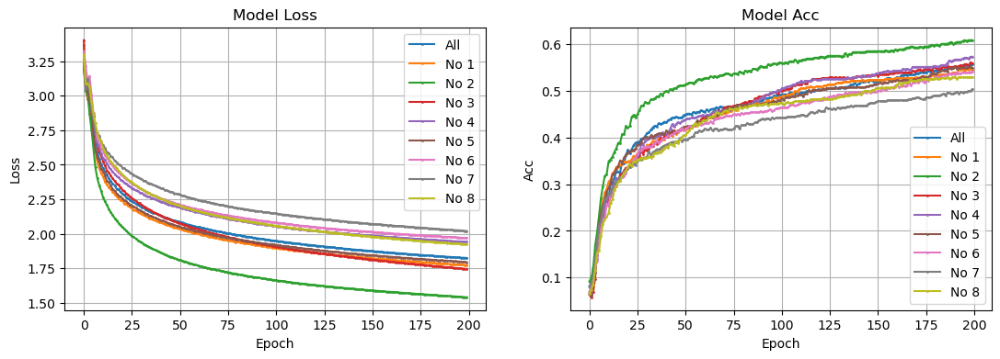

0    Val Accuracy small to large :  [7 8 6 1 5 0 3 4 2]
0    Val Loss     small to large :  [7 6 4 8 0 5 1 3 2] 




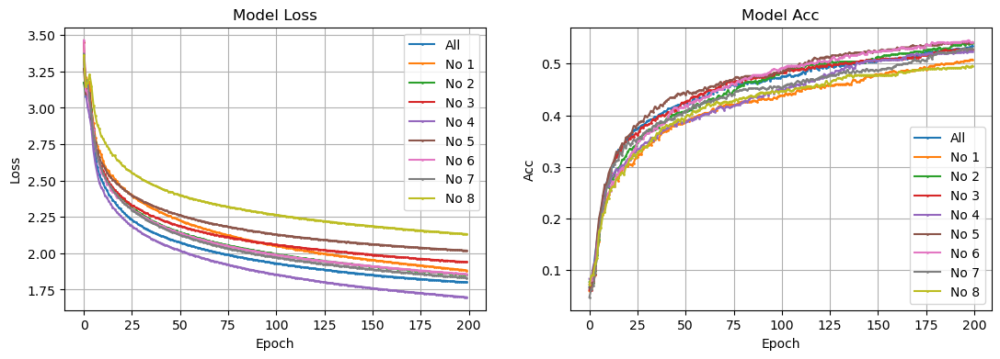

1    Val Accuracy small to large :  [8 1 4 3 7 0 2 5 6]
1    Val Loss     small to large :  [8 5 3 1 6 2 7 0 4] 




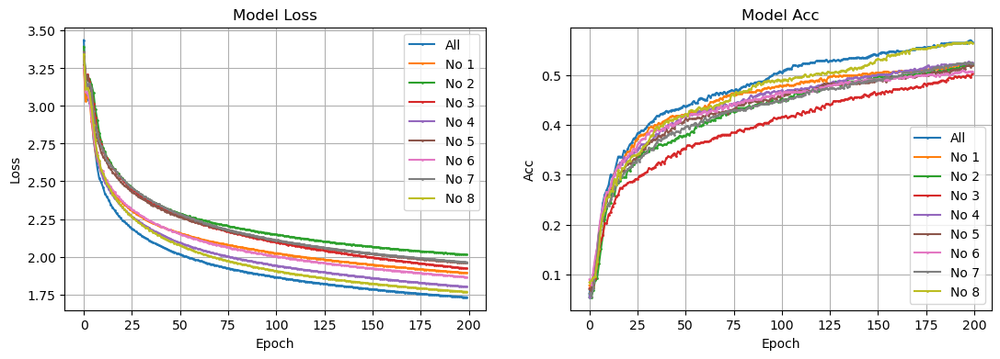

2    Val Accuracy small to large :  [3 6 1 5 2 7 4 8 0]
2    Val Loss     small to large :  [2 7 5 3 1 6 4 8 0] 




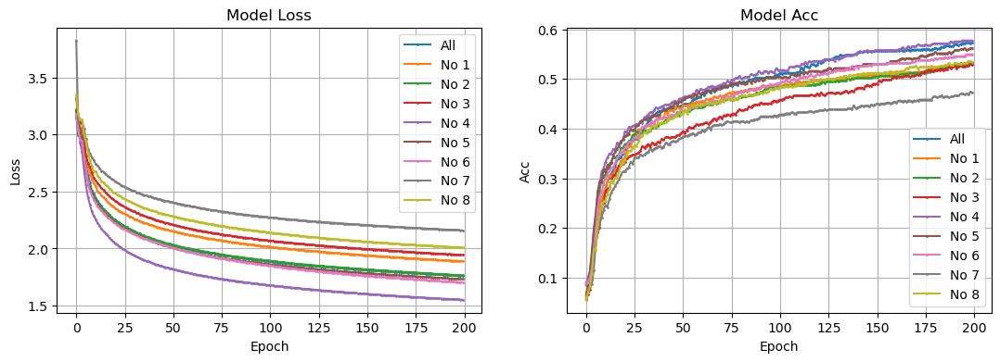

3    Val Accuracy small to large :  [7 3 1 2 8 6 5 0 4]
3    Val Loss     small to large :  [7 8 3 1 2 0 5 6 4] 




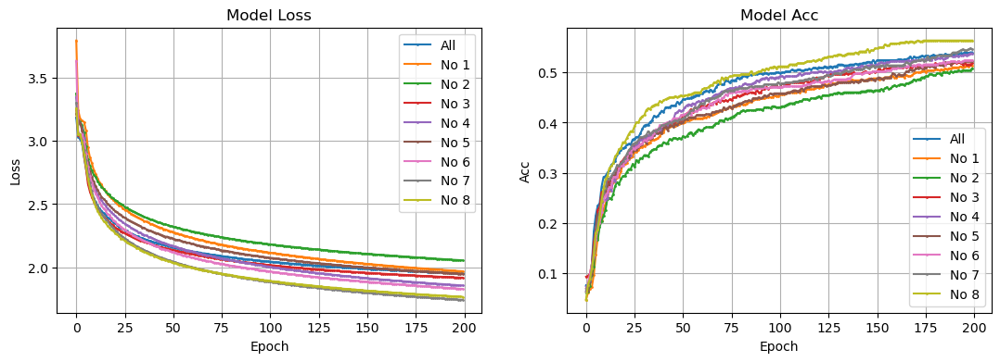

4    Val Accuracy small to large :  [2 1 3 5 6 4 0 7 8]
4    Val Loss     small to large :  [2 1 0 5 3 4 6 8 7] 




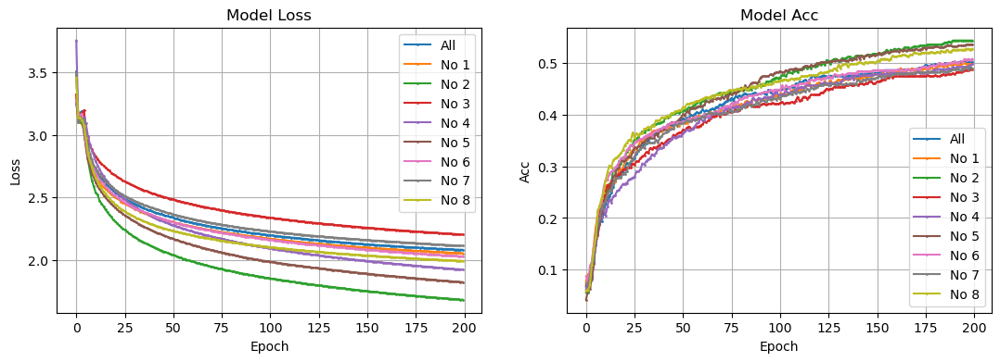

5    Val Accuracy small to large :  [3 7 4 1 0 6 8 5 2]
5    Val Loss     small to large :  [3 7 0 1 6 8 4 5 2] 




In [20]:
for subject in range(6):
    globals()['Sub{}_history'.format(subject)] = [globals()['history_all_S{}'.format(subject)]]

    for no_sensor in range(8):
        globals()['Sub{}_history'.format(subject)].append(globals()['history_no{}_S{}'.format(no_sensor, subject)])

    draw_all(globals()['Sub{}_history'.format(subject)])

    val_acc_lst, val_loss_lst = [], []

    for i in range(len(globals()['Sub{}_history'.format(subject)])):
        val_acc_lst.append(np.max(globals()['Sub{}_history'.format(subject)][i].history['val_acc']))
        val_loss_lst.append(np.min(globals()['Sub{}_history'.format(subject)][i].history['val_loss']))


    print(subject, "   Val Accuracy small to large : ", np.argsort(val_acc_lst))
    print(subject, "   Val Loss     small to large : ", np.argsort(val_loss_lst)[::-1], "\n\n" )

In [21]:
for subject in range(6):
    x_train, y_train, node_features, df = build_data(subject, [0,1,2,3,4,5,6,7])
    graph1, edges, edge_weights = graph_build(df)
    graph_info = (node_features, edges, edge_weights) # Create graph info tuple with node_features, edges, and edge_weights.

    print("Edges shape:", edges.shape, "    Nodes shape:", node_features.shape)

    loss_fn = keras.losses.SparseCategoricalCrossentropy(from_logits=True)
    optimizer = keras.optimizers.Adam(LEARNING_RATE)
    accuracy_fn = keras.metrics.SparseCategoricalAccuracy(name="acc")

    model = GraphAttentionNetwork(node_features, edges, HIDDEN_UNITS, NUM_HEADS, NUM_LAYERS, OUTPUT_DIM)
    model.compile(loss=loss_fn, optimizer=optimizer, metrics=[accuracy_fn])

    globals()['history_all_S{}'.format(subject)] = model.fit(x_train, y_train, validation_split=val_split, 
                                                             batch_size=BATCH_SIZE, epochs=NUM_EPOCHS, verbose=1)

    del model

Edges shape: (2880, 2)     Nodes shape: (2880, 200)
Epoch 1/200
18/18 [==============================] - 12s 136ms/step - loss: 4.1478 - acc: 0.0764 - val_loss: 3.2959 - val_acc: 0.0712
Epoch 2/200
18/18 [==============================] - 0s 25ms/step - loss: 2.3459 - acc: 0.2548 - val_loss: 3.0216 - val_acc: 0.1094
Epoch 3/200
18/18 [==============================] - 0s 21ms/step - loss: 1.6032 - acc: 0.5595 - val_loss: 3.0317 - val_acc: 0.1233
Epoch 4/200
18/18 [==============================] - 0s 22ms/step - loss: 0.9687 - acc: 0.8234 - val_loss: 2.9249 - val_acc: 0.1649
Epoch 5/200
18/18 [==============================] - 0s 18ms/step - loss: 0.4776 - acc: 0.9549 - val_loss: 2.8511 - val_acc: 0.1927
Epoch 6/200
18/18 [==============================] - 0s 27ms/step - loss: 0.2024 - acc: 0.9991 - val_loss: 2.7149 - val_acc: 0.2309
Epoch 7/200
18/18 [==============================] - 1s 38ms/step - loss: 0.0917 - acc: 1.0000 - val_loss: 2.5933 - val_acc: 0.2604
Epoch 8/200
18/18 [===

18/18 [==============================] - 1s 38ms/step - loss: 4.2424e-04 - acc: 1.0000 - val_loss: 1.9535 - val_acc: 0.4740
Epoch 62/200
18/18 [==============================] - 1s 38ms/step - loss: 4.0991e-04 - acc: 1.0000 - val_loss: 1.9483 - val_acc: 0.4774
Epoch 63/200
18/18 [==============================] - 1s 37ms/step - loss: 3.9663e-04 - acc: 1.0000 - val_loss: 1.9492 - val_acc: 0.4826
Epoch 64/200
18/18 [==============================] - 1s 37ms/step - loss: 3.8355e-04 - acc: 1.0000 - val_loss: 1.9425 - val_acc: 0.4861
Epoch 65/200
18/18 [==============================] - 1s 38ms/step - loss: 3.7091e-04 - acc: 1.0000 - val_loss: 1.9401 - val_acc: 0.4878
Epoch 66/200
18/18 [==============================] - 1s 39ms/step - loss: 3.5904e-04 - acc: 1.0000 - val_loss: 1.9385 - val_acc: 0.4826
Epoch 67/200
18/18 [==============================] - 1s 36ms/step - loss: 3.4772e-04 - acc: 1.0000 - val_loss: 1.9340 - val_acc: 0.4878
Epoch 68/200
18/18 [==============================] - 

Epoch 121/200
18/18 [==============================] - 1s 40ms/step - loss: 9.2860e-05 - acc: 1.0000 - val_loss: 1.8275 - val_acc: 0.5365
Epoch 122/200
18/18 [==============================] - 1s 39ms/step - loss: 9.1008e-05 - acc: 1.0000 - val_loss: 1.8244 - val_acc: 0.5347
Epoch 123/200
18/18 [==============================] - 1s 38ms/step - loss: 8.9322e-05 - acc: 1.0000 - val_loss: 1.8233 - val_acc: 0.5365
Epoch 124/200
18/18 [==============================] - 1s 41ms/step - loss: 8.7603e-05 - acc: 1.0000 - val_loss: 1.8225 - val_acc: 0.5365
Epoch 125/200
18/18 [==============================] - 1s 39ms/step - loss: 8.5921e-05 - acc: 1.0000 - val_loss: 1.8201 - val_acc: 0.5347
Epoch 126/200
18/18 [==============================] - 1s 39ms/step - loss: 8.4317e-05 - acc: 1.0000 - val_loss: 1.8182 - val_acc: 0.5347
Epoch 127/200
18/18 [==============================] - 1s 42ms/step - loss: 8.2880e-05 - acc: 1.0000 - val_loss: 1.8173 - val_acc: 0.5347
Epoch 128/200
18/18 [=============

18/18 [==============================] - 1s 38ms/step - loss: 3.4131e-05 - acc: 1.0000 - val_loss: 1.7580 - val_acc: 0.5590
Epoch 181/200
18/18 [==============================] - 1s 39ms/step - loss: 3.3620e-05 - acc: 1.0000 - val_loss: 1.7574 - val_acc: 0.5590
Epoch 182/200
18/18 [==============================] - 1s 37ms/step - loss: 3.3116e-05 - acc: 1.0000 - val_loss: 1.7572 - val_acc: 0.5590
Epoch 183/200
18/18 [==============================] - 1s 38ms/step - loss: 3.2619e-05 - acc: 1.0000 - val_loss: 1.7563 - val_acc: 0.5625
Epoch 184/200
18/18 [==============================] - 1s 37ms/step - loss: 3.2142e-05 - acc: 1.0000 - val_loss: 1.7550 - val_acc: 0.5608
Epoch 185/200
18/18 [==============================] - 1s 38ms/step - loss: 3.1665e-05 - acc: 1.0000 - val_loss: 1.7544 - val_acc: 0.5608
Epoch 186/200
18/18 [==============================] - 1s 38ms/step - loss: 3.1206e-05 - acc: 1.0000 - val_loss: 1.7529 - val_acc: 0.5608
Epoch 187/200
18/18 [===========================

18/18 [==============================] - 1s 38ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.1094 - val_acc: 0.4462
Epoch 41/200
18/18 [==============================] - 1s 39ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.1069 - val_acc: 0.4479
Epoch 42/200
18/18 [==============================] - 1s 39ms/step - loss: 0.0010 - acc: 1.0000 - val_loss: 2.0977 - val_acc: 0.4479
Epoch 43/200
18/18 [==============================] - 1s 41ms/step - loss: 9.7059e-04 - acc: 1.0000 - val_loss: 2.0926 - val_acc: 0.4566
Epoch 44/200
18/18 [==============================] - 1s 39ms/step - loss: 9.2479e-04 - acc: 1.0000 - val_loss: 2.0890 - val_acc: 0.4583
Epoch 45/200
18/18 [==============================] - 1s 40ms/step - loss: 8.8233e-04 - acc: 1.0000 - val_loss: 2.0849 - val_acc: 0.4566
Epoch 46/200
18/18 [==============================] - 1s 41ms/step - loss: 8.4196e-04 - acc: 1.0000 - val_loss: 2.0796 - val_acc: 0.4618
Epoch 47/200
18/18 [==============================] - 1s 38ms/step

Epoch 100/200
18/18 [==============================] - 1s 38ms/step - loss: 1.5596e-04 - acc: 1.0000 - val_loss: 1.9323 - val_acc: 0.5312
Epoch 101/200
18/18 [==============================] - 1s 38ms/step - loss: 1.5253e-04 - acc: 1.0000 - val_loss: 1.9318 - val_acc: 0.5330
Epoch 102/200
18/18 [==============================] - 1s 39ms/step - loss: 1.4913e-04 - acc: 1.0000 - val_loss: 1.9289 - val_acc: 0.5347
Epoch 103/200
18/18 [==============================] - 1s 38ms/step - loss: 1.4585e-04 - acc: 1.0000 - val_loss: 1.9277 - val_acc: 0.5365
Epoch 104/200
18/18 [==============================] - 1s 42ms/step - loss: 1.4253e-04 - acc: 1.0000 - val_loss: 1.9257 - val_acc: 0.5347
Epoch 105/200
18/18 [==============================] - 1s 39ms/step - loss: 1.3956e-04 - acc: 1.0000 - val_loss: 1.9246 - val_acc: 0.5347
Epoch 106/200
18/18 [==============================] - 1s 37ms/step - loss: 1.3654e-04 - acc: 1.0000 - val_loss: 1.9226 - val_acc: 0.5365
Epoch 107/200
18/18 [=============

18/18 [==============================] - 1s 37ms/step - loss: 5.1215e-05 - acc: 1.0000 - val_loss: 1.8595 - val_acc: 0.5642
Epoch 160/200
18/18 [==============================] - 1s 37ms/step - loss: 5.0404e-05 - acc: 1.0000 - val_loss: 1.8591 - val_acc: 0.5642
Epoch 161/200
18/18 [==============================] - 1s 38ms/step - loss: 4.9614e-05 - acc: 1.0000 - val_loss: 1.8587 - val_acc: 0.5677
Epoch 162/200
18/18 [==============================] - 1s 37ms/step - loss: 4.8823e-05 - acc: 1.0000 - val_loss: 1.8573 - val_acc: 0.5660
Epoch 163/200
18/18 [==============================] - 1s 39ms/step - loss: 4.8037e-05 - acc: 1.0000 - val_loss: 1.8565 - val_acc: 0.5694
Epoch 164/200
18/18 [==============================] - 1s 41ms/step - loss: 4.7277e-05 - acc: 1.0000 - val_loss: 1.8554 - val_acc: 0.5694
Epoch 165/200
18/18 [==============================] - 1s 40ms/step - loss: 4.6554e-05 - acc: 1.0000 - val_loss: 1.8554 - val_acc: 0.5694
Epoch 166/200
18/18 [===========================

Epoch 19/200
18/18 [==============================] - 0s 19ms/step - loss: 0.0050 - acc: 1.0000 - val_loss: 2.3188 - val_acc: 0.3438
Epoch 20/200
18/18 [==============================] - 0s 19ms/step - loss: 0.0045 - acc: 1.0000 - val_loss: 2.3087 - val_acc: 0.3455
Epoch 21/200
18/18 [==============================] - 0s 18ms/step - loss: 0.0040 - acc: 1.0000 - val_loss: 2.2911 - val_acc: 0.3507
Epoch 22/200
18/18 [==============================] - 0s 19ms/step - loss: 0.0037 - acc: 1.0000 - val_loss: 2.2843 - val_acc: 0.3524
Epoch 23/200
18/18 [==============================] - 0s 19ms/step - loss: 0.0033 - acc: 1.0000 - val_loss: 2.2687 - val_acc: 0.3594
Epoch 24/200
18/18 [==============================] - 0s 18ms/step - loss: 0.0030 - acc: 1.0000 - val_loss: 2.2590 - val_acc: 0.3576
Epoch 25/200
18/18 [==============================] - 0s 19ms/step - loss: 0.0028 - acc: 1.0000 - val_loss: 2.2475 - val_acc: 0.3646
Epoch 26/200
18/18 [==============================] - 0s 20ms/step - 

18/18 [==============================] - 1s 38ms/step - loss: 2.4216e-04 - acc: 1.0000 - val_loss: 1.9712 - val_acc: 0.4774
Epoch 80/200
18/18 [==============================] - 1s 39ms/step - loss: 2.3555e-04 - acc: 1.0000 - val_loss: 1.9690 - val_acc: 0.4792
Epoch 81/200
18/18 [==============================] - 1s 38ms/step - loss: 2.2939e-04 - acc: 1.0000 - val_loss: 1.9675 - val_acc: 0.4809
Epoch 82/200
18/18 [==============================] - 1s 38ms/step - loss: 2.2309e-04 - acc: 1.0000 - val_loss: 1.9639 - val_acc: 0.4826
Epoch 83/200
18/18 [==============================] - 1s 39ms/step - loss: 2.1727e-04 - acc: 1.0000 - val_loss: 1.9605 - val_acc: 0.4826
Epoch 84/200
18/18 [==============================] - 1s 37ms/step - loss: 2.1165e-04 - acc: 1.0000 - val_loss: 1.9585 - val_acc: 0.4826
Epoch 85/200
18/18 [==============================] - 1s 36ms/step - loss: 2.0626e-04 - acc: 1.0000 - val_loss: 1.9558 - val_acc: 0.4826
Epoch 86/200
18/18 [==============================] - 

18/18 [==============================] - 1s 38ms/step - loss: 6.7471e-05 - acc: 1.0000 - val_loss: 1.8516 - val_acc: 0.5226
Epoch 139/200
18/18 [==============================] - 1s 37ms/step - loss: 6.6330e-05 - acc: 1.0000 - val_loss: 1.8490 - val_acc: 0.5243
Epoch 140/200
18/18 [==============================] - 1s 37ms/step - loss: 6.5145e-05 - acc: 1.0000 - val_loss: 1.8473 - val_acc: 0.5226
Epoch 141/200
18/18 [==============================] - 1s 38ms/step - loss: 6.4032e-05 - acc: 1.0000 - val_loss: 1.8479 - val_acc: 0.5260
Epoch 142/200
18/18 [==============================] - 1s 37ms/step - loss: 6.2963e-05 - acc: 1.0000 - val_loss: 1.8444 - val_acc: 0.5260
Epoch 143/200
18/18 [==============================] - 1s 38ms/step - loss: 6.1870e-05 - acc: 1.0000 - val_loss: 1.8424 - val_acc: 0.5243
Epoch 144/200
18/18 [==============================] - 1s 37ms/step - loss: 6.0761e-05 - acc: 1.0000 - val_loss: 1.8436 - val_acc: 0.5278
Epoch 145/200
18/18 [===========================

18/18 [==============================] - 1s 41ms/step - loss: 2.6824e-05 - acc: 1.0000 - val_loss: 1.7796 - val_acc: 0.5503
Epoch 198/200
18/18 [==============================] - 1s 41ms/step - loss: 2.6455e-05 - acc: 1.0000 - val_loss: 1.7785 - val_acc: 0.5503
Epoch 199/200
18/18 [==============================] - 1s 38ms/step - loss: 2.6076e-05 - acc: 1.0000 - val_loss: 1.7777 - val_acc: 0.5503
Epoch 200/200
18/18 [==============================] - 1s 40ms/step - loss: 2.5719e-05 - acc: 1.0000 - val_loss: 1.7767 - val_acc: 0.5503
Edges shape: (2880, 2)     Nodes shape: (2880, 200)
Epoch 1/200
18/18 [==============================] - 12s 140ms/step - loss: 4.4006 - acc: 0.0655 - val_loss: 3.3258 - val_acc: 0.0660
Epoch 2/200
18/18 [==============================] - 0s 24ms/step - loss: 2.4057 - acc: 0.2344 - val_loss: 3.0875 - val_acc: 0.0747
Epoch 3/200
18/18 [==============================] - 0s 20ms/step - loss: 1.7077 - acc: 0.5321 - val_loss: 3.0931 - val_acc: 0.0799
Epoch 4/200


Epoch 58/200
18/18 [==============================] - 1s 37ms/step - loss: 5.2150e-04 - acc: 1.0000 - val_loss: 2.0899 - val_acc: 0.4653
Epoch 59/200
18/18 [==============================] - 1s 38ms/step - loss: 5.0309e-04 - acc: 1.0000 - val_loss: 2.0868 - val_acc: 0.4722
Epoch 60/200
18/18 [==============================] - 1s 39ms/step - loss: 4.8548e-04 - acc: 1.0000 - val_loss: 2.0834 - val_acc: 0.4722
Epoch 61/200
18/18 [==============================] - 1s 40ms/step - loss: 4.6858e-04 - acc: 1.0000 - val_loss: 2.0790 - val_acc: 0.4740
Epoch 62/200
18/18 [==============================] - 1s 38ms/step - loss: 4.5290e-04 - acc: 1.0000 - val_loss: 2.0765 - val_acc: 0.4740
Epoch 63/200
18/18 [==============================] - 1s 39ms/step - loss: 4.3766e-04 - acc: 1.0000 - val_loss: 2.0732 - val_acc: 0.4757
Epoch 64/200
18/18 [==============================] - 1s 38ms/step - loss: 4.2295e-04 - acc: 1.0000 - val_loss: 2.0695 - val_acc: 0.4757
Epoch 65/200
18/18 [=====================

18/18 [==============================] - 1s 41ms/step - loss: 1.1078e-04 - acc: 1.0000 - val_loss: 1.9507 - val_acc: 0.5226
Epoch 118/200
18/18 [==============================] - 1s 39ms/step - loss: 1.0863e-04 - acc: 1.0000 - val_loss: 1.9491 - val_acc: 0.5226
Epoch 119/200
18/18 [==============================] - 1s 38ms/step - loss: 1.0648e-04 - acc: 1.0000 - val_loss: 1.9486 - val_acc: 0.5243
Epoch 120/200
18/18 [==============================] - 1s 38ms/step - loss: 1.0430e-04 - acc: 1.0000 - val_loss: 1.9469 - val_acc: 0.5260
Epoch 121/200
18/18 [==============================] - 1s 38ms/step - loss: 1.0234e-04 - acc: 1.0000 - val_loss: 1.9455 - val_acc: 0.5243
Epoch 122/200
18/18 [==============================] - 1s 38ms/step - loss: 1.0036e-04 - acc: 1.0000 - val_loss: 1.9439 - val_acc: 0.5243
Epoch 123/200
18/18 [==============================] - 1s 37ms/step - loss: 9.8406e-05 - acc: 1.0000 - val_loss: 1.9419 - val_acc: 0.5260
Epoch 124/200
18/18 [===========================

18/18 [==============================] - 1s 39ms/step - loss: 4.0154e-05 - acc: 1.0000 - val_loss: 1.8762 - val_acc: 0.5486
Epoch 177/200
18/18 [==============================] - 1s 40ms/step - loss: 3.9548e-05 - acc: 1.0000 - val_loss: 1.8756 - val_acc: 0.5486
Epoch 178/200
18/18 [==============================] - 1s 39ms/step - loss: 3.8955e-05 - acc: 1.0000 - val_loss: 1.8750 - val_acc: 0.5521
Epoch 179/200
18/18 [==============================] - 1s 39ms/step - loss: 3.8372e-05 - acc: 1.0000 - val_loss: 1.8733 - val_acc: 0.5521
Epoch 180/200
18/18 [==============================] - 1s 39ms/step - loss: 3.7821e-05 - acc: 1.0000 - val_loss: 1.8726 - val_acc: 0.5521
Epoch 181/200
18/18 [==============================] - 1s 39ms/step - loss: 3.7238e-05 - acc: 1.0000 - val_loss: 1.8717 - val_acc: 0.5521
Epoch 182/200
18/18 [==============================] - 1s 39ms/step - loss: 3.6693e-05 - acc: 1.0000 - val_loss: 1.8699 - val_acc: 0.5538
Epoch 183/200
18/18 [===========================

18/18 [==============================] - 0s 19ms/step - loss: 0.0015 - acc: 1.0000 - val_loss: 2.1793 - val_acc: 0.4149
Epoch 37/200
18/18 [==============================] - 0s 19ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 2.1727 - val_acc: 0.4184
Epoch 38/200
18/18 [==============================] - 0s 21ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 2.1679 - val_acc: 0.4184
Epoch 39/200
18/18 [==============================] - 0s 17ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 2.1584 - val_acc: 0.4184
Epoch 40/200
18/18 [==============================] - 0s 19ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.1551 - val_acc: 0.4201
Epoch 41/200
18/18 [==============================] - 0s 21ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.1493 - val_acc: 0.4201
Epoch 42/200
18/18 [==============================] - 0s 18ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.1425 - val_acc: 0.4219
Epoch 43/200
18/18 [==============================] - 0s 19ms/step - loss: 0.0010 

18/18 [==============================] - 0s 20ms/step - loss: 1.8022e-04 - acc: 1.0000 - val_loss: 1.9531 - val_acc: 0.5000
Epoch 97/200
18/18 [==============================] - 0s 21ms/step - loss: 1.7617e-04 - acc: 1.0000 - val_loss: 1.9508 - val_acc: 0.4965
Epoch 98/200
18/18 [==============================] - 0s 19ms/step - loss: 1.7198e-04 - acc: 1.0000 - val_loss: 1.9492 - val_acc: 0.5000
Epoch 99/200
18/18 [==============================] - 0s 19ms/step - loss: 1.6810e-04 - acc: 1.0000 - val_loss: 1.9470 - val_acc: 0.5000
Epoch 100/200
18/18 [==============================] - 0s 20ms/step - loss: 1.6416e-04 - acc: 1.0000 - val_loss: 1.9446 - val_acc: 0.5035
Epoch 101/200
18/18 [==============================] - 0s 21ms/step - loss: 1.6043e-04 - acc: 1.0000 - val_loss: 1.9425 - val_acc: 0.5000
Epoch 102/200
18/18 [==============================] - 0s 19ms/step - loss: 1.5697e-04 - acc: 1.0000 - val_loss: 1.9413 - val_acc: 0.5052
Epoch 103/200
18/18 [==============================

18/18 [==============================] - 0s 18ms/step - loss: 5.7384e-05 - acc: 1.0000 - val_loss: 1.8547 - val_acc: 0.5469
Epoch 156/200
18/18 [==============================] - 0s 21ms/step - loss: 5.6445e-05 - acc: 1.0000 - val_loss: 1.8517 - val_acc: 0.5451
Epoch 157/200
18/18 [==============================] - 0s 20ms/step - loss: 5.5520e-05 - acc: 1.0000 - val_loss: 1.8517 - val_acc: 0.5451
Epoch 158/200
18/18 [==============================] - 0s 21ms/step - loss: 5.4655e-05 - acc: 1.0000 - val_loss: 1.8509 - val_acc: 0.5486
Epoch 159/200
18/18 [==============================] - 0s 19ms/step - loss: 5.3761e-05 - acc: 1.0000 - val_loss: 1.8486 - val_acc: 0.5469
Epoch 160/200
18/18 [==============================] - 0s 19ms/step - loss: 5.2931e-05 - acc: 1.0000 - val_loss: 1.8479 - val_acc: 0.5469
Epoch 161/200
18/18 [==============================] - 0s 19ms/step - loss: 5.2074e-05 - acc: 1.0000 - val_loss: 1.8464 - val_acc: 0.5486
Epoch 162/200
18/18 [===========================

18/18 [==============================] - 0s 21ms/step - loss: 0.0101 - acc: 1.0000 - val_loss: 2.5563 - val_acc: 0.2674
Epoch 15/200
18/18 [==============================] - 0s 20ms/step - loss: 0.0086 - acc: 1.0000 - val_loss: 2.5427 - val_acc: 0.2604
Epoch 16/200
18/18 [==============================] - 0s 20ms/step - loss: 0.0075 - acc: 1.0000 - val_loss: 2.5234 - val_acc: 0.2743
Epoch 17/200
18/18 [==============================] - 0s 21ms/step - loss: 0.0066 - acc: 1.0000 - val_loss: 2.4989 - val_acc: 0.2812
Epoch 18/200
18/18 [==============================] - 0s 20ms/step - loss: 0.0058 - acc: 1.0000 - val_loss: 2.4859 - val_acc: 0.2865
Epoch 19/200
18/18 [==============================] - 0s 19ms/step - loss: 0.0051 - acc: 1.0000 - val_loss: 2.4723 - val_acc: 0.2934
Epoch 20/200
18/18 [==============================] - 0s 19ms/step - loss: 0.0046 - acc: 1.0000 - val_loss: 2.4561 - val_acc: 0.3003
Epoch 21/200
18/18 [==============================] - 0s 19ms/step - loss: 0.0042 

Epoch 75/200
18/18 [==============================] - 0s 20ms/step - loss: 2.8952e-04 - acc: 1.0000 - val_loss: 2.1593 - val_acc: 0.4340
Epoch 76/200
18/18 [==============================] - 0s 20ms/step - loss: 2.8100e-04 - acc: 1.0000 - val_loss: 2.1582 - val_acc: 0.4358
Epoch 77/200
18/18 [==============================] - 0s 18ms/step - loss: 2.7335e-04 - acc: 1.0000 - val_loss: 2.1537 - val_acc: 0.4358
Epoch 78/200
18/18 [==============================] - 0s 21ms/step - loss: 2.6577e-04 - acc: 1.0000 - val_loss: 2.1530 - val_acc: 0.4410
Epoch 79/200
18/18 [==============================] - 0s 21ms/step - loss: 2.5857e-04 - acc: 1.0000 - val_loss: 2.1499 - val_acc: 0.4392
Epoch 80/200
18/18 [==============================] - 0s 20ms/step - loss: 2.5156e-04 - acc: 1.0000 - val_loss: 2.1484 - val_acc: 0.4444
Epoch 81/200
18/18 [==============================] - 0s 20ms/step - loss: 2.4492e-04 - acc: 1.0000 - val_loss: 2.1453 - val_acc: 0.4427
Epoch 82/200
18/18 [=====================

18/18 [==============================] - 1s 37ms/step - loss: 7.7362e-05 - acc: 1.0000 - val_loss: 2.0524 - val_acc: 0.4861
Epoch 135/200
18/18 [==============================] - 1s 38ms/step - loss: 7.5948e-05 - acc: 1.0000 - val_loss: 2.0506 - val_acc: 0.4878
Epoch 136/200
18/18 [==============================] - 1s 39ms/step - loss: 7.4638e-05 - acc: 1.0000 - val_loss: 2.0491 - val_acc: 0.4861
Epoch 137/200
18/18 [==============================] - 1s 39ms/step - loss: 7.3260e-05 - acc: 1.0000 - val_loss: 2.0473 - val_acc: 0.4878
Epoch 138/200
18/18 [==============================] - 1s 37ms/step - loss: 7.1993e-05 - acc: 1.0000 - val_loss: 2.0464 - val_acc: 0.4896
Epoch 139/200
18/18 [==============================] - 1s 38ms/step - loss: 7.0697e-05 - acc: 1.0000 - val_loss: 2.0449 - val_acc: 0.4896
Epoch 140/200
18/18 [==============================] - 1s 37ms/step - loss: 6.9529e-05 - acc: 1.0000 - val_loss: 2.0429 - val_acc: 0.4878
Epoch 141/200
18/18 [===========================

18/18 [==============================] - 1s 38ms/step - loss: 3.0172e-05 - acc: 1.0000 - val_loss: 1.9874 - val_acc: 0.5139
Epoch 194/200
18/18 [==============================] - 1s 38ms/step - loss: 2.9734e-05 - acc: 1.0000 - val_loss: 1.9863 - val_acc: 0.5174
Epoch 195/200
18/18 [==============================] - 1s 37ms/step - loss: 2.9314e-05 - acc: 1.0000 - val_loss: 1.9852 - val_acc: 0.5174
Epoch 196/200
18/18 [==============================] - 1s 38ms/step - loss: 2.8900e-05 - acc: 1.0000 - val_loss: 1.9848 - val_acc: 0.5174
Epoch 197/200
18/18 [==============================] - 1s 37ms/step - loss: 2.8482e-05 - acc: 1.0000 - val_loss: 1.9840 - val_acc: 0.5174
Epoch 198/200
18/18 [==============================] - 1s 39ms/step - loss: 2.8095e-05 - acc: 1.0000 - val_loss: 1.9829 - val_acc: 0.5191
Epoch 199/200
18/18 [==============================] - 1s 37ms/step - loss: 2.7694e-05 - acc: 1.0000 - val_loss: 1.9813 - val_acc: 0.5156
Epoch 200/200
18/18 [===========================

In [22]:
for subject in range(6):
    for no_sensor in range(8):
        lst_sensor = []
        for i in range(8): 
            if i == no_sensor: pass
            else: lst_sensor.append(i)
        print(subject, "  Sensor List: ", lst_sensor)

        x_train, y_train, node_features, df = build_data(subject, lst_sensor)
        graph1, edges, edge_weights = graph_build(df)
        graph_info = (node_features, edges, edge_weights) # Create graph info tuple with node_features, edges, and edge_weights.

        print(no_sensor, "   Edges shape:", edges.shape, "    Nodes shape:", node_features.shape)

        loss_fn = keras.losses.SparseCategoricalCrossentropy(from_logits=True)
        optimizer = keras.optimizers.Adam(LEARNING_RATE)
        accuracy_fn = keras.metrics.SparseCategoricalAccuracy(name="acc")

        model = GraphAttentionNetwork(node_features, edges, HIDDEN_UNITS, NUM_HEADS, NUM_LAYERS, OUTPUT_DIM)

        model.compile(loss=loss_fn, optimizer=optimizer, metrics=[accuracy_fn])

        globals()['history_no{}_S{}'.format(no_sensor, subject)] = model.fit(x_train, y_train, validation_split=val_split, 
                                                                batch_size=BATCH_SIZE, epochs=NUM_EPOCHS, verbose=1)

        del model

0   Sensor List:  [1, 2, 3, 4, 5, 6, 7]
0    Edges shape: (2520, 2)     Nodes shape: (2520, 200)
Epoch 1/200
16/16 [==============================] - 12s 155ms/step - loss: 4.4753 - acc: 0.0759 - val_loss: 3.5107 - val_acc: 0.0694
Epoch 2/200
16/16 [==============================] - 0s 25ms/step - loss: 2.4222 - acc: 0.2535 - val_loss: 3.0753 - val_acc: 0.0893
Epoch 3/200
16/16 [==============================] - 0s 21ms/step - loss: 1.7048 - acc: 0.5243 - val_loss: 3.0065 - val_acc: 0.1111
Epoch 4/200
16/16 [==============================] - 0s 20ms/step - loss: 1.0651 - acc: 0.7877 - val_loss: 2.9670 - val_acc: 0.1369
Epoch 5/200
16/16 [==============================] - 0s 20ms/step - loss: 0.5814 - acc: 0.9291 - val_loss: 2.8755 - val_acc: 0.1746
Epoch 6/200
16/16 [==============================] - 0s 20ms/step - loss: 0.2627 - acc: 0.9950 - val_loss: 2.7076 - val_acc: 0.2123
Epoch 7/200
16/16 [==============================] - 0s 20ms/step - loss: 0.1162 - acc: 1.0000 - val_loss: 2.

16/16 [==============================] - 1s 43ms/step - loss: 5.0384e-04 - acc: 1.0000 - val_loss: 1.9591 - val_acc: 0.4841
Epoch 62/200
16/16 [==============================] - 1s 39ms/step - loss: 4.8591e-04 - acc: 1.0000 - val_loss: 1.9546 - val_acc: 0.4802
Epoch 63/200
16/16 [==============================] - 1s 43ms/step - loss: 4.6890e-04 - acc: 1.0000 - val_loss: 1.9524 - val_acc: 0.4901
Epoch 64/200
16/16 [==============================] - 1s 41ms/step - loss: 4.5278e-04 - acc: 1.0000 - val_loss: 1.9504 - val_acc: 0.4861
Epoch 65/200
16/16 [==============================] - 1s 36ms/step - loss: 4.3794e-04 - acc: 1.0000 - val_loss: 1.9442 - val_acc: 0.4901
Epoch 66/200
16/16 [==============================] - 1s 44ms/step - loss: 4.2310e-04 - acc: 1.0000 - val_loss: 1.9426 - val_acc: 0.4921
Epoch 67/200
16/16 [==============================] - 1s 40ms/step - loss: 4.0843e-04 - acc: 1.0000 - val_loss: 1.9386 - val_acc: 0.4940
Epoch 68/200
16/16 [==============================] - 

Epoch 121/200
16/16 [==============================] - 1s 39ms/step - loss: 1.0961e-04 - acc: 1.0000 - val_loss: 1.8139 - val_acc: 0.5357
Epoch 122/200
16/16 [==============================] - 1s 41ms/step - loss: 1.0761e-04 - acc: 1.0000 - val_loss: 1.8122 - val_acc: 0.5397
Epoch 123/200
16/16 [==============================] - 1s 40ms/step - loss: 1.0565e-04 - acc: 1.0000 - val_loss: 1.8104 - val_acc: 0.5377
Epoch 124/200
16/16 [==============================] - 1s 39ms/step - loss: 1.0365e-04 - acc: 1.0000 - val_loss: 1.8095 - val_acc: 0.5397
Epoch 125/200
16/16 [==============================] - 1s 42ms/step - loss: 1.0181e-04 - acc: 1.0000 - val_loss: 1.8070 - val_acc: 0.5397
Epoch 126/200
16/16 [==============================] - 1s 40ms/step - loss: 9.9870e-05 - acc: 1.0000 - val_loss: 1.8069 - val_acc: 0.5417
Epoch 127/200
16/16 [==============================] - 1s 38ms/step - loss: 9.8081e-05 - acc: 1.0000 - val_loss: 1.8045 - val_acc: 0.5437
Epoch 128/200
16/16 [=============

16/16 [==============================] - 1s 41ms/step - loss: 4.2025e-05 - acc: 1.0000 - val_loss: 1.7366 - val_acc: 0.5516
Epoch 181/200
16/16 [==============================] - 1s 39ms/step - loss: 4.1434e-05 - acc: 1.0000 - val_loss: 1.7353 - val_acc: 0.5516
Epoch 182/200
16/16 [==============================] - 1s 39ms/step - loss: 4.0851e-05 - acc: 1.0000 - val_loss: 1.7345 - val_acc: 0.5496
Epoch 183/200
16/16 [==============================] - 1s 39ms/step - loss: 4.0260e-05 - acc: 1.0000 - val_loss: 1.7334 - val_acc: 0.5516
Epoch 184/200
16/16 [==============================] - 1s 41ms/step - loss: 3.9704e-05 - acc: 1.0000 - val_loss: 1.7327 - val_acc: 0.5496
Epoch 185/200
16/16 [==============================] - 1s 38ms/step - loss: 3.9149e-05 - acc: 1.0000 - val_loss: 1.7314 - val_acc: 0.5536
Epoch 186/200
16/16 [==============================] - 1s 38ms/step - loss: 3.8604e-05 - acc: 1.0000 - val_loss: 1.7308 - val_acc: 0.5556
Epoch 187/200
16/16 [===========================

16/16 [==============================] - 0s 19ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.2303 - val_acc: 0.3968
Epoch 41/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.2260 - val_acc: 0.3988
Epoch 42/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.2215 - val_acc: 0.4028
Epoch 43/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0010 - acc: 1.0000 - val_loss: 2.2168 - val_acc: 0.4048
Epoch 44/200
16/16 [==============================] - 0s 21ms/step - loss: 9.7122e-04 - acc: 1.0000 - val_loss: 2.2106 - val_acc: 0.4087
Epoch 45/200
16/16 [==============================] - 0s 19ms/step - loss: 9.2631e-04 - acc: 1.0000 - val_loss: 2.2061 - val_acc: 0.4087
Epoch 46/200
16/16 [==============================] - 0s 20ms/step - loss: 8.8578e-04 - acc: 1.0000 - val_loss: 2.2015 - val_acc: 0.4167
Epoch 47/200
16/16 [==============================] - 0s 18ms/step - l

16/16 [==============================] - 0s 19ms/step - loss: 1.7357e-04 - acc: 1.0000 - val_loss: 2.0489 - val_acc: 0.4960
Epoch 101/200
16/16 [==============================] - 0s 19ms/step - loss: 1.6983e-04 - acc: 1.0000 - val_loss: 2.0465 - val_acc: 0.4960
Epoch 102/200
16/16 [==============================] - 0s 19ms/step - loss: 1.6623e-04 - acc: 1.0000 - val_loss: 2.0465 - val_acc: 0.4980
Epoch 103/200
16/16 [==============================] - 0s 21ms/step - loss: 1.6263e-04 - acc: 1.0000 - val_loss: 2.0442 - val_acc: 0.4960
Epoch 104/200
16/16 [==============================] - 0s 20ms/step - loss: 1.5925e-04 - acc: 1.0000 - val_loss: 2.0428 - val_acc: 0.4980
Epoch 105/200
16/16 [==============================] - 0s 19ms/step - loss: 1.5594e-04 - acc: 1.0000 - val_loss: 2.0404 - val_acc: 0.4980
Epoch 106/200
16/16 [==============================] - 0s 19ms/step - loss: 1.5267e-04 - acc: 1.0000 - val_loss: 2.0384 - val_acc: 0.5000
Epoch 107/200
16/16 [===========================

16/16 [==============================] - 0s 21ms/step - loss: 5.9467e-05 - acc: 1.0000 - val_loss: 1.9649 - val_acc: 0.5298
Epoch 160/200
16/16 [==============================] - 0s 18ms/step - loss: 5.8558e-05 - acc: 1.0000 - val_loss: 1.9638 - val_acc: 0.5298
Epoch 161/200
16/16 [==============================] - 0s 20ms/step - loss: 5.7673e-05 - acc: 1.0000 - val_loss: 1.9616 - val_acc: 0.5298
Epoch 162/200
16/16 [==============================] - 0s 19ms/step - loss: 5.6782e-05 - acc: 1.0000 - val_loss: 1.9616 - val_acc: 0.5317
Epoch 163/200
16/16 [==============================] - 0s 20ms/step - loss: 5.5931e-05 - acc: 1.0000 - val_loss: 1.9599 - val_acc: 0.5298
Epoch 164/200
16/16 [==============================] - 0s 20ms/step - loss: 5.5113e-05 - acc: 1.0000 - val_loss: 1.9594 - val_acc: 0.5317
Epoch 165/200
16/16 [==============================] - 0s 21ms/step - loss: 5.4264e-05 - acc: 1.0000 - val_loss: 1.9584 - val_acc: 0.5317
Epoch 166/200
16/16 [===========================

16/16 [==============================] - 0s 19ms/step - loss: 0.0067 - acc: 1.0000 - val_loss: 2.4879 - val_acc: 0.3135
Epoch 19/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0060 - acc: 1.0000 - val_loss: 2.4791 - val_acc: 0.3095
Epoch 20/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0053 - acc: 1.0000 - val_loss: 2.4590 - val_acc: 0.3214
Epoch 21/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0048 - acc: 1.0000 - val_loss: 2.4507 - val_acc: 0.3274
Epoch 22/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0044 - acc: 1.0000 - val_loss: 2.4337 - val_acc: 0.3234
Epoch 23/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0040 - acc: 1.0000 - val_loss: 2.4235 - val_acc: 0.3254
Epoch 24/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0036 - acc: 1.0000 - val_loss: 2.4097 - val_acc: 0.3294
Epoch 25/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0033 

16/16 [==============================] - 0s 19ms/step - loss: 3.1436e-04 - acc: 1.0000 - val_loss: 2.1191 - val_acc: 0.4365
Epoch 79/200
16/16 [==============================] - 0s 23ms/step - loss: 3.0580e-04 - acc: 1.0000 - val_loss: 2.1168 - val_acc: 0.4405
Epoch 80/200
16/16 [==============================] - 0s 20ms/step - loss: 2.9777e-04 - acc: 1.0000 - val_loss: 2.1140 - val_acc: 0.4444
Epoch 81/200
16/16 [==============================] - 0s 20ms/step - loss: 2.8969e-04 - acc: 1.0000 - val_loss: 2.1101 - val_acc: 0.4425
Epoch 82/200
16/16 [==============================] - 0s 20ms/step - loss: 2.8246e-04 - acc: 1.0000 - val_loss: 2.1076 - val_acc: 0.4464
Epoch 83/200
16/16 [==============================] - 0s 20ms/step - loss: 2.7526e-04 - acc: 1.0000 - val_loss: 2.1049 - val_acc: 0.4464
Epoch 84/200
16/16 [==============================] - 0s 19ms/step - loss: 2.6833e-04 - acc: 1.0000 - val_loss: 2.1030 - val_acc: 0.4464
Epoch 85/200
16/16 [==============================] - 

16/16 [==============================] - 0s 20ms/step - loss: 8.9668e-05 - acc: 1.0000 - val_loss: 2.0014 - val_acc: 0.4841
Epoch 138/200
16/16 [==============================] - 0s 19ms/step - loss: 8.8101e-05 - acc: 1.0000 - val_loss: 1.9999 - val_acc: 0.4821
Epoch 139/200
16/16 [==============================] - 0s 20ms/step - loss: 8.6630e-05 - acc: 1.0000 - val_loss: 1.9992 - val_acc: 0.4841
Epoch 140/200
16/16 [==============================] - 0s 18ms/step - loss: 8.5209e-05 - acc: 1.0000 - val_loss: 1.9990 - val_acc: 0.4841
Epoch 141/200
16/16 [==============================] - 0s 19ms/step - loss: 8.3760e-05 - acc: 1.0000 - val_loss: 1.9956 - val_acc: 0.4861
Epoch 142/200
16/16 [==============================] - 0s 19ms/step - loss: 8.2353e-05 - acc: 1.0000 - val_loss: 1.9950 - val_acc: 0.4861
Epoch 143/200
16/16 [==============================] - 0s 19ms/step - loss: 8.1032e-05 - acc: 1.0000 - val_loss: 1.9946 - val_acc: 0.4881
Epoch 144/200
16/16 [===========================

16/16 [==============================] - 0s 19ms/step - loss: 3.6672e-05 - acc: 1.0000 - val_loss: 1.9310 - val_acc: 0.5159
Epoch 197/200
16/16 [==============================] - 0s 19ms/step - loss: 3.6174e-05 - acc: 1.0000 - val_loss: 1.9302 - val_acc: 0.5159
Epoch 198/200
16/16 [==============================] - 0s 19ms/step - loss: 3.5699e-05 - acc: 1.0000 - val_loss: 1.9299 - val_acc: 0.5139
Epoch 199/200
16/16 [==============================] - 0s 20ms/step - loss: 3.5226e-05 - acc: 1.0000 - val_loss: 1.9282 - val_acc: 0.5159
Epoch 200/200
16/16 [==============================] - 0s 20ms/step - loss: 3.4742e-05 - acc: 1.0000 - val_loss: 1.9257 - val_acc: 0.5159
0   Sensor List:  [0, 1, 2, 4, 5, 6, 7]
3    Edges shape: (2520, 2)     Nodes shape: (2520, 200)
Epoch 1/200
16/16 [==============================] - 12s 163ms/step - loss: 4.5124 - acc: 0.0709 - val_loss: 3.4118 - val_acc: 0.0675
Epoch 2/200
16/16 [==============================] - 0s 29ms/step - loss: 2.4525 - acc: 0.230

16/16 [==============================] - 1s 41ms/step - loss: 6.1541e-04 - acc: 1.0000 - val_loss: 2.0977 - val_acc: 0.4583
Epoch 57/200
16/16 [==============================] - 1s 40ms/step - loss: 5.9217e-04 - acc: 1.0000 - val_loss: 2.0957 - val_acc: 0.4544
Epoch 58/200
16/16 [==============================] - 1s 40ms/step - loss: 5.7101e-04 - acc: 1.0000 - val_loss: 2.0906 - val_acc: 0.4504
Epoch 59/200
16/16 [==============================] - 1s 38ms/step - loss: 5.5099e-04 - acc: 1.0000 - val_loss: 2.0866 - val_acc: 0.4583
Epoch 60/200
16/16 [==============================] - 1s 40ms/step - loss: 5.3142e-04 - acc: 1.0000 - val_loss: 2.0833 - val_acc: 0.4603
Epoch 61/200
16/16 [==============================] - 1s 40ms/step - loss: 5.1296e-04 - acc: 1.0000 - val_loss: 2.0782 - val_acc: 0.4583
Epoch 62/200
16/16 [==============================] - 1s 38ms/step - loss: 4.9536e-04 - acc: 1.0000 - val_loss: 2.0743 - val_acc: 0.4643
Epoch 63/200
16/16 [==============================] - 

Epoch 116/200
16/16 [==============================] - 1s 38ms/step - loss: 1.2604e-04 - acc: 1.0000 - val_loss: 1.9400 - val_acc: 0.4940
Epoch 117/200
16/16 [==============================] - 1s 39ms/step - loss: 1.2350e-04 - acc: 1.0000 - val_loss: 1.9399 - val_acc: 0.4940
Epoch 118/200
16/16 [==============================] - 1s 38ms/step - loss: 1.2119e-04 - acc: 1.0000 - val_loss: 1.9369 - val_acc: 0.4940
Epoch 119/200
16/16 [==============================] - 1s 40ms/step - loss: 1.1879e-04 - acc: 1.0000 - val_loss: 1.9365 - val_acc: 0.4940
Epoch 120/200
16/16 [==============================] - 1s 43ms/step - loss: 1.1657e-04 - acc: 1.0000 - val_loss: 1.9348 - val_acc: 0.4940
Epoch 121/200
16/16 [==============================] - 1s 41ms/step - loss: 1.1438e-04 - acc: 1.0000 - val_loss: 1.9314 - val_acc: 0.4940
Epoch 122/200
16/16 [==============================] - 1s 40ms/step - loss: 1.1218e-04 - acc: 1.0000 - val_loss: 1.9298 - val_acc: 0.4940
Epoch 123/200
16/16 [=============

16/16 [==============================] - 1s 41ms/step - loss: 4.6871e-05 - acc: 1.0000 - val_loss: 1.8563 - val_acc: 0.5298
Epoch 176/200
16/16 [==============================] - 1s 43ms/step - loss: 4.6192e-05 - acc: 1.0000 - val_loss: 1.8547 - val_acc: 0.5298
Epoch 177/200
16/16 [==============================] - 1s 40ms/step - loss: 4.5545e-05 - acc: 1.0000 - val_loss: 1.8531 - val_acc: 0.5298
Epoch 178/200
16/16 [==============================] - 1s 40ms/step - loss: 4.4884e-05 - acc: 1.0000 - val_loss: 1.8524 - val_acc: 0.5298
Epoch 179/200
16/16 [==============================] - 1s 38ms/step - loss: 4.4250e-05 - acc: 1.0000 - val_loss: 1.8516 - val_acc: 0.5317
Epoch 180/200
16/16 [==============================] - 1s 41ms/step - loss: 4.3610e-05 - acc: 1.0000 - val_loss: 1.8496 - val_acc: 0.5317
Epoch 181/200
16/16 [==============================] - 1s 42ms/step - loss: 4.2989e-05 - acc: 1.0000 - val_loss: 1.8494 - val_acc: 0.5317
Epoch 182/200
16/16 [===========================

16/16 [==============================] - 0s 21ms/step - loss: 0.0016 - acc: 1.0000 - val_loss: 1.9788 - val_acc: 0.4643
Epoch 36/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0015 - acc: 1.0000 - val_loss: 1.9720 - val_acc: 0.4762
Epoch 37/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 1.9629 - val_acc: 0.4782
Epoch 38/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 1.9583 - val_acc: 0.4802
Epoch 39/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 1.9508 - val_acc: 0.4901
Epoch 40/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 1.9461 - val_acc: 0.4921
Epoch 41/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 1.9382 - val_acc: 0.4940
Epoch 42/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0011 

16/16 [==============================] - 0s 21ms/step - loss: 1.9301e-04 - acc: 1.0000 - val_loss: 1.7515 - val_acc: 0.5635
Epoch 96/200
16/16 [==============================] - 0s 20ms/step - loss: 1.8881e-04 - acc: 1.0000 - val_loss: 1.7482 - val_acc: 0.5635
Epoch 97/200
16/16 [==============================] - 0s 21ms/step - loss: 1.8436e-04 - acc: 1.0000 - val_loss: 1.7473 - val_acc: 0.5635
Epoch 98/200
16/16 [==============================] - 0s 20ms/step - loss: 1.8021e-04 - acc: 1.0000 - val_loss: 1.7450 - val_acc: 0.5635
Epoch 99/200
16/16 [==============================] - 0s 19ms/step - loss: 1.7629e-04 - acc: 1.0000 - val_loss: 1.7425 - val_acc: 0.5635
Epoch 100/200
16/16 [==============================] - 0s 19ms/step - loss: 1.7231e-04 - acc: 1.0000 - val_loss: 1.7417 - val_acc: 0.5655
Epoch 101/200
16/16 [==============================] - 0s 20ms/step - loss: 1.6856e-04 - acc: 1.0000 - val_loss: 1.7385 - val_acc: 0.5635
Epoch 102/200
16/16 [==============================]

16/16 [==============================] - 0s 21ms/step - loss: 6.3211e-05 - acc: 1.0000 - val_loss: 1.6598 - val_acc: 0.5972
Epoch 155/200
16/16 [==============================] - 0s 18ms/step - loss: 6.2222e-05 - acc: 1.0000 - val_loss: 1.6581 - val_acc: 0.5972
Epoch 156/200
16/16 [==============================] - 0s 18ms/step - loss: 6.1233e-05 - acc: 1.0000 - val_loss: 1.6575 - val_acc: 0.5992
Epoch 157/200
16/16 [==============================] - 0s 19ms/step - loss: 6.0299e-05 - acc: 1.0000 - val_loss: 1.6557 - val_acc: 0.5992
Epoch 158/200
16/16 [==============================] - 0s 20ms/step - loss: 5.9320e-05 - acc: 1.0000 - val_loss: 1.6547 - val_acc: 0.5992
Epoch 159/200
16/16 [==============================] - 0s 20ms/step - loss: 5.8432e-05 - acc: 1.0000 - val_loss: 1.6540 - val_acc: 0.5992
Epoch 160/200
16/16 [==============================] - 0s 20ms/step - loss: 5.7529e-05 - acc: 1.0000 - val_loss: 1.6522 - val_acc: 0.5992
Epoch 161/200
16/16 [===========================

16/16 [==============================] - 0s 21ms/step - loss: 0.0111 - acc: 1.0000 - val_loss: 2.5241 - val_acc: 0.2897
Epoch 14/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0094 - acc: 1.0000 - val_loss: 2.5043 - val_acc: 0.2857
Epoch 15/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0082 - acc: 1.0000 - val_loss: 2.4881 - val_acc: 0.2956
Epoch 16/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0072 - acc: 1.0000 - val_loss: 2.4738 - val_acc: 0.3036
Epoch 17/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0063 - acc: 1.0000 - val_loss: 2.4548 - val_acc: 0.3075
Epoch 18/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0056 - acc: 1.0000 - val_loss: 2.4454 - val_acc: 0.3075
Epoch 19/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0051 - acc: 1.0000 - val_loss: 2.4257 - val_acc: 0.3194
Epoch 20/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0045 

Epoch 74/200
16/16 [==============================] - 1s 41ms/step - loss: 3.1378e-04 - acc: 1.0000 - val_loss: 2.1044 - val_acc: 0.4425
Epoch 75/200
16/16 [==============================] - 1s 39ms/step - loss: 3.0529e-04 - acc: 1.0000 - val_loss: 2.1016 - val_acc: 0.4425
Epoch 76/200
16/16 [==============================] - 1s 37ms/step - loss: 2.9644e-04 - acc: 1.0000 - val_loss: 2.0971 - val_acc: 0.4444
Epoch 77/200
16/16 [==============================] - 1s 39ms/step - loss: 2.8819e-04 - acc: 1.0000 - val_loss: 2.0961 - val_acc: 0.4444
Epoch 78/200
16/16 [==============================] - 1s 39ms/step - loss: 2.8056e-04 - acc: 1.0000 - val_loss: 2.0937 - val_acc: 0.4484
Epoch 79/200
16/16 [==============================] - 1s 40ms/step - loss: 2.7276e-04 - acc: 1.0000 - val_loss: 2.0887 - val_acc: 0.4464
Epoch 80/200
16/16 [==============================] - 1s 40ms/step - loss: 2.6537e-04 - acc: 1.0000 - val_loss: 2.0865 - val_acc: 0.4464
Epoch 81/200
16/16 [=====================

16/16 [==============================] - 1s 41ms/step - loss: 8.5090e-05 - acc: 1.0000 - val_loss: 1.9884 - val_acc: 0.4940
Epoch 134/200
16/16 [==============================] - 1s 45ms/step - loss: 8.3572e-05 - acc: 1.0000 - val_loss: 1.9873 - val_acc: 0.4921
Epoch 135/200
16/16 [==============================] - 1s 39ms/step - loss: 8.2177e-05 - acc: 1.0000 - val_loss: 1.9865 - val_acc: 0.4960
Epoch 136/200
16/16 [==============================] - 1s 40ms/step - loss: 8.0695e-05 - acc: 1.0000 - val_loss: 1.9840 - val_acc: 0.4980
Epoch 137/200
16/16 [==============================] - 1s 40ms/step - loss: 7.9327e-05 - acc: 1.0000 - val_loss: 1.9818 - val_acc: 0.4980
Epoch 138/200
16/16 [==============================] - 1s 38ms/step - loss: 7.8017e-05 - acc: 1.0000 - val_loss: 1.9801 - val_acc: 0.4980
Epoch 139/200
16/16 [==============================] - 1s 41ms/step - loss: 7.6694e-05 - acc: 1.0000 - val_loss: 1.9802 - val_acc: 0.4980
Epoch 140/200
16/16 [===========================

16/16 [==============================] - 1s 40ms/step - loss: 3.4233e-05 - acc: 1.0000 - val_loss: 1.9212 - val_acc: 0.5119
Epoch 193/200
16/16 [==============================] - 1s 39ms/step - loss: 3.3768e-05 - acc: 1.0000 - val_loss: 1.9200 - val_acc: 0.5119
Epoch 194/200
16/16 [==============================] - 1s 41ms/step - loss: 3.3332e-05 - acc: 1.0000 - val_loss: 1.9207 - val_acc: 0.5119
Epoch 195/200
16/16 [==============================] - 1s 39ms/step - loss: 3.2878e-05 - acc: 1.0000 - val_loss: 1.9177 - val_acc: 0.5119
Epoch 196/200
16/16 [==============================] - 1s 41ms/step - loss: 3.2435e-05 - acc: 1.0000 - val_loss: 1.9167 - val_acc: 0.5119
Epoch 197/200
16/16 [==============================] - 1s 39ms/step - loss: 3.1991e-05 - acc: 1.0000 - val_loss: 1.9169 - val_acc: 0.5119
Epoch 198/200
16/16 [==============================] - 1s 38ms/step - loss: 3.1565e-05 - acc: 1.0000 - val_loss: 1.9149 - val_acc: 0.5119
Epoch 199/200
16/16 [===========================

16/16 [==============================] - 1s 39ms/step - loss: 6.8166e-04 - acc: 1.0000 - val_loss: 2.2808 - val_acc: 0.4008
Epoch 53/200
16/16 [==============================] - 1s 38ms/step - loss: 6.5567e-04 - acc: 1.0000 - val_loss: 2.2761 - val_acc: 0.4048
Epoch 54/200
16/16 [==============================] - 1s 41ms/step - loss: 6.3004e-04 - acc: 1.0000 - val_loss: 2.2737 - val_acc: 0.4048
Epoch 55/200
16/16 [==============================] - 1s 41ms/step - loss: 6.0636e-04 - acc: 1.0000 - val_loss: 2.2678 - val_acc: 0.4067
Epoch 56/200
16/16 [==============================] - 1s 39ms/step - loss: 5.8424e-04 - acc: 1.0000 - val_loss: 2.2632 - val_acc: 0.4067
Epoch 57/200
16/16 [==============================] - 1s 41ms/step - loss: 5.6285e-04 - acc: 1.0000 - val_loss: 2.2597 - val_acc: 0.4067
Epoch 58/200
16/16 [==============================] - 1s 39ms/step - loss: 5.4351e-04 - acc: 1.0000 - val_loss: 2.2540 - val_acc: 0.4087
Epoch 59/200
16/16 [==============================] - 

Epoch 112/200
16/16 [==============================] - 1s 41ms/step - loss: 1.3173e-04 - acc: 1.0000 - val_loss: 2.1143 - val_acc: 0.4782
Epoch 113/200
16/16 [==============================] - 1s 39ms/step - loss: 1.2913e-04 - acc: 1.0000 - val_loss: 2.1122 - val_acc: 0.4762
Epoch 114/200
16/16 [==============================] - 1s 40ms/step - loss: 1.2660e-04 - acc: 1.0000 - val_loss: 2.1092 - val_acc: 0.4802
Epoch 115/200
16/16 [==============================] - 1s 39ms/step - loss: 1.2417e-04 - acc: 1.0000 - val_loss: 2.1086 - val_acc: 0.4802
Epoch 116/200
16/16 [==============================] - 1s 39ms/step - loss: 1.2172e-04 - acc: 1.0000 - val_loss: 2.1069 - val_acc: 0.4802
Epoch 117/200
16/16 [==============================] - 1s 41ms/step - loss: 1.1937e-04 - acc: 1.0000 - val_loss: 2.1068 - val_acc: 0.4821
Epoch 118/200
16/16 [==============================] - 1s 42ms/step - loss: 1.1705e-04 - acc: 1.0000 - val_loss: 2.1034 - val_acc: 0.4802
Epoch 119/200
16/16 [=============

16/16 [==============================] - 1s 40ms/step - loss: 4.8130e-05 - acc: 1.0000 - val_loss: 2.0359 - val_acc: 0.5179
Epoch 172/200
16/16 [==============================] - 1s 41ms/step - loss: 4.7436e-05 - acc: 1.0000 - val_loss: 2.0355 - val_acc: 0.5198
Epoch 173/200
16/16 [==============================] - 1s 40ms/step - loss: 4.6724e-05 - acc: 1.0000 - val_loss: 2.0347 - val_acc: 0.5198
Epoch 174/200
16/16 [==============================] - 1s 38ms/step - loss: 4.6058e-05 - acc: 1.0000 - val_loss: 2.0330 - val_acc: 0.5198
Epoch 175/200
16/16 [==============================] - 1s 39ms/step - loss: 4.5379e-05 - acc: 1.0000 - val_loss: 2.0325 - val_acc: 0.5218
Epoch 176/200
16/16 [==============================] - 1s 44ms/step - loss: 4.4718e-05 - acc: 1.0000 - val_loss: 2.0310 - val_acc: 0.5198
Epoch 177/200
16/16 [==============================] - 1s 40ms/step - loss: 4.4068e-05 - acc: 1.0000 - val_loss: 2.0293 - val_acc: 0.5238
Epoch 178/200
16/16 [===========================

Epoch 31/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0017 - acc: 1.0000 - val_loss: 2.2918 - val_acc: 0.3790
Epoch 32/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0016 - acc: 1.0000 - val_loss: 2.2802 - val_acc: 0.3849
Epoch 33/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0015 - acc: 1.0000 - val_loss: 2.2782 - val_acc: 0.3849
Epoch 34/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 2.2706 - val_acc: 0.3869
Epoch 35/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 2.2673 - val_acc: 0.3948
Epoch 36/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 2.2603 - val_acc: 0.3988
Epoch 37/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.2553 - val_acc: 0.4028
Epoch 38/200
16/16 [==============================] - 0s 19ms/step - 

16/16 [==============================] - 0s 21ms/step - loss: 1.8841e-04 - acc: 1.0000 - val_loss: 2.0974 - val_acc: 0.4683
Epoch 92/200
16/16 [==============================] - 0s 18ms/step - loss: 1.8397e-04 - acc: 1.0000 - val_loss: 2.0969 - val_acc: 0.4702
Epoch 93/200
16/16 [==============================] - 0s 19ms/step - loss: 1.7976e-04 - acc: 1.0000 - val_loss: 2.0938 - val_acc: 0.4683
Epoch 94/200
16/16 [==============================] - 0s 19ms/step - loss: 1.7561e-04 - acc: 1.0000 - val_loss: 2.0925 - val_acc: 0.4702
Epoch 95/200
16/16 [==============================] - 0s 18ms/step - loss: 1.7160e-04 - acc: 1.0000 - val_loss: 2.0913 - val_acc: 0.4742
Epoch 96/200
16/16 [==============================] - 0s 20ms/step - loss: 1.6774e-04 - acc: 1.0000 - val_loss: 2.0899 - val_acc: 0.4702
Epoch 97/200
16/16 [==============================] - 0s 18ms/step - loss: 1.6400e-04 - acc: 1.0000 - val_loss: 2.0884 - val_acc: 0.4722
Epoch 98/200
16/16 [==============================] - 

16/16 [==============================] - 0s 20ms/step - loss: 6.0715e-05 - acc: 1.0000 - val_loss: 2.0312 - val_acc: 0.5099
Epoch 151/200
16/16 [==============================] - 0s 19ms/step - loss: 5.9773e-05 - acc: 1.0000 - val_loss: 2.0304 - val_acc: 0.5139
Epoch 152/200
16/16 [==============================] - 0s 20ms/step - loss: 5.8784e-05 - acc: 1.0000 - val_loss: 2.0299 - val_acc: 0.5119
Epoch 153/200
16/16 [==============================] - 0s 20ms/step - loss: 5.7852e-05 - acc: 1.0000 - val_loss: 2.0289 - val_acc: 0.5119
Epoch 154/200
16/16 [==============================] - 0s 19ms/step - loss: 5.6965e-05 - acc: 1.0000 - val_loss: 2.0279 - val_acc: 0.5099
Epoch 155/200
16/16 [==============================] - 0s 20ms/step - loss: 5.6088e-05 - acc: 1.0000 - val_loss: 2.0274 - val_acc: 0.5119
Epoch 156/200
16/16 [==============================] - 0s 20ms/step - loss: 5.5199e-05 - acc: 1.0000 - val_loss: 2.0262 - val_acc: 0.5119
Epoch 157/200
16/16 [===========================

16/16 [==============================] - 0s 18ms/step - loss: 0.0353 - acc: 1.0000 - val_loss: 2.5350 - val_acc: 0.2560
Epoch 10/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0251 - acc: 1.0000 - val_loss: 2.4776 - val_acc: 0.2480
Epoch 11/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0191 - acc: 1.0000 - val_loss: 2.4326 - val_acc: 0.2817
Epoch 12/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0154 - acc: 1.0000 - val_loss: 2.4145 - val_acc: 0.2837
Epoch 13/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0127 - acc: 1.0000 - val_loss: 2.3761 - val_acc: 0.2976
Epoch 14/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0106 - acc: 1.0000 - val_loss: 2.3548 - val_acc: 0.2996
Epoch 15/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0090 - acc: 1.0000 - val_loss: 2.3290 - val_acc: 0.3194
Epoch 16/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0078 

Epoch 70/200
16/16 [==============================] - 0s 20ms/step - loss: 3.4454e-04 - acc: 1.0000 - val_loss: 1.8859 - val_acc: 0.4643
Epoch 71/200
16/16 [==============================] - 0s 18ms/step - loss: 3.3462e-04 - acc: 1.0000 - val_loss: 1.8817 - val_acc: 0.4702
Epoch 72/200
16/16 [==============================] - 0s 18ms/step - loss: 3.2463e-04 - acc: 1.0000 - val_loss: 1.8791 - val_acc: 0.4702
Epoch 73/200
16/16 [==============================] - 0s 19ms/step - loss: 3.1542e-04 - acc: 1.0000 - val_loss: 1.8754 - val_acc: 0.4742
Epoch 74/200
16/16 [==============================] - 0s 18ms/step - loss: 3.0647e-04 - acc: 1.0000 - val_loss: 1.8714 - val_acc: 0.4722
Epoch 75/200
16/16 [==============================] - 0s 19ms/step - loss: 2.9776e-04 - acc: 1.0000 - val_loss: 1.8695 - val_acc: 0.4722
Epoch 76/200
16/16 [==============================] - 0s 18ms/step - loss: 2.8966e-04 - acc: 1.0000 - val_loss: 1.8653 - val_acc: 0.4742
Epoch 77/200
16/16 [=====================

16/16 [==============================] - 1s 42ms/step - loss: 9.0100e-05 - acc: 1.0000 - val_loss: 1.7388 - val_acc: 0.5357
Epoch 130/200
16/16 [==============================] - 1s 42ms/step - loss: 8.8508e-05 - acc: 1.0000 - val_loss: 1.7370 - val_acc: 0.5397
Epoch 131/200
16/16 [==============================] - 1s 40ms/step - loss: 8.7005e-05 - acc: 1.0000 - val_loss: 1.7350 - val_acc: 0.5377
Epoch 132/200
16/16 [==============================] - 1s 39ms/step - loss: 8.5501e-05 - acc: 1.0000 - val_loss: 1.7328 - val_acc: 0.5337
Epoch 133/200
16/16 [==============================] - 1s 40ms/step - loss: 8.3991e-05 - acc: 1.0000 - val_loss: 1.7327 - val_acc: 0.5397
Epoch 134/200
16/16 [==============================] - 1s 40ms/step - loss: 8.2480e-05 - acc: 1.0000 - val_loss: 1.7299 - val_acc: 0.5397
Epoch 135/200
16/16 [==============================] - 1s 38ms/step - loss: 8.1145e-05 - acc: 1.0000 - val_loss: 1.7267 - val_acc: 0.5377
Epoch 136/200
16/16 [===========================

16/16 [==============================] - 1s 41ms/step - loss: 3.5996e-05 - acc: 1.0000 - val_loss: 1.6543 - val_acc: 0.5714
Epoch 189/200
16/16 [==============================] - 1s 39ms/step - loss: 3.5495e-05 - acc: 1.0000 - val_loss: 1.6525 - val_acc: 0.5694
Epoch 190/200
16/16 [==============================] - 1s 40ms/step - loss: 3.5020e-05 - acc: 1.0000 - val_loss: 1.6505 - val_acc: 0.5734
Epoch 191/200
16/16 [==============================] - 1s 41ms/step - loss: 3.4540e-05 - acc: 1.0000 - val_loss: 1.6500 - val_acc: 0.5734
Epoch 192/200
16/16 [==============================] - 1s 48ms/step - loss: 3.4067e-05 - acc: 1.0000 - val_loss: 1.6490 - val_acc: 0.5714
Epoch 193/200
16/16 [==============================] - 1s 43ms/step - loss: 3.3621e-05 - acc: 1.0000 - val_loss: 1.6477 - val_acc: 0.5694
Epoch 194/200
16/16 [==============================] - 1s 40ms/step - loss: 3.3172e-05 - acc: 1.0000 - val_loss: 1.6461 - val_acc: 0.5734
Epoch 195/200
16/16 [===========================

16/16 [==============================] - 0s 19ms/step - loss: 7.4619e-04 - acc: 1.0000 - val_loss: 2.3168 - val_acc: 0.4167
Epoch 49/200
16/16 [==============================] - 0s 20ms/step - loss: 7.1604e-04 - acc: 1.0000 - val_loss: 2.3125 - val_acc: 0.4167
Epoch 50/200
16/16 [==============================] - 0s 20ms/step - loss: 6.8682e-04 - acc: 1.0000 - val_loss: 2.3083 - val_acc: 0.4246
Epoch 51/200
16/16 [==============================] - 0s 19ms/step - loss: 6.6044e-04 - acc: 1.0000 - val_loss: 2.3063 - val_acc: 0.4266
Epoch 52/200
16/16 [==============================] - 0s 19ms/step - loss: 6.3438e-04 - acc: 1.0000 - val_loss: 2.3015 - val_acc: 0.4246
Epoch 53/200
16/16 [==============================] - 0s 20ms/step - loss: 6.0910e-04 - acc: 1.0000 - val_loss: 2.2962 - val_acc: 0.4306
Epoch 54/200
16/16 [==============================] - 0s 19ms/step - loss: 5.8685e-04 - acc: 1.0000 - val_loss: 2.2944 - val_acc: 0.4325
Epoch 55/200
16/16 [==============================] - 

Epoch 108/200
16/16 [==============================] - 1s 43ms/step - loss: 1.3421e-04 - acc: 1.0000 - val_loss: 2.1777 - val_acc: 0.4722
Epoch 109/200
16/16 [==============================] - 1s 40ms/step - loss: 1.3150e-04 - acc: 1.0000 - val_loss: 2.1789 - val_acc: 0.4762
Epoch 110/200
16/16 [==============================] - 1s 43ms/step - loss: 1.2878e-04 - acc: 1.0000 - val_loss: 2.1757 - val_acc: 0.4802
Epoch 111/200
16/16 [==============================] - 1s 38ms/step - loss: 1.2628e-04 - acc: 1.0000 - val_loss: 2.1726 - val_acc: 0.4802
Epoch 112/200
16/16 [==============================] - 1s 41ms/step - loss: 1.2373e-04 - acc: 1.0000 - val_loss: 2.1733 - val_acc: 0.4762
Epoch 113/200
16/16 [==============================] - 1s 40ms/step - loss: 1.2134e-04 - acc: 1.0000 - val_loss: 2.1707 - val_acc: 0.4841
Epoch 114/200
16/16 [==============================] - 1s 41ms/step - loss: 1.1890e-04 - acc: 1.0000 - val_loss: 2.1695 - val_acc: 0.4821
Epoch 115/200
16/16 [=============

16/16 [==============================] - 1s 40ms/step - loss: 4.8587e-05 - acc: 1.0000 - val_loss: 2.1128 - val_acc: 0.5119
Epoch 168/200
16/16 [==============================] - 1s 40ms/step - loss: 4.7842e-05 - acc: 1.0000 - val_loss: 2.1124 - val_acc: 0.5119
Epoch 169/200
16/16 [==============================] - 1s 40ms/step - loss: 4.7147e-05 - acc: 1.0000 - val_loss: 2.1108 - val_acc: 0.5139
Epoch 170/200
16/16 [==============================] - 1s 40ms/step - loss: 4.6464e-05 - acc: 1.0000 - val_loss: 2.1092 - val_acc: 0.5119
Epoch 171/200
16/16 [==============================] - 1s 37ms/step - loss: 4.5794e-05 - acc: 1.0000 - val_loss: 2.1070 - val_acc: 0.5159
Epoch 172/200
16/16 [==============================] - 1s 38ms/step - loss: 4.5117e-05 - acc: 1.0000 - val_loss: 2.1084 - val_acc: 0.5159
Epoch 173/200
16/16 [==============================] - 1s 41ms/step - loss: 4.4473e-05 - acc: 1.0000 - val_loss: 2.1079 - val_acc: 0.5159
Epoch 174/200
16/16 [===========================

Epoch 27/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0028 - acc: 1.0000 - val_loss: 2.2093 - val_acc: 0.3651
Epoch 28/200
16/16 [==============================] - 0s 17ms/step - loss: 0.0026 - acc: 1.0000 - val_loss: 2.1963 - val_acc: 0.3651
Epoch 29/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0024 - acc: 1.0000 - val_loss: 2.1883 - val_acc: 0.3671
Epoch 30/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0022 - acc: 1.0000 - val_loss: 2.1735 - val_acc: 0.3750
Epoch 31/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0021 - acc: 1.0000 - val_loss: 2.1643 - val_acc: 0.3869
Epoch 32/200
16/16 [==============================] - 0s 18ms/step - loss: 0.0020 - acc: 1.0000 - val_loss: 2.1553 - val_acc: 0.3988
Epoch 33/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0018 - acc: 1.0000 - val_loss: 2.1462 - val_acc: 0.4008
Epoch 34/200
16/16 [==============================] - 0s 20ms/step - 

16/16 [==============================] - 0s 20ms/step - loss: 2.4123e-04 - acc: 1.0000 - val_loss: 1.8704 - val_acc: 0.4921
Epoch 88/200
16/16 [==============================] - 0s 18ms/step - loss: 2.3514e-04 - acc: 1.0000 - val_loss: 1.8676 - val_acc: 0.4921
Epoch 89/200
16/16 [==============================] - 0s 19ms/step - loss: 2.2948e-04 - acc: 1.0000 - val_loss: 1.8633 - val_acc: 0.4921
Epoch 90/200
16/16 [==============================] - 0s 21ms/step - loss: 2.2399e-04 - acc: 1.0000 - val_loss: 1.8598 - val_acc: 0.4940
Epoch 91/200
16/16 [==============================] - 0s 19ms/step - loss: 2.1851e-04 - acc: 1.0000 - val_loss: 1.8568 - val_acc: 0.4940
Epoch 92/200
16/16 [==============================] - 0s 21ms/step - loss: 2.1321e-04 - acc: 1.0000 - val_loss: 1.8534 - val_acc: 0.4940
Epoch 93/200
16/16 [==============================] - 0s 21ms/step - loss: 2.0829e-04 - acc: 1.0000 - val_loss: 1.8510 - val_acc: 0.5000
Epoch 94/200
16/16 [==============================] - 

16/16 [==============================] - 1s 40ms/step - loss: 7.3430e-05 - acc: 1.0000 - val_loss: 1.7112 - val_acc: 0.5218
Epoch 147/200
16/16 [==============================] - 1s 41ms/step - loss: 7.2246e-05 - acc: 1.0000 - val_loss: 1.7092 - val_acc: 0.5238
Epoch 148/200
16/16 [==============================] - 1s 37ms/step - loss: 7.1051e-05 - acc: 1.0000 - val_loss: 1.7067 - val_acc: 0.5218
Epoch 149/200
16/16 [==============================] - 1s 41ms/step - loss: 6.9874e-05 - acc: 1.0000 - val_loss: 1.7054 - val_acc: 0.5238
Epoch 150/200
16/16 [==============================] - 1s 40ms/step - loss: 6.8765e-05 - acc: 1.0000 - val_loss: 1.7030 - val_acc: 0.5238
Epoch 151/200
16/16 [==============================] - 1s 39ms/step - loss: 6.7637e-05 - acc: 1.0000 - val_loss: 1.7007 - val_acc: 0.5258
Epoch 152/200
16/16 [==============================] - 1s 38ms/step - loss: 6.6540e-05 - acc: 1.0000 - val_loss: 1.6985 - val_acc: 0.5258
Epoch 153/200
16/16 [===========================

Epoch 5/200
16/16 [==============================] - 0s 19ms/step - loss: 0.7487 - acc: 0.9018 - val_loss: 3.0441 - val_acc: 0.1032
Epoch 6/200
16/16 [==============================] - 0s 20ms/step - loss: 0.3751 - acc: 0.9886 - val_loss: 2.9219 - val_acc: 0.1310
Epoch 7/200
16/16 [==============================] - 0s 20ms/step - loss: 0.1764 - acc: 0.9995 - val_loss: 2.8044 - val_acc: 0.1468
Epoch 8/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0890 - acc: 1.0000 - val_loss: 2.7069 - val_acc: 0.1944
Epoch 9/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0542 - acc: 1.0000 - val_loss: 2.6312 - val_acc: 0.2302
Epoch 10/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0354 - acc: 1.0000 - val_loss: 2.5642 - val_acc: 0.2421
Epoch 11/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0262 - acc: 1.0000 - val_loss: 2.5075 - val_acc: 0.2679
Epoch 12/200
16/16 [==============================] - 0s 22ms/step - loss:

16/16 [==============================] - 0s 20ms/step - loss: 4.7079e-04 - acc: 1.0000 - val_loss: 1.8610 - val_acc: 0.4782
Epoch 67/200
16/16 [==============================] - 0s 21ms/step - loss: 4.5595e-04 - acc: 1.0000 - val_loss: 1.8545 - val_acc: 0.4802
Epoch 68/200
16/16 [==============================] - 0s 21ms/step - loss: 4.4168e-04 - acc: 1.0000 - val_loss: 1.8511 - val_acc: 0.4841
Epoch 69/200
16/16 [==============================] - 0s 21ms/step - loss: 4.2771e-04 - acc: 1.0000 - val_loss: 1.8472 - val_acc: 0.4881
Epoch 70/200
16/16 [==============================] - 0s 20ms/step - loss: 4.1488e-04 - acc: 1.0000 - val_loss: 1.8433 - val_acc: 0.4921
Epoch 71/200
16/16 [==============================] - 0s 21ms/step - loss: 4.0224e-04 - acc: 1.0000 - val_loss: 1.8393 - val_acc: 0.4940
Epoch 72/200
16/16 [==============================] - 0s 21ms/step - loss: 3.9059e-04 - acc: 1.0000 - val_loss: 1.8355 - val_acc: 0.4921
Epoch 73/200
16/16 [==============================] - 

Epoch 126/200
16/16 [==============================] - 0s 21ms/step - loss: 1.1198e-04 - acc: 1.0000 - val_loss: 1.6874 - val_acc: 0.5516
Epoch 127/200
16/16 [==============================] - 0s 19ms/step - loss: 1.0997e-04 - acc: 1.0000 - val_loss: 1.6843 - val_acc: 0.5556
Epoch 128/200
16/16 [==============================] - 0s 18ms/step - loss: 1.0798e-04 - acc: 1.0000 - val_loss: 1.6838 - val_acc: 0.5575
Epoch 129/200
16/16 [==============================] - 0s 20ms/step - loss: 1.0599e-04 - acc: 1.0000 - val_loss: 1.6810 - val_acc: 0.5595
Epoch 130/200
16/16 [==============================] - 0s 20ms/step - loss: 1.0403e-04 - acc: 1.0000 - val_loss: 1.6795 - val_acc: 0.5575
Epoch 131/200
16/16 [==============================] - 0s 19ms/step - loss: 1.0214e-04 - acc: 1.0000 - val_loss: 1.6780 - val_acc: 0.5575
Epoch 132/200
16/16 [==============================] - 0s 21ms/step - loss: 1.0034e-04 - acc: 1.0000 - val_loss: 1.6759 - val_acc: 0.5635
Epoch 133/200
16/16 [=============

16/16 [==============================] - 0s 20ms/step - loss: 4.3353e-05 - acc: 1.0000 - val_loss: 1.5966 - val_acc: 0.5893
Epoch 186/200
16/16 [==============================] - 0s 20ms/step - loss: 4.2758e-05 - acc: 1.0000 - val_loss: 1.5952 - val_acc: 0.5913
Epoch 187/200
16/16 [==============================] - 0s 19ms/step - loss: 4.2136e-05 - acc: 1.0000 - val_loss: 1.5937 - val_acc: 0.5873
Epoch 188/200
16/16 [==============================] - 0s 18ms/step - loss: 4.1560e-05 - acc: 1.0000 - val_loss: 1.5927 - val_acc: 0.5893
Epoch 189/200
16/16 [==============================] - 0s 20ms/step - loss: 4.1008e-05 - acc: 1.0000 - val_loss: 1.5907 - val_acc: 0.5933
Epoch 190/200
16/16 [==============================] - 0s 19ms/step - loss: 4.0421e-05 - acc: 1.0000 - val_loss: 1.5899 - val_acc: 0.5913
Epoch 191/200
16/16 [==============================] - 0s 19ms/step - loss: 3.9877e-05 - acc: 1.0000 - val_loss: 1.5894 - val_acc: 0.5913
Epoch 192/200
16/16 [===========================

16/16 [==============================] - 1s 42ms/step - loss: 9.5847e-04 - acc: 1.0000 - val_loss: 2.1478 - val_acc: 0.4286
Epoch 46/200
16/16 [==============================] - 1s 39ms/step - loss: 9.1567e-04 - acc: 1.0000 - val_loss: 2.1405 - val_acc: 0.4325
Epoch 47/200
16/16 [==============================] - 1s 41ms/step - loss: 8.7670e-04 - acc: 1.0000 - val_loss: 2.1361 - val_acc: 0.4325
Epoch 48/200
16/16 [==============================] - 1s 39ms/step - loss: 8.3907e-04 - acc: 1.0000 - val_loss: 2.1293 - val_acc: 0.4365
Epoch 49/200
16/16 [==============================] - 1s 41ms/step - loss: 8.0332e-04 - acc: 1.0000 - val_loss: 2.1260 - val_acc: 0.4345
Epoch 50/200
16/16 [==============================] - 1s 39ms/step - loss: 7.7101e-04 - acc: 1.0000 - val_loss: 2.1239 - val_acc: 0.4425
Epoch 51/200
16/16 [==============================] - 1s 38ms/step - loss: 7.3956e-04 - acc: 1.0000 - val_loss: 2.1163 - val_acc: 0.4405
Epoch 52/200
16/16 [==============================] - 

Epoch 105/200
16/16 [==============================] - 1s 40ms/step - loss: 1.5787e-04 - acc: 1.0000 - val_loss: 1.9598 - val_acc: 0.5000
Epoch 106/200
16/16 [==============================] - 1s 39ms/step - loss: 1.5460e-04 - acc: 1.0000 - val_loss: 1.9590 - val_acc: 0.5000
Epoch 107/200
16/16 [==============================] - 1s 38ms/step - loss: 1.5131e-04 - acc: 1.0000 - val_loss: 1.9583 - val_acc: 0.5000
Epoch 108/200
16/16 [==============================] - 1s 41ms/step - loss: 1.4822e-04 - acc: 1.0000 - val_loss: 1.9554 - val_acc: 0.5000
Epoch 109/200
16/16 [==============================] - 1s 41ms/step - loss: 1.4522e-04 - acc: 1.0000 - val_loss: 1.9529 - val_acc: 0.5000
Epoch 110/200
16/16 [==============================] - 1s 40ms/step - loss: 1.4217e-04 - acc: 1.0000 - val_loss: 1.9516 - val_acc: 0.5000
Epoch 111/200
16/16 [==============================] - 1s 40ms/step - loss: 1.3930e-04 - acc: 1.0000 - val_loss: 1.9496 - val_acc: 0.5000
Epoch 112/200
16/16 [=============

16/16 [==============================] - 1s 39ms/step - loss: 5.4952e-05 - acc: 1.0000 - val_loss: 1.8751 - val_acc: 0.5298
Epoch 165/200
16/16 [==============================] - 1s 40ms/step - loss: 5.4128e-05 - acc: 1.0000 - val_loss: 1.8744 - val_acc: 0.5298
Epoch 166/200
16/16 [==============================] - 1s 41ms/step - loss: 5.3321e-05 - acc: 1.0000 - val_loss: 1.8737 - val_acc: 0.5298
Epoch 167/200
16/16 [==============================] - 1s 40ms/step - loss: 5.2526e-05 - acc: 1.0000 - val_loss: 1.8710 - val_acc: 0.5317
Epoch 168/200
16/16 [==============================] - 1s 39ms/step - loss: 5.1728e-05 - acc: 1.0000 - val_loss: 1.8701 - val_acc: 0.5317
Epoch 169/200
16/16 [==============================] - 1s 39ms/step - loss: 5.0966e-05 - acc: 1.0000 - val_loss: 1.8693 - val_acc: 0.5317
Epoch 170/200
16/16 [==============================] - 1s 40ms/step - loss: 5.0213e-05 - acc: 1.0000 - val_loss: 1.8671 - val_acc: 0.5317
Epoch 171/200
16/16 [===========================

16/16 [==============================] - 0s 19ms/step - loss: 0.0035 - acc: 1.0000 - val_loss: 2.5808 - val_acc: 0.3433
Epoch 24/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0033 - acc: 1.0000 - val_loss: 2.5696 - val_acc: 0.3373
Epoch 25/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0030 - acc: 1.0000 - val_loss: 2.5587 - val_acc: 0.3433
Epoch 26/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0028 - acc: 1.0000 - val_loss: 2.5527 - val_acc: 0.3433
Epoch 27/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0026 - acc: 1.0000 - val_loss: 2.5438 - val_acc: 0.3512
Epoch 28/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0024 - acc: 1.0000 - val_loss: 2.5363 - val_acc: 0.3552
Epoch 29/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0022 - acc: 1.0000 - val_loss: 2.5263 - val_acc: 0.3552
Epoch 30/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0021 

16/16 [==============================] - 0s 18ms/step - loss: 2.5583e-04 - acc: 1.0000 - val_loss: 2.3094 - val_acc: 0.4425
Epoch 84/200
16/16 [==============================] - 0s 18ms/step - loss: 2.4927e-04 - acc: 1.0000 - val_loss: 2.3060 - val_acc: 0.4464
Epoch 85/200
16/16 [==============================] - 0s 20ms/step - loss: 2.4280e-04 - acc: 1.0000 - val_loss: 2.3028 - val_acc: 0.4484
Epoch 86/200
16/16 [==============================] - 0s 20ms/step - loss: 2.3663e-04 - acc: 1.0000 - val_loss: 2.3025 - val_acc: 0.4484
Epoch 87/200
16/16 [==============================] - 0s 18ms/step - loss: 2.3096e-04 - acc: 1.0000 - val_loss: 2.3005 - val_acc: 0.4504
Epoch 88/200
16/16 [==============================] - 0s 20ms/step - loss: 2.2513e-04 - acc: 1.0000 - val_loss: 2.2971 - val_acc: 0.4504
Epoch 89/200
16/16 [==============================] - 1s 39ms/step - loss: 2.1959e-04 - acc: 1.0000 - val_loss: 2.2951 - val_acc: 0.4504
Epoch 90/200
16/16 [==============================] - 

16/16 [==============================] - 1s 39ms/step - loss: 7.5868e-05 - acc: 1.0000 - val_loss: 2.2068 - val_acc: 0.4881
Epoch 143/200
16/16 [==============================] - 1s 39ms/step - loss: 7.4636e-05 - acc: 1.0000 - val_loss: 2.2057 - val_acc: 0.4881
Epoch 144/200
16/16 [==============================] - 1s 39ms/step - loss: 7.3329e-05 - acc: 1.0000 - val_loss: 2.2037 - val_acc: 0.4861
Epoch 145/200
16/16 [==============================] - 1s 42ms/step - loss: 7.2172e-05 - acc: 1.0000 - val_loss: 2.2017 - val_acc: 0.4881
Epoch 146/200
16/16 [==============================] - 1s 39ms/step - loss: 7.0980e-05 - acc: 1.0000 - val_loss: 2.2012 - val_acc: 0.4921
Epoch 147/200
16/16 [==============================] - 1s 42ms/step - loss: 6.9826e-05 - acc: 1.0000 - val_loss: 2.2002 - val_acc: 0.4881
Epoch 148/200
16/16 [==============================] - 1s 40ms/step - loss: 6.8680e-05 - acc: 1.0000 - val_loss: 2.2000 - val_acc: 0.4940
Epoch 149/200
16/16 [===========================

16/16 [==============================] - 12s 160ms/step - loss: 4.7112 - acc: 0.0655 - val_loss: 3.4529 - val_acc: 0.0714
Epoch 2/200
16/16 [==============================] - 0s 25ms/step - loss: 2.5344 - acc: 0.2148 - val_loss: 3.0229 - val_acc: 0.0873
Epoch 3/200
16/16 [==============================] - 0s 21ms/step - loss: 1.8367 - acc: 0.4752 - val_loss: 2.9624 - val_acc: 0.1111
Epoch 4/200
16/16 [==============================] - 0s 20ms/step - loss: 1.2141 - acc: 0.7619 - val_loss: 2.9306 - val_acc: 0.1210
Epoch 5/200
16/16 [==============================] - 0s 20ms/step - loss: 0.6794 - acc: 0.9256 - val_loss: 2.8422 - val_acc: 0.1706
Epoch 6/200
16/16 [==============================] - 0s 20ms/step - loss: 0.3272 - acc: 0.9940 - val_loss: 2.7486 - val_acc: 0.2044
Epoch 7/200
16/16 [==============================] - 0s 20ms/step - loss: 0.1500 - acc: 1.0000 - val_loss: 2.6398 - val_acc: 0.2421
Epoch 8/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0755 - acc

16/16 [==============================] - 1s 36ms/step - loss: 5.3702e-04 - acc: 1.0000 - val_loss: 1.9225 - val_acc: 0.4742
Epoch 63/200
16/16 [==============================] - 1s 41ms/step - loss: 5.1955e-04 - acc: 1.0000 - val_loss: 1.9191 - val_acc: 0.4722
Epoch 64/200
16/16 [==============================] - 1s 42ms/step - loss: 5.0243e-04 - acc: 1.0000 - val_loss: 1.9156 - val_acc: 0.4742
Epoch 65/200
16/16 [==============================] - 1s 39ms/step - loss: 4.8580e-04 - acc: 1.0000 - val_loss: 1.9127 - val_acc: 0.4762
Epoch 66/200
16/16 [==============================] - 1s 41ms/step - loss: 4.7055e-04 - acc: 1.0000 - val_loss: 1.9073 - val_acc: 0.4782
Epoch 67/200
16/16 [==============================] - 1s 40ms/step - loss: 4.5546e-04 - acc: 1.0000 - val_loss: 1.9064 - val_acc: 0.4782
Epoch 68/200
16/16 [==============================] - 1s 40ms/step - loss: 4.4197e-04 - acc: 1.0000 - val_loss: 1.9036 - val_acc: 0.4782
Epoch 69/200
16/16 [==============================] - 

Epoch 122/200
16/16 [==============================] - 1s 38ms/step - loss: 1.2151e-04 - acc: 1.0000 - val_loss: 1.7780 - val_acc: 0.5159
Epoch 123/200
16/16 [==============================] - 1s 38ms/step - loss: 1.1927e-04 - acc: 1.0000 - val_loss: 1.7762 - val_acc: 0.5159
Epoch 124/200
16/16 [==============================] - 1s 38ms/step - loss: 1.1702e-04 - acc: 1.0000 - val_loss: 1.7747 - val_acc: 0.5179
Epoch 125/200
16/16 [==============================] - 1s 42ms/step - loss: 1.1482e-04 - acc: 1.0000 - val_loss: 1.7723 - val_acc: 0.5198
Epoch 126/200
16/16 [==============================] - 1s 40ms/step - loss: 1.1278e-04 - acc: 1.0000 - val_loss: 1.7708 - val_acc: 0.5179
Epoch 127/200
16/16 [==============================] - 1s 41ms/step - loss: 1.1064e-04 - acc: 1.0000 - val_loss: 1.7698 - val_acc: 0.5198
Epoch 128/200
16/16 [==============================] - 1s 39ms/step - loss: 1.0862e-04 - acc: 1.0000 - val_loss: 1.7673 - val_acc: 0.5198
Epoch 129/200
16/16 [=============

16/16 [==============================] - 1s 39ms/step - loss: 4.6401e-05 - acc: 1.0000 - val_loss: 1.6930 - val_acc: 0.5417
Epoch 182/200
16/16 [==============================] - 1s 40ms/step - loss: 4.5752e-05 - acc: 1.0000 - val_loss: 1.6910 - val_acc: 0.5476
Epoch 183/200
16/16 [==============================] - 1s 39ms/step - loss: 4.5099e-05 - acc: 1.0000 - val_loss: 1.6896 - val_acc: 0.5476
Epoch 184/200
16/16 [==============================] - 1s 45ms/step - loss: 4.4488e-05 - acc: 1.0000 - val_loss: 1.6884 - val_acc: 0.5496
Epoch 185/200
16/16 [==============================] - 1s 38ms/step - loss: 4.3855e-05 - acc: 1.0000 - val_loss: 1.6883 - val_acc: 0.5476
Epoch 186/200
16/16 [==============================] - 1s 40ms/step - loss: 4.3229e-05 - acc: 1.0000 - val_loss: 1.6861 - val_acc: 0.5496
Epoch 187/200
16/16 [==============================] - 1s 41ms/step - loss: 4.2624e-05 - acc: 1.0000 - val_loss: 1.6851 - val_acc: 0.5476
Epoch 188/200
16/16 [===========================

16/16 [==============================] - 0s 19ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.2241 - val_acc: 0.4008
Epoch 42/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.2172 - val_acc: 0.4067
Epoch 43/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.2103 - val_acc: 0.4127
Epoch 44/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0010 - acc: 1.0000 - val_loss: 2.2055 - val_acc: 0.4107
Epoch 45/200
16/16 [==============================] - 0s 20ms/step - loss: 9.8185e-04 - acc: 1.0000 - val_loss: 2.1985 - val_acc: 0.4167
Epoch 46/200
16/16 [==============================] - 0s 22ms/step - loss: 9.3601e-04 - acc: 1.0000 - val_loss: 2.1911 - val_acc: 0.4187
Epoch 47/200
16/16 [==============================] - 0s 20ms/step - loss: 8.9483e-04 - acc: 1.0000 - val_loss: 2.1871 - val_acc: 0.4206
Epoch 48/200
16/16 [==============================] - 0s 20ms/step - l

16/16 [==============================] - 0s 20ms/step - loss: 1.7392e-04 - acc: 1.0000 - val_loss: 1.9935 - val_acc: 0.4940
Epoch 102/200
16/16 [==============================] - 0s 19ms/step - loss: 1.7026e-04 - acc: 1.0000 - val_loss: 1.9916 - val_acc: 0.4921
Epoch 103/200
16/16 [==============================] - 0s 18ms/step - loss: 1.6649e-04 - acc: 1.0000 - val_loss: 1.9884 - val_acc: 0.4960
Epoch 104/200
16/16 [==============================] - 0s 20ms/step - loss: 1.6304e-04 - acc: 1.0000 - val_loss: 1.9865 - val_acc: 0.4921
Epoch 105/200
16/16 [==============================] - 0s 18ms/step - loss: 1.5954e-04 - acc: 1.0000 - val_loss: 1.9838 - val_acc: 0.4940
Epoch 106/200
16/16 [==============================] - 0s 19ms/step - loss: 1.5608e-04 - acc: 1.0000 - val_loss: 1.9821 - val_acc: 0.4960
Epoch 107/200
16/16 [==============================] - 0s 19ms/step - loss: 1.5284e-04 - acc: 1.0000 - val_loss: 1.9797 - val_acc: 0.4960
Epoch 108/200
16/16 [===========================

16/16 [==============================] - 1s 37ms/step - loss: 5.9394e-05 - acc: 1.0000 - val_loss: 1.8836 - val_acc: 0.5218
Epoch 161/200
16/16 [==============================] - 1s 39ms/step - loss: 5.8469e-05 - acc: 1.0000 - val_loss: 1.8825 - val_acc: 0.5218
Epoch 162/200
16/16 [==============================] - 1s 41ms/step - loss: 5.7602e-05 - acc: 1.0000 - val_loss: 1.8814 - val_acc: 0.5218
Epoch 163/200
16/16 [==============================] - 1s 39ms/step - loss: 5.6710e-05 - acc: 1.0000 - val_loss: 1.8798 - val_acc: 0.5218
Epoch 164/200
16/16 [==============================] - 1s 38ms/step - loss: 5.5886e-05 - acc: 1.0000 - val_loss: 1.8780 - val_acc: 0.5258
Epoch 165/200
16/16 [==============================] - 1s 38ms/step - loss: 5.5020e-05 - acc: 1.0000 - val_loss: 1.8764 - val_acc: 0.5218
Epoch 166/200
16/16 [==============================] - 1s 39ms/step - loss: 5.4193e-05 - acc: 1.0000 - val_loss: 1.8750 - val_acc: 0.5218
Epoch 167/200
16/16 [===========================

16/16 [==============================] - 0s 20ms/step - loss: 0.0052 - acc: 1.0000 - val_loss: 2.5389 - val_acc: 0.3234
Epoch 20/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0047 - acc: 1.0000 - val_loss: 2.5304 - val_acc: 0.3254
Epoch 21/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0043 - acc: 1.0000 - val_loss: 2.5164 - val_acc: 0.3274
Epoch 22/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0039 - acc: 1.0000 - val_loss: 2.5054 - val_acc: 0.3274
Epoch 23/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0035 - acc: 1.0000 - val_loss: 2.4964 - val_acc: 0.3294
Epoch 24/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0032 - acc: 1.0000 - val_loss: 2.4877 - val_acc: 0.3274
Epoch 25/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0030 - acc: 1.0000 - val_loss: 2.4780 - val_acc: 0.3353
Epoch 26/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0027 

16/16 [==============================] - 0s 18ms/step - loss: 2.8253e-04 - acc: 1.0000 - val_loss: 2.2580 - val_acc: 0.4167
Epoch 80/200
16/16 [==============================] - 0s 19ms/step - loss: 2.7503e-04 - acc: 1.0000 - val_loss: 2.2556 - val_acc: 0.4187
Epoch 81/200
16/16 [==============================] - 0s 20ms/step - loss: 2.6799e-04 - acc: 1.0000 - val_loss: 2.2526 - val_acc: 0.4187
Epoch 82/200
16/16 [==============================] - 0s 20ms/step - loss: 2.6080e-04 - acc: 1.0000 - val_loss: 2.2505 - val_acc: 0.4206
Epoch 83/200
16/16 [==============================] - 0s 20ms/step - loss: 2.5438e-04 - acc: 1.0000 - val_loss: 2.2490 - val_acc: 0.4226
Epoch 84/200
16/16 [==============================] - 0s 19ms/step - loss: 2.4796e-04 - acc: 1.0000 - val_loss: 2.2468 - val_acc: 0.4226
Epoch 85/200
16/16 [==============================] - 0s 20ms/step - loss: 2.4164e-04 - acc: 1.0000 - val_loss: 2.2438 - val_acc: 0.4226
Epoch 86/200
16/16 [==============================] - 

16/16 [==============================] - 0s 20ms/step - loss: 8.1643e-05 - acc: 1.0000 - val_loss: 2.1595 - val_acc: 0.4762
Epoch 139/200
16/16 [==============================] - 0s 20ms/step - loss: 8.0277e-05 - acc: 1.0000 - val_loss: 2.1581 - val_acc: 0.4782
Epoch 140/200
16/16 [==============================] - 0s 21ms/step - loss: 7.8885e-05 - acc: 1.0000 - val_loss: 2.1576 - val_acc: 0.4782
Epoch 141/200
16/16 [==============================] - 0s 20ms/step - loss: 7.7590e-05 - acc: 1.0000 - val_loss: 2.1560 - val_acc: 0.4782
Epoch 142/200
16/16 [==============================] - 0s 19ms/step - loss: 7.6301e-05 - acc: 1.0000 - val_loss: 2.1554 - val_acc: 0.4782
Epoch 143/200
16/16 [==============================] - 0s 20ms/step - loss: 7.5025e-05 - acc: 1.0000 - val_loss: 2.1533 - val_acc: 0.4782
Epoch 144/200
16/16 [==============================] - 0s 20ms/step - loss: 7.3821e-05 - acc: 1.0000 - val_loss: 2.1526 - val_acc: 0.4821
Epoch 145/200
16/16 [===========================

16/16 [==============================] - 0s 20ms/step - loss: 3.3592e-05 - acc: 1.0000 - val_loss: 2.1011 - val_acc: 0.4980
Epoch 198/200
16/16 [==============================] - 0s 20ms/step - loss: 3.3144e-05 - acc: 1.0000 - val_loss: 2.1010 - val_acc: 0.4980
Epoch 199/200
16/16 [==============================] - 0s 18ms/step - loss: 3.2688e-05 - acc: 1.0000 - val_loss: 2.0999 - val_acc: 0.4980
Epoch 200/200
16/16 [==============================] - 0s 19ms/step - loss: 3.2268e-05 - acc: 1.0000 - val_loss: 2.0988 - val_acc: 0.4980
2   Sensor List:  [0, 2, 3, 4, 5, 6, 7]
1    Edges shape: (2520, 2)     Nodes shape: (2520, 200)
Epoch 1/200
16/16 [==============================] - 137s 172ms/step - loss: 4.6265 - acc: 0.0640 - val_loss: 3.5572 - val_acc: 0.0575
Epoch 2/200
16/16 [==============================] - 0s 28ms/step - loss: 2.4998 - acc: 0.2227 - val_loss: 3.1381 - val_acc: 0.0635
Epoch 3/200
16/16 [==============================] - 0s 25ms/step - loss: 1.7645 - acc: 0.5060 - v

16/16 [==============================] - 0s 23ms/step - loss: 6.1633e-04 - acc: 1.0000 - val_loss: 2.1420 - val_acc: 0.4147
Epoch 58/200
16/16 [==============================] - 0s 23ms/step - loss: 5.9329e-04 - acc: 1.0000 - val_loss: 2.1369 - val_acc: 0.4147
Epoch 59/200
16/16 [==============================] - 0s 26ms/step - loss: 5.7197e-04 - acc: 1.0000 - val_loss: 2.1332 - val_acc: 0.4167
Epoch 60/200
16/16 [==============================] - 0s 22ms/step - loss: 5.5232e-04 - acc: 1.0000 - val_loss: 2.1289 - val_acc: 0.4206
Epoch 61/200
16/16 [==============================] - 0s 23ms/step - loss: 5.3336e-04 - acc: 1.0000 - val_loss: 2.1263 - val_acc: 0.4187
Epoch 62/200
16/16 [==============================] - 0s 24ms/step - loss: 5.1559e-04 - acc: 1.0000 - val_loss: 2.1208 - val_acc: 0.4187
Epoch 63/200
16/16 [==============================] - 0s 22ms/step - loss: 4.9911e-04 - acc: 1.0000 - val_loss: 2.1202 - val_acc: 0.4206
Epoch 64/200
16/16 [==============================] - 

Epoch 117/200
16/16 [==============================] - 0s 23ms/step - loss: 1.2834e-04 - acc: 1.0000 - val_loss: 1.9753 - val_acc: 0.4782
Epoch 118/200
16/16 [==============================] - 0s 23ms/step - loss: 1.2578e-04 - acc: 1.0000 - val_loss: 1.9734 - val_acc: 0.4802
Epoch 119/200
16/16 [==============================] - 0s 23ms/step - loss: 1.2338e-04 - acc: 1.0000 - val_loss: 1.9707 - val_acc: 0.4802
Epoch 120/200
16/16 [==============================] - 0s 23ms/step - loss: 1.2109e-04 - acc: 1.0000 - val_loss: 1.9703 - val_acc: 0.4821
Epoch 121/200
16/16 [==============================] - 0s 25ms/step - loss: 1.1875e-04 - acc: 1.0000 - val_loss: 1.9677 - val_acc: 0.4821
Epoch 122/200
16/16 [==============================] - 0s 22ms/step - loss: 1.1654e-04 - acc: 1.0000 - val_loss: 1.9658 - val_acc: 0.4802
Epoch 123/200
16/16 [==============================] - 0s 22ms/step - loss: 1.1430e-04 - acc: 1.0000 - val_loss: 1.9645 - val_acc: 0.4861
Epoch 124/200
16/16 [=============

16/16 [==============================] - 0s 22ms/step - loss: 4.7637e-05 - acc: 1.0000 - val_loss: 1.8854 - val_acc: 0.5238
Epoch 177/200
16/16 [==============================] - 0s 25ms/step - loss: 4.6971e-05 - acc: 1.0000 - val_loss: 1.8854 - val_acc: 0.5238
Epoch 178/200
16/16 [==============================] - 0s 25ms/step - loss: 4.6263e-05 - acc: 1.0000 - val_loss: 1.8840 - val_acc: 0.5238
Epoch 179/200
16/16 [==============================] - 0s 23ms/step - loss: 4.5593e-05 - acc: 1.0000 - val_loss: 1.8826 - val_acc: 0.5258
Epoch 180/200
16/16 [==============================] - 0s 24ms/step - loss: 4.4952e-05 - acc: 1.0000 - val_loss: 1.8815 - val_acc: 0.5258
Epoch 181/200
16/16 [==============================] - 0s 23ms/step - loss: 4.4290e-05 - acc: 1.0000 - val_loss: 1.8799 - val_acc: 0.5258
Epoch 182/200
16/16 [==============================] - 0s 25ms/step - loss: 4.3661e-05 - acc: 1.0000 - val_loss: 1.8789 - val_acc: 0.5258
Epoch 183/200
16/16 [===========================

16/16 [==============================] - 0s 23ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 2.2818 - val_acc: 0.3988
Epoch 37/200
16/16 [==============================] - 0s 25ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 2.2740 - val_acc: 0.4008
Epoch 38/200
16/16 [==============================] - 0s 23ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.2698 - val_acc: 0.4048
Epoch 39/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.2631 - val_acc: 0.4067
Epoch 40/200
16/16 [==============================] - 0s 24ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.2598 - val_acc: 0.4087
Epoch 41/200
16/16 [==============================] - 0s 24ms/step - loss: 0.0010 - acc: 1.0000 - val_loss: 2.2509 - val_acc: 0.4127
Epoch 42/200
16/16 [==============================] - 0s 22ms/step - loss: 9.9930e-04 - acc: 1.0000 - val_loss: 2.2479 - val_acc: 0.4147
Epoch 43/200
16/16 [==============================] - 0s 24ms/step - loss: 9.5

16/16 [==============================] - 0s 24ms/step - loss: 1.7653e-04 - acc: 1.0000 - val_loss: 2.0965 - val_acc: 0.4702
Epoch 97/200
16/16 [==============================] - 0s 24ms/step - loss: 1.7262e-04 - acc: 1.0000 - val_loss: 2.0934 - val_acc: 0.4722
Epoch 98/200
16/16 [==============================] - 0s 22ms/step - loss: 1.6879e-04 - acc: 1.0000 - val_loss: 2.0925 - val_acc: 0.4722
Epoch 99/200
16/16 [==============================] - 0s 23ms/step - loss: 1.6498e-04 - acc: 1.0000 - val_loss: 2.0914 - val_acc: 0.4762
Epoch 100/200
16/16 [==============================] - 0s 22ms/step - loss: 1.6125e-04 - acc: 1.0000 - val_loss: 2.0889 - val_acc: 0.4802
Epoch 101/200
16/16 [==============================] - 0s 24ms/step - loss: 1.5770e-04 - acc: 1.0000 - val_loss: 2.0862 - val_acc: 0.4782
Epoch 102/200
16/16 [==============================] - 0s 24ms/step - loss: 1.5426e-04 - acc: 1.0000 - val_loss: 2.0856 - val_acc: 0.4802
Epoch 103/200
16/16 [==============================

16/16 [==============================] - 0s 23ms/step - loss: 5.8407e-05 - acc: 1.0000 - val_loss: 2.0192 - val_acc: 0.5060
Epoch 156/200
16/16 [==============================] - 0s 23ms/step - loss: 5.7505e-05 - acc: 1.0000 - val_loss: 2.0188 - val_acc: 0.5099
Epoch 157/200
16/16 [==============================] - 0s 24ms/step - loss: 5.6574e-05 - acc: 1.0000 - val_loss: 2.0171 - val_acc: 0.5099
Epoch 158/200
16/16 [==============================] - 0s 22ms/step - loss: 5.5733e-05 - acc: 1.0000 - val_loss: 2.0166 - val_acc: 0.5079
Epoch 159/200
16/16 [==============================] - 0s 23ms/step - loss: 5.4856e-05 - acc: 1.0000 - val_loss: 2.0162 - val_acc: 0.5099
Epoch 160/200
16/16 [==============================] - 0s 22ms/step - loss: 5.4024e-05 - acc: 1.0000 - val_loss: 2.0155 - val_acc: 0.5099
Epoch 161/200
16/16 [==============================] - 0s 22ms/step - loss: 5.3163e-05 - acc: 1.0000 - val_loss: 2.0142 - val_acc: 0.5099
Epoch 162/200
16/16 [===========================

16/16 [==============================] - 0s 24ms/step - loss: 0.0099 - acc: 1.0000 - val_loss: 2.3960 - val_acc: 0.3036
Epoch 15/200
16/16 [==============================] - 0s 23ms/step - loss: 0.0085 - acc: 1.0000 - val_loss: 2.3835 - val_acc: 0.3095
Epoch 16/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0074 - acc: 1.0000 - val_loss: 2.3574 - val_acc: 0.3234
Epoch 17/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0066 - acc: 1.0000 - val_loss: 2.3427 - val_acc: 0.3313
Epoch 18/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0058 - acc: 1.0000 - val_loss: 2.3228 - val_acc: 0.3452
Epoch 19/200
16/16 [==============================] - 0s 23ms/step - loss: 0.0052 - acc: 1.0000 - val_loss: 2.3118 - val_acc: 0.3512
Epoch 20/200
16/16 [==============================] - 0s 23ms/step - loss: 0.0046 - acc: 1.0000 - val_loss: 2.2908 - val_acc: 0.3591
Epoch 21/200
16/16 [==============================] - 0s 23ms/step - loss: 0.0042 

Epoch 75/200
16/16 [==============================] - 1s 47ms/step - loss: 3.0720e-04 - acc: 1.0000 - val_loss: 1.9854 - val_acc: 0.4821
Epoch 76/200
16/16 [==============================] - 1s 45ms/step - loss: 2.9892e-04 - acc: 1.0000 - val_loss: 1.9836 - val_acc: 0.4821
Epoch 77/200
16/16 [==============================] - 1s 47ms/step - loss: 2.9068e-04 - acc: 1.0000 - val_loss: 1.9819 - val_acc: 0.4861
Epoch 78/200
16/16 [==============================] - 1s 46ms/step - loss: 2.8268e-04 - acc: 1.0000 - val_loss: 1.9785 - val_acc: 0.4861
Epoch 79/200
16/16 [==============================] - 1s 46ms/step - loss: 2.7524e-04 - acc: 1.0000 - val_loss: 1.9755 - val_acc: 0.4881
Epoch 80/200
16/16 [==============================] - 1s 47ms/step - loss: 2.6837e-04 - acc: 1.0000 - val_loss: 1.9736 - val_acc: 0.4861
Epoch 81/200
16/16 [==============================] - 1s 45ms/step - loss: 2.6089e-04 - acc: 1.0000 - val_loss: 1.9708 - val_acc: 0.4861
Epoch 82/200
16/16 [=====================

16/16 [==============================] - 1s 44ms/step - loss: 8.5369e-05 - acc: 1.0000 - val_loss: 1.8771 - val_acc: 0.5198
Epoch 135/200
16/16 [==============================] - 1s 43ms/step - loss: 8.3856e-05 - acc: 1.0000 - val_loss: 1.8758 - val_acc: 0.5198
Epoch 136/200
16/16 [==============================] - 1s 46ms/step - loss: 8.2453e-05 - acc: 1.0000 - val_loss: 1.8748 - val_acc: 0.5218
Epoch 137/200
16/16 [==============================] - 1s 44ms/step - loss: 8.1046e-05 - acc: 1.0000 - val_loss: 1.8734 - val_acc: 0.5198
Epoch 138/200
16/16 [==============================] - 1s 48ms/step - loss: 7.9670e-05 - acc: 1.0000 - val_loss: 1.8725 - val_acc: 0.5218
Epoch 139/200
16/16 [==============================] - 1s 43ms/step - loss: 7.8337e-05 - acc: 1.0000 - val_loss: 1.8701 - val_acc: 0.5218
Epoch 140/200
16/16 [==============================] - 1s 45ms/step - loss: 7.7031e-05 - acc: 1.0000 - val_loss: 1.8696 - val_acc: 0.5258
Epoch 141/200
16/16 [===========================

16/16 [==============================] - 1s 45ms/step - loss: 3.4794e-05 - acc: 1.0000 - val_loss: 1.8136 - val_acc: 0.5556
Epoch 194/200
16/16 [==============================] - 1s 44ms/step - loss: 3.4320e-05 - acc: 1.0000 - val_loss: 1.8129 - val_acc: 0.5575
Epoch 195/200
16/16 [==============================] - 1s 44ms/step - loss: 3.3857e-05 - acc: 1.0000 - val_loss: 1.8120 - val_acc: 0.5575
Epoch 196/200
16/16 [==============================] - 1s 43ms/step - loss: 3.3422e-05 - acc: 1.0000 - val_loss: 1.8115 - val_acc: 0.5575
Epoch 197/200
16/16 [==============================] - 1s 43ms/step - loss: 3.2972e-05 - acc: 1.0000 - val_loss: 1.8099 - val_acc: 0.5575
Epoch 198/200
16/16 [==============================] - 1s 46ms/step - loss: 3.2531e-05 - acc: 1.0000 - val_loss: 1.8097 - val_acc: 0.5575
Epoch 199/200
16/16 [==============================] - 1s 46ms/step - loss: 3.2108e-05 - acc: 1.0000 - val_loss: 1.8074 - val_acc: 0.5575
Epoch 200/200
16/16 [===========================

16/16 [==============================] - 0s 22ms/step - loss: 7.0830e-04 - acc: 1.0000 - val_loss: 2.3065 - val_acc: 0.4048
Epoch 54/200
16/16 [==============================] - 0s 22ms/step - loss: 6.8126e-04 - acc: 1.0000 - val_loss: 2.3030 - val_acc: 0.4008
Epoch 55/200
16/16 [==============================] - 0s 22ms/step - loss: 6.5597e-04 - acc: 1.0000 - val_loss: 2.2989 - val_acc: 0.4048
Epoch 56/200
16/16 [==============================] - 0s 22ms/step - loss: 6.3197e-04 - acc: 1.0000 - val_loss: 2.2955 - val_acc: 0.4067
Epoch 57/200
16/16 [==============================] - 0s 22ms/step - loss: 6.0914e-04 - acc: 1.0000 - val_loss: 2.2903 - val_acc: 0.4087
Epoch 58/200
16/16 [==============================] - 0s 22ms/step - loss: 5.8664e-04 - acc: 1.0000 - val_loss: 2.2884 - val_acc: 0.4087
Epoch 59/200
16/16 [==============================] - 0s 21ms/step - loss: 5.6652e-04 - acc: 1.0000 - val_loss: 2.2834 - val_acc: 0.4127
Epoch 60/200
16/16 [==============================] - 

Epoch 113/200
16/16 [==============================] - 0s 25ms/step - loss: 1.3973e-04 - acc: 1.0000 - val_loss: 2.1498 - val_acc: 0.4603
Epoch 114/200
16/16 [==============================] - 0s 24ms/step - loss: 1.3699e-04 - acc: 1.0000 - val_loss: 2.1470 - val_acc: 0.4583
Epoch 115/200
16/16 [==============================] - 0s 23ms/step - loss: 1.3421e-04 - acc: 1.0000 - val_loss: 2.1465 - val_acc: 0.4603
Epoch 116/200
16/16 [==============================] - 0s 23ms/step - loss: 1.3157e-04 - acc: 1.0000 - val_loss: 2.1453 - val_acc: 0.4623
Epoch 117/200
16/16 [==============================] - 0s 23ms/step - loss: 1.2907e-04 - acc: 1.0000 - val_loss: 2.1415 - val_acc: 0.4623
Epoch 118/200
16/16 [==============================] - 0s 22ms/step - loss: 1.2657e-04 - acc: 1.0000 - val_loss: 2.1422 - val_acc: 0.4603
Epoch 119/200
16/16 [==============================] - 0s 22ms/step - loss: 1.2418e-04 - acc: 1.0000 - val_loss: 2.1400 - val_acc: 0.4643
Epoch 120/200
16/16 [=============

16/16 [==============================] - 0s 25ms/step - loss: 5.1443e-05 - acc: 1.0000 - val_loss: 2.0714 - val_acc: 0.4841
Epoch 173/200
16/16 [==============================] - 0s 23ms/step - loss: 5.0705e-05 - acc: 1.0000 - val_loss: 2.0704 - val_acc: 0.4841
Epoch 174/200
16/16 [==============================] - 0s 23ms/step - loss: 4.9983e-05 - acc: 1.0000 - val_loss: 2.0687 - val_acc: 0.4861
Epoch 175/200
16/16 [==============================] - 0s 21ms/step - loss: 4.9256e-05 - acc: 1.0000 - val_loss: 2.0680 - val_acc: 0.4841
Epoch 176/200
16/16 [==============================] - 0s 22ms/step - loss: 4.8538e-05 - acc: 1.0000 - val_loss: 2.0678 - val_acc: 0.4841
Epoch 177/200
16/16 [==============================] - 0s 23ms/step - loss: 4.7858e-05 - acc: 1.0000 - val_loss: 2.0657 - val_acc: 0.4841
Epoch 178/200
16/16 [==============================] - 0s 23ms/step - loss: 4.7174e-05 - acc: 1.0000 - val_loss: 2.0650 - val_acc: 0.4861
Epoch 179/200
16/16 [===========================

Epoch 32/200
16/16 [==============================] - 1s 46ms/step - loss: 0.0018 - acc: 1.0000 - val_loss: 2.3276 - val_acc: 0.3710
Epoch 33/200
16/16 [==============================] - 1s 44ms/step - loss: 0.0017 - acc: 1.0000 - val_loss: 2.3190 - val_acc: 0.3710
Epoch 34/200
16/16 [==============================] - 1s 45ms/step - loss: 0.0016 - acc: 1.0000 - val_loss: 2.3129 - val_acc: 0.3730
Epoch 35/200
16/16 [==============================] - 1s 45ms/step - loss: 0.0015 - acc: 1.0000 - val_loss: 2.3047 - val_acc: 0.3710
Epoch 36/200
16/16 [==============================] - 1s 42ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 2.2972 - val_acc: 0.3730
Epoch 37/200
16/16 [==============================] - 1s 45ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 2.2928 - val_acc: 0.3770
Epoch 38/200
16/16 [==============================] - 1s 47ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 2.2846 - val_acc: 0.3790
Epoch 39/200
16/16 [==============================] - 1s 45ms/step - 

16/16 [==============================] - 1s 46ms/step - loss: 1.9458e-04 - acc: 1.0000 - val_loss: 2.0765 - val_acc: 0.4663
Epoch 93/200
16/16 [==============================] - 1s 45ms/step - loss: 1.8984e-04 - acc: 1.0000 - val_loss: 2.0736 - val_acc: 0.4663
Epoch 94/200
16/16 [==============================] - 1s 47ms/step - loss: 1.8550e-04 - acc: 1.0000 - val_loss: 2.0713 - val_acc: 0.4722
Epoch 95/200
16/16 [==============================] - 1s 44ms/step - loss: 1.8106e-04 - acc: 1.0000 - val_loss: 2.0693 - val_acc: 0.4722
Epoch 96/200
16/16 [==============================] - 1s 45ms/step - loss: 1.7694e-04 - acc: 1.0000 - val_loss: 2.0671 - val_acc: 0.4742
Epoch 97/200
16/16 [==============================] - 1s 45ms/step - loss: 1.7301e-04 - acc: 1.0000 - val_loss: 2.0652 - val_acc: 0.4742
Epoch 98/200
16/16 [==============================] - 1s 45ms/step - loss: 1.6889e-04 - acc: 1.0000 - val_loss: 2.0616 - val_acc: 0.4722
Epoch 99/200
16/16 [==============================] - 

16/16 [==============================] - 1s 50ms/step - loss: 6.2185e-05 - acc: 1.0000 - val_loss: 1.9689 - val_acc: 0.5040
Epoch 152/200
16/16 [==============================] - 1s 47ms/step - loss: 6.1191e-05 - acc: 1.0000 - val_loss: 1.9687 - val_acc: 0.5020
Epoch 153/200
16/16 [==============================] - 1s 46ms/step - loss: 6.0242e-05 - acc: 1.0000 - val_loss: 1.9662 - val_acc: 0.5040
Epoch 154/200
16/16 [==============================] - 1s 44ms/step - loss: 5.9288e-05 - acc: 1.0000 - val_loss: 1.9659 - val_acc: 0.5060
Epoch 155/200
16/16 [==============================] - 1s 49ms/step - loss: 5.8350e-05 - acc: 1.0000 - val_loss: 1.9632 - val_acc: 0.5060
Epoch 156/200
16/16 [==============================] - 1s 47ms/step - loss: 5.7446e-05 - acc: 1.0000 - val_loss: 1.9623 - val_acc: 0.5060
Epoch 157/200
16/16 [==============================] - 1s 45ms/step - loss: 5.6572e-05 - acc: 1.0000 - val_loss: 1.9607 - val_acc: 0.5040
Epoch 158/200
16/16 [===========================

16/16 [==============================] - 0s 22ms/step - loss: 0.0212 - acc: 1.0000 - val_loss: 2.6470 - val_acc: 0.2698
Epoch 11/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0167 - acc: 1.0000 - val_loss: 2.6147 - val_acc: 0.2817
Epoch 12/200
16/16 [==============================] - 0s 23ms/step - loss: 0.0137 - acc: 1.0000 - val_loss: 2.5858 - val_acc: 0.2798
Epoch 13/200
16/16 [==============================] - 0s 23ms/step - loss: 0.0114 - acc: 1.0000 - val_loss: 2.5689 - val_acc: 0.2996
Epoch 14/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0097 - acc: 1.0000 - val_loss: 2.5505 - val_acc: 0.3095
Epoch 15/200
16/16 [==============================] - 0s 23ms/step - loss: 0.0083 - acc: 1.0000 - val_loss: 2.5333 - val_acc: 0.3056
Epoch 16/200
16/16 [==============================] - 0s 23ms/step - loss: 0.0073 - acc: 1.0000 - val_loss: 2.5207 - val_acc: 0.3214
Epoch 17/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0064 

Epoch 71/200
16/16 [==============================] - 0s 22ms/step - loss: 3.5109e-04 - acc: 1.0000 - val_loss: 2.1956 - val_acc: 0.4286
Epoch 72/200
16/16 [==============================] - 0s 23ms/step - loss: 3.4100e-04 - acc: 1.0000 - val_loss: 2.1925 - val_acc: 0.4325
Epoch 73/200
16/16 [==============================] - 0s 23ms/step - loss: 3.3159e-04 - acc: 1.0000 - val_loss: 2.1907 - val_acc: 0.4325
Epoch 74/200
16/16 [==============================] - 0s 21ms/step - loss: 3.2210e-04 - acc: 1.0000 - val_loss: 2.1864 - val_acc: 0.4365
Epoch 75/200
16/16 [==============================] - 0s 22ms/step - loss: 3.1316e-04 - acc: 1.0000 - val_loss: 2.1860 - val_acc: 0.4385
Epoch 76/200
16/16 [==============================] - 0s 24ms/step - loss: 3.0452e-04 - acc: 1.0000 - val_loss: 2.1825 - val_acc: 0.4385
Epoch 77/200
16/16 [==============================] - 0s 22ms/step - loss: 2.9628e-04 - acc: 1.0000 - val_loss: 2.1799 - val_acc: 0.4405
Epoch 78/200
16/16 [=====================

16/16 [==============================] - 0s 22ms/step - loss: 9.3983e-05 - acc: 1.0000 - val_loss: 2.0853 - val_acc: 0.4782
Epoch 131/200
16/16 [==============================] - 0s 23ms/step - loss: 9.2378e-05 - acc: 1.0000 - val_loss: 2.0827 - val_acc: 0.4762
Epoch 132/200
16/16 [==============================] - 0s 21ms/step - loss: 9.0742e-05 - acc: 1.0000 - val_loss: 2.0829 - val_acc: 0.4782
Epoch 133/200
16/16 [==============================] - 0s 22ms/step - loss: 8.9148e-05 - acc: 1.0000 - val_loss: 2.0812 - val_acc: 0.4782
Epoch 134/200
16/16 [==============================] - 0s 21ms/step - loss: 8.7614e-05 - acc: 1.0000 - val_loss: 2.0791 - val_acc: 0.4782
Epoch 135/200
16/16 [==============================] - 0s 21ms/step - loss: 8.6119e-05 - acc: 1.0000 - val_loss: 2.0791 - val_acc: 0.4782
Epoch 136/200
16/16 [==============================] - 0s 21ms/step - loss: 8.4586e-05 - acc: 1.0000 - val_loss: 2.0764 - val_acc: 0.4782
Epoch 137/200
16/16 [===========================

16/16 [==============================] - 0s 22ms/step - loss: 3.7526e-05 - acc: 1.0000 - val_loss: 2.0195 - val_acc: 0.5020
Epoch 190/200
16/16 [==============================] - 0s 21ms/step - loss: 3.7014e-05 - acc: 1.0000 - val_loss: 2.0191 - val_acc: 0.5020
Epoch 191/200
16/16 [==============================] - 0s 21ms/step - loss: 3.6500e-05 - acc: 1.0000 - val_loss: 2.0181 - val_acc: 0.5040
Epoch 192/200
16/16 [==============================] - 0s 23ms/step - loss: 3.6016e-05 - acc: 1.0000 - val_loss: 2.0178 - val_acc: 0.5060
Epoch 193/200
16/16 [==============================] - 0s 23ms/step - loss: 3.5504e-05 - acc: 1.0000 - val_loss: 2.0169 - val_acc: 0.5099
Epoch 194/200
16/16 [==============================] - 0s 24ms/step - loss: 3.5045e-05 - acc: 1.0000 - val_loss: 2.0160 - val_acc: 0.5079
Epoch 195/200
16/16 [==============================] - 0s 23ms/step - loss: 3.4574e-05 - acc: 1.0000 - val_loss: 2.0146 - val_acc: 0.5119
Epoch 196/200
16/16 [===========================

16/16 [==============================] - 0s 23ms/step - loss: 9.3197e-04 - acc: 1.0000 - val_loss: 2.2538 - val_acc: 0.3810
Epoch 50/200
16/16 [==============================] - 0s 24ms/step - loss: 8.9193e-04 - acc: 1.0000 - val_loss: 2.2505 - val_acc: 0.3829
Epoch 51/200
16/16 [==============================] - 0s 23ms/step - loss: 8.5743e-04 - acc: 1.0000 - val_loss: 2.2427 - val_acc: 0.3869
Epoch 52/200
16/16 [==============================] - 0s 23ms/step - loss: 8.2195e-04 - acc: 1.0000 - val_loss: 2.2385 - val_acc: 0.3869
Epoch 53/200
16/16 [==============================] - 0s 22ms/step - loss: 7.8976e-04 - acc: 1.0000 - val_loss: 2.2334 - val_acc: 0.3869
Epoch 54/200
16/16 [==============================] - 0s 23ms/step - loss: 7.5884e-04 - acc: 1.0000 - val_loss: 2.2300 - val_acc: 0.3889
Epoch 55/200
16/16 [==============================] - 0s 23ms/step - loss: 7.3015e-04 - acc: 1.0000 - val_loss: 2.2222 - val_acc: 0.3889
Epoch 56/200
16/16 [==============================] - 

Epoch 109/200
16/16 [==============================] - 0s 22ms/step - loss: 1.6537e-04 - acc: 1.0000 - val_loss: 2.0492 - val_acc: 0.4663
Epoch 110/200
16/16 [==============================] - 0s 23ms/step - loss: 1.6191e-04 - acc: 1.0000 - val_loss: 2.0477 - val_acc: 0.4702
Epoch 111/200
16/16 [==============================] - 0s 22ms/step - loss: 1.5866e-04 - acc: 1.0000 - val_loss: 2.0447 - val_acc: 0.4683
Epoch 112/200
16/16 [==============================] - 0s 22ms/step - loss: 1.5539e-04 - acc: 1.0000 - val_loss: 2.0440 - val_acc: 0.4702
Epoch 113/200
16/16 [==============================] - 0s 23ms/step - loss: 1.5212e-04 - acc: 1.0000 - val_loss: 2.0394 - val_acc: 0.4702
Epoch 114/200
16/16 [==============================] - 0s 22ms/step - loss: 1.4887e-04 - acc: 1.0000 - val_loss: 2.0378 - val_acc: 0.4702
Epoch 115/200
16/16 [==============================] - 0s 22ms/step - loss: 1.4543e-04 - acc: 1.0000 - val_loss: 2.0360 - val_acc: 0.4722
Epoch 116/200
16/16 [=============

16/16 [==============================] - 0s 23ms/step - loss: 5.3874e-05 - acc: 1.0000 - val_loss: 1.9425 - val_acc: 0.4960
Epoch 169/200
16/16 [==============================] - 0s 22ms/step - loss: 5.3058e-05 - acc: 1.0000 - val_loss: 1.9407 - val_acc: 0.4960
Epoch 170/200
16/16 [==============================] - 0s 23ms/step - loss: 5.2297e-05 - acc: 1.0000 - val_loss: 1.9400 - val_acc: 0.4960
Epoch 171/200
16/16 [==============================] - 0s 23ms/step - loss: 5.1489e-05 - acc: 1.0000 - val_loss: 1.9389 - val_acc: 0.4960
Epoch 172/200
16/16 [==============================] - 0s 22ms/step - loss: 5.0759e-05 - acc: 1.0000 - val_loss: 1.9376 - val_acc: 0.4960
Epoch 173/200
16/16 [==============================] - 0s 23ms/step - loss: 4.9999e-05 - acc: 1.0000 - val_loss: 1.9361 - val_acc: 0.4960
Epoch 174/200
16/16 [==============================] - 0s 21ms/step - loss: 4.9235e-05 - acc: 1.0000 - val_loss: 1.9345 - val_acc: 0.4960
Epoch 175/200
16/16 [===========================

Epoch 28/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0026 - acc: 1.0000 - val_loss: 2.0958 - val_acc: 0.4048
Epoch 29/200
16/16 [==============================] - 0s 23ms/step - loss: 0.0024 - acc: 1.0000 - val_loss: 2.0808 - val_acc: 0.4167
Epoch 30/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0022 - acc: 1.0000 - val_loss: 2.0745 - val_acc: 0.4127
Epoch 31/200
16/16 [==============================] - 0s 24ms/step - loss: 0.0021 - acc: 1.0000 - val_loss: 2.0650 - val_acc: 0.4087
Epoch 32/200
16/16 [==============================] - 0s 23ms/step - loss: 0.0020 - acc: 1.0000 - val_loss: 2.0571 - val_acc: 0.4187
Epoch 33/200
16/16 [==============================] - 0s 23ms/step - loss: 0.0018 - acc: 1.0000 - val_loss: 2.0462 - val_acc: 0.4266
Epoch 34/200
16/16 [==============================] - 0s 23ms/step - loss: 0.0017 - acc: 1.0000 - val_loss: 2.0387 - val_acc: 0.4266
Epoch 35/200
16/16 [==============================] - 0s 22ms/step - 

16/16 [==============================] - 0s 24ms/step - loss: 2.3345e-04 - acc: 1.0000 - val_loss: 1.7908 - val_acc: 0.5238
Epoch 89/200
16/16 [==============================] - 1s 42ms/step - loss: 2.2771e-04 - acc: 1.0000 - val_loss: 1.7882 - val_acc: 0.5218
Epoch 90/200
16/16 [==============================] - 1s 47ms/step - loss: 2.2234e-04 - acc: 1.0000 - val_loss: 1.7860 - val_acc: 0.5218
Epoch 91/200
16/16 [==============================] - 1s 44ms/step - loss: 2.1694e-04 - acc: 1.0000 - val_loss: 1.7824 - val_acc: 0.5258
Epoch 92/200
16/16 [==============================] - 1s 44ms/step - loss: 2.1174e-04 - acc: 1.0000 - val_loss: 1.7796 - val_acc: 0.5258
Epoch 93/200
16/16 [==============================] - 1s 43ms/step - loss: 2.0687e-04 - acc: 1.0000 - val_loss: 1.7786 - val_acc: 0.5278
Epoch 94/200
16/16 [==============================] - 1s 46ms/step - loss: 2.0217e-04 - acc: 1.0000 - val_loss: 1.7754 - val_acc: 0.5298
Epoch 95/200
16/16 [==============================] - 

16/16 [==============================] - 1s 42ms/step - loss: 7.1859e-05 - acc: 1.0000 - val_loss: 1.6704 - val_acc: 0.5655
Epoch 148/200
16/16 [==============================] - 1s 45ms/step - loss: 7.0668e-05 - acc: 1.0000 - val_loss: 1.6677 - val_acc: 0.5655
Epoch 149/200
16/16 [==============================] - 1s 46ms/step - loss: 6.9566e-05 - acc: 1.0000 - val_loss: 1.6671 - val_acc: 0.5694
Epoch 150/200
16/16 [==============================] - 1s 43ms/step - loss: 6.8417e-05 - acc: 1.0000 - val_loss: 1.6648 - val_acc: 0.5694
Epoch 151/200
16/16 [==============================] - 1s 44ms/step - loss: 6.7338e-05 - acc: 1.0000 - val_loss: 1.6638 - val_acc: 0.5675
Epoch 152/200
16/16 [==============================] - 1s 45ms/step - loss: 6.6240e-05 - acc: 1.0000 - val_loss: 1.6623 - val_acc: 0.5694
Epoch 153/200
16/16 [==============================] - 1s 44ms/step - loss: 6.5156e-05 - acc: 1.0000 - val_loss: 1.6607 - val_acc: 0.5714
Epoch 154/200
16/16 [===========================

Epoch 6/200
16/16 [==============================] - 0s 20ms/step - loss: 0.1732 - acc: 0.9990 - val_loss: 2.7878 - val_acc: 0.1865
Epoch 7/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0801 - acc: 1.0000 - val_loss: 2.6877 - val_acc: 0.2044
Epoch 8/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0463 - acc: 1.0000 - val_loss: 2.6395 - val_acc: 0.2163
Epoch 9/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0308 - acc: 1.0000 - val_loss: 2.5814 - val_acc: 0.2361
Epoch 10/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0226 - acc: 1.0000 - val_loss: 2.5397 - val_acc: 0.2361
Epoch 11/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0176 - acc: 1.0000 - val_loss: 2.5218 - val_acc: 0.2480
Epoch 12/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0144 - acc: 1.0000 - val_loss: 2.4945 - val_acc: 0.2540
Epoch 13/200
16/16 [==============================] - 0s 24ms/step - loss

Epoch 67/200
16/16 [==============================] - 0s 23ms/step - loss: 4.0251e-04 - acc: 1.0000 - val_loss: 2.0277 - val_acc: 0.4425
Epoch 68/200
16/16 [==============================] - 0s 23ms/step - loss: 3.9029e-04 - acc: 1.0000 - val_loss: 2.0240 - val_acc: 0.4444
Epoch 69/200
16/16 [==============================] - 0s 22ms/step - loss: 3.7843e-04 - acc: 1.0000 - val_loss: 2.0211 - val_acc: 0.4425
Epoch 70/200
16/16 [==============================] - 0s 22ms/step - loss: 3.6696e-04 - acc: 1.0000 - val_loss: 2.0149 - val_acc: 0.4484
Epoch 71/200
16/16 [==============================] - 0s 25ms/step - loss: 3.5616e-04 - acc: 1.0000 - val_loss: 2.0145 - val_acc: 0.4464
Epoch 72/200
16/16 [==============================] - 1s 50ms/step - loss: 3.4600e-04 - acc: 1.0000 - val_loss: 2.0099 - val_acc: 0.4464
Epoch 73/200
16/16 [==============================] - 1s 45ms/step - loss: 3.3612e-04 - acc: 1.0000 - val_loss: 2.0077 - val_acc: 0.4504
Epoch 74/200
16/16 [=====================

16/16 [==============================] - 1s 45ms/step - loss: 1.0045e-04 - acc: 1.0000 - val_loss: 1.8815 - val_acc: 0.4960
Epoch 127/200
16/16 [==============================] - 1s 43ms/step - loss: 9.8661e-05 - acc: 1.0000 - val_loss: 1.8799 - val_acc: 0.5000
Epoch 128/200
16/16 [==============================] - 1s 42ms/step - loss: 9.6869e-05 - acc: 1.0000 - val_loss: 1.8793 - val_acc: 0.4960
Epoch 129/200
16/16 [==============================] - 1s 49ms/step - loss: 9.5121e-05 - acc: 1.0000 - val_loss: 1.8771 - val_acc: 0.5000
Epoch 130/200
16/16 [==============================] - 1s 44ms/step - loss: 9.3418e-05 - acc: 1.0000 - val_loss: 1.8755 - val_acc: 0.4960
Epoch 131/200
16/16 [==============================] - 1s 46ms/step - loss: 9.1804e-05 - acc: 1.0000 - val_loss: 1.8740 - val_acc: 0.4980
Epoch 132/200
16/16 [==============================] - 1s 43ms/step - loss: 9.0170e-05 - acc: 1.0000 - val_loss: 1.8723 - val_acc: 0.5020
Epoch 133/200
16/16 [===========================

16/16 [==============================] - 1s 45ms/step - loss: 3.9282e-05 - acc: 1.0000 - val_loss: 1.8010 - val_acc: 0.5357
Epoch 186/200
16/16 [==============================] - 1s 43ms/step - loss: 3.8708e-05 - acc: 1.0000 - val_loss: 1.8001 - val_acc: 0.5357
Epoch 187/200
16/16 [==============================] - 1s 43ms/step - loss: 3.8184e-05 - acc: 1.0000 - val_loss: 1.7999 - val_acc: 0.5337
Epoch 188/200
16/16 [==============================] - 1s 43ms/step - loss: 3.7668e-05 - acc: 1.0000 - val_loss: 1.7988 - val_acc: 0.5357
Epoch 189/200
16/16 [==============================] - 1s 44ms/step - loss: 3.7141e-05 - acc: 1.0000 - val_loss: 1.7968 - val_acc: 0.5337
Epoch 190/200
16/16 [==============================] - 1s 43ms/step - loss: 3.6619e-05 - acc: 1.0000 - val_loss: 1.7970 - val_acc: 0.5337
Epoch 191/200
16/16 [==============================] - 1s 44ms/step - loss: 3.6124e-05 - acc: 1.0000 - val_loss: 1.7961 - val_acc: 0.5357
Epoch 192/200
16/16 [===========================

16/16 [==============================] - 0s 25ms/step - loss: 8.5655e-04 - acc: 1.0000 - val_loss: 2.1693 - val_acc: 0.4127
Epoch 46/200
16/16 [==============================] - 0s 23ms/step - loss: 8.2148e-04 - acc: 1.0000 - val_loss: 2.1665 - val_acc: 0.4127
Epoch 47/200
16/16 [==============================] - 0s 25ms/step - loss: 7.8461e-04 - acc: 1.0000 - val_loss: 2.1615 - val_acc: 0.4127
Epoch 48/200
16/16 [==============================] - 0s 23ms/step - loss: 7.5319e-04 - acc: 1.0000 - val_loss: 2.1546 - val_acc: 0.4147
Epoch 49/200
16/16 [==============================] - 0s 22ms/step - loss: 7.2308e-04 - acc: 1.0000 - val_loss: 2.1516 - val_acc: 0.4127
Epoch 50/200
16/16 [==============================] - 0s 23ms/step - loss: 6.9140e-04 - acc: 1.0000 - val_loss: 2.1474 - val_acc: 0.4147
Epoch 51/200
16/16 [==============================] - 0s 24ms/step - loss: 6.6412e-04 - acc: 1.0000 - val_loss: 2.1422 - val_acc: 0.4127
Epoch 52/200
16/16 [==============================] - 

Epoch 105/200
16/16 [==============================] - 0s 24ms/step - loss: 1.4417e-04 - acc: 1.0000 - val_loss: 1.9905 - val_acc: 0.4762
Epoch 106/200
16/16 [==============================] - 0s 22ms/step - loss: 1.4118e-04 - acc: 1.0000 - val_loss: 1.9885 - val_acc: 0.4762
Epoch 107/200
16/16 [==============================] - 0s 23ms/step - loss: 1.3824e-04 - acc: 1.0000 - val_loss: 1.9877 - val_acc: 0.4782
Epoch 108/200
16/16 [==============================] - 0s 23ms/step - loss: 1.3524e-04 - acc: 1.0000 - val_loss: 1.9847 - val_acc: 0.4762
Epoch 109/200
16/16 [==============================] - 0s 21ms/step - loss: 1.3248e-04 - acc: 1.0000 - val_loss: 1.9824 - val_acc: 0.4821
Epoch 110/200
16/16 [==============================] - 0s 24ms/step - loss: 1.2982e-04 - acc: 1.0000 - val_loss: 1.9820 - val_acc: 0.4802
Epoch 111/200
16/16 [==============================] - 0s 23ms/step - loss: 1.2724e-04 - acc: 1.0000 - val_loss: 1.9789 - val_acc: 0.4841
Epoch 112/200
16/16 [=============

16/16 [==============================] - 0s 22ms/step - loss: 5.0502e-05 - acc: 1.0000 - val_loss: 1.9007 - val_acc: 0.5218
Epoch 165/200
16/16 [==============================] - 0s 22ms/step - loss: 4.9783e-05 - acc: 1.0000 - val_loss: 1.8993 - val_acc: 0.5218
Epoch 166/200
16/16 [==============================] - 0s 23ms/step - loss: 4.9019e-05 - acc: 1.0000 - val_loss: 1.8985 - val_acc: 0.5238
Epoch 167/200
16/16 [==============================] - 0s 22ms/step - loss: 4.8275e-05 - acc: 1.0000 - val_loss: 1.8964 - val_acc: 0.5198
Epoch 168/200
16/16 [==============================] - 0s 23ms/step - loss: 4.7569e-05 - acc: 1.0000 - val_loss: 1.8955 - val_acc: 0.5198
Epoch 169/200
16/16 [==============================] - 0s 21ms/step - loss: 4.6858e-05 - acc: 1.0000 - val_loss: 1.8948 - val_acc: 0.5218
Epoch 170/200
16/16 [==============================] - 0s 22ms/step - loss: 4.6186e-05 - acc: 1.0000 - val_loss: 1.8940 - val_acc: 0.5258
Epoch 171/200
16/16 [===========================

16/16 [==============================] - 0s 23ms/step - loss: 0.0035 - acc: 1.0000 - val_loss: 2.4295 - val_acc: 0.3492
Epoch 24/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0032 - acc: 1.0000 - val_loss: 2.4204 - val_acc: 0.3492
Epoch 25/200
16/16 [==============================] - 0s 23ms/step - loss: 0.0029 - acc: 1.0000 - val_loss: 2.4124 - val_acc: 0.3532
Epoch 26/200
16/16 [==============================] - 0s 24ms/step - loss: 0.0027 - acc: 1.0000 - val_loss: 2.4034 - val_acc: 0.3571
Epoch 27/200
16/16 [==============================] - 0s 23ms/step - loss: 0.0025 - acc: 1.0000 - val_loss: 2.3976 - val_acc: 0.3631
Epoch 28/200
16/16 [==============================] - 0s 23ms/step - loss: 0.0023 - acc: 1.0000 - val_loss: 2.3883 - val_acc: 0.3710
Epoch 29/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0021 - acc: 1.0000 - val_loss: 2.3809 - val_acc: 0.3770
Epoch 30/200
16/16 [==============================] - 0s 24ms/step - loss: 0.0020 

16/16 [==============================] - 0s 23ms/step - loss: 2.4113e-04 - acc: 1.0000 - val_loss: 2.1799 - val_acc: 0.4425
Epoch 84/200
16/16 [==============================] - 0s 24ms/step - loss: 2.3479e-04 - acc: 1.0000 - val_loss: 2.1750 - val_acc: 0.4464
Epoch 85/200
16/16 [==============================] - 0s 22ms/step - loss: 2.2902e-04 - acc: 1.0000 - val_loss: 2.1742 - val_acc: 0.4464
Epoch 86/200
16/16 [==============================] - 0s 22ms/step - loss: 2.2305e-04 - acc: 1.0000 - val_loss: 2.1729 - val_acc: 0.4524
Epoch 87/200
16/16 [==============================] - 0s 22ms/step - loss: 2.1749e-04 - acc: 1.0000 - val_loss: 2.1700 - val_acc: 0.4504
Epoch 88/200
16/16 [==============================] - 0s 23ms/step - loss: 2.1204e-04 - acc: 1.0000 - val_loss: 2.1673 - val_acc: 0.4504
Epoch 89/200
16/16 [==============================] - 0s 22ms/step - loss: 2.0688e-04 - acc: 1.0000 - val_loss: 2.1655 - val_acc: 0.4504
Epoch 90/200
16/16 [==============================] - 

16/16 [==============================] - 1s 45ms/step - loss: 7.1634e-05 - acc: 1.0000 - val_loss: 2.0820 - val_acc: 0.4861
Epoch 143/200
16/16 [==============================] - 1s 42ms/step - loss: 7.0457e-05 - acc: 1.0000 - val_loss: 2.0809 - val_acc: 0.4841
Epoch 144/200
16/16 [==============================] - 1s 45ms/step - loss: 6.9339e-05 - acc: 1.0000 - val_loss: 2.0776 - val_acc: 0.4861
Epoch 145/200
16/16 [==============================] - 1s 44ms/step - loss: 6.8134e-05 - acc: 1.0000 - val_loss: 2.0773 - val_acc: 0.4861
Epoch 146/200
16/16 [==============================] - 1s 46ms/step - loss: 6.7053e-05 - acc: 1.0000 - val_loss: 2.0768 - val_acc: 0.4881
Epoch 147/200
16/16 [==============================] - 1s 44ms/step - loss: 6.5935e-05 - acc: 1.0000 - val_loss: 2.0754 - val_acc: 0.4901
Epoch 148/200
16/16 [==============================] - 1s 45ms/step - loss: 6.4882e-05 - acc: 1.0000 - val_loss: 2.0736 - val_acc: 0.4861
Epoch 149/200
16/16 [===========================

16/16 [==============================] - 12s 164ms/step - loss: 4.1630 - acc: 0.0694 - val_loss: 3.2041 - val_acc: 0.0675
Epoch 2/200
16/16 [==============================] - 1s 33ms/step - loss: 2.3321 - acc: 0.2684 - val_loss: 3.1195 - val_acc: 0.0933
Epoch 3/200
16/16 [==============================] - 0s 22ms/step - loss: 1.5851 - acc: 0.5898 - val_loss: 3.0695 - val_acc: 0.1032
Epoch 4/200
16/16 [==============================] - 0s 23ms/step - loss: 0.9212 - acc: 0.8562 - val_loss: 3.0579 - val_acc: 0.1389
Epoch 5/200
16/16 [==============================] - 0s 22ms/step - loss: 0.4538 - acc: 0.9707 - val_loss: 2.9594 - val_acc: 0.1885
Epoch 6/200
16/16 [==============================] - 0s 22ms/step - loss: 0.1876 - acc: 0.9985 - val_loss: 2.8542 - val_acc: 0.2103
Epoch 7/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0845 - acc: 1.0000 - val_loss: 2.7536 - val_acc: 0.2302
Epoch 8/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0475 - acc

16/16 [==============================] - 0s 22ms/step - loss: 4.5209e-04 - acc: 1.0000 - val_loss: 2.1769 - val_acc: 0.4167
Epoch 63/200
16/16 [==============================] - 0s 22ms/step - loss: 4.3642e-04 - acc: 1.0000 - val_loss: 2.1709 - val_acc: 0.4246
Epoch 64/200
16/16 [==============================] - 0s 24ms/step - loss: 4.2253e-04 - acc: 1.0000 - val_loss: 2.1684 - val_acc: 0.4206
Epoch 65/200
16/16 [==============================] - 0s 23ms/step - loss: 4.0905e-04 - acc: 1.0000 - val_loss: 2.1653 - val_acc: 0.4246
Epoch 66/200
16/16 [==============================] - 0s 21ms/step - loss: 3.9620e-04 - acc: 1.0000 - val_loss: 2.1612 - val_acc: 0.4246
Epoch 67/200
16/16 [==============================] - 0s 23ms/step - loss: 3.8413e-04 - acc: 1.0000 - val_loss: 2.1583 - val_acc: 0.4266
Epoch 68/200
16/16 [==============================] - 0s 22ms/step - loss: 3.7197e-04 - acc: 1.0000 - val_loss: 2.1544 - val_acc: 0.4246
Epoch 69/200
16/16 [==============================] - 

Epoch 122/200
16/16 [==============================] - 0s 22ms/step - loss: 1.0451e-04 - acc: 1.0000 - val_loss: 2.0251 - val_acc: 0.4881
Epoch 123/200
16/16 [==============================] - 0s 21ms/step - loss: 1.0257e-04 - acc: 1.0000 - val_loss: 2.0232 - val_acc: 0.4881
Epoch 124/200
16/16 [==============================] - 0s 22ms/step - loss: 1.0071e-04 - acc: 1.0000 - val_loss: 2.0224 - val_acc: 0.4881
Epoch 125/200
16/16 [==============================] - 0s 22ms/step - loss: 9.8887e-05 - acc: 1.0000 - val_loss: 2.0199 - val_acc: 0.4901
Epoch 126/200
16/16 [==============================] - 0s 25ms/step - loss: 9.7087e-05 - acc: 1.0000 - val_loss: 2.0183 - val_acc: 0.4940
Epoch 127/200
16/16 [==============================] - 0s 21ms/step - loss: 9.5383e-05 - acc: 1.0000 - val_loss: 2.0161 - val_acc: 0.4940
Epoch 128/200
16/16 [==============================] - 0s 22ms/step - loss: 9.3646e-05 - acc: 1.0000 - val_loss: 2.0150 - val_acc: 0.4940
Epoch 129/200
16/16 [=============

16/16 [==============================] - 0s 21ms/step - loss: 4.0525e-05 - acc: 1.0000 - val_loss: 1.9384 - val_acc: 0.5198
Epoch 182/200
16/16 [==============================] - 0s 23ms/step - loss: 3.9972e-05 - acc: 1.0000 - val_loss: 1.9365 - val_acc: 0.5218
Epoch 183/200
16/16 [==============================] - 0s 24ms/step - loss: 3.9426e-05 - acc: 1.0000 - val_loss: 1.9358 - val_acc: 0.5238
Epoch 184/200
16/16 [==============================] - 0s 22ms/step - loss: 3.8876e-05 - acc: 1.0000 - val_loss: 1.9347 - val_acc: 0.5218
Epoch 185/200
16/16 [==============================] - 0s 23ms/step - loss: 3.8333e-05 - acc: 1.0000 - val_loss: 1.9332 - val_acc: 0.5238
Epoch 186/200
16/16 [==============================] - 0s 22ms/step - loss: 3.7794e-05 - acc: 1.0000 - val_loss: 1.9313 - val_acc: 0.5238
Epoch 187/200
16/16 [==============================] - 0s 24ms/step - loss: 3.7285e-05 - acc: 1.0000 - val_loss: 1.9302 - val_acc: 0.5238
Epoch 188/200
16/16 [===========================

16/16 [==============================] - 0s 22ms/step - loss: 0.0010 - acc: 1.0000 - val_loss: 2.1080 - val_acc: 0.4325
Epoch 42/200
16/16 [==============================] - 0s 21ms/step - loss: 9.7351e-04 - acc: 1.0000 - val_loss: 2.1041 - val_acc: 0.4286
Epoch 43/200
16/16 [==============================] - 0s 22ms/step - loss: 9.2727e-04 - acc: 1.0000 - val_loss: 2.0995 - val_acc: 0.4325
Epoch 44/200
16/16 [==============================] - 0s 22ms/step - loss: 8.8408e-04 - acc: 1.0000 - val_loss: 2.0932 - val_acc: 0.4385
Epoch 45/200
16/16 [==============================] - 0s 23ms/step - loss: 8.4551e-04 - acc: 1.0000 - val_loss: 2.0905 - val_acc: 0.4444
Epoch 46/200
16/16 [==============================] - 0s 23ms/step - loss: 8.0816e-04 - acc: 1.0000 - val_loss: 2.0837 - val_acc: 0.4444
Epoch 47/200
16/16 [==============================] - 0s 24ms/step - loss: 7.7368e-04 - acc: 1.0000 - val_loss: 2.0812 - val_acc: 0.4464
Epoch 48/200
16/16 [==============================] - 0s 2

Epoch 101/200
16/16 [==============================] - 0s 22ms/step - loss: 1.5309e-04 - acc: 1.0000 - val_loss: 1.9329 - val_acc: 0.5179
Epoch 102/200
16/16 [==============================] - 0s 24ms/step - loss: 1.4988e-04 - acc: 1.0000 - val_loss: 1.9306 - val_acc: 0.5198
Epoch 103/200
16/16 [==============================] - 0s 22ms/step - loss: 1.4667e-04 - acc: 1.0000 - val_loss: 1.9299 - val_acc: 0.5198
Epoch 104/200
16/16 [==============================] - 0s 23ms/step - loss: 1.4360e-04 - acc: 1.0000 - val_loss: 1.9287 - val_acc: 0.5198
Epoch 105/200
16/16 [==============================] - 0s 22ms/step - loss: 1.4051e-04 - acc: 1.0000 - val_loss: 1.9264 - val_acc: 0.5179
Epoch 106/200
16/16 [==============================] - 0s 23ms/step - loss: 1.3759e-04 - acc: 1.0000 - val_loss: 1.9239 - val_acc: 0.5218
Epoch 107/200
16/16 [==============================] - 0s 22ms/step - loss: 1.3472e-04 - acc: 1.0000 - val_loss: 1.9235 - val_acc: 0.5218
Epoch 108/200
16/16 [=============

16/16 [==============================] - 0s 25ms/step - loss: 5.2388e-05 - acc: 1.0000 - val_loss: 1.8560 - val_acc: 0.5655
Epoch 161/200
16/16 [==============================] - 0s 22ms/step - loss: 5.1591e-05 - acc: 1.0000 - val_loss: 1.8542 - val_acc: 0.5655
Epoch 162/200
16/16 [==============================] - 0s 23ms/step - loss: 5.0828e-05 - acc: 1.0000 - val_loss: 1.8538 - val_acc: 0.5655
Epoch 163/200
16/16 [==============================] - 0s 22ms/step - loss: 5.0020e-05 - acc: 1.0000 - val_loss: 1.8519 - val_acc: 0.5655
Epoch 164/200
16/16 [==============================] - 0s 23ms/step - loss: 4.9290e-05 - acc: 1.0000 - val_loss: 1.8509 - val_acc: 0.5655
Epoch 165/200
16/16 [==============================] - 0s 22ms/step - loss: 4.8546e-05 - acc: 1.0000 - val_loss: 1.8502 - val_acc: 0.5655
Epoch 166/200
16/16 [==============================] - 0s 22ms/step - loss: 4.7815e-05 - acc: 1.0000 - val_loss: 1.8491 - val_acc: 0.5655
Epoch 167/200
16/16 [===========================

16/16 [==============================] - 0s 22ms/step - loss: 0.0048 - acc: 1.0000 - val_loss: 2.2550 - val_acc: 0.3591
Epoch 20/200
16/16 [==============================] - 0s 23ms/step - loss: 0.0043 - acc: 1.0000 - val_loss: 2.2392 - val_acc: 0.3631
Epoch 21/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0039 - acc: 1.0000 - val_loss: 2.2245 - val_acc: 0.3651
Epoch 22/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0036 - acc: 1.0000 - val_loss: 2.2171 - val_acc: 0.3671
Epoch 23/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0033 - acc: 1.0000 - val_loss: 2.2015 - val_acc: 0.3730
Epoch 24/200
16/16 [==============================] - 0s 24ms/step - loss: 0.0030 - acc: 1.0000 - val_loss: 2.1946 - val_acc: 0.3770
Epoch 25/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0028 - acc: 1.0000 - val_loss: 2.1803 - val_acc: 0.3849
Epoch 26/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0026 

16/16 [==============================] - 0s 22ms/step - loss: 2.6404e-04 - acc: 1.0000 - val_loss: 1.8911 - val_acc: 0.4901
Epoch 80/200
16/16 [==============================] - 0s 22ms/step - loss: 2.5713e-04 - acc: 1.0000 - val_loss: 1.8892 - val_acc: 0.4881
Epoch 81/200
16/16 [==============================] - 0s 22ms/step - loss: 2.5048e-04 - acc: 1.0000 - val_loss: 1.8832 - val_acc: 0.4881
Epoch 82/200
16/16 [==============================] - 0s 21ms/step - loss: 2.4356e-04 - acc: 1.0000 - val_loss: 1.8830 - val_acc: 0.4901
Epoch 83/200
16/16 [==============================] - 0s 22ms/step - loss: 2.3744e-04 - acc: 1.0000 - val_loss: 1.8804 - val_acc: 0.4881
Epoch 84/200
16/16 [==============================] - 0s 21ms/step - loss: 2.3140e-04 - acc: 1.0000 - val_loss: 1.8768 - val_acc: 0.4901
Epoch 85/200
16/16 [==============================] - 0s 22ms/step - loss: 2.2553e-04 - acc: 1.0000 - val_loss: 1.8723 - val_acc: 0.4921
Epoch 86/200
16/16 [==============================] - 

16/16 [==============================] - 0s 23ms/step - loss: 7.5990e-05 - acc: 1.0000 - val_loss: 1.7638 - val_acc: 0.5258
Epoch 139/200
16/16 [==============================] - 0s 21ms/step - loss: 7.4771e-05 - acc: 1.0000 - val_loss: 1.7624 - val_acc: 0.5298
Epoch 140/200
16/16 [==============================] - 0s 22ms/step - loss: 7.3464e-05 - acc: 1.0000 - val_loss: 1.7593 - val_acc: 0.5298
Epoch 141/200
16/16 [==============================] - 0s 23ms/step - loss: 7.2245e-05 - acc: 1.0000 - val_loss: 1.7586 - val_acc: 0.5278
Epoch 142/200
16/16 [==============================] - 0s 21ms/step - loss: 7.1027e-05 - acc: 1.0000 - val_loss: 1.7570 - val_acc: 0.5298
Epoch 143/200
16/16 [==============================] - 0s 22ms/step - loss: 6.9887e-05 - acc: 1.0000 - val_loss: 1.7554 - val_acc: 0.5337
Epoch 144/200
16/16 [==============================] - 0s 21ms/step - loss: 6.8747e-05 - acc: 1.0000 - val_loss: 1.7530 - val_acc: 0.5317
Epoch 145/200
16/16 [===========================

16/16 [==============================] - 0s 24ms/step - loss: 3.1153e-05 - acc: 1.0000 - val_loss: 1.6823 - val_acc: 0.5675
Epoch 198/200
16/16 [==============================] - 0s 22ms/step - loss: 3.0736e-05 - acc: 1.0000 - val_loss: 1.6809 - val_acc: 0.5675
Epoch 199/200
16/16 [==============================] - 0s 21ms/step - loss: 3.0304e-05 - acc: 1.0000 - val_loss: 1.6791 - val_acc: 0.5675
Epoch 200/200
16/16 [==============================] - 0s 22ms/step - loss: 2.9919e-05 - acc: 1.0000 - val_loss: 1.6784 - val_acc: 0.5694
3   Sensor List:  [0, 1, 2, 3, 4, 5, 6]
7    Edges shape: (2520, 2)     Nodes shape: (2520, 200)
Epoch 1/200
16/16 [==============================] - 12s 163ms/step - loss: 4.6770 - acc: 0.0699 - val_loss: 3.5524 - val_acc: 0.0556
Epoch 2/200
16/16 [==============================] - 0s 27ms/step - loss: 2.5007 - acc: 0.2267 - val_loss: 3.1017 - val_acc: 0.0794
Epoch 3/200
16/16 [==============================] - 0s 23ms/step - loss: 1.7749 - acc: 0.5025 - va

16/16 [==============================] - 0s 23ms/step - loss: 6.1784e-04 - acc: 1.0000 - val_loss: 2.0418 - val_acc: 0.4385
Epoch 58/200
16/16 [==============================] - 0s 24ms/step - loss: 5.9590e-04 - acc: 1.0000 - val_loss: 2.0359 - val_acc: 0.4385
Epoch 59/200
16/16 [==============================] - 0s 23ms/step - loss: 5.7510e-04 - acc: 1.0000 - val_loss: 2.0322 - val_acc: 0.4425
Epoch 60/200
16/16 [==============================] - 0s 27ms/step - loss: 5.5492e-04 - acc: 1.0000 - val_loss: 2.0306 - val_acc: 0.4385
Epoch 61/200
16/16 [==============================] - 0s 22ms/step - loss: 5.3624e-04 - acc: 1.0000 - val_loss: 2.0239 - val_acc: 0.4464
Epoch 62/200
16/16 [==============================] - 0s 22ms/step - loss: 5.1794e-04 - acc: 1.0000 - val_loss: 2.0220 - val_acc: 0.4484
Epoch 63/200
16/16 [==============================] - 0s 20ms/step - loss: 5.0083e-04 - acc: 1.0000 - val_loss: 2.0164 - val_acc: 0.4484
Epoch 64/200
16/16 [==============================] - 

Epoch 117/200
16/16 [==============================] - 0s 23ms/step - loss: 1.2810e-04 - acc: 1.0000 - val_loss: 1.8848 - val_acc: 0.5198
Epoch 118/200
16/16 [==============================] - 0s 22ms/step - loss: 1.2554e-04 - acc: 1.0000 - val_loss: 1.8810 - val_acc: 0.5218
Epoch 119/200
16/16 [==============================] - 0s 21ms/step - loss: 1.2309e-04 - acc: 1.0000 - val_loss: 1.8811 - val_acc: 0.5198
Epoch 120/200
16/16 [==============================] - 0s 20ms/step - loss: 1.2069e-04 - acc: 1.0000 - val_loss: 1.8792 - val_acc: 0.5218
Epoch 121/200
16/16 [==============================] - 0s 22ms/step - loss: 1.1834e-04 - acc: 1.0000 - val_loss: 1.8791 - val_acc: 0.5218
Epoch 122/200
16/16 [==============================] - 0s 22ms/step - loss: 1.1605e-04 - acc: 1.0000 - val_loss: 1.8755 - val_acc: 0.5238
Epoch 123/200
16/16 [==============================] - 0s 23ms/step - loss: 1.1385e-04 - acc: 1.0000 - val_loss: 1.8761 - val_acc: 0.5218
Epoch 124/200
16/16 [=============

16/16 [==============================] - 0s 22ms/step - loss: 4.7073e-05 - acc: 1.0000 - val_loss: 1.8111 - val_acc: 0.5556
Epoch 177/200
16/16 [==============================] - 0s 23ms/step - loss: 4.6372e-05 - acc: 1.0000 - val_loss: 1.8096 - val_acc: 0.5595
Epoch 178/200
16/16 [==============================] - 0s 23ms/step - loss: 4.5724e-05 - acc: 1.0000 - val_loss: 1.8085 - val_acc: 0.5615
Epoch 179/200
16/16 [==============================] - 0s 26ms/step - loss: 4.5053e-05 - acc: 1.0000 - val_loss: 1.8075 - val_acc: 0.5615
Epoch 180/200
16/16 [==============================] - 0s 21ms/step - loss: 4.4413e-05 - acc: 1.0000 - val_loss: 1.8062 - val_acc: 0.5635
Epoch 181/200
16/16 [==============================] - 0s 21ms/step - loss: 4.3783e-05 - acc: 1.0000 - val_loss: 1.8050 - val_acc: 0.5615
Epoch 182/200
16/16 [==============================] - 0s 22ms/step - loss: 4.3146e-05 - acc: 1.0000 - val_loss: 1.8045 - val_acc: 0.5635
Epoch 183/200
16/16 [===========================

16/16 [==============================] - 0s 22ms/step - loss: 0.0017 - acc: 1.0000 - val_loss: 2.5766 - val_acc: 0.3413
Epoch 37/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0016 - acc: 1.0000 - val_loss: 2.5707 - val_acc: 0.3393
Epoch 38/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0015 - acc: 1.0000 - val_loss: 2.5624 - val_acc: 0.3413
Epoch 39/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 2.5599 - val_acc: 0.3433
Epoch 40/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 2.5516 - val_acc: 0.3452
Epoch 41/200
16/16 [==============================] - 0s 23ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 2.5521 - val_acc: 0.3433
Epoch 42/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.5411 - val_acc: 0.3532
Epoch 43/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0012 

16/16 [==============================] - 0s 23ms/step - loss: 2.1264e-04 - acc: 1.0000 - val_loss: 2.3879 - val_acc: 0.4048
Epoch 97/200
16/16 [==============================] - 0s 21ms/step - loss: 2.0783e-04 - acc: 1.0000 - val_loss: 2.3875 - val_acc: 0.4087
Epoch 98/200
16/16 [==============================] - 0s 22ms/step - loss: 2.0328e-04 - acc: 1.0000 - val_loss: 2.3854 - val_acc: 0.4087
Epoch 99/200
16/16 [==============================] - 0s 27ms/step - loss: 1.9866e-04 - acc: 1.0000 - val_loss: 2.3871 - val_acc: 0.4067
Epoch 100/200
16/16 [==============================] - 0s 23ms/step - loss: 1.9435e-04 - acc: 1.0000 - val_loss: 2.3846 - val_acc: 0.4127
Epoch 101/200
16/16 [==============================] - 0s 20ms/step - loss: 1.9004e-04 - acc: 1.0000 - val_loss: 2.3793 - val_acc: 0.4147
Epoch 102/200
16/16 [==============================] - 0s 21ms/step - loss: 1.8593e-04 - acc: 1.0000 - val_loss: 2.3807 - val_acc: 0.4147
Epoch 103/200
16/16 [==============================

16/16 [==============================] - 0s 22ms/step - loss: 7.0503e-05 - acc: 1.0000 - val_loss: 2.3061 - val_acc: 0.4405
Epoch 156/200
16/16 [==============================] - 0s 21ms/step - loss: 6.9424e-05 - acc: 1.0000 - val_loss: 2.3071 - val_acc: 0.4385
Epoch 157/200
16/16 [==============================] - 0s 21ms/step - loss: 6.8347e-05 - acc: 1.0000 - val_loss: 2.3051 - val_acc: 0.4405
Epoch 158/200
16/16 [==============================] - 0s 24ms/step - loss: 6.7260e-05 - acc: 1.0000 - val_loss: 2.3044 - val_acc: 0.4405
Epoch 159/200
16/16 [==============================] - 0s 22ms/step - loss: 6.6267e-05 - acc: 1.0000 - val_loss: 2.3010 - val_acc: 0.4405
Epoch 160/200
16/16 [==============================] - 0s 23ms/step - loss: 6.5196e-05 - acc: 1.0000 - val_loss: 2.3011 - val_acc: 0.4405
Epoch 161/200
16/16 [==============================] - 0s 22ms/step - loss: 6.4210e-05 - acc: 1.0000 - val_loss: 2.3017 - val_acc: 0.4405
Epoch 162/200
16/16 [===========================

16/16 [==============================] - 0s 24ms/step - loss: 0.0115 - acc: 1.0000 - val_loss: 2.3953 - val_acc: 0.2956
Epoch 15/200
16/16 [==============================] - 0s 23ms/step - loss: 0.0098 - acc: 1.0000 - val_loss: 2.3795 - val_acc: 0.2976
Epoch 16/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0085 - acc: 1.0000 - val_loss: 2.3547 - val_acc: 0.3135
Epoch 17/200
16/16 [==============================] - 0s 23ms/step - loss: 0.0074 - acc: 1.0000 - val_loss: 2.3407 - val_acc: 0.3135
Epoch 18/200
16/16 [==============================] - 0s 23ms/step - loss: 0.0066 - acc: 1.0000 - val_loss: 2.3248 - val_acc: 0.3254
Epoch 19/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0058 - acc: 1.0000 - val_loss: 2.3106 - val_acc: 0.3294
Epoch 20/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0052 - acc: 1.0000 - val_loss: 2.2970 - val_acc: 0.3353
Epoch 21/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0047 

Epoch 75/200
16/16 [==============================] - 0s 22ms/step - loss: 3.2072e-04 - acc: 1.0000 - val_loss: 2.0054 - val_acc: 0.4802
Epoch 76/200
16/16 [==============================] - 0s 21ms/step - loss: 3.1176e-04 - acc: 1.0000 - val_loss: 2.0033 - val_acc: 0.4802
Epoch 77/200
16/16 [==============================] - 0s 25ms/step - loss: 3.0298e-04 - acc: 1.0000 - val_loss: 2.0007 - val_acc: 0.4802
Epoch 78/200
16/16 [==============================] - 0s 22ms/step - loss: 2.9466e-04 - acc: 1.0000 - val_loss: 1.9984 - val_acc: 0.4821
Epoch 79/200
16/16 [==============================] - 0s 24ms/step - loss: 2.8662e-04 - acc: 1.0000 - val_loss: 1.9964 - val_acc: 0.4861
Epoch 80/200
16/16 [==============================] - 0s 22ms/step - loss: 2.7917e-04 - acc: 1.0000 - val_loss: 1.9929 - val_acc: 0.4861
Epoch 81/200
16/16 [==============================] - 0s 21ms/step - loss: 2.7174e-04 - acc: 1.0000 - val_loss: 1.9928 - val_acc: 0.4841
Epoch 82/200
16/16 [=====================

16/16 [==============================] - 0s 23ms/step - loss: 8.6874e-05 - acc: 1.0000 - val_loss: 1.9068 - val_acc: 0.5258
Epoch 135/200
16/16 [==============================] - 0s 22ms/step - loss: 8.5343e-05 - acc: 1.0000 - val_loss: 1.9068 - val_acc: 0.5278
Epoch 136/200
16/16 [==============================] - 0s 23ms/step - loss: 8.3861e-05 - acc: 1.0000 - val_loss: 1.9052 - val_acc: 0.5258
Epoch 137/200
16/16 [==============================] - 0s 23ms/step - loss: 8.2398e-05 - acc: 1.0000 - val_loss: 1.9033 - val_acc: 0.5278
Epoch 138/200
16/16 [==============================] - 0s 22ms/step - loss: 8.0951e-05 - acc: 1.0000 - val_loss: 1.9021 - val_acc: 0.5258
Epoch 139/200
16/16 [==============================] - 0s 22ms/step - loss: 7.9590e-05 - acc: 1.0000 - val_loss: 1.9018 - val_acc: 0.5278
Epoch 140/200
16/16 [==============================] - 0s 23ms/step - loss: 7.8295e-05 - acc: 1.0000 - val_loss: 1.9000 - val_acc: 0.5278
Epoch 141/200
16/16 [===========================

16/16 [==============================] - 0s 23ms/step - loss: 3.4929e-05 - acc: 1.0000 - val_loss: 1.8497 - val_acc: 0.5536
Epoch 194/200
16/16 [==============================] - 0s 22ms/step - loss: 3.4469e-05 - acc: 1.0000 - val_loss: 1.8489 - val_acc: 0.5536
Epoch 195/200
16/16 [==============================] - 0s 22ms/step - loss: 3.4001e-05 - acc: 1.0000 - val_loss: 1.8474 - val_acc: 0.5536
Epoch 196/200
16/16 [==============================] - 0s 22ms/step - loss: 3.3528e-05 - acc: 1.0000 - val_loss: 1.8471 - val_acc: 0.5556
Epoch 197/200
16/16 [==============================] - 0s 23ms/step - loss: 3.3096e-05 - acc: 1.0000 - val_loss: 1.8458 - val_acc: 0.5536
Epoch 198/200
16/16 [==============================] - 0s 25ms/step - loss: 3.2645e-05 - acc: 1.0000 - val_loss: 1.8457 - val_acc: 0.5556
Epoch 199/200
16/16 [==============================] - 0s 23ms/step - loss: 3.2210e-05 - acc: 1.0000 - val_loss: 1.8456 - val_acc: 0.5536
Epoch 200/200
16/16 [===========================

16/16 [==============================] - 1s 43ms/step - loss: 6.4257e-04 - acc: 1.0000 - val_loss: 2.1927 - val_acc: 0.4246
Epoch 54/200
16/16 [==============================] - 1s 45ms/step - loss: 6.1842e-04 - acc: 1.0000 - val_loss: 2.1876 - val_acc: 0.4226
Epoch 55/200
16/16 [==============================] - 1s 48ms/step - loss: 5.9583e-04 - acc: 1.0000 - val_loss: 2.1853 - val_acc: 0.4246
Epoch 56/200
16/16 [==============================] - 1s 43ms/step - loss: 5.7287e-04 - acc: 1.0000 - val_loss: 2.1810 - val_acc: 0.4306
Epoch 57/200
16/16 [==============================] - 1s 43ms/step - loss: 5.5252e-04 - acc: 1.0000 - val_loss: 2.1760 - val_acc: 0.4345
Epoch 58/200
16/16 [==============================] - 1s 42ms/step - loss: 5.3226e-04 - acc: 1.0000 - val_loss: 2.1723 - val_acc: 0.4405
Epoch 59/200
16/16 [==============================] - 1s 41ms/step - loss: 5.1402e-04 - acc: 1.0000 - val_loss: 2.1687 - val_acc: 0.4365
Epoch 60/200
16/16 [==============================] - 

Epoch 113/200
16/16 [==============================] - 1s 42ms/step - loss: 1.2590e-04 - acc: 1.0000 - val_loss: 2.0285 - val_acc: 0.5040
Epoch 114/200
16/16 [==============================] - 1s 42ms/step - loss: 1.2348e-04 - acc: 1.0000 - val_loss: 2.0266 - val_acc: 0.5040
Epoch 115/200
16/16 [==============================] - 1s 41ms/step - loss: 1.2096e-04 - acc: 1.0000 - val_loss: 2.0246 - val_acc: 0.5040
Epoch 116/200
16/16 [==============================] - 1s 41ms/step - loss: 1.1867e-04 - acc: 1.0000 - val_loss: 2.0228 - val_acc: 0.5040
Epoch 117/200
16/16 [==============================] - 1s 42ms/step - loss: 1.1632e-04 - acc: 1.0000 - val_loss: 2.0208 - val_acc: 0.5040
Epoch 118/200
16/16 [==============================] - 1s 41ms/step - loss: 1.1406e-04 - acc: 1.0000 - val_loss: 2.0189 - val_acc: 0.5060
Epoch 119/200
16/16 [==============================] - 1s 42ms/step - loss: 1.1190e-04 - acc: 1.0000 - val_loss: 2.0171 - val_acc: 0.5040
Epoch 120/200
16/16 [=============

16/16 [==============================] - 1s 42ms/step - loss: 4.6155e-05 - acc: 1.0000 - val_loss: 1.9443 - val_acc: 0.5337
Epoch 173/200
16/16 [==============================] - 1s 44ms/step - loss: 4.5501e-05 - acc: 1.0000 - val_loss: 1.9444 - val_acc: 0.5337
Epoch 174/200
16/16 [==============================] - 1s 43ms/step - loss: 4.4840e-05 - acc: 1.0000 - val_loss: 1.9419 - val_acc: 0.5337
Epoch 175/200
16/16 [==============================] - 1s 43ms/step - loss: 4.4173e-05 - acc: 1.0000 - val_loss: 1.9413 - val_acc: 0.5337
Epoch 176/200
16/16 [==============================] - 1s 44ms/step - loss: 4.3584e-05 - acc: 1.0000 - val_loss: 1.9400 - val_acc: 0.5337
Epoch 177/200
16/16 [==============================] - 1s 46ms/step - loss: 4.2911e-05 - acc: 1.0000 - val_loss: 1.9379 - val_acc: 0.5337
Epoch 178/200
16/16 [==============================] - 1s 45ms/step - loss: 4.2301e-05 - acc: 1.0000 - val_loss: 1.9376 - val_acc: 0.5337
Epoch 179/200
16/16 [===========================

Epoch 32/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0019 - acc: 1.0000 - val_loss: 2.4488 - val_acc: 0.3651
Epoch 33/200
16/16 [==============================] - 0s 23ms/step - loss: 0.0018 - acc: 1.0000 - val_loss: 2.4419 - val_acc: 0.3611
Epoch 34/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0017 - acc: 1.0000 - val_loss: 2.4310 - val_acc: 0.3690
Epoch 35/200
16/16 [==============================] - 0s 23ms/step - loss: 0.0016 - acc: 1.0000 - val_loss: 2.4278 - val_acc: 0.3651
Epoch 36/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0015 - acc: 1.0000 - val_loss: 2.4197 - val_acc: 0.3710
Epoch 37/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 2.4141 - val_acc: 0.3690
Epoch 38/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 2.4061 - val_acc: 0.3790
Epoch 39/200
16/16 [==============================] - 0s 22ms/step - 

16/16 [==============================] - 0s 22ms/step - loss: 2.0753e-04 - acc: 1.0000 - val_loss: 2.2074 - val_acc: 0.4444
Epoch 93/200
16/16 [==============================] - 0s 21ms/step - loss: 2.0247e-04 - acc: 1.0000 - val_loss: 2.2050 - val_acc: 0.4425
Epoch 94/200
16/16 [==============================] - 0s 22ms/step - loss: 1.9773e-04 - acc: 1.0000 - val_loss: 2.2030 - val_acc: 0.4464
Epoch 95/200
16/16 [==============================] - 0s 23ms/step - loss: 1.9308e-04 - acc: 1.0000 - val_loss: 2.2006 - val_acc: 0.4464
Epoch 96/200
16/16 [==============================] - 0s 22ms/step - loss: 1.8847e-04 - acc: 1.0000 - val_loss: 2.1988 - val_acc: 0.4484
Epoch 97/200
16/16 [==============================] - 0s 22ms/step - loss: 1.8420e-04 - acc: 1.0000 - val_loss: 2.1975 - val_acc: 0.4504
Epoch 98/200
16/16 [==============================] - 0s 21ms/step - loss: 1.8019e-04 - acc: 1.0000 - val_loss: 2.1958 - val_acc: 0.4484
Epoch 99/200
16/16 [==============================] - 

16/16 [==============================] - 0s 21ms/step - loss: 6.5160e-05 - acc: 1.0000 - val_loss: 2.1148 - val_acc: 0.4702
Epoch 152/200
16/16 [==============================] - 0s 21ms/step - loss: 6.4086e-05 - acc: 1.0000 - val_loss: 2.1135 - val_acc: 0.4702
Epoch 153/200
16/16 [==============================] - 0s 21ms/step - loss: 6.3075e-05 - acc: 1.0000 - val_loss: 2.1112 - val_acc: 0.4722
Epoch 154/200
16/16 [==============================] - 0s 22ms/step - loss: 6.2046e-05 - acc: 1.0000 - val_loss: 2.1104 - val_acc: 0.4722
Epoch 155/200
16/16 [==============================] - 0s 23ms/step - loss: 6.1074e-05 - acc: 1.0000 - val_loss: 2.1095 - val_acc: 0.4722
Epoch 156/200
16/16 [==============================] - 0s 23ms/step - loss: 6.0080e-05 - acc: 1.0000 - val_loss: 2.1086 - val_acc: 0.4722
Epoch 157/200
16/16 [==============================] - 0s 23ms/step - loss: 5.9135e-05 - acc: 1.0000 - val_loss: 2.1068 - val_acc: 0.4782
Epoch 158/200
16/16 [===========================

16/16 [==============================] - 0s 22ms/step - loss: 0.0269 - acc: 1.0000 - val_loss: 2.6476 - val_acc: 0.2460
Epoch 11/200
16/16 [==============================] - 0s 23ms/step - loss: 0.0205 - acc: 1.0000 - val_loss: 2.6129 - val_acc: 0.2679
Epoch 12/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0163 - acc: 1.0000 - val_loss: 2.5716 - val_acc: 0.2798
Epoch 13/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0135 - acc: 1.0000 - val_loss: 2.5641 - val_acc: 0.2738
Epoch 14/200
16/16 [==============================] - 0s 23ms/step - loss: 0.0113 - acc: 1.0000 - val_loss: 2.5275 - val_acc: 0.2897
Epoch 15/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0097 - acc: 1.0000 - val_loss: 2.5252 - val_acc: 0.2956
Epoch 16/200
16/16 [==============================] - 0s 23ms/step - loss: 0.0084 - acc: 1.0000 - val_loss: 2.4969 - val_acc: 0.3075
Epoch 17/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0073 

Epoch 71/200
16/16 [==============================] - 0s 21ms/step - loss: 3.6621e-04 - acc: 1.0000 - val_loss: 2.1432 - val_acc: 0.4484
Epoch 72/200
16/16 [==============================] - 0s 26ms/step - loss: 3.5562e-04 - acc: 1.0000 - val_loss: 2.1409 - val_acc: 0.4484
Epoch 73/200
16/16 [==============================] - 0s 21ms/step - loss: 3.4514e-04 - acc: 1.0000 - val_loss: 2.1378 - val_acc: 0.4524
Epoch 74/200
16/16 [==============================] - 0s 21ms/step - loss: 3.3520e-04 - acc: 1.0000 - val_loss: 2.1343 - val_acc: 0.4544
Epoch 75/200
16/16 [==============================] - 0s 24ms/step - loss: 3.2613e-04 - acc: 1.0000 - val_loss: 2.1338 - val_acc: 0.4563
Epoch 76/200
16/16 [==============================] - 0s 23ms/step - loss: 3.1683e-04 - acc: 1.0000 - val_loss: 2.1269 - val_acc: 0.4544
Epoch 77/200
16/16 [==============================] - 0s 23ms/step - loss: 3.0780e-04 - acc: 1.0000 - val_loss: 2.1266 - val_acc: 0.4563
Epoch 78/200
16/16 [=====================

16/16 [==============================] - 0s 21ms/step - loss: 9.6039e-05 - acc: 1.0000 - val_loss: 2.0316 - val_acc: 0.5119
Epoch 131/200
16/16 [==============================] - 0s 22ms/step - loss: 9.4331e-05 - acc: 1.0000 - val_loss: 2.0308 - val_acc: 0.5139
Epoch 132/200
16/16 [==============================] - 0s 21ms/step - loss: 9.2631e-05 - acc: 1.0000 - val_loss: 2.0299 - val_acc: 0.5139
Epoch 133/200
16/16 [==============================] - 0s 20ms/step - loss: 9.1004e-05 - acc: 1.0000 - val_loss: 2.0274 - val_acc: 0.5139
Epoch 134/200
16/16 [==============================] - 0s 21ms/step - loss: 8.9461e-05 - acc: 1.0000 - val_loss: 2.0259 - val_acc: 0.5159
Epoch 135/200
16/16 [==============================] - 0s 21ms/step - loss: 8.7901e-05 - acc: 1.0000 - val_loss: 2.0251 - val_acc: 0.5179
Epoch 136/200
16/16 [==============================] - 0s 21ms/step - loss: 8.6437e-05 - acc: 1.0000 - val_loss: 2.0249 - val_acc: 0.5139
Epoch 137/200
16/16 [===========================

16/16 [==============================] - 0s 22ms/step - loss: 3.8372e-05 - acc: 1.0000 - val_loss: 1.9712 - val_acc: 0.5456
Epoch 190/200
16/16 [==============================] - 0s 22ms/step - loss: 3.7842e-05 - acc: 1.0000 - val_loss: 1.9702 - val_acc: 0.5476
Epoch 191/200
16/16 [==============================] - 0s 22ms/step - loss: 3.7334e-05 - acc: 1.0000 - val_loss: 1.9706 - val_acc: 0.5456
Epoch 192/200
16/16 [==============================] - 0s 21ms/step - loss: 3.6834e-05 - acc: 1.0000 - val_loss: 1.9692 - val_acc: 0.5476
Epoch 193/200
16/16 [==============================] - 0s 21ms/step - loss: 3.6340e-05 - acc: 1.0000 - val_loss: 1.9680 - val_acc: 0.5476
Epoch 194/200
16/16 [==============================] - 0s 23ms/step - loss: 3.5846e-05 - acc: 1.0000 - val_loss: 1.9683 - val_acc: 0.5476
Epoch 195/200
16/16 [==============================] - 0s 23ms/step - loss: 3.5385e-05 - acc: 1.0000 - val_loss: 1.9667 - val_acc: 0.5476
Epoch 196/200
16/16 [===========================

16/16 [==============================] - 1s 43ms/step - loss: 8.6619e-04 - acc: 1.0000 - val_loss: 2.3433 - val_acc: 0.3810
Epoch 50/200
16/16 [==============================] - 1s 43ms/step - loss: 8.3108e-04 - acc: 1.0000 - val_loss: 2.3385 - val_acc: 0.3810
Epoch 51/200
16/16 [==============================] - 1s 43ms/step - loss: 7.9702e-04 - acc: 1.0000 - val_loss: 2.3350 - val_acc: 0.3810
Epoch 52/200
16/16 [==============================] - 1s 42ms/step - loss: 7.6502e-04 - acc: 1.0000 - val_loss: 2.3291 - val_acc: 0.3849
Epoch 53/200
16/16 [==============================] - 1s 43ms/step - loss: 7.3522e-04 - acc: 1.0000 - val_loss: 2.3265 - val_acc: 0.3849
Epoch 54/200
16/16 [==============================] - 1s 44ms/step - loss: 7.0684e-04 - acc: 1.0000 - val_loss: 2.3205 - val_acc: 0.3849
Epoch 55/200
16/16 [==============================] - 1s 46ms/step - loss: 6.8002e-04 - acc: 1.0000 - val_loss: 2.3163 - val_acc: 0.3849
Epoch 56/200
16/16 [==============================] - 

Epoch 109/200
16/16 [==============================] - 1s 43ms/step - loss: 1.5010e-04 - acc: 1.0000 - val_loss: 2.1713 - val_acc: 0.4484
Epoch 110/200
16/16 [==============================] - 1s 42ms/step - loss: 1.4703e-04 - acc: 1.0000 - val_loss: 2.1694 - val_acc: 0.4464
Epoch 111/200
16/16 [==============================] - 1s 44ms/step - loss: 1.4395e-04 - acc: 1.0000 - val_loss: 2.1674 - val_acc: 0.4484
Epoch 112/200
16/16 [==============================] - 1s 43ms/step - loss: 1.4106e-04 - acc: 1.0000 - val_loss: 2.1657 - val_acc: 0.4504
Epoch 113/200
16/16 [==============================] - 1s 40ms/step - loss: 1.3810e-04 - acc: 1.0000 - val_loss: 2.1641 - val_acc: 0.4464
Epoch 114/200
16/16 [==============================] - 1s 41ms/step - loss: 1.3538e-04 - acc: 1.0000 - val_loss: 2.1617 - val_acc: 0.4524
Epoch 115/200
16/16 [==============================] - 1s 45ms/step - loss: 1.3265e-04 - acc: 1.0000 - val_loss: 2.1611 - val_acc: 0.4544
Epoch 116/200
16/16 [=============

16/16 [==============================] - 1s 40ms/step - loss: 5.3487e-05 - acc: 1.0000 - val_loss: 2.0915 - val_acc: 0.4722
Epoch 169/200
16/16 [==============================] - 1s 44ms/step - loss: 5.2705e-05 - acc: 1.0000 - val_loss: 2.0896 - val_acc: 0.4702
Epoch 170/200
16/16 [==============================] - 1s 42ms/step - loss: 5.1902e-05 - acc: 1.0000 - val_loss: 2.0890 - val_acc: 0.4722
Epoch 171/200
16/16 [==============================] - 1s 43ms/step - loss: 5.1148e-05 - acc: 1.0000 - val_loss: 2.0889 - val_acc: 0.4742
Epoch 172/200
16/16 [==============================] - 1s 42ms/step - loss: 5.0434e-05 - acc: 1.0000 - val_loss: 2.0870 - val_acc: 0.4742
Epoch 173/200
16/16 [==============================] - 1s 45ms/step - loss: 4.9667e-05 - acc: 1.0000 - val_loss: 2.0873 - val_acc: 0.4762
Epoch 174/200
16/16 [==============================] - 1s 45ms/step - loss: 4.8945e-05 - acc: 1.0000 - val_loss: 2.0856 - val_acc: 0.4742
Epoch 175/200
16/16 [===========================

Epoch 28/200
16/16 [==============================] - 0s 23ms/step - loss: 0.0022 - acc: 1.0000 - val_loss: 2.4397 - val_acc: 0.3433
Epoch 29/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0021 - acc: 1.0000 - val_loss: 2.4286 - val_acc: 0.3492
Epoch 30/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0019 - acc: 1.0000 - val_loss: 2.4232 - val_acc: 0.3512
Epoch 31/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0018 - acc: 1.0000 - val_loss: 2.4150 - val_acc: 0.3571
Epoch 32/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0017 - acc: 1.0000 - val_loss: 2.4050 - val_acc: 0.3552
Epoch 33/200
16/16 [==============================] - 0s 23ms/step - loss: 0.0016 - acc: 1.0000 - val_loss: 2.4009 - val_acc: 0.3571
Epoch 34/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0015 - acc: 1.0000 - val_loss: 2.3934 - val_acc: 0.3631
Epoch 35/200
16/16 [==============================] - 0s 21ms/step - 

16/16 [==============================] - 0s 25ms/step - loss: 2.1301e-04 - acc: 1.0000 - val_loss: 2.1967 - val_acc: 0.4464
Epoch 89/200
16/16 [==============================] - 0s 22ms/step - loss: 2.0773e-04 - acc: 1.0000 - val_loss: 2.1927 - val_acc: 0.4444
Epoch 90/200
16/16 [==============================] - 0s 21ms/step - loss: 2.0273e-04 - acc: 1.0000 - val_loss: 2.1901 - val_acc: 0.4484
Epoch 91/200
16/16 [==============================] - 0s 22ms/step - loss: 1.9793e-04 - acc: 1.0000 - val_loss: 2.1881 - val_acc: 0.4524
Epoch 92/200
16/16 [==============================] - 0s 21ms/step - loss: 1.9354e-04 - acc: 1.0000 - val_loss: 2.1864 - val_acc: 0.4504
Epoch 93/200
16/16 [==============================] - 0s 22ms/step - loss: 1.8879e-04 - acc: 1.0000 - val_loss: 2.1850 - val_acc: 0.4524
Epoch 94/200
16/16 [==============================] - 0s 22ms/step - loss: 1.8453e-04 - acc: 1.0000 - val_loss: 2.1825 - val_acc: 0.4524
Epoch 95/200
16/16 [==============================] - 

16/16 [==============================] - 0s 21ms/step - loss: 6.6809e-05 - acc: 1.0000 - val_loss: 2.1029 - val_acc: 0.4782
Epoch 148/200
16/16 [==============================] - 0s 22ms/step - loss: 6.5719e-05 - acc: 1.0000 - val_loss: 2.1021 - val_acc: 0.4802
Epoch 149/200
16/16 [==============================] - 0s 21ms/step - loss: 6.4662e-05 - acc: 1.0000 - val_loss: 2.1014 - val_acc: 0.4821
Epoch 150/200
16/16 [==============================] - 0s 24ms/step - loss: 6.3634e-05 - acc: 1.0000 - val_loss: 2.0995 - val_acc: 0.4821
Epoch 151/200
16/16 [==============================] - 0s 21ms/step - loss: 6.2673e-05 - acc: 1.0000 - val_loss: 2.0984 - val_acc: 0.4841
Epoch 152/200
16/16 [==============================] - 0s 23ms/step - loss: 6.1617e-05 - acc: 1.0000 - val_loss: 2.0976 - val_acc: 0.4861
Epoch 153/200
16/16 [==============================] - 0s 24ms/step - loss: 6.0654e-05 - acc: 1.0000 - val_loss: 2.0960 - val_acc: 0.4881
Epoch 154/200
16/16 [===========================

Epoch 6/200
16/16 [==============================] - 1s 43ms/step - loss: 0.1836 - acc: 0.9995 - val_loss: 2.9485 - val_acc: 0.1548
Epoch 7/200
16/16 [==============================] - 1s 41ms/step - loss: 0.0843 - acc: 1.0000 - val_loss: 2.8440 - val_acc: 0.1964
Epoch 8/200
16/16 [==============================] - 1s 42ms/step - loss: 0.0465 - acc: 1.0000 - val_loss: 2.7856 - val_acc: 0.2024
Epoch 9/200
16/16 [==============================] - 1s 42ms/step - loss: 0.0304 - acc: 1.0000 - val_loss: 2.7491 - val_acc: 0.2222
Epoch 10/200
16/16 [==============================] - 1s 43ms/step - loss: 0.0226 - acc: 1.0000 - val_loss: 2.7130 - val_acc: 0.2262
Epoch 11/200
16/16 [==============================] - 1s 43ms/step - loss: 0.0178 - acc: 1.0000 - val_loss: 2.6774 - val_acc: 0.2440
Epoch 12/200
16/16 [==============================] - 1s 43ms/step - loss: 0.0144 - acc: 1.0000 - val_loss: 2.6465 - val_acc: 0.2500
Epoch 13/200
16/16 [==============================] - 1s 43ms/step - loss

Epoch 67/200
16/16 [==============================] - 1s 41ms/step - loss: 3.9501e-04 - acc: 1.0000 - val_loss: 2.1975 - val_acc: 0.4028
Epoch 68/200
16/16 [==============================] - 1s 42ms/step - loss: 3.8261e-04 - acc: 1.0000 - val_loss: 2.1952 - val_acc: 0.4008
Epoch 69/200
16/16 [==============================] - 1s 41ms/step - loss: 3.7128e-04 - acc: 1.0000 - val_loss: 2.1936 - val_acc: 0.4008
Epoch 70/200
16/16 [==============================] - 1s 41ms/step - loss: 3.5974e-04 - acc: 1.0000 - val_loss: 2.1879 - val_acc: 0.4048
Epoch 71/200
16/16 [==============================] - 1s 45ms/step - loss: 3.4939e-04 - acc: 1.0000 - val_loss: 2.1850 - val_acc: 0.4067
Epoch 72/200
16/16 [==============================] - 1s 43ms/step - loss: 3.3908e-04 - acc: 1.0000 - val_loss: 2.1811 - val_acc: 0.4087
Epoch 73/200
16/16 [==============================] - 1s 43ms/step - loss: 3.2946e-04 - acc: 1.0000 - val_loss: 2.1785 - val_acc: 0.4147
Epoch 74/200
16/16 [=====================

16/16 [==============================] - 1s 42ms/step - loss: 9.9502e-05 - acc: 1.0000 - val_loss: 2.0501 - val_acc: 0.4643
Epoch 127/200
16/16 [==============================] - 1s 45ms/step - loss: 9.7764e-05 - acc: 1.0000 - val_loss: 2.0492 - val_acc: 0.4643
Epoch 128/200
16/16 [==============================] - 1s 40ms/step - loss: 9.5996e-05 - acc: 1.0000 - val_loss: 2.0479 - val_acc: 0.4663
Epoch 129/200
16/16 [==============================] - 1s 44ms/step - loss: 9.4280e-05 - acc: 1.0000 - val_loss: 2.0457 - val_acc: 0.4683
Epoch 130/200
16/16 [==============================] - 1s 45ms/step - loss: 9.2628e-05 - acc: 1.0000 - val_loss: 2.0432 - val_acc: 0.4683
Epoch 131/200
16/16 [==============================] - 1s 42ms/step - loss: 9.0967e-05 - acc: 1.0000 - val_loss: 2.0426 - val_acc: 0.4702
Epoch 132/200
16/16 [==============================] - 1s 43ms/step - loss: 8.9415e-05 - acc: 1.0000 - val_loss: 2.0407 - val_acc: 0.4702
Epoch 133/200
16/16 [===========================

16/16 [==============================] - 1s 41ms/step - loss: 3.9155e-05 - acc: 1.0000 - val_loss: 1.9633 - val_acc: 0.5060
Epoch 186/200
16/16 [==============================] - 1s 41ms/step - loss: 3.8617e-05 - acc: 1.0000 - val_loss: 1.9626 - val_acc: 0.5079
Epoch 187/200
16/16 [==============================] - 1s 42ms/step - loss: 3.8071e-05 - acc: 1.0000 - val_loss: 1.9617 - val_acc: 0.5079
Epoch 188/200
16/16 [==============================] - 1s 41ms/step - loss: 3.7549e-05 - acc: 1.0000 - val_loss: 1.9597 - val_acc: 0.5060
Epoch 189/200
16/16 [==============================] - 1s 41ms/step - loss: 3.7036e-05 - acc: 1.0000 - val_loss: 1.9585 - val_acc: 0.5079
Epoch 190/200
16/16 [==============================] - 1s 41ms/step - loss: 3.6527e-05 - acc: 1.0000 - val_loss: 1.9575 - val_acc: 0.5079
Epoch 191/200
16/16 [==============================] - 1s 42ms/step - loss: 3.6037e-05 - acc: 1.0000 - val_loss: 1.9567 - val_acc: 0.5079
Epoch 192/200
16/16 [===========================

16/16 [==============================] - 0s 22ms/step - loss: 9.2582e-04 - acc: 1.0000 - val_loss: 2.0569 - val_acc: 0.4167
Epoch 46/200
16/16 [==============================] - 0s 21ms/step - loss: 8.8296e-04 - acc: 1.0000 - val_loss: 2.0515 - val_acc: 0.4187
Epoch 47/200
16/16 [==============================] - 0s 19ms/step - loss: 8.4420e-04 - acc: 1.0000 - val_loss: 2.0466 - val_acc: 0.4206
Epoch 48/200
16/16 [==============================] - 0s 21ms/step - loss: 8.0876e-04 - acc: 1.0000 - val_loss: 2.0416 - val_acc: 0.4187
Epoch 49/200
16/16 [==============================] - 0s 21ms/step - loss: 7.7412e-04 - acc: 1.0000 - val_loss: 2.0352 - val_acc: 0.4306
Epoch 50/200
16/16 [==============================] - 0s 21ms/step - loss: 7.4156e-04 - acc: 1.0000 - val_loss: 2.0321 - val_acc: 0.4266
Epoch 51/200
16/16 [==============================] - 0s 21ms/step - loss: 7.1202e-04 - acc: 1.0000 - val_loss: 2.0278 - val_acc: 0.4286
Epoch 52/200
16/16 [==============================] - 

Epoch 105/200
16/16 [==============================] - 0s 21ms/step - loss: 1.5222e-04 - acc: 1.0000 - val_loss: 1.8685 - val_acc: 0.4980
Epoch 106/200
16/16 [==============================] - 0s 20ms/step - loss: 1.4895e-04 - acc: 1.0000 - val_loss: 1.8661 - val_acc: 0.5020
Epoch 107/200
16/16 [==============================] - 0s 23ms/step - loss: 1.4589e-04 - acc: 1.0000 - val_loss: 1.8648 - val_acc: 0.5020
Epoch 108/200
16/16 [==============================] - 0s 22ms/step - loss: 1.4288e-04 - acc: 1.0000 - val_loss: 1.8625 - val_acc: 0.5040
Epoch 109/200
16/16 [==============================] - 0s 22ms/step - loss: 1.3992e-04 - acc: 1.0000 - val_loss: 1.8603 - val_acc: 0.5060
Epoch 110/200
16/16 [==============================] - 0s 23ms/step - loss: 1.3719e-04 - acc: 1.0000 - val_loss: 1.8584 - val_acc: 0.5079
Epoch 111/200
16/16 [==============================] - 0s 21ms/step - loss: 1.3441e-04 - acc: 1.0000 - val_loss: 1.8566 - val_acc: 0.5040
Epoch 112/200
16/16 [=============

16/16 [==============================] - 0s 21ms/step - loss: 5.3773e-05 - acc: 1.0000 - val_loss: 1.7797 - val_acc: 0.5397
Epoch 165/200
16/16 [==============================] - 0s 21ms/step - loss: 5.2967e-05 - acc: 1.0000 - val_loss: 1.7768 - val_acc: 0.5397
Epoch 166/200
16/16 [==============================] - 0s 23ms/step - loss: 5.2168e-05 - acc: 1.0000 - val_loss: 1.7759 - val_acc: 0.5397
Epoch 167/200
16/16 [==============================] - 0s 22ms/step - loss: 5.1393e-05 - acc: 1.0000 - val_loss: 1.7748 - val_acc: 0.5397
Epoch 168/200
16/16 [==============================] - 0s 21ms/step - loss: 5.0644e-05 - acc: 1.0000 - val_loss: 1.7737 - val_acc: 0.5397
Epoch 169/200
16/16 [==============================] - 0s 22ms/step - loss: 4.9882e-05 - acc: 1.0000 - val_loss: 1.7737 - val_acc: 0.5417
Epoch 170/200
16/16 [==============================] - 0s 21ms/step - loss: 4.9163e-05 - acc: 1.0000 - val_loss: 1.7710 - val_acc: 0.5417
Epoch 171/200
16/16 [===========================

16/16 [==============================] - 0s 22ms/step - loss: 0.0038 - acc: 1.0000 - val_loss: 2.4926 - val_acc: 0.2937
Epoch 24/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0035 - acc: 1.0000 - val_loss: 2.4810 - val_acc: 0.2956
Epoch 25/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0032 - acc: 1.0000 - val_loss: 2.4744 - val_acc: 0.2976
Epoch 26/200
16/16 [==============================] - 0s 23ms/step - loss: 0.0029 - acc: 1.0000 - val_loss: 2.4632 - val_acc: 0.2976
Epoch 27/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0027 - acc: 1.0000 - val_loss: 2.4603 - val_acc: 0.3056
Epoch 28/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0025 - acc: 1.0000 - val_loss: 2.4497 - val_acc: 0.2976
Epoch 29/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0023 - acc: 1.0000 - val_loss: 2.4434 - val_acc: 0.3115
Epoch 30/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0022 

16/16 [==============================] - 0s 21ms/step - loss: 2.5958e-04 - acc: 1.0000 - val_loss: 2.2620 - val_acc: 0.3869
Epoch 84/200
16/16 [==============================] - 0s 22ms/step - loss: 2.5294e-04 - acc: 1.0000 - val_loss: 2.2597 - val_acc: 0.3869
Epoch 85/200
16/16 [==============================] - 0s 25ms/step - loss: 2.4642e-04 - acc: 1.0000 - val_loss: 2.2586 - val_acc: 0.3909
Epoch 86/200
16/16 [==============================] - 1s 46ms/step - loss: 2.4016e-04 - acc: 1.0000 - val_loss: 2.2573 - val_acc: 0.3948
Epoch 87/200
16/16 [==============================] - 1s 46ms/step - loss: 2.3418e-04 - acc: 1.0000 - val_loss: 2.2542 - val_acc: 0.3929
Epoch 88/200
16/16 [==============================] - 1s 41ms/step - loss: 2.2859e-04 - acc: 1.0000 - val_loss: 2.2529 - val_acc: 0.3988
Epoch 89/200
16/16 [==============================] - 1s 42ms/step - loss: 2.2303e-04 - acc: 1.0000 - val_loss: 2.2530 - val_acc: 0.3968
Epoch 90/200
16/16 [==============================] - 

16/16 [==============================] - 1s 43ms/step - loss: 7.7266e-05 - acc: 1.0000 - val_loss: 2.1844 - val_acc: 0.4365
Epoch 143/200
16/16 [==============================] - 1s 42ms/step - loss: 7.5968e-05 - acc: 1.0000 - val_loss: 2.1833 - val_acc: 0.4365
Epoch 144/200
16/16 [==============================] - 1s 42ms/step - loss: 7.4691e-05 - acc: 1.0000 - val_loss: 2.1822 - val_acc: 0.4365
Epoch 145/200
16/16 [==============================] - 1s 40ms/step - loss: 7.3487e-05 - acc: 1.0000 - val_loss: 2.1821 - val_acc: 0.4365
Epoch 146/200
16/16 [==============================] - 1s 41ms/step - loss: 7.2272e-05 - acc: 1.0000 - val_loss: 2.1800 - val_acc: 0.4365
Epoch 147/200
16/16 [==============================] - 1s 41ms/step - loss: 7.1119e-05 - acc: 1.0000 - val_loss: 2.1787 - val_acc: 0.4385
Epoch 148/200
16/16 [==============================] - 1s 41ms/step - loss: 6.9978e-05 - acc: 1.0000 - val_loss: 2.1789 - val_acc: 0.4405
Epoch 149/200
16/16 [===========================

16/16 [==============================] - 12s 175ms/step - loss: 4.2047 - acc: 0.0570 - val_loss: 3.2919 - val_acc: 0.0575
Epoch 2/200
16/16 [==============================] - 0s 26ms/step - loss: 2.4222 - acc: 0.2207 - val_loss: 3.1563 - val_acc: 0.0794
Epoch 3/200
16/16 [==============================] - 0s 23ms/step - loss: 1.6870 - acc: 0.5441 - val_loss: 3.1958 - val_acc: 0.0714
Epoch 4/200
16/16 [==============================] - 0s 23ms/step - loss: 1.0380 - acc: 0.8219 - val_loss: 3.1413 - val_acc: 0.0952
Epoch 5/200
16/16 [==============================] - 0s 22ms/step - loss: 0.5288 - acc: 0.9638 - val_loss: 3.0489 - val_acc: 0.1151
Epoch 6/200
16/16 [==============================] - 0s 21ms/step - loss: 0.2289 - acc: 0.9965 - val_loss: 2.9712 - val_acc: 0.1548
Epoch 7/200
16/16 [==============================] - 0s 21ms/step - loss: 0.1011 - acc: 1.0000 - val_loss: 2.9321 - val_acc: 0.1726
Epoch 8/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0552 - acc

16/16 [==============================] - 0s 21ms/step - loss: 4.8554e-04 - acc: 1.0000 - val_loss: 2.3029 - val_acc: 0.3869
Epoch 63/200
16/16 [==============================] - 0s 23ms/step - loss: 4.6933e-04 - acc: 1.0000 - val_loss: 2.2978 - val_acc: 0.3889
Epoch 64/200
16/16 [==============================] - 0s 22ms/step - loss: 4.5388e-04 - acc: 1.0000 - val_loss: 2.2940 - val_acc: 0.3909
Epoch 65/200
16/16 [==============================] - 0s 21ms/step - loss: 4.3935e-04 - acc: 1.0000 - val_loss: 2.2919 - val_acc: 0.3889
Epoch 66/200
16/16 [==============================] - 0s 22ms/step - loss: 4.2567e-04 - acc: 1.0000 - val_loss: 2.2856 - val_acc: 0.3929
Epoch 67/200
16/16 [==============================] - 0s 21ms/step - loss: 4.1236e-04 - acc: 1.0000 - val_loss: 2.2854 - val_acc: 0.3968
Epoch 68/200
16/16 [==============================] - 0s 21ms/step - loss: 3.9957e-04 - acc: 1.0000 - val_loss: 2.2811 - val_acc: 0.3929
Epoch 69/200
16/16 [==============================] - 

Epoch 122/200
16/16 [==============================] - 0s 21ms/step - loss: 1.0992e-04 - acc: 1.0000 - val_loss: 2.1631 - val_acc: 0.4405
Epoch 123/200
16/16 [==============================] - 0s 23ms/step - loss: 1.0781e-04 - acc: 1.0000 - val_loss: 2.1611 - val_acc: 0.4385
Epoch 124/200
16/16 [==============================] - 0s 22ms/step - loss: 1.0578e-04 - acc: 1.0000 - val_loss: 2.1574 - val_acc: 0.4405
Epoch 125/200
16/16 [==============================] - 0s 21ms/step - loss: 1.0381e-04 - acc: 1.0000 - val_loss: 2.1562 - val_acc: 0.4405
Epoch 126/200
16/16 [==============================] - 0s 22ms/step - loss: 1.0184e-04 - acc: 1.0000 - val_loss: 2.1543 - val_acc: 0.4405
Epoch 127/200
16/16 [==============================] - 0s 22ms/step - loss: 1.0000e-04 - acc: 1.0000 - val_loss: 2.1530 - val_acc: 0.4425
Epoch 128/200
16/16 [==============================] - 0s 21ms/step - loss: 9.8150e-05 - acc: 1.0000 - val_loss: 2.1537 - val_acc: 0.4405
Epoch 129/200
16/16 [=============

16/16 [==============================] - 0s 22ms/step - loss: 4.1580e-05 - acc: 1.0000 - val_loss: 2.0844 - val_acc: 0.4782
Epoch 182/200
16/16 [==============================] - 0s 22ms/step - loss: 4.1004e-05 - acc: 1.0000 - val_loss: 2.0839 - val_acc: 0.4702
Epoch 183/200
16/16 [==============================] - 0s 25ms/step - loss: 4.0389e-05 - acc: 1.0000 - val_loss: 2.0832 - val_acc: 0.4742
Epoch 184/200
16/16 [==============================] - 0s 21ms/step - loss: 3.9843e-05 - acc: 1.0000 - val_loss: 2.0827 - val_acc: 0.4782
Epoch 185/200
16/16 [==============================] - 0s 20ms/step - loss: 3.9253e-05 - acc: 1.0000 - val_loss: 2.0802 - val_acc: 0.4742
Epoch 186/200
16/16 [==============================] - 0s 21ms/step - loss: 3.8716e-05 - acc: 1.0000 - val_loss: 2.0792 - val_acc: 0.4762
Epoch 187/200
16/16 [==============================] - 0s 21ms/step - loss: 3.8178e-05 - acc: 1.0000 - val_loss: 2.0792 - val_acc: 0.4742
Epoch 188/200
16/16 [===========================

16/16 [==============================] - 0s 24ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.4414 - val_acc: 0.3552
Epoch 42/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.4375 - val_acc: 0.3591
Epoch 43/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.4334 - val_acc: 0.3571
Epoch 44/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.4216 - val_acc: 0.3631
Epoch 45/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0010 - acc: 1.0000 - val_loss: 2.4187 - val_acc: 0.3671
Epoch 46/200
16/16 [==============================] - 0s 22ms/step - loss: 9.6152e-04 - acc: 1.0000 - val_loss: 2.4134 - val_acc: 0.3690
Epoch 47/200
16/16 [==============================] - 0s 23ms/step - loss: 9.1980e-04 - acc: 1.0000 - val_loss: 2.4085 - val_acc: 0.3710
Epoch 48/200
16/16 [==============================] - 0s 22ms/step - loss:

16/16 [==============================] - 0s 21ms/step - loss: 1.7734e-04 - acc: 1.0000 - val_loss: 2.2229 - val_acc: 0.4365
Epoch 102/200
16/16 [==============================] - 0s 25ms/step - loss: 1.7344e-04 - acc: 1.0000 - val_loss: 2.2195 - val_acc: 0.4365
Epoch 103/200
16/16 [==============================] - 0s 22ms/step - loss: 1.6966e-04 - acc: 1.0000 - val_loss: 2.2193 - val_acc: 0.4365
Epoch 104/200
16/16 [==============================] - 0s 21ms/step - loss: 1.6596e-04 - acc: 1.0000 - val_loss: 2.2162 - val_acc: 0.4385
Epoch 105/200
16/16 [==============================] - 0s 21ms/step - loss: 1.6259e-04 - acc: 1.0000 - val_loss: 2.2137 - val_acc: 0.4405
Epoch 106/200
16/16 [==============================] - 0s 22ms/step - loss: 1.5888e-04 - acc: 1.0000 - val_loss: 2.2109 - val_acc: 0.4385
Epoch 107/200
16/16 [==============================] - 0s 23ms/step - loss: 1.5566e-04 - acc: 1.0000 - val_loss: 2.2094 - val_acc: 0.4385
Epoch 108/200
16/16 [===========================

16/16 [==============================] - 0s 23ms/step - loss: 5.9835e-05 - acc: 1.0000 - val_loss: 2.1179 - val_acc: 0.4802
Epoch 161/200
16/16 [==============================] - 0s 23ms/step - loss: 5.8910e-05 - acc: 1.0000 - val_loss: 2.1159 - val_acc: 0.4762
Epoch 162/200
16/16 [==============================] - 0s 23ms/step - loss: 5.7991e-05 - acc: 1.0000 - val_loss: 2.1154 - val_acc: 0.4802
Epoch 163/200
16/16 [==============================] - 0s 23ms/step - loss: 5.7128e-05 - acc: 1.0000 - val_loss: 2.1129 - val_acc: 0.4821
Epoch 164/200
16/16 [==============================] - 0s 22ms/step - loss: 5.6240e-05 - acc: 1.0000 - val_loss: 2.1112 - val_acc: 0.4841
Epoch 165/200
16/16 [==============================] - 0s 22ms/step - loss: 5.5378e-05 - acc: 1.0000 - val_loss: 2.1103 - val_acc: 0.4821
Epoch 166/200
16/16 [==============================] - 0s 23ms/step - loss: 5.4548e-05 - acc: 1.0000 - val_loss: 2.1100 - val_acc: 0.4821
Epoch 167/200
16/16 [===========================

16/16 [==============================] - 0s 23ms/step - loss: 0.0058 - acc: 1.0000 - val_loss: 2.6618 - val_acc: 0.2817
Epoch 20/200
16/16 [==============================] - 0s 23ms/step - loss: 0.0052 - acc: 1.0000 - val_loss: 2.6539 - val_acc: 0.2837
Epoch 21/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0047 - acc: 1.0000 - val_loss: 2.6422 - val_acc: 0.2837
Epoch 22/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0042 - acc: 1.0000 - val_loss: 2.6339 - val_acc: 0.2897
Epoch 23/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0039 - acc: 1.0000 - val_loss: 2.6233 - val_acc: 0.2897
Epoch 24/200
16/16 [==============================] - 0s 23ms/step - loss: 0.0036 - acc: 1.0000 - val_loss: 2.6152 - val_acc: 0.2976
Epoch 25/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0033 - acc: 1.0000 - val_loss: 2.6073 - val_acc: 0.3016
Epoch 26/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0030 

16/16 [==============================] - 0s 21ms/step - loss: 3.0298e-04 - acc: 1.0000 - val_loss: 2.3938 - val_acc: 0.4028
Epoch 80/200
16/16 [==============================] - 0s 21ms/step - loss: 2.9497e-04 - acc: 1.0000 - val_loss: 2.3890 - val_acc: 0.4028
Epoch 81/200
16/16 [==============================] - 0s 22ms/step - loss: 2.8752e-04 - acc: 1.0000 - val_loss: 2.3912 - val_acc: 0.4048
Epoch 82/200
16/16 [==============================] - 0s 21ms/step - loss: 2.7973e-04 - acc: 1.0000 - val_loss: 2.3850 - val_acc: 0.4048
Epoch 83/200
16/16 [==============================] - 0s 21ms/step - loss: 2.7271e-04 - acc: 1.0000 - val_loss: 2.3839 - val_acc: 0.4067
Epoch 84/200
16/16 [==============================] - 0s 21ms/step - loss: 2.6542e-04 - acc: 1.0000 - val_loss: 2.3835 - val_acc: 0.4048
Epoch 85/200
16/16 [==============================] - 0s 20ms/step - loss: 2.5856e-04 - acc: 1.0000 - val_loss: 2.3804 - val_acc: 0.4048
Epoch 86/200
16/16 [==============================] - 

16/16 [==============================] - 0s 23ms/step - loss: 8.5923e-05 - acc: 1.0000 - val_loss: 2.3028 - val_acc: 0.4504
Epoch 139/200
16/16 [==============================] - 0s 22ms/step - loss: 8.4507e-05 - acc: 1.0000 - val_loss: 2.3013 - val_acc: 0.4504
Epoch 140/200
16/16 [==============================] - 0s 21ms/step - loss: 8.2990e-05 - acc: 1.0000 - val_loss: 2.3011 - val_acc: 0.4524
Epoch 141/200
16/16 [==============================] - 0s 22ms/step - loss: 8.1591e-05 - acc: 1.0000 - val_loss: 2.3007 - val_acc: 0.4524
Epoch 142/200
16/16 [==============================] - 0s 21ms/step - loss: 8.0225e-05 - acc: 1.0000 - val_loss: 2.2989 - val_acc: 0.4544
Epoch 143/200
16/16 [==============================] - 0s 21ms/step - loss: 7.8933e-05 - acc: 1.0000 - val_loss: 2.2982 - val_acc: 0.4563
Epoch 144/200
16/16 [==============================] - 0s 21ms/step - loss: 7.7597e-05 - acc: 1.0000 - val_loss: 2.2969 - val_acc: 0.4563
Epoch 145/200
16/16 [===========================

16/16 [==============================] - 0s 21ms/step - loss: 3.5286e-05 - acc: 1.0000 - val_loss: 2.2514 - val_acc: 0.4802
Epoch 198/200
16/16 [==============================] - 0s 21ms/step - loss: 3.4803e-05 - acc: 1.0000 - val_loss: 2.2508 - val_acc: 0.4841
Epoch 199/200
16/16 [==============================] - 0s 21ms/step - loss: 3.4332e-05 - acc: 1.0000 - val_loss: 2.2509 - val_acc: 0.4821
Epoch 200/200
16/16 [==============================] - 0s 21ms/step - loss: 3.3868e-05 - acc: 1.0000 - val_loss: 2.2493 - val_acc: 0.4841
5   Sensor List:  [0, 1, 2, 3, 4, 6, 7]
5    Edges shape: (2520, 2)     Nodes shape: (2520, 200)
Epoch 1/200
16/16 [==============================] - 12s 170ms/step - loss: 4.1008 - acc: 0.0665 - val_loss: 3.5018 - val_acc: 0.0615
Epoch 2/200
16/16 [==============================] - 0s 27ms/step - loss: 2.3768 - acc: 0.2440 - val_loss: 3.1781 - val_acc: 0.0694
Epoch 3/200
16/16 [==============================] - 0s 22ms/step - loss: 1.6254 - acc: 0.5570 - va

16/16 [==============================] - 0s 22ms/step - loss: 5.6426e-04 - acc: 1.0000 - val_loss: 2.4036 - val_acc: 0.3829
Epoch 58/200
16/16 [==============================] - 0s 20ms/step - loss: 5.4434e-04 - acc: 1.0000 - val_loss: 2.4024 - val_acc: 0.3790
Epoch 59/200
16/16 [==============================] - 0s 21ms/step - loss: 5.2591e-04 - acc: 1.0000 - val_loss: 2.3983 - val_acc: 0.3869
Epoch 60/200
16/16 [==============================] - 0s 20ms/step - loss: 5.0717e-04 - acc: 1.0000 - val_loss: 2.3947 - val_acc: 0.3849
Epoch 61/200
16/16 [==============================] - 0s 21ms/step - loss: 4.9033e-04 - acc: 1.0000 - val_loss: 2.3925 - val_acc: 0.3909
Epoch 62/200
16/16 [==============================] - 0s 24ms/step - loss: 4.7464e-04 - acc: 1.0000 - val_loss: 2.3892 - val_acc: 0.3869
Epoch 63/200
16/16 [==============================] - 0s 25ms/step - loss: 4.5869e-04 - acc: 1.0000 - val_loss: 2.3875 - val_acc: 0.3909
Epoch 64/200
16/16 [==============================] - 

Epoch 117/200
16/16 [==============================] - 0s 23ms/step - loss: 1.2056e-04 - acc: 1.0000 - val_loss: 2.2878 - val_acc: 0.4405
Epoch 118/200
16/16 [==============================] - 0s 21ms/step - loss: 1.1819e-04 - acc: 1.0000 - val_loss: 2.2876 - val_acc: 0.4405
Epoch 119/200
16/16 [==============================] - 0s 23ms/step - loss: 1.1601e-04 - acc: 1.0000 - val_loss: 2.2851 - val_acc: 0.4405
Epoch 120/200
16/16 [==============================] - 0s 21ms/step - loss: 1.1381e-04 - acc: 1.0000 - val_loss: 2.2852 - val_acc: 0.4425
Epoch 121/200
16/16 [==============================] - 0s 20ms/step - loss: 1.1169e-04 - acc: 1.0000 - val_loss: 2.2823 - val_acc: 0.4425
Epoch 122/200
16/16 [==============================] - 0s 24ms/step - loss: 1.0966e-04 - acc: 1.0000 - val_loss: 2.2815 - val_acc: 0.4444
Epoch 123/200
16/16 [==============================] - 0s 21ms/step - loss: 1.0771e-04 - acc: 1.0000 - val_loss: 2.2801 - val_acc: 0.4464
Epoch 124/200
16/16 [=============

16/16 [==============================] - 0s 23ms/step - loss: 4.5586e-05 - acc: 1.0000 - val_loss: 2.2322 - val_acc: 0.4821
Epoch 177/200
16/16 [==============================] - 0s 21ms/step - loss: 4.4920e-05 - acc: 1.0000 - val_loss: 2.2306 - val_acc: 0.4821
Epoch 178/200
16/16 [==============================] - 0s 23ms/step - loss: 4.4290e-05 - acc: 1.0000 - val_loss: 2.2307 - val_acc: 0.4841
Epoch 179/200
16/16 [==============================] - 0s 20ms/step - loss: 4.3664e-05 - acc: 1.0000 - val_loss: 2.2299 - val_acc: 0.4821
Epoch 180/200
16/16 [==============================] - 0s 23ms/step - loss: 4.3029e-05 - acc: 1.0000 - val_loss: 2.2290 - val_acc: 0.4841
Epoch 181/200
16/16 [==============================] - 0s 22ms/step - loss: 4.2440e-05 - acc: 1.0000 - val_loss: 2.2284 - val_acc: 0.4821
Epoch 182/200
16/16 [==============================] - 0s 21ms/step - loss: 4.1846e-05 - acc: 1.0000 - val_loss: 2.2273 - val_acc: 0.4821
Epoch 183/200
16/16 [===========================

16/16 [==============================] - 0s 24ms/step - loss: 0.0015 - acc: 1.0000 - val_loss: 2.2778 - val_acc: 0.3750
Epoch 37/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 2.2679 - val_acc: 0.3750
Epoch 38/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0014 - acc: 1.0000 - val_loss: 2.2659 - val_acc: 0.3730
Epoch 39/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0013 - acc: 1.0000 - val_loss: 2.2539 - val_acc: 0.3790
Epoch 40/200
16/16 [==============================] - 0s 19ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.2508 - val_acc: 0.3810
Epoch 41/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0012 - acc: 1.0000 - val_loss: 2.2420 - val_acc: 0.3869
Epoch 42/200
16/16 [==============================] - 0s 23ms/step - loss: 0.0011 - acc: 1.0000 - val_loss: 2.2368 - val_acc: 0.3869
Epoch 43/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0010 

16/16 [==============================] - 0s 21ms/step - loss: 1.8455e-04 - acc: 1.0000 - val_loss: 2.0396 - val_acc: 0.4425
Epoch 97/200
16/16 [==============================] - 0s 21ms/step - loss: 1.8013e-04 - acc: 1.0000 - val_loss: 2.0377 - val_acc: 0.4444
Epoch 98/200
16/16 [==============================] - 0s 21ms/step - loss: 1.7614e-04 - acc: 1.0000 - val_loss: 2.0355 - val_acc: 0.4444
Epoch 99/200
16/16 [==============================] - 0s 21ms/step - loss: 1.7221e-04 - acc: 1.0000 - val_loss: 2.0335 - val_acc: 0.4444
Epoch 100/200
16/16 [==============================] - 0s 22ms/step - loss: 1.6835e-04 - acc: 1.0000 - val_loss: 2.0312 - val_acc: 0.4464
Epoch 101/200
16/16 [==============================] - 0s 22ms/step - loss: 1.6479e-04 - acc: 1.0000 - val_loss: 2.0293 - val_acc: 0.4464
Epoch 102/200
16/16 [==============================] - 0s 21ms/step - loss: 1.6106e-04 - acc: 1.0000 - val_loss: 2.0277 - val_acc: 0.4484
Epoch 103/200
16/16 [==============================

16/16 [==============================] - 0s 21ms/step - loss: 6.1056e-05 - acc: 1.0000 - val_loss: 1.9419 - val_acc: 0.4861
Epoch 156/200
16/16 [==============================] - 0s 20ms/step - loss: 6.0064e-05 - acc: 1.0000 - val_loss: 1.9422 - val_acc: 0.4901
Epoch 157/200
16/16 [==============================] - 0s 22ms/step - loss: 5.9147e-05 - acc: 1.0000 - val_loss: 1.9405 - val_acc: 0.4901
Epoch 158/200
16/16 [==============================] - 0s 23ms/step - loss: 5.8254e-05 - acc: 1.0000 - val_loss: 1.9401 - val_acc: 0.4901
Epoch 159/200
16/16 [==============================] - 0s 22ms/step - loss: 5.7354e-05 - acc: 1.0000 - val_loss: 1.9378 - val_acc: 0.4901
Epoch 160/200
16/16 [==============================] - 0s 23ms/step - loss: 5.6465e-05 - acc: 1.0000 - val_loss: 1.9364 - val_acc: 0.4901
Epoch 161/200
16/16 [==============================] - 0s 20ms/step - loss: 5.5622e-05 - acc: 1.0000 - val_loss: 1.9346 - val_acc: 0.4901
Epoch 162/200
16/16 [===========================

16/16 [==============================] - 0s 23ms/step - loss: 0.0107 - acc: 1.0000 - val_loss: 2.6315 - val_acc: 0.2500
Epoch 15/200
16/16 [==============================] - 0s 22ms/step - loss: 0.0093 - acc: 1.0000 - val_loss: 2.6155 - val_acc: 0.2599
Epoch 16/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0080 - acc: 1.0000 - val_loss: 2.5960 - val_acc: 0.2659
Epoch 17/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0070 - acc: 1.0000 - val_loss: 2.5730 - val_acc: 0.2619
Epoch 18/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0062 - acc: 1.0000 - val_loss: 2.5626 - val_acc: 0.2679
Epoch 19/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0056 - acc: 1.0000 - val_loss: 2.5516 - val_acc: 0.2758
Epoch 20/200
16/16 [==============================] - 0s 20ms/step - loss: 0.0050 - acc: 1.0000 - val_loss: 2.5353 - val_acc: 0.2817
Epoch 21/200
16/16 [==============================] - 0s 21ms/step - loss: 0.0045 

Epoch 75/200
16/16 [==============================] - 0s 20ms/step - loss: 3.3486e-04 - acc: 1.0000 - val_loss: 2.2285 - val_acc: 0.4306
Epoch 76/200
16/16 [==============================] - 0s 22ms/step - loss: 3.2546e-04 - acc: 1.0000 - val_loss: 2.2239 - val_acc: 0.4365
Epoch 77/200
16/16 [==============================] - 0s 20ms/step - loss: 3.1678e-04 - acc: 1.0000 - val_loss: 2.2230 - val_acc: 0.4405
Epoch 78/200
16/16 [==============================] - 0s 21ms/step - loss: 3.0801e-04 - acc: 1.0000 - val_loss: 2.2205 - val_acc: 0.4345
Epoch 79/200
16/16 [==============================] - 0s 22ms/step - loss: 3.0005e-04 - acc: 1.0000 - val_loss: 2.2165 - val_acc: 0.4464
Epoch 80/200
16/16 [==============================] - 0s 22ms/step - loss: 2.9231e-04 - acc: 1.0000 - val_loss: 2.2152 - val_acc: 0.4444
Epoch 81/200
16/16 [==============================] - 0s 21ms/step - loss: 2.8424e-04 - acc: 1.0000 - val_loss: 2.2126 - val_acc: 0.4425
Epoch 82/200
16/16 [=====================

16/16 [==============================] - 0s 22ms/step - loss: 9.3517e-05 - acc: 1.0000 - val_loss: 2.1171 - val_acc: 0.4782
Epoch 135/200
16/16 [==============================] - 0s 21ms/step - loss: 9.1915e-05 - acc: 1.0000 - val_loss: 2.1158 - val_acc: 0.4802
Epoch 136/200
16/16 [==============================] - 0s 22ms/step - loss: 9.0356e-05 - acc: 1.0000 - val_loss: 2.1136 - val_acc: 0.4841
Epoch 137/200
16/16 [==============================] - 0s 22ms/step - loss: 8.8810e-05 - acc: 1.0000 - val_loss: 2.1128 - val_acc: 0.4821
Epoch 138/200
16/16 [==============================] - 0s 21ms/step - loss: 8.7268e-05 - acc: 1.0000 - val_loss: 2.1104 - val_acc: 0.4802
Epoch 139/200
16/16 [==============================] - 0s 21ms/step - loss: 8.5787e-05 - acc: 1.0000 - val_loss: 2.1101 - val_acc: 0.4802
Epoch 140/200
16/16 [==============================] - 0s 22ms/step - loss: 8.4429e-05 - acc: 1.0000 - val_loss: 2.1093 - val_acc: 0.4802
Epoch 141/200
16/16 [===========================

16/16 [==============================] - 0s 21ms/step - loss: 3.7881e-05 - acc: 1.0000 - val_loss: 2.0535 - val_acc: 0.4980
Epoch 194/200
16/16 [==============================] - 0s 25ms/step - loss: 3.7350e-05 - acc: 1.0000 - val_loss: 2.0527 - val_acc: 0.4980
Epoch 195/200
16/16 [==============================] - 0s 21ms/step - loss: 3.6840e-05 - acc: 1.0000 - val_loss: 2.0515 - val_acc: 0.4980
Epoch 196/200
16/16 [==============================] - 0s 22ms/step - loss: 3.6362e-05 - acc: 1.0000 - val_loss: 2.0490 - val_acc: 0.4980
Epoch 197/200
16/16 [==============================] - 0s 22ms/step - loss: 3.5865e-05 - acc: 1.0000 - val_loss: 2.0503 - val_acc: 0.4980
Epoch 198/200
16/16 [==============================] - 0s 21ms/step - loss: 3.5377e-05 - acc: 1.0000 - val_loss: 2.0495 - val_acc: 0.5000
Epoch 199/200
16/16 [==============================] - 0s 23ms/step - loss: 3.4910e-05 - acc: 1.0000 - val_loss: 2.0478 - val_acc: 0.5020
Epoch 200/200
16/16 [===========================

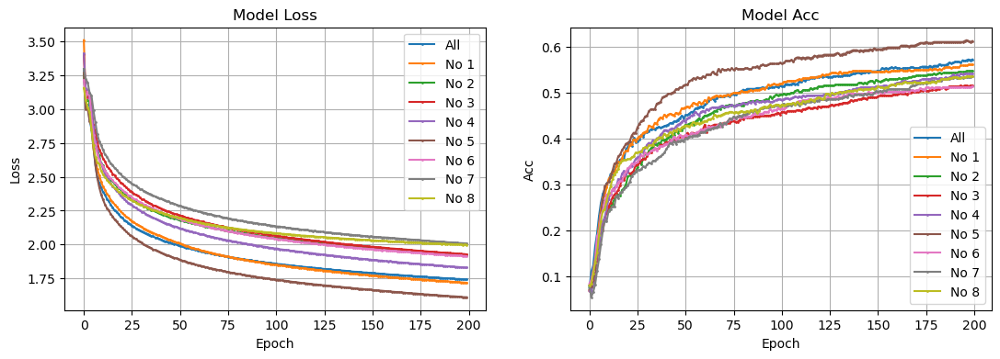

0    Val Accuracy small to large :  [6 3 7 8 4 2 1 0 5]
0    Val Loss     small to large :  [7 8 3 2 6 4 0 1 5] 




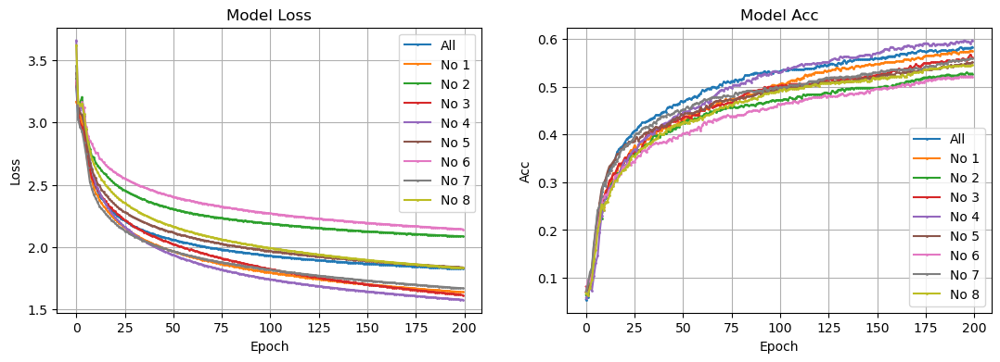

1    Val Accuracy small to large :  [6 2 8 5 7 3 1 0 4]
1    Val Loss     small to large :  [6 2 5 8 0 7 1 3 4] 




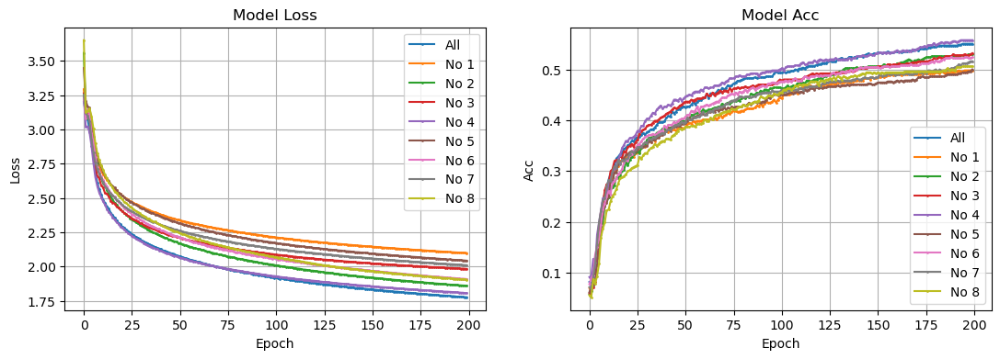

2    Val Accuracy small to large :  [1 5 8 7 6 2 3 0 4]
2    Val Loss     small to large :  [1 5 7 3 6 8 2 4 0] 




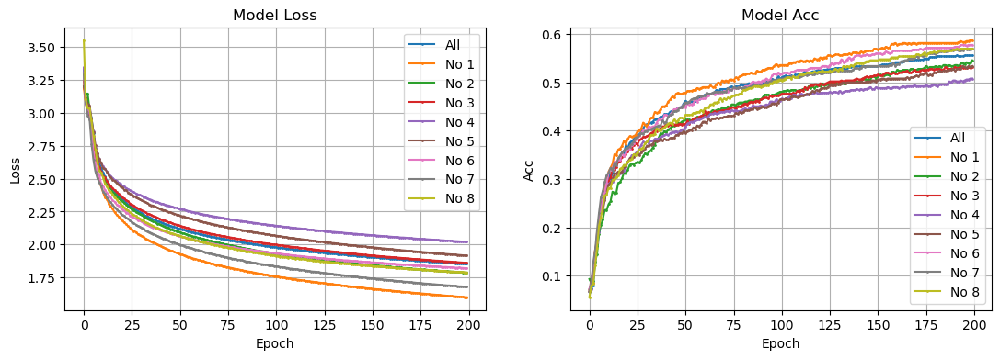

3    Val Accuracy small to large :  [4 3 5 2 0 7 8 6 1]
3    Val Loss     small to large :  [4 5 3 0 6 8 2 7 1] 




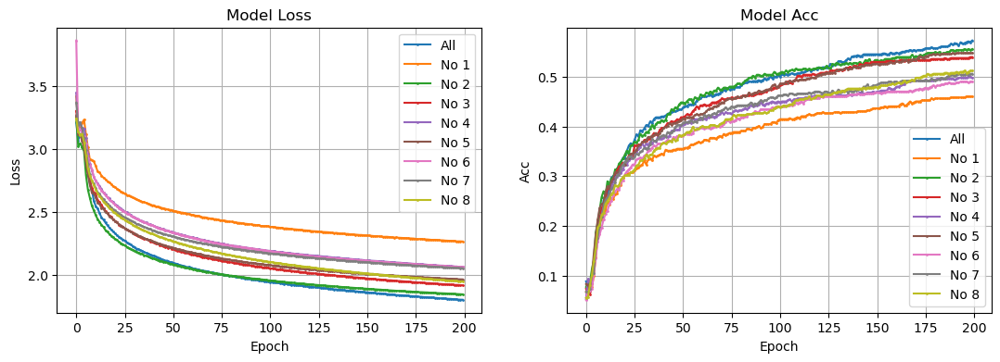

4    Val Accuracy small to large :  [1 6 4 7 8 3 5 2 0]
4    Val Loss     small to large :  [1 4 6 7 5 8 3 2 0] 




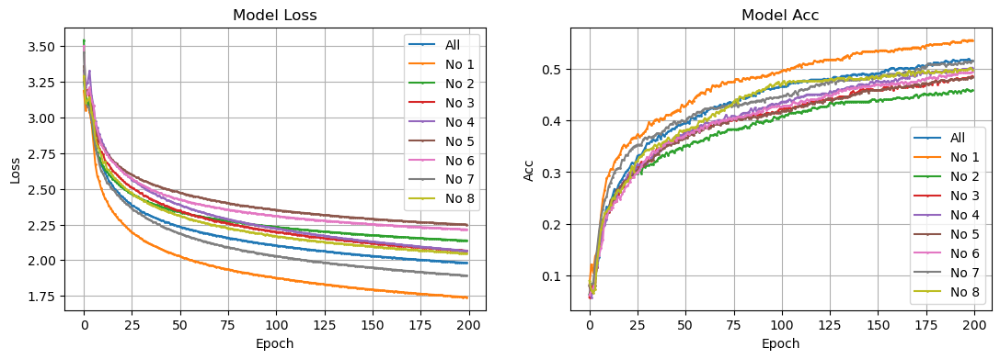

5    Val Accuracy small to large :  [2 5 3 6 4 8 7 0 1]
5    Val Loss     small to large :  [5 6 2 3 4 8 0 7 1] 




In [23]:
for subject in range(6):
    globals()['Sub{}_history'.format(subject)] = [globals()['history_all_S{}'.format(subject)]]

    for no_sensor in range(8):
        globals()['Sub{}_history'.format(subject)].append(globals()['history_no{}_S{}'.format(no_sensor, subject)])

    draw_all(globals()['Sub{}_history'.format(subject)])

    val_acc_lst, val_loss_lst = [], []

    for i in range(len(globals()['Sub{}_history'.format(subject)])):
        val_acc_lst.append(np.max(globals()['Sub{}_history'.format(subject)][i].history['val_acc']))
        val_loss_lst.append(np.min(globals()['Sub{}_history'.format(subject)][i].history['val_loss']))


    print(subject, "   Val Accuracy small to large : ", np.argsort(val_acc_lst))
    print(subject, "   Val Loss     small to large : ", np.argsort(val_loss_lst)[::-1], "\n\n" )